##### Momentum Strategy - Based on Andreas F. Clenow’s book Stocks on the Move: Beating the Market with Hedge Fund Momentum Strategy

### Imports & Settings

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
import os
import datetime
import pandas as pd
import numpy as np
import pandas_datareader.data as web
idx = pd.IndexSlice

In [3]:
import matplotlib.pyplot as plt
import warnings
import seaborn as sns
import yfinance as yf
import investpy
import pyfolio as pf
import backtrader as bt
import collections
from scipy.stats import linregress

C:\Users\Admin\AppData\Roaming\Python\Python38\site-packages\pyfolio\pos.py:26: UserWarning: Module "zipline.assets" not found; multipliers will not be applied to position notionals.
  warnings.warn(


In [4]:
import warnings
warnings.filterwarnings("ignore")
sns.set_style('whitegrid')
np.random.seed(42)
bt.__version__

'1.9.76.123'

### Prepare Data

We will take top Nifty 100 Indian companies for this analysis.

In [5]:
DATA_STORE = '../../Data-Daily/india_asset.h5'

In [6]:
with pd.HDFStore(DATA_STORE) as store:
    print(store.info())

<class 'pandas.io.pytables.HDFStore'>
File path: ../../Data-Daily/india_asset.h5
/bse/bse50/metadata                       frame        (shape->[49,6])     
/bse/bse500/metadata                      frame        (shape->[472,7])    
/ind/bse500/prices                        frame        (shape->[1707187,7])
/ind/equity/prices                        frame        (shape->[1755502,7])
/ind/investing_meta/metadata              frame        (shape->[1,5])      
/ind/nifty500_investing/prices            frame        (shape->[1462693,5])
/ind/nifty50_investing/prices             frame        (shape->[213669,5]) 
/mf_eft/metadata                          frame        (shape->[23,5])     
/nse/nifty100/metadata                    frame        (shape->[1,10])     
/nse/nifty100_mid/metadata                frame        (shape->[1,4])      
/nse/nifty100_small/metadata              frame        (shape->[1,4])      
/nse/nifty200/metadata                    frame        (shape->[1,10])     
/nse/ni

In [7]:
with pd.HDFStore(DATA_STORE) as store:
    nifty100_m = (store['/nse/nifty100/metadata'])
nifty100_m.head(2)

,key_0,Symbol,Company Name,Industry,Series,country,name,full_name,currency,symbol
isin,,,,,,,,,,
INE012A01025,INE012A01025,ACC,ACC Ltd.,CEMENT & CEMENT PRODUCTS,EQ,india,ACC,ACC Ltd,INR,ACC
INE358A01014,INE358A01014,ABBOTINDIA,Abbott India Ltd.,PHARMA,EQ,india,Abbott India,Abbott India Ltd,INR,ABOT


In [8]:
tickers = nifty100_m.dropna().symbol.to_list()
# not_avaible = ['ADANIGREEN', 'BANDHANBNK', 'HDFCAMC', 'TATACONSUM', 'MCDOWELL-N']
# tickers = [ele for ele in tickers if ele not in not_avaible]
print(tickers)
print(len(tickers))

['ACC', 'ABOT', 'ADNA', 'APSE', 'ADAI', 'ALKE', 'ABUJ', 'ASPN', 'ARBN', 'AVEU', 'AXBK', 'BAJA', 'BJFN', 'BJFS', 'BJAT', 'BANH', 'BOB', 'BRGR', 'BPCL', 'BRTI', 'BHRI', 'BION', 'BOSH', 'BRIT', 'CADI', 'CIPL', 'COAL', 'COLG', 'CCRI', 'DLF', 'DABU', 'DIVI', 'REDY', 'GAIL', 'GENA', 'GOCP', 'GRAS', 'HCLT', 'HDFA', 'HDBK', 'HDFL', 'HVEL', 'HROM', 'HALC', 'HPCL', 'HLL', 'HZNC', 'HDFC', 'ICBK', 'ICIL', 'ICIR', 'ITC', 'IOC', 'IGAS', 'INBK', 'INED', 'INFY', 'INGL', 'JSTL', 'KTKM', 'LRTI', 'LART', 'LUPN', 'MAHM', 'MRCO', 'MRTI', 'MOSS', 'MUTT', 'NMDC', 'NTPC', 'NEST', 'ONGC', 'ORCL', 'PLNG', 'PIDI', 'PIRA', 'PWFC', 'PGRD', 'PROC', 'PNBK', 'RELI', 'SBIL', 'SHCM', 'SIEM', 'SBI', 'SUN', 'TCS', 'TAGL', 'TAMO', 'TISC', 'TEML', 'TITN', 'TORP', 'UPLL', 'ULTC', 'UBBW', 'UNSP', 'WIPR']
98


In [9]:
# l = [pos for pos in tickers if pos not in ['ICICIBANK', 'ACC']]
# for i, d in enumerate(l[:5]):
#     print('i---', i)
#     print('d---', d)
# l = []
# for i, d in enumerate(tickers[:5]):
#     if d not in (['ICICIBANK', 'ACC']):
#         l.append(d)
# print(l)

In [10]:
columns = ['close','high','low','open','volume']
with pd.HDFStore(DATA_STORE) as store:
#     prices = store['/ind/bse500/prices'].loc[idx[tickers, :], columns]
    prices = store['/ind/nifty500_investing/prices'].loc[idx[tickers, :], columns]
prices.head(3)

close    high    low   open   volume
ticker date                                             
ACC    2000-01-03  268.55  271.45  255.1  258.9  5447617
       2000-01-04  256.60  269.50  255.1  268.0  2978528
       2000-01-05  250.30  268.00  244.5  249.9  2802364

In [11]:
# remove tickers where we have less than 10 years of data.
min_obs = 2520
nobs = prices.groupby(level='ticker').size()
keep = nobs[nobs>min_obs].index
prices = prices.loc[idx[keep,:], :]
prices.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 341387 entries, ('ABOT', Timestamp('2000-01-03 00:00:00')) to ('WIPR', Timestamp('2020-12-24 00:00:00'))
Data columns (total 5 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   close   341387 non-null  float64
 1   high    341387 non-null  float64
 2   low     341387 non-null  float64
 3   open    341387 non-null  float64
 4   volume  341387 non-null  int64  
dtypes: float64(4), int64(1)
memory usage: 14.5+ MB


In [12]:
prices.index.unique(level='ticker')

Index(['ABOT', 'ABUJ', 'ACC', 'APSE', 'ARBN', 'ASPN', 'AXBK', 'BAJA', 'BION',
       'BJAT', 'BJFN', 'BJFS', 'BOB', 'BOSH', 'BPCL', 'BRGR', 'BRIT', 'BRTI',
       'CADI', 'CCRI', 'COLG', 'DABU', 'DIVI', 'DLF', 'GAIL', 'GOCP', 'GRAS',
       'HALC', 'HCLT', 'HDBK', 'HDFC', 'HLL', 'HPCL', 'HROM', 'HVEL', 'HZNC',
       'ICBK', 'IGAS', 'INBK', 'INED', 'INFY', 'IOC', 'ITC', 'JSTL', 'KTKM',
       'LART', 'LUPN', 'MAHM', 'MOSS', 'MRCO', 'MRTI', 'NEST', 'NMDC', 'NTPC',
       'ONGC', 'ORCL', 'PGRD', 'PIDI', 'PIRA', 'PLNG', 'PNBK', 'PROC', 'PWFC',
       'REDY', 'RELI', 'SBI', 'SHCM', 'SIEM', 'SUN', 'TAGL', 'TAMO', 'TCS',
       'TEML', 'TISC', 'TITN', 'UBBW', 'ULTC', 'UNSP', 'UPLL', 'WIPR'],
      dtype='object', name='ticker')

In [13]:
len(prices.index.unique(level='ticker'))

80

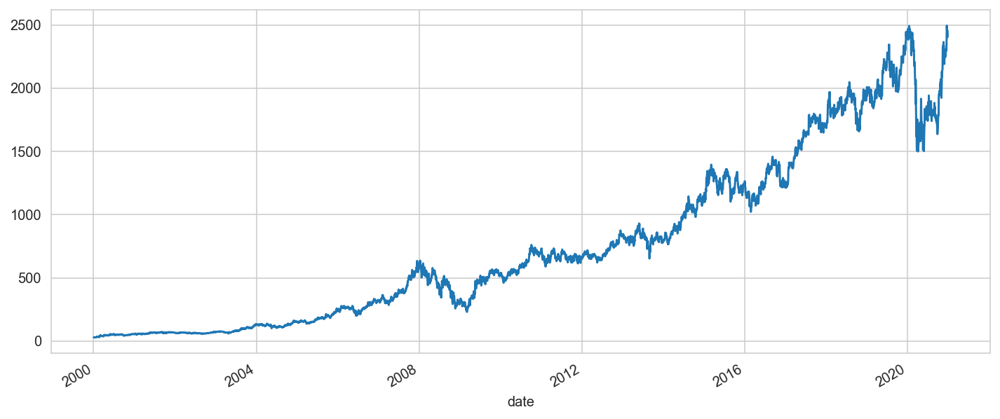

In [14]:
prices.loc['HDFC'].close.plot(figsize=(12,5));

In [15]:
fromdate=datetime.datetime(2010, 1, 1)
todate=datetime.datetime(2020, 12, 24)

In [16]:
# Calculate momentum
def momentum_func(self, the_array):
    r = np.log(the_array)
    slope, _, rvalue, _, _ = linregress(np.arange(len(r)), r)
    annualized = (1 + slope) ** 252
    return annualized * (rvalue ** 2)

In [17]:
class Momentum(bt.ind.OperationN):
    lines = ('trend',)
    params = dict(period=126)
    func = momentum_func

### Momentum with Equal Weights

In [18]:
class StrategyEqWt(bt.Strategy):
    params = dict(
        # parametrize the Momentum and its period
        momentum=Momentum,
        momentum_period=126,
        num_positions=30,

        printlog=True,
        reserve=0.00  # 5% reserve capital
    )

    def log(self, txt, dt=None, doprint=False):
        ''' Logging function '''
        if self.params.printlog or doprint:
            dt = dt or self.data.datetime[0]
            if isinstance(dt, float):
                dt = bt.num2date(dt)
            print("%s, %s" % (dt.isoformat(), txt))

    def __init__(self):
        self.securities = self.datas
        self.inds = collections.defaultdict(dict)
        for d in self.datas:
            self.inds[d]['mom'] = self.p.momentum(d, period=self.p.momentum_period)

        # To keep track of pending orders and buy price/commission
        self.order = None
        self.buyprice = None
        self.buycomm = None

    def rebalance(self):
        rankings = list(self.securities)
        rankings.sort(key=lambda s: self.inds[s]['mom'][0], reverse=True)

        # allocation perc per stock
        # reserve kept to make sure orders are not rejected due to
        # margin. Prices are calculated when known (close), but orders can only
        # be executed next day (opening price). Price can gap upwards
        pos_size = (1.0 - self.p.reserve) / self.p.num_positions

        # Sell stocks no longer meeting ranking filter.
        for i, d in enumerate(rankings):
            if self.getposition(d).size:
                if i > self.p.num_positions:
                    self.close(d)
                    self.log('Leave {} - Rank {:.2f}'.format(d._name, i)) 
        
        # Buy and rebalance stocks with remaining cash
        for i, d in enumerate(rankings[:self.p.num_positions]):
            cash = self.broker.get_cash()
            value = self.broker.get_value()
            if cash <= 0:
                break
            if not self.getposition(d).size:
                self.order_target_percent(d, target=pos_size)
                self.log('Buy {} - Rank {:.2f}'.format(d._name, i)) 

        # Final portfolio
        portfolio = []
        for i, d in enumerate(rankings):
            if self.getposition(d).size:
                if i < self.p.num_positions:
                    portfolio.append(d._name)
        self.log('Portfolio - %s'% portfolio)

    def next(self):
        self.rebalance()

    def notify_order(self, order):
        if order.status in [order.Submitted, order.Accepted]:
            # Buy/Sell order submitted/accepted to/by broker - Nothing to do
            return

        # Check if an order has been completed
        # Attention: broker could reject order if not enough cash
        if order.status in [order.Completed]:
            if order.isbuy():
                self.log(
                    'BUY EXECUTED, Price: %.2f, Cost: %.2f, Comm %.2f' %
                    (order.executed.price, order.executed.value, order.executed.comm))

                self.buyprice = order.executed.price
                self.buycomm = order.executed.comm
            else:  # Sell
                self.log('SELL EXECUTED, Price: %.2f, Cost: %.2f, Comm %.2f' %
                         (order.executed.price, order.executed.value,order.executed.comm))

        elif order.status in [order.Canceled, order.Margin, order.Rejected]:
            self.log('Order Canceled/Margin/Rejected')

        self.order = None
    
    def stop(self):
        self.log('| %2d | %2d |  %.2f |' %
                 (self.p.momentum_period, self.p.num_positions, self.broker.getvalue()), doprint=True)         

In [19]:
# Model Settings
startcash = 500000
momentum_period = 126 #days
num_positions = 30
reserve = 0.0
printlog=True,


# Commission and Slippage Settings
commission = 0.0025
# enable_slippage = True 
# slippage_volume_limit = 0.25
# slippage_impact = 0.1

In [20]:
cerebro = bt.Cerebro(stdstats=False)
cerebro.broker.set_coc(True)
cerebro.broker.setcash(startcash)
cerebro.broker.setcommission(commission=commission)

In [21]:
# Add securities as datas1:
for ticker, data in prices.groupby(level=0):
    if ticker in tickers:
        print(f"Adding ticker: {ticker}")
        data = bt.feeds.PandasData(dataname=data.droplevel(level=0),
                                   name=str(ticker),
                                   fromdate=fromdate,
                                   todate=todate,
                                   plot=False)
        cerebro.adddata(data)

Adding ticker: ABOT
Adding ticker: ABUJ
Adding ticker: ACC
Adding ticker: APSE
Adding ticker: ARBN
Adding ticker: ASPN
Adding ticker: AXBK
Adding ticker: BAJA
Adding ticker: BION
Adding ticker: BJAT
Adding ticker: BJFN
Adding ticker: BJFS
Adding ticker: BOB
Adding ticker: BOSH
Adding ticker: BPCL
Adding ticker: BRGR
Adding ticker: BRIT
Adding ticker: BRTI
Adding ticker: CADI
Adding ticker: CCRI
Adding ticker: COLG
Adding ticker: DABU
Adding ticker: DIVI
Adding ticker: DLF
Adding ticker: GAIL
Adding ticker: GOCP
Adding ticker: GRAS
Adding ticker: HALC
Adding ticker: HCLT
Adding ticker: HDBK
Adding ticker: HDFC
Adding ticker: HLL
Adding ticker: HPCL
Adding ticker: HROM
Adding ticker: HVEL
Adding ticker: HZNC
Adding ticker: ICBK
Adding ticker: IGAS
Adding ticker: INBK
Adding ticker: INED
Adding ticker: INFY
Adding ticker: IOC
Adding ticker: ITC
Adding ticker: JSTL
Adding ticker: KTKM
Adding ticker: LART
Adding ticker: LUPN
Adding ticker: MAHM
Adding ticker: MOSS
Adding ticker: MRCO
Adding

In [22]:
cerebro.addanalyzer(bt.analyzers.Returns)
cerebro.addanalyzer(bt.analyzers.DrawDown)
cerebro.addanalyzer(bt.analyzers.PyFolio, _name='pyfolio')

cerebro.addstrategy(StrategyEqWt,
                    momentum_period = momentum_period,
                    num_positions = num_positions,
                    printlog = printlog,
                    reserve = reserve
                   )

0

In [23]:
%%time
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())
# Run the strategy. Results will be output from stop.
results_eq_wts = cerebro.run()

# # Run over everything
# cerebro.run(maxcpus=1)

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Starting Portfolio Value: 500000.00
2010-07-12T00:00:00, Buy HVEL - Rank 0.00
2010-07-12T00:00:00, Buy DIVI - Rank 1.00
2010-07-12T00:00:00, Buy COLG - Rank 2.00
2010-07-12T00:00:00, Buy BJFN - Rank 3.00
2010-07-12T00:00:00, Buy TITN - Rank 4.00
2010-07-12T00:00:00, Buy ABOT - Rank 5.00
2010-07-12T00:00:00, Buy CADI - Rank 6.00
2010-07-12T00:00:00, Buy BAJA - Rank 7.00
2010-07-12T00:00:00, Buy GOCP - Rank 8.00
2010-07-12T00:00:00, Buy INBK - Rank 9.00
2010-07-12T00:00:00, Buy LUPN - Rank 10.00
2010-07-12T00:00:00, Buy BOB - Rank 11.00
2010-07-12T00:00:00, Buy PIRA - Rank 12.00
2010-07-12T00:00:00, Buy UBBW - Rank 13.00
2010-07-12T00:00:00, Buy ASPN - Rank 14.00
2010-07-12T00:00:00, Buy IGAS - Rank 15.00
2010-07-12T00:00:00, Buy REDY - Rank 16.00
2010-07-12T00:00:00, Buy DABU - Rank 17.00
2010-07-12T00:00:00, Buy ITC - Rank 18.00
2010-07-12T00:00:00, Buy BJAT - Rank 19.00
2010-07-12T00:00:00, Buy NEST - Rank 20.00
2010-07-12T00:00:00, Buy BJFS - Rank 21.00
2010-07-12T00:00:00, Buy AXBK 

2010-08-19T00:00:00, SELL EXECUTED, Price: 796.49, Cost: 16078.18, Comm 37.83
2010-08-19T00:00:00, BUY EXECUTED, Price: 131.57, Cost: 17630.38, Comm 44.08
2010-08-19T00:00:00, Portfolio - ['HVEL', 'DIVI', 'COLG', 'BJFN', 'TITN', 'UBBW', 'BRGR', 'BAJA', 'GOCP', 'ASPN', 'IGAS', 'ABOT', 'PWFC', 'INBK', 'HPCL', 'SBI', 'ITC', 'BOB', 'BOSH', 'DABU', 'TAGL', 'BJAT', 'BRIT', 'CADI', 'LUPN', 'BJFS', 'IOC', 'PIDI', 'MAHM', 'UPLL']
2010-08-20T00:00:00, Portfolio - ['HVEL', 'DIVI', 'COLG', 'BJFN', 'TITN', 'UBBW', 'BRGR', 'BAJA', 'GOCP', 'ASPN', 'IGAS', 'ABOT', 'HPCL', 'INBK', 'PWFC', 'SBI', 'ITC', 'BOSH', 'BOB', 'DABU', 'BRIT', 'BJAT', 'TAGL', 'CADI', 'IOC', 'BJFS', 'LUPN', 'PIDI', 'MAHM', 'UPLL']
2010-08-23T00:00:00, Buy BPCL - Rank 27.00
2010-08-23T00:00:00, Portfolio - ['HVEL', 'DIVI', 'COLG', 'BJFN', 'TITN', 'UBBW', 'BRGR', 'BAJA', 'GOCP', 'IGAS', 'ASPN', 'ABOT', 'HPCL', 'PWFC', 'INBK', 'SBI', 'ITC', 'BOSH', 'BOB', 'DABU', 'BRIT', 'BJAT', 'IOC', 'TAGL', 'BJFS', 'CADI', 'LUPN', 'PIDI', 'UPLL']


2010-09-22T00:00:00, Order Canceled/Margin/Rejected
2010-09-22T00:00:00, Order Canceled/Margin/Rejected
2010-09-22T00:00:00, Leave ABOT - Rank 32.00
2010-09-22T00:00:00, Leave DIVI - Rank 37.00
2010-09-22T00:00:00, Buy PLNG - Rank 25.00
2010-09-22T00:00:00, Buy HLL - Rank 27.00
2010-09-22T00:00:00, Buy LART - Rank 29.00
2010-09-22T00:00:00, Portfolio - ['HVEL', 'UBBW', 'BJFN', 'HPCL', 'BRGR', 'TITN', 'IGAS', 'BPCL', 'BAJA', 'ASPN', 'IOC', 'BRIT', 'SBI', 'GOCP', 'PWFC', 'BOSH', 'MOSS', 'INBK', 'ITC', 'ONGC', 'PIDI', 'BOB', 'DABU', 'BJAT', 'MAHM', 'BJFS', 'TAGL']
2010-09-23T00:00:00, Order Canceled/Margin/Rejected
2010-09-23T00:00:00, Order Canceled/Margin/Rejected
2010-09-23T00:00:00, SELL EXECUTED, Price: 1114.50, Cost: 16142.75, Comm 36.22
2010-09-23T00:00:00, SELL EXECUTED, Price: 707.90, Cost: 15943.20, Comm 37.16
2010-09-23T00:00:00, BUY EXECUTED, Price: 53.48, Cost: 18931.92, Comm 47.33
2010-09-23T00:00:00, Buy HLL - Rank 27.00
2010-09-23T00:00:00, Buy LART - Rank 28.00
2010-09-23

2010-10-28T00:00:00, Order Canceled/Margin/Rejected
2010-10-28T00:00:00, Order Canceled/Margin/Rejected
2010-10-28T00:00:00, SELL EXECUTED, Price: 104.97, Cost: 17450.88, Comm 48.02
2010-10-28T00:00:00, SELL EXECUTED, Price: 250.26, Cost: 16516.50, Comm 43.80
2010-10-28T00:00:00, BUY EXECUTED, Price: 201.23, Cost: 18915.62, Comm 47.29
2010-10-28T00:00:00, BUY EXECUTED, Price: 119.28, Cost: 18965.52, Comm 47.41
2010-10-28T00:00:00, Buy DLF - Rank 28.00
2010-10-28T00:00:00, Buy HDBK - Rank 29.00
2010-10-28T00:00:00, Portfolio - ['UBBW', 'BJFN', 'BRGR', 'TITN', 'TAMO', 'SBI', 'INBK', 'HPCL', 'BAJA', 'MOSS', 'PLNG', 'INED', 'IGAS', 'BOB', 'BION', 'PNBK', 'UNSP', 'TCS', 'PWFC', 'BPCL', 'PIDI', 'ARBN', 'ICBK', 'ITC', 'KTKM', 'HDFC', 'HVEL', 'BRIT']
2010-10-29T00:00:00, Order Canceled/Margin/Rejected
2010-10-29T00:00:00, Order Canceled/Margin/Rejected
2010-10-29T00:00:00, Leave HVEL - Rank 33.00
2010-10-29T00:00:00, Buy HALC - Rank 26.00
2010-10-29T00:00:00, Buy DLF - Rank 27.00
2010-10-29T00

2010-11-29T00:00:00, Order Canceled/Margin/Rejected
2010-11-29T00:00:00, Order Canceled/Margin/Rejected
2010-11-29T00:00:00, Order Canceled/Margin/Rejected
2010-11-29T00:00:00, Leave BRGR - Rank 31.00
2010-11-29T00:00:00, Buy MAHM - Rank 23.00
2010-11-29T00:00:00, Buy GOCP - Rank 27.00
2010-11-29T00:00:00, Buy NEST - Rank 28.00
2010-11-29T00:00:00, Buy HDBK - Rank 29.00
2010-11-29T00:00:00, Portfolio - ['UBBW', 'BJFN', 'TAMO', 'TITN', 'INED', 'HALC', 'INBK', 'PLNG', 'ARBN', 'ICBK', 'BOB', 'TCS', 'BAJA', 'SBI', 'BION', 'GRAS', 'BJAT', 'KTKM', 'ABUJ', 'PNBK', 'TISC', 'SUN', 'HDFC', 'MOSS', 'HZNC', 'HVEL']
2010-11-30T00:00:00, Order Canceled/Margin/Rejected
2010-11-30T00:00:00, Order Canceled/Margin/Rejected
2010-11-30T00:00:00, Order Canceled/Margin/Rejected
2010-11-30T00:00:00, SELL EXECUTED, Price: 30.84, Cost: 16646.28, Comm 45.95
2010-11-30T00:00:00, BUY EXECUTED, Price: 385.07, Cost: 17713.22, Comm 44.28
2010-11-30T00:00:00, Buy NEST - Rank 27.00
2010-11-30T00:00:00, Buy GOCP - Rank

2010-12-31T00:00:00, Order Canceled/Margin/Rejected
2010-12-31T00:00:00, Order Canceled/Margin/Rejected
2010-12-31T00:00:00, Order Canceled/Margin/Rejected
2010-12-31T00:00:00, Buy INFY - Rank 25.00
2010-12-31T00:00:00, Buy GAIL - Rank 27.00
2010-12-31T00:00:00, Buy HLL - Rank 28.00
2010-12-31T00:00:00, Portfolio - ['TAMO', 'HALC', 'TCS', 'ARBN', 'UBBW', 'SUN', 'TITN', 'PLNG', 'NEST', 'INED', 'REDY', 'MAHM', 'BION', 'ACC', 'LUPN', 'ULTC', 'GRAS', 'INBK', 'CADI', 'ICBK', 'TISC', 'HZNC', 'BJAT', 'ABUJ', 'BOB', 'BAJA', 'BJFN']
2011-01-03T00:00:00, Order Canceled/Margin/Rejected
2011-01-03T00:00:00, Order Canceled/Margin/Rejected
2011-01-03T00:00:00, Order Canceled/Margin/Rejected
2011-01-03T00:00:00, Buy INFY - Rank 24.00
2011-01-03T00:00:00, Buy GAIL - Rank 27.00
2011-01-03T00:00:00, Buy HLL - Rank 28.00
2011-01-03T00:00:00, Portfolio - ['TAMO', 'HALC', 'TCS', 'ARBN', 'SUN', 'UBBW', 'TITN', 'PLNG', 'NEST', 'REDY', 'MAHM', 'INED', 'LUPN', 'ACC', 'BION', 'ULTC', 'CADI', 'GRAS', 'INBK', 'TI

2011-02-09T00:00:00, Buy IOC - Rank 28.00
2011-02-09T00:00:00, Buy BRIT - Rank 29.00
2011-02-09T00:00:00, Portfolio - ['TCS', 'CADI', 'HALC', 'SUN', 'PLNG', 'ARBN', 'HZNC', 'INFY', 'HCLT', 'LUPN', 'REDY', 'NEST', 'TAMO', 'GRAS', 'TISC', 'MAHM', 'TITN', 'CCRI', 'PGRD', 'DIVI', 'UBBW', 'ACC', 'ABOT', 'PIRA', 'PROC', 'APSE']
2011-02-10T00:00:00, Order Canceled/Margin/Rejected
2011-02-10T00:00:00, Order Canceled/Margin/Rejected
2011-02-10T00:00:00, Order Canceled/Margin/Rejected
2011-02-10T00:00:00, SELL EXECUTED, Price: 186.35, Cost: 17833.85, Comm 39.60
2011-02-10T00:00:00, BUY EXECUTED, Price: 402.61, Cost: 16104.40, Comm 40.26
2011-02-10T00:00:00, Buy BPCL - Rank 24.00
2011-02-10T00:00:00, Buy DABU - Rank 27.00
2011-02-10T00:00:00, Buy IOC - Rank 28.00
2011-02-10T00:00:00, Buy BRIT - Rank 29.00
2011-02-10T00:00:00, Portfolio - ['TCS', 'CADI', 'HALC', 'SUN', 'PLNG', 'ARBN', 'HZNC', 'INFY', 'HCLT', 'LUPN', 'REDY', 'NEST', 'TAMO', 'GRAS', 'TISC', 'CCRI', 'PGRD', 'MAHM', 'TITN', 'DIVI', 'B

2011-03-09T00:00:00, Buy ABUJ - Rank 25.00
2011-03-09T00:00:00, Buy LART - Rank 28.00
2011-03-09T00:00:00, Portfolio - ['TCS', 'CADI', 'HZNC', 'HCLT', 'BRIT', 'CCRI', 'ONGC', 'HDBK', 'PGRD', 'DIVI', 'APSE', 'PNBK', 'NTPC', 'PIRA', 'BPCL', 'AXBK', 'SBI', 'HVEL', 'BJFN', 'IOC', 'PROC', 'MRTI', 'TAGL', 'BJAT', 'UNSP', 'SHCM', 'HALC']
2011-03-10T00:00:00, Order Canceled/Margin/Rejected
2011-03-10T00:00:00, Order Canceled/Margin/Rejected
2011-03-10T00:00:00, SELL EXECUTED, Price: 568.40, Cost: 16104.40, Comm 56.84
2011-03-10T00:00:00, BUY EXECUTED, Price: 215.88, Cost: 16622.76, Comm 41.56
2011-03-10T00:00:00, Leave DABU - Rank 31.00
2011-03-10T00:00:00, Leave HALC - Rank 41.00
2011-03-10T00:00:00, Buy ABUJ - Rank 25.00
2011-03-10T00:00:00, Buy LART - Rank 27.00
2011-03-10T00:00:00, Buy HDFC - Rank 29.00
2011-03-10T00:00:00, Portfolio - ['TCS', 'CADI', 'HZNC', 'HCLT', 'BRIT', 'CCRI', 'ONGC', 'HDBK', 'PGRD', 'APSE', 'PNBK', 'NTPC', 'DIVI', 'AXBK', 'BPCL', 'PIRA', 'SBI', 'HVEL', 'MRTI', 'BJFN

2011-04-20T00:00:00, SELL EXECUTED, Price: 146.90, Cost: 17003.70, Comm 46.27
2011-04-20T00:00:00, BUY EXECUTED, Price: 1625.20, Cost: 17877.20, Comm 44.69
2011-04-20T00:00:00, Portfolio - ['HCLT', 'HZNC', 'TCS', 'BRIT', 'MOSS', 'MRTI', 'ONGC', 'BPCL', 'CADI', 'HLL', 'ORCL', 'BJAT', 'IOC', 'GAIL', 'TAGL', 'LART', 'BION', 'SIEM', 'LUPN', 'GOCP', 'HPCL', 'UNSP', 'IGAS', 'PNBK', 'PWFC', 'SBI', 'REDY', 'JSTL', 'CCRI', 'GRAS']
2011-04-21T00:00:00, Portfolio - ['HCLT', 'HZNC', 'MOSS', 'TCS', 'BRIT', 'MRTI', 'ONGC', 'BPCL', 'CADI', 'ORCL', 'HLL', 'BJAT', 'IOC', 'TAGL', 'LART', 'GAIL', 'LUPN', 'SIEM', 'BION', 'GOCP', 'HPCL', 'UNSP', 'IGAS', 'PWFC', 'PNBK', 'REDY', 'JSTL', 'CCRI', 'GRAS', 'SBI']
2011-04-25T00:00:00, Leave SBI - Rank 31.00
2011-04-25T00:00:00, Buy ARBN - Rank 29.00
2011-04-25T00:00:00, Portfolio - ['HCLT', 'HZNC', 'MOSS', 'TCS', 'BRIT', 'MRTI', 'ONGC', 'BPCL', 'CADI', 'HLL', 'ORCL', 'BJAT', 'IOC', 'TAGL', 'LUPN', 'LART', 'GAIL', 'SIEM', 'GOCP', 'BION', 'UNSP', 'HPCL', 'REDY', 'P

2011-06-02T00:00:00, Order Canceled/Margin/Rejected
2011-06-02T00:00:00, Leave MRTI - Rank 31.00
2011-06-02T00:00:00, Buy NEST - Rank 24.00
2011-06-02T00:00:00, Buy PIRA - Rank 29.00
2011-06-02T00:00:00, Portfolio - ['MOSS', 'DIVI', 'MRCO', 'CADI', 'TITN', 'SIEM', 'HCLT', 'ITC', 'INED', 'PROC', 'BJFS', 'ABOT', 'UBBW', 'INFY', 'BOSH', 'PGRD', 'TISC', 'BRTI', 'HALC', 'HZNC', 'GAIL', 'NTPC', 'PWFC', 'UNSP', 'CCRI', 'ARBN', 'LART', 'DLF']
2011-06-03T00:00:00, Order Canceled/Margin/Rejected
2011-06-03T00:00:00, SELL EXECUTED, Price: 1225.40, Cost: 15744.60, Comm 36.76
2011-06-03T00:00:00, BUY EXECUTED, Price: 4105.20, Cost: 16420.80, Comm 41.05
2011-06-03T00:00:00, Buy PIRA - Rank 25.00
2011-06-03T00:00:00, Portfolio - ['MOSS', 'DIVI', 'TITN', 'MRCO', 'CADI', 'SIEM', 'ITC', 'HCLT', 'INED', 'PROC', 'ABOT', 'BJFS', 'BOSH', 'INFY', 'UBBW', 'TISC', 'PGRD', 'BRTI', 'HALC', 'NTPC', 'GAIL', 'PWFC', 'HZNC', 'UNSP', 'NEST', 'CCRI', 'ARBN', 'DLF', 'LART']
2011-06-06T00:00:00, Order Canceled/Margin/Re

2011-07-20T00:00:00, SELL EXECUTED, Price: 541.63, Cost: 18173.05, Comm 47.39
2011-07-20T00:00:00, BUY EXECUTED, Price: 1791.80, Cost: 17918.00, Comm 44.80
2011-07-20T00:00:00, Portfolio - ['TITN', 'DIVI', 'INED', 'BRIT', 'ASPN', 'MOSS', 'ITC', 'PIDI', 'NEST', 'PROC', 'BRTI', 'MRCO', 'BOSH', 'COLG', 'DABU', 'IGAS', 'CADI', 'HDBK', 'ABOT', 'HLL', 'BRGR', 'GOCP', 'PLNG', 'HVEL', 'HROM', 'INBK', 'HPCL', 'UBBW', 'KTKM', 'APSE']
2011-07-21T00:00:00, Buy SUN - Rank 29.00
2011-07-21T00:00:00, Portfolio - ['TITN', 'DIVI', 'INED', 'BRIT', 'ASPN', 'ITC', 'PIDI', 'MOSS', 'NEST', 'BRTI', 'MRCO', 'IGAS', 'PROC', 'BOSH', 'DABU', 'COLG', 'CADI', 'HDBK', 'HLL', 'GOCP', 'BRGR', 'ABOT', 'PLNG', 'HROM', 'HVEL', 'INBK', 'HPCL', 'UBBW', 'KTKM']
2011-07-22T00:00:00, Order Canceled/Margin/Rejected
2011-07-22T00:00:00, Buy SUN - Rank 27.00
2011-07-22T00:00:00, Portfolio - ['TITN', 'DIVI', 'INED', 'BRIT', 'ASPN', 'PIDI', 'ITC', 'MOSS', 'NEST', 'IGAS', 'MRCO', 'BRTI', 'COLG', 'BOSH', 'DABU', 'PROC', 'GOCP', 'BR

2011-09-05T00:00:00, Order Canceled/Margin/Rejected
2011-09-05T00:00:00, SELL EXECUTED, Price: 1986.95, Cost: 15742.00, Comm 39.74
2011-09-05T00:00:00, SELL EXECUTED, Price: 1476.65, Cost: 17083.80, Comm 44.30
2011-09-05T00:00:00, BUY EXECUTED, Price: 201.34, Cost: 18120.60, Comm 45.30
2011-09-05T00:00:00, BUY EXECUTED, Price: 364.80, Cost: 18240.00, Comm 45.60
2011-09-05T00:00:00, Leave CADI - Rank 32.00
2011-09-05T00:00:00, Buy INFY - Rank 28.00
2011-09-05T00:00:00, Buy WIPR - Rank 29.00
2011-09-05T00:00:00, Portfolio - ['IGAS', 'PLNG', 'BRIT', 'ASPN', 'BRTI', 'MRCO', 'PIDI', 'HROM', 'HLL', 'BPCL', 'ITC', 'GOCP', 'BOSH', 'NEST', 'COLG', 'LUPN', 'DIVI', 'TITN', 'SUN', 'BRGR', 'HPCL', 'INED', 'DABU', 'GRAS', 'RELI', 'NMDC', 'CCRI', 'PIRA']
2011-09-06T00:00:00, Order Canceled/Margin/Rejected
2011-09-06T00:00:00, SELL EXECUTED, Price: 166.58, Cost: 18575.72, Comm 50.81
2011-09-06T00:00:00, BUY EXECUTED, Price: 280.92, Cost: 18259.80, Comm 45.65
2011-09-06T00:00:00, Buy WIPR - Rank 29.00


2011-10-07T00:00:00, Buy GAIL - Rank 28.00
2011-10-07T00:00:00, Buy ONGC - Rank 29.00
2011-10-07T00:00:00, Portfolio - ['IGAS', 'PLNG', 'BRIT', 'HLL', 'HROM', 'ASPN', 'LUPN', 'COLG', 'BOSH', 'NEST', 'BAJA', 'BPCL', 'PIDI', 'REDY', 'MRTI', 'BJAT', 'ITC', 'NMDC', 'RELI', 'MRCO', 'CCRI', 'ICBK', 'TCS', 'PIRA', 'INFY', 'BOB', 'WIPR', 'UNSP']
2011-10-10T00:00:00, Order Canceled/Margin/Rejected
2011-10-10T00:00:00, SELL EXECUTED, Price: 197.30, Cost: 18400.20, Comm 41.43
2011-10-10T00:00:00, BUY EXECUTED, Price: 115.62, Cost: 17805.48, Comm 44.51
2011-10-10T00:00:00, Buy MAHM - Rank 29.00
2011-10-10T00:00:00, Portfolio - ['IGAS', 'PLNG', 'BRIT', 'HLL', 'HROM', 'ASPN', 'LUPN', 'COLG', 'BAJA', 'BOSH', 'NEST', 'BPCL', 'REDY', 'PIDI', 'MRTI', 'BJAT', 'ITC', 'NMDC', 'RELI', 'CCRI', 'ICBK', 'TCS', 'PIRA', 'MRCO', 'BOB', 'INFY', 'WIPR', 'UNSP', 'GAIL']
2011-10-11T00:00:00, Order Canceled/Margin/Rejected
2011-10-11T00:00:00, Buy MAHM - Rank 23.00
2011-10-11T00:00:00, Portfolio - ['IGAS', 'PLNG', 'BR

2011-11-16T00:00:00, Order Canceled/Margin/Rejected
2011-11-16T00:00:00, SELL EXECUTED, Price: 168.62, Cost: 17587.20, Comm 50.59
2011-11-16T00:00:00, BUY EXECUTED, Price: 97.40, Cost: 18116.40, Comm 45.29
2011-11-16T00:00:00, Buy GRAS - Rank 20.00
2011-11-16T00:00:00, Buy PNBK - Rank 27.00
2011-11-16T00:00:00, Portfolio - ['BAJA', 'MAHM', 'IGAS', 'ACC', 'HROM', 'ULTC', 'PLNG', 'ABUJ', 'COLG', 'HLL', 'ITC', 'LUPN', 'CADI', 'MRTI', 'DABU', 'KTKM', 'ICBK', 'IOC', 'UNSP', 'UPLL', 'NEST', 'HZNC', 'NMDC', 'CCRI', 'SBI', 'UBBW', 'BOB', 'BJAT']
2011-11-17T00:00:00, Order Canceled/Margin/Rejected
2011-11-17T00:00:00, Order Canceled/Margin/Rejected
2011-11-17T00:00:00, Leave BJAT - Rank 31.00
2011-11-17T00:00:00, Buy GRAS - Rank 15.00
2011-11-17T00:00:00, Buy PNBK - Rank 27.00
2011-11-17T00:00:00, Buy MOSS - Rank 29.00
2011-11-17T00:00:00, Portfolio - ['BAJA', 'MAHM', 'IGAS', 'ACC', 'HROM', 'ULTC', 'PLNG', 'ABUJ', 'COLG', 'HLL', 'ITC', 'LUPN', 'CADI', 'DABU', 'MRTI', 'KTKM', 'NEST', 'ICBK', 'IO

2011-12-08T00:00:00, Order Canceled/Margin/Rejected
2011-12-08T00:00:00, SELL EXECUTED, Price: 77.37, Cost: 18577.47, Comm 46.23
2011-12-08T00:00:00, BUY EXECUTED, Price: 727.55, Cost: 17461.20, Comm 43.65
2011-12-08T00:00:00, Leave PLNG - Rank 36.00
2011-12-08T00:00:00, Buy GOCP - Rank 19.00
2011-12-08T00:00:00, Buy TEML - Rank 28.00
2011-12-08T00:00:00, Portfolio - ['BAJA', 'ACC', 'ULTC', 'ABUJ', 'HROM', 'HLL', 'SHCM', 'GRAS', 'MAHM', 'DABU', 'CADI', 'INED', 'IOC', 'GAIL', 'COLG', 'MRTI', 'PNBK', 'BOB', 'HZNC', 'BJAT', 'CCRI', 'SIEM', 'ICBK', 'UPLL', 'LART', 'UNSP', 'AXBK', 'SBI']
2011-12-09T00:00:00, Order Canceled/Margin/Rejected
2011-12-09T00:00:00, SELL EXECUTED, Price: 78.12, Cost: 18213.00, Comm 50.78
2011-12-09T00:00:00, BUY EXECUTED, Price: 192.05, Cost: 17860.65, Comm 44.65
2011-12-09T00:00:00, Buy TEML - Rank 28.00
2011-12-09T00:00:00, Buy HPCL - Rank 29.00
2011-12-09T00:00:00, Portfolio - ['BAJA', 'ACC', 'ULTC', 'ABUJ', 'HROM', 'HLL', 'SHCM', 'GRAS', 'MAHM', 'DABU', 'INED'

2011-12-29T00:00:00, BUY EXECUTED, Price: 87.45, Cost: 16877.85, Comm 42.19
2011-12-29T00:00:00, Buy MRCO - Rank 23.00
2011-12-29T00:00:00, Buy ONGC - Rank 28.00
2011-12-29T00:00:00, Portfolio - ['ABUJ', 'ACC', 'ULTC', 'HLL', 'SHCM', 'BAJA', 'GRAS', 'DABU', 'GAIL', 'GOCP', 'IOC', 'INED', 'CADI', 'BJAT', 'MRTI', 'PIDI', 'UPLL', 'NTPC', 'HDBK', 'PNBK', 'BOB', 'ASPN', 'SIEM', 'CCRI', 'TEML', 'HZNC', 'TAGL', 'SBI']
2011-12-30T00:00:00, Order Canceled/Margin/Rejected
2011-12-30T00:00:00, Order Canceled/Margin/Rejected
2011-12-30T00:00:00, Leave AXBK - Rank 33.00
2011-12-30T00:00:00, Buy MRCO - Rank 22.00
2011-12-30T00:00:00, Buy ONGC - Rank 28.00
2011-12-30T00:00:00, Portfolio - ['ABUJ', 'ACC', 'ULTC', 'HLL', 'SHCM', 'BAJA', 'GRAS', 'DABU', 'GAIL', 'GOCP', 'IOC', 'INED', 'CADI', 'BJAT', 'PIDI', 'MRTI', 'UPLL', 'HDBK', 'NTPC', 'ASPN', 'PNBK', 'BOB', 'SIEM', 'CCRI', 'TEML', 'HZNC', 'TAGL', 'SBI']
2012-01-02T00:00:00, Order Canceled/Margin/Rejected
2012-01-02T00:00:00, SELL EXECUTED, Price: 16

2012-02-09T00:00:00, Buy HPCL - Rank 29.00
2012-02-09T00:00:00, Portfolio - ['TAMO', 'SHCM', 'WIPR', 'HVEL', 'HLL', 'GRAS', 'TCS', 'ABUJ', 'ULTC', 'REDY', 'ACC', 'INFY', 'SUN', 'PIRA', 'CADI', 'GAIL', 'PIDI', 'BJAT', 'DIVI', 'IGAS', 'IOC', 'INED', 'DABU', 'ASPN', 'BION', 'BRTI', 'SIEM', 'BPCL', 'MOSS']
2012-02-10T00:00:00, Order Canceled/Margin/Rejected
2012-02-10T00:00:00, Buy HPCL - Rank 29.00
2012-02-10T00:00:00, Portfolio - ['TAMO', 'SHCM', 'WIPR', 'HVEL', 'HLL', 'GRAS', 'TCS', 'ABUJ', 'REDY', 'ULTC', 'ACC', 'SUN', 'PIRA', 'INFY', 'DIVI', 'CADI', 'GAIL', 'PIDI', 'IGAS', 'IOC', 'BJAT', 'INED', 'DABU', 'ASPN', 'BION', 'BRTI', 'SIEM', 'BPCL', 'MOSS']
2012-02-13T00:00:00, Order Canceled/Margin/Rejected
2012-02-13T00:00:00, Leave BJFS - Rank 31.00
2012-02-13T00:00:00, Buy HPCL - Rank 28.00
2012-02-13T00:00:00, Portfolio - ['TAMO', 'SHCM', 'WIPR', 'HVEL', 'HLL', 'GRAS', 'TCS', 'ABUJ', 'REDY', 'ULTC', 'PIRA', 'SUN', 'ACC', 'INFY', 'DIVI', 'CADI', 'GAIL', 'PIDI', 'IGAS', 'IOC', 'INED', 'DA

2012-03-06T00:00:00, Order Canceled/Margin/Rejected
2012-03-06T00:00:00, Buy HZNC - Rank 27.00
2012-03-06T00:00:00, Portfolio - ['TAMO', 'SHCM', 'HVEL', 'WIPR', 'PIRA', 'GRAS', 'SUN', 'ULTC', 'TCS', 'TAGL', 'REDY', 'ACC', 'HLL', 'ABUJ', 'PGRD', 'INFY', 'BJFN', 'PWFC', 'HCLT', 'GAIL', 'KTKM', 'ORCL', 'IGAS', 'CADI', 'UBBW', 'PIDI', 'INBK', 'BION', 'MAHM']
2012-03-07T00:00:00, Order Canceled/Margin/Rejected
2012-03-07T00:00:00, Buy HZNC - Rank 26.00
2012-03-07T00:00:00, Portfolio - ['TAMO', 'SHCM', 'HVEL', 'WIPR', 'PIRA', 'GRAS', 'SUN', 'ULTC', 'TCS', 'TAGL', 'REDY', 'ACC', 'HLL', 'ABUJ', 'PGRD', 'BJFN', 'INFY', 'PWFC', 'HCLT', 'GAIL', 'KTKM', 'ORCL', 'UBBW', 'IGAS', 'CADI', 'INBK', 'PIDI', 'BION', 'MAHM']
2012-03-09T00:00:00, Order Canceled/Margin/Rejected
2012-03-09T00:00:00, Leave IOC - Rank 31.00
2012-03-09T00:00:00, Buy HZNC - Rank 26.00
2012-03-09T00:00:00, Portfolio - ['TAMO', 'SHCM', 'HVEL', 'WIPR', 'PIRA', 'SUN', 'GRAS', 'ULTC', 'TAGL', 'TCS', 'REDY', 'ACC', 'HLL', 'ABUJ', 'PGRD

2012-03-30T00:00:00, Leave HLL - Rank 31.00
2012-03-30T00:00:00, Buy TEML - Rank 23.00
2012-03-30T00:00:00, Buy GOCP - Rank 28.00
2012-03-30T00:00:00, Portfolio - ['TAMO', 'SHCM', 'HVEL', 'PIRA', 'TAGL', 'ULTC', 'WIPR', 'SUN', 'UBBW', 'GRAS', 'BJFN', 'PWFC', 'JSTL', 'ACC', 'REDY', 'HCLT', 'BRIT', 'INBK', 'ORCL', 'MRTI', 'BOSH', 'HZNC', 'KTKM', 'SBI', 'ABUJ', 'PGRD', 'MRCO', 'TCS']
2012-04-02T00:00:00, Order Canceled/Margin/Rejected
2012-04-02T00:00:00, SELL EXECUTED, Price: 410.05, Cost: 18555.60, Comm 57.41
2012-04-02T00:00:00, BUY EXECUTED, Price: 356.09, Cost: 19584.95, Comm 48.96
2012-04-02T00:00:00, Buy GOCP - Rank 25.00
2012-04-02T00:00:00, Portfolio - ['TAMO', 'SHCM', 'HVEL', 'PIRA', 'TAGL', 'ULTC', 'WIPR', 'SUN', 'UBBW', 'BJFN', 'GRAS', 'PWFC', 'JSTL', 'ACC', 'REDY', 'HCLT', 'BRIT', 'INBK', 'MRTI', 'ORCL', 'BOSH', 'SBI', 'KTKM', 'TEML', 'HZNC', 'ABUJ', 'MRCO', 'PGRD', 'TCS']
2012-04-03T00:00:00, Order Canceled/Margin/Rejected
2012-04-03T00:00:00, Buy GOCP - Rank 23.00
2012-04-0

2012-05-07T00:00:00, Order Canceled/Margin/Rejected
2012-05-07T00:00:00, Order Canceled/Margin/Rejected
2012-05-07T00:00:00, SELL EXECUTED, Price: 182.30, Cost: 17223.32, Comm 44.21
2012-05-07T00:00:00, BUY EXECUTED, Price: 60.30, Cost: 19356.30, Comm 48.39
2012-05-07T00:00:00, Leave PGRD - Rank 32.00
2012-05-07T00:00:00, Buy TITN - Rank 25.00
2012-05-07T00:00:00, Buy MOSS - Rank 28.00
2012-05-07T00:00:00, Portfolio - ['TAMO', 'SHCM', 'BJFS', 'HVEL', 'TAGL', 'BJFN', 'MRTI', 'UBBW', 'GOCP', 'ULTC', 'ORCL', 'INBK', 'PIRA', 'HCLT', 'BPCL', 'BOSH', 'MRCO', 'SUN', 'ARBN', 'BRIT', 'HDBK', 'KTKM', 'SBI', 'LUPN', 'TEML', 'REDY', 'ITC', 'DABU']
2012-05-08T00:00:00, Order Canceled/Margin/Rejected
2012-05-08T00:00:00, SELL EXECUTED, Price: 105.80, Cost: 19263.15, Comm 45.23
2012-05-08T00:00:00, BUY EXECUTED, Price: 248.70, Cost: 19398.60, Comm 48.50
2012-05-08T00:00:00, Buy MOSS - Rank 27.00
2012-05-08T00:00:00, Buy ASPN - Rank 29.00
2012-05-08T00:00:00, Portfolio - ['TAMO', 'BJFS', 'SHCM', 'HVEL

2012-06-11T00:00:00, Order Canceled/Margin/Rejected
2012-06-11T00:00:00, Order Canceled/Margin/Rejected
2012-06-11T00:00:00, Buy HPCL - Rank 28.00
2012-06-11T00:00:00, Buy DIVI - Rank 29.00
2012-06-11T00:00:00, Portfolio - ['BJFS', 'BRGR', 'GOCP', 'ASPN', 'BPCL', 'BOSH', 'BJFN', 'HVEL', 'LUPN', 'PROC', 'INED', 'PIDI', 'ORCL', 'TITN', 'MRCO', 'COLG', 'ITC', 'HCLT', 'TAMO', 'SUN', 'BRIT', 'KTKM', 'INBK', 'UBBW', 'NEST', 'ULTC', 'SHCM', 'BJAT']
2012-06-12T00:00:00, Order Canceled/Margin/Rejected
2012-06-12T00:00:00, Order Canceled/Margin/Rejected
2012-06-12T00:00:00, Buy HPCL - Rank 26.00
2012-06-12T00:00:00, Buy DIVI - Rank 29.00
2012-06-12T00:00:00, Portfolio - ['BJFS', 'BRGR', 'GOCP', 'ASPN', 'BPCL', 'BOSH', 'BJFN', 'HVEL', 'PROC', 'LUPN', 'INED', 'PIDI', 'ORCL', 'COLG', 'TITN', 'ITC', 'MRCO', 'HCLT', 'SUN', 'TAMO', 'KTKM', 'BRIT', 'UBBW', 'INBK', 'NEST', 'ULTC', 'SHCM', 'BJAT']
2012-06-13T00:00:00, Order Canceled/Margin/Rejected
2012-06-13T00:00:00, Order Canceled/Margin/Rejected
2012

2012-07-12T00:00:00, Order Canceled/Margin/Rejected
2012-07-12T00:00:00, Order Canceled/Margin/Rejected
2012-07-12T00:00:00, Leave NEST - Rank 33.00
2012-07-12T00:00:00, Buy BRTI - Rank 24.00
2012-07-12T00:00:00, Buy HDBK - Rank 26.00
2012-07-12T00:00:00, Buy HZNC - Rank 29.00
2012-07-12T00:00:00, Portfolio - ['BRGR', 'GOCP', 'ASPN', 'BPCL', 'DIVI', 'BOSH', 'ITC', 'BJFS', 'PROC', 'HLL', 'BJFN', 'COLG', 'SUN', 'MRCO', 'LUPN', 'DABU', 'CADI', 'HPCL', 'PIDI', 'INED', 'HVEL', 'KTKM', 'PIRA', 'ORCL', 'ULTC', 'UBBW', 'INBK']
2012-07-13T00:00:00, Order Canceled/Margin/Rejected
2012-07-13T00:00:00, Order Canceled/Margin/Rejected
2012-07-13T00:00:00, SELL EXECUTED, Price: 4503.15, Cost: 18188.20, Comm 45.03
2012-07-13T00:00:00, BUY EXECUTED, Price: 281.24, Cost: 19124.32, Comm 47.81
2012-07-13T00:00:00, Buy HDBK - Rank 24.00
2012-07-13T00:00:00, Buy HZNC - Rank 28.00
2012-07-13T00:00:00, Portfolio - ['BRGR', 'GOCP', 'ASPN', 'DIVI', 'BPCL', 'BOSH', 'ITC', 'PROC', 'BJFS', 'HLL', 'BJFN', 'COLG', '

2012-07-31T00:00:00, Portfolio - ['DIVI', 'GOCP', 'BRGR', 'ITC', 'ASPN', 'HLL', 'BPCL', 'BJFN', 'PROC', 'BOSH', 'SUN', 'MRCO', 'HPCL', 'CADI', 'DABU', 'LUPN', 'BJFS', 'COLG', 'PIRA', 'HZNC', 'WIPR', 'HDBK', 'BAJA', 'APSE', 'BRTI', 'RELI', 'PIDI', 'INFY']
2012-08-01T00:00:00, Order Canceled/Margin/Rejected
2012-08-01T00:00:00, Order Canceled/Margin/Rejected
2012-08-01T00:00:00, Buy SIEM - Rank 25.00
2012-08-01T00:00:00, Buy UNSP - Rank 28.00
2012-08-01T00:00:00, Buy TISC - Rank 29.00
2012-08-01T00:00:00, Portfolio - ['DIVI', 'GOCP', 'BRGR', 'ITC', 'HLL', 'ASPN', 'BPCL', 'BJFN', 'PROC', 'BOSH', 'SUN', 'MRCO', 'HPCL', 'CADI', 'DABU', 'LUPN', 'BJFS', 'COLG', 'PIRA', 'HZNC', 'HDBK', 'WIPR', 'BAJA', 'BRTI', 'APSE', 'INFY', 'RELI']
2012-08-02T00:00:00, Order Canceled/Margin/Rejected
2012-08-02T00:00:00, Order Canceled/Margin/Rejected
2012-08-02T00:00:00, Order Canceled/Margin/Rejected
2012-08-02T00:00:00, Leave PIDI - Rank 34.00
2012-08-02T00:00:00, Buy UNSP - Rank 22.00
2012-08-02T00:00:00, 

2012-08-27T00:00:00, Portfolio - ['DIVI', 'GOCP', 'BJFN', 'HLL', 'BRGR', 'UNSP', 'ITC', 'CADI', 'SUN', 'MRCO', 'DABU', 'PROC', 'ASPN', 'HDBK', 'BJFS', 'LUPN', 'BOSH', 'TEML', 'HPCL', 'PIRA', 'ULTC', 'COLG', 'WIPR', 'BPCL', 'SIEM', 'TCS', 'BRIT']
2012-08-28T00:00:00, Order Canceled/Margin/Rejected
2012-08-28T00:00:00, Order Canceled/Margin/Rejected
2012-08-28T00:00:00, Order Canceled/Margin/Rejected
2012-08-28T00:00:00, Buy NMDC - Rank 24.00
2012-08-28T00:00:00, Buy TISC - Rank 28.00
2012-08-28T00:00:00, Buy BOB - Rank 29.00
2012-08-28T00:00:00, Portfolio - ['DIVI', 'GOCP', 'BJFN', 'HLL', 'UNSP', 'BRGR', 'ITC', 'CADI', 'SUN', 'MRCO', 'DABU', 'PROC', 'HDBK', 'ASPN', 'BJFS', 'LUPN', 'TEML', 'BOSH', 'HPCL', 'PIRA', 'ULTC', 'TCS', 'WIPR', 'COLG', 'BRIT', 'SIEM', 'BPCL']
2012-08-29T00:00:00, Order Canceled/Margin/Rejected
2012-08-29T00:00:00, Order Canceled/Margin/Rejected
2012-08-29T00:00:00, Order Canceled/Margin/Rejected
2012-08-29T00:00:00, Leave BRTI - Rank 31.00
2012-08-29T00:00:00, Bu

2012-09-13T00:00:00, SELL EXECUTED, Price: 67.99, Cost: 18491.20, Comm 44.19
2012-09-13T00:00:00, BUY EXECUTED, Price: 493.06, Cost: 19722.40, Comm 49.31
2012-09-13T00:00:00, Buy HDFC - Rank 26.00
2012-09-13T00:00:00, Buy MAHM - Rank 28.00
2012-09-13T00:00:00, Buy LART - Rank 29.00
2012-09-13T00:00:00, Portfolio - ['DIVI', 'GOCP', 'UNSP', 'BJFN', 'HLL', 'CADI', 'SUN', 'ITC', 'DABU', 'MRCO', 'NMDC', 'HDBK', 'BRGR', 'ULTC', 'PROC', 'TCS', 'BJFS', 'TEML', 'LUPN', 'ABUJ', 'PGRD', 'TAGL', 'GRAS', 'HCLT', 'ASPN', 'PIRA', 'BRIT']
2012-09-14T00:00:00, Order Canceled/Margin/Rejected
2012-09-14T00:00:00, Order Canceled/Margin/Rejected
2012-09-14T00:00:00, Order Canceled/Margin/Rejected
2012-09-14T00:00:00, Leave WIPR - Rank 32.00
2012-09-14T00:00:00, Buy HDFC - Rank 25.00
2012-09-14T00:00:00, Buy LART - Rank 27.00
2012-09-14T00:00:00, Buy MAHM - Rank 28.00
2012-09-14T00:00:00, Portfolio - ['DIVI', 'GOCP', 'UNSP', 'BJFN', 'HLL', 'CADI', 'SUN', 'ITC', 'DABU', 'NMDC', 'MRCO', 'HDBK', 'BRGR', 'ULTC'

2012-10-08T00:00:00, Buy BION - Rank 20.00
2012-10-08T00:00:00, Buy IGAS - Rank 24.00
2012-10-08T00:00:00, Buy RELI - Rank 29.00
2012-10-08T00:00:00, Portfolio - ['UNSP', 'DIVI', 'BJFN', 'GOCP', 'ABUJ', 'ULTC', 'HLL', 'TEML', 'SHCM', 'GRAS', 'DABU', 'SUN', 'CADI', 'LART', 'HDBK', 'ICBK', 'UBBW', 'ITC', 'MRCO', 'ACC', 'MAHM', 'TAGL', 'NMDC', 'HDFC', 'PROC', 'HCLT', 'BJFS']
2012-10-09T00:00:00, Order Canceled/Margin/Rejected
2012-10-09T00:00:00, Order Canceled/Margin/Rejected
2012-10-09T00:00:00, Order Canceled/Margin/Rejected
2012-10-09T00:00:00, Buy BION - Rank 19.00
2012-10-09T00:00:00, Buy IGAS - Rank 23.00
2012-10-09T00:00:00, Buy RELI - Rank 29.00
2012-10-09T00:00:00, Portfolio - ['UNSP', 'DIVI', 'BJFN', 'GOCP', 'ABUJ', 'ULTC', 'HLL', 'TEML', 'SHCM', 'GRAS', 'DABU', 'SUN', 'CADI', 'LART', 'ICBK', 'HDBK', 'UBBW', 'ACC', 'ITC', 'MRCO', 'TAGL', 'MAHM', 'NMDC', 'HDFC', 'PROC', 'HCLT', 'BJFS']
2012-10-10T00:00:00, Order Canceled/Margin/Rejected
2012-10-10T00:00:00, Order Canceled/Margin

2012-10-31T00:00:00, Order Canceled/Margin/Rejected
2012-10-31T00:00:00, Order Canceled/Margin/Rejected
2012-10-31T00:00:00, SELL EXECUTED, Price: 2511.75, Cost: 17673.20, Comm 50.23
2012-10-31T00:00:00, SELL EXECUTED, Price: 100.01, Cost: 20815.56, Comm 50.26
2012-10-31T00:00:00, BUY EXECUTED, Price: 847.90, Cost: 20349.60, Comm 50.87
2012-10-31T00:00:00, BUY EXECUTED, Price: 150.43, Cost: 20608.91, Comm 51.52
2012-10-31T00:00:00, Buy RELI - Rank 28.00
2012-10-31T00:00:00, Buy BAJA - Rank 29.00
2012-10-31T00:00:00, Portfolio - ['UNSP', 'SHCM', 'TEML', 'ULTC', 'BJFN', 'GRAS', 'ABUJ', 'TAGL', 'HLL', 'UBBW', 'LART', 'GOCP', 'MOSS', 'ICBK', 'MAHM', 'DABU', 'PLNG', 'DIVI', 'HDBK', 'BION', 'ACC', 'SUN', 'ITC', 'HDFC', 'HCLT', 'BJFS', 'ORCL', 'MRCO']
2012-11-01T00:00:00, Order Canceled/Margin/Rejected
2012-11-01T00:00:00, Order Canceled/Margin/Rejected
2012-11-01T00:00:00, Buy RELI - Rank 28.00
2012-11-01T00:00:00, Buy BAJA - Rank 29.00
2012-11-01T00:00:00, Portfolio - ['UNSP', 'SHCM', 'TEML

2012-12-06T00:00:00, Order Canceled/Margin/Rejected
2012-12-06T00:00:00, Order Canceled/Margin/Rejected
2012-12-06T00:00:00, Order Canceled/Margin/Rejected
2012-12-06T00:00:00, SELL EXECUTED, Price: 1431.95, Cost: 20407.10, Comm 50.12
2012-12-06T00:00:00, Buy BAJA - Rank 19.00
2012-12-06T00:00:00, Buy PIDI - Rank 21.00
2012-12-06T00:00:00, Buy HZNC - Rank 28.00
2012-12-06T00:00:00, Buy COLG - Rank 29.00
2012-12-06T00:00:00, Portfolio - ['UNSP', 'ARBN', 'SHCM', 'MOSS', 'UBBW', 'BJFN', 'TAGL', 'ULTC', 'MAHM', 'HCLT', 'GRAS', 'TITN', 'TEML', 'MRTI', 'GOCP', 'BION', 'HDFC', 'ABUJ', 'BJFS', 'MRCO', 'ICBK', 'HDBK', 'HLL', 'LART', 'ITC', 'PLNG']
2012-12-07T00:00:00, Order Canceled/Margin/Rejected
2012-12-07T00:00:00, Order Canceled/Margin/Rejected
2012-12-07T00:00:00, Order Canceled/Margin/Rejected
2012-12-07T00:00:00, Order Canceled/Margin/Rejected
2012-12-07T00:00:00, Buy BAJA - Rank 18.00
2012-12-07T00:00:00, Buy PIDI - Rank 19.00
2012-12-07T00:00:00, Buy COLG - Rank 27.00
2012-12-07T00:00

2013-01-07T00:00:00, Order Canceled/Margin/Rejected
2013-01-07T00:00:00, Order Canceled/Margin/Rejected
2013-01-07T00:00:00, Order Canceled/Margin/Rejected
2013-01-07T00:00:00, Buy ASPN - Rank 23.00
2013-01-07T00:00:00, Buy PROC - Rank 26.00
2013-01-07T00:00:00, Buy HZNC - Rank 28.00
2013-01-07T00:00:00, Buy SUN - Rank 29.00
2013-01-07T00:00:00, Portfolio - ['UNSP', 'ARBN', 'MOSS', 'UBBW', 'SHCM', 'TAGL', 'BJFN', 'MAHM', 'MRTI', 'BAJA', 'TITN', 'HCLT', 'AXBK', 'COLG', 'TAMO', 'HDFC', 'PIDI', 'ULTC', 'INBK', 'HDBK', 'ICBK', 'MRCO', 'BJAT', 'GOCP', 'BION', 'ITC']
2013-01-08T00:00:00, Order Canceled/Margin/Rejected
2013-01-08T00:00:00, Order Canceled/Margin/Rejected
2013-01-08T00:00:00, Order Canceled/Margin/Rejected
2013-01-08T00:00:00, Order Canceled/Margin/Rejected
2013-01-08T00:00:00, Buy ASPN - Rank 23.00
2013-01-08T00:00:00, Buy PROC - Rank 26.00
2013-01-08T00:00:00, Buy HZNC - Rank 27.00
2013-01-08T00:00:00, Buy SUN - Rank 28.00
2013-01-08T00:00:00, Portfolio - ['UNSP', 'ARBN', 'MO

2013-02-05T00:00:00, Order Canceled/Margin/Rejected
2013-02-05T00:00:00, Order Canceled/Margin/Rejected
2013-02-05T00:00:00, Order Canceled/Margin/Rejected
2013-02-05T00:00:00, Order Canceled/Margin/Rejected
2013-02-05T00:00:00, Buy JSTL - Rank 23.00
2013-02-05T00:00:00, Buy APSE - Rank 25.00
2013-02-05T00:00:00, Buy PNBK - Rank 27.00
2013-02-05T00:00:00, Buy BRGR - Rank 28.00
2013-02-05T00:00:00, Portfolio - ['UNSP', 'ARBN', 'MOSS', 'INBK', 'AXBK', 'SHCM', 'MRTI', 'BRTI', 'BJAT', 'UBBW', 'BAJA', 'BOB', 'BJFN', 'HCLT', 'TAMO', 'ICBK', 'ASPN', 'COLG', 'SBI', 'MRCO', 'REDY', 'MAHM', 'PIDI', 'TITN', 'HDFC', 'HDBK']
2013-02-06T00:00:00, Order Canceled/Margin/Rejected
2013-02-06T00:00:00, Order Canceled/Margin/Rejected
2013-02-06T00:00:00, Order Canceled/Margin/Rejected
2013-02-06T00:00:00, Order Canceled/Margin/Rejected
2013-02-06T00:00:00, Leave HDBK - Rank 32.00
2013-02-06T00:00:00, Buy JSTL - Rank 23.00
2013-02-06T00:00:00, Buy APSE - Rank 24.00
2013-02-06T00:00:00, Buy BRGR - Rank 25.0

2013-03-05T00:00:00, Buy WIPR - Rank 21.00
2013-03-05T00:00:00, Buy BPCL - Rank 25.00
2013-03-05T00:00:00, Buy KTKM - Rank 28.00
2013-03-05T00:00:00, Portfolio - ['UNSP', 'MOSS', 'AXBK', 'INBK', 'BRGR', 'HCLT', 'BJAT', 'APSE', 'PIRA', 'IOC', 'ASPN', 'BRTI', 'ARBN', 'PIDI', 'DLF', 'BAJA', 'SHCM', 'SUN', 'MRTI', 'TAMO', 'REDY', 'GOCP', 'BJFN', 'MRCO', 'PWFC', 'JSTL', 'ICBK']
2013-03-06T00:00:00, Order Canceled/Margin/Rejected
2013-03-06T00:00:00, Order Canceled/Margin/Rejected
2013-03-06T00:00:00, Order Canceled/Margin/Rejected
2013-03-06T00:00:00, Buy WIPR - Rank 20.00
2013-03-06T00:00:00, Buy BPCL - Rank 23.00
2013-03-06T00:00:00, Buy KTKM - Rank 27.00
2013-03-06T00:00:00, Portfolio - ['UNSP', 'MOSS', 'AXBK', 'BRGR', 'INBK', 'HCLT', 'BJAT', 'PIRA', 'APSE', 'IOC', 'ASPN', 'BRTI', 'PIDI', 'ARBN', 'DLF', 'BAJA', 'SUN', 'SHCM', 'TAMO', 'MRTI', 'GOCP', 'REDY', 'MRCO', 'BJFN', 'PWFC', 'JSTL', 'ICBK']
2013-03-07T00:00:00, Order Canceled/Margin/Rejected
2013-03-07T00:00:00, Order Canceled/Marg

2013-04-08T00:00:00, Order Canceled/Margin/Rejected
2013-04-08T00:00:00, Order Canceled/Margin/Rejected
2013-04-08T00:00:00, Order Canceled/Margin/Rejected
2013-04-08T00:00:00, Buy PLNG - Rank 26.00
2013-04-08T00:00:00, Buy HLL - Rank 27.00
2013-04-08T00:00:00, Buy LART - Rank 29.00
2013-04-08T00:00:00, Portfolio - ['BRGR', 'PIDI', 'HCLT', 'WIPR', 'PIRA', 'ASPN', 'INFY', 'SUN', 'DLF', 'MOSS', 'TCS', 'UNSP', 'ONGC', 'IOC', 'GOCP', 'TEML', 'BPCL', 'LUPN', 'INBK', 'APSE', 'PGRD', 'GRAS', 'NTPC', 'AXBK', 'ABOT', 'DIVI', 'ACC']
2013-04-09T00:00:00, Order Canceled/Margin/Rejected
2013-04-09T00:00:00, Order Canceled/Margin/Rejected
2013-04-09T00:00:00, Order Canceled/Margin/Rejected
2013-04-09T00:00:00, Buy PLNG - Rank 25.00
2013-04-09T00:00:00, Buy HLL - Rank 26.00
2013-04-09T00:00:00, Buy LART - Rank 27.00
2013-04-09T00:00:00, Portfolio - ['BRGR', 'PIDI', 'HCLT', 'WIPR', 'PIRA', 'ASPN', 'INFY', 'SUN', 'DLF', 'TCS', 'MOSS', 'ONGC', 'IOC', 'UNSP', 'GOCP', 'TEML', 'BPCL', 'LUPN', 'APSE', 'PGRD

2013-05-13T00:00:00, Order Canceled/Margin/Rejected
2013-05-13T00:00:00, SELL EXECUTED, Price: 1467.00, Cost: 19995.00, Comm 55.01
2013-05-13T00:00:00, BUY EXECUTED, Price: 762.55, Cost: 21351.40, Comm 53.38
2013-05-13T00:00:00, Buy NMDC - Rank 27.00
2013-05-13T00:00:00, Buy TEML - Rank 29.00
2013-05-13T00:00:00, Portfolio - ['BRGR', 'SUN', 'PIDI', 'HCLT', 'CCRI', 'GOCP', 'ONGC', 'TCS', 'ASPN', 'DABU', 'BRIT', 'IGAS', 'LUPN', 'PIRA', 'BPCL', 'WIPR', 'ITC', 'APSE', 'PLNG', 'GRAS', 'ACC', 'PGRD', 'HZNC', 'BJFS', 'IOC', 'HROM', 'ABUJ', 'DLF']
2013-05-14T00:00:00, Order Canceled/Margin/Rejected
2013-05-14T00:00:00, Order Canceled/Margin/Rejected
2013-05-14T00:00:00, Leave DIVI - Rank 31.00
2013-05-14T00:00:00, Buy NMDC - Rank 24.00
2013-05-14T00:00:00, Buy TEML - Rank 29.00
2013-05-14T00:00:00, Portfolio - ['BRGR', 'SUN', 'PIDI', 'HCLT', 'CCRI', 'GOCP', 'ONGC', 'TCS', 'DABU', 'ASPN', 'BRIT', 'IGAS', 'LUPN', 'PIRA', 'BPCL', 'ITC', 'WIPR', 'APSE', 'PLNG', 'GRAS', 'ACC', 'HZNC', 'BJFS', 'PGRD

2013-06-18T00:00:00, Order Canceled/Margin/Rejected
2013-06-18T00:00:00, Order Canceled/Margin/Rejected
2013-06-18T00:00:00, Order Canceled/Margin/Rejected
2013-06-18T00:00:00, Leave ONGC - Rank 35.00
2013-06-18T00:00:00, Buy GAIL - Rank 26.00
2013-06-18T00:00:00, Buy BOB - Rank 27.00
2013-06-18T00:00:00, Buy UPLL - Rank 28.00
2013-06-18T00:00:00, Portfolio - ['BRGR', 'SUN', 'PIDI', 'CCRI', 'BRIT', 'LUPN', 'DABU', 'UNSP', 'GOCP', 'ITC', 'IGAS', 'HCLT', 'KTKM', 'TCS', 'INBK', 'REDY', 'BJAT', 'PLNG', 'ASPN', 'BAJA', 'HZNC', 'BJFS', 'APSE', 'ORCL', 'ACC', 'NMDC', 'ABUJ']
2013-06-19T00:00:00, Order Canceled/Margin/Rejected
2013-06-19T00:00:00, Order Canceled/Margin/Rejected
2013-06-19T00:00:00, SELL EXECUTED, Price: 205.17, Cost: 21013.11, Comm 49.75
2013-06-19T00:00:00, BUY EXECUTED, Price: 82.79, Cost: 20614.71, Comm 51.54
2013-06-19T00:00:00, Buy HLL - Rank 23.00
2013-06-19T00:00:00, Buy BOB - Rank 28.00
2013-06-19T00:00:00, Buy UPLL - Rank 29.00
2013-06-19T00:00:00, Portfolio - ['BRGR'

2013-07-11T00:00:00, Order Canceled/Margin/Rejected
2013-07-11T00:00:00, SELL EXECUTED, Price: 1862.40, Cost: 20216.90, Comm 51.22
2013-07-11T00:00:00, BUY EXECUTED, Price: 456.09, Cost: 20524.05, Comm 51.31
2013-07-11T00:00:00, Leave GAIL - Rank 33.00
2013-07-11T00:00:00, Buy HVEL - Rank 19.00
2013-07-11T00:00:00, Buy TISC - Rank 29.00
2013-07-11T00:00:00, Portfolio - ['SUN', 'BRIT', 'LUPN', 'BRGR', 'UNSP', 'DABU', 'HLL', 'CCRI', 'PIDI', 'ITC', 'REDY', 'PROC', 'GOCP', 'KTKM', 'INBK', 'NEST', 'HCLT', 'BJAT', 'PLNG', 'HZNC', 'MAHM', 'BJFS', 'HPCL', 'IGAS', 'PNBK', 'BOB', 'NMDC', 'ORCL']
2013-07-12T00:00:00, Order Canceled/Margin/Rejected
2013-07-12T00:00:00, SELL EXECUTED, Price: 90.14, Cost: 20614.71, Comm 56.11
2013-07-12T00:00:00, BUY EXECUTED, Price: 155.69, Cost: 21173.84, Comm 52.93
2013-07-12T00:00:00, Buy BJFN - Rank 27.00
2013-07-12T00:00:00, Buy TISC - Rank 28.00
2013-07-12T00:00:00, Portfolio - ['SUN', 'BRIT', 'LUPN', 'UNSP', 'BRGR', 'HLL', 'DABU', 'CCRI', 'PIDI', 'REDY', 'IT

2013-08-26T00:00:00, Order Canceled/Margin/Rejected
2013-08-26T00:00:00, Order Canceled/Margin/Rejected
2013-08-26T00:00:00, Buy HROM - Rank 14.00
2013-08-26T00:00:00, Buy TEML - Rank 21.00
2013-08-26T00:00:00, Portfolio - ['BRIT', 'LUPN', 'HLL', 'SUN', 'REDY', 'DABU', 'UNSP', 'HCLT', 'PROC', 'BION', 'NEST', 'BRGR', 'TAGL', 'ITC', 'TCS', 'GOCP', 'MOSS', 'PLNG', 'BJFS', 'BJAT', 'NMDC', 'INED', 'UPLL', 'HZNC', 'GRAS', 'BOB', 'SBI', 'JSTL']
2013-08-27T00:00:00, Order Canceled/Margin/Rejected
2013-08-27T00:00:00, Order Canceled/Margin/Rejected
2013-08-27T00:00:00, Buy HROM - Rank 13.00
2013-08-27T00:00:00, Buy TEML - Rank 16.00
2013-08-27T00:00:00, Portfolio - ['BRIT', 'LUPN', 'HLL', 'SUN', 'REDY', 'DABU', 'UNSP', 'HCLT', 'BION', 'PROC', 'BRGR', 'NEST', 'TAGL', 'ITC', 'TCS', 'PLNG', 'MOSS', 'BJFS', 'GOCP', 'BJAT', 'NMDC', 'INED', 'UPLL', 'GRAS', 'HZNC', 'SBI', 'BOB', 'JSTL']
2013-08-28T00:00:00, Order Canceled/Margin/Rejected
2013-08-28T00:00:00, Order Canceled/Margin/Rejected
2013-08-28T0

2013-10-03T00:00:00, Order Canceled/Margin/Rejected
2013-10-03T00:00:00, Order Canceled/Margin/Rejected
2013-10-03T00:00:00, Buy IGAS - Rank 24.00
2013-10-03T00:00:00, Buy PGRD - Rank 25.00
2013-10-03T00:00:00, Portfolio - ['TEML', 'HCLT', 'BRIT', 'TCS', 'HROM', 'WIPR', 'INFY', 'LUPN', 'BION', 'REDY', 'SUN', 'HLL', 'DABU', 'TAMO', 'MOSS', 'ORCL', 'RELI', 'BAJA', 'PLNG', 'BJFS', 'ONGC', 'BJAT', 'CADI', 'INED', 'SBI', 'UNSP', 'BOSH', 'BPCL']
2013-10-04T00:00:00, Order Canceled/Margin/Rejected
2013-10-04T00:00:00, Order Canceled/Margin/Rejected
2013-10-04T00:00:00, Leave UNSP - Rank 32.00
2013-10-04T00:00:00, Buy PGRD - Rank 24.00
2013-10-04T00:00:00, Buy IGAS - Rank 25.00
2013-10-04T00:00:00, Buy LART - Rank 29.00
2013-10-04T00:00:00, Portfolio - ['TEML', 'HCLT', 'BRIT', 'TCS', 'HROM', 'WIPR', 'INFY', 'BION', 'REDY', 'LUPN', 'SUN', 'HLL', 'DABU', 'TAMO', 'MOSS', 'ORCL', 'BAJA', 'RELI', 'PLNG', 'BJFS', 'ONGC', 'BJAT', 'CADI', 'INED', 'SBI', 'BPCL', 'BOSH']
2013-10-07T00:00:00, Order Cance

2013-11-08T00:00:00, Order Canceled/Margin/Rejected
2013-11-08T00:00:00, Order Canceled/Margin/Rejected
2013-11-08T00:00:00, Order Canceled/Margin/Rejected
2013-11-08T00:00:00, Buy ARBN - Rank 18.00
2013-11-08T00:00:00, Buy NMDC - Rank 23.00
2013-11-08T00:00:00, Buy IOC - Rank 29.00
2013-11-08T00:00:00, Portfolio - ['TEML', 'HCLT', 'WIPR', 'TCS', 'INFY', 'BRIT', 'HROM', 'BION', 'SUN', 'TAMO', 'REDY', 'BAJA', 'LUPN', 'MOSS', 'DABU', 'HZNC', 'BRTI', 'UBBW', 'ABOT', 'PGRD', 'TAGL', 'CADI', 'RELI', 'ONGC', 'ORCL', 'MAHM', 'SBI']
2013-11-11T00:00:00, Order Canceled/Margin/Rejected
2013-11-11T00:00:00, Order Canceled/Margin/Rejected
2013-11-11T00:00:00, Order Canceled/Margin/Rejected
2013-11-11T00:00:00, Leave PLNG - Rank 31.00
2013-11-11T00:00:00, Buy ARBN - Rank 16.00
2013-11-11T00:00:00, Buy NMDC - Rank 21.00
2013-11-11T00:00:00, Buy IOC - Rank 29.00
2013-11-11T00:00:00, Portfolio - ['TEML', 'HCLT', 'WIPR', 'TCS', 'INFY', 'BRIT', 'HROM', 'BION', 'TAMO', 'SUN', 'REDY', 'BAJA', 'MOSS', 'LUP

2013-12-17T00:00:00, Order Canceled/Margin/Rejected
2013-12-17T00:00:00, Order Canceled/Margin/Rejected
2013-12-17T00:00:00, SELL EXECUTED, Price: 796.25, Cost: 21200.30, Comm 43.79
2013-12-17T00:00:00, BUY EXECUTED, Price: 875.90, Cost: 21897.50, Comm 54.74
2013-12-17T00:00:00, Leave DABU - Rank 31.00
2013-12-17T00:00:00, Buy BJFS - Rank 23.00
2013-12-17T00:00:00, Buy MRTI - Rank 26.00
2013-12-17T00:00:00, Buy ASPN - Rank 27.00
2013-12-17T00:00:00, Portfolio - ['TEML', 'ARBN', 'TISC', 'JSTL', 'TAMO', 'HCLT', 'BRIT', 'MOSS', 'INED', 'NMDC', 'INFY', 'BION', 'WIPR', 'TCS', 'HROM', 'HZNC', 'UPLL', 'HALC', 'REDY', 'SUN', 'BJAT', 'GAIL', 'BRTI', 'PGRD', 'BAJA', 'LUPN', 'IOC']
2013-12-18T00:00:00, Order Canceled/Margin/Rejected
2013-12-18T00:00:00, Order Canceled/Margin/Rejected
2013-12-18T00:00:00, SELL EXECUTED, Price: 165.70, Cost: 20564.85, Comm 58.41
2013-12-18T00:00:00, BUY EXECUTED, Price: 680.30, Cost: 21769.60, Comm 54.42
2013-12-18T00:00:00, Buy MRTI - Rank 25.00
2013-12-18T00:00:0

2014-01-07T00:00:00, Order Canceled/Margin/Rejected
2014-01-07T00:00:00, Order Canceled/Margin/Rejected
2014-01-07T00:00:00, Buy BJFN - Rank 26.00
2014-01-07T00:00:00, Buy ABOT - Rank 28.00
2014-01-07T00:00:00, Portfolio - ['ARBN', 'JSTL', 'TISC', 'TEML', 'INED', 'MOSS', 'HCLT', 'NMDC', 'BION', 'BRIT', 'UPLL', 'TAMO', 'INFY', 'WIPR', 'MRTI', 'HALC', 'TCS', 'HZNC', 'PWFC', 'HROM', 'BJFS', 'SIEM', 'BOB', 'REDY', 'BJAT', 'LART', 'ICBK', 'GAIL']
2014-01-08T00:00:00, Order Canceled/Margin/Rejected
2014-01-08T00:00:00, Order Canceled/Margin/Rejected
2014-01-08T00:00:00, Buy BJFN - Rank 26.00
2014-01-08T00:00:00, Buy ABOT - Rank 28.00
2014-01-08T00:00:00, Portfolio - ['ARBN', 'JSTL', 'TISC', 'TEML', 'INED', 'MOSS', 'HCLT', 'BION', 'UPLL', 'NMDC', 'BRIT', 'TAMO', 'INFY', 'WIPR', 'MRTI', 'PWFC', 'HALC', 'TCS', 'HZNC', 'HROM', 'SIEM', 'BJFS', 'BOB', 'REDY', 'LART', 'BJAT', 'ICBK', 'GAIL']
2014-01-09T00:00:00, Order Canceled/Margin/Rejected
2014-01-09T00:00:00, Order Canceled/Margin/Rejected
2014

2014-02-13T00:00:00, Buy PNBK - Rank 24.00
2014-02-13T00:00:00, Buy PIDI - Rank 26.00
2014-02-13T00:00:00, Buy GAIL - Rank 28.00
2014-02-13T00:00:00, Portfolio - ['ARBN', 'INED', 'JSTL', 'UPLL', 'MOSS', 'TEML', 'HCLT', 'BJFN', 'BION', 'CADI', 'HPCL', 'TISC', 'MRTI', 'HVEL', 'ABOT', 'LART', 'INFY', 'WIPR', 'PROC', 'NMDC', 'BJAT', 'SIEM', 'REDY', 'BJFS', 'PWFC', 'BRIT', 'TCS']
2014-02-14T00:00:00, Order Canceled/Margin/Rejected
2014-02-14T00:00:00, Order Canceled/Margin/Rejected
2014-02-14T00:00:00, Order Canceled/Margin/Rejected
2014-02-14T00:00:00, Buy PNBK - Rank 24.00
2014-02-14T00:00:00, Buy PIDI - Rank 26.00
2014-02-14T00:00:00, Buy GAIL - Rank 27.00
2014-02-14T00:00:00, Portfolio - ['ARBN', 'INED', 'JSTL', 'UPLL', 'MOSS', 'TEML', 'HCLT', 'BJFN', 'CADI', 'BION', 'HPCL', 'TISC', 'MRTI', 'HVEL', 'ABOT', 'LART', 'INFY', 'PROC', 'WIPR', 'BJAT', 'NMDC', 'REDY', 'SIEM', 'BJFS', 'PWFC', 'BRIT', 'TCS']
2014-02-17T00:00:00, Order Canceled/Margin/Rejected
2014-02-17T00:00:00, Order Canceled/

2014-03-21T00:00:00, SELL EXECUTED, Price: 94.86, Cost: 21738.85, Comm 58.10
2014-03-21T00:00:00, BUY EXECUTED, Price: 63.27, Cost: 23852.79, Comm 59.63
2014-03-21T00:00:00, Leave TCS - Rank 31.00
2014-03-21T00:00:00, Buy PNBK - Rank 22.00
2014-03-21T00:00:00, Buy LUPN - Rank 27.00
2014-03-21T00:00:00, Buy SHCM - Rank 28.00
2014-03-21T00:00:00, Buy HLL - Rank 29.00
2014-03-21T00:00:00, Portfolio - ['ARBN', 'INED', 'CADI', 'DIVI', 'HCLT', 'MOSS', 'HPCL', 'BION', 'BJAT', 'BJFN', 'ABOT', 'TEML', 'WIPR', 'PROC', 'UPLL', 'REDY', 'LART', 'HVEL', 'INFY', 'IOC', 'GAIL', 'MRTI', 'COLG', 'SIEM', 'BJFS', 'PWFC']
2014-03-22T00:00:00, Order Canceled/Margin/Rejected
2014-03-22T00:00:00, Order Canceled/Margin/Rejected
2014-03-22T00:00:00, Order Canceled/Margin/Rejected
2014-03-22T00:00:00, SELL EXECUTED, Price: 1026.71, Cost: 20203.66, Comm 59.04
2014-03-22T00:00:00, BUY EXECUTED, Price: 128.41, Cost: 23884.26, Comm 59.71
2014-03-22T00:00:00, Leave HVEL - Rank 37.00
2014-03-22T00:00:00, Leave COLG - 

2014-05-02T00:00:00, Buy ONGC - Rank 29.00
2014-05-02T00:00:00, Portfolio - ['ARBN', 'HPCL', 'CADI', 'INED', 'MOSS', 'IOC', 'HCLT', 'BJAT', 'BJFN', 'SHCM', 'BPCL', 'LART', 'ABOT', 'DIVI', 'PROC', 'CCRI', 'PNBK', 'APSE', 'LUPN', 'GAIL', 'AXBK', 'PWFC', 'UPLL', 'BOSH', 'ITC', 'BION', 'SIEM', 'REDY', 'WIPR']
2014-05-05T00:00:00, BUY EXECUTED, Price: 219.53, Cost: 30295.14, Comm 75.74
2014-05-05T00:00:00, Leave MRTI - Rank 31.00
2014-05-05T00:00:00, Leave WIPR - Rank 32.00
2014-05-05T00:00:00, Buy ACC - Rank 26.00
2014-05-05T00:00:00, Portfolio - ['ARBN', 'HPCL', 'CADI', 'MOSS', 'INED', 'IOC', 'BJAT', 'HCLT', 'BJFN', 'BPCL', 'SHCM', 'LART', 'ABOT', 'DIVI', 'CCRI', 'PROC', 'PNBK', 'APSE', 'LUPN', 'GAIL', 'AXBK', 'UPLL', 'PWFC', 'BOSH', 'ITC', 'ONGC', 'REDY', 'BION', 'SIEM']
2014-05-06T00:00:00, SELL EXECUTED, Price: 1897.85, Cost: 21366.60, Comm 56.94
2014-05-06T00:00:00, SELL EXECUTED, Price: 260.38, Cost: 19911.25, Comm 55.33
2014-05-06T00:00:00, BUY EXECUTED, Price: 1277.00, Cost: 29371.

2014-06-11T00:00:00, Order Canceled/Margin/Rejected
2014-06-11T00:00:00, Order Canceled/Margin/Rejected
2014-06-11T00:00:00, SELL EXECUTED, Price: 11767.60, Cost: 21054.50, Comm 58.84
2014-06-11T00:00:00, BUY EXECUTED, Price: 79.10, Cost: 35515.90, Comm 88.79
2014-06-11T00:00:00, Buy BJFS - Rank 27.00
2014-06-11T00:00:00, Buy HALC - Rank 29.00
2014-06-11T00:00:00, Portfolio - ['HPCL', 'ARBN', 'BPCL', 'PWFC', 'IOC', 'CCRI', 'SHCM', 'MOSS', 'PNBK', 'LART', 'APSE', 'AXBK', 'TITN', 'UPLL', 'ULTC', 'BJAT', 'ONGC', 'BJFN', 'INED', 'SBI', 'SIEM', 'ACC', 'ICBK', 'BOB', 'PLNG', 'INBK', 'MAHM', 'PROC']
2014-06-12T00:00:00, Order Canceled/Margin/Rejected
2014-06-12T00:00:00, Order Canceled/Margin/Rejected
2014-06-12T00:00:00, Buy BJFS - Rank 27.00
2014-06-12T00:00:00, Buy HALC - Rank 29.00
2014-06-12T00:00:00, Portfolio - ['HPCL', 'ARBN', 'BPCL', 'PWFC', 'IOC', 'CCRI', 'SHCM', 'MOSS', 'PNBK', 'LART', 'APSE', 'AXBK', 'TITN', 'ULTC', 'UPLL', 'ONGC', 'SBI', 'BJAT', 'BJFN', 'INED', 'SIEM', 'ACC', 'IC

2014-07-14T00:00:00, Order Canceled/Margin/Rejected
2014-07-14T00:00:00, Order Canceled/Margin/Rejected
2014-07-14T00:00:00, Order Canceled/Margin/Rejected
2014-07-14T00:00:00, Buy PGRD - Rank 23.00
2014-07-14T00:00:00, Buy TISC - Rank 26.00
2014-07-14T00:00:00, Buy BJFS - Rank 27.00
2014-07-14T00:00:00, Portfolio - ['PWFC', 'HPCL', 'PNBK', 'SBI', 'BPCL', 'CCRI', 'LART', 'SHCM', 'AXBK', 'APSE', 'MOSS', 'UPLL', 'SIEM', 'ARBN', 'HALC', 'TITN', 'ULTC', 'PLNG', 'ONGC', 'IOC', 'BOB', 'MRTI', 'ICBK', 'BJFN', 'ACC', 'BJAT', 'INBK']
2014-07-15T00:00:00, Order Canceled/Margin/Rejected
2014-07-15T00:00:00, Order Canceled/Margin/Rejected
2014-07-15T00:00:00, Order Canceled/Margin/Rejected
2014-07-15T00:00:00, Leave INBK - Rank 31.00
2014-07-15T00:00:00, Buy PGRD - Rank 22.00
2014-07-15T00:00:00, Buy TISC - Rank 23.00
2014-07-15T00:00:00, Buy BJFS - Rank 26.00
2014-07-15T00:00:00, Buy BOSH - Rank 29.00
2014-07-15T00:00:00, Portfolio - ['PWFC', 'HPCL', 'PNBK', 'SBI', 'CCRI', 'BPCL', 'LART', 'SHCM',

2014-08-21T00:00:00, Order Canceled/Margin/Rejected
2014-08-21T00:00:00, Order Canceled/Margin/Rejected
2014-08-21T00:00:00, SELL EXECUTED, Price: 858.65, Cost: 33222.60, Comm 77.28
2014-08-21T00:00:00, BUY EXECUTED, Price: 73.39, Cost: 36621.61, Comm 91.55
2014-08-21T00:00:00, Buy HZNC - Rank 24.00
2014-08-21T00:00:00, Buy KTKM - Rank 27.00
2014-08-21T00:00:00, Buy MAHM - Rank 28.00
2014-08-21T00:00:00, Portfolio - ['UPLL', 'HALC', 'CCRI', 'MOSS', 'APSE', 'PROC', 'PWFC', 'MRTI', 'TISC', 'SHCM', 'BPCL', 'AXBK', 'ARBN', 'BRGR', 'BOSH', 'SBI', 'PNBK', 'PLNG', 'HPCL', 'TITN', 'IGAS', 'BJFN', 'BJAT', 'PGRD', 'BJFS', 'ONGC', 'ULTC']
2014-08-22T00:00:00, Order Canceled/Margin/Rejected
2014-08-22T00:00:00, Order Canceled/Margin/Rejected
2014-08-22T00:00:00, Order Canceled/Margin/Rejected
2014-08-22T00:00:00, Leave LART - Rank 31.00
2014-08-22T00:00:00, Buy HZNC - Rank 24.00
2014-08-22T00:00:00, Buy KTKM - Rank 27.00
2014-08-22T00:00:00, Buy MAHM - Rank 28.00
2014-08-22T00:00:00, Portfolio - [

2014-09-25T00:00:00, Buy INED - Rank 27.00
2014-09-25T00:00:00, Buy TCS - Rank 29.00
2014-09-25T00:00:00, Portfolio - ['MOSS', 'PROC', 'BRIT', 'BRGR', 'MRTI', 'ABOT', 'ARBN', 'APSE', 'BOSH', 'SHCM', 'BJFN', 'UPLL', 'TITN', 'SUN', 'BPCL', 'IGAS', 'PLNG', 'TEML', 'LUPN', 'CCRI', 'BJAT', 'MAHM', 'BJFS', 'MRCO', 'HPCL', 'KTKM', 'AXBK']
2014-09-26T00:00:00, Order Canceled/Margin/Rejected
2014-09-26T00:00:00, Order Canceled/Margin/Rejected
2014-09-26T00:00:00, Order Canceled/Margin/Rejected
2014-09-26T00:00:00, Buy HVEL - Rank 8.00
2014-09-26T00:00:00, Buy INED - Rank 26.00
2014-09-26T00:00:00, Buy TCS - Rank 29.00
2014-09-26T00:00:00, Portfolio - ['MOSS', 'PROC', 'BRIT', 'BRGR', 'ABOT', 'MRTI', 'ARBN', 'APSE', 'BOSH', 'BJFN', 'SHCM', 'TITN', 'SUN', 'IGAS', 'UPLL', 'BPCL', 'TEML', 'PLNG', 'LUPN', 'CCRI', 'BJAT', 'MAHM', 'MRCO', 'BJFS', 'HPCL', 'KTKM', 'AXBK']
2014-09-29T00:00:00, Order Canceled/Margin/Rejected
2014-09-29T00:00:00, Order Canceled/Margin/Rejected
2014-09-29T00:00:00, Order Can

2014-10-21T00:00:00, Order Canceled/Margin/Rejected
2014-10-21T00:00:00, Order Canceled/Margin/Rejected
2014-10-21T00:00:00, Order Canceled/Margin/Rejected
2014-10-21T00:00:00, SELL EXECUTED, Price: 418.03, Cost: 29186.98, Comm 105.55
2014-10-21T00:00:00, BUY EXECUTED, Price: 871.62, Cost: 37479.66, Comm 93.70
2014-10-21T00:00:00, Leave HPCL - Rank 31.00
2014-10-21T00:00:00, Buy NEST - Rank 22.00
2014-10-21T00:00:00, Buy ORCL - Rank 25.00
2014-10-21T00:00:00, Buy ASPN - Rank 28.00
2014-10-21T00:00:00, Buy PIDI - Rank 29.00
2014-10-21T00:00:00, Portfolio - ['ABOT', 'BRIT', 'BRGR', 'ARBN', 'PROC', 'MOSS', 'MRTI', 'LUPN', 'BJFN', 'HVEL', 'IGAS', 'CADI', 'BOSH', 'TEML', 'SHCM', 'INED', 'SUN', 'TITN', 'MRCO', 'HLL', 'DIVI', 'BPCL', 'PLNG', 'BJFS', 'BJAT', 'APSE']
2014-10-22T00:00:00, Order Canceled/Margin/Rejected
2014-10-22T00:00:00, Order Canceled/Margin/Rejected
2014-10-22T00:00:00, SELL EXECUTED, Price: 115.36, Cost: 22484.34, Comm 119.40
2014-10-22T00:00:00, BUY EXECUTED, Price: 5969.8

2014-11-17T00:00:00, Order Canceled/Margin/Rejected
2014-11-17T00:00:00, Buy REDY - Rank 13.00
2014-11-17T00:00:00, Buy KTKM - Rank 28.00
2014-11-17T00:00:00, Buy HPCL - Rank 29.00
2014-11-17T00:00:00, Portfolio - ['ABOT', 'BRIT', 'BRGR', 'ARBN', 'LUPN', 'CADI', 'BJFN', 'MRTI', 'PROC', 'DIVI', 'MOSS', 'SUN', 'TEML', 'ORCL', 'MRCO', 'HVEL', 'PIDI', 'NEST', 'BOSH', 'SHCM', 'INFY', 'HLL', 'INED', 'IGAS', 'BPCL', 'TITN', 'PLNG']
2014-11-18T00:00:00, Order Canceled/Margin/Rejected
2014-11-18T00:00:00, Order Canceled/Margin/Rejected
2014-11-18T00:00:00, Order Canceled/Margin/Rejected
2014-11-18T00:00:00, Buy REDY - Rank 12.00
2014-11-18T00:00:00, Buy KTKM - Rank 26.00
2014-11-18T00:00:00, Buy HPCL - Rank 28.00
2014-11-18T00:00:00, Portfolio - ['ABOT', 'BRIT', 'ARBN', 'LUPN', 'BRGR', 'CADI', 'BJFN', 'MRTI', 'PROC', 'DIVI', 'MOSS', 'SUN', 'TEML', 'MRCO', 'HVEL', 'ORCL', 'PIDI', 'NEST', 'BOSH', 'INFY', 'SHCM', 'HLL', 'INED', 'IGAS', 'BPCL', 'TITN', 'PLNG']
2014-11-19T00:00:00, Order Canceled/Ma

2014-12-23T00:00:00, Order Canceled/Margin/Rejected
2014-12-23T00:00:00, Order Canceled/Margin/Rejected
2014-12-23T00:00:00, Order Canceled/Margin/Rejected
2014-12-23T00:00:00, SELL EXECUTED, Price: 3363.25, Cost: 35181.85, Comm 92.49
2014-12-23T00:00:00, Leave HVEL - Rank 31.00
2014-12-23T00:00:00, Buy HROM - Rank 20.00
2014-12-23T00:00:00, Buy BJFS - Rank 21.00
2014-12-23T00:00:00, Buy AXBK - Rank 25.00
2014-12-23T00:00:00, Buy ICBK - Rank 28.00
2014-12-23T00:00:00, Buy DABU - Rank 29.00
2014-12-23T00:00:00, Portfolio - ['BRIT', 'ABOT', 'ARBN', 'BJFN', 'CADI', 'HPCL', 'MRTI', 'INBK', 'BOSH', 'PIDI', 'MRCO', 'LUPN', 'BRGR', 'KTKM', 'INED', 'REDY', 'PROC', 'SHCM', 'INFY', 'TEML', 'MOSS', 'HLL', 'ASPN', 'IGAS', 'NEST']
2014-12-24T00:00:00, Order Canceled/Margin/Rejected
2014-12-24T00:00:00, Order Canceled/Margin/Rejected
2014-12-24T00:00:00, Order Canceled/Margin/Rejected
2014-12-24T00:00:00, Order Canceled/Margin/Rejected
2014-12-24T00:00:00, SELL EXECUTED, Price: 268.05, Cost: 38403.2

2015-01-27T00:00:00, Order Canceled/Margin/Rejected
2015-01-27T00:00:00, Order Canceled/Margin/Rejected
2015-01-27T00:00:00, Order Canceled/Margin/Rejected
2015-01-27T00:00:00, Buy UNSP - Rank 19.00
2015-01-27T00:00:00, Buy ICBK - Rank 26.00
2015-01-27T00:00:00, Buy COLG - Rank 27.00
2015-01-27T00:00:00, Portfolio - ['BRIT', 'ABOT', 'BJFN', 'ARBN', 'INBK', 'BOSH', 'CADI', 'PIDI', 'KTKM', 'HPCL', 'MRTI', 'BRGR', 'MRCO', 'AXBK', 'BJFS', 'SBI', 'ASPN', 'SHCM', 'PROC', 'BOB', 'HDBK', 'PIRA', 'IGAS', 'MOSS', 'TEML', 'LUPN', 'INFY']
2015-01-28T00:00:00, Order Canceled/Margin/Rejected
2015-01-28T00:00:00, Order Canceled/Margin/Rejected
2015-01-28T00:00:00, Order Canceled/Margin/Rejected
2015-01-28T00:00:00, Buy UNSP - Rank 18.00
2015-01-28T00:00:00, Buy ICBK - Rank 25.00
2015-01-28T00:00:00, Buy COLG - Rank 27.00
2015-01-28T00:00:00, Portfolio - ['BRIT', 'ABOT', 'BJFN', 'ARBN', 'INBK', 'BOSH', 'CADI', 'PIDI', 'KTKM', 'MRTI', 'HPCL', 'BRGR', 'AXBK', 'MRCO', 'BJFS', 'SBI', 'ASPN', 'SHCM', 'PROC

2015-02-18T00:00:00, Buy UBBW - Rank 16.00
2015-02-18T00:00:00, Buy COLG - Rank 23.00
2015-02-18T00:00:00, Buy HLL - Rank 25.00
2015-02-18T00:00:00, Buy ABUJ - Rank 26.00
2015-02-18T00:00:00, Buy INFY - Rank 28.00
2015-02-18T00:00:00, Portfolio - ['BJFN', 'BOSH', 'BRIT', 'INBK', 'PIDI', 'ABOT', 'AXBK', 'ARBN', 'UNSP', 'BJFS', 'ASPN', 'KTKM', 'CADI', 'MRCO', 'SHCM', 'MRTI', 'HPCL', 'HDBK', 'PROC', 'BRGR', 'SBI', 'TEML', 'LUPN', 'MOSS', 'PIRA']
2015-02-19T00:00:00, Order Canceled/Margin/Rejected
2015-02-19T00:00:00, Order Canceled/Margin/Rejected
2015-02-19T00:00:00, Order Canceled/Margin/Rejected
2015-02-19T00:00:00, Order Canceled/Margin/Rejected
2015-02-19T00:00:00, Order Canceled/Margin/Rejected
2015-02-19T00:00:00, Leave IGAS - Rank 31.00
2015-02-19T00:00:00, Buy UBBW - Rank 14.00
2015-02-19T00:00:00, Buy COLG - Rank 23.00
2015-02-19T00:00:00, Buy HLL - Rank 25.00
2015-02-19T00:00:00, Buy ABUJ - Rank 26.00
2015-02-19T00:00:00, Buy INFY - Rank 28.00
2015-02-19T00:00:00, Portfolio - [

2015-03-09T00:00:00, Order Canceled/Margin/Rejected
2015-03-09T00:00:00, Order Canceled/Margin/Rejected
2015-03-09T00:00:00, Order Canceled/Margin/Rejected
2015-03-09T00:00:00, SELL EXECUTED, Price: 293.80, Cost: 44477.05, Comm 100.63
2015-03-09T00:00:00, BUY EXECUTED, Price: 1394.80, Cost: 46028.40, Comm 115.07
2015-03-09T00:00:00, Buy INFY - Rank 24.00
2015-03-09T00:00:00, Buy DABU - Rank 25.00
2015-03-09T00:00:00, Buy PIRA - Rank 29.00
2015-03-09T00:00:00, Portfolio - ['BOSH', 'BJFN', 'BRIT', 'PIDI', 'UNSP', 'INBK', 'AXBK', 'UBBW', 'BJFS', 'PROC', 'KTKM', 'ABOT', 'ASPN', 'SHCM', 'HDBK', 'SIEM', 'MRCO', 'HPCL', 'MRTI', 'HDFC', 'ABUJ', 'HLL', 'BRGR', 'LUPN', 'TEML', 'ARBN', 'CADI']
2015-03-10T00:00:00, Order Canceled/Margin/Rejected
2015-03-10T00:00:00, Order Canceled/Margin/Rejected
2015-03-10T00:00:00, Order Canceled/Margin/Rejected
2015-03-10T00:00:00, Buy DABU - Rank 24.00
2015-03-10T00:00:00, Buy INFY - Rank 25.00
2015-03-10T00:00:00, Buy PIRA - Rank 28.00
2015-03-10T00:00:00, Po

2015-03-26T00:00:00, Buy ULTC - Rank 27.00
2015-03-26T00:00:00, Buy SUN - Rank 29.00
2015-03-26T00:00:00, Portfolio - ['BOSH', 'BJFN', 'PIDI', 'BRIT', 'SIEM', 'UNSP', 'UBBW', 'AXBK', 'INBK', 'PROC', 'BJFS', 'SHCM', 'KTKM', 'HDFC', 'ASPN', 'MRCO', 'LUPN', 'HDBK', 'HLL', 'DABU', 'HPCL', 'ABUJ', 'ABOT', 'NEST', 'MRTI', 'MOSS', 'INFY']
2015-03-27T00:00:00, Order Canceled/Margin/Rejected
2015-03-27T00:00:00, Order Canceled/Margin/Rejected
2015-03-27T00:00:00, Order Canceled/Margin/Rejected
2015-03-27T00:00:00, Buy UPLL - Rank 26.00
2015-03-27T00:00:00, Buy ULTC - Rank 27.00
2015-03-27T00:00:00, Buy SUN - Rank 29.00
2015-03-27T00:00:00, Portfolio - ['BOSH', 'BJFN', 'PIDI', 'BRIT', 'SIEM', 'UNSP', 'UBBW', 'AXBK', 'INBK', 'PROC', 'BJFS', 'SHCM', 'KTKM', 'HDFC', 'LUPN', 'MRCO', 'ASPN', 'HDBK', 'HLL', 'DABU', 'HPCL', 'ABUJ', 'NEST', 'ABOT', 'MRTI', 'MOSS', 'INFY']
2015-03-30T00:00:00, Order Canceled/Margin/Rejected
2015-03-30T00:00:00, Order Canceled/Margin/Rejected
2015-03-30T00:00:00, Order Ca

2015-04-21T00:00:00, Order Canceled/Margin/Rejected
2015-04-21T00:00:00, Order Canceled/Margin/Rejected
2015-04-21T00:00:00, Order Canceled/Margin/Rejected
2015-04-21T00:00:00, Order Canceled/Margin/Rejected
2015-04-21T00:00:00, Buy SUN - Rank 19.00
2015-04-21T00:00:00, Buy GOCP - Rank 20.00
2015-04-21T00:00:00, Buy HCLT - Rank 23.00
2015-04-21T00:00:00, Buy CCRI - Rank 26.00
2015-04-21T00:00:00, Portfolio - ['BOSH', 'SIEM', 'BJFN', 'UBBW', 'BRIT', 'UNSP', 'PIDI', 'PROC', 'LUPN', 'INBK', 'BJFS', 'UPLL', 'MRCO', 'HDFC', 'DABU', 'AXBK', 'SHCM', 'MOSS', 'KTKM', 'HLL', 'HPCL', 'ASPN', 'NEST', 'ABUJ', 'HDBK', 'MRTI']
2015-04-22T00:00:00, Order Canceled/Margin/Rejected
2015-04-22T00:00:00, Order Canceled/Margin/Rejected
2015-04-22T00:00:00, Order Canceled/Margin/Rejected
2015-04-22T00:00:00, Order Canceled/Margin/Rejected
2015-04-22T00:00:00, Buy GOCP - Rank 18.00
2015-04-22T00:00:00, Buy SUN - Rank 20.00
2015-04-22T00:00:00, Buy HCLT - Rank 23.00
2015-04-22T00:00:00, Buy CCRI - Rank 24.00
2

2015-05-12T00:00:00, Order Canceled/Margin/Rejected
2015-05-12T00:00:00, Buy NTPC - Rank 14.00
2015-05-12T00:00:00, Buy SUN - Rank 17.00
2015-05-12T00:00:00, Buy ARBN - Rank 29.00
2015-05-12T00:00:00, Portfolio - ['SIEM', 'UPLL', 'BRIT', 'BJFN', 'UNSP', 'UBBW', 'LUPN', 'PROC', 'MRCO', 'BOSH', 'PIDI', 'CCRI', 'MOSS', 'PIRA', 'DABU', 'BJFS', 'GOCP', 'INBK', 'MRTI', 'KTKM', 'HPCL', 'HCLT', 'SHCM', 'AXBK', 'HLL', 'NEST', 'HDFC']
2015-05-13T00:00:00, Order Canceled/Margin/Rejected
2015-05-13T00:00:00, Order Canceled/Margin/Rejected
2015-05-13T00:00:00, Order Canceled/Margin/Rejected
2015-05-13T00:00:00, Buy NTPC - Rank 14.00
2015-05-13T00:00:00, Buy SUN - Rank 17.00
2015-05-13T00:00:00, Buy ARBN - Rank 27.00
2015-05-13T00:00:00, Portfolio - ['SIEM', 'UPLL', 'BRIT', 'BJFN', 'UNSP', 'LUPN', 'UBBW', 'MRCO', 'PROC', 'CCRI', 'PIDI', 'BOSH', 'MOSS', 'PIRA', 'DABU', 'BJFS', 'GOCP', 'MRTI', 'INBK', 'KTKM', 'HCLT', 'HPCL', 'SHCM', 'AXBK', 'HLL', 'NEST', 'HDFC']
2015-05-14T00:00:00, Order Canceled/Ma

2015-05-29T00:00:00, Leave NEST - Rank 33.00
2015-05-29T00:00:00, Buy ARBN - Rank 13.00
2015-05-29T00:00:00, Buy BRTI - Rank 23.00
2015-05-29T00:00:00, Buy BJAT - Rank 27.00
2015-05-29T00:00:00, Buy GAIL - Rank 28.00
2015-05-29T00:00:00, Portfolio - ['UPLL', 'SIEM', 'BRIT', 'CCRI', 'MRCO', 'BJFN', 'PIRA', 'UNSP', 'LUPN', 'MOSS', 'BPCL', 'PROC', 'SUN', 'UBBW', 'SHCM', 'MRTI', 'DABU', 'HCLT', 'NTPC', 'PIDI', 'GOCP', 'BJFS', 'HPCL', 'BOSH', 'KTKM', 'AXBK']
2015-06-01T00:00:00, Order Canceled/Margin/Rejected
2015-06-01T00:00:00, Order Canceled/Margin/Rejected
2015-06-01T00:00:00, Order Canceled/Margin/Rejected
2015-06-01T00:00:00, SELL EXECUTED, Price: 6751.55, Cost: 43660.80, Comm 101.27
2015-06-01T00:00:00, BUY EXECUTED, Price: 687.10, Cost: 44661.50, Comm 111.65
2015-06-01T00:00:00, Leave AXBK - Rank 31.00
2015-06-01T00:00:00, Buy BRTI - Rank 20.00
2015-06-01T00:00:00, Buy BJAT - Rank 27.00
2015-06-01T00:00:00, Buy GAIL - Rank 28.00
2015-06-01T00:00:00, Buy CADI - Rank 29.00
2015-06-01T

2015-06-24T00:00:00, Order Canceled/Margin/Rejected
2015-06-24T00:00:00, Order Canceled/Margin/Rejected
2015-06-24T00:00:00, Order Canceled/Margin/Rejected
2015-06-24T00:00:00, Leave BJAT - Rank 32.00
2015-06-24T00:00:00, Buy ORCL - Rank 25.00
2015-06-24T00:00:00, Buy PWFC - Rank 26.00
2015-06-24T00:00:00, Buy HROM - Rank 28.00
2015-06-24T00:00:00, Buy HALC - Rank 29.00
2015-06-24T00:00:00, Portfolio - ['UPLL', 'BRIT', 'MRCO', 'CCRI', 'SIEM', 'BPCL', 'BJFN', 'PIRA', 'BRTI', 'ARBN', 'HPCL', 'MRTI', 'LUPN', 'CADI', 'BJFS', 'IGAS', 'BION', 'JSTL', 'UNSP', 'NMDC', 'MOSS', 'ICBK', 'SBI', 'REDY', 'ITC', 'GAIL']
2015-06-25T00:00:00, Order Canceled/Margin/Rejected
2015-06-25T00:00:00, Order Canceled/Margin/Rejected
2015-06-25T00:00:00, Order Canceled/Margin/Rejected
2015-06-25T00:00:00, SELL EXECUTED, Price: 1448.80, Cost: 44056.65, Comm 119.53
2015-06-25T00:00:00, BUY EXECUTED, Price: 3767.10, Cost: 45205.20, Comm 113.01
2015-06-25T00:00:00, Leave GAIL - Rank 31.00
2015-06-25T00:00:00, Buy IO

2015-07-14T00:00:00, Buy GRAS - Rank 27.00
2015-07-14T00:00:00, Buy ONGC - Rank 29.00
2015-07-14T00:00:00, Portfolio - ['UPLL', 'BRIT', 'MRCO', 'BPCL', 'CCRI', 'ARBN', 'BJFN', 'BRTI', 'HPCL', 'PIRA', 'ORCL', 'CADI', 'SIEM', 'MRTI', 'IOC', 'BION', 'BJFS', 'JSTL', 'TAGL', 'MOSS', 'NMDC', 'ITC', 'SBI', 'ICBK', 'PWFC', 'REDY']
2015-07-15T00:00:00, Order Canceled/Margin/Rejected
2015-07-15T00:00:00, Order Canceled/Margin/Rejected
2015-07-15T00:00:00, Order Canceled/Margin/Rejected
2015-07-15T00:00:00, SELL EXECUTED, Price: 1916.30, Cost: 37538.10, Comm 129.35
2015-07-15T00:00:00, BUY EXECUTED, Price: 359.85, Cost: 46780.50, Comm 116.95
2015-07-15T00:00:00, Buy GRAS - Rank 23.00
2015-07-15T00:00:00, Buy INFY - Rank 25.00
2015-07-15T00:00:00, Buy RELI - Rank 29.00
2015-07-15T00:00:00, Portfolio - ['BRIT', 'UPLL', 'MRCO', 'BPCL', 'CCRI', 'ARBN', 'BJFN', 'BRTI', 'HPCL', 'PIRA', 'ORCL', 'CADI', 'SIEM', 'MRTI', 'IOC', 'BION', 'BJFS', 'JSTL', 'TAGL', 'NMDC', 'MOSS', 'TITN', 'ITC', 'PWFC', 'SBI', '

2015-08-03T00:00:00, Buy ACC - Rank 26.00
2015-08-03T00:00:00, Buy NEST - Rank 27.00
2015-08-03T00:00:00, Portfolio - ['BRIT', 'UPLL', 'ARBN', 'HPCL', 'MRCO', 'BPCL', 'BJFN', 'ORCL', 'CADI', 'BRTI', 'IOC', 'MRTI', 'CCRI', 'RELI', 'BJFS', 'BAJA', 'REDY', 'PIRA', 'TITN', 'JSTL', 'BION', 'MOSS', 'TAGL', 'NMDC', 'PWFC', 'SIEM', 'ITC']
2015-08-04T00:00:00, Order Canceled/Margin/Rejected
2015-08-04T00:00:00, Order Canceled/Margin/Rejected
2015-08-04T00:00:00, Order Canceled/Margin/Rejected
2015-08-04T00:00:00, Buy MAHM - Rank 25.00
2015-08-04T00:00:00, Buy PGRD - Rank 26.00
2015-08-04T00:00:00, Buy ACC - Rank 27.00
2015-08-04T00:00:00, Buy NEST - Rank 28.00
2015-08-04T00:00:00, Portfolio - ['BRIT', 'UPLL', 'ARBN', 'HPCL', 'MRCO', 'BPCL', 'BJFN', 'ORCL', 'CADI', 'IOC', 'BRTI', 'MRTI', 'BJFS', 'BAJA', 'RELI', 'CCRI', 'REDY', 'TITN', 'JSTL', 'BION', 'MOSS', 'PIRA', 'TAGL', 'NMDC', 'PWFC', 'ITC']
2015-08-05T00:00:00, Order Canceled/Margin/Rejected
2015-08-05T00:00:00, Order Canceled/Margin/Rejec

2015-08-20T00:00:00, Buy DABU - Rank 22.00
2015-08-20T00:00:00, Buy PLNG - Rank 26.00
2015-08-20T00:00:00, Buy NEST - Rank 29.00
2015-08-20T00:00:00, Portfolio - ['BRIT', 'HPCL', 'ARBN', 'BJFN', 'UPLL', 'ORCL', 'BJFS', 'BAJA', 'BPCL', 'MRTI', 'MRCO', 'CADI', 'IOC', 'RELI', 'ABOT', 'REDY', 'GOCP', 'BJAT', 'BRTI', 'MAHM', 'PGRD', 'TITN', 'PROC', 'ACC', 'PWFC', 'BION', 'TAGL']
2015-08-21T00:00:00, Order Canceled/Margin/Rejected
2015-08-21T00:00:00, Order Canceled/Margin/Rejected
2015-08-21T00:00:00, Order Canceled/Margin/Rejected
2015-08-21T00:00:00, Buy DABU - Rank 20.00
2015-08-21T00:00:00, Buy PLNG - Rank 28.00
2015-08-21T00:00:00, Buy NEST - Rank 29.00
2015-08-21T00:00:00, Portfolio - ['BRIT', 'HPCL', 'ARBN', 'BJFN', 'ORCL', 'UPLL', 'BJFS', 'BAJA', 'BPCL', 'MRTI', 'CADI', 'MRCO', 'IOC', 'RELI', 'ABOT', 'REDY', 'BJAT', 'GOCP', 'MAHM', 'PGRD', 'TITN', 'PROC', 'ACC', 'PWFC', 'BRTI', 'BION', 'TAGL']
2015-08-24T00:00:00, Order Canceled/Margin/Rejected
2015-08-24T00:00:00, Order Canceled/Ma

2015-09-30T00:00:00, Order Canceled/Margin/Rejected
2015-09-30T00:00:00, Order Canceled/Margin/Rejected
2015-09-30T00:00:00, Order Canceled/Margin/Rejected
2015-09-30T00:00:00, Order Canceled/Margin/Rejected
2015-09-30T00:00:00, Leave DABU - Rank 32.00
2015-09-30T00:00:00, Buy ICBK - Rank 25.00
2015-09-30T00:00:00, Buy HZNC - Rank 26.00
2015-09-30T00:00:00, Buy ABUJ - Rank 27.00
2015-09-30T00:00:00, Buy ONGC - Rank 29.00
2015-09-30T00:00:00, Portfolio - ['BRIT', 'ABOT', 'BJFS', 'BJAT', 'MRTI', 'HPCL', 'DIVI', 'ORCL', 'REDY', 'BJFN', 'IGAS', 'ARBN', 'IOC', 'PROC', 'TITN', 'GOCP', 'ACC', 'PGRD', 'CADI', 'BPCL', 'NTPC', 'PWFC', 'TAGL', 'BAJA', 'NMDC', 'NEST']
2015-10-01T00:00:00, Order Canceled/Margin/Rejected
2015-10-01T00:00:00, Order Canceled/Margin/Rejected
2015-10-01T00:00:00, Order Canceled/Margin/Rejected
2015-10-01T00:00:00, SELL EXECUTED, Price: 276.00, Cost: 43752.00, Comm 110.40
2015-10-01T00:00:00, BUY EXECUTED, Price: 245.77, Cost: 45221.68, Comm 113.05
2015-10-01T00:00:00, B

2015-10-20T00:00:00, Buy INBK - Rank 17.00
2015-10-20T00:00:00, Buy LUPN - Rank 21.00
2015-10-20T00:00:00, Buy BOB - Rank 22.00
2015-10-20T00:00:00, Buy SHCM - Rank 29.00
2015-10-20T00:00:00, Portfolio - ['ABOT', 'BRIT', 'DIVI', 'BJAT', 'REDY', 'BJFS', 'MRTI', 'IGAS', 'CADI', 'HPCL', 'ARBN', 'INFY', 'ORCL', 'WIPR', 'ASPN', 'GOCP', 'BJFN', 'IOC', 'PROC', 'ACC', 'PGRD', 'TITN', 'NTPC', 'NMDC', 'PWFC', 'BPCL']
2015-10-21T00:00:00, Order Canceled/Margin/Rejected
2015-10-21T00:00:00, Order Canceled/Margin/Rejected
2015-10-21T00:00:00, Order Canceled/Margin/Rejected
2015-10-21T00:00:00, Order Canceled/Margin/Rejected
2015-10-21T00:00:00, Buy INBK - Rank 17.00
2015-10-21T00:00:00, Buy LUPN - Rank 20.00
2015-10-21T00:00:00, Buy BOB - Rank 21.00
2015-10-21T00:00:00, Buy SHCM - Rank 27.00
2015-10-21T00:00:00, Portfolio - ['ABOT', 'BRIT', 'DIVI', 'BJAT', 'REDY', 'BJFS', 'MRTI', 'IGAS', 'CADI', 'INFY', 'ARBN', 'HPCL', 'ORCL', 'WIPR', 'ASPN', 'GOCP', 'BJFN', 'PROC', 'IOC', 'ACC', 'PGRD', 'NTPC', 'T

2015-11-10T00:00:00, Order Canceled/Margin/Rejected
2015-11-10T00:00:00, Order Canceled/Margin/Rejected
2015-11-10T00:00:00, Order Canceled/Margin/Rejected
2015-11-10T00:00:00, Leave SHCM - Rank 32.00
2015-11-10T00:00:00, Leave HPCL - Rank 36.00
2015-11-10T00:00:00, Buy ITC - Rank 17.00
2015-11-10T00:00:00, Buy AXBK - Rank 27.00
2015-11-10T00:00:00, Buy BRTI - Rank 28.00
2015-11-10T00:00:00, Buy UPLL - Rank 29.00
2015-11-10T00:00:00, Portfolio - ['ABOT', 'DIVI', 'BJAT', 'BRIT', 'MRTI', 'BJFS', 'IGAS', 'CADI', 'ARBN', 'INFY', 'REDY', 'BRGR', 'LUPN', 'PROC', 'GOCP', 'BOB', 'PGRD', 'WIPR', 'ACC', 'ASPN', 'INBK', 'ORCL', 'CCRI', 'NMDC', 'ABUJ', 'ICBK']
2015-11-11T00:00:00, Order Canceled/Margin/Rejected
2015-11-11T00:00:00, Order Canceled/Margin/Rejected
2015-11-11T00:00:00, SELL EXECUTED, Price: 11814.40, Cost: 35947.20, Comm 88.61
2015-11-11T00:00:00, SELL EXECUTED, Price: 163.11, Cost: 41604.12, Comm 132.93
2015-11-11T00:00:00, BUY EXECUTED, Price: 223.25, Cost: 45096.50, Comm 112.74
20

2015-12-24T00:00:00, Order Canceled/Margin/Rejected
2015-12-24T00:00:00, Order Canceled/Margin/Rejected
2015-12-24T00:00:00, Buy JSTL - Rank 12.00
2015-12-24T00:00:00, Buy TCS - Rank 28.00
2015-12-24T00:00:00, Portfolio - ['ABOT', 'BJAT', 'DIVI', 'ARBN', 'MRTI', 'PLNG', 'PROC', 'BJFS', 'BRGR', 'ABUJ', 'HCLT', 'ICBK', 'AXBK', 'UPLL', 'NMDC', 'ACC', 'BRTI', 'CADI', 'ULTC', 'CCRI', 'LART', 'HLL', 'BOSH', 'SBI', 'SIEM', 'IGAS', 'ITC', 'ONGC']
2015-12-28T00:00:00, Order Canceled/Margin/Rejected
2015-12-28T00:00:00, Order Canceled/Margin/Rejected
2015-12-28T00:00:00, Leave ITC - Rank 31.00
2015-12-28T00:00:00, Buy JSTL - Rank 11.00
2015-12-28T00:00:00, Buy DABU - Rank 27.00
2015-12-28T00:00:00, Buy TCS - Rank 28.00
2015-12-28T00:00:00, Portfolio - ['ABOT', 'BJAT', 'DIVI', 'ARBN', 'PLNG', 'MRTI', 'PROC', 'BJFS', 'BRGR', 'ABUJ', 'HCLT', 'ICBK', 'AXBK', 'UPLL', 'NMDC', 'ULTC', 'ACC', 'BRTI', 'CCRI', 'LART', 'BOSH', 'SBI', 'CADI', 'SIEM', 'HLL', 'IGAS', 'ONGC']
2015-12-29T00:00:00, Order Cancele

2016-02-10T00:00:00, Order Canceled/Margin/Rejected
2016-02-10T00:00:00, Order Canceled/Margin/Rejected
2016-02-10T00:00:00, Leave ARBN - Rank 34.00
2016-02-10T00:00:00, Buy GAIL - Rank 6.00
2016-02-10T00:00:00, Buy MRCO - Rank 9.00
2016-02-10T00:00:00, Portfolio - ['PLNG', 'BJFN', 'BRGR', 'IGAS', 'RELI', 'HVEL', 'JSTL', 'NTPC', 'BION', 'TCS', 'PROC', 'ABUJ', 'ORCL', 'BRTI', 'NEST', 'HCLT', 'DABU', 'NMDC', 'ACC', 'UPLL', 'TITN', 'AXBK', 'CCRI', 'BOSH', 'ICBK', 'ULTC', 'SIEM', 'LART']
2016-02-11T00:00:00, Order Canceled/Margin/Rejected
2016-02-11T00:00:00, SELL EXECUTED, Price: 691.25, Cost: 44661.50, Comm 112.33
2016-02-11T00:00:00, BUY EXECUTED, Price: 97.33, Cost: 41170.59, Comm 102.93
2016-02-11T00:00:00, Leave LART - Rank 31.00
2016-02-11T00:00:00, Buy MRCO - Rank 8.00
2016-02-11T00:00:00, Buy PGRD - Rank 28.00
2016-02-11T00:00:00, Buy HZNC - Rank 29.00
2016-02-11T00:00:00, Portfolio - ['PLNG', 'BJFN', 'BRGR', 'IGAS', 'RELI', 'HVEL', 'GAIL', 'JSTL', 'NTPC', 'TCS', 'BION', 'PROC', '

2016-03-03T00:00:00, Order Canceled/Margin/Rejected
2016-03-03T00:00:00, Buy ASPN - Rank 24.00
2016-03-03T00:00:00, Portfolio - ['PLNG', 'BJFN', 'MRCO', 'JSTL', 'IGAS', 'BRGR', 'RELI', 'HZNC', 'HVEL', 'PGRD', 'TCS', 'GAIL', 'ABUJ', 'ACC', 'BION', 'NEST', 'WIPR', 'BOSH', 'DABU', 'UPLL', 'AXBK', 'NMDC', 'ORCL', 'BRTI', 'CCRI', 'HCLT', 'TEML', 'LART', 'SIEM']
2016-03-04T00:00:00, Order Canceled/Margin/Rejected
2016-03-04T00:00:00, Buy ASPN - Rank 23.00
2016-03-04T00:00:00, Portfolio - ['PLNG', 'BJFN', 'MRCO', 'JSTL', 'IGAS', 'RELI', 'BRGR', 'HZNC', 'HVEL', 'PGRD', 'TCS', 'GAIL', 'ACC', 'ABUJ', 'NEST', 'BION', 'WIPR', 'BOSH', 'DABU', 'UPLL', 'AXBK', 'NMDC', 'ORCL', 'CCRI', 'BRTI', 'TEML', 'HCLT', 'LART', 'SIEM']
2016-03-08T00:00:00, Order Canceled/Margin/Rejected
2016-03-08T00:00:00, Buy ASPN - Rank 22.00
2016-03-08T00:00:00, Portfolio - ['PLNG', 'BJFN', 'MRCO', 'JSTL', 'IGAS', 'RELI', 'BRGR', 'HZNC', 'HVEL', 'PGRD', 'TCS', 'ACC', 'GAIL', 'NEST', 'ABUJ', 'WIPR', 'BION', 'DABU', 'BOSH', 'UP

2016-03-30T00:00:00, Buy UBBW - Rank 26.00
2016-03-30T00:00:00, Buy DIVI - Rank 28.00
2016-03-30T00:00:00, Portfolio - ['JSTL', 'BJFN', 'MRCO', 'PLNG', 'IGAS', 'TISC', 'HZNC', 'RELI', 'WIPR', 'HVEL', 'NEST', 'ORCL', 'DABU', 'BRIT', 'TEML', 'PGRD', 'CCRI', 'ONGC', 'HDFC', 'SIEM', 'COLG', 'AXBK', 'HDBK', 'LUPN', 'ABOT', 'LART', 'MRTI', 'TCS']
2016-03-31T00:00:00, Order Canceled/Margin/Rejected
2016-03-31T00:00:00, Order Canceled/Margin/Rejected
2016-03-31T00:00:00, Leave TCS - Rank 33.00
2016-03-31T00:00:00, Leave ACC - Rank 36.00
2016-03-31T00:00:00, Buy UBBW - Rank 25.00
2016-03-31T00:00:00, Buy DIVI - Rank 27.00
2016-03-31T00:00:00, Buy BJAT - Rank 29.00
2016-03-31T00:00:00, Portfolio - ['JSTL', 'BJFN', 'MRCO', 'PLNG', 'IGAS', 'TISC', 'HZNC', 'RELI', 'HVEL', 'NEST', 'WIPR', 'ORCL', 'DABU', 'BRIT', 'TEML', 'HDFC', 'ONGC', 'CCRI', 'PGRD', 'COLG', 'SIEM', 'AXBK', 'HDBK', 'LUPN', 'ABOT', 'LART', 'MRTI']
2016-04-01T00:00:00, SELL EXECUTED, Price: 1235.52, Cost: 45014.04, Comm 117.37
2016-0

2016-05-10T00:00:00, Order Canceled/Margin/Rejected
2016-05-10T00:00:00, Leave HDFC - Rank 31.00
2016-05-10T00:00:00, Buy SUN - Rank 20.00
2016-05-10T00:00:00, Buy UPLL - Rank 21.00
2016-05-10T00:00:00, Portfolio - ['JSTL', 'TISC', 'BJFN', 'HZNC', 'MRCO', 'PIDI', 'INFY', 'ULTC', 'IGAS', 'PLNG', 'HVEL', 'HROM', 'BION', 'PROC', 'ABUJ', 'PGRD', 'HLL', 'COLG', 'UBBW', 'BJAT', 'ABOT', 'DIVI', 'ONGC', 'LUPN', 'MRTI', 'ORCL', 'TEML', 'UNSP']
2016-05-11T00:00:00, Order Canceled/Margin/Rejected
2016-05-11T00:00:00, SELL EXECUTED, Price: 1218.55, Cost: 41784.10, Comm 112.72
2016-05-11T00:00:00, BUY EXECUTED, Price: 802.15, Cost: 44920.40, Comm 112.30
2016-05-11T00:00:00, Buy UPLL - Rank 19.00
2016-05-11T00:00:00, Portfolio - ['JSTL', 'TISC', 'HZNC', 'BJFN', 'MRCO', 'PIDI', 'INFY', 'ULTC', 'IGAS', 'PLNG', 'PROC', 'BION', 'HVEL', 'HROM', 'ABUJ', 'PGRD', 'COLG', 'HLL', 'UBBW', 'SUN', 'BJAT', 'ABOT', 'ONGC', 'LUPN', 'DIVI', 'MRTI', 'ORCL', 'UNSP', 'TEML']
2016-05-12T00:00:00, Order Canceled/Margin/R

2016-06-17T00:00:00, Order Canceled/Margin/Rejected
2016-06-17T00:00:00, Buy TAMO - Rank 26.00
2016-06-17T00:00:00, Portfolio - ['HZNC', 'JSTL', 'UPLL', 'PIRA', 'TISC', 'BJFN', 'BION', 'SHCM', 'ULTC', 'HALC', 'PIDI', 'HROM', 'MRCO', 'GRAS', 'HVEL', 'PROC', 'ABUJ', 'BOSH', 'AXBK', 'INFY', 'INBK', 'GOCP', 'ACC', 'BRTI', 'DLF', 'MAHM', 'TCS', 'PLNG', 'ASPN']
2016-06-20T00:00:00, Order Canceled/Margin/Rejected
2016-06-20T00:00:00, Buy TAMO - Rank 26.00
2016-06-20T00:00:00, Buy LART - Rank 28.00
2016-06-20T00:00:00, Portfolio - ['HZNC', 'JSTL', 'UPLL', 'PIRA', 'TISC', 'BJFN', 'BION', 'SHCM', 'HALC', 'ULTC', 'PIDI', 'GRAS', 'HROM', 'MRCO', 'HVEL', 'BOSH', 'AXBK', 'ABUJ', 'PROC', 'INBK', 'GOCP', 'ACC', 'INFY', 'BRTI', 'DLF', 'MAHM', 'TCS', 'ASPN']
2016-06-21T00:00:00, Order Canceled/Margin/Rejected
2016-06-21T00:00:00, Order Canceled/Margin/Rejected
2016-06-21T00:00:00, Leave PLNG - Rank 31.00
2016-06-21T00:00:00, Buy TAMO - Rank 26.00
2016-06-21T00:00:00, Buy LART - Rank 27.00
2016-06-21T00:

2016-08-02T00:00:00, Order Canceled/Margin/Rejected
2016-08-02T00:00:00, Order Canceled/Margin/Rejected
2016-08-02T00:00:00, SELL EXECUTED, Price: 733.40, Cost: 43548.15, Comm 133.85
2016-08-02T00:00:00, SELL EXECUTED, Price: 735.08, Cost: 46149.56, Comm 124.96
2016-08-02T00:00:00, BUY EXECUTED, Price: 386.95, Cost: 51851.30, Comm 129.63
2016-08-02T00:00:00, BUY EXECUTED, Price: 227.30, Cost: 52051.70, Comm 130.13
2016-08-02T00:00:00, Buy BJFS - Rank 25.00
2016-08-02T00:00:00, Buy NTPC - Rank 27.00
2016-08-02T00:00:00, Buy HDBK - Rank 29.00
2016-08-02T00:00:00, Portfolio - ['HALC', 'PIRA', 'BION', 'DLF', 'TAMO', 'SHCM', 'HPCL', 'JSTL', 'AXBK', 'LART', 'GRAS', 'BOSH', 'BJFN', 'BPCL', 'UPLL', 'HZNC', 'ACC', 'GOCP', 'INBK', 'SIEM', 'DABU', 'NEST', 'HVEL', 'ABUJ', 'CCRI', 'SBI', 'ULTC']
2016-08-03T00:00:00, Order Canceled/Margin/Rejected
2016-08-03T00:00:00, Order Canceled/Margin/Rejected
2016-08-03T00:00:00, Order Canceled/Margin/Rejected
2016-08-03T00:00:00, Leave TISC - Rank 33.00
2016-

2016-08-23T00:00:00, Buy PGRD - Rank 27.00
2016-08-23T00:00:00, Buy ASPN - Rank 29.00
2016-08-23T00:00:00, Portfolio - ['HALC', 'PIRA', 'BION', 'HPCL', 'DLF', 'BJFS', 'BJFN', 'SHCM', 'TAMO', 'BPCL', 'JSTL', 'PNBK', 'AXBK', 'BRGR', 'HZNC', 'BOSH', 'MOSS', 'MRTI', 'GRAS', 'HVEL', 'LART', 'ACC', 'INBK', 'UPLL', 'NEST', 'NTPC', 'SBI']
2016-08-24T00:00:00, Order Canceled/Margin/Rejected
2016-08-24T00:00:00, Order Canceled/Margin/Rejected
2016-08-24T00:00:00, Order Canceled/Margin/Rejected
2016-08-24T00:00:00, Leave ABUJ - Rank 31.00
2016-08-24T00:00:00, Buy IOC - Rank 25.00
2016-08-24T00:00:00, Buy PGRD - Rank 27.00
2016-08-24T00:00:00, Buy ASPN - Rank 29.00
2016-08-24T00:00:00, Portfolio - ['HALC', 'PIRA', 'BION', 'HPCL', 'DLF', 'BJFS', 'BJFN', 'SHCM', 'TAMO', 'BPCL', 'JSTL', 'PNBK', 'AXBK', 'BRGR', 'HZNC', 'BOSH', 'MOSS', 'MRTI', 'GRAS', 'HVEL', 'ACC', 'LART', 'INBK', 'NTPC', 'NEST', 'UPLL', 'SBI']
2016-08-25T00:00:00, Order Canceled/Margin/Rejected
2016-08-25T00:00:00, Order Canceled/Mar

2016-09-19T00:00:00, Order Canceled/Margin/Rejected
2016-09-19T00:00:00, Order Canceled/Margin/Rejected
2016-09-19T00:00:00, Order Canceled/Margin/Rejected
2016-09-19T00:00:00, Order Canceled/Margin/Rejected
2016-09-19T00:00:00, SELL EXECUTED, Price: 127.54, Cost: 51027.90, Comm 122.76
2016-09-19T00:00:00, BUY EXECUTED, Price: 1342.60, Cost: 51018.80, Comm 127.55
2016-09-19T00:00:00, Leave BOSH - Rank 32.00
2016-09-19T00:00:00, Buy PWFC - Rank 22.00
2016-09-19T00:00:00, Buy BJAT - Rank 24.00
2016-09-19T00:00:00, Buy HDFC - Rank 26.00
2016-09-19T00:00:00, Buy BAJA - Rank 29.00
2016-09-19T00:00:00, Portfolio - ['HALC', 'PIRA', 'BION', 'BJFS', 'HPCL', 'BJFN', 'PNBK', 'BRGR', 'SHCM', 'JSTL', 'TAMO', 'MRTI', 'HZNC', 'IOC', 'DLF', 'AXBK', 'BPCL', 'ASPN', 'PGRD', 'PLNG', 'SBI', 'IGAS', 'DIVI', 'MOSS', 'HVEL', 'INBK']
2016-09-20T00:00:00, Order Canceled/Margin/Rejected
2016-09-20T00:00:00, Order Canceled/Margin/Rejected
2016-09-20T00:00:00, Order Canceled/Margin/Rejected
2016-09-20T00:00:00, S

2016-10-26T00:00:00, Buy ONGC - Rank 24.00
2016-10-26T00:00:00, Buy CADI - Rank 26.00
2016-10-26T00:00:00, Buy NMDC - Rank 29.00
2016-10-26T00:00:00, Portfolio - ['BJFS', 'PNBK', 'HALC', 'HPCL', 'BION', 'BJFN', 'IOC', 'MRTI', 'PIRA', 'PWFC', 'HZNC', 'IGAS', 'BJAT', 'BRGR', 'SBI', 'PLNG', 'BPCL', 'SHCM', 'TAMO', 'JSTL', 'APSE', 'ULTC', 'ASPN', 'TAGL', 'PGRD', 'DIVI', 'HVEL']
2016-10-27T00:00:00, Order Canceled/Margin/Rejected
2016-10-27T00:00:00, Order Canceled/Margin/Rejected
2016-10-27T00:00:00, Order Canceled/Margin/Rejected
2016-10-27T00:00:00, Buy ONGC - Rank 23.00
2016-10-27T00:00:00, Buy CADI - Rank 26.00
2016-10-27T00:00:00, Buy NMDC - Rank 27.00
2016-10-27T00:00:00, Portfolio - ['BJFS', 'PNBK', 'HALC', 'HPCL', 'BJFN', 'IOC', 'BION', 'MRTI', 'PWFC', 'HZNC', 'PIRA', 'IGAS', 'BJAT', 'PLNG', 'SBI', 'BRGR', 'BPCL', 'SHCM', 'TAMO', 'APSE', 'JSTL', 'ULTC', 'ASPN', 'TAGL', 'PGRD', 'DIVI', 'HVEL']
2016-10-28T00:00:00, Order Canceled/Margin/Rejected
2016-10-28T00:00:00, Order Canceled/Ma

2016-11-17T00:00:00, Order Canceled/Margin/Rejected
2016-11-17T00:00:00, Order Canceled/Margin/Rejected
2016-11-17T00:00:00, Order Canceled/Margin/Rejected
2016-11-17T00:00:00, Order Canceled/Margin/Rejected
2016-11-17T00:00:00, SELL EXECUTED, Price: 1153.05, Cost: 51018.80, Comm 109.54
2016-11-17T00:00:00, Leave SHCM - Rank 32.00
2016-11-17T00:00:00, Buy TISC - Rank 18.00
2016-11-17T00:00:00, Buy UBBW - Rank 19.00
2016-11-17T00:00:00, Buy UPLL - Rank 23.00
2016-11-17T00:00:00, Buy INED - Rank 27.00
2016-11-17T00:00:00, Buy PROC - Rank 28.00
2016-11-17T00:00:00, Buy BRIT - Rank 29.00
2016-11-17T00:00:00, Portfolio - ['BJFS', 'PNBK', 'IOC', 'IGAS', 'HZNC', 'HPCL', 'APSE', 'HALC', 'PWFC', 'MRTI', 'BJAT', 'PLNG', 'NMDC', 'BION', 'BPCL', 'ONGC', 'SBI', 'BJFN', 'CADI', 'JSTL', 'PGRD', 'ULTC', 'TAMO', 'BRGR']
2016-11-18T00:00:00, Order Canceled/Margin/Rejected
2016-11-18T00:00:00, Order Canceled/Margin/Rejected
2016-11-18T00:00:00, Order Canceled/Margin/Rejected
2016-11-18T00:00:00, Order Ca

2016-12-06T00:00:00, Order Canceled/Margin/Rejected
2016-12-06T00:00:00, Order Canceled/Margin/Rejected
2016-12-06T00:00:00, Order Canceled/Margin/Rejected
2016-12-06T00:00:00, Order Canceled/Margin/Rejected
2016-12-06T00:00:00, Buy DABU - Rank 26.00
2016-12-06T00:00:00, Buy INFY - Rank 27.00
2016-12-06T00:00:00, Buy WIPR - Rank 28.00
2016-12-06T00:00:00, Buy BRTI - Rank 29.00
2016-12-06T00:00:00, Portfolio - ['HZNC', 'IGAS', 'BJFS', 'PLNG', 'HPCL', 'PWFC', 'ONGC', 'HALC', 'IOC', 'NMDC', 'BJAT', 'PNBK', 'APSE', 'BPCL', 'SBI', 'MRTI', 'TISC', 'BION', 'UBBW', 'CADI', 'PGRD', 'INED', 'GAIL', 'UPLL', 'PROC', 'JSTL']
2016-12-07T00:00:00, Order Canceled/Margin/Rejected
2016-12-07T00:00:00, Order Canceled/Margin/Rejected
2016-12-07T00:00:00, Order Canceled/Margin/Rejected
2016-12-07T00:00:00, Order Canceled/Margin/Rejected
2016-12-07T00:00:00, Buy DABU - Rank 26.00
2016-12-07T00:00:00, Buy INFY - Rank 27.00
2016-12-07T00:00:00, Buy WIPR - Rank 28.00
2016-12-07T00:00:00, Buy BRTI - Rank 29.00


2017-01-05T00:00:00, Buy SUN - Rank 24.00
2017-01-05T00:00:00, Buy PIDI - Rank 27.00
2017-01-05T00:00:00, Buy BOSH - Rank 29.00
2017-01-05T00:00:00, Portfolio - ['IGAS', 'ONGC', 'HZNC', 'NMDC', 'PLNG', 'IOC', 'HALC', 'GAIL', 'PWFC', 'HPCL', 'TISC', 'APSE', 'BION', 'BPCL', 'LART', 'HLL', 'PGRD', 'SBI', 'DABU', 'SIEM', 'ORCL', 'MAHM', 'INFY', 'WIPR', 'LUPN', 'BRTI', 'BJAT']
2017-01-06T00:00:00, Order Canceled/Margin/Rejected
2017-01-06T00:00:00, Order Canceled/Margin/Rejected
2017-01-06T00:00:00, Order Canceled/Margin/Rejected
2017-01-06T00:00:00, Leave BJAT - Rank 34.00
2017-01-06T00:00:00, Buy SUN - Rank 24.00
2017-01-06T00:00:00, Buy PIDI - Rank 26.00
2017-01-06T00:00:00, Buy BOSH - Rank 28.00
2017-01-06T00:00:00, Buy CCRI - Rank 29.00
2017-01-06T00:00:00, Portfolio - ['IGAS', 'ONGC', 'HZNC', 'NMDC', 'PLNG', 'IOC', 'HALC', 'GAIL', 'PWFC', 'HPCL', 'TISC', 'APSE', 'BION', 'BPCL', 'LART', 'HLL', 'PGRD', 'DABU', 'SIEM', 'ORCL', 'SBI', 'MAHM', 'INFY', 'WIPR', 'LUPN', 'BRTI']
2017-01-09T00:

2017-02-14T00:00:00, Order Canceled/Margin/Rejected
2017-02-14T00:00:00, Order Canceled/Margin/Rejected
2017-02-14T00:00:00, SELL EXECUTED, Price: 417.25, Cost: 54360.44, Comm 148.12
2017-02-14T00:00:00, BUY EXECUTED, Price: 413.65, Cost: 55015.45, Comm 137.54
2017-02-14T00:00:00, Buy ARBN - Rank 25.00
2017-02-14T00:00:00, Buy HROM - Rank 28.00
2017-02-14T00:00:00, Buy BRIT - Rank 29.00
2017-02-14T00:00:00, Portfolio - ['NMDC', 'HZNC', 'IGAS', 'ONGC', 'GAIL', 'IOC', 'HPCL', 'TISC', 'HALC', 'PGRD', 'PWFC', 'BPCL', 'COLG', 'BION', 'NTPC', 'PLNG', 'SUN', 'HCLT', 'DABU', 'INFY', 'MRCO', 'NEST', 'APSE', 'MAHM', 'AXBK', 'HLL', 'ACC']
2017-02-15T00:00:00, Order Canceled/Margin/Rejected
2017-02-15T00:00:00, Order Canceled/Margin/Rejected
2017-02-15T00:00:00, Order Canceled/Margin/Rejected
2017-02-15T00:00:00, Buy ARBN - Rank 24.00
2017-02-15T00:00:00, Buy HROM - Rank 28.00
2017-02-15T00:00:00, Buy ASPN - Rank 29.00
2017-02-15T00:00:00, Portfolio - ['NMDC', 'HZNC', 'IGAS', 'GAIL', 'ONGC', 'IOC'

2017-03-16T00:00:00, Order Canceled/Margin/Rejected
2017-03-16T00:00:00, Order Canceled/Margin/Rejected
2017-03-16T00:00:00, Order Canceled/Margin/Rejected
2017-03-16T00:00:00, Buy ORCL - Rank 19.00
2017-03-16T00:00:00, Buy ITC - Rank 25.00
2017-03-16T00:00:00, Buy BJFS - Rank 26.00
2017-03-16T00:00:00, Portfolio - ['IGAS', 'NMDC', 'HZNC', 'GAIL', 'IOC', 'TISC', 'HPCL', 'HALC', 'PGRD', 'TEML', 'BION', 'PWFC', 'NTPC', 'ONGC', 'BRTI', 'HCLT', 'APSE', 'MOSS', 'UBBW', 'REDY', 'ARBN', 'ABOT', 'COLG', 'PLNG', 'SUN', 'DABU', 'BPCL']
2017-03-17T00:00:00, Order Canceled/Margin/Rejected
2017-03-17T00:00:00, Order Canceled/Margin/Rejected
2017-03-17T00:00:00, Order Canceled/Margin/Rejected
2017-03-17T00:00:00, Leave BPCL - Rank 33.00
2017-03-17T00:00:00, Buy ORCL - Rank 17.00
2017-03-17T00:00:00, Buy ITC - Rank 23.00
2017-03-17T00:00:00, Buy BJFS - Rank 25.00
2017-03-17T00:00:00, Buy JSTL - Rank 28.00
2017-03-17T00:00:00, Portfolio - ['IGAS', 'HZNC', 'NMDC', 'GAIL', 'IOC', 'TISC', 'HALC', 'HPCL',

2017-04-17T00:00:00, Order Canceled/Margin/Rejected
2017-04-17T00:00:00, Order Canceled/Margin/Rejected
2017-04-17T00:00:00, Order Canceled/Margin/Rejected
2017-04-17T00:00:00, Order Canceled/Margin/Rejected
2017-04-17T00:00:00, Leave REDY - Rank 32.00
2017-04-17T00:00:00, Buy HVEL - Rank 22.00
2017-04-17T00:00:00, Buy GRAS - Rank 24.00
2017-04-17T00:00:00, Buy LART - Rank 26.00
2017-04-17T00:00:00, Buy SIEM - Rank 28.00
2017-04-17T00:00:00, Portfolio - ['IGAS', 'IOC', 'BION', 'HZNC', 'TITN', 'GAIL', 'ORCL', 'BJFS', 'TISC', 'RELI', 'HALC', 'ITC', 'MOSS', 'PWFC', 'HPCL', 'INBK', 'HDBK', 'BRTI', 'APSE', 'JSTL', 'PGRD', 'HLL', 'HCLT', 'MRTI', 'NMDC', 'UBBW']
2017-04-18T00:00:00, Order Canceled/Margin/Rejected
2017-04-18T00:00:00, Order Canceled/Margin/Rejected
2017-04-18T00:00:00, Order Canceled/Margin/Rejected
2017-04-18T00:00:00, Order Canceled/Margin/Rejected
2017-04-18T00:00:00, SELL EXECUTED, Price: 2661.25, Cost: 55542.70, Comm 126.41
2017-04-18T00:00:00, Leave NMDC - Rank 32.00
201

2017-05-03T00:00:00, Order Canceled/Margin/Rejected
2017-05-03T00:00:00, Order Canceled/Margin/Rejected
2017-05-03T00:00:00, Order Canceled/Margin/Rejected
2017-05-03T00:00:00, Order Canceled/Margin/Rejected
2017-05-03T00:00:00, Leave HALC - Rank 31.00
2017-05-03T00:00:00, Buy TAGL - Rank 14.00
2017-05-03T00:00:00, Buy SIEM - Rank 18.00
2017-05-03T00:00:00, Buy LART - Rank 20.00
2017-05-03T00:00:00, Buy MRCO - Rank 21.00
2017-05-03T00:00:00, Buy HDFC - Rank 27.00
2017-05-03T00:00:00, Buy UPLL - Rank 28.00
2017-05-03T00:00:00, Portfolio - ['TITN', 'BJFS', 'IOC', 'RELI', 'BJFN', 'HVEL', 'BION', 'DLF', 'GAIL', 'MOSS', 'INBK', 'IGAS', 'GRAS', 'PIRA', 'HDBK', 'ORCL', 'PWFC', 'ITC', 'MRTI', 'APSE', 'HPCL', 'HLL', 'TISC', 'JSTL']
2017-05-04T00:00:00, Order Canceled/Margin/Rejected
2017-05-04T00:00:00, Order Canceled/Margin/Rejected
2017-05-04T00:00:00, Order Canceled/Margin/Rejected
2017-05-04T00:00:00, Order Canceled/Margin/Rejected
2017-05-04T00:00:00, SELL EXECUTED, Price: 197.05, Cost: 45

2017-05-19T00:00:00, Buy CCRI - Rank 25.00
2017-05-19T00:00:00, Portfolio - ['DLF', 'BJFS', 'TITN', 'BJFN', 'HVEL', 'PIRA', 'IOC', 'GRAS', 'INBK', 'RELI', 'HDBK', 'MOSS', 'GAIL', 'TAGL', 'LART', 'MRTI', 'APSE', 'HDFC', 'MRCO', 'SIEM', 'KTKM', 'GOCP', 'SHCM', 'ULTC', 'ASPN', 'ABUJ', 'ITC', 'PWFC', 'ORCL']
2017-05-22T00:00:00, Order Canceled/Margin/Rejected
2017-05-22T00:00:00, Leave ORCL - Rank 31.00
2017-05-22T00:00:00, Buy CCRI - Rank 21.00
2017-05-22T00:00:00, Buy BRIT - Rank 28.00
2017-05-22T00:00:00, Portfolio - ['DLF', 'BJFS', 'TITN', 'BJFN', 'HVEL', 'PIRA', 'IOC', 'GRAS', 'INBK', 'RELI', 'HDBK', 'MOSS', 'GAIL', 'TAGL', 'LART', 'MRTI', 'APSE', 'KTKM', 'HDFC', 'MRCO', 'SIEM', 'GOCP', 'ULTC', 'SHCM', 'ASPN', 'ABUJ', 'ITC', 'PWFC']
2017-05-23T00:00:00, Order Canceled/Margin/Rejected
2017-05-23T00:00:00, SELL EXECUTED, Price: 3609.75, Cost: 54449.50, Comm 126.34
2017-05-23T00:00:00, BUY EXECUTED, Price: 480.06, Cost: 55686.96, Comm 139.22
2017-05-23T00:00:00, Buy BRIT - Rank 28.00
201

2017-06-21T00:00:00, Portfolio - ['PIRA', 'DLF', 'BJFN', 'TITN', 'MOSS', 'HDBK', 'KTKM', 'BJFS', 'CADI', 'LART', 'HVEL', 'GRAS', 'HDFC', 'HLL', 'MRCO', 'PIDI', 'MRTI', 'ASPN', 'CCRI', 'APSE', 'INBK', 'RELI', 'SHCM', 'GOCP', 'UPLL', 'BRIT', 'ULTC', 'BRGR']
2017-06-22T00:00:00, Order Canceled/Margin/Rejected
2017-06-22T00:00:00, Order Canceled/Margin/Rejected
2017-06-22T00:00:00, Leave SIEM - Rank 31.00
2017-06-22T00:00:00, Buy PLNG - Rank 26.00
2017-06-22T00:00:00, Buy ACC - Rank 29.00
2017-06-22T00:00:00, Portfolio - ['PIRA', 'DLF', 'BJFN', 'MOSS', 'TITN', 'HDBK', 'KTKM', 'CADI', 'BJFS', 'LART', 'HLL', 'HDFC', 'GRAS', 'HVEL', 'MRCO', 'PIDI', 'MRTI', 'ASPN', 'CCRI', 'APSE', 'INBK', 'RELI', 'GOCP', 'UPLL', 'BRIT', 'SHCM', 'ULTC', 'BRGR']
2017-06-23T00:00:00, Order Canceled/Margin/Rejected
2017-06-23T00:00:00, SELL EXECUTED, Price: 1352.55, Cost: 55169.60, Comm 138.64
2017-06-23T00:00:00, BUY EXECUTED, Price: 217.90, Cost: 57307.70, Comm 143.27
2017-06-23T00:00:00, Leave ULTC - Rank 31.00

2017-07-31T00:00:00, Order Canceled/Margin/Rejected
2017-07-31T00:00:00, Order Canceled/Margin/Rejected
2017-07-31T00:00:00, SELL EXECUTED, Price: 291.55, Cost: 56088.00, Comm 131.20
2017-07-31T00:00:00, BUY EXECUTED, Price: 296.15, Cost: 58933.85, Comm 147.33
2017-07-31T00:00:00, Buy INED - Rank 25.00
2017-07-31T00:00:00, Buy TAGL - Rank 28.00
2017-07-31T00:00:00, Portfolio - ['PIRA', 'MOSS', 'BJFN', 'HLL', 'DLF', 'HDBK', 'CADI', 'MRTI', 'KTKM', 'APSE', 'GRAS', 'TITN', 'GOCP', 'RELI', 'PIDI', 'HDFC', 'MRCO', 'UPLL', 'INBK', 'COLG', 'BRIT', 'PROC', 'ICBK', 'HROM', 'LART', 'ACC', 'ASPN', 'CCRI']
2017-08-01T00:00:00, Order Canceled/Margin/Rejected
2017-08-01T00:00:00, Order Canceled/Margin/Rejected
2017-08-01T00:00:00, Buy INED - Rank 25.00
2017-08-01T00:00:00, Buy TAGL - Rank 28.00
2017-08-01T00:00:00, Portfolio - ['PIRA', 'MOSS', 'BJFN', 'HLL', 'HDBK', 'DLF', 'CADI', 'MRTI', 'KTKM', 'APSE', 'GRAS', 'TITN', 'GOCP', 'PIDI', 'RELI', 'HDFC', 'UPLL', 'MRCO', 'INBK', 'BRIT', 'COLG', 'PROC', 

2017-08-28T00:00:00, Order Canceled/Margin/Rejected
2017-08-28T00:00:00, Order Canceled/Margin/Rejected
2017-08-28T00:00:00, Order Canceled/Margin/Rejected
2017-08-28T00:00:00, Leave CADI - Rank 34.00
2017-08-28T00:00:00, Buy BRTI - Rank 20.00
2017-08-28T00:00:00, Buy TISC - Rank 23.00
2017-08-28T00:00:00, Buy WIPR - Rank 27.00
2017-08-28T00:00:00, Portfolio - ['BJFN', 'PIRA', 'MOSS', 'HLL', 'MRTI', 'HDBK', 'GRAS', 'TITN', 'APSE', 'BRIT', 'HDFC', 'INBK', 'ACC', 'PIDI', 'HROM', 'KTKM', 'JSTL', 'PROC', 'ICBK', 'RELI', 'UPLL', 'INED', 'PGRD', 'TAGL', 'MRCO', 'COLG', 'GOCP']
2017-08-29T00:00:00, Order Canceled/Margin/Rejected
2017-08-29T00:00:00, Order Canceled/Margin/Rejected
2017-08-29T00:00:00, SELL EXECUTED, Price: 501.95, Cost: 56810.25, Comm 131.76
2017-08-29T00:00:00, BUY EXECUTED, Price: 398.86, Cost: 59031.28, Comm 147.58
2017-08-29T00:00:00, Leave GOCP - Rank 32.00
2017-08-29T00:00:00, Buy TISC - Rank 21.00
2017-08-29T00:00:00, Buy WIPR - Rank 26.00
2017-08-29T00:00:00, Buy IGAS 

2017-09-21T00:00:00, Order Canceled/Margin/Rejected
2017-09-21T00:00:00, Order Canceled/Margin/Rejected
2017-09-21T00:00:00, Order Canceled/Margin/Rejected
2017-09-21T00:00:00, Buy BJAT - Rank 16.00
2017-09-21T00:00:00, Buy HPCL - Rank 26.00
2017-09-21T00:00:00, Buy INED - Rank 28.00
2017-09-21T00:00:00, Buy ABUJ - Rank 29.00
2017-09-21T00:00:00, Portfolio - ['BJFN', 'TISC', 'HLL', 'TITN', 'GRAS', 'JSTL', 'MRTI', 'MOSS', 'HDBK', 'IGAS', 'BRIT', 'UNSP', 'INBK', 'TAGL', 'HALC', 'HDFC', 'RELI', 'APSE', 'BRTI', 'HROM', 'PIDI', 'PROC', 'ACC', 'BJFS', 'WIPR', 'KTKM']
2017-09-22T00:00:00, Order Canceled/Margin/Rejected
2017-09-22T00:00:00, Order Canceled/Margin/Rejected
2017-09-22T00:00:00, Order Canceled/Margin/Rejected
2017-09-22T00:00:00, Order Canceled/Margin/Rejected
2017-09-22T00:00:00, Buy BJAT - Rank 15.00
2017-09-22T00:00:00, Buy HPCL - Rank 26.00
2017-09-22T00:00:00, Buy INED - Rank 27.00
2017-09-22T00:00:00, Buy ABUJ - Rank 29.00
2017-09-22T00:00:00, Portfolio - ['BJFN', 'TISC', 'H

2017-10-30T00:00:00, Order Canceled/Margin/Rejected
2017-10-30T00:00:00, Order Canceled/Margin/Rejected
2017-10-30T00:00:00, Order Canceled/Margin/Rejected
2017-10-30T00:00:00, Buy DABU - Rank 22.00
2017-10-30T00:00:00, Buy ABUJ - Rank 26.00
2017-10-30T00:00:00, Buy CCRI - Rank 28.00
2017-10-30T00:00:00, Buy NTPC - Rank 29.00
2017-10-30T00:00:00, Portfolio - ['TISC', 'IGAS', 'BJFN', 'BJAT', 'TAGL', 'JSTL', 'HALC', 'RELI', 'DIVI', 'BRIT', 'HZNC', 'HPCL', 'GRAS', 'TITN', 'HLL', 'INBK', 'MOSS', 'HDBK', 'BJFS', 'MRTI', 'ARBN', 'PROC', 'APSE', 'WIPR', 'HDFC', 'KTKM']
2017-10-31T00:00:00, Order Canceled/Margin/Rejected
2017-10-31T00:00:00, Order Canceled/Margin/Rejected
2017-10-31T00:00:00, Order Canceled/Margin/Rejected
2017-10-31T00:00:00, Order Canceled/Margin/Rejected
2017-10-31T00:00:00, Leave INED - Rank 31.00
2017-10-31T00:00:00, Buy DABU - Rank 22.00
2017-10-31T00:00:00, Buy ABUJ - Rank 26.00
2017-10-31T00:00:00, Buy CCRI - Rank 27.00
2017-10-31T00:00:00, Buy NTPC - Rank 28.00
2017-1

2017-12-01T00:00:00, Order Canceled/Margin/Rejected
2017-12-01T00:00:00, Order Canceled/Margin/Rejected
2017-12-01T00:00:00, Order Canceled/Margin/Rejected
2017-12-01T00:00:00, Buy BAJA - Rank 20.00
2017-12-01T00:00:00, Buy UBBW - Rank 22.00
2017-12-01T00:00:00, Buy NEST - Rank 25.00
2017-12-01T00:00:00, Buy INED - Rank 29.00
2017-12-01T00:00:00, Portfolio - ['TAGL', 'IGAS', 'DIVI', 'TISC', 'BRIT', 'BJAT', 'TITN', 'RELI', 'HALC', 'JSTL', 'TEML', 'HZNC', 'GAIL', 'GRAS', 'DABU', 'HLL', 'PROC', 'BJFN', 'PLNG', 'BRTI', 'MRTI', 'MOSS', 'CCRI', 'NTPC', 'HDBK', 'HPCL']
2017-12-04T00:00:00, Order Canceled/Margin/Rejected
2017-12-04T00:00:00, Order Canceled/Margin/Rejected
2017-12-04T00:00:00, Order Canceled/Margin/Rejected
2017-12-04T00:00:00, Order Canceled/Margin/Rejected
2017-12-04T00:00:00, Leave APSE - Rank 32.00
2017-12-04T00:00:00, Buy UBBW - Rank 18.00
2017-12-04T00:00:00, Buy BAJA - Rank 19.00
2017-12-04T00:00:00, Buy NEST - Rank 24.00
2017-12-04T00:00:00, Buy INED - Rank 28.00
2017-1

2017-12-20T00:00:00, Order Canceled/Margin/Rejected
2017-12-20T00:00:00, Order Canceled/Margin/Rejected
2017-12-20T00:00:00, Order Canceled/Margin/Rejected
2017-12-20T00:00:00, SELL EXECUTED, Price: 301.85, Cost: 60929.00, Comm 144.13
2017-12-20T00:00:00, BUY EXECUTED, Price: 697.01, Cost: 64821.93, Comm 162.05
2017-12-20T00:00:00, Buy ONGC - Rank 24.00
2017-12-20T00:00:00, Buy HVEL - Rank 27.00
2017-12-20T00:00:00, Buy TCS - Rank 28.00
2017-12-20T00:00:00, Buy BION - Rank 29.00
2017-12-20T00:00:00, Portfolio - ['TAGL', 'DIVI', 'IGAS', 'TITN', 'GAIL', 'BRIT', 'TEML', 'TISC', 'UBBW', 'RELI', 'BJAT', 'PROC', 'BAJA', 'BRTI', 'MOSS', 'DABU', 'PLNG', 'INED', 'HLL', 'NEST', 'MRTI', 'JSTL', 'UNSP', 'HALC', 'NTPC', 'HDBK']
2017-12-21T00:00:00, Order Canceled/Margin/Rejected
2017-12-21T00:00:00, Order Canceled/Margin/Rejected
2017-12-21T00:00:00, Order Canceled/Margin/Rejected
2017-12-21T00:00:00, Order Canceled/Margin/Rejected
2017-12-21T00:00:00, Buy ONGC - Rank 23.00
2017-12-21T00:00:00, Buy

2018-01-18T00:00:00, Order Canceled/Margin/Rejected
2018-01-18T00:00:00, Order Canceled/Margin/Rejected
2018-01-18T00:00:00, Order Canceled/Margin/Rejected
2018-01-18T00:00:00, Order Canceled/Margin/Rejected
2018-01-18T00:00:00, Leave HALC - Rank 31.00
2018-01-18T00:00:00, Buy ABOT - Rank 16.00
2018-01-18T00:00:00, Buy HVEL - Rank 24.00
2018-01-18T00:00:00, Buy ORCL - Rank 26.00
2018-01-18T00:00:00, Buy TCS - Rank 28.00
2018-01-18T00:00:00, Portfolio - ['TAGL', 'DIVI', 'TITN', 'UNSP', 'INED', 'BION', 'UBBW', 'GAIL', 'IGAS', 'TEML', 'DLF', 'MRTI', 'PROC', 'DABU', 'TISC', 'NEST', 'MOSS', 'ONGC', 'BRIT', 'BRTI', 'HLL', 'RELI', 'BAJA', 'PLNG', 'JSTL', 'HDBK']
2018-01-19T00:00:00, Order Canceled/Margin/Rejected
2018-01-19T00:00:00, Order Canceled/Margin/Rejected
2018-01-19T00:00:00, Order Canceled/Margin/Rejected
2018-01-19T00:00:00, SELL EXECUTED, Price: 253.90, Cost: 61378.50, Comm 158.05
2018-01-19T00:00:00, BUY EXECUTED, Price: 5432.40, Cost: 59756.40, Comm 149.39
2018-01-19T00:00:00, B

2018-02-22T00:00:00, Order Canceled/Margin/Rejected
2018-02-22T00:00:00, Order Canceled/Margin/Rejected
2018-02-22T00:00:00, Order Canceled/Margin/Rejected
2018-02-22T00:00:00, Buy JSTL - Rank 26.00
2018-02-22T00:00:00, Buy ICBK - Rank 27.00
2018-02-22T00:00:00, Buy HDBK - Rank 29.00
2018-02-22T00:00:00, Portfolio - ['BION', 'TAGL', 'TITN', 'ABOT', 'TEML', 'UNSP', 'UBBW', 'INFY', 'DLF', 'DIVI', 'INED', 'ORCL', 'MRTI', 'TCS', 'ONGC', 'MAHM', 'HLL', 'LART', 'GAIL', 'PROC', 'DABU', 'TISC', 'GOCP', 'SUN', 'RELI', 'AXBK', 'BRIT']
2018-02-23T00:00:00, Order Canceled/Margin/Rejected
2018-02-23T00:00:00, Order Canceled/Margin/Rejected
2018-02-23T00:00:00, Order Canceled/Margin/Rejected
2018-02-23T00:00:00, Buy ICBK - Rank 24.00
2018-02-23T00:00:00, Buy JSTL - Rank 25.00
2018-02-23T00:00:00, Buy PGRD - Rank 29.00
2018-02-23T00:00:00, Portfolio - ['BION', 'TAGL', 'ABOT', 'TITN', 'TEML', 'INFY', 'UNSP', 'UBBW', 'DLF', 'DIVI', 'INED', 'ORCL', 'TCS', 'MRTI', 'ONGC', 'MAHM', 'LART', 'HLL', 'PROC', '

2018-03-26T00:00:00, Order Canceled/Margin/Rejected
2018-03-26T00:00:00, Order Canceled/Margin/Rejected
2018-03-26T00:00:00, Order Canceled/Margin/Rejected
2018-03-26T00:00:00, Leave UBBW - Rank 34.00
2018-03-26T00:00:00, Buy CADI - Rank 25.00
2018-03-26T00:00:00, Buy ARBN - Rank 27.00
2018-03-26T00:00:00, Buy ABUJ - Rank 28.00
2018-03-26T00:00:00, Buy BJAT - Rank 29.00
2018-03-26T00:00:00, Portfolio - ['BION', 'TEML', 'INFY', 'ABOT', 'TITN', 'JSTL', 'GOCP', 'TCS', 'PIDI', 'LART', 'TAGL', 'MAHM', 'ORCL', 'DLF', 'PROC', 'HLL', 'PGRD', 'DIVI', 'INED', 'MRTI', 'UNSP', 'HCLT', 'BOSH', 'BRIT', 'BJFN', 'HPCL']
2018-03-27T00:00:00, Order Canceled/Margin/Rejected
2018-03-27T00:00:00, Order Canceled/Margin/Rejected
2018-03-27T00:00:00, Order Canceled/Margin/Rejected
2018-03-27T00:00:00, SELL EXECUTED, Price: 962.90, Cost: 61994.25, Comm 142.03
2018-03-27T00:00:00, BUY EXECUTED, Price: 387.10, Cost: 60387.60, Comm 150.97
2018-03-27T00:00:00, Buy ARBN - Rank 27.00
2018-03-27T00:00:00, Buy BJAT - 

2018-05-02T00:00:00, Order Canceled/Margin/Rejected
2018-05-02T00:00:00, Order Canceled/Margin/Rejected
2018-05-02T00:00:00, Order Canceled/Margin/Rejected
2018-05-02T00:00:00, SELL EXECUTED, Price: 642.00, Cost: 61406.80, Comm 166.92
2018-05-02T00:00:00, BUY EXECUTED, Price: 1587.15, Cost: 65073.15, Comm 162.68
2018-05-02T00:00:00, Buy TAMO - Rank 25.00
2018-05-02T00:00:00, Buy IOC - Rank 26.00
2018-05-02T00:00:00, Buy HDBK - Rank 27.00
2018-05-02T00:00:00, Buy BOB - Rank 28.00
2018-05-02T00:00:00, Portfolio - ['BION', 'TEML', 'INFY', 'JSTL', 'GOCP', 'HCLT', 'PIDI', 'ABOT', 'TCS', 'KTKM', 'TITN', 'INBK', 'MAHM', 'HLL', 'LART', 'BJAT', 'BRIT', 'HDFC', 'PLNG', 'ABUJ', 'BAJA', 'ACC', 'CADI', 'BPCL', 'PROC', 'DIVI']
2018-05-03T00:00:00, Order Canceled/Margin/Rejected
2018-05-03T00:00:00, Order Canceled/Margin/Rejected
2018-05-03T00:00:00, Order Canceled/Margin/Rejected
2018-05-03T00:00:00, Order Canceled/Margin/Rejected
2018-05-03T00:00:00, Leave ORCL - Rank 32.00
2018-05-03T00:00:00, Buy

2018-06-01T00:00:00, Order Canceled/Margin/Rejected
2018-06-01T00:00:00, Order Canceled/Margin/Rejected
2018-06-01T00:00:00, SELL EXECUTED, Price: 1370.40, Cost: 60887.25, Comm 154.17
2018-06-01T00:00:00, BUY EXECUTED, Price: 6042.25, Cost: 60422.50, Comm 151.06
2018-06-01T00:00:00, Leave BPCL - Rank 32.00
2018-06-01T00:00:00, Buy ULTC - Rank 25.00
2018-06-01T00:00:00, Buy BRGR - Rank 26.00
2018-06-01T00:00:00, Buy ASPN - Rank 27.00
2018-06-01T00:00:00, Portfolio - ['TEML', 'TCS', 'KTKM', 'JSTL', 'PIDI', 'BION', 'BRIT', 'INBK', 'ABOT', 'GOCP', 'INFY', 'NEST', 'MAHM', 'HLL', 'BJFN', 'TITN', 'HDBK', 'PLNG', 'IGAS', 'BAJA', 'BJFS', 'HDFC', 'PIRA', 'ABUJ', 'CADI', 'IOC', 'ACC']
2018-06-04T00:00:00, Order Canceled/Margin/Rejected
2018-06-04T00:00:00, Order Canceled/Margin/Rejected
2018-06-04T00:00:00, SELL EXECUTED, Price: 409.25, Cost: 62595.00, Comm 153.47
2018-06-04T00:00:00, BUY EXECUTED, Price: 3688.15, Cost: 62698.55, Comm 156.75
2018-06-04T00:00:00, Buy BRGR - Rank 21.00
2018-06-04T0

2018-07-03T00:00:00, Order Canceled/Margin/Rejected
2018-07-03T00:00:00, Order Canceled/Margin/Rejected
2018-07-03T00:00:00, Buy TISC - Rank 26.00
2018-07-03T00:00:00, Buy DABU - Rank 28.00
2018-07-03T00:00:00, Portfolio - ['BRIT', 'NEST', 'KTKM', 'BJFN', 'ABOT', 'TEML', 'TCS', 'PIDI', 'INBK', 'BJFS', 'MAHM', 'HLL', 'GOCP', 'JSTL', 'INFY', 'BRGR', 'HDBK', 'ASPN', 'WIPR', 'ULTC', 'BION', 'GRAS', 'PLNG', 'IGAS', 'ONGC', 'SIEM', 'BAJA', 'ABUJ']
2018-07-04T00:00:00, Order Canceled/Margin/Rejected
2018-07-04T00:00:00, Order Canceled/Margin/Rejected
2018-07-04T00:00:00, Buy DABU - Rank 26.00
2018-07-04T00:00:00, Buy TISC - Rank 27.00
2018-07-04T00:00:00, Buy MRCO - Rank 28.00
2018-07-04T00:00:00, Portfolio - ['BRIT', 'NEST', 'KTKM', 'BJFN', 'ABOT', 'TCS', 'TEML', 'PIDI', 'INBK', 'BJFS', 'HLL', 'MAHM', 'GOCP', 'JSTL', 'INFY', 'BRGR', 'HDBK', 'ASPN', 'WIPR', 'ULTC', 'GRAS', 'PLNG', 'BION', 'IGAS', 'ONGC', 'SIEM', 'BAJA']
2018-07-05T00:00:00, Order Canceled/Margin/Rejected
2018-07-05T00:00:00, 

2018-08-07T00:00:00, Order Canceled/Margin/Rejected
2018-08-07T00:00:00, Order Canceled/Margin/Rejected
2018-08-07T00:00:00, Buy UBBW - Rank 23.00
2018-08-07T00:00:00, Buy DLF - Rank 27.00
2018-08-07T00:00:00, Portfolio - ['BJFN', 'NEST', 'BRIT', 'ABOT', 'TCS', 'HLL', 'BJFS', 'KTKM', 'MAHM', 'BRGR', 'ASPN', 'GOCP', 'INFY', 'HDBK', 'INBK', 'DABU', 'PIDI', 'MRCO', 'RELI', 'HVEL', 'BJAT', 'HDFC', 'PROC', 'GRAS', 'SIEM', 'BRTI', 'TEML', 'ONGC']
2018-08-08T00:00:00, Order Canceled/Margin/Rejected
2018-08-08T00:00:00, Order Canceled/Margin/Rejected
2018-08-08T00:00:00, Leave TEML - Rank 32.00
2018-08-08T00:00:00, Buy UBBW - Rank 23.00
2018-08-08T00:00:00, Buy DLF - Rank 26.00
2018-08-08T00:00:00, Buy HZNC - Rank 29.00
2018-08-08T00:00:00, Portfolio - ['BJFN', 'NEST', 'BRIT', 'ABOT', 'TCS', 'HLL', 'BJFS', 'KTKM', 'MAHM', 'BRGR', 'ASPN', 'GOCP', 'INFY', 'HDBK', 'INBK', 'DABU', 'PIDI', 'MRCO', 'RELI', 'HVEL', 'BJAT', 'HDFC', 'PROC', 'GRAS', 'SIEM', 'BRTI', 'ONGC']
2018-08-09T00:00:00, Order Can

2018-09-12T00:00:00, Buy PIRA - Rank 29.00
2018-09-12T00:00:00, Portfolio - ['BJFN', 'ABOT', 'TCS', 'RELI', 'BJFS', 'BRIT', 'NEST', 'INFY', 'DABU', 'GOCP', 'HLL', 'BRGR', 'MAHM', 'HVEL', 'ASPN', 'BJAT', 'SUN', 'SBI', 'MRCO', 'UBBW', 'GAIL', 'INED', 'HDBK', 'ITC', 'AXBK', 'PIDI', 'PROC']
2018-09-14T00:00:00, Order Canceled/Margin/Rejected
2018-09-14T00:00:00, Order Canceled/Margin/Rejected
2018-09-14T00:00:00, Order Canceled/Margin/Rejected
2018-09-14T00:00:00, Buy LUPN - Rank 25.00
2018-09-14T00:00:00, Buy JSTL - Rank 26.00
2018-09-14T00:00:00, Buy PIRA - Rank 29.00
2018-09-14T00:00:00, Portfolio - ['BJFN', 'ABOT', 'TCS', 'RELI', 'BJFS', 'INFY', 'DABU', 'NEST', 'BRIT', 'GOCP', 'BRGR', 'HLL', 'HVEL', 'MAHM', 'ASPN', 'BJAT', 'SUN', 'SBI', 'GAIL', 'INED', 'MRCO', 'UBBW', 'AXBK', 'ITC', 'HDBK', 'PIDI', 'PROC']
2018-09-17T00:00:00, Order Canceled/Margin/Rejected
2018-09-17T00:00:00, Order Canceled/Margin/Rejected
2018-09-17T00:00:00, Order Canceled/Margin/Rejected
2018-09-17T00:00:00, Leave

2018-10-23T00:00:00, Order Canceled/Margin/Rejected
2018-10-23T00:00:00, Order Canceled/Margin/Rejected
2018-10-23T00:00:00, Leave UBBW - Rank 31.00
2018-10-23T00:00:00, Buy MOSS - Rank 25.00
2018-10-23T00:00:00, Buy APSE - Rank 27.00
2018-10-23T00:00:00, Buy IOC - Rank 29.00
2018-10-23T00:00:00, Portfolio - ['INFY', 'INED', 'SUN', 'RELI', 'TCS', 'REDY', 'ABOT', 'ARBN', 'WIPR', 'DABU', 'JSTL', 'HVEL', 'AXBK', 'DIVI', 'GAIL', 'LUPN', 'BJFN', 'HROM', 'ICBK', 'HCLT', 'CCRI', 'SIEM', 'TAGL', 'TITN', 'UNSP', 'SBI', 'ITC']
2018-10-24T00:00:00, Order Canceled/Margin/Rejected
2018-10-24T00:00:00, Order Canceled/Margin/Rejected
2018-10-24T00:00:00, SELL EXECUTED, Price: 1174.05, Cost: 70814.90, Comm 179.04
2018-10-24T00:00:00, BUY EXECUTED, Price: 165.87, Cost: 61206.03, Comm 153.02
2018-10-24T00:00:00, Buy APSE - Rank 26.00
2018-10-24T00:00:00, Buy IOC - Rank 27.00
2018-10-24T00:00:00, Portfolio - ['INED', 'INFY', 'SUN', 'RELI', 'TCS', 'ARBN', 'REDY', 'ABOT', 'WIPR', 'DABU', 'JSTL', 'HVEL', 'A

2018-11-28T00:00:00, Buy BAJA - Rank 21.00
2018-11-28T00:00:00, Buy MAHM - Rank 27.00
2018-11-28T00:00:00, Buy PNBK - Rank 29.00
2018-11-28T00:00:00, Portfolio - ['DIVI', 'ARBN', 'WIPR', 'ICBK', 'REDY', 'INED', 'HCLT', 'AXBK', 'HVEL', 'PWFC', 'TAGL', 'KTKM', 'HROM', 'IOC', 'SIEM', 'INBK', 'MOSS', 'RELI', 'ACC', 'COLG', 'HDBK', 'BRTI', 'MRTI', 'GRAS', 'BPCL', 'HPCL', 'APSE']
2018-11-29T00:00:00, Order Canceled/Margin/Rejected
2018-11-29T00:00:00, Order Canceled/Margin/Rejected
2018-11-29T00:00:00, SELL EXECUTED, Price: 18687.20, Cost: 58446.75, Comm 140.15
2018-11-29T00:00:00, BUY EXECUTED, Price: 2603.90, Cost: 62493.60, Comm 156.23
2018-11-29T00:00:00, Leave ABOT - Rank 32.00
2018-11-29T00:00:00, Buy MAHM - Rank 25.00
2018-11-29T00:00:00, Buy PNBK - Rank 27.00
2018-11-29T00:00:00, Portfolio - ['DIVI', 'ARBN', 'WIPR', 'ICBK', 'REDY', 'INED', 'AXBK', 'HCLT', 'HVEL', 'PWFC', 'TAGL', 'KTKM', 'HROM', 'IOC', 'SIEM', 'INBK', 'MOSS', 'RELI', 'ACC', 'MRTI', 'BAJA', 'BRTI', 'HDBK', 'GRAS', 'BPC

2018-12-24T00:00:00, Buy PIRA - Rank 29.00
2018-12-24T00:00:00, Portfolio - ['DIVI', 'ARBN', 'WIPR', 'ICBK', 'UPLL', 'PWFC', 'REDY', 'INED', 'HVEL', 'AXBK', 'TAGL', 'IOC', 'INBK', 'KTKM', 'LART', 'ORCL', 'MAHM', 'MOSS', 'GRAS', 'MRTI', 'BRTI', 'HROM', 'PROC', 'HPCL', 'TAMO', 'BPCL', 'GOCP', 'CADI', 'PNBK']
2018-12-26T00:00:00, Order Canceled/Margin/Rejected
2018-12-26T00:00:00, Leave SIEM - Rank 33.00
2018-12-26T00:00:00, Buy PIRA - Rank 28.00
2018-12-26T00:00:00, Portfolio - ['DIVI', 'WIPR', 'ARBN', 'ICBK', 'PWFC', 'UPLL', 'REDY', 'INED', 'AXBK', 'HVEL', 'TAGL', 'LART', 'IOC', 'INBK', 'ORCL', 'MAHM', 'KTKM', 'MOSS', 'GRAS', 'MRTI', 'BRTI', 'PROC', 'HROM', 'HPCL', 'TAMO', 'GOCP', 'BPCL', 'CADI', 'PNBK']
2018-12-27T00:00:00, SELL EXECUTED, Price: 1036.15, Cost: 61537.65, Comm 178.74
2018-12-27T00:00:00, BUY EXECUTED, Price: 2257.82, Cost: 63218.96, Comm 158.05
2018-12-27T00:00:00, Leave PNBK - Rank 32.00
2018-12-27T00:00:00, Buy SUN - Rank 29.00
2018-12-27T00:00:00, Portfolio - ['DIVI',

2019-02-11T00:00:00, Order Canceled/Margin/Rejected
2019-02-11T00:00:00, Buy HLL - Rank 27.00
2019-02-11T00:00:00, Portfolio - ['DIVI', 'PWFC', 'UPLL', 'COLG', 'WIPR', 'ICBK', 'REDY', 'TITN', 'TAGL', 'NTPC', 'TISC', 'GAIL', 'ONGC', 'CADI', 'HZNC', 'NMDC', 'GRAS', 'HALC', 'MAHM', 'ACC', 'ITC', 'MOSS', 'INBK', 'JSTL', 'IOC', 'ARBN', 'AXBK', 'ORCL', 'MRTI']
2019-02-12T00:00:00, Order Canceled/Margin/Rejected
2019-02-12T00:00:00, Buy HLL - Rank 25.00
2019-02-12T00:00:00, Portfolio - ['DIVI', 'PWFC', 'UPLL', 'COLG', 'WIPR', 'ICBK', 'REDY', 'TITN', 'TAGL', 'NTPC', 'TISC', 'GAIL', 'ONGC', 'CADI', 'HALC', 'HZNC', 'NMDC', 'GRAS', 'ACC', 'MAHM', 'ITC', 'INBK', 'JSTL', 'MOSS', 'IOC', 'AXBK', 'ARBN', 'MRTI', 'ORCL']
2019-02-13T00:00:00, Order Canceled/Margin/Rejected
2019-02-13T00:00:00, Leave ARBN - Rank 33.00
2019-02-13T00:00:00, Buy HLL - Rank 24.00
2019-02-13T00:00:00, Portfolio - ['DIVI', 'PWFC', 'UPLL', 'COLG', 'WIPR', 'TITN', 'ICBK', 'REDY', 'NTPC', 'TAGL', 'TISC', 'GAIL', 'ONGC', 'CADI', '

2019-03-25T00:00:00, Leave HLL - Rank 34.00
2019-03-25T00:00:00, Buy PIDI - Rank 27.00
2019-03-25T00:00:00, Buy BAJA - Rank 29.00
2019-03-25T00:00:00, Portfolio - ['TITN', 'UPLL', 'PWFC', 'AXBK', 'BJFN', 'DIVI', 'HVEL', 'INED', 'ASPN', 'IGAS', 'PROC', 'KTKM', 'COLG', 'HDBK', 'PNBK', 'BJFS', 'WIPR', 'ICBK', 'SIEM', 'BJAT', 'UBBW', 'RELI', 'HDFC', 'TEML', 'BRIT', 'NEST', 'REDY', 'CADI']
2019-03-26T00:00:00, Order Canceled/Margin/Rejected
2019-03-26T00:00:00, Order Canceled/Margin/Rejected
2019-03-26T00:00:00, SELL EXECUTED, Price: 1673.85, Cost: 62963.25, Comm 146.46
2019-03-26T00:00:00, Leave HALC - Rank 31.00
2019-03-26T00:00:00, Buy PIDI - Rank 26.00
2019-03-26T00:00:00, Buy BAJA - Rank 27.00
2019-03-26T00:00:00, Buy BPCL - Rank 29.00
2019-03-26T00:00:00, Portfolio - ['TITN', 'UPLL', 'AXBK', 'PWFC', 'BJFN', 'DIVI', 'INED', 'HVEL', 'ASPN', 'IGAS', 'KTKM', 'PROC', 'PNBK', 'COLG', 'BJFS', 'HDBK', 'WIPR', 'ICBK', 'SIEM', 'BJAT', 'RELI', 'TEML', 'UBBW', 'BRIT', 'HDFC', 'REDY', 'NEST']
2019

2019-05-07T00:00:00, Order Canceled/Margin/Rejected
2019-05-07T00:00:00, Order Canceled/Margin/Rejected
2019-05-07T00:00:00, Buy PLNG - Rank 24.00
2019-05-07T00:00:00, Buy TCS - Rank 27.00
2019-05-07T00:00:00, Portfolio - ['INED', 'TITN', 'UPLL', 'AXBK', 'BJFN', 'RELI', 'BJFS', 'KTKM', 'IGAS', 'HVEL', 'DIVI', 'PWFC', 'SIEM', 'PROC', 'HDBK', 'PNBK', 'TEML', 'SHCM', 'BJAT', 'ASPN', 'WIPR', 'BAJA', 'REDY', 'INFY', 'BPCL', 'PIRA', 'UBBW', 'ICBK']
2019-05-08T00:00:00, Order Canceled/Margin/Rejected
2019-05-08T00:00:00, Order Canceled/Margin/Rejected
2019-05-08T00:00:00, Leave UBBW - Rank 31.00
2019-05-08T00:00:00, Leave PIDI - Rank 32.00
2019-05-08T00:00:00, Buy PLNG - Rank 24.00
2019-05-08T00:00:00, Buy TCS - Rank 26.00
2019-05-08T00:00:00, Buy HCLT - Rank 28.00
2019-05-08T00:00:00, Portfolio - ['INED', 'TITN', 'UPLL', 'AXBK', 'BJFN', 'RELI', 'BJFS', 'KTKM', 'IGAS', 'DIVI', 'HVEL', 'SIEM', 'PWFC', 'PNBK', 'HDBK', 'TEML', 'PROC', 'SHCM', 'BJAT', 'WIPR', 'ASPN', 'REDY', 'BAJA', 'INFY', 'BPCL

2019-06-14T00:00:00, Buy SBI - Rank 27.00
2019-06-14T00:00:00, Buy PIDI - Rank 29.00
2019-06-14T00:00:00, Portfolio - ['UPLL', 'TITN', 'BJFN', 'INED', 'BJFS', 'AXBK', 'IGAS', 'SHCM', 'KTKM', 'HPCL', 'ONGC', 'HDBK', 'BRTI', 'PWFC', 'SIEM', 'BJAT', 'RELI', 'PROC', 'HCLT', 'IOC', 'ICBK', 'TCS', 'ULTC', 'WIPR', 'HVEL', 'PLNG', 'BAJA', 'ACC']
2019-06-17T00:00:00, Order Canceled/Margin/Rejected
2019-06-17T00:00:00, Order Canceled/Margin/Rejected
2019-06-17T00:00:00, Buy SBI - Rank 25.00
2019-06-17T00:00:00, Buy PIDI - Rank 29.00
2019-06-17T00:00:00, Portfolio - ['UPLL', 'TITN', 'BJFN', 'INED', 'BJFS', 'AXBK', 'IGAS', 'SHCM', 'KTKM', 'HPCL', 'HDBK', 'BRTI', 'ONGC', 'PWFC', 'SIEM', 'BJAT', 'PROC', 'RELI', 'HCLT', 'TCS', 'IOC', 'ULTC', 'ICBK', 'WIPR', 'HVEL', 'PLNG', 'BAJA', 'ACC']
2019-06-18T00:00:00, Order Canceled/Margin/Rejected
2019-06-18T00:00:00, Order Canceled/Margin/Rejected
2019-06-18T00:00:00, Buy SBI - Rank 25.00
2019-06-18T00:00:00, Buy PIDI - Rank 29.00
2019-06-18T00:00:00, Portfo

2019-07-08T00:00:00, Order Canceled/Margin/Rejected
2019-07-08T00:00:00, Leave WIPR - Rank 34.00
2019-07-08T00:00:00, Buy TAGL - Rank 20.00
2019-07-08T00:00:00, Buy LART - Rank 22.00
2019-07-08T00:00:00, Buy HDFC - Rank 28.00
2019-07-08T00:00:00, Portfolio - ['BJFN', 'SHCM', 'BJFS', 'TITN', 'INED', 'UPLL', 'KTKM', 'ULTC', 'BRTI', 'HDBK', 'SIEM', 'HPCL', 'AXBK', 'ONGC', 'SBI', 'BJAT', 'PWFC', 'TCS', 'ICBK', 'IGAS', 'GRAS', 'PROC', 'HVEL', 'NTPC', 'IOC', 'PLNG', 'PIDI']
2019-07-09T00:00:00, Order Canceled/Margin/Rejected
2019-07-09T00:00:00, Order Canceled/Margin/Rejected
2019-07-09T00:00:00, SELL EXECUTED, Price: 266.90, Cost: 62149.32, Comm 174.15
2019-07-09T00:00:00, BUY EXECUTED, Price: 263.55, Cost: 69050.10, Comm 172.63
2019-07-09T00:00:00, Buy LART - Rank 21.00
2019-07-09T00:00:00, Buy HDFC - Rank 27.00
2019-07-09T00:00:00, Buy APSE - Rank 29.00
2019-07-09T00:00:00, Portfolio - ['BJFN', 'SHCM', 'BJFS', 'TITN', 'INED', 'UPLL', 'ULTC', 'KTKM', 'BRTI', 'SIEM', 'HDBK', 'HPCL', 'SBI', 

2019-08-06T00:00:00, Order Canceled/Margin/Rejected
2019-08-06T00:00:00, SELL EXECUTED, Price: 301.40, Cost: 67110.40, Comm 168.78
2019-08-06T00:00:00, SELL EXECUTED, Price: 1036.80, Cost: 63947.40, Comm 171.07
2019-08-06T00:00:00, BUY EXECUTED, Price: 14289.55, Cost: 57158.20, Comm 142.90
2019-08-06T00:00:00, BUY EXECUTED, Price: 373.60, Cost: 63885.60, Comm 159.71
2019-08-06T00:00:00, BUY EXECUTED, Price: 3285.05, Cost: 62415.95, Comm 156.04
2019-08-06T00:00:00, Leave UPLL - Rank 33.00
2019-08-06T00:00:00, Leave PWFC - Rank 35.00
2019-08-06T00:00:00, Buy NEST - Rank 25.00
2019-08-06T00:00:00, Buy TEML - Rank 27.00
2019-08-06T00:00:00, Buy BRIT - Rank 29.00
2019-08-06T00:00:00, Portfolio - ['TAGL', 'INED', 'SHCM', 'BJFN', 'BRTI', 'KTKM', 'SBI', 'ULTC', 'ICBK', 'HDFC', 'SIEM', 'APSE', 'BJFS', 'ABOT', 'HPCL', 'BJAT', 'HDBK', 'PGRD', 'LART', 'TCS', 'GRAS', 'MRCO', 'BOSH', 'COLG', 'PROC', 'ORCL', 'PLNG']
2019-08-07T00:00:00, Order Canceled/Margin/Rejected
2019-08-07T00:00:00, SELL EXECUTE

2019-09-12T00:00:00, Order Canceled/Margin/Rejected
2019-09-12T00:00:00, Order Canceled/Margin/Rejected
2019-09-12T00:00:00, SELL EXECUTED, Price: 201.40, Cost: 64849.40, Comm 155.08
2019-09-12T00:00:00, BUY EXECUTED, Price: 1222.81, Cost: 63586.12, Comm 158.97
2019-09-12T00:00:00, Buy INBK - Rank 26.00
2019-09-12T00:00:00, Buy JSTL - Rank 28.00
2019-09-12T00:00:00, Portfolio - ['TAGL', 'ABOT', 'NEST', 'MRCO', 'BRTI', 'KTKM', 'INFY', 'INED', 'UNSP', 'BJFN', 'BRGR', 'ITC', 'TCS', 'HLL', 'HDFC', 'ABUJ', 'PIDI', 'GOCP', 'ORCL', 'TEML', 'BRIT', 'BOSH', 'HZNC', 'MAHM', 'BION', 'RELI', 'MRTI', 'HALC']
2019-09-13T00:00:00, Order Canceled/Margin/Rejected
2019-09-13T00:00:00, Order Canceled/Margin/Rejected
2019-09-13T00:00:00, Buy INBK - Rank 26.00
2019-09-13T00:00:00, Buy JSTL - Rank 27.00
2019-09-13T00:00:00, Portfolio - ['TAGL', 'ABOT', 'NEST', 'MRCO', 'BRTI', 'KTKM', 'INFY', 'UNSP', 'INED', 'BRGR', 'ITC', 'BJFN', 'HLL', 'ABUJ', 'PIDI', 'TCS', 'ORCL', 'GOCP', 'HDFC', 'BOSH', 'BRIT', 'TEML', 

2019-10-24T00:00:00, Buy IGAS - Rank 18.00
2019-10-24T00:00:00, Buy PNBK - Rank 27.00
2019-10-24T00:00:00, Portfolio - ['ABOT', 'BRGR', 'NEST', 'DABU', 'ASPN', 'TAGL', 'UNSP', 'COLG', 'PIDI', 'MRCO', 'HLL', 'PLNG', 'BJFN', 'KTKM', 'SIEM', 'WIPR', 'ITC', 'ORCL', 'HZNC', 'BRTI', 'BOSH', 'ABUJ', 'NTPC', 'JSTL', 'INFY', 'INBK', 'GAIL', 'MAHM']
2019-10-25T00:00:00, Order Canceled/Margin/Rejected
2019-10-25T00:00:00, Order Canceled/Margin/Rejected
2019-10-25T00:00:00, Leave BION - Rank 31.00
2019-10-25T00:00:00, Leave INFY - Rank 46.00
2019-10-25T00:00:00, Buy IGAS - Rank 15.00
2019-10-25T00:00:00, Buy PNBK - Rank 26.00
2019-10-25T00:00:00, Buy BPCL - Rank 28.00
2019-10-25T00:00:00, Portfolio - ['ABOT', 'BRGR', 'NEST', 'ASPN', 'DABU', 'UNSP', 'TAGL', 'COLG', 'PIDI', 'MRCO', 'HLL', 'PLNG', 'SIEM', 'BJFN', 'KTKM', 'WIPR', 'ITC', 'ORCL', 'HZNC', 'BRTI', 'BOSH', 'ABUJ', 'NTPC', 'JSTL', 'INBK', 'GAIL', 'MAHM']
2019-10-25T00:00:00, Order Canceled/Margin/Rejected
2019-10-25T00:00:00, SELL EXECUTED,

2019-11-29T00:00:00, Order Canceled/Margin/Rejected
2019-11-29T00:00:00, Order Canceled/Margin/Rejected
2019-11-29T00:00:00, SELL EXECUTED, Price: 125.80, Cost: 66996.95, Comm 154.42
2019-11-29T00:00:00, Buy REDY - Rank 15.00
2019-11-29T00:00:00, Buy RELI - Rank 21.00
2019-11-29T00:00:00, Buy BAJA - Rank 25.00
2019-11-29T00:00:00, Portfolio - ['BRGR', 'ABOT', 'COLG', 'NEST', 'ASPN', 'DABU', 'BPCL', 'TAGL', 'IGAS', 'HLL', 'SIEM', 'PLNG', 'UNSP', 'DIVI', 'BJFN', 'PIDI', 'KTKM', 'BRTI', 'NTPC', 'ICBK', 'WIPR', 'HZNC', 'ITC', 'UBBW', 'ABUJ', 'ORCL', 'ULTC']
2019-12-02T00:00:00, Order Canceled/Margin/Rejected
2019-12-02T00:00:00, Order Canceled/Margin/Rejected
2019-12-02T00:00:00, BUY EXECUTED, Price: 2913.85, Cost: 67018.55, Comm 167.55
2019-12-02T00:00:00, Buy RELI - Rank 19.00
2019-12-02T00:00:00, Buy BAJA - Rank 23.00
2019-12-02T00:00:00, Portfolio - ['BRGR', 'ABOT', 'COLG', 'NEST', 'ASPN', 'DABU', 'BPCL', 'IGAS', 'TAGL', 'HLL', 'SIEM', 'PLNG', 'UNSP', 'DIVI', 'BJFN', 'REDY', 'BRTI', 'K

2020-01-02T00:00:00, Order Canceled/Margin/Rejected
2020-01-02T00:00:00, Order Canceled/Margin/Rejected
2020-01-02T00:00:00, Buy MOSS - Rank 27.00
2020-01-02T00:00:00, Buy DLF - Rank 29.00
2020-01-02T00:00:00, Portfolio - ['BRGR', 'ABOT', 'IGAS', 'BPCL', 'NEST', 'COLG', 'RELI', 'TAGL', 'ICBK', 'ASPN', 'BAJA', 'BRTI', 'MRTI', 'BJFN', 'SIEM', 'TEML', 'BJFS', 'DIVI', 'KTKM', 'DABU', 'PLNG', 'REDY', 'HLL', 'BRIT', 'HCLT', 'BION', 'INED', 'CADI']
2020-01-03T00:00:00, Order Canceled/Margin/Rejected
2020-01-03T00:00:00, Order Canceled/Margin/Rejected
2020-01-03T00:00:00, Buy MOSS - Rank 26.00
2020-01-03T00:00:00, Buy DLF - Rank 29.00
2020-01-03T00:00:00, Portfolio - ['BRGR', 'ABOT', 'IGAS', 'BPCL', 'NEST', 'COLG', 'RELI', 'ICBK', 'TAGL', 'ASPN', 'BRTI', 'BAJA', 'MRTI', 'BJFN', 'SIEM', 'TEML', 'BJFS', 'DIVI', 'KTKM', 'DABU', 'PLNG', 'REDY', 'HLL', 'BION', 'BRIT', 'HCLT', 'INED', 'CADI']
2020-01-06T00:00:00, Order Canceled/Margin/Rejected
2020-01-06T00:00:00, Order Canceled/Margin/Rejected
2020

2020-02-03T00:00:00, Buy HDFC - Rank 22.00
2020-02-03T00:00:00, Buy SHCM - Rank 24.00
2020-02-03T00:00:00, Buy HCLT - Rank 28.00
2020-02-03T00:00:00, Portfolio - ['TAMO', 'DLF', 'IGAS', 'BRGR', 'ABOT', 'MOSS', 'BRTI', 'TAGL', 'ICBK', 'BJFS', 'BION', 'DIVI', 'NMDC', 'RELI', 'INED', 'TISC', 'NEST', 'BJFN', 'TEML', 'JSTL', 'REDY', 'CADI', 'MRTI', 'BAJA', 'KTKM', 'BPCL', 'SIEM']
2020-02-04T00:00:00, Order Canceled/Margin/Rejected
2020-02-04T00:00:00, Order Canceled/Margin/Rejected
2020-02-04T00:00:00, SELL EXECUTED, Price: 1192.80, Cost: 70939.35, Comm 169.97
2020-02-04T00:00:00, BUY EXECUTED, Price: 2259.75, Cost: 67792.50, Comm 169.48
2020-02-04T00:00:00, Leave SIEM - Rank 32.00
2020-02-04T00:00:00, Buy SHCM - Rank 23.00
2020-02-04T00:00:00, Buy HCLT - Rank 27.00
2020-02-04T00:00:00, Buy DABU - Rank 28.00
2020-02-04T00:00:00, Buy AXBK - Rank 29.00
2020-02-04T00:00:00, Portfolio - ['TAMO', 'DLF', 'IGAS', 'BRGR', 'MOSS', 'ABOT', 'BRTI', 'TAGL', 'ICBK', 'BJFS', 'BION', 'TISC', 'NMDC', 'DIVI

2020-02-27T00:00:00, Order Canceled/Margin/Rejected
2020-02-27T00:00:00, Order Canceled/Margin/Rejected
2020-02-27T00:00:00, Order Canceled/Margin/Rejected
2020-02-27T00:00:00, Buy PWFC - Rank 22.00
2020-02-27T00:00:00, Buy SBI - Rank 27.00
2020-02-27T00:00:00, Buy ASPN - Rank 29.00
2020-02-27T00:00:00, Portfolio - ['BRTI', 'DLF', 'TAGL', 'IGAS', 'ABOT', 'BRGR', 'BION', 'SHCM', 'ICBK', 'INED', 'DIVI', 'TISC', 'BJFS', 'TAMO', 'JSTL', 'TEML', 'NEST', 'BJFN', 'REDY', 'CADI', 'HDFC', 'NMDC', 'MOSS', 'HCLT', 'DABU', 'KTKM', 'RELI']
2020-02-28T00:00:00, Order Canceled/Margin/Rejected
2020-02-28T00:00:00, Order Canceled/Margin/Rejected
2020-02-28T00:00:00, Order Canceled/Margin/Rejected
2020-02-28T00:00:00, Buy PWFC - Rank 21.00
2020-02-28T00:00:00, Buy SBI - Rank 27.00
2020-02-28T00:00:00, Buy ASPN - Rank 28.00
2020-02-28T00:00:00, Portfolio - ['BRTI', 'TAGL', 'DLF', 'IGAS', 'ABOT', 'BRGR', 'BION', 'SHCM', 'DIVI', 'ICBK', 'INED', 'BJFS', 'TISC', 'JSTL', 'TAMO', 'NEST', 'BJFN', 'TEML', 'REDY'

2020-03-25T00:00:00, Buy NTPC - Rank 26.00
2020-03-25T00:00:00, Buy BPCL - Rank 27.00
2020-03-25T00:00:00, Buy GOCP - Rank 28.00
2020-03-25T00:00:00, Buy ORCL - Rank 29.00
2020-03-25T00:00:00, Portfolio - ['BRTI', 'ABOT', 'DIVI', 'BION', 'CADI', 'REDY', 'PIDI', 'TAGL', 'SHCM', 'HVEL', 'NEST', 'COLG', 'MRCO', 'HROM', 'IOC', 'PROC', 'HPCL', 'SIEM', 'ITC', 'IGAS', 'PGRD', 'ACC', 'LART', 'BRGR', 'HZNC', 'APSE']
2020-03-26T00:00:00, Order Canceled/Margin/Rejected
2020-03-26T00:00:00, Order Canceled/Margin/Rejected
2020-03-26T00:00:00, Order Canceled/Margin/Rejected
2020-03-26T00:00:00, Order Canceled/Margin/Rejected
2020-03-26T00:00:00, Buy NTPC - Rank 24.00
2020-03-26T00:00:00, Buy GOCP - Rank 25.00
2020-03-26T00:00:00, Buy BPCL - Rank 26.00
2020-03-26T00:00:00, Buy LUPN - Rank 28.00
2020-03-26T00:00:00, Buy ORCL - Rank 29.00
2020-03-26T00:00:00, Portfolio - ['ABOT', 'BRTI', 'DIVI', 'BION', 'CADI', 'REDY', 'PIDI', 'HVEL', 'COLG', 'NEST', 'TAGL', 'MRCO', 'SHCM', 'HROM', 'PROC', 'IOC', 'HPCL

2020-04-16T00:00:00, Buy HDBK - Rank 25.00
2020-04-16T00:00:00, Buy MRTI - Rank 27.00
2020-04-16T00:00:00, Portfolio - ['ABOT', 'DIVI', 'BRTI', 'CADI', 'REDY', 'BION', 'COLG', 'HVEL', 'NEST', 'MRCO', 'PGRD', 'PROC', 'SIEM', 'HROM', 'BRIT', 'HPCL', 'GOCP', 'WIPR', 'NTPC', 'PLNG', 'ITC', 'HZNC', 'IOC', 'ACC', 'APSE', 'LUPN', 'PIDI']
2020-04-17T00:00:00, Order Canceled/Margin/Rejected
2020-04-17T00:00:00, Order Canceled/Margin/Rejected
2020-04-17T00:00:00, Order Canceled/Margin/Rejected
2020-04-17T00:00:00, Leave LUPN - Rank 34.00
2020-04-17T00:00:00, Buy BAJA - Rank 24.00
2020-04-17T00:00:00, Buy HDBK - Rank 25.00
2020-04-17T00:00:00, Buy MRTI - Rank 27.00
2020-04-17T00:00:00, Buy TCS - Rank 28.00
2020-04-17T00:00:00, Portfolio - ['ABOT', 'DIVI', 'BRTI', 'CADI', 'REDY', 'BION', 'COLG', 'NEST', 'HVEL', 'MRCO', 'PGRD', 'SIEM', 'PROC', 'HROM', 'BRIT', 'HPCL', 'GOCP', 'WIPR', 'PLNG', 'NTPC', 'ITC', 'HZNC', 'IOC', 'ACC', 'APSE', 'PIDI']
2020-04-20T00:00:00, Order Canceled/Margin/Rejected
2020

2020-05-19T00:00:00, Order Canceled/Margin/Rejected
2020-05-19T00:00:00, Order Canceled/Margin/Rejected
2020-05-19T00:00:00, Order Canceled/Margin/Rejected
2020-05-19T00:00:00, Buy PWFC - Rank 25.00
2020-05-19T00:00:00, Buy UBBW - Rank 26.00
2020-05-19T00:00:00, Buy ULTC - Rank 28.00
2020-05-19T00:00:00, Portfolio - ['ABOT', 'DIVI', 'REDY', 'CADI', 'NEST', 'BION', 'BRTI', 'HVEL', 'PGRD', 'ARBN', 'HPCL', 'PROC', 'MRCO', 'SIEM', 'WIPR', 'GOCP', 'PLNG', 'NTPC', 'TCS', 'ITC', 'HDBK', 'KTKM', 'HROM', 'ACC', 'BAJA', 'HLL', 'HZNC']
2020-05-20T00:00:00, Order Canceled/Margin/Rejected
2020-05-20T00:00:00, Order Canceled/Margin/Rejected
2020-05-20T00:00:00, Order Canceled/Margin/Rejected
2020-05-20T00:00:00, Leave HLL - Rank 34.00
2020-05-20T00:00:00, Buy PWFC - Rank 24.00
2020-05-20T00:00:00, Buy UBBW - Rank 26.00
2020-05-20T00:00:00, Buy ULTC - Rank 27.00
2020-05-20T00:00:00, Buy ABUJ - Rank 29.00
2020-05-20T00:00:00, Portfolio - ['ABOT', 'DIVI', 'REDY', 'CADI', 'NEST', 'BION', 'BRTI', 'HVEL',

2020-06-19T00:00:00, Buy ULTC - Rank 26.00
2020-06-19T00:00:00, Buy BOSH - Rank 27.00
2020-06-19T00:00:00, Buy BPCL - Rank 28.00
2020-06-19T00:00:00, Buy TEML - Rank 29.00
2020-06-19T00:00:00, Portfolio - ['CADI', 'REDY', 'ABOT', 'DIVI', 'ARBN', 'BION', 'NEST', 'BRTI', 'PROC', 'PGRD', 'LUPN', 'HVEL', 'ASPN', 'SIEM', 'HPCL', 'KTKM', 'NTPC', 'PWFC', 'HDBK', 'UBBW', 'TITN', 'WIPR', 'HDFC', 'IOC', 'ITC', 'MRTI']
2020-06-22T00:00:00, Order Canceled/Margin/Rejected
2020-06-22T00:00:00, Order Canceled/Margin/Rejected
2020-06-22T00:00:00, Order Canceled/Margin/Rejected
2020-06-22T00:00:00, Order Canceled/Margin/Rejected
2020-06-22T00:00:00, Buy BOSH - Rank 26.00
2020-06-22T00:00:00, Buy ULTC - Rank 27.00
2020-06-22T00:00:00, Buy BPCL - Rank 28.00
2020-06-22T00:00:00, Buy TEML - Rank 29.00
2020-06-22T00:00:00, Portfolio - ['CADI', 'REDY', 'ABOT', 'ARBN', 'DIVI', 'BION', 'NEST', 'BRTI', 'PROC', 'LUPN', 'PGRD', 'HVEL', 'ASPN', 'SIEM', 'HPCL', 'KTKM', 'NTPC', 'PWFC', 'HDBK', 'UBBW', 'TITN', 'WIPR'

2020-07-10T00:00:00, Order Canceled/Margin/Rejected
2020-07-10T00:00:00, Order Canceled/Margin/Rejected
2020-07-10T00:00:00, SELL EXECUTED, Price: 6002.35, Cost: 62285.30, Comm 165.06
2020-07-10T00:00:00, BUY EXECUTED, Price: 3673.60, Cost: 66124.80, Comm 165.31
2020-07-10T00:00:00, Buy RELI - Rank 23.00
2020-07-10T00:00:00, Buy ICBK - Rank 26.00
2020-07-10T00:00:00, Buy ULTC - Rank 28.00
2020-07-10T00:00:00, Buy NMDC - Rank 29.00
2020-07-10T00:00:00, Portfolio - ['ARBN', 'CADI', 'BION', 'REDY', 'LUPN', 'ABOT', 'DIVI', 'BRTI', 'SUN', 'PROC', 'NEST', 'SIEM', 'ASPN', 'PWFC', 'BRIT', 'IOC', 'KTKM', 'TITN', 'NTPC', 'PGRD', 'HDFC', 'UBBW', 'TEML', 'LART', 'HVEL', 'HDBK']
2020-07-13T00:00:00, Order Canceled/Margin/Rejected
2020-07-13T00:00:00, Order Canceled/Margin/Rejected
2020-07-13T00:00:00, Order Canceled/Margin/Rejected
2020-07-13T00:00:00, Order Canceled/Margin/Rejected
2020-07-13T00:00:00, Leave BOSH - Rank 33.00
2020-07-13T00:00:00, Buy RELI - Rank 15.00
2020-07-13T00:00:00, Buy ICBK

2020-07-30T00:00:00, Order Canceled/Margin/Rejected
2020-07-30T00:00:00, Order Canceled/Margin/Rejected
2020-07-30T00:00:00, Order Canceled/Margin/Rejected
2020-07-30T00:00:00, Buy TAGL - Rank 13.00
2020-07-30T00:00:00, Buy PIDI - Rank 15.00
2020-07-30T00:00:00, Buy DLF - Rank 25.00
2020-07-30T00:00:00, Buy SBI - Rank 28.00
2020-07-30T00:00:00, Portfolio - ['ARBN', 'BION', 'CADI', 'REDY', 'RELI', 'LUPN', 'SUN', 'BRIT', 'MRCO', 'DIVI', 'HROM', 'BRTI', 'PWFC', 'SIEM', 'ABOT', 'NEST', 'NTPC', 'IOC', 'KTKM', 'ICBK', 'LART', 'TITN', 'PROC', 'UBBW', 'HDFC', 'ASPN']
2020-07-31T00:00:00, Order Canceled/Margin/Rejected
2020-07-31T00:00:00, Order Canceled/Margin/Rejected
2020-07-31T00:00:00, Order Canceled/Margin/Rejected
2020-07-31T00:00:00, Order Canceled/Margin/Rejected
2020-07-31T00:00:00, Leave UBBW - Rank 31.00
2020-07-31T00:00:00, Leave HDFC - Rank 32.00
2020-07-31T00:00:00, Leave ASPN - Rank 33.00
2020-07-31T00:00:00, Leave TEML - Rank 36.00
2020-07-31T00:00:00, Buy TAGL - Rank 12.00
202

2020-08-14T00:00:00, Order Canceled/Margin/Rejected
2020-08-14T00:00:00, Order Canceled/Margin/Rejected
2020-08-14T00:00:00, Leave NEST - Rank 32.00
2020-08-14T00:00:00, Leave SIEM - Rank 34.00
2020-08-14T00:00:00, Buy BAJA - Rank 23.00
2020-08-14T00:00:00, Buy PLNG - Rank 24.00
2020-08-14T00:00:00, Buy ABUJ - Rank 26.00
2020-08-14T00:00:00, Buy PIRA - Rank 28.00
2020-08-14T00:00:00, Buy ACC - Rank 29.00
2020-08-14T00:00:00, Portfolio - ['ARBN', 'RELI', 'CADI', 'BION', 'REDY', 'LUPN', 'BRIT', 'HROM', 'MRCO', 'SUN', 'TAGL', 'MAHM', 'HZNC', 'INED', 'INFY', 'DIVI', 'GOCP', 'HCLT', 'ORCL', 'WIPR', 'TCS', 'BRTI', 'COLG', 'PWFC', 'PIDI']
2020-08-17T00:00:00, Order Canceled/Margin/Rejected
2020-08-17T00:00:00, Order Canceled/Margin/Rejected
2020-08-17T00:00:00, Order Canceled/Margin/Rejected
2020-08-17T00:00:00, SELL EXECUTED, Price: 16354.70, Cost: 58288.00, Comm 204.43
2020-08-17T00:00:00, SELL EXECUTED, Price: 1211.90, Cost: 49802.50, Comm 151.49
2020-08-17T00:00:00, BUY EXECUTED, Price: 2

2020-09-15T00:00:00, Order Canceled/Margin/Rejected
2020-09-15T00:00:00, Order Canceled/Margin/Rejected
2020-09-15T00:00:00, Buy BJFN - Rank 24.00
2020-09-15T00:00:00, Buy TEML - Rank 25.00
2020-09-15T00:00:00, Buy GOCP - Rank 29.00
2020-09-15T00:00:00, Portfolio - ['MAHM', 'RELI', 'TAMO', 'TAGL', 'HALC', 'HROM', 'PIRA', 'JSTL', 'ARBN', 'MOSS', 'HCLT', 'WIPR', 'INFY', 'INED', 'TISC', 'UPLL', 'ORCL', 'HZNC', 'MRTI', 'BRIT', 'BOSH', 'ABUJ', 'MRCO', 'TCS', 'GRAS', 'DIVI', 'BAJA']
2020-09-16T00:00:00, Order Canceled/Margin/Rejected
2020-09-16T00:00:00, Order Canceled/Margin/Rejected
2020-09-16T00:00:00, Order Canceled/Margin/Rejected
2020-09-16T00:00:00, Leave BION - Rank 32.00
2020-09-16T00:00:00, Buy BJFN - Rank 19.00
2020-09-16T00:00:00, Buy TEML - Rank 23.00
2020-09-16T00:00:00, Buy INBK - Rank 29.00
2020-09-16T00:00:00, Portfolio - ['MAHM', 'RELI', 'TAMO', 'TAGL', 'HALC', 'JSTL', 'HROM', 'PIRA', 'ARBN', 'MOSS', 'HCLT', 'WIPR', 'INFY', 'INED', 'TISC', 'UPLL', 'ORCL', 'HZNC', 'MRTI', 'B

2020-10-28T00:00:00, Order Canceled/Margin/Rejected
2020-10-28T00:00:00, Order Canceled/Margin/Rejected
2020-10-28T00:00:00, Buy SIEM - Rank 26.00
2020-10-28T00:00:00, Buy ACC - Rank 28.00
2020-10-28T00:00:00, Buy CADI - Rank 29.00
2020-10-28T00:00:00, Portfolio - ['JSTL', 'WIPR', 'TEML', 'HCLT', 'INFY', 'TAMO', 'RELI', 'HROM', 'BJFN', 'GRAS', 'INED', 'TITN', 'HVEL', 'MAHM', 'TAGL', 'MRTI', 'TCS', 'INBK', 'DIVI', 'ASPN', 'BRGR', 'REDY', 'HALC', 'ABUJ', 'TISC', 'MOSS', 'ORCL']
2020-10-29T00:00:00, Order Canceled/Margin/Rejected
2020-10-29T00:00:00, Order Canceled/Margin/Rejected
2020-10-29T00:00:00, Order Canceled/Margin/Rejected
2020-10-29T00:00:00, Buy SIEM - Rank 25.00
2020-10-29T00:00:00, Buy ACC - Rank 28.00
2020-10-29T00:00:00, Buy CADI - Rank 29.00
2020-10-29T00:00:00, Portfolio - ['JSTL', 'WIPR', 'TEML', 'HCLT', 'INFY', 'TAMO', 'RELI', 'HROM', 'GRAS', 'INED', 'BJFN', 'HVEL', 'TITN', 'MAHM', 'TCS', 'ASPN', 'TAGL', 'MRTI', 'DIVI', 'INBK', 'BRGR', 'REDY', 'ABUJ', 'HALC', 'TISC', 'M

2020-12-10T00:00:00, Order Canceled/Margin/Rejected
2020-12-10T00:00:00, Order Canceled/Margin/Rejected
2020-12-10T00:00:00, SELL EXECUTED, Price: 3190.70, Cost: 68517.50, Comm 199.42
2020-12-10T00:00:00, BUY EXECUTED, Price: 157.70, Cost: 85000.30, Comm 212.50
2020-12-10T00:00:00, Buy ICBK - Rank 22.00
2020-12-10T00:00:00, Buy ULTC - Rank 23.00
2020-12-10T00:00:00, Portfolio - ['JSTL', 'TEML', 'WIPR', 'TAMO', 'INBK', 'GRAS', 'HVEL', 'HCLT', 'INFY', 'DIVI', 'ASPN', 'TITN', 'INED', 'BRGR', 'TISC', 'TCS', 'ABUJ', 'SIEM', 'ACC', 'BJFN', 'MOSS', 'AXBK', 'HDBK', 'CADI', 'HALC', 'REDY', 'MRTI', 'MAHM']
2020-12-11T00:00:00, Order Canceled/Margin/Rejected
2020-12-11T00:00:00, Order Canceled/Margin/Rejected
2020-12-11T00:00:00, Buy ICBK - Rank 22.00
2020-12-11T00:00:00, Buy ULTC - Rank 23.00
2020-12-11T00:00:00, Portfolio - ['JSTL', 'TEML', 'WIPR', 'INBK', 'TAMO', 'GRAS', 'HVEL', 'HCLT', 'INFY', 'DIVI', 'ASPN', 'TITN', 'INED', 'BRGR', 'TISC', 'TCS', 'ABUJ', 'SIEM', 'MOSS', 'ACC', 'AXBK', 'BJFN'

In [24]:
strat = results_eq_wts[0]
pyfoliozer = strat.analyzers.getbyname('pyfolio')

In [25]:
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()

In [26]:
ticker = 'NIFTY 100' #'BSE-500.BO' #'^CNX100'

In [27]:
# Benchmark - NSE100
# market = yf.download(ticker, period="max")['Adj Close'].pct_change().dropna()
# market.index = market.index.tz_localize('UTC')
# market.head()

In [28]:
market = investpy.get_index_historical_data(ticker,country='India',from_date='01/01/2000',
                                        to_date='24/12/2020')
market = market.sort_values(by='Date', ascending=True)
market = market[~market.index.duplicated()]
market = market.drop('Currency', axis=1)
market.rename(columns = {'Open':'open','High':'high','Low':'low','Close':'close','Volume':'volume'}, inplace=True)
market.head()

,open,high,low,close,volume
Date,,,,,
2005-12-01,2614.65,2654.10,2595.45,2649.75,0
2005-12-02,2670.35,2679.90,2646.90,2652.30,0
2005-12-05,2663.55,2663.55,2614.05,2619.70,0
2005-12-06,2622.30,2646.45,2604.05,2618.60,0
2005-12-07,2622.90,2649.10,2622.90,2646.35,0


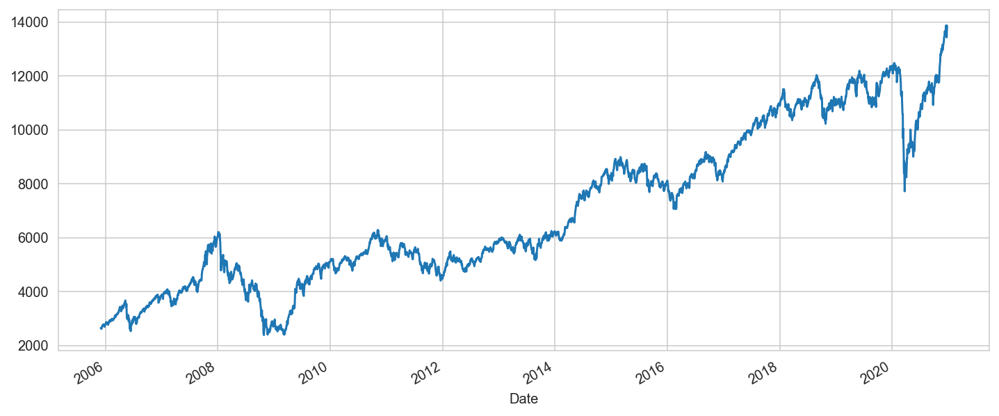

In [29]:
market.close.plot(figsize=(12,5));

In [30]:
market_ret = market.close.pct_change().dropna()
market_ret.index = market_ret.index.tz_localize('UTC')
market_ret.head()

Date
2005-12-02 00:00:00+00:00    0.000962
2005-12-05 00:00:00+00:00   -0.012291
2005-12-06 00:00:00+00:00   -0.000420
2005-12-07 00:00:00+00:00    0.010597
2005-12-08 00:00:00+00:00    0.005045
Name: close, dtype: float64

In [31]:
returns.index.name = 'Date'
returns.head()

Date
2010-01-04 00:00:00+00:00    0.0
2010-01-05 00:00:00+00:00    0.0
2010-01-06 00:00:00+00:00    0.0
2010-01-07 00:00:00+00:00    0.0
2010-01-08 00:00:00+00:00    0.0
Name: return, dtype: float64

In [32]:
ret_df= pd.DataFrame([returns, market_ret], index=None).T.dropna()
# df.index = df.index.tz_localize('UTC').dropna()
ret_df.columns = ['stra_eqw', 'market']
ret_df.head()

,stra_eqw,market
Date,,
2010-01-04 00:00:00+00:00,0.0,0.006936
2010-01-05 00:00:00+00:00,0.0,0.009751
2010-01-06 00:00:00+00:00,0.0,0.001960
2010-01-07 00:00:00+00:00,0.0,-0.004277
2010-01-08 00:00:00+00:00,0.0,-0.003072


Start date,2010-01-04
End date,2020-12-24
Total months,129
,Backtest
Annual return,16.358%
Cumulative returns,413.985%
Annual volatility,16.731%
Sharpe ratio,0.99
Calmar ratio,0.52
Stability,0.93
Max drawdown,-31.291%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,31.29,2018-08-31,2020-03-23,2020-08-10,507
1,19.16,2010-11-05,2011-02-24,2012-03-13,353
2,18.43,2015-08-07,2016-02-29,2016-07-11,242
3,15.93,2013-01-03,2013-08-21,2013-12-19,251
4,12.85,2016-10-25,2016-12-26,2017-02-06,75


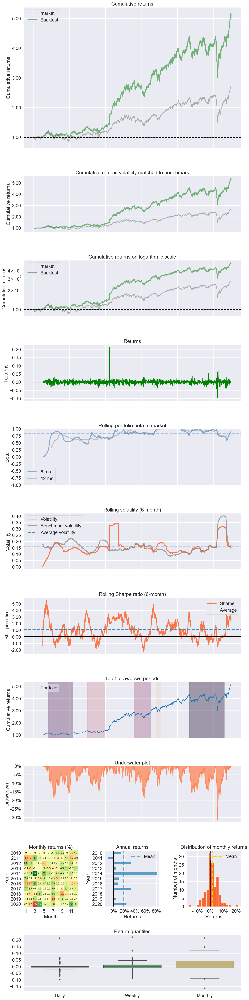

In [33]:
pf.create_returns_tear_sheet(ret_df.stra_eqw,benchmark_rets=ret_df.market)

In [34]:
DATA_STORE = 'data/mom_results.h5'

In [35]:
with pd.HDFStore(DATA_STORE) as store:
    store.put('nse100/eq_wts/daily/returns', returns)
    store.put('nse100/eq_wts/daily/positions', positions)
    store.put('nse100/eq_wts/daily/transactions', transactions)

Start date,2010-01-04
End date,2020-12-24
Total months,129
,Backtest
Annual return,9.66%
Cumulative returns,170.847%
Annual volatility,17.227%
Sharpe ratio,0.62
Calmar ratio,0.25
Stability,0.90
Max drawdown,-38.104%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,38.10,2020-01-17,2020-03-23,2020-11-09,212
1,29.81,2010-11-05,2011-12-20,2014-03-07,871
2,21.49,2015-03-03,2016-02-25,2016-08-31,392
3,14.99,2018-08-28,2018-10-26,2019-05-28,196
4,11.93,2016-09-08,2016-12-26,2017-02-21,119


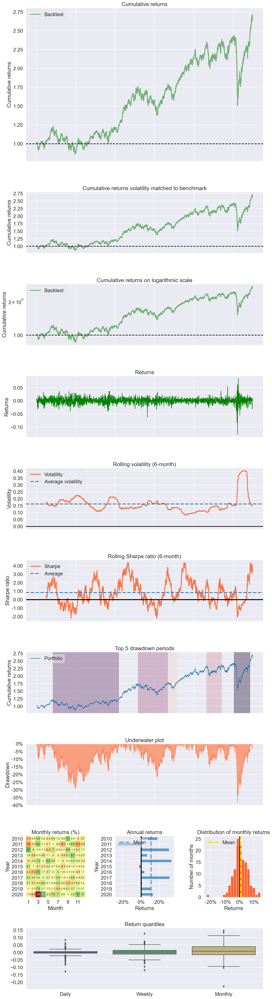

In [36]:
pf.create_returns_tear_sheet(ret_df.market)

### Momentum with Risk Parity 

In [37]:
vola_window = 21

In [38]:
# we take a 126-day time series of closing prices, 
# calculate the daily returns, and take a mean of 21 days rolling window of standards deviation.
def volatility(ts):
    std = ts.pct_change().dropna().rolling(vola_window).std().iloc[-1]
    return std

In [39]:
class StrategyRiskparity(bt.Strategy):
    params = dict(
        # parametrize the Momentum and its period
        momentum=Momentum,
        momentum_period=126,
        num_positions=30,

        printlog=True,
        reserve=0.00  # 5% reserve capital
    )

    def log(self, txt, dt=None, doprint=False):
        ''' Logging function '''
        if self.params.printlog or doprint:
            dt = dt or self.data.datetime[0]
            if isinstance(dt, float):
                dt = bt.num2date(dt)
            print("%s, %s" % (dt.isoformat(), txt))

    def __init__(self):
        self.securities = self.datas
        self.inds = collections.defaultdict(dict)
        for d in self.securities:
            self.inds[d]['mom'] = self.p.momentum(d, period=self.p.momentum_period)

        # To keep track of pending orders and buy price/commission
        self.order = None
        self.buyprice = None
        self.buycomm = None

    def rebalance(self):
        rankings = list(self.securities)
        rankings.sort(key=lambda s: self.inds[s]['mom'][0], reverse=True)

        # Sell stocks no longer meeting ranking filter and create list of kept positions
        kept_positions = []
        for i, d in enumerate(rankings):
            if self.getposition(d).size:
                if i > self.p.num_positions:
                    self.close(d)
                    self.log('Leave {} - Rank {:.2f}'.format(d._name, i))
                elif i < self.p.num_positions:
                    kept_positions.append(d._name)
        self.log('kept_positions - %s'% kept_positions)
        
        # Based on kept position and new ranking identify new long positions to add
        new_positions = []
        for i, d in enumerate(rankings[:self.p.num_positions]):
            if d._name not in (kept_positions):
                new_positions.append(d._name)
        self.log('new_positions - %s'% new_positions)
        
        # Calculate volatility table
        hist = pd.DataFrame()
        for d in self.securities:
            if d._name in (new_positions):
                hist[d._name] = d.close.get(size=self.p.momentum_period)
        vola_table = hist.apply(volatility)
        self.log('vola_table - %s'% vola_table)
        
        # Calculate weights based on volatility 
        inv_vola_table = 1 / vola_table 
        sum_inv_vola = np.sum(inv_vola_table)         
        vola_target_weights = inv_vola_table / sum_inv_vola
        self.log('vola_target_weights - %s'% vola_target_weights)
        
        # Buy and rebalance stocks with remaining cash
        for i, d in enumerate(rankings[:self.p.num_positions]):
            cash = self.broker.get_cash()
            value = self.broker.get_value()
            if cash <= 0:
                break
            if not self.getposition(d).size:
                weight = vola_target_weights[d._name]
                self.order_target_percent(d, target=weight)
                self.log('Buy {} - Rank {:.2f}'.format(d._name, i)) 

    def next(self): 
        self.rebalance()

    def notify_order(self, order):
        if order.status in [order.Submitted, order.Accepted]:
            # Buy/Sell order submitted/accepted to/by broker - Nothing to do
            return

        # Check if an order has been completed
        # Attention: broker could reject order if not enough cash
        if order.status in [order.Completed]:
            if order.isbuy():
                self.log(
                    'BUY EXECUTED, Price: %.2f, Cost: %.2f, Comm %.2f' %
                    (order.executed.price,order.executed.value,order.executed.comm))

                self.buyprice = order.executed.price
                self.buycomm = order.executed.comm
            else:  # Sell
                self.log('SELL EXECUTED, Price: %.2f, Cost: %.2f, Comm %.2f' %
                         (order.executed.price, order.executed.value, order.executed.comm))

        elif order.status in [order.Canceled, order.Margin, order.Rejected]:
            self.log('Order Canceled/Margin/Rejected')

        self.order = None
    
    def stop(self):
        self.log('| %2d | %2d |  %.2f |' %
                 (self.p.momentum_period, self.p.num_positions, self.broker.getvalue()),doprint=True)  

In [40]:
# Model Settings
startcash = 500000
momentum_period = 126 #days
num_positions = 30
reserve = 0.0
printlog=True,

# Commission and Slippage Settings
commission = 0.0025

In [41]:
cerebro = bt.Cerebro(stdstats=False)
cerebro.broker.set_coc(True)
cerebro.broker.setcash(startcash)
cerebro.broker.setcommission(commission=commission)

In [42]:
# Add securities as datas1:
for ticker, data in prices.groupby(level=0):
    if ticker in tickers:
        print(f"Adding ticker: {ticker}")
        data = bt.feeds.PandasData(dataname=data.droplevel(level=0),
                                   name=str(ticker),
                                   fromdate=fromdate,
                                   todate=todate,
                                   plot=False)
        cerebro.adddata(data)

Adding ticker: ABOT
Adding ticker: ABUJ
Adding ticker: ACC
Adding ticker: APSE
Adding ticker: ARBN
Adding ticker: ASPN
Adding ticker: AXBK
Adding ticker: BAJA
Adding ticker: BION
Adding ticker: BJAT
Adding ticker: BJFN
Adding ticker: BJFS
Adding ticker: BOB
Adding ticker: BOSH
Adding ticker: BPCL
Adding ticker: BRGR
Adding ticker: BRIT
Adding ticker: BRTI
Adding ticker: CADI
Adding ticker: CCRI
Adding ticker: COLG
Adding ticker: DABU
Adding ticker: DIVI
Adding ticker: DLF
Adding ticker: GAIL
Adding ticker: GOCP
Adding ticker: GRAS
Adding ticker: HALC
Adding ticker: HCLT
Adding ticker: HDBK
Adding ticker: HDFC
Adding ticker: HLL
Adding ticker: HPCL
Adding ticker: HROM
Adding ticker: HVEL
Adding ticker: HZNC
Adding ticker: ICBK
Adding ticker: IGAS
Adding ticker: INBK
Adding ticker: INED
Adding ticker: INFY
Adding ticker: IOC
Adding ticker: ITC
Adding ticker: JSTL
Adding ticker: KTKM
Adding ticker: LART
Adding ticker: LUPN
Adding ticker: MAHM
Adding ticker: MOSS
Adding ticker: MRCO
Adding

In [43]:
cerebro.addanalyzer(bt.analyzers.Returns)
cerebro.addanalyzer(bt.analyzers.DrawDown)
cerebro.addanalyzer(bt.analyzers.PyFolio, _name='pyfolio')

cerebro.addstrategy(StrategyRiskparity,
                    momentum_period = momentum_period,
                    num_positions = num_positions,
                    printlog = printlog,
                    reserve = reserve,
                   )

0

In [44]:
%%time
print('Starting Portfolio Value: %.2f' % cerebro.broker.getvalue())
# Run the strategy. Results will be output from stop.
results_riskparity = cerebro.run()

# # Run over everything
# cerebro.run(maxcpus=1)

# Print out the final result
print('Final Portfolio Value: %.2f' % cerebro.broker.getvalue())

Starting Portfolio Value: 500000.00
2010-07-12T00:00:00, kept_positions - []
2010-07-12T00:00:00, new_positions - ['HVEL', 'DIVI', 'COLG', 'BJFN', 'TITN', 'ABOT', 'CADI', 'BAJA', 'GOCP', 'INBK', 'LUPN', 'BOB', 'PIRA', 'UBBW', 'ASPN', 'IGAS', 'REDY', 'DABU', 'ITC', 'BJAT', 'NEST', 'BJFS', 'AXBK', 'BRGR', 'HDFC', 'TAGL', 'PNBK', 'HROM', 'PIDI', 'MRCO']
2010-07-12T00:00:00, vola_table - ABOT    0.021338
ASPN    0.014595
AXBK    0.013162
BAJA    0.009625
BJAT    0.018732
BJFN    0.014022
BJFS    0.026344
BOB     0.013616
BRGR    0.019998
CADI    0.014096
COLG    0.007276
DABU    0.015990
DIVI    0.008103
GOCP    0.010160
HDFC    0.012240
HROM    0.008748
HVEL    0.012097
IGAS    0.025555
INBK    0.017104
ITC     0.011097
LUPN    0.009185
MRCO    0.025099
NEST    0.014660
PIDI    0.017251
PIRA    0.013188
PNBK    0.012594
REDY    0.013348
TAGL    0.013250
TITN    0.012322
UBBW    0.038327
dtype: float64
2010-07-12T00:00:00, vola_target_weights - ABOT    0.021032
ASPN    0.030749
AXBK    0.0

2010-07-23T00:00:00, vola_table - GAIL    0.016672
LART    0.009842
PWFC    0.018029
SBI     0.011557
dtype: float64
2010-07-23T00:00:00, vola_target_weights - GAIL    0.197577
LART    0.334687
PWFC    0.182707
SBI     0.285029
dtype: float64
2010-07-23T00:00:00, Buy PWFC - Rank 18.00
2010-07-23T00:00:00, Buy SBI - Rank 21.00
2010-07-23T00:00:00, Buy LART - Rank 25.00
2010-07-23T00:00:00, Buy GAIL - Rank 28.00
2010-07-26T00:00:00, Order Canceled/Margin/Rejected
2010-07-26T00:00:00, Order Canceled/Margin/Rejected
2010-07-26T00:00:00, Order Canceled/Margin/Rejected
2010-07-26T00:00:00, Order Canceled/Margin/Rejected
2010-07-26T00:00:00, Leave NEST - Rank 31.00
2010-07-26T00:00:00, Leave PNBK - Rank 32.00
2010-07-26T00:00:00, kept_positions - ['HVEL', 'DIVI', 'COLG', 'BJFN', 'TITN', 'ABOT', 'GOCP', 'BAJA', 'CADI', 'INBK', 'BRGR', 'UBBW', 'LUPN', 'TAGL', 'ASPN', 'BOB', 'IGAS', 'REDY', 'BJAT', 'PIRA', 'DABU', 'ITC', 'BJFS', 'AXBK', 'HDFC']
2010-07-26T00:00:00, new_positions - ['PWFC', 'SBI'

2010-08-10T00:00:00, Order Canceled/Margin/Rejected
2010-08-10T00:00:00, Order Canceled/Margin/Rejected
2010-08-10T00:00:00, Order Canceled/Margin/Rejected
2010-08-10T00:00:00, kept_positions - ['HVEL', 'DIVI', 'COLG', 'BJFN', 'TITN', 'BAJA', 'ABOT', 'BRGR', 'GOCP', 'UBBW', 'ASPN', 'IGAS', 'INBK', 'PWFC', 'CADI', 'TAGL', 'LUPN', 'BOB', 'ITC', 'BJAT', 'DABU', 'REDY', 'BJFS', 'AXBK']
2010-08-10T00:00:00, new_positions - ['SBI', 'BOSH', 'MAHM', 'PIDI', 'LART', 'BRIT']
2010-08-10T00:00:00, vola_table - BOSH    0.013166
BRIT    0.030417
LART    0.012525
MAHM    0.016353
PIDI    0.017960
SBI     0.014023
dtype: float64
2010-08-10T00:00:00, vola_target_weights - BOSH    0.201574
BRIT    0.087249
LART    0.211877
MAHM    0.162284
PIDI    0.147761
SBI     0.189255
dtype: float64
2010-08-10T00:00:00, Buy SBI - Rank 16.00
2010-08-10T00:00:00, Buy BOSH - Rank 22.00
2010-08-10T00:00:00, Buy MAHM - Rank 23.00
2010-08-10T00:00:00, Buy PIDI - Rank 25.00
2010-08-10T00:00:00, Buy LART - Rank 27.00
2010-

2010-08-23T00:00:00, vola_table - BOSH    0.014048
BPCL    0.026649
BRIT    0.029604
HPCL    0.019054
IOC     0.013495
PIDI    0.014898
UPLL    0.018024
dtype: float64
2010-08-23T00:00:00, vola_target_weights - BOSH    0.181742
BPCL    0.095805
BRIT    0.086241
HPCL    0.133996
IOC     0.189191
PIDI    0.171376
UPLL    0.141648
dtype: float64
2010-08-23T00:00:00, Buy HPCL - Rank 12.00
2010-08-23T00:00:00, Buy BOSH - Rank 17.00
2010-08-23T00:00:00, Buy BRIT - Rank 20.00
2010-08-23T00:00:00, Buy IOC - Rank 22.00
2010-08-23T00:00:00, Buy BPCL - Rank 27.00
2010-08-23T00:00:00, Buy PIDI - Rank 28.00
2010-08-23T00:00:00, Buy UPLL - Rank 29.00
2010-08-24T00:00:00, Order Canceled/Margin/Rejected
2010-08-24T00:00:00, Order Canceled/Margin/Rejected
2010-08-24T00:00:00, Order Canceled/Margin/Rejected
2010-08-24T00:00:00, Order Canceled/Margin/Rejected
2010-08-24T00:00:00, Order Canceled/Margin/Rejected
2010-08-24T00:00:00, Order Canceled/Margin/Rejected
2010-08-24T00:00:00, Order Canceled/Margin/

2010-09-03T00:00:00, vola_table - BOSH    0.016591
BPCL    0.028229
BRIT    0.018889
IOC     0.011308
MOSS    0.027002
ONGC    0.012195
PIDI    0.014688
UPLL    0.016241
dtype: float64
2010-09-03T00:00:00, vola_target_weights - BOSH    0.124082
BPCL    0.072926
BRIT    0.108985
IOC     0.182048
MOSS    0.076240
ONGC    0.168811
PIDI    0.140154
UPLL    0.126754
dtype: float64
2010-09-03T00:00:00, Buy BPCL - Rank 11.00
2010-09-03T00:00:00, Buy IOC - Rank 13.00
2010-09-03T00:00:00, Buy BRIT - Rank 15.00
2010-09-03T00:00:00, Buy BOSH - Rank 19.00
2010-09-03T00:00:00, Buy ONGC - Rank 24.00
2010-09-03T00:00:00, Buy MOSS - Rank 26.00
2010-09-03T00:00:00, Buy PIDI - Rank 28.00
2010-09-03T00:00:00, Buy UPLL - Rank 29.00
2010-09-06T00:00:00, Order Canceled/Margin/Rejected
2010-09-06T00:00:00, Order Canceled/Margin/Rejected
2010-09-06T00:00:00, Order Canceled/Margin/Rejected
2010-09-06T00:00:00, Order Canceled/Margin/Rejected
2010-09-06T00:00:00, Order Canceled/Margin/Rejected
2010-09-06T00:00:0

dtype: float64
2010-09-17T00:00:00, Buy BPCL - Rank 7.00
2010-09-17T00:00:00, Buy IOC - Rank 10.00
2010-09-17T00:00:00, Buy BRIT - Rank 12.00
2010-09-17T00:00:00, Buy MOSS - Rank 15.00
2010-09-17T00:00:00, Buy BOSH - Rank 16.00
2010-09-17T00:00:00, Buy ONGC - Rank 19.00
2010-09-17T00:00:00, Buy PIDI - Rank 23.00
2010-09-17T00:00:00, Buy MAHM - Rank 25.00
2010-09-20T00:00:00, Order Canceled/Margin/Rejected
2010-09-20T00:00:00, Order Canceled/Margin/Rejected
2010-09-20T00:00:00, Order Canceled/Margin/Rejected
2010-09-20T00:00:00, Order Canceled/Margin/Rejected
2010-09-20T00:00:00, Order Canceled/Margin/Rejected
2010-09-20T00:00:00, Order Canceled/Margin/Rejected
2010-09-20T00:00:00, Order Canceled/Margin/Rejected
2010-09-20T00:00:00, Order Canceled/Margin/Rejected
2010-09-20T00:00:00, Leave COLG - Rank 34.00
2010-09-20T00:00:00, kept_positions - ['HVEL', 'UBBW', 'BJFN', 'HPCL', 'BRGR', 'TITN', 'IGAS', 'BAJA', 'ASPN', 'GOCP', 'PWFC', 'SBI', 'INBK', 'ITC', 'BOB', 'DABU', 'BJAT', 'DIVI', 'B

2010-09-28T00:00:00, vola_table - BOSH    0.013879
BRIT    0.034547
HLL     0.014134
LART    0.010989
MAHM    0.010984
MOSS    0.021885
ONGC    0.008598
PIDI    0.017908
PLNG    0.020827
PNBK    0.009593
dtype: float64
2010-09-28T00:00:00, vola_target_weights - BOSH    0.099534
BRIT    0.039986
HLL     0.097738
LART    0.125712
MAHM    0.125766
MOSS    0.063121
ONGC    0.160675
PIDI    0.077139
PLNG    0.066328
PNBK    0.144000
dtype: float64
2010-09-28T00:00:00, Buy BRIT - Rank 12.00
2010-09-28T00:00:00, Buy BOSH - Rank 16.00
2010-09-28T00:00:00, Buy ONGC - Rank 17.00
2010-09-28T00:00:00, Buy MOSS - Rank 19.00
2010-09-28T00:00:00, Buy PIDI - Rank 20.00
2010-09-28T00:00:00, Buy MAHM - Rank 22.00
2010-09-28T00:00:00, Buy PLNG - Rank 24.00
2010-09-28T00:00:00, Buy HLL - Rank 26.00
2010-09-28T00:00:00, Buy LART - Rank 27.00
2010-09-28T00:00:00, Buy PNBK - Rank 28.00
2010-09-29T00:00:00, Order Canceled/Margin/Rejected
2010-09-29T00:00:00, Order Canceled/Margin/Rejected
2010-09-29T00:00:00,

2010-10-07T00:00:00, Order Canceled/Margin/Rejected
2010-10-07T00:00:00, Order Canceled/Margin/Rejected
2010-10-07T00:00:00, Order Canceled/Margin/Rejected
2010-10-07T00:00:00, Order Canceled/Margin/Rejected
2010-10-07T00:00:00, Order Canceled/Margin/Rejected
2010-10-07T00:00:00, Order Canceled/Margin/Rejected
2010-10-07T00:00:00, Order Canceled/Margin/Rejected
2010-10-07T00:00:00, Order Canceled/Margin/Rejected
2010-10-07T00:00:00, kept_positions - ['HVEL', 'UBBW', 'BJFN', 'BRGR', 'HPCL', 'TITN', 'BPCL', 'BAJA', 'IGAS', 'IOC', 'SBI', 'ASPN', 'INBK', 'BRIT', 'PWFC', 'ITC', 'GOCP', 'BOB', 'BJAT']
2010-10-07T00:00:00, new_positions - ['MOSS', 'ONGC', 'PIDI', 'BOSH', 'PLNG', 'UNSP', 'TAMO', 'MAHM', 'PNBK', 'LART', 'HDFC']
2010-10-07T00:00:00, vola_table - BOSH    0.007199
HDFC    0.020955
LART    0.012270
MAHM    0.014752
MOSS    0.022209
ONGC    0.009905
PIDI    0.017700
PLNG    0.020342
PNBK    0.008098
TAMO    0.014795
UNSP    0.020790
dtype: float64
2010-10-07T00:00:00, vola_target_we

dtype: float64
2010-10-18T00:00:00, vola_target_weights - BION    0.064029
BOSH    0.161416
HDFC    0.066107
INED    0.048386
KTKM    0.067493
MOSS    0.077538
ONGC    0.117950
PIDI    0.069108
PLNG    0.051819
PNBK    0.123198
TAMO    0.083045
UNSP    0.069912
dtype: float64
2010-10-18T00:00:00, Buy MOSS - Rank 8.00
2010-10-18T00:00:00, Buy TAMO - Rank 12.00
2010-10-18T00:00:00, Buy PLNG - Rank 13.00
2010-10-18T00:00:00, Buy PIDI - Rank 18.00
2010-10-18T00:00:00, Buy UNSP - Rank 20.00
2010-10-18T00:00:00, Buy BOSH - Rank 22.00
2010-10-18T00:00:00, Buy PNBK - Rank 23.00
2010-10-18T00:00:00, Buy ONGC - Rank 24.00
2010-10-18T00:00:00, Buy INED - Rank 25.00
2010-10-18T00:00:00, Buy BION - Rank 26.00
2010-10-18T00:00:00, Buy HDFC - Rank 28.00
2010-10-18T00:00:00, Buy KTKM - Rank 29.00
2010-10-19T00:00:00, Order Canceled/Margin/Rejected
2010-10-19T00:00:00, Order Canceled/Margin/Rejected
2010-10-19T00:00:00, Order Canceled/Margin/Rejected
2010-10-19T00:00:00, Order Canceled/Margin/Rejected


2010-10-26T00:00:00, vola_table - BION    0.035496
HDBK    0.011728
HDFC    0.020788
ICBK    0.011054
INED    0.030419
KTKM    0.020188
PIDI    0.013093
PLNG    0.031651
PNBK    0.011099
TAMO    0.017399
TCS     0.022213
UNSP    0.021218
dtype: float64
2010-10-26T00:00:00, vola_target_weights - BION    0.041302
HDBK    0.125001
HDFC    0.070524
ICBK    0.132623
INED    0.048196
KTKM    0.072621
PIDI    0.111972
PLNG    0.046320
PNBK    0.132086
TAMO    0.084262
TCS     0.065999
UNSP    0.069095
dtype: float64
2010-10-26T00:00:00, Buy TAMO - Rank 4.00
2010-10-26T00:00:00, Buy PLNG - Rank 10.00
2010-10-26T00:00:00, Buy INED - Rank 13.00
2010-10-26T00:00:00, Buy BION - Rank 16.00
2010-10-26T00:00:00, Buy UNSP - Rank 17.00
2010-10-26T00:00:00, Buy PNBK - Rank 18.00
2010-10-26T00:00:00, Buy PIDI - Rank 19.00
2010-10-26T00:00:00, Buy TCS - Rank 22.00
2010-10-26T00:00:00, Buy HDFC - Rank 24.00
2010-10-26T00:00:00, Buy KTKM - Rank 25.00
2010-10-26T00:00:00, Buy HDBK - Rank 26.00
2010-10-26T00:

2010-11-04T00:00:00, vola_table - ABUJ    0.019907
ARBN    0.015094
DLF     0.020132
HALC    0.021948
HDFC    0.021569
HVEL    0.010438
ICBK    0.022758
KTKM    0.019440
PIDI    0.014482
PNBK    0.014612
TCS     0.021202
UNSP    0.022010
dtype: float64
2010-11-04T00:00:00, vola_target_weights - ABUJ    0.073945
ARBN    0.097521
DLF     0.073117
HALC    0.067069
HDFC    0.068246
HVEL    0.141021
ICBK    0.064681
KTKM    0.075720
PIDI    0.101641
PNBK    0.100736
TCS     0.069426
UNSP    0.066877
dtype: float64
2010-11-04T00:00:00, Buy HVEL - Rank 9.00
2010-11-04T00:00:00, Buy HALC - Rank 13.00
2010-11-04T00:00:00, Buy ICBK - Rank 15.00
2010-11-04T00:00:00, Buy PNBK - Rank 16.00
2010-11-04T00:00:00, Buy TCS - Rank 18.00
2010-11-04T00:00:00, Buy ARBN - Rank 19.00
2010-11-04T00:00:00, Buy DLF - Rank 21.00
2010-11-04T00:00:00, Buy UNSP - Rank 23.00
2010-11-04T00:00:00, Buy HDFC - Rank 24.00
2010-11-04T00:00:00, Buy KTKM - Rank 25.00
2010-11-04T00:00:00, Buy PIDI - Rank 26.00
2010-11-04T00:0

2010-11-12T00:00:00, vola_table - ABUJ    0.025788
ARBN    0.018301
BJAT    0.018543
DLF     0.022856
HDBK    0.015020
HDFC    0.018244
HVEL    0.011619
HZNC    0.017954
KTKM    0.014217
PIDI    0.013348
PNBK    0.014311
TCS     0.020446
TISC    0.018886
dtype: float64
2010-11-12T00:00:00, vola_target_weights - ABUJ    0.050281
ARBN    0.070848
BJAT    0.069926
DLF     0.056730
HDBK    0.086326
HDFC    0.071071
HVEL    0.111591
HZNC    0.072218
KTKM    0.091204
PIDI    0.097136
PNBK    0.090601
TCS     0.063416
TISC    0.068653
dtype: float64
2010-11-12T00:00:00, Buy ARBN - Rank 12.00
2010-11-12T00:00:00, Buy HVEL - Rank 14.00
2010-11-12T00:00:00, Buy TCS - Rank 16.00
2010-11-12T00:00:00, Buy PNBK - Rank 17.00
2010-11-12T00:00:00, Buy KTKM - Rank 19.00
2010-11-12T00:00:00, Buy ABUJ - Rank 20.00
2010-11-12T00:00:00, Buy DLF - Rank 21.00
2010-11-12T00:00:00, Buy BJAT - Rank 22.00
2010-11-12T00:00:00, Buy HDFC - Rank 23.00
2010-11-12T00:00:00, Buy HZNC - Rank 25.00
2010-11-12T00:00:00, Bu

2010-11-23T00:00:00, vola_table - ABUJ    0.027137
BJAT    0.019100
GRAS    0.018733
HDBK    0.017386
HDFC    0.019276
HVEL    0.019585
HZNC    0.019329
KTKM    0.019293
MAHM    0.023190
PNBK    0.014368
SUN     0.014762
TCS     0.014404
TISC    0.020372
dtype: float64
2010-11-23T00:00:00, vola_target_weights - ABUJ    0.052225
BJAT    0.074203
GRAS    0.075656
HDBK    0.081518
HDFC    0.073526
HVEL    0.072366
HZNC    0.073324
KTKM    0.073461
MAHM    0.061115
PNBK    0.098641
SUN     0.096004
TCS     0.098392
TISC    0.069570
dtype: float64
2010-11-23T00:00:00, Buy TCS - Rank 13.00
2010-11-23T00:00:00, Buy PNBK - Rank 15.00
2010-11-23T00:00:00, Buy GRAS - Rank 16.00
2010-11-23T00:00:00, Buy ABUJ - Rank 18.00
2010-11-23T00:00:00, Buy KTKM - Rank 19.00
2010-11-23T00:00:00, Buy BJAT - Rank 20.00
2010-11-23T00:00:00, Buy HVEL - Rank 21.00
2010-11-23T00:00:00, Buy TISC - Rank 22.00
2010-11-23T00:00:00, Buy HDFC - Rank 24.00
2010-11-23T00:00:00, Buy HZNC - Rank 25.00
2010-11-23T00:00:00, B

2010-12-01T00:00:00, vola_table - ABUJ    0.026001
BJAT    0.015500
GOCP    0.013821
GRAS    0.019632
HDFC    0.016942
HVEL    0.023734
HZNC    0.021982
ITC     0.014457
KTKM    0.019170
MAHM    0.025305
NEST    0.027550
SUN     0.012541
TISC    0.022136
dtype: float64
2010-12-01T00:00:00, vola_target_weights - ABUJ    0.055339
BJAT    0.092833
GOCP    0.104107
GRAS    0.073293
HDFC    0.084931
HVEL    0.060624
HZNC    0.065457
ITC     0.099530
KTKM    0.075060
MAHM    0.056861
NEST    0.052227
SUN     0.114734
TISC    0.065003
dtype: float64
2010-12-01T00:00:00, Buy GRAS - Rank 15.00
2010-12-01T00:00:00, Buy BJAT - Rank 16.00
2010-12-01T00:00:00, Buy KTKM - Rank 17.00
2010-12-01T00:00:00, Buy ABUJ - Rank 18.00
2010-12-01T00:00:00, Buy SUN - Rank 19.00
2010-12-01T00:00:00, Buy TISC - Rank 21.00
2010-12-01T00:00:00, Buy MAHM - Rank 22.00
2010-12-01T00:00:00, Buy HDFC - Rank 23.00
2010-12-01T00:00:00, Buy HZNC - Rank 25.00
2010-12-01T00:00:00, Buy NEST - Rank 26.00
2010-12-01T00:00:00, B

2010-12-09T00:00:00, Buy SUN - Rank 14.00
2010-12-09T00:00:00, Buy BJAT - Rank 16.00
2010-12-09T00:00:00, Buy MAHM - Rank 17.00
2010-12-09T00:00:00, Buy ABUJ - Rank 18.00
2010-12-09T00:00:00, Buy KTKM - Rank 19.00
2010-12-09T00:00:00, Buy NEST - Rank 20.00
2010-12-09T00:00:00, Buy ULTC - Rank 21.00
2010-12-09T00:00:00, Buy TISC - Rank 23.00
2010-12-09T00:00:00, Buy HZNC - Rank 24.00
2010-12-09T00:00:00, Buy GOCP - Rank 25.00
2010-12-09T00:00:00, Buy ACC - Rank 26.00
2010-12-09T00:00:00, Buy LUPN - Rank 27.00
2010-12-09T00:00:00, Buy HDFC - Rank 28.00
2010-12-10T00:00:00, Order Canceled/Margin/Rejected
2010-12-10T00:00:00, Order Canceled/Margin/Rejected
2010-12-10T00:00:00, Order Canceled/Margin/Rejected
2010-12-10T00:00:00, Order Canceled/Margin/Rejected
2010-12-10T00:00:00, Order Canceled/Margin/Rejected
2010-12-10T00:00:00, Order Canceled/Margin/Rejected
2010-12-10T00:00:00, Order Canceled/Margin/Rejected
2010-12-10T00:00:00, Order Canceled/Margin/Rejected
2010-12-10T00:00:00, Order 

2010-12-20T00:00:00, vola_table - ABUJ    0.021569
ACC     0.023835
BJAT    0.016563
CADI    0.020891
HDFC    0.017639
HLL     0.011541
HZNC    0.018468
KTKM    0.025822
LUPN    0.021520
MAHM    0.022685
NEST    0.023219
REDY    0.014132
TISC    0.023180
dtype: float64
2010-12-20T00:00:00, vola_target_weights - ABUJ    0.068152
ACC     0.061673
BJAT    0.088750
CADI    0.070363
HDFC    0.083334
HLL     0.127364
HZNC    0.079596
KTKM    0.056927
LUPN    0.068305
MAHM    0.064799
NEST    0.063309
REDY    0.104014
TISC    0.063414
dtype: float64
2010-12-20T00:00:00, Buy MAHM - Rank 16.00
2010-12-20T00:00:00, Buy NEST - Rank 17.00
2010-12-20T00:00:00, Buy BJAT - Rank 19.00
2010-12-20T00:00:00, Buy ACC - Rank 20.00
2010-12-20T00:00:00, Buy REDY - Rank 21.00
2010-12-20T00:00:00, Buy ABUJ - Rank 22.00
2010-12-20T00:00:00, Buy TISC - Rank 23.00
2010-12-20T00:00:00, Buy LUPN - Rank 24.00
2010-12-20T00:00:00, Buy KTKM - Rank 25.00
2010-12-20T00:00:00, Buy HZNC - Rank 26.00
2010-12-20T00:00:00, B

2010-12-28T00:00:00, vola_table - ABUJ    0.021418
ACC     0.022372
BJAT    0.015993
CADI    0.020119
HDFC    0.013819
HZNC    0.016459
INFY    0.009263
KTKM    0.021015
LUPN    0.021549
MAHM    0.019235
NEST    0.016986
REDY    0.013806
TISC    0.020919
dtype: float64
2010-12-28T00:00:00, vola_target_weights - ABUJ    0.060653
ACC     0.058067
BJAT    0.081225
CADI    0.064570
HDFC    0.094004
HZNC    0.078929
INFY    0.140249
KTKM    0.061815
LUPN    0.060283
MAHM    0.067536
NEST    0.076479
REDY    0.094092
TISC    0.062099
dtype: float64
2010-12-28T00:00:00, Buy MAHM - Rank 10.00
2010-12-28T00:00:00, Buy NEST - Rank 11.00
2010-12-28T00:00:00, Buy REDY - Rank 13.00
2010-12-28T00:00:00, Buy ACC - Rank 15.00
2010-12-28T00:00:00, Buy LUPN - Rank 18.00
2010-12-28T00:00:00, Buy TISC - Rank 20.00
2010-12-28T00:00:00, Buy ABUJ - Rank 21.00
2010-12-28T00:00:00, Buy BJAT - Rank 22.00
2010-12-28T00:00:00, Buy CADI - Rank 23.00
2010-12-28T00:00:00, Buy HZNC - Rank 24.00
2010-12-28T00:00:00, B

2011-01-05T00:00:00, Buy ABUJ - Rank 24.00
2011-01-05T00:00:00, Buy GAIL - Rank 25.00
2011-01-05T00:00:00, Buy HLL - Rank 26.00
2011-01-05T00:00:00, Buy HDFC - Rank 28.00
2011-01-06T00:00:00, Order Canceled/Margin/Rejected
2011-01-06T00:00:00, Order Canceled/Margin/Rejected
2011-01-06T00:00:00, Order Canceled/Margin/Rejected
2011-01-06T00:00:00, Order Canceled/Margin/Rejected
2011-01-06T00:00:00, Order Canceled/Margin/Rejected
2011-01-06T00:00:00, Order Canceled/Margin/Rejected
2011-01-06T00:00:00, Order Canceled/Margin/Rejected
2011-01-06T00:00:00, Order Canceled/Margin/Rejected
2011-01-06T00:00:00, Order Canceled/Margin/Rejected
2011-01-06T00:00:00, Order Canceled/Margin/Rejected
2011-01-06T00:00:00, Order Canceled/Margin/Rejected
2011-01-06T00:00:00, Order Canceled/Margin/Rejected
2011-01-06T00:00:00, Order Canceled/Margin/Rejected
2011-01-06T00:00:00, SELL EXECUTED, Price: 67.77, Cost: 15971.20, Comm 54.22
2011-01-06T00:00:00, BUY EXECUTED, Price: 3900.95, Cost: 35108.55, Comm 87.7

2011-01-13T00:00:00, vola_table - ABOT    0.011667
ABUJ    0.020530
ACC     0.012117
BOSH    0.016069
CADI    0.012336
GAIL    0.013080
HCLT    0.013122
HDFC    0.018398
HLL     0.014445
HZNC    0.018866
INFY    0.017365
LUPN    0.016134
MAHM    0.015352
TISC    0.016728
dtype: float64
2011-01-13T00:00:00, vola_target_weights - ABOT    0.091769
ABUJ    0.052153
ACC     0.088360
BOSH    0.066629
CADI    0.086793
GAIL    0.081858
HCLT    0.081597
HDFC    0.058196
HLL     0.074120
HZNC    0.056754
INFY    0.061659
LUPN    0.066361
MAHM    0.069742
TISC    0.064008
dtype: float64
2011-01-13T00:00:00, Buy LUPN - Rank 7.00
2011-01-13T00:00:00, Buy CADI - Rank 8.00
2011-01-13T00:00:00, Buy MAHM - Rank 9.00
2011-01-13T00:00:00, Buy ACC - Rank 13.00
2011-01-13T00:00:00, Buy INFY - Rank 15.00
2011-01-13T00:00:00, Buy HZNC - Rank 17.00
2011-01-13T00:00:00, Buy TISC - Rank 18.00
2011-01-13T00:00:00, Buy GAIL - Rank 19.00
2011-01-13T00:00:00, Buy HLL - Rank 20.00
2011-01-13T00:00:00, Buy BOSH - Ran

2011-01-21T00:00:00, vola_table - ABOT    0.012210
ACC     0.014944
BOSH    0.016494
CADI    0.015094
CCRI    0.014111
DIVI    0.013546
GAIL    0.015286
HCLT    0.017099
HLL     0.013942
HZNC    0.018092
INFY    0.017571
ITC     0.015238
MAHM    0.014144
TISC    0.015888
WIPR    0.016873
dtype: float64
2011-01-21T00:00:00, vola_target_weights - ABOT    0.083005
ACC     0.067816
BOSH    0.061443
CADI    0.067141
CCRI    0.071819
DIVI    0.074813
GAIL    0.066298
HCLT    0.059270
HLL     0.072689
HZNC    0.056017
INFY    0.057677
ITC     0.066510
MAHM    0.071654
TISC    0.063785
WIPR    0.060063
dtype: float64
2011-01-21T00:00:00, Buy CADI - Rank 5.00
2011-01-21T00:00:00, Buy MAHM - Rank 9.00
2011-01-21T00:00:00, Buy INFY - Rank 10.00
2011-01-21T00:00:00, Buy HZNC - Rank 12.00
2011-01-21T00:00:00, Buy ACC - Rank 16.00
2011-01-21T00:00:00, Buy TISC - Rank 17.00
2011-01-21T00:00:00, Buy HLL - Rank 18.00
2011-01-21T00:00:00, Buy GAIL - Rank 20.00
2011-01-21T00:00:00, Buy ABOT - Rank 21.00


2011-02-01T00:00:00, Order Canceled/Margin/Rejected
2011-02-01T00:00:00, Leave ULTC - Rank 33.00
2011-02-01T00:00:00, kept_positions - ['TCS', 'SUN', 'HALC', 'CADI', 'ARBN', 'NEST', 'LUPN', 'TAMO', 'PLNG', 'REDY', 'GRAS', 'UBBW', 'TITN', 'BION']
2011-02-01T00:00:00, new_positions - ['INFY', 'HZNC', 'MAHM', 'TISC', 'ACC', 'HCLT', 'CCRI', 'ABOT', 'DIVI', 'HLL', 'PROC', 'WIPR', 'GAIL', 'PGRD', 'BOSH', 'PIRA']
2011-02-01T00:00:00, vola_table - ABOT    0.008777
ACC     0.018887
BOSH    0.016797
CCRI    0.012396
DIVI    0.015569
GAIL    0.020586
HCLT    0.018393
HLL     0.016780
HZNC    0.018943
INFY    0.018038
MAHM    0.022400
PGRD    0.009060
PIRA    0.012200
PROC    0.009804
TISC    0.017085
WIPR    0.017572
dtype: float64
2011-02-01T00:00:00, vola_target_weights - ABOT    0.103903
ACC     0.048288
BOSH    0.054294
CCRI    0.073569
DIVI    0.058578
GAIL    0.044302
HCLT    0.049584
HLL     0.054349
HZNC    0.048143
INFY    0.050559
MAHM    0.040714
PGRD    0.100659
PIRA    0.074755
PROC 

2011-02-08T00:00:00, Order Canceled/Margin/Rejected
2011-02-08T00:00:00, Order Canceled/Margin/Rejected
2011-02-08T00:00:00, Order Canceled/Margin/Rejected
2011-02-08T00:00:00, Order Canceled/Margin/Rejected
2011-02-08T00:00:00, Order Canceled/Margin/Rejected
2011-02-08T00:00:00, Order Canceled/Margin/Rejected
2011-02-08T00:00:00, Order Canceled/Margin/Rejected
2011-02-08T00:00:00, Order Canceled/Margin/Rejected
2011-02-08T00:00:00, Order Canceled/Margin/Rejected
2011-02-08T00:00:00, Order Canceled/Margin/Rejected
2011-02-08T00:00:00, Order Canceled/Margin/Rejected
2011-02-08T00:00:00, Order Canceled/Margin/Rejected
2011-02-08T00:00:00, Order Canceled/Margin/Rejected
2011-02-08T00:00:00, Order Canceled/Margin/Rejected
2011-02-08T00:00:00, Order Canceled/Margin/Rejected
2011-02-08T00:00:00, kept_positions - ['TCS', 'CADI', 'HALC', 'SUN', 'ARBN', 'PLNG', 'HZNC', 'LUPN', 'INFY', 'NEST', 'REDY', 'TAMO', 'GRAS', 'TITN', 'UBBW']
2011-02-08T00:00:00, new_positions - ['HCLT', 'TISC', 'MAHM', '

2011-02-14T00:00:00, Buy PIRA - Rank 19.00
2011-02-14T00:00:00, Buy BPCL - Rank 20.00
2011-02-14T00:00:00, Buy DABU - Rank 21.00
2011-02-14T00:00:00, Buy PROC - Rank 22.00
2011-02-14T00:00:00, Buy APSE - Rank 23.00
2011-02-14T00:00:00, Buy BRIT - Rank 24.00
2011-02-14T00:00:00, Buy IOC - Rank 25.00
2011-02-14T00:00:00, Buy ONGC - Rank 26.00
2011-02-14T00:00:00, Buy MAHM - Rank 27.00
2011-02-14T00:00:00, Buy ABOT - Rank 29.00
2011-02-15T00:00:00, Order Canceled/Margin/Rejected
2011-02-15T00:00:00, Order Canceled/Margin/Rejected
2011-02-15T00:00:00, Order Canceled/Margin/Rejected
2011-02-15T00:00:00, Order Canceled/Margin/Rejected
2011-02-15T00:00:00, Order Canceled/Margin/Rejected
2011-02-15T00:00:00, Order Canceled/Margin/Rejected
2011-02-15T00:00:00, Order Canceled/Margin/Rejected
2011-02-15T00:00:00, Order Canceled/Margin/Rejected
2011-02-15T00:00:00, Order Canceled/Margin/Rejected
2011-02-15T00:00:00, Order Canceled/Margin/Rejected
2011-02-15T00:00:00, Order Canceled/Margin/Rejected

2011-02-21T00:00:00, vola_table - APSE    0.022764
AXBK    0.023042
BJFS    0.015244
BPCL    0.024399
BRIT    0.018383
CCRI    0.014946
DABU    0.023616
DIVI    0.019188
HVEL    0.030211
IOC     0.020940
ONGC    0.022486
PGRD    0.012466
PIRA    0.016794
PROC    0.017799
PWFC    0.028649
TAGL    0.032978
UNSP    0.042257
dtype: float64
2011-02-21T00:00:00, vola_target_weights - APSE    0.053582
AXBK    0.052935
BJFS    0.080014
BPCL    0.049992
BRIT    0.066351
CCRI    0.081612
DABU    0.051650
DIVI    0.063567
HVEL    0.040375
IOC     0.058249
ONGC    0.054245
PGRD    0.097844
PIRA    0.072630
PROC    0.068527
PWFC    0.042575
TAGL    0.036987
UNSP    0.028865
dtype: float64
2011-02-21T00:00:00, Buy PGRD - Rank 9.00
2011-02-21T00:00:00, Buy BJFS - Rank 10.00
2011-02-21T00:00:00, Buy CCRI - Rank 12.00
2011-02-21T00:00:00, Buy PIRA - Rank 13.00
2011-02-21T00:00:00, Buy BPCL - Rank 14.00
2011-02-21T00:00:00, Buy DIVI - Rank 15.00
2011-02-21T00:00:00, Buy BRIT - Rank 16.00
2011-02-21T00:0

2011-02-25T00:00:00, Buy TAGL - Rank 19.00
2011-02-25T00:00:00, Buy PROC - Rank 20.00
2011-02-25T00:00:00, Buy HVEL - Rank 21.00
2011-02-25T00:00:00, Buy NTPC - Rank 22.00
2011-02-25T00:00:00, Buy AXBK - Rank 23.00
2011-02-25T00:00:00, Buy PNBK - Rank 24.00
2011-02-25T00:00:00, Buy UNSP - Rank 25.00
2011-02-25T00:00:00, Buy HDBK - Rank 26.00
2011-02-25T00:00:00, Buy SBI - Rank 27.00
2011-02-25T00:00:00, Buy PWFC - Rank 28.00
2011-02-25T00:00:00, Buy HPCL - Rank 29.00
2011-02-28T00:00:00, Order Canceled/Margin/Rejected
2011-02-28T00:00:00, Order Canceled/Margin/Rejected
2011-02-28T00:00:00, Order Canceled/Margin/Rejected
2011-02-28T00:00:00, Order Canceled/Margin/Rejected
2011-02-28T00:00:00, Order Canceled/Margin/Rejected
2011-02-28T00:00:00, Order Canceled/Margin/Rejected
2011-02-28T00:00:00, Order Canceled/Margin/Rejected
2011-02-28T00:00:00, Order Canceled/Margin/Rejected
2011-02-28T00:00:00, Order Canceled/Margin/Rejected
2011-02-28T00:00:00, Order Canceled/Margin/Rejected
2011-02-

2011-03-07T00:00:00, vola_table - APSE    0.028637
AXBK    0.029276
BJAT    0.020696
BJFN    0.029602
BPCL    0.025548
DABU    0.019736
HDBK    0.020657
HVEL    0.035629
IOC     0.020756
MRTI    0.024727
NTPC    0.022159
PNBK    0.021505
PROC    0.023906
SBI     0.023897
SHCM    0.018330
TAGL    0.035923
UNSP    0.049966
dtype: float64
2011-03-07T00:00:00, vola_target_weights - APSE    0.051068
AXBK    0.049954
BJAT    0.070661
BJFN    0.049403
BPCL    0.057242
DABU    0.074098
HDBK    0.070795
HVEL    0.041046
IOC     0.070457
MRTI    0.059142
NTPC    0.065995
PNBK    0.068005
PROC    0.061175
SBI     0.061198
SHCM    0.079784
TAGL    0.040710
UNSP    0.029268
dtype: float64
2011-03-07T00:00:00, Buy BPCL - Rank 10.00
2011-03-07T00:00:00, Buy HDBK - Rank 11.00
2011-03-07T00:00:00, Buy APSE - Rank 12.00
2011-03-07T00:00:00, Buy PNBK - Rank 14.00
2011-03-07T00:00:00, Buy AXBK - Rank 15.00
2011-03-07T00:00:00, Buy NTPC - Rank 16.00
2011-03-07T00:00:00, Buy HVEL - Rank 18.00
2011-03-07T00:

2011-03-15T00:00:00, Order Canceled/Margin/Rejected
2011-03-15T00:00:00, Order Canceled/Margin/Rejected
2011-03-15T00:00:00, Order Canceled/Margin/Rejected
2011-03-15T00:00:00, Order Canceled/Margin/Rejected
2011-03-15T00:00:00, Order Canceled/Margin/Rejected
2011-03-15T00:00:00, Order Canceled/Margin/Rejected
2011-03-15T00:00:00, Order Canceled/Margin/Rejected
2011-03-15T00:00:00, Order Canceled/Margin/Rejected
2011-03-15T00:00:00, Order Canceled/Margin/Rejected
2011-03-15T00:00:00, Order Canceled/Margin/Rejected
2011-03-15T00:00:00, Order Canceled/Margin/Rejected
2011-03-15T00:00:00, Order Canceled/Margin/Rejected
2011-03-15T00:00:00, kept_positions - ['TCS', 'CADI', 'HCLT', 'HZNC', 'BRIT', 'CCRI', 'HDBK', 'ONGC', 'PNBK', 'APSE', 'NTPC', 'DIVI', 'PGRD', 'PIRA']
2011-03-15T00:00:00, new_positions - ['AXBK', 'MRTI', 'BPCL', 'SBI', 'HDFC', 'HVEL', 'BJFN', 'KTKM', 'IOC', 'ABUJ', 'TAGL', 'BJAT', 'PROC', 'LART', 'ICBK', 'SHCM']
2011-03-15T00:00:00, vola_table - ABUJ    0.021325
AXBK    0.0

2011-03-22T00:00:00, Order Canceled/Margin/Rejected
2011-03-22T00:00:00, Order Canceled/Margin/Rejected
2011-03-22T00:00:00, Order Canceled/Margin/Rejected
2011-03-22T00:00:00, SELL EXECUTED, Price: 469.25, Cost: 31532.40, Comm 84.47
2011-03-22T00:00:00, BUY EXECUTED, Price: 1128.20, Cost: 22564.00, Comm 56.41
2011-03-22T00:00:00, BUY EXECUTED, Price: 626.45, Cost: 28190.25, Comm 70.48
2011-03-22T00:00:00, kept_positions - ['TCS', 'CADI', 'HCLT', 'BRIT', 'HZNC', 'CCRI', 'ONGC', 'HDBK', 'MRTI', 'PNBK', 'APSE', 'HDFC', 'NTPC', 'DIVI', 'PGRD']
2011-03-22T00:00:00, new_positions - ['AXBK', 'SBI', 'BPCL', 'COLG', 'HVEL', 'BJFN', 'BJAT', 'ICBK', 'IOC', 'KTKM', 'ULTC', 'TAGL', 'ABUJ', 'LART', 'PROC']
2011-03-22T00:00:00, vola_table - ABUJ    0.022201
AXBK    0.025681
BJAT    0.017282
BJFN    0.024774
BPCL    0.025208
COLG    0.009985
HVEL    0.026643
ICBK    0.023672
IOC     0.019009
KTKM    0.012850
LART    0.023149
PROC    0.026991
SBI     0.020259
TAGL    0.028780
ULTC    0.015486
dtype: f

2011-03-28T00:00:00, vola_table - AXBK    0.022173
BJAT    0.017269
BJFN    0.022188
BPCL    0.022777
COLG    0.010509
GOCP    0.015133
HLL     0.010852
HVEL    0.028019
ICBK    0.021659
IOC     0.016263
LART    0.020952
ORCL    0.012111
PIDI    0.010274
SBI     0.016320
TAGL    0.021234
ULTC    0.015619
dtype: float64
2011-03-28T00:00:00, vola_target_weights - AXBK    0.045613
BJAT    0.058566
BJFN    0.045583
BPCL    0.044404
COLG    0.096244
GOCP    0.066832
HLL     0.093199
HVEL    0.036096
ICBK    0.046696
IOC     0.062188
LART    0.048271
ORCL    0.083513
PIDI    0.098441
SBI     0.061970
TAGL    0.047630
ULTC    0.064754
dtype: float64
2011-03-28T00:00:00, Buy BPCL - Rank 12.00
2011-03-28T00:00:00, Buy SBI - Rank 13.00
2011-03-28T00:00:00, Buy COLG - Rank 15.00
2011-03-28T00:00:00, Buy ULTC - Rank 16.00
2011-03-28T00:00:00, Buy AXBK - Rank 17.00
2011-03-28T00:00:00, Buy BJAT - Rank 18.00
2011-03-28T00:00:00, Buy HVEL - Rank 19.00
2011-03-28T00:00:00, Buy IOC - Rank 20.00
2011-03

2011-04-05T00:00:00, vola_table - BION    0.013749
BJFN    0.018497
GAIL    0.014817
GOCP    0.010787
HLL     0.011913
HPCL    0.017381
HROM    0.013713
HVEL    0.022004
ICBK    0.016745
IOC     0.017749
LART    0.014080
ORCL    0.013205
SBI     0.016716
TAGL    0.022509
UNSP    0.016139
dtype: float64
2011-04-05T00:00:00, vola_target_weights - BION    0.074532
BJFN    0.055399
GAIL    0.069160
GOCP    0.094995
HLL     0.086020
HPCL    0.058957
HROM    0.074730
HVEL    0.046570
ICBK    0.061198
IOC     0.057735
LART    0.072778
ORCL    0.077604
SBI     0.061303
TAGL    0.045525
UNSP    0.063494
dtype: float64
2011-04-05T00:00:00, Buy GAIL - Rank 10.00
2011-04-05T00:00:00, Buy ORCL - Rank 12.00
2011-04-05T00:00:00, Buy IOC - Rank 14.00
2011-04-05T00:00:00, Buy SBI - Rank 15.00
2011-04-05T00:00:00, Buy TAGL - Rank 17.00
2011-04-05T00:00:00, Buy GOCP - Rank 18.00
2011-04-05T00:00:00, Buy BION - Rank 19.00
2011-04-05T00:00:00, Buy LART - Rank 20.00
2011-04-05T00:00:00, Buy HLL - Rank 22.00

2011-04-15T00:00:00, vola_table - BION    0.013874
GOCP    0.012449
HLL     0.014385
HPCL    0.020593
HROM    0.022005
IGAS    0.011628
IOC     0.018995
JSTL    0.015998
LART    0.013260
LUPN    0.014721
MOSS    0.020927
ORCL    0.015562
PWFC    0.023022
SBI     0.015688
SIEM    0.021064
TAGL    0.017844
UNSP    0.018245
dtype: float64
2011-04-15T00:00:00, vola_target_weights - BION    0.069440
GOCP    0.077390
HLL     0.066975
HPCL    0.046784
HROM    0.043781
IGAS    0.082852
IOC     0.050720
JSTL    0.060222
LART    0.072655
LUPN    0.065445
MOSS    0.046038
ORCL    0.061908
PWFC    0.041847
SBI     0.061411
SIEM    0.045738
TAGL    0.053989
UNSP    0.052805
dtype: float64
2011-04-15T00:00:00, Buy ORCL - Rank 8.00
2011-04-15T00:00:00, Buy HLL - Rank 9.00
2011-04-15T00:00:00, Buy IOC - Rank 11.00
2011-04-15T00:00:00, Buy MOSS - Rank 13.00
2011-04-15T00:00:00, Buy TAGL - Rank 14.00
2011-04-15T00:00:00, Buy LART - Rank 15.00
2011-04-15T00:00:00, Buy BION - Rank 16.00
2011-04-15T00:00:0

2011-04-25T00:00:00, Buy BION - Rank 19.00
2011-04-25T00:00:00, Buy UNSP - Rank 20.00
2011-04-25T00:00:00, Buy HPCL - Rank 21.00
2011-04-25T00:00:00, Buy REDY - Rank 22.00
2011-04-25T00:00:00, Buy PWFC - Rank 23.00
2011-04-25T00:00:00, Buy IGAS - Rank 24.00
2011-04-25T00:00:00, Buy JSTL - Rank 25.00
2011-04-25T00:00:00, Buy GRAS - Rank 27.00
2011-04-25T00:00:00, Buy ARBN - Rank 29.00
2011-04-26T00:00:00, Order Canceled/Margin/Rejected
2011-04-26T00:00:00, Order Canceled/Margin/Rejected
2011-04-26T00:00:00, Order Canceled/Margin/Rejected
2011-04-26T00:00:00, Order Canceled/Margin/Rejected
2011-04-26T00:00:00, Order Canceled/Margin/Rejected
2011-04-26T00:00:00, Order Canceled/Margin/Rejected
2011-04-26T00:00:00, Order Canceled/Margin/Rejected
2011-04-26T00:00:00, Order Canceled/Margin/Rejected
2011-04-26T00:00:00, Order Canceled/Margin/Rejected
2011-04-26T00:00:00, Order Canceled/Margin/Rejected
2011-04-26T00:00:00, Order Canceled/Margin/Rejected
2011-04-26T00:00:00, Order Canceled/Margi

2011-05-03T00:00:00, vola_table - ARBN    0.017000
BION    0.018018
BJFS    0.016421
DLF     0.021443
GOCP    0.018289
GRAS    0.014211
HPCL    0.020183
JSTL    0.019834
LART    0.018291
LUPN    0.012581
PWFC    0.021846
REDY    0.011740
TAGL    0.018793
UNSP    0.019113
dtype: float64
2011-05-03T00:00:00, vola_target_weights - ARBN    0.071955
BION    0.067888
BJFS    0.074491
DLF     0.057044
GOCP    0.066881
GRAS    0.086076
HPCL    0.060606
JSTL    0.061672
LART    0.066877
LUPN    0.097230
PWFC    0.055993
REDY    0.104195
TAGL    0.065089
UNSP    0.064000
dtype: float64
2011-05-03T00:00:00, Buy LUPN - Rank 11.00
2011-05-03T00:00:00, Buy LART - Rank 12.00
2011-05-03T00:00:00, Buy UNSP - Rank 14.00
2011-05-03T00:00:00, Buy TAGL - Rank 15.00
2011-05-03T00:00:00, Buy PWFC - Rank 18.00
2011-05-03T00:00:00, Buy HPCL - Rank 19.00
2011-05-03T00:00:00, Buy BJFS - Rank 21.00
2011-05-03T00:00:00, Buy REDY - Rank 22.00
2011-05-03T00:00:00, Buy GOCP - Rank 23.00
2011-05-03T00:00:00, Buy GRAS 

2011-05-11T00:00:00, vola_table - ARBN    0.023665
BJFS    0.016920
BRTI    0.017249
DLF     0.022381
GRAS    0.015224
JSTL    0.021705
LART    0.017198
LUPN    0.015233
NMDC    0.011215
PGRD    0.010551
PWFC    0.020277
REDY    0.016377
TAGL    0.016065
UBBW    0.035098
UNSP    0.015393
dtype: float64
2011-05-11T00:00:00, vola_target_weights - ARBN    0.047501
BJFS    0.066436
BRTI    0.065170
DLF     0.050227
GRAS    0.073841
JSTL    0.051792
LART    0.065365
LUPN    0.073793
NMDC    0.100230
PGRD    0.106537
PWFC    0.055438
REDY    0.068642
TAGL    0.069975
UBBW    0.032028
UNSP    0.073026
dtype: float64
2011-05-11T00:00:00, Buy BJFS - Rank 5.00
2011-05-11T00:00:00, Buy PGRD - Rank 6.00
2011-05-11T00:00:00, Buy LUPN - Rank 7.00
2011-05-11T00:00:00, Buy LART - Rank 10.00
2011-05-11T00:00:00, Buy UNSP - Rank 13.00
2011-05-11T00:00:00, Buy PWFC - Rank 14.00
2011-05-11T00:00:00, Buy TAGL - Rank 16.00
2011-05-11T00:00:00, Buy REDY - Rank 17.00
2011-05-11T00:00:00, Buy ARBN - Rank 18.00

2011-05-19T00:00:00, vola_table - ARBN    0.021607
BRTI    0.016112
DLF     0.020394
GRAS    0.015526
ITC     0.012380
JSTL    0.022094
LART    0.020122
LUPN    0.017251
MRCO    0.022397
NMDC    0.012943
PWFC    0.019808
REDY    0.018668
TAGL    0.013797
TITN    0.017625
UNSP    0.012403
dtype: float64
2011-05-19T00:00:00, vola_target_weights - ARBN    0.051927
BRTI    0.069635
DLF     0.055015
GRAS    0.072264
ITC     0.090629
JSTL    0.050782
LART    0.055758
LUPN    0.065038
MRCO    0.050095
NMDC    0.086685
PWFC    0.056641
REDY    0.060100
TAGL    0.081318
TITN    0.063656
UNSP    0.090458
dtype: float64
2011-05-19T00:00:00, Buy ITC - Rank 9.00
2011-05-19T00:00:00, Buy LART - Rank 10.00
2011-05-19T00:00:00, Buy UNSP - Rank 11.00
2011-05-19T00:00:00, Buy PWFC - Rank 12.00
2011-05-19T00:00:00, Buy DLF - Rank 15.00
2011-05-19T00:00:00, Buy ARBN - Rank 16.00
2011-05-19T00:00:00, Buy LUPN - Rank 17.00
2011-05-19T00:00:00, Buy JSTL - Rank 18.00
2011-05-19T00:00:00, Buy TAGL - Rank 19.00

2011-05-27T00:00:00, vola_table - ABOT    0.016894
ARBN    0.031382
BOSH    0.009847
BRTI    0.016664
DLF     0.024087
HALC    0.022568
INFY    0.008138
JSTL    0.020785
LART    0.023309
PROC    0.011403
TAGL    0.018810
TISC    0.017798
UNSP    0.013950
dtype: float64
2011-05-27T00:00:00, vola_target_weights - ABOT    0.072092
ARBN    0.038809
BOSH    0.123682
BRTI    0.073089
DLF     0.050563
HALC    0.053966
INFY    0.149661
JSTL    0.058596
LART    0.052252
PROC    0.106804
TAGL    0.064748
TISC    0.068430
UNSP    0.087306
dtype: float64
2011-05-27T00:00:00, Buy INFY - Rank 13.00
2011-05-27T00:00:00, Buy PROC - Rank 14.00
2011-05-27T00:00:00, Buy UNSP - Rank 17.00
2011-05-27T00:00:00, Buy ABOT - Rank 18.00
2011-05-27T00:00:00, Buy LART - Rank 19.00
2011-05-27T00:00:00, Buy DLF - Rank 20.00
2011-05-27T00:00:00, Buy BRTI - Rank 21.00
2011-05-27T00:00:00, Buy BOSH - Rank 22.00
2011-05-27T00:00:00, Buy ARBN - Rank 24.00
2011-05-27T00:00:00, Buy HALC - Rank 25.00
2011-05-27T00:00:00, B

2011-06-03T00:00:00, Buy PROC - Rank 9.00
2011-06-03T00:00:00, Buy ABOT - Rank 10.00
2011-06-03T00:00:00, Buy BOSH - Rank 12.00
2011-06-03T00:00:00, Buy INFY - Rank 13.00
2011-06-03T00:00:00, Buy TISC - Rank 15.00
2011-06-03T00:00:00, Buy BRTI - Rank 17.00
2011-06-03T00:00:00, Buy HALC - Rank 18.00
2011-06-03T00:00:00, Buy NTPC - Rank 19.00
2011-06-03T00:00:00, Buy UNSP - Rank 23.00
2011-06-03T00:00:00, Buy NEST - Rank 24.00
2011-06-03T00:00:00, Buy PIRA - Rank 25.00
2011-06-03T00:00:00, Buy ARBN - Rank 27.00
2011-06-03T00:00:00, Buy DLF - Rank 28.00
2011-06-03T00:00:00, Buy LART - Rank 29.00
2011-06-06T00:00:00, Order Canceled/Margin/Rejected
2011-06-06T00:00:00, Order Canceled/Margin/Rejected
2011-06-06T00:00:00, Order Canceled/Margin/Rejected
2011-06-06T00:00:00, Order Canceled/Margin/Rejected
2011-06-06T00:00:00, Order Canceled/Margin/Rejected
2011-06-06T00:00:00, Order Canceled/Margin/Rejected
2011-06-06T00:00:00, Order Canceled/Margin/Rejected
2011-06-06T00:00:00, Order Canceled/

2011-06-10T00:00:00, Buy COLG - Rank 19.00
2011-06-10T00:00:00, Buy HALC - Rank 20.00
2011-06-10T00:00:00, Buy NTPC - Rank 21.00
2011-06-10T00:00:00, Buy DABU - Rank 24.00
2011-06-10T00:00:00, Buy UNSP - Rank 25.00
2011-06-10T00:00:00, Buy PIRA - Rank 26.00
2011-06-10T00:00:00, Buy HDBK - Rank 27.00
2011-06-10T00:00:00, Buy PIDI - Rank 28.00
2011-06-10T00:00:00, Buy PLNG - Rank 29.00
2011-06-13T00:00:00, Order Canceled/Margin/Rejected
2011-06-13T00:00:00, Order Canceled/Margin/Rejected
2011-06-13T00:00:00, Order Canceled/Margin/Rejected
2011-06-13T00:00:00, Order Canceled/Margin/Rejected
2011-06-13T00:00:00, Order Canceled/Margin/Rejected
2011-06-13T00:00:00, Order Canceled/Margin/Rejected
2011-06-13T00:00:00, Order Canceled/Margin/Rejected
2011-06-13T00:00:00, Order Canceled/Margin/Rejected
2011-06-13T00:00:00, Order Canceled/Margin/Rejected
2011-06-13T00:00:00, Order Canceled/Margin/Rejected
2011-06-13T00:00:00, Order Canceled/Margin/Rejected
2011-06-13T00:00:00, Order Canceled/Margi

2011-06-20T00:00:00, vola_table - BOSH    0.009355
BRTI    0.012327
COLG    0.009753
DABU    0.019890
HALC    0.020157
HDBK    0.013307
HVEL    0.020225
INFY    0.009726
NEST    0.012608
NTPC    0.016420
PIDI    0.017937
PIRA    0.014354
PLNG    0.017949
TISC    0.016795
UNSP    0.012953
dtype: float64
2011-06-20T00:00:00, vola_target_weights - BOSH    0.099352
BRTI    0.075399
COLG    0.095301
DABU    0.046727
HALC    0.046109
HDBK    0.069842
HVEL    0.045954
INFY    0.095558
NEST    0.073715
NTPC    0.056605
PIDI    0.051818
PIRA    0.064748
PLNG    0.051783
TISC    0.055338
UNSP    0.071751
dtype: float64
2011-06-20T00:00:00, Buy BOSH - Rank 10.00
2011-06-20T00:00:00, Buy BRTI - Rank 11.00
2011-06-20T00:00:00, Buy NEST - Rank 13.00
2011-06-20T00:00:00, Buy COLG - Rank 14.00
2011-06-20T00:00:00, Buy TISC - Rank 15.00
2011-06-20T00:00:00, Buy DABU - Rank 16.00
2011-06-20T00:00:00, Buy INFY - Rank 17.00
2011-06-20T00:00:00, Buy PIDI - Rank 18.00
2011-06-20T00:00:00, Buy HALC - Rank 21

2011-06-28T00:00:00, vola_table - ASPN    0.016768
BRIT    0.017009
COLG    0.010519
DABU    0.017515
HALC    0.018649
HDBK    0.013041
HVEL    0.023199
INBK    0.015052
INFY    0.011399
NEST    0.010950
PIDI    0.017449
PIRA    0.010591
PLNG    0.017049
TISC    0.016121
UNSP    0.011904
dtype: float64
2011-06-28T00:00:00, vola_target_weights - ASPN    0.057020
BRIT    0.056213
COLG    0.090893
DABU    0.054588
HALC    0.051267
HDBK    0.073317
HVEL    0.041212
INBK    0.063521
INFY    0.083876
NEST    0.087318
PIDI    0.054794
PIRA    0.090273
PLNG    0.056080
TISC    0.059309
UNSP    0.080321
dtype: float64
2011-06-28T00:00:00, Buy COLG - Rank 11.00
2011-06-28T00:00:00, Buy DABU - Rank 12.00
2011-06-28T00:00:00, Buy PIDI - Rank 13.00
2011-06-28T00:00:00, Buy NEST - Rank 15.00
2011-06-28T00:00:00, Buy PLNG - Rank 16.00
2011-06-28T00:00:00, Buy TISC - Rank 17.00
2011-06-28T00:00:00, Buy HDBK - Rank 20.00
2011-06-28T00:00:00, Buy INFY - Rank 21.00
2011-06-28T00:00:00, Buy HVEL - Rank 22

2011-07-06T00:00:00, Order Canceled/Margin/Rejected
2011-07-06T00:00:00, Order Canceled/Margin/Rejected
2011-07-06T00:00:00, Order Canceled/Margin/Rejected
2011-07-06T00:00:00, Order Canceled/Margin/Rejected
2011-07-06T00:00:00, Order Canceled/Margin/Rejected
2011-07-06T00:00:00, Order Canceled/Margin/Rejected
2011-07-06T00:00:00, Order Canceled/Margin/Rejected
2011-07-06T00:00:00, Order Canceled/Margin/Rejected
2011-07-06T00:00:00, Order Canceled/Margin/Rejected
2011-07-06T00:00:00, Order Canceled/Margin/Rejected
2011-07-06T00:00:00, Order Canceled/Margin/Rejected
2011-07-06T00:00:00, kept_positions - ['TITN', 'DIVI', 'INED', 'MOSS', 'PROC', 'CADI', 'MRCO', 'ITC', 'ABOT', 'BRTI', 'COLG', 'BOSH', 'UBBW', 'BJFS', 'PGRD', 'SIEM']
2011-07-06T00:00:00, new_positions - ['PIDI', 'DABU', 'BRIT', 'HDBK', 'ASPN', 'NEST', 'PLNG', 'HVEL', 'INBK', 'IGAS', 'GOCP', 'INFY', 'TISC', 'KTKM']
2011-07-06T00:00:00, vola_table - ASPN    0.017994
BRIT    0.015231
DABU    0.014739
GOCP    0.014674
HDBK    0.

dtype: float64
2011-07-13T00:00:00, vola_target_weights - APSE    0.067334
ASPN    0.058903
BRGR    0.063164
BRIT    0.090639
DABU    0.066053
GOCP    0.066836
HDBK    0.080737
HLL     0.062871
HVEL    0.049331
IGAS    0.076110
INBK    0.058294
KTKM    0.058451
NEST    0.052421
PIDI    0.081535
PLNG    0.067320
dtype: float64
2011-07-13T00:00:00, Buy BRIT - Rank 5.00
2011-07-13T00:00:00, Buy ASPN - Rank 7.00
2011-07-13T00:00:00, Buy PIDI - Rank 8.00
2011-07-13T00:00:00, Buy NEST - Rank 12.00
2011-07-13T00:00:00, Buy HDBK - Rank 14.00
2011-07-13T00:00:00, Buy DABU - Rank 17.00
2011-07-13T00:00:00, Buy IGAS - Rank 18.00
2011-07-13T00:00:00, Buy HVEL - Rank 19.00
2011-07-13T00:00:00, Buy PLNG - Rank 20.00
2011-07-13T00:00:00, Buy INBK - Rank 21.00
2011-07-13T00:00:00, Buy HLL - Rank 23.00
2011-07-13T00:00:00, Buy BRGR - Rank 24.00
2011-07-13T00:00:00, Buy GOCP - Rank 25.00
2011-07-13T00:00:00, Buy KTKM - Rank 27.00
2011-07-13T00:00:00, Buy APSE - Rank 28.00
2011-07-14T00:00:00, Order Canc

dtype: float64
2011-07-20T00:00:00, vola_target_weights - APSE    0.065456
BRGR    0.080152
DABU    0.092662
GOCP    0.084114
HDBK    0.094578
HLL     0.067922
HPCL    0.050645
HROM    0.065087
HVEL    0.049816
IGAS    0.091421
INBK    0.065548
KTKM    0.060723
NEST    0.059614
PLNG    0.072263
dtype: float64
2011-07-20T00:00:00, Buy NEST - Rank 8.00
2011-07-20T00:00:00, Buy DABU - Rank 14.00
2011-07-20T00:00:00, Buy IGAS - Rank 15.00
2011-07-20T00:00:00, Buy HDBK - Rank 17.00
2011-07-20T00:00:00, Buy HLL - Rank 19.00
2011-07-20T00:00:00, Buy BRGR - Rank 20.00
2011-07-20T00:00:00, Buy GOCP - Rank 21.00
2011-07-20T00:00:00, Buy PLNG - Rank 22.00
2011-07-20T00:00:00, Buy HVEL - Rank 23.00
2011-07-20T00:00:00, Buy HROM - Rank 24.00
2011-07-20T00:00:00, Buy INBK - Rank 25.00
2011-07-20T00:00:00, Buy HPCL - Rank 26.00
2011-07-20T00:00:00, Buy KTKM - Rank 28.00
2011-07-20T00:00:00, Buy APSE - Rank 29.00
2011-07-21T00:00:00, Order Canceled/Margin/Rejected
2011-07-21T00:00:00, Order Canceled/M

2011-07-28T00:00:00, vola_table - BPCL    0.009391
BRGR    0.014217
DABU    0.013840
GOCP    0.013143
HDBK    0.012417
HLL     0.011427
HPCL    0.013621
HROM    0.012504
IGAS    0.014477
INBK    0.016087
KTKM    0.021180
LUPN    0.017657
NEST    0.019979
PLNG    0.024338
SUN     0.011441
dtype: float64
2011-07-28T00:00:00, vola_target_weights - BPCL    0.100436
BRGR    0.066345
DABU    0.068149
GOCP    0.071764
HDBK    0.075962
HLL     0.082537
HPCL    0.069246
HROM    0.075432
IGAS    0.065151
INBK    0.058629
KTKM    0.044533
LUPN    0.053416
NEST    0.047208
PLNG    0.038753
SUN     0.082438
dtype: float64
2011-07-28T00:00:00, Buy IGAS - Rank 4.00
2011-07-28T00:00:00, Buy BRGR - Rank 6.00
2011-07-28T00:00:00, Buy GOCP - Rank 8.00
2011-07-28T00:00:00, Buy NEST - Rank 10.00
2011-07-28T00:00:00, Buy HLL - Rank 14.00
2011-07-28T00:00:00, Buy PLNG - Rank 17.00
2011-07-28T00:00:00, Buy DABU - Rank 19.00
2011-07-28T00:00:00, Buy HROM - Rank 20.00
2011-07-28T00:00:00, Buy HDBK - Rank 21.00


2011-08-04T00:00:00, Buy GOCP - Rank 8.00
2011-08-04T00:00:00, Buy NEST - Rank 13.00
2011-08-04T00:00:00, Buy HLL - Rank 15.00
2011-08-04T00:00:00, Buy SUN - Rank 16.00
2011-08-04T00:00:00, Buy HROM - Rank 19.00
2011-08-04T00:00:00, Buy DABU - Rank 21.00
2011-08-04T00:00:00, Buy HDBK - Rank 22.00
2011-08-04T00:00:00, Buy LUPN - Rank 23.00
2011-08-04T00:00:00, Buy HPCL - Rank 24.00
2011-08-04T00:00:00, Buy BPCL - Rank 26.00
2011-08-04T00:00:00, Buy INBK - Rank 28.00
2011-08-04T00:00:00, Buy KTKM - Rank 29.00
2011-08-05T00:00:00, Order Canceled/Margin/Rejected
2011-08-05T00:00:00, Order Canceled/Margin/Rejected
2011-08-05T00:00:00, Order Canceled/Margin/Rejected
2011-08-05T00:00:00, Order Canceled/Margin/Rejected
2011-08-05T00:00:00, Order Canceled/Margin/Rejected
2011-08-05T00:00:00, Order Canceled/Margin/Rejected
2011-08-05T00:00:00, Order Canceled/Margin/Rejected
2011-08-05T00:00:00, Order Canceled/Margin/Rejected
2011-08-05T00:00:00, Order Canceled/Margin/Rejected
2011-08-05T00:00:00

2011-08-12T00:00:00, vola_table - BPCL    0.011450
BRGR    0.019259
DABU    0.015374
GOCP    0.013975
HDBK    0.014594
HLL     0.005754
HPCL    0.017799
HROM    0.014986
IGAS    0.016124
INBK    0.016442
KTKM    0.021114
LUPN    0.020368
NEST    0.016547
PLNG    0.028711
SUN     0.014408
dtype: float64
2011-08-12T00:00:00, vola_target_weights - BPCL    0.085199
BRGR    0.050654
DABU    0.063456
GOCP    0.069807
HDBK    0.066847
HLL     0.169551
HPCL    0.054810
HROM    0.065097
IGAS    0.060504
INBK    0.059331
KTKM    0.046204
LUPN    0.047896
NEST    0.058956
PLNG    0.033979
SUN     0.067710
dtype: float64
2011-08-12T00:00:00, Buy IGAS - Rank 0.00
2011-08-12T00:00:00, Buy PLNG - Rank 2.00
2011-08-12T00:00:00, Buy GOCP - Rank 9.00
2011-08-12T00:00:00, Buy BRGR - Rank 11.00
2011-08-12T00:00:00, Buy HLL - Rank 12.00
2011-08-12T00:00:00, Buy NEST - Rank 15.00
2011-08-12T00:00:00, Buy SUN - Rank 16.00
2011-08-12T00:00:00, Buy HROM - Rank 17.00
2011-08-12T00:00:00, Buy LUPN - Rank 19.00
2

2011-08-23T00:00:00, vola_table - BPCL    0.011405
BRGR    0.022023
DABU    0.018164
GOCP    0.015626
HDBK    0.016172
HLL     0.008231
HPCL    0.017802
HROM    0.014059
IGAS    0.013501
LUPN    0.017581
NEST    0.015833
NMDC    0.021708
PLNG    0.023586
RELI    0.014654
SUN     0.014740
dtype: float64
2011-08-23T00:00:00, vola_target_weights - BPCL    0.089340
BRGR    0.046267
DABU    0.056096
GOCP    0.065209
HDBK    0.063004
HLL     0.123794
HPCL    0.057235
HROM    0.072478
IGAS    0.075470
LUPN    0.057955
NEST    0.064355
NMDC    0.046937
PLNG    0.043201
RELI    0.069534
SUN     0.069125
dtype: float64
2011-08-23T00:00:00, Buy IGAS - Rank 0.00
2011-08-23T00:00:00, Buy PLNG - Rank 1.00
2011-08-23T00:00:00, Buy GOCP - Rank 9.00
2011-08-23T00:00:00, Buy BPCL - Rank 11.00
2011-08-23T00:00:00, Buy HROM - Rank 12.00
2011-08-23T00:00:00, Buy HLL - Rank 13.00
2011-08-23T00:00:00, Buy NEST - Rank 16.00
2011-08-23T00:00:00, Buy BRGR - Rank 17.00
2011-08-23T00:00:00, Buy SUN - Rank 18.00
2

2011-08-30T00:00:00, vola_table - BPCL    0.012671
BRGR    0.021308
CCRI    0.015192
DABU    0.015964
GOCP    0.015816
GRAS    0.015643
HLL     0.007678
HPCL    0.017039
HROM    0.017837
LUPN    0.019433
NEST    0.013942
NMDC    0.024976
PLNG    0.023393
RELI    0.021946
SUN     0.018511
dtype: float64
2011-08-30T00:00:00, vola_target_weights - BPCL    0.084673
BRGR    0.050354
CCRI    0.070623
DABU    0.067211
GOCP    0.067839
GRAS    0.068590
HLL     0.139748
HPCL    0.062971
HROM    0.060151
LUPN    0.055210
NEST    0.076954
NMDC    0.042959
PLNG    0.045865
RELI    0.048891
SUN     0.057961
dtype: float64
2011-08-30T00:00:00, Buy PLNG - Rank 1.00
2011-08-30T00:00:00, Buy BPCL - Rank 7.00
2011-08-30T00:00:00, Buy HLL - Rank 9.00
2011-08-30T00:00:00, Buy HROM - Rank 10.00
2011-08-30T00:00:00, Buy GOCP - Rank 11.00
2011-08-30T00:00:00, Buy NEST - Rank 13.00
2011-08-30T00:00:00, Buy LUPN - Rank 16.00
2011-08-30T00:00:00, Buy BRGR - Rank 18.00
2011-08-30T00:00:00, Buy SUN - Rank 19.00
2

2011-09-08T00:00:00, vola_table - BRGR    0.017094
CCRI    0.014327
DABU    0.015374
GOCP    0.015897
GRAS    0.016334
HLL     0.007825
HPCL    0.016183
INFY    0.028510
LUPN    0.022465
NEST    0.012982
NMDC    0.024131
PIRA    0.020992
RELI    0.024519
SHCM    0.014113
SUN     0.018985
dtype: float64
2011-09-08T00:00:00, vola_target_weights - BRGR    0.063792
CCRI    0.076109
DABU    0.070929
GOCP    0.068593
GRAS    0.066759
HLL     0.139345
HPCL    0.067383
INFY    0.038248
LUPN    0.048539
NEST    0.083997
NMDC    0.045188
PIRA    0.051946
RELI    0.044473
SHCM    0.077266
SUN     0.057435
dtype: float64
2011-09-08T00:00:00, Buy HLL - Rank 6.00
2011-09-08T00:00:00, Buy NEST - Rank 10.00
2011-09-08T00:00:00, Buy GOCP - Rank 12.00
2011-09-08T00:00:00, Buy LUPN - Rank 15.00
2011-09-08T00:00:00, Buy SUN - Rank 16.00
2011-09-08T00:00:00, Buy BRGR - Rank 18.00
2011-09-08T00:00:00, Buy HPCL - Rank 20.00
2011-09-08T00:00:00, Buy GRAS - Rank 21.00
2011-09-08T00:00:00, Buy NMDC - Rank 22.00

2011-09-19T00:00:00, vola_table - BAJA    0.021742
BRGR    0.019966
CCRI    0.012679
GOCP    0.013778
GRAS    0.018762
INFY    0.029146
LUPN    0.019867
NEST    0.012258
NMDC    0.025789
PIRA    0.025521
REDY    0.015936
RELI    0.025752
SHCM    0.018167
SUN     0.019085
WIPR    0.025521
dtype: float64
2011-09-19T00:00:00, vola_target_weights - BAJA    0.057985
BRGR    0.063142
CCRI    0.099428
GOCP    0.091499
GRAS    0.067192
INFY    0.043255
LUPN    0.063457
NEST    0.102843
NMDC    0.048886
PIRA    0.049398
REDY    0.079110
RELI    0.048954
SHCM    0.069395
SUN     0.066057
WIPR    0.049399
dtype: float64
2011-09-19T00:00:00, Buy NEST - Rank 6.00
2011-09-19T00:00:00, Buy LUPN - Rank 9.00
2011-09-19T00:00:00, Buy GOCP - Rank 11.00
2011-09-19T00:00:00, Buy BRGR - Rank 16.00
2011-09-19T00:00:00, Buy SUN - Rank 17.00
2011-09-19T00:00:00, Buy SHCM - Rank 19.00
2011-09-19T00:00:00, Buy NMDC - Rank 20.00
2011-09-19T00:00:00, Buy BAJA - Rank 21.00
2011-09-19T00:00:00, Buy RELI - Rank 22.00

2011-09-27T00:00:00, vola_table - BAJA    0.021609
BJAT    0.006104
BRGR    0.018686
CCRI    0.014969
GOCP    0.011429
ICBK    0.024210
INFY    0.025353
LUPN    0.019623
MRTI    0.020117
NEST    0.012213
NMDC    0.031958
REDY    0.012384
RELI    0.031715
SHCM    0.019921
SUN     0.019673
TCS     0.027213
dtype: float64
2011-09-27T00:00:00, vola_target_weights - BAJA    0.048077
BJAT    0.170208
BRGR    0.055597
CCRI    0.069401
GOCP    0.090901
ICBK    0.042910
INFY    0.040977
LUPN    0.052942
MRTI    0.051642
NEST    0.085062
NMDC    0.032507
REDY    0.083889
RELI    0.032756
SHCM    0.052150
SUN     0.052807
TCS     0.038175
dtype: float64
2011-09-27T00:00:00, Buy LUPN - Rank 6.00
2011-09-27T00:00:00, Buy NEST - Rank 7.00
2011-09-27T00:00:00, Buy GOCP - Rank 12.00
2011-09-27T00:00:00, Buy SUN - Rank 16.00
2011-09-27T00:00:00, Buy BRGR - Rank 17.00
2011-09-27T00:00:00, Buy BAJA - Rank 18.00
2011-09-27T00:00:00, Buy REDY - Rank 19.00
2011-09-27T00:00:00, Buy MRTI - Rank 20.00
2011-09-

2011-10-04T00:00:00, vola_table - BAJA    0.017087
BJAT    0.008479
BOB     0.022718
CCRI    0.023549
GOCP    0.008904
ICBK    0.026147
INFY    0.024757
MRTI    0.021914
NMDC    0.029238
PIRA    0.018667
REDY    0.011256
RELI    0.026874
SUN     0.013967
TCS     0.021771
UNSP    0.023712
WIPR    0.023050
dtype: float64
2011-10-04T00:00:00, vola_target_weights - BAJA    0.063861
BJAT    0.128695
BOB     0.048032
CCRI    0.046337
GOCP    0.122544
ICBK    0.041733
INFY    0.044076
MRTI    0.049794
NMDC    0.037320
PIRA    0.058454
REDY    0.096946
RELI    0.040604
SUN     0.078126
TCS     0.050120
UNSP    0.046018
WIPR    0.047340
dtype: float64
2011-10-04T00:00:00, Buy BAJA - Rank 11.00
2011-10-04T00:00:00, Buy REDY - Rank 13.00
2011-10-04T00:00:00, Buy MRTI - Rank 15.00
2011-10-04T00:00:00, Buy BJAT - Rank 16.00
2011-10-04T00:00:00, Buy NMDC - Rank 18.00
2011-10-04T00:00:00, Buy RELI - Rank 19.00
2011-10-04T00:00:00, Buy GOCP - Rank 20.00
2011-10-04T00:00:00, Buy CCRI - Rank 21.00
2011-

2011-10-12T00:00:00, vola_table - BJAT    0.010945
BOB     0.020705
CCRI    0.027860
GAIL    0.020781
ICBK    0.029242
INFY    0.027935
MAHM    0.018953
MRTI    0.022212
NMDC    0.031878
PIRA    0.017889
REDY    0.012631
RELI    0.026802
TCS     0.022192
UNSP    0.028437
UPLL    0.026708
WIPR    0.024002
dtype: float64
2011-10-12T00:00:00, vola_target_weights - BJAT    0.121087
BOB     0.064009
CCRI    0.047571
GAIL    0.063774
ICBK    0.045322
INFY    0.047443
MAHM    0.069925
MRTI    0.059665
NMDC    0.041575
PIRA    0.074085
REDY    0.104929
RELI    0.049449
TCS     0.059721
UNSP    0.046604
UPLL    0.049623
WIPR    0.055218
dtype: float64
2011-10-12T00:00:00, Buy REDY - Rank 12.00
2011-10-12T00:00:00, Buy MRTI - Rank 13.00
2011-10-12T00:00:00, Buy BJAT - Rank 14.00
2011-10-12T00:00:00, Buy NMDC - Rank 16.00
2011-10-12T00:00:00, Buy RELI - Rank 17.00
2011-10-12T00:00:00, Buy MAHM - Rank 19.00
2011-10-12T00:00:00, Buy CCRI - Rank 20.00
2011-10-12T00:00:00, Buy ICBK - Rank 21.00
2011-

2011-10-20T00:00:00, vola_table - BJAT    0.011634
BOB     0.019568
CADI    0.014476
CCRI    0.026744
HCLT    0.030388
ICBK    0.030220
IOC     0.013132
MRTI    0.022314
NMDC    0.030228
PIRA    0.008780
REDY    0.011434
RELI    0.027899
ULTC    0.013676
UNSP    0.029164
UPLL    0.030299
WIPR    0.024597
dtype: float64
2011-10-20T00:00:00, vola_target_weights - BJAT    0.097476
BOB     0.057952
CADI    0.078336
CCRI    0.042401
HCLT    0.037317
ICBK    0.037524
IOC     0.086355
MRTI    0.050820
NMDC    0.037515
PIRA    0.129150
REDY    0.099177
RELI    0.040646
ULTC    0.082916
UNSP    0.038883
UPLL    0.037426
WIPR    0.046104
dtype: float64
2011-10-20T00:00:00, Buy BJAT - Rank 11.00
2011-10-20T00:00:00, Buy MRTI - Rank 12.00
2011-10-20T00:00:00, Buy REDY - Rank 13.00
2011-10-20T00:00:00, Buy RELI - Rank 16.00
2011-10-20T00:00:00, Buy ICBK - Rank 17.00
2011-10-20T00:00:00, Buy CCRI - Rank 18.00
2011-10-20T00:00:00, Buy UPLL - Rank 19.00
2011-10-20T00:00:00, Buy NMDC - Rank 20.00
2011-

2011-10-28T00:00:00, vola_table - ACC     0.013061
BOB     0.015843
CADI    0.012331
CCRI    0.025241
HCLT    0.029476
ICBK    0.031008
IOC     0.012651
KTKM    0.024778
MRTI    0.021881
NMDC    0.024529
PIRA    0.008057
RELI    0.022324
SBI     0.024633
ULTC    0.013246
UNSP    0.027549
UPLL    0.025639
WIPR    0.023307
dtype: float64
2011-10-28T00:00:00, vola_target_weights - ACC     0.081830
BOB     0.067461
CADI    0.086674
CCRI    0.042342
HCLT    0.036259
ICBK    0.034467
IOC     0.084478
KTKM    0.043134
MRTI    0.048845
NMDC    0.043571
PIRA    0.132656
RELI    0.047876
SBI     0.043388
ULTC    0.080684
UNSP    0.038794
UPLL    0.041685
WIPR    0.045855
dtype: float64
2011-10-28T00:00:00, Buy ULTC - Rank 9.00
2011-10-28T00:00:00, Buy ACC - Rank 10.00
2011-10-28T00:00:00, Buy MRTI - Rank 13.00
2011-10-28T00:00:00, Buy CADI - Rank 14.00
2011-10-28T00:00:00, Buy ICBK - Rank 15.00
2011-10-28T00:00:00, Buy IOC - Rank 16.00
2011-10-28T00:00:00, Buy UNSP - Rank 18.00
2011-10-28T00:00:

2011-11-04T00:00:00, vola_table - BOB     0.017283
CADI    0.009826
CCRI    0.017794
ICBK    0.027849
IOC     0.012766
KTKM    0.020938
MRTI    0.019125
NEST    0.012278
NMDC    0.023579
PIRA    0.006930
SBI     0.021461
TISC    0.025819
UBBW    0.034212
UNSP    0.028917
UPLL    0.022974
WIPR    0.022153
dtype: float64
2011-11-04T00:00:00, vola_target_weights - BOB     0.061812
CADI    0.108720
CCRI    0.060036
ICBK    0.038359
IOC     0.083679
KTKM    0.051022
MRTI    0.055857
NEST    0.087009
NMDC    0.045306
PIRA    0.154154
SBI     0.049777
TISC    0.041375
UBBW    0.031225
UNSP    0.036943
UPLL    0.046500
WIPR    0.048223
dtype: float64
2011-11-04T00:00:00, Buy CADI - Rank 12.00
2011-11-04T00:00:00, Buy MRTI - Rank 13.00
2011-11-04T00:00:00, Buy IOC - Rank 15.00
2011-11-04T00:00:00, Buy KTKM - Rank 16.00
2011-11-04T00:00:00, Buy ICBK - Rank 17.00
2011-11-04T00:00:00, Buy UNSP - Rank 18.00
2011-11-04T00:00:00, Buy UPLL - Rank 19.00
2011-11-04T00:00:00, Buy CCRI - Rank 20.00
2011-1

2011-11-15T00:00:00, vola_table - BOB     0.019691
CCRI    0.008854
DABU    0.014570
HZNC    0.019332
ICBK    0.026613
IOC     0.014917
KTKM    0.017430
MRTI    0.019931
NEST    0.014966
NMDC    0.020032
PNBK    0.018379
SBI     0.023062
TISC    0.028149
UBBW    0.016288
UNSP    0.042924
UPLL    0.023869
dtype: float64
2011-11-15T00:00:00, vola_target_weights - BOB     0.058182
CCRI    0.129389
DABU    0.078629
HZNC    0.059262
ICBK    0.043049
IOC     0.076803
KTKM    0.065730
MRTI    0.057479
NEST    0.076553
NMDC    0.057190
PNBK    0.062333
SBI     0.049677
TISC    0.040699
UBBW    0.070336
UNSP    0.026690
UPLL    0.047998
dtype: float64
2011-11-15T00:00:00, Buy MRTI - Rank 13.00
2011-11-15T00:00:00, Buy KTKM - Rank 14.00
2011-11-15T00:00:00, Buy IOC - Rank 15.00
2011-11-15T00:00:00, Buy ICBK - Rank 16.00
2011-11-15T00:00:00, Buy UNSP - Rank 17.00
2011-11-15T00:00:00, Buy DABU - Rank 18.00
2011-11-15T00:00:00, Buy UPLL - Rank 19.00
2011-11-15T00:00:00, Buy NEST - Rank 20.00
2011-1

dtype: float64
2011-11-22T00:00:00, vola_target_weights - BOB     0.050673
CCRI    0.166694
GAIL    0.077420
GRAS    0.055124
HZNC    0.048567
ICBK    0.041215
IOC     0.066674
LART    0.049075
MRTI    0.053687
NEST    0.066003
NMDC    0.053142
PNBK    0.053842
SBI     0.045688
UBBW    0.087014
UNSP    0.025554
UPLL    0.059629
dtype: float64
2011-11-22T00:00:00, Buy GRAS - Rank 12.00
2011-11-22T00:00:00, Buy MRTI - Rank 14.00
2011-11-22T00:00:00, Buy IOC - Rank 15.00
2011-11-22T00:00:00, Buy HZNC - Rank 16.00
2011-11-22T00:00:00, Buy NEST - Rank 17.00
2011-11-22T00:00:00, Buy ICBK - Rank 18.00
2011-11-22T00:00:00, Buy UNSP - Rank 20.00
2011-11-22T00:00:00, Buy UPLL - Rank 21.00
2011-11-22T00:00:00, Buy PNBK - Rank 22.00
2011-11-22T00:00:00, Buy GAIL - Rank 23.00
2011-11-22T00:00:00, Buy NMDC - Rank 24.00
2011-11-22T00:00:00, Buy BOB - Rank 25.00
2011-11-22T00:00:00, Buy SBI - Rank 26.00
2011-11-22T00:00:00, Buy LART - Rank 27.00
2011-11-22T00:00:00, Buy CCRI - Rank 28.00
2011-11-22T00

2011-11-29T00:00:00, vola_table - AXBK    0.020012
BJAT    0.007776
BOB     0.026463
CCRI    0.010258
GAIL    0.016257
HZNC    0.024286
ICBK    0.028416
INED    0.017721
LART    0.022084
NMDC    0.022968
PNBK    0.021692
SBI     0.025833
SHCM    0.015554
UNSP    0.042762
UPLL    0.023936
dtype: float64
2011-11-29T00:00:00, vola_target_weights - AXBK    0.061598
BJAT    0.158516
BOB     0.046582
CCRI    0.120172
GAIL    0.075825
HZNC    0.050756
ICBK    0.043379
INED    0.069561
LART    0.055818
NMDC    0.053670
PNBK    0.056827
SBI     0.047717
SHCM    0.079254
UNSP    0.028827
UPLL    0.051500
dtype: float64
2011-11-29T00:00:00, Buy SHCM - Rank 13.00
2011-11-29T00:00:00, Buy HZNC - Rank 15.00
2011-11-29T00:00:00, Buy GAIL - Rank 16.00
2011-11-29T00:00:00, Buy PNBK - Rank 18.00
2011-11-29T00:00:00, Buy BOB - Rank 19.00
2011-11-29T00:00:00, Buy UPLL - Rank 20.00
2011-11-29T00:00:00, Buy ICBK - Rank 21.00
2011-11-29T00:00:00, Buy UNSP - Rank 22.00
2011-11-29T00:00:00, Buy CCRI - Rank 23.

2011-12-08T00:00:00, vola_table - AXBK    0.024067
BJAT    0.010570
BOB     0.023158
CCRI    0.015762
GAIL    0.016255
GOCP    0.014553
HZNC    0.024061
ICBK    0.029598
INED    0.018812
LART    0.022527
PNBK    0.018973
SBI     0.029037
SHCM    0.012461
SIEM    0.021465
TEML    0.020037
UNSP    0.041451
UPLL    0.028217
dtype: float64
2011-12-08T00:00:00, vola_target_weights - AXBK    0.047794
BJAT    0.108824
BOB     0.049671
CCRI    0.072975
GAIL    0.070765
GOCP    0.079039
HZNC    0.047807
ICBK    0.038863
INED    0.061147
LART    0.051060
PNBK    0.060626
SBI     0.039614
SHCM    0.092306
SIEM    0.053587
TEML    0.057406
UNSP    0.027750
UPLL    0.040765
dtype: float64
2011-12-08T00:00:00, Buy SHCM - Rank 6.00
2011-12-08T00:00:00, Buy INED - Rank 11.00
2011-12-08T00:00:00, Buy GAIL - Rank 13.00
2011-12-08T00:00:00, Buy PNBK - Rank 16.00
2011-12-08T00:00:00, Buy BOB - Rank 17.00
2011-12-08T00:00:00, Buy HZNC - Rank 18.00
2011-12-08T00:00:00, Buy GOCP - Rank 19.00
2011-12-08T00:00

2011-12-15T00:00:00, vola_table - AXBK    0.020100
BION    0.020846
BJAT    0.012417
BOB     0.021904
CCRI    0.019234
GAIL    0.017281
GOCP    0.013548
HPCL    0.031475
HZNC    0.024447
ICBK    0.027777
INED    0.017641
PNBK    0.019878
SBI     0.025895
SIEM    0.021058
TEML    0.021545
UNSP    0.025320
UPLL    0.025622
dtype: float64
2011-12-15T00:00:00, vola_target_weights - AXBK    0.059632
BION    0.057499
BJAT    0.096531
BOB     0.054721
CCRI    0.062316
GAIL    0.069362
GOCP    0.088475
HPCL    0.038082
HZNC    0.049029
ICBK    0.043152
INED    0.067944
PNBK    0.060300
SBI     0.046288
SIEM    0.056919
TEML    0.055632
UNSP    0.047338
UPLL    0.046781
dtype: float64
2011-12-15T00:00:00, Buy INED - Rank 9.00
2011-12-15T00:00:00, Buy GAIL - Rank 11.00
2011-12-15T00:00:00, Buy PNBK - Rank 14.00
2011-12-15T00:00:00, Buy GOCP - Rank 15.00
2011-12-15T00:00:00, Buy BOB - Rank 16.00
2011-12-15T00:00:00, Buy BJAT - Rank 17.00
2011-12-15T00:00:00, Buy HZNC - Rank 19.00
2011-12-15T00:00

2011-12-26T00:00:00, vola_table - AXBK    0.027900
BJAT    0.012599
BOB     0.027090
CCRI    0.019380
GAIL    0.014032
GOCP    0.013595
HDBK    0.022764
HPCL    0.031355
HZNC    0.020038
ICBK    0.032602
NTPC    0.023713
PIDI    0.017564
PNBK    0.024483
SBI     0.028346
SIEM    0.019102
TEML    0.018373
UPLL    0.019421
dtype: float64
2011-12-26T00:00:00, vola_target_weights - AXBK    0.042748
BJAT    0.094667
BOB     0.044026
CCRI    0.061543
GAIL    0.085000
GOCP    0.087728
HDBK    0.052392
HPCL    0.038037
HZNC    0.059519
ICBK    0.036583
NTPC    0.050297
PIDI    0.067906
PNBK    0.048715
SBI     0.042076
SIEM    0.062436
TEML    0.064915
UPLL    0.061410
dtype: float64
2011-12-26T00:00:00, Buy GAIL - Rank 8.00
2011-12-26T00:00:00, Buy GOCP - Rank 12.00
2011-12-26T00:00:00, Buy BJAT - Rank 13.00
2011-12-26T00:00:00, Buy PNBK - Rank 15.00
2011-12-26T00:00:00, Buy BOB - Rank 16.00
2011-12-26T00:00:00, Buy PIDI - Rank 17.00
2011-12-26T00:00:00, Buy NTPC - Rank 18.00
2011-12-26T00:00

2012-01-02T00:00:00, vola_table - ASPN    0.015219
BJAT    0.014694
BOB     0.023661
CCRI    0.021291
GOCP    0.014191
HDBK    0.021606
HZNC    0.017378
MRCO    0.012408
NTPC    0.023510
ONGC    0.014200
PIDI    0.019503
PNBK    0.021867
SBI     0.024207
SIEM    0.018959
TAGL    0.020781
TEML    0.017087
UPLL    0.017293
dtype: float64
2012-01-02T00:00:00, vola_target_weights - ASPN    0.069431
BJAT    0.071912
BOB     0.044658
CCRI    0.049630
GOCP    0.074462
HDBK    0.048907
HZNC    0.060806
MRCO    0.085160
NTPC    0.044945
ONGC    0.074412
PIDI    0.054179
PNBK    0.048322
SBI     0.043651
SIEM    0.055735
TAGL    0.050847
TEML    0.061840
UPLL    0.061103
dtype: float64
2012-01-02T00:00:00, Buy GOCP - Rank 7.00
2012-01-02T00:00:00, Buy PIDI - Rank 13.00
2012-01-02T00:00:00, Buy BJAT - Rank 14.00
2012-01-02T00:00:00, Buy HDBK - Rank 16.00
2012-01-02T00:00:00, Buy UPLL - Rank 17.00
2012-01-02T00:00:00, Buy MRCO - Rank 18.00
2012-01-02T00:00:00, Buy ASPN - Rank 19.00
2012-01-02T00:0

2012-01-07T00:00:00, vola_table - ASPN    0.015536
BJAT    0.020617
BOB     0.025201
BOSH    0.012619
BRTI    0.027285
CCRI    0.014392
GOCP    0.014168
HDBK    0.020808
HVEL    0.024638
MRCO    0.013427
NTPC    0.020422
PIDI    0.018752
PNBK    0.025568
SBI     0.023404
SIEM    0.019700
TEML    0.016760
UPLL    0.014179
dtype: float64
2012-01-07T00:00:00, vola_target_weights - ASPN    0.068714
BJAT    0.051780
BOB     0.042363
BOSH    0.084597
BRTI    0.039126
CCRI    0.074176
GOCP    0.075350
HDBK    0.051305
HVEL    0.043330
MRCO    0.079507
NTPC    0.052276
PIDI    0.056930
PNBK    0.041754
SBI     0.045615
SIEM    0.054193
TEML    0.063697
UPLL    0.075290
dtype: float64
2012-01-07T00:00:00, Buy GOCP - Rank 6.00
2012-01-07T00:00:00, Buy BJAT - Rank 8.00
2012-01-07T00:00:00, Buy PIDI - Rank 12.00
2012-01-07T00:00:00, Buy ASPN - Rank 16.00
2012-01-07T00:00:00, Buy UPLL - Rank 17.00
2012-01-07T00:00:00, Buy NTPC - Rank 18.00
2012-01-07T00:00:00, Buy HDBK - Rank 19.00
2012-01-07T00:00

2012-01-13T00:00:00, vola_table - ASPN    0.015798
BION    0.028800
BJAT    0.019770
BOB     0.025291
BOSH    0.009869
BRIT    0.010408
BRTI    0.026872
CCRI    0.014659
HVEL    0.024104
NTPC    0.019409
PIDI    0.012059
PNBK    0.025348
SBI     0.021913
SIEM    0.020887
TCS     0.015359
TITN    0.025344
UPLL    0.020935
dtype: float64
2012-01-13T00:00:00, vola_target_weights - ASPN    0.066475
BION    0.036465
BJAT    0.053120
BOB     0.041525
BOSH    0.106410
BRIT    0.100907
BRTI    0.039081
CCRI    0.071640
HVEL    0.043569
NTPC    0.054108
PIDI    0.087087
PNBK    0.041431
SBI     0.047925
SIEM    0.050281
TCS     0.068376
TITN    0.041438
UPLL    0.050164
dtype: float64
2012-01-13T00:00:00, Buy HVEL - Rank 6.00
2012-01-13T00:00:00, Buy BJAT - Rank 9.00
2012-01-13T00:00:00, Buy PIDI - Rank 10.00
2012-01-13T00:00:00, Buy ASPN - Rank 16.00
2012-01-13T00:00:00, Buy BRTI - Rank 17.00
2012-01-13T00:00:00, Buy PNBK - Rank 18.00
2012-01-13T00:00:00, Buy NTPC - Rank 19.00
2012-01-13T00:00

dtype: float64
2012-01-20T00:00:00, vola_target_weights - ASPN    0.085518
BION    0.043682
BJAT    0.042843
BRIT    0.095026
BRTI    0.044231
CCRI    0.067906
HVEL    0.045400
IGAS    0.034494
PIDI    0.095423
PNBK    0.040802
REDY    0.076172
SBI     0.054640
SIEM    0.052333
TAMO    0.051698
TCS     0.061149
TITN    0.054026
WIPR    0.054657
dtype: float64
2012-01-20T00:00:00, Buy HVEL - Rank 5.00
2012-01-20T00:00:00, Buy BJAT - Rank 8.00
2012-01-20T00:00:00, Buy WIPR - Rank 11.00
2012-01-20T00:00:00, Buy PIDI - Rank 12.00
2012-01-20T00:00:00, Buy ASPN - Rank 16.00
2012-01-20T00:00:00, Buy TCS - Rank 17.00
2012-01-20T00:00:00, Buy BRTI - Rank 18.00
2012-01-20T00:00:00, Buy TAMO - Rank 19.00
2012-01-20T00:00:00, Buy CCRI - Rank 21.00
2012-01-20T00:00:00, Buy PNBK - Rank 22.00
2012-01-20T00:00:00, Buy REDY - Rank 23.00
2012-01-20T00:00:00, Buy SIEM - Rank 24.00
2012-01-20T00:00:00, Buy IGAS - Rank 25.00
2012-01-20T00:00:00, Buy SBI - Rank 26.00
2012-01-20T00:00:00, Buy BION - Rank 27.

2012-01-30T00:00:00, vola_table - ASPN    0.012456
BION    0.024054
BJAT    0.021635
BPCL    0.023600
BRTI    0.025347
CCRI    0.016868
IGAS    0.030583
INFY    0.022191
PIDI    0.013107
PLNG    0.016858
PNBK    0.024413
REDY    0.012483
SIEM    0.017669
TAMO    0.020087
TCS     0.015268
TITN    0.020460
WIPR    0.017745
dtype: float64
2012-01-30T00:00:00, vola_target_weights - ASPN    0.087195
BION    0.045152
BJAT    0.050201
BPCL    0.046021
BRTI    0.042848
CCRI    0.064388
IGAS    0.035513
INFY    0.048942
PIDI    0.082864
PLNG    0.064427
PNBK    0.044487
REDY    0.087004
SIEM    0.061467
TAMO    0.054070
TCS     0.071133
TITN    0.053084
WIPR    0.061204
dtype: float64
2012-01-30T00:00:00, Buy WIPR - Rank 6.00
2012-01-30T00:00:00, Buy TAMO - Rank 7.00
2012-01-30T00:00:00, Buy TCS - Rank 9.00
2012-01-30T00:00:00, Buy REDY - Rank 10.00
2012-01-30T00:00:00, Buy BJAT - Rank 11.00
2012-01-30T00:00:00, Buy PIDI - Rank 14.00
2012-01-30T00:00:00, Buy ASPN - Rank 18.00
2012-01-30T00:00:0

dtype: float64
2012-02-06T00:00:00, vola_target_weights - ASPN    0.089303
BION    0.045028
BJAT    0.067942
BJFS    0.044870
BPCL    0.052718
BRTI    0.047432
HPCL    0.062020
IGAS    0.037644
INFY    0.054472
MOSS    0.040194
PIDI    0.066345
PIRA    0.086833
REDY    0.079727
SIEM    0.067890
SUN     0.084208
TCS     0.073373
dtype: float64
2012-02-06T00:00:00, Buy TCS - Rank 8.00
2012-02-06T00:00:00, Buy REDY - Rank 10.00
2012-02-06T00:00:00, Buy INFY - Rank 11.00
2012-02-06T00:00:00, Buy SUN - Rank 12.00
2012-02-06T00:00:00, Buy PIRA - Rank 13.00
2012-02-06T00:00:00, Buy BJAT - Rank 14.00
2012-02-06T00:00:00, Buy PIDI - Rank 17.00
2012-02-06T00:00:00, Buy IGAS - Rank 21.00
2012-02-06T00:00:00, Buy ASPN - Rank 22.00
2012-02-06T00:00:00, Buy BRTI - Rank 23.00
2012-02-06T00:00:00, Buy BION - Rank 24.00
2012-02-06T00:00:00, Buy SIEM - Rank 25.00
2012-02-06T00:00:00, Buy BPCL - Rank 26.00
2012-02-06T00:00:00, Buy MOSS - Rank 27.00
2012-02-06T00:00:00, Buy BJFS - Rank 28.00
2012-02-06T00

2012-02-13T00:00:00, vola_table - ASPN    0.014719
BION    0.024824
BJAT    0.022963
BPCL    0.021165
BRTI    0.028803
DIVI    0.012598
HPCL    0.020607
IGAS    0.034669
INFY    0.011522
MOSS    0.036053
PIDI    0.019097
PIRA    0.013808
REDY    0.014389
SIEM    0.016411
SUN     0.014794
TCS     0.011490
dtype: float64
2012-02-13T00:00:00, vola_target_weights - ASPN    0.074262
BION    0.044033
BJAT    0.047600
BPCL    0.051644
BRTI    0.037950
DIVI    0.086762
HPCL    0.053044
IGAS    0.031528
INFY    0.094868
MOSS    0.030318
PIDI    0.057239
PIRA    0.079162
REDY    0.075966
SIEM    0.066605
SUN     0.073885
TCS     0.095134
dtype: float64
2012-02-13T00:00:00, Buy TCS - Rank 6.00
2012-02-13T00:00:00, Buy REDY - Rank 8.00
2012-02-13T00:00:00, Buy PIRA - Rank 10.00
2012-02-13T00:00:00, Buy SUN - Rank 11.00
2012-02-13T00:00:00, Buy INFY - Rank 13.00
2012-02-13T00:00:00, Buy DIVI - Rank 14.00
2012-02-13T00:00:00, Buy PIDI - Rank 17.00
2012-02-13T00:00:00, Buy IGAS - Rank 18.00
2012-02-1

2012-02-24T00:00:00, vola_table - BION    0.022118
BJFN    0.019376
BRTI    0.029730
DIVI    0.014973
HCLT    0.016540
HDFC    0.014263
IGAS    0.022688
INFY    0.010680
KTKM    0.020180
ORCL    0.040719
PGRD    0.013649
PIDI    0.019838
PWFC    0.040101
REDY    0.011686
SUN     0.013978
TAGL    0.034753
TCS     0.009263
dtype: float64
2012-02-24T00:00:00, vola_target_weights - BION    0.046037
BJFN    0.052552
BRTI    0.034249
DIVI    0.068004
HCLT    0.061562
HDFC    0.071388
IGAS    0.044880
INFY    0.095341
KTKM    0.050458
ORCL    0.025006
PGRD    0.074602
PIDI    0.051328
PWFC    0.025392
REDY    0.087136
SUN     0.072846
TAGL    0.029299
TCS     0.109920
dtype: float64
2012-02-24T00:00:00, Buy TCS - Rank 7.00
2012-02-24T00:00:00, Buy SUN - Rank 8.00
2012-02-24T00:00:00, Buy REDY - Rank 10.00
2012-02-24T00:00:00, Buy INFY - Rank 13.00
2012-02-24T00:00:00, Buy TAGL - Rank 14.00
2012-02-24T00:00:00, Buy DIVI - Rank 15.00
2012-02-24T00:00:00, Buy PWFC - Rank 16.00
2012-02-24T00:00:0

2012-03-03T00:00:00, vola_table - BION    0.023642
BJFN    0.020692
HCLT    0.011859
IGAS    0.028580
INBK    0.027298
INFY    0.011248
KTKM    0.017229
MAHM    0.022300
ORCL    0.041773
PGRD    0.013264
PIDI    0.018363
PWFC    0.036552
REDY    0.011418
SUN     0.013190
TAGL    0.036080
TCS     0.011187
UBBW    0.015269
dtype: float64
2012-03-03T00:00:00, vola_target_weights - BION    0.043808
BJFN    0.050055
HCLT    0.087340
IGAS    0.036239
INBK    0.037941
INFY    0.092081
KTKM    0.060115
MAHM    0.046444
ORCL    0.024794
PGRD    0.078088
PIDI    0.056404
PWFC    0.028335
REDY    0.090712
SUN     0.078521
TAGL    0.028706
TCS     0.092583
UBBW    0.067834
dtype: float64
2012-03-03T00:00:00, Buy TCS - Rank 6.00
2012-03-03T00:00:00, Buy SUN - Rank 8.00
2012-03-03T00:00:00, Buy REDY - Rank 10.00
2012-03-03T00:00:00, Buy TAGL - Rank 12.00
2012-03-03T00:00:00, Buy INFY - Rank 14.00
2012-03-03T00:00:00, Buy PGRD - Rank 15.00
2012-03-03T00:00:00, Buy BJFN - Rank 16.00
2012-03-03T00:00:0

2012-03-12T00:00:00, Order Canceled/Margin/Rejected
2012-03-12T00:00:00, Order Canceled/Margin/Rejected
2012-03-12T00:00:00, Order Canceled/Margin/Rejected
2012-03-12T00:00:00, Order Canceled/Margin/Rejected
2012-03-12T00:00:00, SELL EXECUTED, Price: 68.97, Cost: 28218.24, Comm 73.45
2012-03-12T00:00:00, BUY EXECUTED, Price: 285.07, Cost: 40479.94, Comm 101.20
2012-03-12T00:00:00, BUY EXECUTED, Price: 118.20, Cost: 16666.20, Comm 41.67
2012-03-12T00:00:00, kept_positions - ['TAMO', 'SHCM', 'HVEL', 'WIPR', 'PIRA', 'SUN', 'TAGL', 'GRAS', 'ULTC', 'ACC', 'ABUJ', 'HLL', 'GAIL', 'CADI']
2012-03-12T00:00:00, new_positions - ['TCS', 'REDY', 'PGRD', 'HCLT', 'BJFN', 'PWFC', 'INFY', 'UBBW', 'KTKM', 'ORCL', 'INBK', 'HZNC', 'IGAS', 'MRCO', 'PIDI', 'BION']
2012-03-12T00:00:00, vola_table - BION    0.021463
BJFN    0.019804
HCLT    0.012182
HZNC    0.022150
IGAS    0.025160
INBK    0.028045
INFY    0.011490
KTKM    0.015472
MRCO    0.009472
ORCL    0.042875
PGRD    0.013564
PIDI    0.012185
PWFC    0

2012-03-19T00:00:00, Order Canceled/Margin/Rejected
2012-03-19T00:00:00, Order Canceled/Margin/Rejected
2012-03-19T00:00:00, Order Canceled/Margin/Rejected
2012-03-19T00:00:00, Order Canceled/Margin/Rejected
2012-03-19T00:00:00, Order Canceled/Margin/Rejected
2012-03-19T00:00:00, Order Canceled/Margin/Rejected
2012-03-19T00:00:00, Order Canceled/Margin/Rejected
2012-03-19T00:00:00, Order Canceled/Margin/Rejected
2012-03-19T00:00:00, Order Canceled/Margin/Rejected
2012-03-19T00:00:00, Order Canceled/Margin/Rejected
2012-03-19T00:00:00, Order Canceled/Margin/Rejected
2012-03-19T00:00:00, Order Canceled/Margin/Rejected
2012-03-19T00:00:00, Order Canceled/Margin/Rejected
2012-03-19T00:00:00, Order Canceled/Margin/Rejected
2012-03-19T00:00:00, Order Canceled/Margin/Rejected
2012-03-19T00:00:00, Order Canceled/Margin/Rejected
2012-03-19T00:00:00, SELL EXECUTED, Price: 142.96, Cost: 68015.52, Comm 159.76
2012-03-19T00:00:00, BUY EXECUTED, Price: 564.54, Cost: 45727.74, Comm 114.32
2012-03-19T

dtype: float64
2012-03-23T00:00:00, Buy PWFC - Rank 10.00
2012-03-23T00:00:00, Buy BJFN - Rank 11.00
2012-03-23T00:00:00, Buy REDY - Rank 13.00
2012-03-23T00:00:00, Buy HCLT - Rank 14.00
2012-03-23T00:00:00, Buy JSTL - Rank 15.00
2012-03-23T00:00:00, Buy HZNC - Rank 16.00
2012-03-23T00:00:00, Buy PGRD - Rank 18.00
2012-03-23T00:00:00, Buy INBK - Rank 20.00
2012-03-23T00:00:00, Buy KTKM - Rank 21.00
2012-03-23T00:00:00, Buy ORCL - Rank 22.00
2012-03-23T00:00:00, Buy BRIT - Rank 23.00
2012-03-23T00:00:00, Buy MRCO - Rank 24.00
2012-03-23T00:00:00, Buy BOSH - Rank 25.00
2012-03-23T00:00:00, Buy MRTI - Rank 27.00
2012-03-23T00:00:00, Buy SBI - Rank 28.00
2012-03-26T00:00:00, Order Canceled/Margin/Rejected
2012-03-26T00:00:00, Order Canceled/Margin/Rejected
2012-03-26T00:00:00, Order Canceled/Margin/Rejected
2012-03-26T00:00:00, Order Canceled/Margin/Rejected
2012-03-26T00:00:00, Order Canceled/Margin/Rejected
2012-03-26T00:00:00, Order Canceled/Margin/Rejected
2012-03-26T00:00:00, Order Ca

dtype: float64
2012-03-30T00:00:00, Buy JSTL - Rank 12.00
2012-03-30T00:00:00, Buy REDY - Rank 14.00
2012-03-30T00:00:00, Buy HCLT - Rank 15.00
2012-03-30T00:00:00, Buy BRIT - Rank 16.00
2012-03-30T00:00:00, Buy INBK - Rank 17.00
2012-03-30T00:00:00, Buy ORCL - Rank 18.00
2012-03-30T00:00:00, Buy MRTI - Rank 19.00
2012-03-30T00:00:00, Buy BOSH - Rank 20.00
2012-03-30T00:00:00, Buy HZNC - Rank 21.00
2012-03-30T00:00:00, Buy KTKM - Rank 22.00
2012-03-30T00:00:00, Buy TEML - Rank 23.00
2012-03-30T00:00:00, Buy SBI - Rank 24.00
2012-03-30T00:00:00, Buy PGRD - Rank 26.00
2012-03-30T00:00:00, Buy MRCO - Rank 27.00
2012-03-30T00:00:00, Buy GOCP - Rank 28.00
2012-04-02T00:00:00, Order Canceled/Margin/Rejected
2012-04-02T00:00:00, Order Canceled/Margin/Rejected
2012-04-02T00:00:00, Order Canceled/Margin/Rejected
2012-04-02T00:00:00, Order Canceled/Margin/Rejected
2012-04-02T00:00:00, Order Canceled/Margin/Rejected
2012-04-02T00:00:00, Order Canceled/Margin/Rejected
2012-04-02T00:00:00, Order Ca

2012-04-11T00:00:00, Order Canceled/Margin/Rejected
2012-04-11T00:00:00, Order Canceled/Margin/Rejected
2012-04-11T00:00:00, Order Canceled/Margin/Rejected
2012-04-11T00:00:00, Order Canceled/Margin/Rejected
2012-04-11T00:00:00, Order Canceled/Margin/Rejected
2012-04-11T00:00:00, Order Canceled/Margin/Rejected
2012-04-11T00:00:00, Order Canceled/Margin/Rejected
2012-04-11T00:00:00, Order Canceled/Margin/Rejected
2012-04-11T00:00:00, Order Canceled/Margin/Rejected
2012-04-11T00:00:00, Order Canceled/Margin/Rejected
2012-04-11T00:00:00, Order Canceled/Margin/Rejected
2012-04-11T00:00:00, Order Canceled/Margin/Rejected
2012-04-11T00:00:00, Order Canceled/Margin/Rejected
2012-04-11T00:00:00, Leave TCS - Rank 31.00
2012-04-11T00:00:00, kept_positions - ['SHCM', 'TAMO', 'HVEL', 'PIRA', 'TAGL', 'ULTC', 'WIPR', 'UBBW', 'SUN', 'BJFN', 'PWFC', 'GRAS', 'ACC', 'JSTL', 'ABUJ']
2012-04-11T00:00:00, new_positions - ['BRIT', 'MRTI', 'HCLT', 'BOSH', 'ORCL', 'INBK', 'GOCP', 'REDY', 'SBI', 'TEML', 'MRCO'

2012-04-18T00:00:00, vola_table - BJFS    0.024697
BOSH    0.022220
GOCP    0.018669
HCLT    0.018202
HDBK    0.012319
INBK    0.023123
KTKM    0.021903
LUPN    0.013392
MRCO    0.012500
MRTI    0.016439
ORCL    0.019472
PGRD    0.010766
REDY    0.015349
SBI     0.020184
TEML    0.024258
dtype: float64
2012-04-18T00:00:00, vola_target_weights - BJFS    0.046026
BOSH    0.051158
GOCP    0.060888
HCLT    0.062449
HDBK    0.092273
INBK    0.049158
KTKM    0.051896
LUPN    0.084876
MRCO    0.090935
MRTI    0.069148
ORCL    0.058375
PGRD    0.105586
REDY    0.074056
SBI     0.056317
TEML    0.046858
dtype: float64
2012-04-18T00:00:00, Buy MRTI - Rank 10.00
2012-04-18T00:00:00, Buy BOSH - Rank 12.00
2012-04-18T00:00:00, Buy ORCL - Rank 13.00
2012-04-18T00:00:00, Buy INBK - Rank 14.00
2012-04-18T00:00:00, Buy HCLT - Rank 15.00
2012-04-18T00:00:00, Buy GOCP - Rank 16.00
2012-04-18T00:00:00, Buy TEML - Rank 17.00
2012-04-18T00:00:00, Buy SBI - Rank 18.00
2012-04-18T00:00:00, Buy REDY - Rank 20.

2012-04-26T00:00:00, vola_table - BJFS    0.023264
BPCL    0.018600
DABU    0.014194
GOCP    0.016619
HCLT    0.018262
HDBK    0.011378
KTKM    0.020651
LUPN    0.013777
MRCO    0.012455
ORCL    0.015746
PGRD    0.010955
REDY    0.016416
SBI     0.017419
TEML    0.014436
dtype: float64
2012-04-26T00:00:00, vola_target_weights - BJFS    0.047045
BPCL    0.058840
DABU    0.077104
GOCP    0.065856
HCLT    0.059929
HDBK    0.096189
KTKM    0.052996
LUPN    0.079441
MRCO    0.087874
ORCL    0.069505
PGRD    0.099907
REDY    0.066669
SBI     0.062830
TEML    0.075815
dtype: float64
2012-04-26T00:00:00, Buy BJFS - Rank 9.00
2012-04-26T00:00:00, Buy ORCL - Rank 10.00
2012-04-26T00:00:00, Buy GOCP - Rank 14.00
2012-04-26T00:00:00, Buy HCLT - Rank 16.00
2012-04-26T00:00:00, Buy SBI - Rank 17.00
2012-04-26T00:00:00, Buy MRCO - Rank 18.00
2012-04-26T00:00:00, Buy TEML - Rank 20.00
2012-04-26T00:00:00, Buy HDBK - Rank 21.00
2012-04-26T00:00:00, Buy KTKM - Rank 22.00
2012-04-26T00:00:00, Buy BPCL - 

dtype: float64
2012-05-07T00:00:00, vola_target_weights - ARBN    0.039222
BPCL    0.056086
DABU    0.067423
HCLT    0.065981
HDBK    0.091409
ITC     0.085677
KTKM    0.060027
LUPN    0.072513
MOSS    0.073872
MRCO    0.111815
REDY    0.080571
SBI     0.057881
TEML    0.078872
TITN    0.058650
dtype: float64
2012-05-07T00:00:00, Buy HCLT - Rank 13.00
2012-05-07T00:00:00, Buy BPCL - Rank 14.00
2012-05-07T00:00:00, Buy MRCO - Rank 16.00
2012-05-07T00:00:00, Buy ARBN - Rank 18.00
2012-05-07T00:00:00, Buy HDBK - Rank 20.00
2012-05-07T00:00:00, Buy KTKM - Rank 21.00
2012-05-07T00:00:00, Buy SBI - Rank 22.00
2012-05-07T00:00:00, Buy LUPN - Rank 23.00
2012-05-07T00:00:00, Buy TEML - Rank 24.00
2012-05-07T00:00:00, Buy TITN - Rank 25.00
2012-05-07T00:00:00, Buy REDY - Rank 26.00
2012-05-07T00:00:00, Buy ITC - Rank 27.00
2012-05-07T00:00:00, Buy MOSS - Rank 28.00
2012-05-07T00:00:00, Buy DABU - Rank 29.00
2012-05-08T00:00:00, Order Canceled/Margin/Rejected
2012-05-08T00:00:00, Order Canceled/M

2012-05-15T00:00:00, vola_table - ARBN    0.029650
ASPN    0.013120
BPCL    0.019786
BRGR    0.018557
HCLT    0.017931
HDBK    0.014674
ITC     0.018999
KTKM    0.018873
LUPN    0.019904
MOSS    0.015385
MRCO    0.012416
REDY    0.010807
TEML    0.015513
TITN    0.018017
dtype: float64
2012-05-15T00:00:00, vola_target_weights - ARBN    0.039577
ASPN    0.089440
BPCL    0.059308
BRGR    0.063234
HCLT    0.065443
HDBK    0.079968
ITC     0.061765
KTKM    0.062178
LUPN    0.058955
MOSS    0.076273
MRCO    0.094510
REDY    0.108578
TEML    0.075641
TITN    0.065130
dtype: float64
2012-05-15T00:00:00, Buy BPCL - Rank 7.00
2012-05-15T00:00:00, Buy ARBN - Rank 10.00
2012-05-15T00:00:00, Buy HCLT - Rank 13.00
2012-05-15T00:00:00, Buy TITN - Rank 15.00
2012-05-15T00:00:00, Buy MRCO - Rank 17.00
2012-05-15T00:00:00, Buy LUPN - Rank 19.00
2012-05-15T00:00:00, Buy ASPN - Rank 22.00
2012-05-15T00:00:00, Buy HDBK - Rank 23.00
2012-05-15T00:00:00, Buy KTKM - Rank 24.00
2012-05-15T00:00:00, Buy ITC - 

2012-05-23T00:00:00, vola_table - ARBN    0.028327
ASPN    0.012577
BPCL    0.019943
BRGR    0.028589
COLG    0.015915
HCLT    0.014682
HDBK    0.012423
INED    0.015732
ITC     0.020590
KTKM    0.020889
LUPN    0.020041
MRCO    0.014082
PROC    0.014075
TITN    0.020745
dtype: float64
2012-05-23T00:00:00, vola_target_weights - ARBN    0.043500
ASPN    0.097973
BPCL    0.061787
BRGR    0.043101
COLG    0.077425
HCLT    0.083929
HDBK    0.099192
INED    0.078323
ITC     0.059844
KTKM    0.058989
LUPN    0.061486
MRCO    0.087504
PROC    0.087548
TITN    0.059399
dtype: float64
2012-05-23T00:00:00, Buy BPCL - Rank 5.00
2012-05-23T00:00:00, Buy TITN - Rank 7.00
2012-05-23T00:00:00, Buy ASPN - Rank 10.00
2012-05-23T00:00:00, Buy BRGR - Rank 12.00
2012-05-23T00:00:00, Buy LUPN - Rank 13.00
2012-05-23T00:00:00, Buy MRCO - Rank 14.00
2012-05-23T00:00:00, Buy HCLT - Rank 15.00
2012-05-23T00:00:00, Buy ITC - Rank 21.00
2012-05-23T00:00:00, Buy ARBN - Rank 23.00
2012-05-23T00:00:00, Buy COLG - R

2012-06-01T00:00:00, vola_table - ARBN    0.034086
ASPN    0.021603
BJAT    0.016023
BRGR    0.033526
COLG    0.014100
HCLT    0.016788
INED    0.017700
ITC     0.021372
KTKM    0.022970
LUPN    0.018304
MRCO    0.019056
NEST    0.013938
PIDI    0.015869
PROC    0.019794
TITN    0.020232
dtype: float64
2012-06-01T00:00:00, vola_target_weights - ARBN    0.037278
ASPN    0.058818
BJAT    0.079304
BRGR    0.037900
COLG    0.090118
HCLT    0.075687
INED    0.071787
ITC     0.059454
KTKM    0.055319
LUPN    0.069420
MRCO    0.066681
NEST    0.091165
PIDI    0.080073
PROC    0.064194
TITN    0.062803
dtype: float64
2012-06-01T00:00:00, Buy BRGR - Rank 2.00
2012-06-01T00:00:00, Buy ASPN - Rank 3.00
2012-06-01T00:00:00, Buy TITN - Rank 9.00
2012-06-01T00:00:00, Buy LUPN - Rank 10.00
2012-06-01T00:00:00, Buy MRCO - Rank 12.00
2012-06-01T00:00:00, Buy PROC - Rank 13.00
2012-06-01T00:00:00, Buy COLG - Rank 14.00
2012-06-01T00:00:00, Buy INED - Rank 15.00
2012-06-01T00:00:00, Buy HCLT - Rank 16.00

2012-06-11T00:00:00, vola_table - BJAT    0.016399
COLG    0.016225
DIVI    0.020541
HCLT    0.013964
HPCL    0.016697
INED    0.016392
ITC     0.017042
KTKM    0.019269
LUPN    0.017792
MRCO    0.018325
NEST    0.012566
PIDI    0.016769
PROC    0.021247
TITN    0.023068
dtype: float64
2012-06-11T00:00:00, vola_target_weights - BJAT    0.074840
COLG    0.075642
DIVI    0.059750
HCLT    0.087894
HPCL    0.073505
INED    0.074874
ITC     0.072018
KTKM    0.063695
LUPN    0.068980
MRCO    0.066976
NEST    0.097669
PIDI    0.073189
PROC    0.057765
TITN    0.053204
dtype: float64
2012-06-11T00:00:00, Buy LUPN - Rank 8.00
2012-06-11T00:00:00, Buy PROC - Rank 9.00
2012-06-11T00:00:00, Buy INED - Rank 10.00
2012-06-11T00:00:00, Buy PIDI - Rank 11.00
2012-06-11T00:00:00, Buy TITN - Rank 13.00
2012-06-11T00:00:00, Buy MRCO - Rank 14.00
2012-06-11T00:00:00, Buy COLG - Rank 15.00
2012-06-11T00:00:00, Buy ITC - Rank 16.00
2012-06-11T00:00:00, Buy HCLT - Rank 17.00
2012-06-11T00:00:00, Buy KTKM - R

dtype: float64
2012-06-18T00:00:00, Buy PROC - Rank 6.00
2012-06-18T00:00:00, Buy INED - Rank 7.00
2012-06-18T00:00:00, Buy LUPN - Rank 10.00
2012-06-18T00:00:00, Buy PIDI - Rank 11.00
2012-06-18T00:00:00, Buy COLG - Rank 12.00
2012-06-18T00:00:00, Buy ITC - Rank 13.00
2012-06-18T00:00:00, Buy MRCO - Rank 15.00
2012-06-18T00:00:00, Buy TITN - Rank 17.00
2012-06-18T00:00:00, Buy HCLT - Rank 18.00
2012-06-18T00:00:00, Buy KTKM - Rank 19.00
2012-06-18T00:00:00, Buy DIVI - Rank 21.00
2012-06-18T00:00:00, Buy NEST - Rank 22.00
2012-06-18T00:00:00, Buy HPCL - Rank 23.00
2012-06-18T00:00:00, Buy CADI - Rank 27.00
2012-06-18T00:00:00, Buy BJAT - Rank 28.00
2012-06-19T00:00:00, Order Canceled/Margin/Rejected
2012-06-19T00:00:00, Order Canceled/Margin/Rejected
2012-06-19T00:00:00, Order Canceled/Margin/Rejected
2012-06-19T00:00:00, Order Canceled/Margin/Rejected
2012-06-19T00:00:00, Order Canceled/Margin/Rejected
2012-06-19T00:00:00, Order Canceled/Margin/Rejected
2012-06-19T00:00:00, Order Canc

2012-06-25T00:00:00, Buy PIDI - Rank 12.00
2012-06-25T00:00:00, Buy MRCO - Rank 14.00
2012-06-25T00:00:00, Buy DIVI - Rank 17.00
2012-06-25T00:00:00, Buy HPCL - Rank 18.00
2012-06-25T00:00:00, Buy KTKM - Rank 19.00
2012-06-25T00:00:00, Buy HLL - Rank 20.00
2012-06-25T00:00:00, Buy HCLT - Rank 21.00
2012-06-25T00:00:00, Buy CADI - Rank 22.00
2012-06-25T00:00:00, Buy NEST - Rank 23.00
2012-06-25T00:00:00, Buy TITN - Rank 24.00
2012-06-25T00:00:00, Buy DABU - Rank 26.00
2012-06-26T00:00:00, Order Canceled/Margin/Rejected
2012-06-26T00:00:00, Order Canceled/Margin/Rejected
2012-06-26T00:00:00, Order Canceled/Margin/Rejected
2012-06-26T00:00:00, Order Canceled/Margin/Rejected
2012-06-26T00:00:00, Order Canceled/Margin/Rejected
2012-06-26T00:00:00, Order Canceled/Margin/Rejected
2012-06-26T00:00:00, Order Canceled/Margin/Rejected
2012-06-26T00:00:00, Order Canceled/Margin/Rejected
2012-06-26T00:00:00, Order Canceled/Margin/Rejected
2012-06-26T00:00:00, Order Canceled/Margin/Rejected
2012-06-

2012-07-03T00:00:00, vola_table - CADI    0.013822
COLG    0.013345
DABU    0.017335
DIVI    0.017072
HCLT    0.019336
HDBK    0.016087
HLL     0.015136
HPCL    0.021999
KTKM    0.016819
LUPN    0.014538
MRCO    0.013966
NEST    0.008428
PIDI    0.014960
PIRA    0.017529
dtype: float64
2012-07-03T00:00:00, vola_target_weights - CADI    0.077680
COLG    0.080460
DABU    0.061939
DIVI    0.062896
HCLT    0.055529
HDBK    0.066746
HLL     0.070938
HPCL    0.048807
KTKM    0.063838
LUPN    0.073857
MRCO    0.076881
NEST    0.127402
PIDI    0.071774
PIRA    0.061252
dtype: float64
2012-07-03T00:00:00, Buy COLG - Rank 9.00
2012-07-03T00:00:00, Buy DIVI - Rank 11.00
2012-07-03T00:00:00, Buy LUPN - Rank 12.00
2012-07-03T00:00:00, Buy HLL - Rank 13.00
2012-07-03T00:00:00, Buy MRCO - Rank 14.00
2012-07-03T00:00:00, Buy PIDI - Rank 16.00
2012-07-03T00:00:00, Buy CADI - Rank 18.00
2012-07-03T00:00:00, Buy HPCL - Rank 19.00
2012-07-03T00:00:00, Buy DABU - Rank 20.00
2012-07-03T00:00:00, Buy KTKM - 

dtype: float64
2012-07-11T00:00:00, Buy HLL - Rank 9.00
2012-07-11T00:00:00, Buy COLG - Rank 10.00
2012-07-11T00:00:00, Buy MRCO - Rank 13.00
2012-07-11T00:00:00, Buy LUPN - Rank 14.00
2012-07-11T00:00:00, Buy DABU - Rank 15.00
2012-07-11T00:00:00, Buy CADI - Rank 16.00
2012-07-11T00:00:00, Buy PIDI - Rank 18.00
2012-07-11T00:00:00, Buy HPCL - Rank 19.00
2012-07-11T00:00:00, Buy KTKM - Rank 21.00
2012-07-11T00:00:00, Buy PIRA - Rank 22.00
2012-07-11T00:00:00, Buy HDBK - Rank 26.00
2012-07-11T00:00:00, Buy BRTI - Rank 27.00
2012-07-11T00:00:00, Buy NEST - Rank 29.00
2012-07-12T00:00:00, Order Canceled/Margin/Rejected
2012-07-12T00:00:00, Order Canceled/Margin/Rejected
2012-07-12T00:00:00, Order Canceled/Margin/Rejected
2012-07-12T00:00:00, Order Canceled/Margin/Rejected
2012-07-12T00:00:00, Order Canceled/Margin/Rejected
2012-07-12T00:00:00, Order Canceled/Margin/Rejected
2012-07-12T00:00:00, Order Canceled/Margin/Rejected
2012-07-12T00:00:00, Order Canceled/Margin/Rejected
2012-07-12T0

2012-07-19T00:00:00, vola_table - APSE    0.011516
BRTI    0.017220
CADI    0.017138
COLG    0.011706
DABU    0.009439
HDBK    0.010671
HPCL    0.018689
HZNC    0.018720
KTKM    0.013511
LUPN    0.009387
MRCO    0.012977
PIDI    0.011897
PIRA    0.010337
RELI    0.011134
WIPR    0.012765
dtype: float64
2012-07-19T00:00:00, vola_target_weights - APSE    0.072252
BRTI    0.048319
CADI    0.048552
COLG    0.071084
DABU    0.088151
HDBK    0.077977
HPCL    0.044521
HZNC    0.044448
KTKM    0.061585
LUPN    0.088642
MRCO    0.064119
PIDI    0.069942
PIRA    0.080494
RELI    0.074729
WIPR    0.065185
dtype: float64
2012-07-19T00:00:00, Buy COLG - Rank 12.00
2012-07-19T00:00:00, Buy MRCO - Rank 13.00
2012-07-19T00:00:00, Buy CADI - Rank 14.00
2012-07-19T00:00:00, Buy DABU - Rank 15.00
2012-07-19T00:00:00, Buy LUPN - Rank 16.00
2012-07-19T00:00:00, Buy HPCL - Rank 17.00
2012-07-19T00:00:00, Buy PIDI - Rank 18.00
2012-07-19T00:00:00, Buy KTKM - Rank 19.00
2012-07-19T00:00:00, Buy PIRA - Rank 20

2012-07-27T00:00:00, vola_table - APSE    0.017607
BAJA    0.018837
BRTI    0.020332
CADI    0.017112
HDBK    0.013517
HPCL    0.018056
HZNC    0.020439
INFY    0.021815
LUPN    0.012336
PIDI    0.013007
PIRA    0.010752
RELI    0.010335
TISC    0.019674
WIPR    0.015471
dtype: float64
2012-07-27T00:00:00, vola_target_weights - APSE    0.062770
BAJA    0.058673
BRTI    0.054358
CADI    0.064588
HDBK    0.081764
HPCL    0.061209
HZNC    0.054074
INFY    0.050664
LUPN    0.089589
PIDI    0.084968
PIRA    0.102790
RELI    0.106941
TISC    0.056174
WIPR    0.071438
dtype: float64
2012-07-27T00:00:00, Buy CADI - Rank 13.00
2012-07-27T00:00:00, Buy HPCL - Rank 15.00
2012-07-27T00:00:00, Buy LUPN - Rank 16.00
2012-07-27T00:00:00, Buy PIRA - Rank 18.00
2012-07-27T00:00:00, Buy HZNC - Rank 19.00
2012-07-27T00:00:00, Buy WIPR - Rank 20.00
2012-07-27T00:00:00, Buy HDBK - Rank 21.00
2012-07-27T00:00:00, Buy PIDI - Rank 22.00
2012-07-27T00:00:00, Buy BAJA - Rank 23.00
2012-07-27T00:00:00, Buy RELI 

2012-08-06T00:00:00, vola_table - APSE    0.019207
BAJA    0.018218
BRTI    0.018877
CADI    0.016693
HDBK    0.012539
HPCL    0.017502
HZNC    0.017238
INFY    0.022862
LUPN    0.016183
MOSS    0.014424
PIRA    0.011623
SIEM    0.014459
TISC    0.020284
UNSP    0.033348
WIPR    0.017563
dtype: float64
2012-08-06T00:00:00, vola_target_weights - APSE    0.059096
BAJA    0.062306
BRTI    0.060129
CADI    0.067995
HDBK    0.090520
HPCL    0.064853
HZNC    0.065847
INFY    0.049648
LUPN    0.070137
MOSS    0.078690
PIRA    0.097657
SIEM    0.078503
TISC    0.055958
UNSP    0.034037
WIPR    0.064626
dtype: float64
2012-08-06T00:00:00, Buy CADI - Rank 12.00
2012-08-06T00:00:00, Buy HPCL - Rank 13.00
2012-08-06T00:00:00, Buy LUPN - Rank 15.00
2012-08-06T00:00:00, Buy UNSP - Rank 18.00
2012-08-06T00:00:00, Buy PIRA - Rank 19.00
2012-08-06T00:00:00, Buy HDBK - Rank 20.00
2012-08-06T00:00:00, Buy HZNC - Rank 21.00
2012-08-06T00:00:00, Buy WIPR - Rank 22.00
2012-08-06T00:00:00, Buy SIEM - Rank 23

2012-08-14T00:00:00, vola_table - BRTI    0.023880
CADI    0.018499
HDBK    0.011377
HPCL    0.018071
HZNC    0.014793
INFY    0.012753
LUPN    0.015480
MOSS    0.015966
PIRA    0.010655
SIEM    0.013397
TEML    0.018036
TISC    0.019059
ULTC    0.007083
UNSP    0.040245
WIPR    0.015712
dtype: float64
2012-08-14T00:00:00, vola_target_weights - BRTI    0.041115
CADI    0.053075
HDBK    0.086300
HPCL    0.054331
HZNC    0.066372
INFY    0.076987
LUPN    0.063428
MOSS    0.061495
PIRA    0.092146
SIEM    0.073288
TEML    0.054437
TISC    0.051515
ULTC    0.138623
UNSP    0.024396
WIPR    0.062489
dtype: float64
2012-08-14T00:00:00, Buy CADI - Rank 9.00
2012-08-14T00:00:00, Buy UNSP - Rank 10.00
2012-08-14T00:00:00, Buy LUPN - Rank 14.00
2012-08-14T00:00:00, Buy HPCL - Rank 15.00
2012-08-14T00:00:00, Buy HDBK - Rank 18.00
2012-08-14T00:00:00, Buy PIRA - Rank 19.00
2012-08-14T00:00:00, Buy TEML - Rank 21.00
2012-08-14T00:00:00, Buy WIPR - Rank 22.00
2012-08-14T00:00:00, Buy MOSS - Rank 23.

2012-08-24T00:00:00, vola_table - BOB     0.015779
BRIT    0.012020
CADI    0.013365
HDBK    0.010951
HPCL    0.017856
LUPN    0.017839
NMDC    0.016404
PIRA    0.015000
SIEM    0.011436
TCS     0.012618
TEML    0.019627
TISC    0.018440
ULTC    0.006534
WIPR    0.014012
dtype: float64
2012-08-24T00:00:00, vola_target_weights - BOB     0.060432
BRIT    0.079335
CADI    0.071346
HDBK    0.087075
HPCL    0.053404
LUPN    0.053456
NMDC    0.058129
PIRA    0.063571
SIEM    0.083381
TCS     0.075571
TEML    0.048586
TISC    0.051713
ULTC    0.145948
WIPR    0.068054
dtype: float64
2012-08-24T00:00:00, Buy CADI - Rank 7.00
2012-08-24T00:00:00, Buy HDBK - Rank 13.00
2012-08-24T00:00:00, Buy LUPN - Rank 15.00
2012-08-24T00:00:00, Buy HPCL - Rank 17.00
2012-08-24T00:00:00, Buy TEML - Rank 18.00
2012-08-24T00:00:00, Buy PIRA - Rank 19.00
2012-08-24T00:00:00, Buy ULTC - Rank 20.00
2012-08-24T00:00:00, Buy WIPR - Rank 23.00
2012-08-24T00:00:00, Buy SIEM - Rank 24.00
2012-08-24T00:00:00, Buy BRIT -

2012-09-03T00:00:00, vola_table - ABUJ    0.014037
BRIT    0.011042
HDBK    0.008117
HPCL    0.016231
LUPN    0.013854
NMDC    0.017201
PGRD    0.014049
PIRA    0.019224
SIEM    0.009242
TCS     0.012980
TEML    0.024983
TISC    0.014035
ULTC    0.009430
WIPR    0.011605
dtype: float64
2012-09-03T00:00:00, vola_target_weights - ABUJ    0.065426
BRIT    0.083175
HDBK    0.113148
HPCL    0.056581
LUPN    0.066289
NMDC    0.053390
PGRD    0.065372
PIRA    0.047773
SIEM    0.099370
TCS     0.070752
TEML    0.036761
TISC    0.065436
ULTC    0.097387
WIPR    0.079140
dtype: float64
2012-09-03T00:00:00, Buy HDBK - Rank 11.00
2012-09-03T00:00:00, Buy LUPN - Rank 15.00
2012-09-03T00:00:00, Buy ULTC - Rank 16.00
2012-09-03T00:00:00, Buy TEML - Rank 17.00
2012-09-03T00:00:00, Buy TCS - Rank 18.00
2012-09-03T00:00:00, Buy NMDC - Rank 19.00
2012-09-03T00:00:00, Buy HPCL - Rank 20.00
2012-09-03T00:00:00, Buy PIRA - Rank 21.00
2012-09-03T00:00:00, Buy BRIT - Rank 23.00
2012-09-03T00:00:00, Buy WIPR -

2012-09-11T00:00:00, vola_table - ABUJ    0.015765
BRIT    0.009209
HCLT    0.009389
HDBK    0.006081
HDFC    0.014303
HPCL    0.015888
LUPN    0.016159
MAHM    0.010498
NMDC    0.019873
PGRD    0.014281
PIRA    0.022193
TAGL    0.014049
TCS     0.011838
TEML    0.020722
ULTC    0.011131
WIPR    0.013834
dtype: float64
2012-09-11T00:00:00, vola_target_weights - ABUJ    0.050168
BRIT    0.085884
HCLT    0.084232
HDBK    0.130068
HDFC    0.055296
HPCL    0.049779
LUPN    0.048943
MAHM    0.075334
NMDC    0.039796
PGRD    0.055379
PIRA    0.035636
TAGL    0.056294
TCS     0.066808
TEML    0.038166
ULTC    0.071050
WIPR    0.057168
dtype: float64
2012-09-11T00:00:00, Buy HDBK - Rank 11.00
2012-09-11T00:00:00, Buy NMDC - Rank 12.00
2012-09-11T00:00:00, Buy TCS - Rank 14.00
2012-09-11T00:00:00, Buy ULTC - Rank 16.00
2012-09-11T00:00:00, Buy TEML - Rank 17.00
2012-09-11T00:00:00, Buy LUPN - Rank 18.00
2012-09-11T00:00:00, Buy ABUJ - Rank 19.00
2012-09-11T00:00:00, Buy PGRD - Rank 20.00
2012-0

dtype: float64
2012-09-18T00:00:00, vola_target_weights - ABUJ    0.058272
GRAS    0.104352
HCLT    0.082579
HDBK    0.126932
HDFC    0.078844
ICBK    0.039709
LART    0.042256
LUPN    0.052162
MAHM    0.083479
PGRD    0.064016
PIRA    0.042833
TAGL    0.058588
TCS     0.051520
TEML    0.044922
ULTC    0.069534
dtype: float64
2012-09-18T00:00:00, Buy HDBK - Rank 11.00
2012-09-18T00:00:00, Buy ULTC - Rank 12.00
2012-09-18T00:00:00, Buy ABUJ - Rank 13.00
2012-09-18T00:00:00, Buy TCS - Rank 16.00
2012-09-18T00:00:00, Buy TEML - Rank 17.00
2012-09-18T00:00:00, Buy PGRD - Rank 18.00
2012-09-18T00:00:00, Buy GRAS - Rank 19.00
2012-09-18T00:00:00, Buy LUPN - Rank 21.00
2012-09-18T00:00:00, Buy TAGL - Rank 22.00
2012-09-18T00:00:00, Buy HCLT - Rank 23.00
2012-09-18T00:00:00, Buy LART - Rank 24.00
2012-09-18T00:00:00, Buy HDFC - Rank 25.00
2012-09-18T00:00:00, Buy MAHM - Rank 26.00
2012-09-18T00:00:00, Buy ICBK - Rank 27.00
2012-09-18T00:00:00, Buy PIRA - Rank 28.00
2012-09-20T00:00:00, Order C

2012-09-26T00:00:00, vola_table - BION    0.019583
GRAS    0.012683
HCLT    0.012172
HDBK    0.010031
HDFC    0.015038
ICBK    0.023954
LART    0.022025
LUPN    0.018141
MAHM    0.014110
PGRD    0.015684
SHCM    0.012673
TAGL    0.017407
TCS     0.017017
TEML    0.018328
dtype: float64
2012-09-26T00:00:00, vola_target_weights - BION    0.056434
GRAS    0.087141
HCLT    0.090797
HDBK    0.110171
HDFC    0.073491
ICBK    0.046138
LART    0.050178
LUPN    0.060921
MAHM    0.078327
PGRD    0.070465
SHCM    0.087204
TAGL    0.063490
TCS     0.064944
TEML    0.060298
dtype: float64
2012-09-26T00:00:00, Buy TEML - Rank 10.00
2012-09-26T00:00:00, Buy HDBK - Rank 11.00
2012-09-26T00:00:00, Buy GRAS - Rank 13.00
2012-09-26T00:00:00, Buy TCS - Rank 16.00
2012-09-26T00:00:00, Buy LART - Rank 18.00
2012-09-26T00:00:00, Buy ICBK - Rank 19.00
2012-09-26T00:00:00, Buy PGRD - Rank 20.00
2012-09-26T00:00:00, Buy TAGL - Rank 22.00
2012-09-26T00:00:00, Buy SHCM - Rank 23.00
2012-09-26T00:00:00, Buy MAHM -

2012-10-05T00:00:00, vola_table - ACC     0.014358
BION    0.018827
GRAS    0.012918
HCLT    0.013991
HDBK    0.011352
HDFC    0.018628
ICBK    0.022423
IGAS    0.012034
LART    0.019894
MAHM    0.013754
RELI    0.019329
SHCM    0.019868
TAGL    0.028021
TEML    0.021231
UBBW    0.043474
dtype: float64
2012-10-05T00:00:00, vola_target_weights - ACC     0.079874
BION    0.060915
GRAS    0.088779
HCLT    0.081972
HDBK    0.101029
HDFC    0.061566
ICBK    0.051147
IGAS    0.095300
LART    0.057648
MAHM    0.083382
RELI    0.059334
SHCM    0.057726
TAGL    0.040929
TEML    0.054018
UBBW    0.026380
dtype: float64
2012-10-05T00:00:00, Buy TEML - Rank 7.00
2012-10-05T00:00:00, Buy GRAS - Rank 8.00
2012-10-05T00:00:00, Buy SHCM - Rank 9.00
2012-10-05T00:00:00, Buy HDBK - Rank 13.00
2012-10-05T00:00:00, Buy LART - Rank 14.00
2012-10-05T00:00:00, Buy ICBK - Rank 15.00
2012-10-05T00:00:00, Buy UBBW - Rank 18.00
2012-10-05T00:00:00, Buy ACC - Rank 20.00
2012-10-05T00:00:00, Buy BION - Rank 21.00


2012-10-15T00:00:00, vola_table - ACC     0.016514
BION    0.021719
GAIL    0.015156
GRAS    0.013872
HDBK    0.011965
HDFC    0.017821
ICBK    0.021544
IGAS    0.013379
LART    0.021048
MAHM    0.014909
ORCL    0.011009
PLNG    0.011843
RELI    0.021194
SHCM    0.019893
TAGL    0.029105
UBBW    0.041683
dtype: float64
2012-10-15T00:00:00, vola_target_weights - ACC     0.063663
BION    0.048407
GAIL    0.069368
GRAS    0.075787
HDBK    0.087867
HDFC    0.058994
ICBK    0.048800
IGAS    0.078579
LART    0.049949
MAHM    0.070517
ORCL    0.095500
PLNG    0.088771
RELI    0.049605
SHCM    0.052850
TAGL    0.036122
UBBW    0.025222
dtype: float64
2012-10-15T00:00:00, Buy SHCM - Rank 5.00
2012-10-15T00:00:00, Buy GRAS - Rank 8.00
2012-10-15T00:00:00, Buy LART - Rank 10.00
2012-10-15T00:00:00, Buy ICBK - Rank 12.00
2012-10-15T00:00:00, Buy TAGL - Rank 14.00
2012-10-15T00:00:00, Buy UBBW - Rank 15.00
2012-10-15T00:00:00, Buy ACC - Rank 16.00
2012-10-15T00:00:00, Buy HDBK - Rank 17.00
2012-10-

2012-10-23T00:00:00, Buy HCLT - Rank 28.00
2012-10-23T00:00:00, Buy BJFS - Rank 29.00
2012-10-25T00:00:00, Order Canceled/Margin/Rejected
2012-10-25T00:00:00, Order Canceled/Margin/Rejected
2012-10-25T00:00:00, Order Canceled/Margin/Rejected
2012-10-25T00:00:00, Order Canceled/Margin/Rejected
2012-10-25T00:00:00, Order Canceled/Margin/Rejected
2012-10-25T00:00:00, Order Canceled/Margin/Rejected
2012-10-25T00:00:00, Order Canceled/Margin/Rejected
2012-10-25T00:00:00, Order Canceled/Margin/Rejected
2012-10-25T00:00:00, Order Canceled/Margin/Rejected
2012-10-25T00:00:00, Order Canceled/Margin/Rejected
2012-10-25T00:00:00, Order Canceled/Margin/Rejected
2012-10-25T00:00:00, Order Canceled/Margin/Rejected
2012-10-25T00:00:00, Order Canceled/Margin/Rejected
2012-10-25T00:00:00, Order Canceled/Margin/Rejected
2012-10-25T00:00:00, Order Canceled/Margin/Rejected
2012-10-25T00:00:00, Order Canceled/Margin/Rejected
2012-10-25T00:00:00, kept_positions - ['UNSP', 'SHCM', 'TEML', 'ULTC', 'BJFN', 'AB

dtype: float64
2012-11-01T00:00:00, vola_target_weights - ACC     0.065195
BAJA    0.106364
BION    0.048647
BJFS    0.034384
HCLT    0.071852
HDBK    0.096588
HDFC    0.065698
ICBK    0.077136
LART    0.058553
MAHM    0.057795
MOSS    0.041481
ORCL    0.113919
PLNG    0.090309
RELI    0.072079
dtype: float64
2012-11-01T00:00:00, Buy MOSS - Rank 10.00
2012-11-01T00:00:00, Buy LART - Rank 12.00
2012-11-01T00:00:00, Buy ICBK - Rank 13.00
2012-11-01T00:00:00, Buy MAHM - Rank 14.00
2012-11-01T00:00:00, Buy PLNG - Rank 16.00
2012-11-01T00:00:00, Buy HDBK - Rank 18.00
2012-11-01T00:00:00, Buy BION - Rank 19.00
2012-11-01T00:00:00, Buy ACC - Rank 20.00
2012-11-01T00:00:00, Buy HCLT - Rank 22.00
2012-11-01T00:00:00, Buy BJFS - Rank 23.00
2012-11-01T00:00:00, Buy HDFC - Rank 25.00
2012-11-01T00:00:00, Buy ORCL - Rank 26.00
2012-11-01T00:00:00, Buy RELI - Rank 28.00
2012-11-01T00:00:00, Buy BAJA - Rank 29.00
2012-11-02T00:00:00, Order Canceled/Margin/Rejected
2012-11-02T00:00:00, Order Canceled/

2012-11-09T00:00:00, vola_table - ACC     0.015980
ARBN    0.026757
BAJA    0.011142
BION    0.017971
BJFS    0.020051
HCLT    0.010102
HDBK    0.007938
HDFC    0.010100
ICBK    0.011741
LART    0.015361
MAHM    0.016203
MOSS    0.019605
ORCL    0.010427
PLNG    0.012890
dtype: float64
2012-11-09T00:00:00, vola_target_weights - ACC     0.059277
ARBN    0.035403
BAJA    0.085015
BION    0.052712
BJFS    0.047243
HCLT    0.093767
HDBK    0.119330
HDFC    0.093788
ICBK    0.080682
LART    0.061669
MAHM    0.058462
MOSS    0.048317
ORCL    0.090845
PLNG    0.073490
dtype: float64
2012-11-09T00:00:00, Buy MOSS - Rank 8.00
2012-11-09T00:00:00, Buy ARBN - Rank 10.00
2012-11-09T00:00:00, Buy MAHM - Rank 11.00
2012-11-09T00:00:00, Buy ICBK - Rank 13.00
2012-11-09T00:00:00, Buy PLNG - Rank 15.00
2012-11-09T00:00:00, Buy LART - Rank 16.00
2012-11-09T00:00:00, Buy BION - Rank 17.00
2012-11-09T00:00:00, Buy HCLT - Rank 18.00
2012-11-09T00:00:00, Buy BJFS - Rank 19.00
2012-11-09T00:00:00, Buy ACC - 

2012-11-20T00:00:00, vola_table - ACC     0.012528
ARBN    0.027420
BAJA    0.012508
BION    0.024396
BJFS    0.019184
HCLT    0.008304
HDBK    0.008421
HDFC    0.012551
ICBK    0.011937
LART    0.013677
MAHM    0.015198
MRTI    0.014267
PIDI    0.018010
PLNG    0.014237
dtype: float64
2012-11-20T00:00:00, vola_target_weights - ACC     0.077743
ARBN    0.035520
BAJA    0.077865
BION    0.039922
BJFS    0.050770
HCLT    0.117287
HDBK    0.115657
HDFC    0.077599
ICBK    0.081589
LART    0.071211
MAHM    0.064084
MRTI    0.068264
PIDI    0.054079
PLNG    0.068411
dtype: float64
2012-11-20T00:00:00, Buy ARBN - Rank 8.00
2012-11-20T00:00:00, Buy MAHM - Rank 10.00
2012-11-20T00:00:00, Buy BION - Rank 13.00
2012-11-20T00:00:00, Buy HCLT - Rank 14.00
2012-11-20T00:00:00, Buy ICBK - Rank 15.00
2012-11-20T00:00:00, Buy BJFS - Rank 17.00
2012-11-20T00:00:00, Buy PLNG - Rank 18.00
2012-11-20T00:00:00, Buy LART - Rank 19.00
2012-11-20T00:00:00, Buy HDFC - Rank 21.00
2012-11-20T00:00:00, Buy BAJA -

2012-11-29T00:00:00, Order Canceled/Margin/Rejected
2012-11-29T00:00:00, Order Canceled/Margin/Rejected
2012-11-29T00:00:00, Order Canceled/Margin/Rejected
2012-11-29T00:00:00, Order Canceled/Margin/Rejected
2012-11-29T00:00:00, Leave DABU - Rank 32.00
2012-11-29T00:00:00, kept_positions - ['UNSP', 'SHCM', 'MOSS', 'BJFN', 'UBBW', 'TAGL', 'ULTC', 'TEML', 'GRAS', 'ABUJ', 'GOCP', 'HLL', 'MRCO', 'ITC', 'SUN']
2012-11-29T00:00:00, new_positions - ['ARBN', 'MAHM', 'HCLT', 'MRTI', 'BION', 'TITN', 'BJFS', 'ICBK', 'HDFC', 'BAJA', 'PIDI', 'HDBK', 'LART', 'PLNG', 'ACC']
2012-11-29T00:00:00, vola_table - ACC     0.012348
ARBN    0.028623
BAJA    0.015899
BION    0.024830
BJFS    0.011907
HCLT    0.009294
HDBK    0.011318
HDFC    0.014181
ICBK    0.016317
LART    0.014055
MAHM    0.014145
MRTI    0.014195
PIDI    0.017793
PLNG    0.014865
TITN    0.025576
dtype: float64
2012-11-29T00:00:00, vola_target_weights - ACC     0.080527
ARBN    0.034739
BAJA    0.062539
BION    0.040045
BJFS    0.083507
HC

2012-12-06T00:00:00, vola_table - BAJA    0.014720
BION    0.023429
BJFS    0.014728
COLG    0.014594
HCLT    0.012774
HDBK    0.012328
HDFC    0.014952
HZNC    0.016218
ICBK    0.015695
LART    0.010977
MAHM    0.013634
MRTI    0.011829
PIDI    0.017404
PLNG    0.013744
TITN    0.012547
dtype: float64
2012-12-06T00:00:00, vola_target_weights - BAJA    0.064237
BION    0.040358
BJFS    0.064200
COLG    0.064788
HCLT    0.074022
HDBK    0.076699
HDFC    0.063237
HZNC    0.058302
ICBK    0.060245
LART    0.086136
MAHM    0.069354
MRTI    0.079935
PIDI    0.054330
PLNG    0.068797
TITN    0.075359
dtype: float64
2012-12-06T00:00:00, Buy MAHM - Rank 8.00
2012-12-06T00:00:00, Buy HCLT - Rank 9.00
2012-12-06T00:00:00, Buy TITN - Rank 11.00
2012-12-06T00:00:00, Buy MRTI - Rank 13.00
2012-12-06T00:00:00, Buy BION - Rank 15.00
2012-12-06T00:00:00, Buy HDFC - Rank 16.00
2012-12-06T00:00:00, Buy BJFS - Rank 18.00
2012-12-06T00:00:00, Buy BAJA - Rank 19.00
2012-12-06T00:00:00, Buy PIDI - Rank 21.0

2012-12-14T00:00:00, vola_table - AXBK    0.011391
BAJA    0.015660
BION    0.020287
BJFS    0.016013
COLG    0.015661
HCLT    0.013709
HDBK    0.011957
HDFC    0.016299
HZNC    0.018436
ICBK    0.015155
LART    0.010431
MRTI    0.011887
PIDI    0.011795
PROC    0.016114
dtype: float64
2012-12-14T00:00:00, vola_target_weights - AXBK    0.088472
BAJA    0.064355
BION    0.049679
BJFS    0.062940
COLG    0.064352
HCLT    0.073517
HDBK    0.084290
HDFC    0.061833
HZNC    0.054667
ICBK    0.066503
LART    0.096619
MRTI    0.084783
PIDI    0.085445
PROC    0.062546
dtype: float64
2012-12-14T00:00:00, Buy HCLT - Rank 9.00
2012-12-14T00:00:00, Buy MRTI - Rank 11.00
2012-12-14T00:00:00, Buy BAJA - Rank 12.00
2012-12-14T00:00:00, Buy HDFC - Rank 13.00
2012-12-14T00:00:00, Buy PIDI - Rank 15.00
2012-12-14T00:00:00, Buy BJFS - Rank 18.00
2012-12-14T00:00:00, Buy HDBK - Rank 20.00
2012-12-14T00:00:00, Buy ICBK - Rank 21.00
2012-12-14T00:00:00, Buy BION - Rank 22.00
2012-12-14T00:00:00, Buy LART -

2012-12-24T00:00:00, vola_table - AXBK    0.011939
BAJA    0.015643
BION    0.013533
BJFS    0.015288
COLG    0.017568
HDBK    0.012927
HDFC    0.015663
HZNC    0.018559
ICBK    0.013378
LART    0.010375
MRTI    0.010920
PIDI    0.011695
PROC    0.016739
dtype: float64
2012-12-24T00:00:00, vola_target_weights - AXBK    0.088453
BAJA    0.067508
BION    0.078032
BJFS    0.069075
COLG    0.060109
HDBK    0.081693
HDFC    0.067420
HZNC    0.056899
ICBK    0.078935
LART    0.101786
MRTI    0.096706
PIDI    0.090299
PROC    0.063086
dtype: float64
2012-12-24T00:00:00, Buy MRTI - Rank 9.00
2012-12-24T00:00:00, Buy BAJA - Rank 12.00
2012-12-24T00:00:00, Buy HDFC - Rank 13.00
2012-12-24T00:00:00, Buy PIDI - Rank 14.00
2012-12-24T00:00:00, Buy HDBK - Rank 16.00
2012-12-24T00:00:00, Buy AXBK - Rank 18.00
2012-12-24T00:00:00, Buy ICBK - Rank 19.00
2012-12-24T00:00:00, Buy COLG - Rank 20.00
2012-12-24T00:00:00, Buy BJFS - Rank 22.00
2012-12-24T00:00:00, Buy BION - Rank 23.00
2012-12-24T00:00:00, B

2013-01-02T00:00:00, vola_table - ASPN    0.011510
AXBK    0.011648
BION    0.010702
BJAT    0.017777
BJFS    0.014304
COLG    0.014524
HDBK    0.007549
HDFC    0.012406
ICBK    0.010496
INBK    0.015518
PIDI    0.013553
PROC    0.012904
TAMO    0.014400
dtype: float64
2013-01-02T00:00:00, vola_target_weights - ASPN    0.082376
AXBK    0.081399
BION    0.088591
BJAT    0.053336
BJFS    0.066286
COLG    0.065283
HDBK    0.125598
HDFC    0.076426
ICBK    0.090329
INBK    0.061098
PIDI    0.069958
PROC    0.073475
TAMO    0.065844
dtype: float64
2013-01-02T00:00:00, Buy AXBK - Rank 13.00
2013-01-02T00:00:00, Buy HDFC - Rank 14.00
2013-01-02T00:00:00, Buy COLG - Rank 15.00
2013-01-02T00:00:00, Buy PIDI - Rank 16.00
2013-01-02T00:00:00, Buy TAMO - Rank 17.00
2013-01-02T00:00:00, Buy HDBK - Rank 18.00
2013-01-02T00:00:00, Buy ICBK - Rank 20.00
2013-01-02T00:00:00, Buy INBK - Rank 22.00
2013-01-02T00:00:00, Buy BION - Rank 24.00
2013-01-02T00:00:00, Buy BJAT - Rank 25.00
2013-01-02T00:00:00, 

2013-01-10T00:00:00, new_positions - ['COLG', 'AXBK', 'TAMO', 'INBK', 'PIDI', 'BJAT', 'HDFC', 'ICBK', 'ASPN', 'HDBK', 'PROC', 'BION', 'BOB', 'SUN', 'HZNC']
2013-01-10T00:00:00, vola_table - ASPN    0.011285
AXBK    0.009813
BION    0.013981
BJAT    0.020398
BOB     0.011335
COLG    0.013198
HDBK    0.008620
HDFC    0.011292
HZNC    0.016322
ICBK    0.009565
INBK    0.012278
PIDI    0.014127
PROC    0.013864
SUN     0.015082
TAMO    0.016192
dtype: float64
2013-01-10T00:00:00, vola_target_weights - ASPN    0.073978
AXBK    0.085074
BION    0.059709
BJAT    0.040927
BOB     0.073650
COLG    0.063255
HDBK    0.096846
HDFC    0.073926
HZNC    0.051147
ICBK    0.087281
INBK    0.067990
PIDI    0.059094
PROC    0.060216
SUN     0.055352
TAMO    0.051555
dtype: float64
2013-01-10T00:00:00, Buy COLG - Rank 11.00
2013-01-10T00:00:00, Buy AXBK - Rank 12.00
2013-01-10T00:00:00, Buy TAMO - Rank 13.00
2013-01-10T00:00:00, Buy INBK - Rank 14.00
2013-01-10T00:00:00, Buy PIDI - Rank 16.00
2013-01-10T0

2013-01-17T00:00:00, vola_table - ASPN    0.012511
AXBK    0.011360
BION    0.015517
BJAT    0.019963
BOB     0.010012
HDBK    0.008539
HDFC    0.012013
ICBK    0.012240
INBK    0.013297
PIDI    0.016002
PROC    0.012661
REDY    0.007839
SUN     0.015104
dtype: float64
2013-01-17T00:00:00, vola_target_weights - ASPN    0.074360
AXBK    0.081898
BION    0.059955
BJAT    0.046603
BOB     0.092924
HDBK    0.108947
HDFC    0.077444
ICBK    0.076005
INBK    0.069965
PIDI    0.058139
PROC    0.073481
REDY    0.118682
SUN     0.061597
dtype: float64
2013-01-17T00:00:00, Buy AXBK - Rank 9.00
2013-01-17T00:00:00, Buy INBK - Rank 10.00
2013-01-17T00:00:00, Buy BJAT - Rank 14.00
2013-01-17T00:00:00, Buy BOB - Rank 17.00
2013-01-17T00:00:00, Buy ICBK - Rank 18.00
2013-01-17T00:00:00, Buy ASPN - Rank 19.00
2013-01-17T00:00:00, Buy PIDI - Rank 20.00
2013-01-17T00:00:00, Buy HDFC - Rank 21.00
2013-01-17T00:00:00, Buy HDBK - Rank 23.00
2013-01-17T00:00:00, Buy PROC - Rank 24.00
2013-01-17T00:00:00, Bu

2013-01-25T00:00:00, vola_table - ASPN    0.010615
AXBK    0.010415
BJAT    0.017958
BOB     0.016589
BRTI    0.018836
HDBK    0.007607
HDFC    0.012910
ICBK    0.011165
JSTL    0.017590
PIDI    0.015395
PROC    0.011513
REDY    0.009736
SBI     0.011820
dtype: float64
2013-01-25T00:00:00, vola_target_weights - ASPN    0.089404
AXBK    0.091120
BJAT    0.052846
BOB     0.057208
BRTI    0.050383
HDBK    0.124751
HDFC    0.073508
ICBK    0.084996
JSTL    0.053951
PIDI    0.061644
PROC    0.082427
REDY    0.097472
SBI     0.080290
dtype: float64
2013-01-25T00:00:00, Buy AXBK - Rank 7.00
2013-01-25T00:00:00, Buy BJAT - Rank 11.00
2013-01-25T00:00:00, Buy BOB - Rank 13.00
2013-01-25T00:00:00, Buy ICBK - Rank 16.00
2013-01-25T00:00:00, Buy ASPN - Rank 17.00
2013-01-25T00:00:00, Buy HDFC - Rank 20.00
2013-01-25T00:00:00, Buy SBI - Rank 21.00
2013-01-25T00:00:00, Buy REDY - Rank 23.00
2013-01-25T00:00:00, Buy PIDI - Rank 24.00
2013-01-25T00:00:00, Buy HDBK - Rank 25.00
2013-01-25T00:00:00, Buy

2013-02-05T00:00:00, vola_table - APSE    0.027387
ASPN    0.011189
AXBK    0.015504
BJAT    0.012846
BOB     0.026010
BRGR    0.025334
BRTI    0.021613
HDBK    0.010179
HDFC    0.013394
ICBK    0.012614
JSTL    0.019676
PIDI    0.021947
PNBK    0.025964
REDY    0.010282
SBI     0.013022
dtype: float64
2013-02-05T00:00:00, vola_target_weights - APSE    0.038293
ASPN    0.093729
AXBK    0.067642
BJAT    0.081636
BOB     0.040319
BRGR    0.041395
BRTI    0.048522
HDBK    0.103031
HDFC    0.078295
ICBK    0.083141
JSTL    0.053298
PIDI    0.047783
PNBK    0.040392
REDY    0.101992
SBI     0.080532
dtype: float64
2013-02-05T00:00:00, Buy AXBK - Rank 4.00
2013-02-05T00:00:00, Buy BRTI - Rank 7.00
2013-02-05T00:00:00, Buy BJAT - Rank 8.00
2013-02-05T00:00:00, Buy BOB - Rank 11.00
2013-02-05T00:00:00, Buy ICBK - Rank 15.00
2013-02-05T00:00:00, Buy ASPN - Rank 16.00
2013-02-05T00:00:00, Buy SBI - Rank 18.00
2013-02-05T00:00:00, Buy REDY - Rank 20.00
2013-02-05T00:00:00, Buy PIDI - Rank 22.00
2

2013-02-13T00:00:00, vola_table - APSE    0.026010
ASPN    0.010920
BJAT    0.008928
BOB     0.026357
BRGR    0.027080
ICBK    0.011878
IOC     0.035644
JSTL    0.018591
KTKM    0.009951
PIDI    0.021593
PNBK    0.025316
PWFC    0.024014
REDY    0.012209
SBI     0.012566
dtype: float64
2013-02-13T00:00:00, vola_target_weights - APSE    0.044071
ASPN    0.104974
BJAT    0.128389
BOB     0.043492
BRGR    0.042331
ICBK    0.096511
IOC     0.032160
JSTL    0.061658
KTKM    0.115195
PIDI    0.053088
PNBK    0.045280
PWFC    0.047734
REDY    0.093890
SBI     0.091226
dtype: float64
2013-02-13T00:00:00, Buy BJAT - Rank 8.00
2013-02-13T00:00:00, Buy ASPN - Rank 10.00
2013-02-13T00:00:00, Buy ICBK - Rank 12.00
2013-02-13T00:00:00, Buy APSE - Rank 15.00
2013-02-13T00:00:00, Buy REDY - Rank 16.00
2013-02-13T00:00:00, Buy BOB - Rank 17.00
2013-02-13T00:00:00, Buy SBI - Rank 18.00
2013-02-13T00:00:00, Buy BRGR - Rank 19.00
2013-02-13T00:00:00, Buy PIDI - Rank 21.00
2013-02-13T00:00:00, Buy IOC - Ra

2013-02-21T00:00:00, Order Canceled/Margin/Rejected
2013-02-21T00:00:00, Order Canceled/Margin/Rejected
2013-02-21T00:00:00, Order Canceled/Margin/Rejected
2013-02-21T00:00:00, Order Canceled/Margin/Rejected
2013-02-21T00:00:00, Order Canceled/Margin/Rejected
2013-02-21T00:00:00, Order Canceled/Margin/Rejected
2013-02-21T00:00:00, Order Canceled/Margin/Rejected
2013-02-21T00:00:00, Order Canceled/Margin/Rejected
2013-02-21T00:00:00, Order Canceled/Margin/Rejected
2013-02-21T00:00:00, kept_positions - ['UNSP', 'MOSS', 'ARBN', 'AXBK', 'INBK', 'BRTI', 'BJAT', 'MRTI', 'HCLT', 'SHCM', 'BAJA', 'TAMO', 'BJFN', 'MRCO', 'COLG']
2013-02-21T00:00:00, new_positions - ['APSE', 'ASPN', 'BRGR', 'IOC', 'PIDI', 'JSTL', 'ICBK', 'REDY', 'PIRA', 'PWFC', 'DLF', 'PNBK', 'SUN', 'SBI', 'KTKM']
2013-02-21T00:00:00, vola_table - APSE    0.028528
ASPN    0.009284
BRGR    0.026593
DLF     0.024901
ICBK    0.013134
IOC     0.021453
JSTL    0.020959
KTKM    0.010639
PIDI    0.022899
PIRA    0.011318
PNBK    0.02572

2013-02-28T00:00:00, vola_table - ASPN    0.011190
BPCL    0.018097
DLF     0.025642
GOCP    0.019251
ICBK    0.015622
IOC     0.024077
JSTL    0.021263
KTKM    0.009834
PIDI    0.022127
PIRA    0.013052
PNBK    0.027091
PWFC    0.021740
REDY    0.012582
SUN     0.013352
dtype: float64
2013-02-28T00:00:00, vola_target_weights - ASPN    0.105273
BPCL    0.065092
DLF     0.045938
GOCP    0.061190
ICBK    0.075401
IOC     0.048925
JSTL    0.055401
KTKM    0.119785
PIDI    0.053235
PIRA    0.090254
PNBK    0.043481
PWFC    0.054184
REDY    0.093619
SUN     0.088222
dtype: float64
2013-02-28T00:00:00, Buy ASPN - Rank 10.00
2013-02-28T00:00:00, Buy IOC - Rank 11.00
2013-02-28T00:00:00, Buy PIRA - Rank 12.00
2013-02-28T00:00:00, Buy PIDI - Rank 13.00
2013-02-28T00:00:00, Buy DLF - Rank 16.00
2013-02-28T00:00:00, Buy SUN - Rank 19.00
2013-02-28T00:00:00, Buy JSTL - Rank 20.00
2013-02-28T00:00:00, Buy PWFC - Rank 21.00
2013-02-28T00:00:00, Buy REDY - Rank 22.00
2013-02-28T00:00:00, Buy ICBK - R

2013-03-08T00:00:00, vola_table - ASPN    0.014314
BPCL    0.020359
DLF     0.031966
GOCP    0.020730
IOC     0.021217
ITC     0.009926
KTKM    0.010369
PIDI    0.019890
PIRA    0.019996
PWFC    0.024124
REDY    0.013209
SUN     0.010985
TEML    0.018396
WIPR    0.015305
dtype: float64
2013-03-08T00:00:00, vola_target_weights - ASPN    0.080210
BPCL    0.056394
DLF     0.035916
GOCP    0.055383
IOC     0.054112
ITC     0.115670
KTKM    0.110723
PIDI    0.057724
PIRA    0.057416
PWFC    0.047593
REDY    0.086916
SUN     0.104517
TEML    0.062411
WIPR    0.075014
dtype: float64
2013-03-08T00:00:00, Buy PIRA - Rank 6.00
2013-03-08T00:00:00, Buy IOC - Rank 9.00
2013-03-08T00:00:00, Buy ASPN - Rank 10.00
2013-03-08T00:00:00, Buy PIDI - Rank 11.00
2013-03-08T00:00:00, Buy DLF - Rank 13.00
2013-03-08T00:00:00, Buy SUN - Rank 14.00
2013-03-08T00:00:00, Buy WIPR - Rank 17.00
2013-03-08T00:00:00, Buy GOCP - Rank 19.00
2013-03-08T00:00:00, Buy BPCL - Rank 21.00
2013-03-08T00:00:00, Buy REDY - Ran

dtype: float64
2013-03-15T00:00:00, vola_target_weights - ASPN    0.065960
BPCL    0.054922
DLF     0.030081
GOCP    0.045197
INFY    0.083943
ITC     0.099860
KTKM    0.082245
NTPC    0.107954
ONGC    0.056689
PGRD    0.057370
REDY    0.092960
SUN     0.093289
TEML    0.052165
WIPR    0.077366
dtype: float64
2013-03-15T00:00:00, Buy ASPN - Rank 9.00
2013-03-15T00:00:00, Buy DLF - Rank 10.00
2013-03-15T00:00:00, Buy SUN - Rank 13.00
2013-03-15T00:00:00, Buy WIPR - Rank 14.00
2013-03-15T00:00:00, Buy BPCL - Rank 16.00
2013-03-15T00:00:00, Buy GOCP - Rank 17.00
2013-03-15T00:00:00, Buy ONGC - Rank 18.00
2013-03-15T00:00:00, Buy TEML - Rank 21.00
2013-03-15T00:00:00, Buy REDY - Rank 24.00
2013-03-15T00:00:00, Buy NTPC - Rank 25.00
2013-03-15T00:00:00, Buy INFY - Rank 26.00
2013-03-15T00:00:00, Buy PGRD - Rank 27.00
2013-03-15T00:00:00, Buy KTKM - Rank 28.00
2013-03-15T00:00:00, Buy ITC - Rank 29.00
2013-03-18T00:00:00, Order Canceled/Margin/Rejected
2013-03-18T00:00:00, Order Canceled/Mar

2013-03-25T00:00:00, Order Canceled/Margin/Rejected
2013-03-25T00:00:00, Order Canceled/Margin/Rejected
2013-03-25T00:00:00, Order Canceled/Margin/Rejected
2013-03-25T00:00:00, Order Canceled/Margin/Rejected
2013-03-25T00:00:00, Order Canceled/Margin/Rejected
2013-03-25T00:00:00, Order Canceled/Margin/Rejected
2013-03-25T00:00:00, Order Canceled/Margin/Rejected
2013-03-25T00:00:00, Order Canceled/Margin/Rejected
2013-03-25T00:00:00, Order Canceled/Margin/Rejected
2013-03-25T00:00:00, Order Canceled/Margin/Rejected
2013-03-25T00:00:00, Order Canceled/Margin/Rejected
2013-03-25T00:00:00, Order Canceled/Margin/Rejected
2013-03-25T00:00:00, SELL EXECUTED, Price: 101.73, Cost: 31715.70, Comm 90.29
2013-03-25T00:00:00, Leave TAMO - Rank 31.00
2013-03-25T00:00:00, kept_positions - ['BRGR', 'HCLT', 'MOSS', 'PIDI', 'UNSP', 'PIRA', 'ASPN', 'WIPR', 'IOC', 'AXBK', 'DLF', 'INBK', 'APSE', 'BJAT', 'BRTI']
2013-03-25T00:00:00, new_positions - ['SUN', 'INFY', 'TCS', 'ONGC', 'BPCL', 'GOCP', 'TEML', 'GRA

2013-04-03T00:00:00, Order Canceled/Margin/Rejected
2013-04-03T00:00:00, Order Canceled/Margin/Rejected
2013-04-03T00:00:00, Order Canceled/Margin/Rejected
2013-04-03T00:00:00, Order Canceled/Margin/Rejected
2013-04-03T00:00:00, Order Canceled/Margin/Rejected
2013-04-03T00:00:00, Order Canceled/Margin/Rejected
2013-04-03T00:00:00, Order Canceled/Margin/Rejected
2013-04-03T00:00:00, Order Canceled/Margin/Rejected
2013-04-03T00:00:00, Order Canceled/Margin/Rejected
2013-04-03T00:00:00, Order Canceled/Margin/Rejected
2013-04-03T00:00:00, Leave BJAT - Rank 32.00
2013-04-03T00:00:00, kept_positions - ['BRGR', 'HCLT', 'PIDI', 'PIRA', 'WIPR', 'ASPN', 'MOSS', 'DLF', 'SUN', 'UNSP', 'IOC', 'AXBK', 'INBK', 'APSE']
2013-04-03T00:00:00, new_positions - ['INFY', 'TCS', 'ONGC', 'GOCP', 'TEML', 'BPCL', 'GRAS', 'PGRD', 'NTPC', 'LUPN', 'ABOT', 'DIVI', 'ACC', 'PLNG', 'HLL', 'ABUJ']
2013-04-03T00:00:00, vola_table - ABOT    0.011356
ABUJ    0.023499
ACC     0.018449
BPCL    0.015991
DIVI    0.018410
GOCP 

dtype: float64
2013-04-10T00:00:00, vola_target_weights - ABOT    0.092164
ACC     0.057298
BPCL    0.064711
DIVI    0.047895
GOCP    0.046350
GRAS    0.119798
HLL     0.063554
LART    0.050075
LUPN    0.089333
NTPC    0.072881
ONGC    0.052106
PGRD    0.079423
PLNG    0.054084
TEML    0.050263
ULTC    0.060066
dtype: float64
2013-04-10T00:00:00, Buy ONGC - Rank 11.00
2013-04-10T00:00:00, Buy GOCP - Rank 12.00
2013-04-10T00:00:00, Buy TEML - Rank 14.00
2013-04-10T00:00:00, Buy LUPN - Rank 16.00
2013-04-10T00:00:00, Buy BPCL - Rank 17.00
2013-04-10T00:00:00, Buy PGRD - Rank 19.00
2013-04-10T00:00:00, Buy GRAS - Rank 20.00
2013-04-10T00:00:00, Buy NTPC - Rank 21.00
2013-04-10T00:00:00, Buy ABOT - Rank 22.00
2013-04-10T00:00:00, Buy DIVI - Rank 23.00
2013-04-10T00:00:00, Buy PLNG - Rank 25.00
2013-04-10T00:00:00, Buy LART - Rank 26.00
2013-04-10T00:00:00, Buy HLL - Rank 27.00
2013-04-10T00:00:00, Buy ACC - Rank 28.00
2013-04-10T00:00:00, Buy ULTC - Rank 29.00
2013-04-11T00:00:00, Order Ca

dtype: float64
2013-04-17T00:00:00, Buy TEML - Rank 12.00
2013-04-17T00:00:00, Buy LUPN - Rank 14.00
2013-04-17T00:00:00, Buy BPCL - Rank 15.00
2013-04-17T00:00:00, Buy DABU - Rank 17.00
2013-04-17T00:00:00, Buy PGRD - Rank 18.00
2013-04-17T00:00:00, Buy GRAS - Rank 20.00
2013-04-17T00:00:00, Buy NTPC - Rank 21.00
2013-04-17T00:00:00, Buy DIVI - Rank 23.00
2013-04-17T00:00:00, Buy ABOT - Rank 24.00
2013-04-17T00:00:00, Buy PLNG - Rank 25.00
2013-04-17T00:00:00, Buy BRIT - Rank 26.00
2013-04-17T00:00:00, Buy LART - Rank 27.00
2013-04-17T00:00:00, Buy IGAS - Rank 28.00
2013-04-17T00:00:00, Buy ACC - Rank 29.00
2013-04-18T00:00:00, Order Canceled/Margin/Rejected
2013-04-18T00:00:00, Order Canceled/Margin/Rejected
2013-04-18T00:00:00, Order Canceled/Margin/Rejected
2013-04-18T00:00:00, Order Canceled/Margin/Rejected
2013-04-18T00:00:00, Order Canceled/Margin/Rejected
2013-04-18T00:00:00, Order Canceled/Margin/Rejected
2013-04-18T00:00:00, Order Canceled/Margin/Rejected
2013-04-18T00:00:00,

2013-04-29T00:00:00, vola_table - ABOT    0.010171
ABUJ    0.020168
ACC     0.013052
BPCL    0.017551
BRIT    0.012951
CCRI    0.018586
DIVI    0.016244
GRAS    0.015530
HROM    0.019382
HZNC    0.021032
IGAS    0.033720
NTPC    0.013796
PGRD    0.011231
PLNG    0.014973
TEML    0.018907
dtype: float64
2013-04-29T00:00:00, vola_target_weights - ABOT    0.103664
ABUJ    0.052277
ACC     0.080780
BPCL    0.060072
BRIT    0.081409
CCRI    0.056726
DIVI    0.064907
GRAS    0.067891
HROM    0.054396
HZNC    0.050131
IGAS    0.031267
NTPC    0.076423
PGRD    0.093877
PLNG    0.070416
TEML    0.055765
dtype: float64
2013-04-29T00:00:00, Buy BPCL - Rank 13.00
2013-04-29T00:00:00, Buy BRIT - Rank 14.00
2013-04-29T00:00:00, Buy IGAS - Rank 16.00
2013-04-29T00:00:00, Buy GRAS - Rank 17.00
2013-04-29T00:00:00, Buy PGRD - Rank 18.00
2013-04-29T00:00:00, Buy PLNG - Rank 20.00
2013-04-29T00:00:00, Buy ABOT - Rank 21.00
2013-04-29T00:00:00, Buy NTPC - Rank 22.00
2013-04-29T00:00:00, Buy DIVI - Rank 23

2013-05-08T00:00:00, vola_table - ABOT    0.010711
ABUJ    0.016271
ACC     0.013444
BRIT    0.013309
CCRI    0.014024
DIVI    0.011565
GRAS    0.015423
HROM    0.017863
HZNC    0.019717
IGAS    0.031403
ITC     0.015779
NMDC    0.018698
PGRD    0.013359
PLNG    0.009244
dtype: float64
2013-05-08T00:00:00, vola_target_weights - ABOT    0.096705
ABUJ    0.063663
ACC     0.077052
BRIT    0.077829
CCRI    0.073862
DIVI    0.089571
GRAS    0.067162
HROM    0.057987
HZNC    0.052536
IGAS    0.032986
ITC     0.065646
NMDC    0.055400
PGRD    0.077542
PLNG    0.112061
dtype: float64
2013-05-08T00:00:00, Buy CCRI - Rank 9.00
2013-05-08T00:00:00, Buy BRIT - Rank 10.00
2013-05-08T00:00:00, Buy IGAS - Rank 14.00
2013-05-08T00:00:00, Buy GRAS - Rank 17.00
2013-05-08T00:00:00, Buy PLNG - Rank 18.00
2013-05-08T00:00:00, Buy PGRD - Rank 20.00
2013-05-08T00:00:00, Buy ITC - Rank 21.00
2013-05-08T00:00:00, Buy ACC - Rank 23.00
2013-05-08T00:00:00, Buy HZNC - Rank 24.00
2013-05-08T00:00:00, Buy ABOT - R

dtype: float64
2013-05-15T00:00:00, vola_target_weights - ABUJ    0.069259
ACC     0.066921
BJFS    0.071309
BRIT    0.073613
CCRI    0.088276
GRAS    0.073165
HROM    0.058268
HZNC    0.049554
IGAS    0.051440
INBK    0.040167
ITC     0.058446
NMDC    0.058669
PGRD    0.075881
PLNG    0.123107
SIEM    0.041925
dtype: float64
2013-05-15T00:00:00, Buy CCRI - Rank 4.00
2013-05-15T00:00:00, Buy BRIT - Rank 10.00
2013-05-15T00:00:00, Buy IGAS - Rank 11.00
2013-05-15T00:00:00, Buy ITC - Rank 15.00
2013-05-15T00:00:00, Buy PLNG - Rank 17.00
2013-05-15T00:00:00, Buy GRAS - Rank 19.00
2013-05-15T00:00:00, Buy ACC - Rank 20.00
2013-05-15T00:00:00, Buy HZNC - Rank 21.00
2013-05-15T00:00:00, Buy BJFS - Rank 22.00
2013-05-15T00:00:00, Buy NMDC - Rank 23.00
2013-05-15T00:00:00, Buy PGRD - Rank 24.00
2013-05-15T00:00:00, Buy HROM - Rank 25.00
2013-05-15T00:00:00, Buy ABUJ - Rank 26.00
2013-05-15T00:00:00, Buy INBK - Rank 28.00
2013-05-15T00:00:00, Buy SIEM - Rank 29.00
2013-05-16T00:00:00, Order Can

2013-05-23T00:00:00, vola_table - ABUJ    0.012965
ACC     0.015863
BJFS    0.018266
BRIT    0.011195
GRAS    0.017573
HROM    0.017862
HZNC    0.018900
IGAS    0.017684
INBK    0.022293
ITC     0.018158
KTKM    0.017115
NMDC    0.018024
ORCL    0.028788
PLNG    0.009037
TISC    0.017667
UNSP    0.022845
dtype: float64
2013-05-23T00:00:00, vola_target_weights - ABUJ    0.079828
ACC     0.065245
BJFS    0.056662
BRIT    0.092449
GRAS    0.058897
HROM    0.057942
HZNC    0.054760
IGAS    0.058528
INBK    0.046425
ITC     0.057000
KTKM    0.060473
NMDC    0.057424
ORCL    0.035952
PLNG    0.114530
TISC    0.058583
UNSP    0.045304
dtype: float64
2013-05-23T00:00:00, Buy BRIT - Rank 9.00
2013-05-23T00:00:00, Buy IGAS - Rank 10.00
2013-05-23T00:00:00, Buy ITC - Rank 13.00
2013-05-23T00:00:00, Buy PLNG - Rank 16.00
2013-05-23T00:00:00, Buy BJFS - Rank 18.00
2013-05-23T00:00:00, Buy ACC - Rank 19.00
2013-05-23T00:00:00, Buy HZNC - Rank 20.00
2013-05-23T00:00:00, Buy NMDC - Rank 21.00
2013-05-

2013-05-30T00:00:00, vola_table - ABUJ    0.009998
ACC     0.014676
BAJA    0.014081
BJFS    0.019812
BOB     0.016336
GRAS    0.015326
HROM    0.020330
HZNC    0.018586
IGAS    0.013369
INBK    0.023890
ITC     0.019388
KTKM    0.018014
NMDC    0.017381
ORCL    0.028579
PLNG    0.008728
TISC    0.022435
UNSP    0.022781
dtype: float64
2013-05-30T00:00:00, vola_target_weights - ABUJ    0.096315
ACC     0.065615
BAJA    0.068391
BJFS    0.048607
BOB     0.058950
GRAS    0.062835
HROM    0.047368
HZNC    0.051812
IGAS    0.072033
INBK    0.040310
ITC     0.049670
KTKM    0.053458
NMDC    0.055404
ORCL    0.033696
PLNG    0.110339
TISC    0.042924
UNSP    0.042272
dtype: float64
2013-05-30T00:00:00, Buy IGAS - Rank 10.00
2013-05-30T00:00:00, Buy ITC - Rank 13.00
2013-05-30T00:00:00, Buy UNSP - Rank 14.00
2013-05-30T00:00:00, Buy PLNG - Rank 16.00
2013-05-30T00:00:00, Buy BJFS - Rank 17.00
2013-05-30T00:00:00, Buy HZNC - Rank 18.00
2013-05-30T00:00:00, Buy KTKM - Rank 19.00
2013-05-30T00:0

2013-06-06T00:00:00, Buy REDY - Rank 24.00
2013-06-06T00:00:00, Buy ORCL - Rank 25.00
2013-06-06T00:00:00, Buy ABUJ - Rank 26.00
2013-06-06T00:00:00, Buy BJAT - Rank 27.00
2013-06-06T00:00:00, Buy BOB - Rank 28.00
2013-06-06T00:00:00, Buy GRAS - Rank 29.00
2013-06-07T00:00:00, Order Canceled/Margin/Rejected
2013-06-07T00:00:00, Order Canceled/Margin/Rejected
2013-06-07T00:00:00, Order Canceled/Margin/Rejected
2013-06-07T00:00:00, Order Canceled/Margin/Rejected
2013-06-07T00:00:00, Order Canceled/Margin/Rejected
2013-06-07T00:00:00, Order Canceled/Margin/Rejected
2013-06-07T00:00:00, Order Canceled/Margin/Rejected
2013-06-07T00:00:00, Order Canceled/Margin/Rejected
2013-06-07T00:00:00, Order Canceled/Margin/Rejected
2013-06-07T00:00:00, Order Canceled/Margin/Rejected
2013-06-07T00:00:00, Order Canceled/Margin/Rejected
2013-06-07T00:00:00, Order Canceled/Margin/Rejected
2013-06-07T00:00:00, Order Canceled/Margin/Rejected
2013-06-07T00:00:00, Order Canceled/Margin/Rejected
2013-06-07T00:0

dtype: float64
2013-06-13T00:00:00, vola_target_weights - ABUJ    0.086049
ACC     0.087698
BAJA    0.080812
BJAT    0.056427
BJFS    0.059222
BOB     0.056988
HZNC    0.064845
INBK    0.048021
KTKM    0.074874
NMDC    0.068415
ORCL    0.038268
PLNG    0.103008
REDY    0.082540
UNSP    0.042821
UPLL    0.050012
dtype: float64
2013-06-13T00:00:00, Buy UNSP - Rank 8.00
2013-06-13T00:00:00, Buy KTKM - Rank 13.00
2013-06-13T00:00:00, Buy INBK - Rank 14.00
2013-06-13T00:00:00, Buy REDY - Rank 16.00
2013-06-13T00:00:00, Buy BJAT - Rank 17.00
2013-06-13T00:00:00, Buy PLNG - Rank 18.00
2013-06-13T00:00:00, Buy BAJA - Rank 19.00
2013-06-13T00:00:00, Buy HZNC - Rank 20.00
2013-06-13T00:00:00, Buy BJFS - Rank 21.00
2013-06-13T00:00:00, Buy ACC - Rank 24.00
2013-06-13T00:00:00, Buy ORCL - Rank 25.00
2013-06-13T00:00:00, Buy NMDC - Rank 26.00
2013-06-13T00:00:00, Buy ABUJ - Rank 27.00
2013-06-13T00:00:00, Buy BOB - Rank 28.00
2013-06-13T00:00:00, Buy UPLL - Rank 29.00
2013-06-14T00:00:00, Order Can

2013-06-20T00:00:00, vola_table - ACC     0.012268
BAJA    0.015987
BJAT    0.020300
BJFS    0.015913
BOB     0.022094
GAIL    0.016108
HLL     0.003002
HZNC    0.017680
INBK    0.025224
KTKM    0.015138
NMDC    0.017230
ORCL    0.025725
PLNG    0.013234
REDY    0.011066
UPLL    0.025616
dtype: float64
2013-06-20T00:00:00, vola_target_weights - ACC     0.070224
BAJA    0.053890
BJAT    0.042440
BJFS    0.054138
BOB     0.038994
GAIL    0.053485
HLL     0.286959
HZNC    0.048728
INBK    0.034154
KTKM    0.056910
NMDC    0.050000
ORCL    0.033489
PLNG    0.065101
REDY    0.077854
UPLL    0.033633
dtype: float64
2013-06-20T00:00:00, Buy KTKM - Rank 10.00
2013-06-20T00:00:00, Buy REDY - Rank 13.00
2013-06-20T00:00:00, Buy INBK - Rank 14.00
2013-06-20T00:00:00, Buy BJAT - Rank 16.00
2013-06-20T00:00:00, Buy PLNG - Rank 17.00
2013-06-20T00:00:00, Buy BAJA - Rank 18.00
2013-06-20T00:00:00, Buy HLL - Rank 19.00
2013-06-20T00:00:00, Buy HZNC - Rank 20.00
2013-06-20T00:00:00, Buy BJFS - Rank 21.

2013-06-28T00:00:00, vola_table - ACC     0.013506
BAJA    0.019644
BJAT    0.026605
BJFS    0.013747
BOB     0.024959
GAIL    0.021341
GRAS    0.012084
HLL     0.003826
HZNC    0.020263
INBK    0.025095
NMDC    0.019995
ORCL    0.016542
PLNG    0.019446
PNBK    0.021664
PROC    0.019033
REDY    0.014333
dtype: float64
2013-06-28T00:00:00, vola_target_weights - ACC     0.068184
BAJA    0.046879
BJAT    0.034614
BJFS    0.066988
BOB     0.036897
GAIL    0.043153
GRAS    0.076207
HLL     0.240704
HZNC    0.045448
INBK    0.036696
NMDC    0.046057
ORCL    0.055670
PLNG    0.047357
PNBK    0.042509
PROC    0.048384
REDY    0.064251
dtype: float64
2013-06-28T00:00:00, Buy HLL - Rank 11.00
2013-06-28T00:00:00, Buy REDY - Rank 12.00
2013-06-28T00:00:00, Buy INBK - Rank 14.00
2013-06-28T00:00:00, Buy BJAT - Rank 16.00
2013-06-28T00:00:00, Buy PLNG - Rank 17.00
2013-06-28T00:00:00, Buy PROC - Rank 18.00
2013-06-28T00:00:00, Buy HZNC - Rank 19.00
2013-06-28T00:00:00, Buy BAJA - Rank 20.00
2013-0

2013-07-09T00:00:00, Order Canceled/Margin/Rejected
2013-07-09T00:00:00, kept_positions - ['SUN', 'BRIT', 'LUPN', 'BRGR', 'UNSP', 'DABU', 'HLL', 'CCRI', 'PIDI', 'ITC', 'GOCP', 'KTKM', 'HCLT', 'IGAS']
2013-07-09T00:00:00, new_positions - ['REDY', 'PROC', 'INBK', 'NEST', 'BJAT', 'PLNG', 'HZNC', 'BJFS', 'MAHM', 'HPCL', 'HVEL', 'ORCL', 'PNBK', 'BOB', 'NMDC', 'GAIL']
2013-07-09T00:00:00, vola_table - BJAT    0.026431
BJFS    0.019321
BOB     0.029462
GAIL    0.021770
HPCL    0.021587
HVEL    0.028553
HZNC    0.022028
INBK    0.026888
MAHM    0.024837
NEST    0.015506
NMDC    0.022745
ORCL    0.011483
PLNG    0.023008
PNBK    0.023776
PROC    0.017165
REDY    0.014313
dtype: float64
2013-07-09T00:00:00, vola_target_weights - BJAT    0.048328
BJFS    0.066112
BOB     0.043357
GAIL    0.058676
HPCL    0.059175
HVEL    0.044737
HZNC    0.057990
INBK    0.047507
MAHM    0.051430
NEST    0.082378
NMDC    0.056161
ORCL    0.111240
PLNG    0.055518
PNBK    0.053726
PROC    0.074419
REDY    0.089245

dtype: float64
2013-07-16T00:00:00, vola_target_weights - BJAT    0.067993
BJFN    0.062853
BJFS    0.070008
BOB     0.043925
HPCL    0.070603
HVEL    0.051892
HZNC    0.063970
INBK    0.045114
MAHM    0.063412
NEST    0.078534
NMDC    0.067601
PLNG    0.060850
PNBK    0.052637
PROC    0.085233
TISC    0.057752
UPLL    0.057622
dtype: float64
2013-07-16T00:00:00, Buy PROC - Rank 9.00
2013-07-16T00:00:00, Buy NEST - Rank 13.00
2013-07-16T00:00:00, Buy INBK - Rank 14.00
2013-07-16T00:00:00, Buy HVEL - Rank 17.00
2013-07-16T00:00:00, Buy MAHM - Rank 18.00
2013-07-16T00:00:00, Buy BJAT - Rank 19.00
2013-07-16T00:00:00, Buy PLNG - Rank 20.00
2013-07-16T00:00:00, Buy HZNC - Rank 21.00
2013-07-16T00:00:00, Buy BJFS - Rank 22.00
2013-07-16T00:00:00, Buy BJFN - Rank 23.00
2013-07-16T00:00:00, Buy HPCL - Rank 24.00
2013-07-16T00:00:00, Buy UPLL - Rank 25.00
2013-07-16T00:00:00, Buy BOB - Rank 26.00
2013-07-16T00:00:00, Buy NMDC - Rank 27.00
2013-07-16T00:00:00, Buy PNBK - Rank 28.00
2013-07-16T0

2013-07-23T00:00:00, vola_table - BJAT    0.013441
BJFN    0.022567
BJFS    0.019708
BOB     0.030947
HPCL    0.020356
HVEL    0.025248
HZNC    0.021774
IGAS    0.021502
INBK    0.029850
MAHM    0.022833
NEST    0.018009
NMDC    0.020353
PLNG    0.020320
PNBK    0.024860
PROC    0.018303
UPLL    0.021100
dtype: float64
2013-07-23T00:00:00, vola_target_weights - BJAT    0.098362
BJFN    0.058588
BJFS    0.067087
BOB     0.042722
HPCL    0.064949
HVEL    0.052366
HZNC    0.060721
IGAS    0.061489
INBK    0.044293
MAHM    0.057904
NEST    0.073414
NMDC    0.064961
PLNG    0.065064
PNBK    0.053183
PROC    0.072236
UPLL    0.062661
dtype: float64
2013-07-23T00:00:00, Buy PROC - Rank 8.00
2013-07-23T00:00:00, Buy NEST - Rank 10.00
2013-07-23T00:00:00, Buy HVEL - Rank 14.00
2013-07-23T00:00:00, Buy INBK - Rank 16.00
2013-07-23T00:00:00, Buy UPLL - Rank 18.00
2013-07-23T00:00:00, Buy BJFN - Rank 19.00
2013-07-23T00:00:00, Buy BJAT - Rank 20.00
2013-07-23T00:00:00, Buy PLNG - Rank 21.00
2013-0

2013-07-30T00:00:00, Buy BJAT - Rank 17.00
2013-07-30T00:00:00, Buy PLNG - Rank 18.00
2013-07-30T00:00:00, Buy HZNC - Rank 19.00
2013-07-30T00:00:00, Buy BJFS - Rank 20.00
2013-07-30T00:00:00, Buy BJFN - Rank 22.00
2013-07-30T00:00:00, Buy BOB - Rank 23.00
2013-07-30T00:00:00, Buy NMDC - Rank 24.00
2013-07-30T00:00:00, Buy INBK - Rank 25.00
2013-07-30T00:00:00, Buy HPCL - Rank 26.00
2013-07-30T00:00:00, Buy PNBK - Rank 27.00
2013-07-30T00:00:00, Buy ABOT - Rank 28.00
2013-07-30T00:00:00, Buy SBI - Rank 29.00
2013-07-31T00:00:00, Order Canceled/Margin/Rejected
2013-07-31T00:00:00, Order Canceled/Margin/Rejected
2013-07-31T00:00:00, Order Canceled/Margin/Rejected
2013-07-31T00:00:00, Order Canceled/Margin/Rejected
2013-07-31T00:00:00, Order Canceled/Margin/Rejected
2013-07-31T00:00:00, Order Canceled/Margin/Rejected
2013-07-31T00:00:00, Order Canceled/Margin/Rejected
2013-07-31T00:00:00, Order Canceled/Margin/Rejected
2013-07-31T00:00:00, Order Canceled/Margin/Rejected
2013-07-31T00:00:0

2013-08-06T00:00:00, Buy PLNG - Rank 16.00
2013-08-06T00:00:00, Buy TAGL - Rank 17.00
2013-08-06T00:00:00, Buy HZNC - Rank 18.00
2013-08-06T00:00:00, Buy UPLL - Rank 19.00
2013-08-06T00:00:00, Buy BJFS - Rank 20.00
2013-08-06T00:00:00, Buy ABOT - Rank 21.00
2013-08-06T00:00:00, Buy NMDC - Rank 22.00
2013-08-06T00:00:00, Buy BOB - Rank 23.00
2013-08-06T00:00:00, Buy GRAS - Rank 24.00
2013-08-06T00:00:00, Buy SBI - Rank 25.00
2013-08-06T00:00:00, Buy JSTL - Rank 26.00
2013-08-06T00:00:00, Buy PNBK - Rank 27.00
2013-08-06T00:00:00, Buy INED - Rank 28.00
2013-08-06T00:00:00, Buy MOSS - Rank 29.00
2013-08-07T00:00:00, Order Canceled/Margin/Rejected
2013-08-07T00:00:00, Order Canceled/Margin/Rejected
2013-08-07T00:00:00, Order Canceled/Margin/Rejected
2013-08-07T00:00:00, Order Canceled/Margin/Rejected
2013-08-07T00:00:00, Order Canceled/Margin/Rejected
2013-08-07T00:00:00, Order Canceled/Margin/Rejected
2013-08-07T00:00:00, Order Canceled/Margin/Rejected
2013-08-07T00:00:00, Order Canceled/

2013-08-16T00:00:00, vola_table - BION    0.026757
BJAT    0.024829
BJFS    0.021799
BOB     0.037985
GRAS    0.016396
HROM    0.017763
HZNC    0.022639
INED    0.026619
JSTL    0.032710
MOSS    0.022361
NMDC    0.032161
PLNG    0.021858
PNBK    0.028797
SBI     0.019578
TAGL    0.026871
TCS     0.016982
UPLL    0.035270
dtype: float64
2013-08-16T00:00:00, vola_target_weights - BION    0.052544
BJAT    0.056625
BJFS    0.064495
BOB     0.037013
GRAS    0.085747
HROM    0.079148
HZNC    0.062102
INED    0.052818
JSTL    0.042982
MOSS    0.062876
NMDC    0.043716
PLNG    0.064323
PNBK    0.048823
SBI     0.071814
TAGL    0.052321
TCS     0.082792
UPLL    0.039863
dtype: float64
2013-08-16T00:00:00, Buy TAGL - Rank 13.00
2013-08-16T00:00:00, Buy BION - Rank 14.00
2013-08-16T00:00:00, Buy PLNG - Rank 15.00
2013-08-16T00:00:00, Buy HZNC - Rank 16.00
2013-08-16T00:00:00, Buy BJAT - Rank 17.00
2013-08-16T00:00:00, Buy BJFS - Rank 18.00
2013-08-16T00:00:00, Buy UPLL - Rank 19.00
2013-08-16T00:

2013-08-23T00:00:00, Order Canceled/Margin/Rejected
2013-08-23T00:00:00, Order Canceled/Margin/Rejected
2013-08-23T00:00:00, Order Canceled/Margin/Rejected
2013-08-23T00:00:00, Order Canceled/Margin/Rejected
2013-08-23T00:00:00, Order Canceled/Margin/Rejected
2013-08-23T00:00:00, Order Canceled/Margin/Rejected
2013-08-23T00:00:00, Order Canceled/Margin/Rejected
2013-08-23T00:00:00, Order Canceled/Margin/Rejected
2013-08-23T00:00:00, Order Canceled/Margin/Rejected
2013-08-23T00:00:00, Order Canceled/Margin/Rejected
2013-08-23T00:00:00, Order Canceled/Margin/Rejected
2013-08-23T00:00:00, Order Canceled/Margin/Rejected
2013-08-23T00:00:00, Order Canceled/Margin/Rejected
2013-08-23T00:00:00, Order Canceled/Margin/Rejected
2013-08-23T00:00:00, Order Canceled/Margin/Rejected
2013-08-23T00:00:00, Order Canceled/Margin/Rejected
2013-08-23T00:00:00, kept_positions - ['BRIT', 'LUPN', 'HLL', 'SUN', 'REDY', 'UNSP', 'DABU', 'HCLT', 'PROC', 'NEST', 'BRGR', 'ITC', 'TAGL', 'GOCP']
2013-08-23T00:00:00,

2013-08-29T00:00:00, vola_target_weights - BION    0.071994
BJAT    0.062565
BJFS    0.071919
BOB     0.044121
BPCL    0.034256
GRAS    0.086654
HROM    0.083214
INED    0.089100
JSTL    0.035265
MOSS    0.048444
NMDC    0.042767
PLNG    0.056394
SBI     0.083187
TCS     0.085310
TEML    0.062400
UPLL    0.042410
dtype: float64
2013-08-29T00:00:00, Buy BION - Rank 8.00
2013-08-29T00:00:00, Buy HROM - Rank 9.00
2013-08-29T00:00:00, Buy TCS - Rank 12.00
2013-08-29T00:00:00, Buy TEML - Rank 14.00
2013-08-29T00:00:00, Buy PLNG - Rank 16.00
2013-08-29T00:00:00, Buy BJFS - Rank 17.00
2013-08-29T00:00:00, Buy BJAT - Rank 18.00
2013-08-29T00:00:00, Buy INED - Rank 20.00
2013-08-29T00:00:00, Buy NMDC - Rank 21.00
2013-08-29T00:00:00, Buy GRAS - Rank 22.00
2013-08-29T00:00:00, Buy MOSS - Rank 23.00
2013-08-29T00:00:00, Buy UPLL - Rank 25.00
2013-08-29T00:00:00, Buy SBI - Rank 26.00
2013-08-29T00:00:00, Buy BPCL - Rank 27.00
2013-08-29T00:00:00, Buy JSTL - Rank 28.00
2013-08-29T00:00:00, Buy BOB 

2013-09-05T00:00:00, Buy TCS - Rank 10.00
2013-09-05T00:00:00, Buy ORCL - Rank 12.00
2013-09-05T00:00:00, Buy PLNG - Rank 13.00
2013-09-05T00:00:00, Buy BJFS - Rank 15.00
2013-09-05T00:00:00, Buy INED - Rank 17.00
2013-09-05T00:00:00, Buy BJAT - Rank 18.00
2013-09-05T00:00:00, Buy WIPR - Rank 20.00
2013-09-05T00:00:00, Buy GRAS - Rank 21.00
2013-09-05T00:00:00, Buy NMDC - Rank 22.00
2013-09-05T00:00:00, Buy ONGC - Rank 23.00
2013-09-05T00:00:00, Buy SBI - Rank 24.00
2013-09-05T00:00:00, Buy BPCL - Rank 25.00
2013-09-05T00:00:00, Buy JSTL - Rank 26.00
2013-09-05T00:00:00, Buy BOB - Rank 27.00
2013-09-05T00:00:00, Buy IOC - Rank 29.00
2013-09-06T00:00:00, Order Canceled/Margin/Rejected
2013-09-06T00:00:00, Order Canceled/Margin/Rejected
2013-09-06T00:00:00, Order Canceled/Margin/Rejected
2013-09-06T00:00:00, Order Canceled/Margin/Rejected
2013-09-06T00:00:00, Order Canceled/Margin/Rejected
2013-09-06T00:00:00, Order Canceled/Margin/Rejected
2013-09-06T00:00:00, Order Canceled/Margin/Reje

2013-09-13T00:00:00, vola_table - BJAT    0.019228
BJFS    0.017322
BOB     0.038648
BOSH    0.011351
BPCL    0.038914
GRAS    0.026553
INED    0.015594
INFY    0.018693
IOC     0.026267
JSTL    0.048546
ONGC    0.038875
ORCL    0.032398
PLNG    0.024906
RELI    0.027781
SBI     0.027449
TCS     0.023298
TEML    0.022334
WIPR    0.016616
dtype: float64
2013-09-13T00:00:00, vola_target_weights - BJAT    0.066639
BJFS    0.073975
BOB     0.033155
BOSH    0.112891
BPCL    0.032929
GRAS    0.048258
INED    0.082172
INFY    0.068548
IOC     0.048783
JSTL    0.026395
ONGC    0.032962
ORCL    0.039551
PLNG    0.051448
RELI    0.046123
SBI     0.046681
TCS     0.055000
TEML    0.057374
WIPR    0.077117
dtype: float64
2013-09-13T00:00:00, Buy TEML - Rank 6.00
2013-09-13T00:00:00, Buy TCS - Rank 8.00
2013-09-13T00:00:00, Buy ORCL - Rank 11.00
2013-09-13T00:00:00, Buy WIPR - Rank 12.00
2013-09-13T00:00:00, Buy PLNG - Rank 14.00
2013-09-13T00:00:00, Buy BJFS - Rank 15.00
2013-09-13T00:00:00, Buy I

2013-09-23T00:00:00, vola_table - BAJA    0.019213
BJAT    0.016727
BJFS    0.015055
BOB     0.041709
BOSH    0.009928
BPCL    0.036953
GRAS    0.030020
INED    0.015263
INFY    0.016861
MOSS    0.025007
ONGC    0.034601
ORCL    0.032466
PLNG    0.020548
RELI    0.022963
SBI     0.034544
TAMO    0.031116
WIPR    0.019825
dtype: float64
2013-09-23T00:00:00, vola_target_weights - BAJA    0.065752
BJAT    0.075524
BJFS    0.083910
BOB     0.030288
BOSH    0.127247
BPCL    0.034186
GRAS    0.042081
INED    0.082770
INFY    0.074923
MOSS    0.050517
ONGC    0.036510
ORCL    0.038911
PLNG    0.061479
RELI    0.055013
SBI     0.036570
TAMO    0.040599
WIPR    0.063721
dtype: float64
2013-09-23T00:00:00, Buy WIPR - Rank 10.00
2013-09-23T00:00:00, Buy ORCL - Rank 12.00
2013-09-23T00:00:00, Buy INFY - Rank 13.00
2013-09-23T00:00:00, Buy RELI - Rank 14.00
2013-09-23T00:00:00, Buy TAMO - Rank 16.00
2013-09-23T00:00:00, Buy PLNG - Rank 17.00
2013-09-23T00:00:00, Buy BJFS - Rank 18.00
2013-09-23T00:

2013-09-30T00:00:00, Order Canceled/Margin/Rejected
2013-09-30T00:00:00, Order Canceled/Margin/Rejected
2013-09-30T00:00:00, Order Canceled/Margin/Rejected
2013-09-30T00:00:00, Order Canceled/Margin/Rejected
2013-09-30T00:00:00, Order Canceled/Margin/Rejected
2013-09-30T00:00:00, Order Canceled/Margin/Rejected
2013-09-30T00:00:00, Order Canceled/Margin/Rejected
2013-09-30T00:00:00, Order Canceled/Margin/Rejected
2013-09-30T00:00:00, kept_positions - ['TEML', 'HCLT', 'BRIT', 'TCS', 'HROM', 'LUPN', 'WIPR', 'REDY', 'BION', 'SUN', 'HLL', 'DABU', 'UNSP']
2013-09-30T00:00:00, new_positions - ['INFY', 'TAMO', 'ORCL', 'RELI', 'MOSS', 'PLNG', 'BJFS', 'BAJA', 'BJAT', 'ONGC', 'INED', 'CADI', 'IGAS', 'BOSH', 'SBI', 'BPCL', 'BRTI']
2013-09-30T00:00:00, vola_table - BAJA    0.018779
BJAT    0.014355
BJFS    0.016234
BOSH    0.011725
BPCL    0.033004
BRTI    0.032450
CADI    0.009709
IGAS    0.017304
INED    0.014745
INFY    0.015891
MOSS    0.017178
ONGC    0.029983
ORCL    0.032530
PLNG    0.018022

2013-10-07T00:00:00, vola_table - BAJA    0.017161
BJAT    0.013841
BJFS    0.018814
BOSH    0.013811
BPCL    0.032498
CADI    0.009138
IGAS    0.017016
INED    0.022175
INFY    0.014404
LART    0.031142
MOSS    0.019615
ONGC    0.030232
ORCL    0.032689
PGRD    0.016810
PLNG    0.017781
RELI    0.015594
SBI     0.034394
TAMO    0.028199
dtype: float64
2013-10-07T00:00:00, vola_target_weights - BAJA    0.060653
BJAT    0.075203
BJFS    0.055324
BOSH    0.075366
BPCL    0.032029
CADI    0.113907
IGAS    0.061170
INED    0.046939
INFY    0.072265
LART    0.033424
MOSS    0.053065
ONGC    0.034430
ORCL    0.031842
PGRD    0.061919
PLNG    0.058540
RELI    0.066748
SBI     0.030264
TAMO    0.036912
dtype: float64
2013-10-07T00:00:00, Buy INFY - Rank 6.00
2013-10-07T00:00:00, Buy TAMO - Rank 13.00
2013-10-07T00:00:00, Buy MOSS - Rank 14.00
2013-10-07T00:00:00, Buy ORCL - Rank 15.00
2013-10-07T00:00:00, Buy BAJA - Rank 16.00
2013-10-07T00:00:00, Buy PLNG - Rank 17.00
2013-10-07T00:00:00, Buy

2013-10-14T00:00:00, Order Canceled/Margin/Rejected
2013-10-14T00:00:00, Order Canceled/Margin/Rejected
2013-10-14T00:00:00, Order Canceled/Margin/Rejected
2013-10-14T00:00:00, Order Canceled/Margin/Rejected
2013-10-14T00:00:00, Order Canceled/Margin/Rejected
2013-10-14T00:00:00, Order Canceled/Margin/Rejected
2013-10-14T00:00:00, Order Canceled/Margin/Rejected
2013-10-14T00:00:00, Order Canceled/Margin/Rejected
2013-10-14T00:00:00, Order Canceled/Margin/Rejected
2013-10-14T00:00:00, Order Canceled/Margin/Rejected
2013-10-14T00:00:00, Order Canceled/Margin/Rejected
2013-10-14T00:00:00, Order Canceled/Margin/Rejected
2013-10-14T00:00:00, Order Canceled/Margin/Rejected
2013-10-14T00:00:00, Order Canceled/Margin/Rejected
2013-10-14T00:00:00, Order Canceled/Margin/Rejected
2013-10-14T00:00:00, Order Canceled/Margin/Rejected
2013-10-14T00:00:00, kept_positions - ['TEML', 'HCLT', 'TCS', 'WIPR', 'BRIT', 'HROM', 'BION', 'REDY', 'SUN', 'LUPN', 'DABU', 'HLL']
2013-10-14T00:00:00, new_positions -

dtype: float64
2013-10-21T00:00:00, vola_target_weights - ABOT    0.074287
BAJA    0.051036
BJAT    0.107389
BJFS    0.041673
CADI    0.092127
HDFC    0.039806
INFY    0.059577
LART    0.025664
MAHM    0.057211
MOSS    0.039476
MRTI    0.037027
ONGC    0.037682
ORCL    0.098648
PGRD    0.075686
PLNG    0.041244
RELI    0.053814
SBI     0.030812
TAMO    0.036841
dtype: float64
2013-10-21T00:00:00, Buy INFY - Rank 4.00
2013-10-21T00:00:00, Buy TAMO - Rank 12.00
2013-10-21T00:00:00, Buy MOSS - Rank 13.00
2013-10-21T00:00:00, Buy BAJA - Rank 14.00
2013-10-21T00:00:00, Buy ORCL - Rank 15.00
2013-10-21T00:00:00, Buy CADI - Rank 16.00
2013-10-21T00:00:00, Buy PGRD - Rank 17.00
2013-10-21T00:00:00, Buy ONGC - Rank 19.00
2013-10-21T00:00:00, Buy PLNG - Rank 20.00
2013-10-21T00:00:00, Buy ABOT - Rank 21.00
2013-10-21T00:00:00, Buy MAHM - Rank 22.00
2013-10-21T00:00:00, Buy BJFS - Rank 23.00
2013-10-21T00:00:00, Buy MRTI - Rank 24.00
2013-10-21T00:00:00, Buy RELI - Rank 25.00
2013-10-21T00:00:00,

2013-10-28T00:00:00, Order Canceled/Margin/Rejected
2013-10-28T00:00:00, Order Canceled/Margin/Rejected
2013-10-28T00:00:00, Order Canceled/Margin/Rejected
2013-10-28T00:00:00, Order Canceled/Margin/Rejected
2013-10-28T00:00:00, Order Canceled/Margin/Rejected
2013-10-28T00:00:00, Order Canceled/Margin/Rejected
2013-10-28T00:00:00, Leave HLL - Rank 39.00
2013-10-28T00:00:00, kept_positions - ['TEML', 'HCLT', 'WIPR', 'TCS', 'INFY', 'BRIT', 'HROM', 'BION', 'SUN', 'REDY', 'LUPN', 'DABU']
2013-10-28T00:00:00, new_positions - ['TAMO', 'BAJA', 'MOSS', 'ABOT', 'CADI', 'PGRD', 'UBBW', 'ONGC', 'ORCL', 'MAHM', 'PLNG', 'RELI', 'SBI', 'MRTI', 'BJFS', 'BRTI', 'HDFC', 'IOC']
2013-10-28T00:00:00, vola_table - ABOT    0.009756
BAJA    0.013800
BJFS    0.018232
BRTI    0.015886
CADI    0.007398
HDFC    0.014045
IOC     0.015287
MAHM    0.014034
MOSS    0.020854
MRTI    0.015425
ONGC    0.012046
ORCL    0.009983
PGRD    0.012035
PLNG    0.018833
RELI    0.013415
SBI     0.014912
TAMO    0.019737
UBBW    

2013-11-03T00:00:00, vola_table - ABOT    0.010511
ARBN    0.023347
BRTI    0.017903
CADI    0.011967
HZNC    0.015240
IOC     0.013149
MAHM    0.017113
ONGC    0.010382
ORCL    0.009788
PGRD    0.014348
PLNG    0.016469
RELI    0.010830
SBI     0.020116
TAGL    0.018896
UBBW    0.025391
dtype: float64
2013-11-03T00:00:00, vola_target_weights - ABOT    0.091414
ARBN    0.041156
BRTI    0.053671
CADI    0.080291
HZNC    0.063046
IOC     0.073074
MAHM    0.056148
ONGC    0.092552
ORCL    0.098163
PGRD    0.066967
PLNG    0.058343
RELI    0.088718
SBI     0.047765
TAGL    0.050850
UBBW    0.037842
dtype: float64
2013-11-03T00:00:00, Buy ABOT - Rank 15.00
2013-11-03T00:00:00, Buy UBBW - Rank 16.00
2013-11-03T00:00:00, Buy CADI - Rank 17.00
2013-11-03T00:00:00, Buy BRTI - Rank 18.00
2013-11-03T00:00:00, Buy PGRD - Rank 19.00
2013-11-03T00:00:00, Buy HZNC - Rank 20.00
2013-11-03T00:00:00, Buy ONGC - Rank 21.00
2013-11-03T00:00:00, Buy RELI - Rank 22.00
2013-11-03T00:00:00, Buy ARBN - Rank 23

2013-11-11T00:00:00, vola_table - ABOT    0.017748
ARBN    0.029827
BRTI    0.018587
CADI    0.014023
HZNC    0.017410
IOC     0.018091
MAHM    0.017721
NMDC    0.020978
ONGC    0.013460
ORCL    0.008209
PGRD    0.015386
RELI    0.011557
SBI     0.023470
TAGL    0.019104
UBBW    0.032444
dtype: float64
2013-11-11T00:00:00, vola_target_weights - ABOT    0.062246
ARBN    0.037037
BRTI    0.059436
CADI    0.078780
HZNC    0.063455
IOC     0.061065
MAHM    0.062338
NMDC    0.052662
ONGC    0.082076
ORCL    0.134573
PGRD    0.071798
RELI    0.095587
SBI     0.047070
TAGL    0.057827
UBBW    0.034050
dtype: float64
2013-11-11T00:00:00, Buy HZNC - Rank 14.00
2013-11-11T00:00:00, Buy BRTI - Rank 15.00
2013-11-11T00:00:00, Buy ARBN - Rank 16.00
2013-11-11T00:00:00, Buy UBBW - Rank 18.00
2013-11-11T00:00:00, Buy ABOT - Rank 19.00
2013-11-11T00:00:00, Buy TAGL - Rank 20.00
2013-11-11T00:00:00, Buy NMDC - Rank 21.00
2013-11-11T00:00:00, Buy PGRD - Rank 22.00
2013-11-11T00:00:00, Buy CADI - Rank 23

2013-11-20T00:00:00, vola_table - ARBN    0.028346
BRTI    0.018633
CADI    0.013569
HALC    0.025812
HZNC    0.015419
IOC     0.019068
JSTL    0.012492
NMDC    0.020063
ONGC    0.014904
PGRD    0.014894
RELI    0.011722
SBI     0.024699
TAGL    0.023041
TISC    0.023276
UBBW    0.033526
dtype: float64
2013-11-20T00:00:00, vola_target_weights - ARBN    0.042772
BRTI    0.065067
CADI    0.089353
HALC    0.046971
HZNC    0.078631
IOC     0.063584
JSTL    0.097057
NMDC    0.060430
ONGC    0.081347
PGRD    0.081401
RELI    0.103430
SBI     0.049086
TAGL    0.052620
TISC    0.052089
UBBW    0.036163
dtype: float64
2013-11-20T00:00:00, Buy ARBN - Rank 10.00
2013-11-20T00:00:00, Buy HZNC - Rank 13.00
2013-11-20T00:00:00, Buy NMDC - Rank 15.00
2013-11-20T00:00:00, Buy BRTI - Rank 16.00
2013-11-20T00:00:00, Buy UBBW - Rank 19.00
2013-11-20T00:00:00, Buy HALC - Rank 20.00
2013-11-20T00:00:00, Buy PGRD - Rank 21.00
2013-11-20T00:00:00, Buy JSTL - Rank 22.00
2013-11-20T00:00:00, Buy TAGL - Rank 23

2013-11-26T00:00:00, Order Canceled/Margin/Rejected
2013-11-26T00:00:00, Order Canceled/Margin/Rejected
2013-11-26T00:00:00, Order Canceled/Margin/Rejected
2013-11-26T00:00:00, Order Canceled/Margin/Rejected
2013-11-26T00:00:00, Order Canceled/Margin/Rejected
2013-11-26T00:00:00, Order Canceled/Margin/Rejected
2013-11-26T00:00:00, Order Canceled/Margin/Rejected
2013-11-26T00:00:00, Order Canceled/Margin/Rejected
2013-11-26T00:00:00, Order Canceled/Margin/Rejected
2013-11-26T00:00:00, Order Canceled/Margin/Rejected
2013-11-26T00:00:00, Order Canceled/Margin/Rejected
2013-11-26T00:00:00, Order Canceled/Margin/Rejected
2013-11-26T00:00:00, Order Canceled/Margin/Rejected
2013-11-26T00:00:00, kept_positions - ['TEML', 'HCLT', 'WIPR', 'TCS', 'INFY', 'BRIT', 'BION', 'HROM', 'TAMO', 'MOSS', 'SUN', 'REDY', 'BAJA', 'LUPN', 'DABU']
2013-11-26T00:00:00, new_positions - ['ARBN', 'NMDC', 'HZNC', 'BRTI', 'HALC', 'TISC', 'JSTL', 'INED', 'PGRD', 'UBBW', 'GAIL', 'IOC', 'ONGC', 'CADI', 'TAGL']
2013-11-26

2013-12-03T00:00:00, Order Canceled/Margin/Rejected
2013-12-03T00:00:00, Order Canceled/Margin/Rejected
2013-12-03T00:00:00, Order Canceled/Margin/Rejected
2013-12-03T00:00:00, kept_positions - ['TEML', 'HCLT', 'WIPR', 'TCS', 'BRIT', 'INFY', 'TAMO', 'BION', 'HROM', 'MOSS', 'SUN', 'REDY', 'BAJA', 'LUPN', 'DABU']
2013-12-03T00:00:00, new_positions - ['ARBN', 'NMDC', 'TISC', 'HZNC', 'JSTL', 'INED', 'HALC', 'BRTI', 'UPLL', 'GAIL', 'PGRD', 'UBBW', 'IOC', 'ASPN', 'ONGC']
2013-12-03T00:00:00, vola_table - ARBN    0.023760
ASPN    0.014932
BRTI    0.014443
GAIL    0.014447
HALC    0.020607
HZNC    0.018204
INED    0.033611
IOC     0.019704
JSTL    0.014674
NMDC    0.023462
ONGC    0.018576
PGRD    0.014312
TISC    0.018533
UBBW    0.028892
UPLL    0.018013
dtype: float64
2013-12-03T00:00:00, vola_target_weights - ARBN    0.051957
ASPN    0.082675
BRTI    0.085477
GAIL    0.085450
HALC    0.059907
HZNC    0.067817
INED    0.036730
IOC     0.062653
JSTL    0.084131
NMDC    0.052618
ONGC    0.066

2013-12-10T00:00:00, new_positions - ['ARBN', 'TISC', 'NMDC', 'JSTL', 'INED', 'HZNC', 'HALC', 'UPLL', 'BRTI', 'GAIL', 'BJAT', 'PGRD', 'UBBW', 'BJFS', 'ASPN']
2013-12-10T00:00:00, vola_table - ARBN    0.015068
ASPN    0.013662
BJAT    0.008088
BJFS    0.015116
BRTI    0.014135
GAIL    0.014965
HALC    0.021464
HZNC    0.023998
INED    0.024596
JSTL    0.015124
NMDC    0.021097
PGRD    0.015169
TISC    0.016174
UBBW    0.023193
UPLL    0.019152
dtype: float64
2013-12-10T00:00:00, vola_target_weights - ARBN    0.071174
ASPN    0.078500
BJAT    0.132602
BJFS    0.070947
BRTI    0.075870
GAIL    0.071662
HALC    0.049966
HZNC    0.044689
INED    0.043603
JSTL    0.070908
NMDC    0.050835
PGRD    0.070702
TISC    0.066308
UBBW    0.046239
UPLL    0.055996
dtype: float64
2013-12-10T00:00:00, Buy ARBN - Rank 1.00
2013-12-10T00:00:00, Buy TISC - Rank 5.00
2013-12-10T00:00:00, Buy NMDC - Rank 11.00
2013-12-10T00:00:00, Buy JSTL - Rank 12.00
2013-12-10T00:00:00, Buy INED - Rank 14.00
2013-12-10T0

2013-12-17T00:00:00, vola_table - ARBN    0.030717
ASPN    0.010181
BJAT    0.008145
BJFS    0.015903
BRTI    0.017337
GAIL    0.014586
HALC    0.018642
HZNC    0.024118
INED    0.023696
IOC     0.013569
JSTL    0.012548
MRTI    0.017059
NMDC    0.020408
PGRD    0.015469
TISC    0.011914
UPLL    0.022633
dtype: float64
2013-12-17T00:00:00, vola_target_weights - ARBN    0.031492
ASPN    0.095017
BJAT    0.118769
BJFS    0.060826
BRTI    0.055797
GAIL    0.066320
HALC    0.051891
HZNC    0.040110
INED    0.040824
IOC     0.071288
JSTL    0.077088
MRTI    0.056704
NMDC    0.047400
PGRD    0.062536
TISC    0.081196
UPLL    0.042741
dtype: float64
2013-12-17T00:00:00, Buy ARBN - Rank 1.00
2013-12-17T00:00:00, Buy TISC - Rank 2.00
2013-12-17T00:00:00, Buy JSTL - Rank 3.00
2013-12-17T00:00:00, Buy INED - Rank 8.00
2013-12-17T00:00:00, Buy NMDC - Rank 9.00
2013-12-17T00:00:00, Buy HZNC - Rank 15.00
2013-12-17T00:00:00, Buy UPLL - Rank 16.00
2013-12-17T00:00:00, Buy HALC - Rank 17.00
2013-12-17

2013-12-26T00:00:00, vola_table - BJAT    0.010307
BJFS    0.016691
BOB     0.019673
GAIL    0.014479
HALC    0.016787
HZNC    0.022780
ICBK    0.025911
INED    0.020008
KTKM    0.013374
LART    0.022233
MRTI    0.015810
NMDC    0.018564
PWFC    0.029614
SIEM    0.017793
UPLL    0.023694
dtype: float64
2013-12-26T00:00:00, vola_target_weights - BJAT    0.115790
BJFS    0.071500
BOB     0.060663
GAIL    0.082424
HALC    0.071092
HZNC    0.052390
ICBK    0.046058
INED    0.059649
KTKM    0.089239
LART    0.053679
MRTI    0.075485
NMDC    0.064289
PWFC    0.040299
SIEM    0.067074
UPLL    0.050368
dtype: float64
2013-12-26T00:00:00, Buy INED - Rank 4.00
2013-12-26T00:00:00, Buy NMDC - Rank 8.00
2013-12-26T00:00:00, Buy UPLL - Rank 13.00
2013-12-26T00:00:00, Buy HZNC - Rank 14.00
2013-12-26T00:00:00, Buy HALC - Rank 17.00
2013-12-26T00:00:00, Buy BJAT - Rank 19.00
2013-12-26T00:00:00, Buy MRTI - Rank 20.00
2013-12-26T00:00:00, Buy BJFS - Rank 21.00
2013-12-26T00:00:00, Buy PWFC - Rank 23.0

2014-01-03T00:00:00, vola_table - ABOT    0.014225
BJAT    0.010708
BJFN    0.013545
BJFS    0.019065
BOB     0.017683
GAIL    0.012230
HALC    0.015032
HZNC    0.020348
ICBK    0.025266
LART    0.022433
MRTI    0.015795
NMDC    0.012237
PWFC    0.028630
SIEM    0.018428
UPLL    0.021726
dtype: float64
2014-01-03T00:00:00, vola_target_weights - ABOT    0.077391
BJAT    0.102811
BJFN    0.081276
BJFS    0.057743
BOB     0.062255
GAIL    0.090014
HALC    0.073234
HZNC    0.054102
ICBK    0.043572
LART    0.049074
MRTI    0.069700
NMDC    0.089965
PWFC    0.038451
SIEM    0.059739
UPLL    0.050671
dtype: float64
2014-01-03T00:00:00, Buy NMDC - Rank 7.00
2014-01-03T00:00:00, Buy UPLL - Rank 11.00
2014-01-03T00:00:00, Buy HZNC - Rank 14.00
2014-01-03T00:00:00, Buy HALC - Rank 15.00
2014-01-03T00:00:00, Buy MRTI - Rank 18.00
2014-01-03T00:00:00, Buy PWFC - Rank 19.00
2014-01-03T00:00:00, Buy BJFS - Rank 20.00
2014-01-03T00:00:00, Buy SIEM - Rank 22.00
2014-01-03T00:00:00, Buy BJAT - Rank 23.

2014-01-13T00:00:00, vola_table - ABOT    0.013917
BJAT    0.014397
BJFN    0.012466
BJFS    0.017878
BOB     0.015815
GAIL    0.011672
HALC    0.013750
HZNC    0.016158
ICBK    0.017456
LART    0.016548
MRTI    0.012135
NMDC    0.012846
PWFC    0.026700
SIEM    0.017757
dtype: float64
2014-01-13T00:00:00, vola_target_weights - ABOT    0.077036
BJAT    0.074467
BJFN    0.086008
BJFS    0.059971
BOB     0.067791
GAIL    0.091853
HALC    0.077975
HZNC    0.066352
ICBK    0.061418
LART    0.064790
MRTI    0.088348
NMDC    0.083457
PWFC    0.040155
SIEM    0.060380
dtype: float64
2014-01-13T00:00:00, Buy NMDC - Rank 9.00
2014-01-13T00:00:00, Buy MRTI - Rank 12.00
2014-01-13T00:00:00, Buy PWFC - Rank 15.00
2014-01-13T00:00:00, Buy SIEM - Rank 17.00
2014-01-13T00:00:00, Buy BJFS - Rank 18.00
2014-01-13T00:00:00, Buy HALC - Rank 19.00
2014-01-13T00:00:00, Buy BJFN - Rank 20.00
2014-01-13T00:00:00, Buy HZNC - Rank 21.00
2014-01-13T00:00:00, Buy LART - Rank 22.00
2014-01-13T00:00:00, Buy BOB - 

2014-01-22T00:00:00, Order Canceled/Margin/Rejected
2014-01-22T00:00:00, Order Canceled/Margin/Rejected
2014-01-22T00:00:00, Order Canceled/Margin/Rejected
2014-01-22T00:00:00, Order Canceled/Margin/Rejected
2014-01-22T00:00:00, Order Canceled/Margin/Rejected
2014-01-22T00:00:00, Order Canceled/Margin/Rejected
2014-01-22T00:00:00, Order Canceled/Margin/Rejected
2014-01-22T00:00:00, Order Canceled/Margin/Rejected
2014-01-22T00:00:00, Order Canceled/Margin/Rejected
2014-01-22T00:00:00, kept_positions - ['ARBN', 'JSTL', 'TISC', 'INED', 'TEML', 'UPLL', 'MOSS', 'BION', 'HCLT', 'INFY', 'BRIT', 'WIPR', 'TAMO', 'TCS', 'REDY', 'HROM']
2014-01-22T00:00:00, new_positions - ['MRTI', 'BJFN', 'PWFC', 'NMDC', 'SIEM', 'LART', 'BJFS', 'BOB', 'ICBK', 'ABOT', 'HVEL', 'BJAT', 'HALC', 'HZNC']
2014-01-22T00:00:00, vola_table - ABOT    0.011946
BJAT    0.013878
BJFN    0.010446
BJFS    0.017860
BOB     0.016491
HALC    0.012531
HVEL    0.017332
HZNC    0.015530
ICBK    0.016487
LART    0.015502
MRTI    0.009

2014-01-29T00:00:00, vola_table - ABOT    0.010835
BJAT    0.013806
BJFN    0.013913
BJFS    0.016544
BOB     0.021289
CADI    0.021663
GAIL    0.010175
HPCL    0.022309
HVEL    0.021265
ICBK    0.019651
LART    0.018286
MRTI    0.026968
NMDC    0.014271
PWFC    0.025232
SIEM    0.021878
dtype: float64
2014-01-29T00:00:00, vola_target_weights - ABOT    0.105072
BJAT    0.082459
BJFN    0.081829
BJFS    0.068812
BOB     0.053476
CADI    0.052553
GAIL    0.111885
HPCL    0.051031
HVEL    0.053538
ICBK    0.057935
LART    0.062259
MRTI    0.042216
NMDC    0.079777
PWFC    0.045120
SIEM    0.052036
dtype: float64
2014-01-29T00:00:00, Buy BJFN - Rank 6.00
2014-01-29T00:00:00, Buy MRTI - Rank 8.00
2014-01-29T00:00:00, Buy SIEM - Rank 11.00
2014-01-29T00:00:00, Buy LART - Rank 12.00
2014-01-29T00:00:00, Buy PWFC - Rank 13.00
2014-01-29T00:00:00, Buy NMDC - Rank 14.00
2014-01-29T00:00:00, Buy HVEL - Rank 15.00
2014-01-29T00:00:00, Buy BJFS - Rank 17.00
2014-01-29T00:00:00, Buy BOB - Rank 19.00

2014-02-05T00:00:00, Buy BOB - Rank 24.00
2014-02-05T00:00:00, Buy BJAT - Rank 25.00
2014-02-05T00:00:00, Buy PNBK - Rank 28.00
2014-02-05T00:00:00, Buy PIDI - Rank 29.00
2014-02-06T00:00:00, Order Canceled/Margin/Rejected
2014-02-06T00:00:00, Order Canceled/Margin/Rejected
2014-02-06T00:00:00, Order Canceled/Margin/Rejected
2014-02-06T00:00:00, Order Canceled/Margin/Rejected
2014-02-06T00:00:00, Order Canceled/Margin/Rejected
2014-02-06T00:00:00, Order Canceled/Margin/Rejected
2014-02-06T00:00:00, Order Canceled/Margin/Rejected
2014-02-06T00:00:00, Order Canceled/Margin/Rejected
2014-02-06T00:00:00, Order Canceled/Margin/Rejected
2014-02-06T00:00:00, Order Canceled/Margin/Rejected
2014-02-06T00:00:00, Order Canceled/Margin/Rejected
2014-02-06T00:00:00, Order Canceled/Margin/Rejected
2014-02-06T00:00:00, Order Canceled/Margin/Rejected
2014-02-06T00:00:00, Order Canceled/Margin/Rejected
2014-02-06T00:00:00, Order Canceled/Margin/Rejected
2014-02-06T00:00:00, kept_positions - ['ARBN', 'I

2014-02-13T00:00:00, vola_table - ABOT    0.011206
BJAT    0.006322
BJFS    0.017800
CADI    0.020057
GAIL    0.015052
HPCL    0.026452
HVEL    0.020735
LART    0.013959
MRTI    0.027270
NMDC    0.014337
PIDI    0.012940
PNBK    0.026946
PROC    0.016290
PWFC    0.033774
SIEM    0.021566
dtype: float64
2014-02-13T00:00:00, vola_target_weights - ABOT    0.095369
BJAT    0.169031
BJFS    0.060039
CADI    0.053284
GAIL    0.071000
HPCL    0.040401
HVEL    0.051540
LART    0.076559
MRTI    0.039189
NMDC    0.074542
PIDI    0.082587
PNBK    0.039660
PROC    0.065604
PWFC    0.031642
SIEM    0.049554
dtype: float64
2014-02-13T00:00:00, Buy CADI - Rank 9.00
2014-02-13T00:00:00, Buy HPCL - Rank 10.00
2014-02-13T00:00:00, Buy MRTI - Rank 12.00
2014-02-13T00:00:00, Buy HVEL - Rank 13.00
2014-02-13T00:00:00, Buy ABOT - Rank 14.00
2014-02-13T00:00:00, Buy LART - Rank 15.00
2014-02-13T00:00:00, Buy PROC - Rank 18.00
2014-02-13T00:00:00, Buy NMDC - Rank 19.00
2014-02-13T00:00:00, Buy BJAT - Rank 20.

2014-02-21T00:00:00, vola_table - ABOT    0.008882
BJAT    0.005261
BJFS    0.014402
CADI    0.019358
GAIL    0.015887
HPCL    0.025630
HVEL    0.017804
LART    0.013914
MRTI    0.027990
NMDC    0.018375
PIDI    0.013729
PNBK    0.026453
PROC    0.016129
PWFC    0.032657
SIEM    0.026494
dtype: float64
2014-02-21T00:00:00, vola_target_weights - ABOT    0.114312
BJAT    0.193003
BJFS    0.070498
CADI    0.052449
GAIL    0.063905
HPCL    0.039613
HVEL    0.057027
LART    0.072971
MRTI    0.036273
NMDC    0.055255
PIDI    0.073953
PNBK    0.038381
PROC    0.062947
PWFC    0.031090
SIEM    0.038321
dtype: float64
2014-02-21T00:00:00, Buy CADI - Rank 5.00
2014-02-21T00:00:00, Buy HPCL - Rank 9.00
2014-02-21T00:00:00, Buy PROC - Rank 11.00
2014-02-21T00:00:00, Buy BJAT - Rank 12.00
2014-02-21T00:00:00, Buy ABOT - Rank 13.00
2014-02-21T00:00:00, Buy MRTI - Rank 14.00
2014-02-21T00:00:00, Buy HVEL - Rank 16.00
2014-02-21T00:00:00, Buy LART - Rank 19.00
2014-02-21T00:00:00, Buy NMDC - Rank 21.0

2014-03-03T00:00:00, vola_table - ABOT    0.009928
BJAT    0.006144
BJFS    0.014471
CADI    0.019378
COLG    0.006394
DIVI    0.014170
GAIL    0.017836
HPCL    0.020870
HVEL    0.012120
LART    0.011781
MRTI    0.015046
NMDC    0.020170
PNBK    0.020071
PROC    0.014172
PWFC    0.030034
SIEM    0.019884
dtype: float64
2014-03-03T00:00:00, vola_target_weights - ABOT    0.083755
BJAT    0.135346
BJFS    0.057466
CADI    0.042913
COLG    0.130054
DIVI    0.058687
GAIL    0.046622
HPCL    0.039844
HVEL    0.068612
LART    0.070588
MRTI    0.055268
NMDC    0.041228
PNBK    0.041432
PROC    0.058678
PWFC    0.027687
SIEM    0.041821
dtype: float64
2014-03-03T00:00:00, Buy DIVI - Rank 2.00
2014-03-03T00:00:00, Buy CADI - Rank 4.00
2014-03-03T00:00:00, Buy HPCL - Rank 9.00
2014-03-03T00:00:00, Buy BJAT - Rank 11.00
2014-03-03T00:00:00, Buy ABOT - Rank 12.00
2014-03-03T00:00:00, Buy PROC - Rank 13.00
2014-03-03T00:00:00, Buy HVEL - Rank 16.00
2014-03-03T00:00:00, Buy MRTI - Rank 18.00
2014-03-

2014-03-10T00:00:00, Order Canceled/Margin/Rejected
2014-03-10T00:00:00, Order Canceled/Margin/Rejected
2014-03-10T00:00:00, Order Canceled/Margin/Rejected
2014-03-10T00:00:00, Order Canceled/Margin/Rejected
2014-03-10T00:00:00, Order Canceled/Margin/Rejected
2014-03-10T00:00:00, Order Canceled/Margin/Rejected
2014-03-10T00:00:00, Order Canceled/Margin/Rejected
2014-03-10T00:00:00, Order Canceled/Margin/Rejected
2014-03-10T00:00:00, Order Canceled/Margin/Rejected
2014-03-10T00:00:00, Order Canceled/Margin/Rejected
2014-03-10T00:00:00, Order Canceled/Margin/Rejected
2014-03-10T00:00:00, Order Canceled/Margin/Rejected
2014-03-10T00:00:00, Order Canceled/Margin/Rejected
2014-03-10T00:00:00, Order Canceled/Margin/Rejected
2014-03-10T00:00:00, Order Canceled/Margin/Rejected
2014-03-10T00:00:00, Order Canceled/Margin/Rejected
2014-03-10T00:00:00, kept_positions - ['ARBN', 'INED', 'MOSS', 'HCLT', 'BION', 'TEML', 'UPLL', 'BJFN', 'INFY', 'WIPR', 'REDY', 'JSTL', 'TCS', 'TISC']
2014-03-10T00:00:0

2014-03-14T00:00:00, Buy COLG - Rank 22.00
2014-03-14T00:00:00, Buy IOC - Rank 23.00
2014-03-14T00:00:00, Buy SIEM - Rank 24.00
2014-03-14T00:00:00, Buy PNBK - Rank 26.00
2014-03-14T00:00:00, Buy LUPN - Rank 27.00
2014-03-14T00:00:00, Buy PWFC - Rank 29.00
2014-03-18T00:00:00, Order Canceled/Margin/Rejected
2014-03-18T00:00:00, Order Canceled/Margin/Rejected
2014-03-18T00:00:00, Order Canceled/Margin/Rejected
2014-03-18T00:00:00, Order Canceled/Margin/Rejected
2014-03-18T00:00:00, Order Canceled/Margin/Rejected
2014-03-18T00:00:00, Order Canceled/Margin/Rejected
2014-03-18T00:00:00, Order Canceled/Margin/Rejected
2014-03-18T00:00:00, Order Canceled/Margin/Rejected
2014-03-18T00:00:00, Order Canceled/Margin/Rejected
2014-03-18T00:00:00, Order Canceled/Margin/Rejected
2014-03-18T00:00:00, Order Canceled/Margin/Rejected
2014-03-18T00:00:00, Order Canceled/Margin/Rejected
2014-03-18T00:00:00, Order Canceled/Margin/Rejected
2014-03-18T00:00:00, Order Canceled/Margin/Rejected
2014-03-18T00:0

2014-03-22T00:00:00, vola_table - ABOT    0.012594
APSE    0.021468
BJAT    0.008031
BJFS    0.011016
BPCL    0.023898
GAIL    0.018069
HLL     0.009248
IOC     0.021433
LART    0.016677
LUPN    0.012790
MRTI    0.025446
PNBK    0.020934
PROC    0.007373
PWFC    0.027668
SHCM    0.019423
SIEM    0.016842
dtype: float64
2014-03-22T00:00:00, vola_target_weights - ABOT    0.072112
APSE    0.042303
BJAT    0.113080
BJFS    0.082444
BPCL    0.038002
GAIL    0.050262
HLL     0.098203
IOC     0.042372
LART    0.054456
LUPN    0.071006
MRTI    0.035690
PNBK    0.043383
PROC    0.123182
PWFC    0.032824
SHCM    0.046758
SIEM    0.053923
dtype: float64
2014-03-22T00:00:00, Buy BJAT - Rank 9.00
2014-03-22T00:00:00, Buy ABOT - Rank 10.00
2014-03-22T00:00:00, Buy PROC - Rank 13.00
2014-03-22T00:00:00, Buy LART - Rank 16.00
2014-03-22T00:00:00, Buy IOC - Rank 17.00
2014-03-22T00:00:00, Buy GAIL - Rank 19.00
2014-03-22T00:00:00, Buy MRTI - Rank 20.00
2014-03-22T00:00:00, Buy PNBK - Rank 21.00
2014-03

2014-03-31T00:00:00, vola_table - ABOT    0.013906
APSE    0.019290
AXBK    0.019788
BJFS    0.014720
BOSH    0.018055
BPCL    0.022582
GAIL    0.019437
IOC     0.023659
LART    0.016752
LUPN    0.011221
MRTI    0.022130
PNBK    0.024503
PROC    0.008009
PWFC    0.028582
SHCM    0.015996
SIEM    0.016820
dtype: float64
2014-03-31T00:00:00, vola_target_weights - ABOT    0.075519
APSE    0.054439
AXBK    0.053070
BJFS    0.071343
BOSH    0.058164
BPCL    0.046504
GAIL    0.054029
IOC     0.044386
LART    0.062689
LUPN    0.093588
MRTI    0.047453
PNBK    0.042858
PROC    0.131130
PWFC    0.036741
SHCM    0.065651
SIEM    0.062436
dtype: float64
2014-03-31T00:00:00, Buy IOC - Rank 9.00
2014-03-31T00:00:00, Buy ABOT - Rank 10.00
2014-03-31T00:00:00, Buy LART - Rank 12.00
2014-03-31T00:00:00, Buy PROC - Rank 14.00
2014-03-31T00:00:00, Buy GAIL - Rank 18.00
2014-03-31T00:00:00, Buy PNBK - Rank 19.00
2014-03-31T00:00:00, Buy MRTI - Rank 20.00
2014-03-31T00:00:00, Buy PWFC - Rank 21.00
2014-03

2014-04-07T00:00:00, vola_table - ABOT    0.013178
APSE    0.016866
AXBK    0.015198
BOSH    0.020667
BPCL    0.022413
CCRI    0.021051
GAIL    0.018174
LART    0.013501
LUPN    0.012763
MRTI    0.021228
PNBK    0.022119
PROC    0.006465
PWFC    0.028244
SHCM    0.015875
SIEM    0.020069
dtype: float64
2014-04-07T00:00:00, vola_target_weights - ABOT    0.080371
APSE    0.062797
AXBK    0.069690
BOSH    0.051249
BPCL    0.047257
CCRI    0.050314
GAIL    0.058279
LART    0.078448
LUPN    0.082989
MRTI    0.049893
PNBK    0.047885
PROC    0.163837
PWFC    0.037500
SHCM    0.066717
SIEM    0.052775
dtype: float64
2014-04-07T00:00:00, Buy ABOT - Rank 10.00
2014-04-07T00:00:00, Buy LART - Rank 11.00
2014-04-07T00:00:00, Buy PROC - Rank 12.00
2014-04-07T00:00:00, Buy PNBK - Rank 17.00
2014-04-07T00:00:00, Buy GAIL - Rank 18.00
2014-04-07T00:00:00, Buy PWFC - Rank 20.00
2014-04-07T00:00:00, Buy MRTI - Rank 21.00
2014-04-07T00:00:00, Buy BPCL - Rank 22.00
2014-04-07T00:00:00, Buy SHCM - Rank 23

2014-04-17T00:00:00, vola_target_weights - ABOT    0.086855
APSE    0.048396
AXBK    0.058494
BOSH    0.062652
BPCL    0.060267
CCRI    0.052680
GAIL    0.060071
LART    0.086452
LUPN    0.084036
MRTI    0.105645
PNBK    0.048637
PROC    0.083140
PWFC    0.037642
SHCM    0.066588
SIEM    0.058446
dtype: float64
2014-04-17T00:00:00, Buy ABOT - Rank 10.00
2014-04-17T00:00:00, Buy LART - Rank 11.00
2014-04-17T00:00:00, Buy PROC - Rank 12.00
2014-04-17T00:00:00, Buy PNBK - Rank 14.00
2014-04-17T00:00:00, Buy SHCM - Rank 15.00
2014-04-17T00:00:00, Buy BPCL - Rank 16.00
2014-04-17T00:00:00, Buy PWFC - Rank 17.00
2014-04-17T00:00:00, Buy GAIL - Rank 18.00
2014-04-17T00:00:00, Buy LUPN - Rank 22.00
2014-04-17T00:00:00, Buy BOSH - Rank 23.00
2014-04-17T00:00:00, Buy APSE - Rank 24.00
2014-04-17T00:00:00, Buy CCRI - Rank 26.00
2014-04-17T00:00:00, Buy MRTI - Rank 27.00
2014-04-17T00:00:00, Buy SIEM - Rank 28.00
2014-04-17T00:00:00, Buy AXBK - Rank 29.00
2014-04-21T00:00:00, Order Canceled/Margin

2014-04-29T00:00:00, Order Canceled/Margin/Rejected
2014-04-29T00:00:00, Order Canceled/Margin/Rejected
2014-04-29T00:00:00, Order Canceled/Margin/Rejected
2014-04-29T00:00:00, SELL EXECUTED, Price: 901.77, Cost: 33122.96, Comm 117.23
2014-04-29T00:00:00, BUY EXECUTED, Price: 1775.55, Cost: 49715.40, Comm 124.29
2014-04-29T00:00:00, kept_positions - ['ARBN', 'HPCL', 'CADI', 'INED', 'MOSS', 'IOC', 'HCLT', 'BJAT', 'BJFN', 'DIVI', 'ABOT', 'UPLL', 'WIPR', 'BION', 'REDY']
2014-04-29T00:00:00, new_positions - ['LART', 'BPCL', 'SHCM', 'PROC', 'PNBK', 'CCRI', 'APSE', 'GAIL', 'LUPN', 'PWFC', 'BOSH', 'AXBK', 'SIEM', 'MRTI', 'ITC']
2014-04-29T00:00:00, vola_table - APSE    0.024509
AXBK    0.017207
BOSH    0.014341
BPCL    0.020458
CCRI    0.023416
GAIL    0.014396
ITC     0.011210
LART    0.016735
LUPN    0.013993
MRTI    0.012173
PNBK    0.023563
PROC    0.016870
PWFC    0.027086
SHCM    0.015985
SIEM    0.020741
dtype: float64
2014-04-29T00:00:00, vola_target_weights - APSE    0.046277
AXBK   

dtype: float64
2014-05-07T00:00:00, vola_target_weights - ACC     0.073870
APSE    0.039718
AXBK    0.059603
BOSH    0.077665
CCRI    0.046067
DABU    0.087674
GAIL    0.074760
ITC     0.087970
LART    0.055736
LUPN    0.078932
ONGC    0.096554
PNBK    0.055197
PROC    0.054861
PWFC    0.039644
SHCM    0.071749
dtype: float64
2014-05-07T00:00:00, Buy SHCM - Rank 9.00
2014-05-07T00:00:00, Buy LART - Rank 11.00
2014-05-07T00:00:00, Buy CCRI - Rank 12.00
2014-05-07T00:00:00, Buy PNBK - Rank 14.00
2014-05-07T00:00:00, Buy PROC - Rank 15.00
2014-05-07T00:00:00, Buy APSE - Rank 17.00
2014-05-07T00:00:00, Buy LUPN - Rank 18.00
2014-05-07T00:00:00, Buy GAIL - Rank 19.00
2014-05-07T00:00:00, Buy AXBK - Rank 20.00
2014-05-07T00:00:00, Buy BOSH - Rank 22.00
2014-05-07T00:00:00, Buy PWFC - Rank 23.00
2014-05-07T00:00:00, Buy ITC - Rank 24.00
2014-05-07T00:00:00, Buy DABU - Rank 25.00
2014-05-07T00:00:00, Buy ONGC - Rank 26.00
2014-05-07T00:00:00, Buy ACC - Rank 27.00
2014-05-08T00:00:00, Order Can

2014-05-14T00:00:00, vola_table - ACC     0.019086
APSE    0.035544
AXBK    0.016549
BOSH    0.011289
DABU    0.010808
GAIL    0.014015
HDBK    0.017967
ITC     0.014023
LART    0.020238
LUPN    0.011482
ONGC    0.015979
PNBK    0.022053
PROC    0.021552
PWFC    0.028294
TITN    0.017109
dtype: float64
2014-05-14T00:00:00, vola_target_weights - ACC     0.057895
APSE    0.031087
AXBK    0.066770
BOSH    0.097880
DABU    0.102232
GAIL    0.078841
HDBK    0.061500
ITC     0.078799
LART    0.054598
LUPN    0.096236
ONGC    0.069149
PNBK    0.050105
PROC    0.051270
PWFC    0.039053
TITN    0.064585
dtype: float64
2014-05-14T00:00:00, Buy LART - Rank 11.00
2014-05-14T00:00:00, Buy PNBK - Rank 12.00
2014-05-14T00:00:00, Buy AXBK - Rank 13.00
2014-05-14T00:00:00, Buy APSE - Rank 14.00
2014-05-14T00:00:00, Buy PROC - Rank 16.00
2014-05-14T00:00:00, Buy GAIL - Rank 17.00
2014-05-14T00:00:00, Buy DABU - Rank 20.00
2014-05-14T00:00:00, Buy LUPN - Rank 21.00
2014-05-14T00:00:00, Buy TITN - Rank 22

2014-05-23T00:00:00, Order Canceled/Margin/Rejected
2014-05-23T00:00:00, Order Canceled/Margin/Rejected
2014-05-23T00:00:00, Order Canceled/Margin/Rejected
2014-05-23T00:00:00, Order Canceled/Margin/Rejected
2014-05-23T00:00:00, Order Canceled/Margin/Rejected
2014-05-23T00:00:00, Order Canceled/Margin/Rejected
2014-05-23T00:00:00, Order Canceled/Margin/Rejected
2014-05-23T00:00:00, Order Canceled/Margin/Rejected
2014-05-23T00:00:00, Order Canceled/Margin/Rejected
2014-05-23T00:00:00, Order Canceled/Margin/Rejected
2014-05-23T00:00:00, SELL EXECUTED, Price: 328.41, Cost: 45387.90, Comm 238.10
2014-05-23T00:00:00, BUY EXECUTED, Price: 368.33, Cost: 51566.20, Comm 128.92
2014-05-23T00:00:00, BUY EXECUTED, Price: 225.05, Cost: 31732.05, Comm 79.33
2014-05-23T00:00:00, kept_positions - ['ARBN', 'HPCL', 'IOC', 'MOSS', 'BPCL', 'CCRI', 'SHCM', 'PNBK', 'CADI', 'BJAT', 'LART', 'BJFN', 'INED', 'APSE', 'AXBK', 'UPLL', 'ABOT']
2014-05-23T00:00:00, new_positions - ['PWFC', 'TITN', 'ACC', 'PROC', 'GA

dtype: float64
2014-05-30T00:00:00, Buy PWFC - Rank 8.00
2014-05-30T00:00:00, Buy TITN - Rank 15.00
2014-05-30T00:00:00, Buy ACC - Rank 18.00
2014-05-30T00:00:00, Buy ONGC - Rank 19.00
2014-05-30T00:00:00, Buy PROC - Rank 20.00
2014-05-30T00:00:00, Buy ICBK - Rank 21.00
2014-05-30T00:00:00, Buy ULTC - Rank 22.00
2014-05-30T00:00:00, Buy SIEM - Rank 23.00
2014-05-30T00:00:00, Buy INBK - Rank 24.00
2014-05-30T00:00:00, Buy GAIL - Rank 25.00
2014-05-30T00:00:00, Buy BOSH - Rank 26.00
2014-05-30T00:00:00, Buy DABU - Rank 27.00
2014-05-30T00:00:00, Buy BOB - Rank 28.00
2014-05-30T00:00:00, Buy HDBK - Rank 29.00
2014-06-02T00:00:00, Order Canceled/Margin/Rejected
2014-06-02T00:00:00, Order Canceled/Margin/Rejected
2014-06-02T00:00:00, Order Canceled/Margin/Rejected
2014-06-02T00:00:00, Order Canceled/Margin/Rejected
2014-06-02T00:00:00, Order Canceled/Margin/Rejected
2014-06-02T00:00:00, Order Canceled/Margin/Rejected
2014-06-02T00:00:00, Order Canceled/Margin/Rejected
2014-06-02T00:00:00, O

dtype: float64
2014-06-10T00:00:00, vola_target_weights - ACC     0.080512
BJFS    0.075997
BOB     0.052793
ICBK    0.116336
INBK    0.092464
MAHM    0.072968
ONGC    0.044289
PLNG    0.056633
PROC    0.104630
SBI     0.055090
SIEM    0.052561
TAMO    0.112676
ULTC    0.083049
dtype: float64
2014-06-10T00:00:00, Buy ULTC - Rank 15.00
2014-06-10T00:00:00, Buy ONGC - Rank 16.00
2014-06-10T00:00:00, Buy ACC - Rank 19.00
2014-06-10T00:00:00, Buy SBI - Rank 20.00
2014-06-10T00:00:00, Buy SIEM - Rank 21.00
2014-06-10T00:00:00, Buy ICBK - Rank 22.00
2014-06-10T00:00:00, Buy BOB - Rank 23.00
2014-06-10T00:00:00, Buy PLNG - Rank 24.00
2014-06-10T00:00:00, Buy INBK - Rank 25.00
2014-06-10T00:00:00, Buy MAHM - Rank 26.00
2014-06-10T00:00:00, Buy PROC - Rank 27.00
2014-06-10T00:00:00, Buy BJFS - Rank 28.00
2014-06-10T00:00:00, Buy TAMO - Rank 29.00
2014-06-11T00:00:00, Order Canceled/Margin/Rejected
2014-06-11T00:00:00, Order Canceled/Margin/Rejected
2014-06-11T00:00:00, Order Canceled/Margin/Rej

2014-06-18T00:00:00, Order Canceled/Margin/Rejected
2014-06-18T00:00:00, Order Canceled/Margin/Rejected
2014-06-18T00:00:00, Order Canceled/Margin/Rejected
2014-06-18T00:00:00, Order Canceled/Margin/Rejected
2014-06-18T00:00:00, Order Canceled/Margin/Rejected
2014-06-18T00:00:00, Order Canceled/Margin/Rejected
2014-06-18T00:00:00, Order Canceled/Margin/Rejected
2014-06-18T00:00:00, Order Canceled/Margin/Rejected
2014-06-18T00:00:00, Order Canceled/Margin/Rejected
2014-06-18T00:00:00, Order Canceled/Margin/Rejected
2014-06-18T00:00:00, Order Canceled/Margin/Rejected
2014-06-18T00:00:00, Order Canceled/Margin/Rejected
2014-06-18T00:00:00, Order Canceled/Margin/Rejected
2014-06-18T00:00:00, kept_positions - ['HPCL', 'PWFC', 'BPCL', 'ARBN', 'CCRI', 'IOC', 'SHCM', 'MOSS', 'PNBK', 'LART', 'APSE', 'AXBK', 'TITN', 'UPLL', 'BJAT', 'BJFN', 'INED']
2014-06-18T00:00:00, new_positions - ['ULTC', 'SBI', 'ONGC', 'SIEM', 'ICBK', 'BOB', 'ACC', 'PLNG', 'INBK', 'HALC', 'MAHM', 'BJFS', 'ABUJ']
2014-06-18T

2014-06-25T00:00:00, vola_table - ABUJ    0.020479
ACC     0.018774
BJFS    0.018729
BOB     0.022133
HALC    0.024903
ICBK    0.014689
INBK    0.018992
MAHM    0.018837
MRTI    0.014399
ONGC    0.037811
PLNG    0.027445
SBI     0.017739
SIEM    0.022088
ULTC    0.019213
dtype: float64
2014-06-25T00:00:00, vola_target_weights - ABUJ    0.069690
ACC     0.076022
BJFS    0.076201
BOB     0.064481
HALC    0.057309
ICBK    0.097164
INBK    0.075149
MAHM    0.075765
MRTI    0.099117
ONGC    0.037746
PLNG    0.052001
SBI     0.080457
SIEM    0.064613
ULTC    0.074284
dtype: float64
2014-06-25T00:00:00, Buy SBI - Rank 12.00
2014-06-25T00:00:00, Buy ULTC - Rank 13.00
2014-06-25T00:00:00, Buy ONGC - Rank 14.00
2014-06-25T00:00:00, Buy SIEM - Rank 17.00
2014-06-25T00:00:00, Buy BOB - Rank 18.00
2014-06-25T00:00:00, Buy PLNG - Rank 19.00
2014-06-25T00:00:00, Buy ICBK - Rank 20.00
2014-06-25T00:00:00, Buy ACC - Rank 21.00
2014-06-25T00:00:00, Buy HALC - Rank 22.00
2014-06-25T00:00:00, Buy INBK - R

2014-07-03T00:00:00, Order Canceled/Margin/Rejected
2014-07-03T00:00:00, Order Canceled/Margin/Rejected
2014-07-03T00:00:00, Order Canceled/Margin/Rejected
2014-07-03T00:00:00, Order Canceled/Margin/Rejected
2014-07-03T00:00:00, Order Canceled/Margin/Rejected
2014-07-03T00:00:00, Order Canceled/Margin/Rejected
2014-07-03T00:00:00, Order Canceled/Margin/Rejected
2014-07-03T00:00:00, Order Canceled/Margin/Rejected
2014-07-03T00:00:00, Order Canceled/Margin/Rejected
2014-07-03T00:00:00, Order Canceled/Margin/Rejected
2014-07-03T00:00:00, Order Canceled/Margin/Rejected
2014-07-03T00:00:00, Order Canceled/Margin/Rejected
2014-07-03T00:00:00, Order Canceled/Margin/Rejected
2014-07-03T00:00:00, Order Canceled/Margin/Rejected
2014-07-03T00:00:00, kept_positions - ['PWFC', 'HPCL', 'BPCL', 'PNBK', 'LART', 'CCRI', 'SHCM', 'ARBN', 'AXBK', 'APSE', 'MOSS', 'IOC', 'UPLL', 'TITN', 'BJAT', 'BJFN']
2014-07-03T00:00:00, new_positions - ['SBI', 'SIEM', 'ULTC', 'ONGC', 'HALC', 'BOB', 'PLNG', 'ICBK', 'ACC',

2014-07-10T00:00:00, vola_table - ACC     0.014198
BJFS    0.012692
BOB     0.020486
HALC    0.025871
ICBK    0.014951
INBK    0.017426
MAHM    0.018060
MRTI    0.020318
ONGC    0.027374
PGRD    0.019402
PLNG    0.029757
SBI     0.016613
SIEM    0.024015
ULTC    0.012252
dtype: float64
2014-07-10T00:00:00, vola_target_weights - ACC     0.091388
BJFS    0.102233
BOB     0.063338
HALC    0.050155
ICBK    0.086786
INBK    0.074460
MAHM    0.071847
MRTI    0.063863
ONGC    0.047402
PGRD    0.066878
PLNG    0.043605
SBI     0.078104
SIEM    0.054031
ULTC    0.105910
dtype: float64
2014-07-10T00:00:00, Buy SBI - Rank 4.00
2014-07-10T00:00:00, Buy SIEM - Rank 13.00
2014-07-10T00:00:00, Buy HALC - Rank 14.00
2014-07-10T00:00:00, Buy ULTC - Rank 15.00
2014-07-10T00:00:00, Buy ONGC - Rank 18.00
2014-07-10T00:00:00, Buy PLNG - Rank 19.00
2014-07-10T00:00:00, Buy BOB - Rank 20.00
2014-07-10T00:00:00, Buy MRTI - Rank 21.00
2014-07-10T00:00:00, Buy ICBK - Rank 22.00
2014-07-10T00:00:00, Buy ACC - Ra

2014-07-18T00:00:00, Buy BOB - Rank 20.00
2014-07-18T00:00:00, Buy TISC - Rank 21.00
2014-07-18T00:00:00, Buy PGRD - Rank 23.00
2014-07-18T00:00:00, Buy BJFS - Rank 24.00
2014-07-18T00:00:00, Buy BOSH - Rank 26.00
2014-07-18T00:00:00, Buy ICBK - Rank 27.00
2014-07-18T00:00:00, Buy IGAS - Rank 28.00
2014-07-18T00:00:00, Buy PROC - Rank 29.00
2014-07-21T00:00:00, Order Canceled/Margin/Rejected
2014-07-21T00:00:00, Order Canceled/Margin/Rejected
2014-07-21T00:00:00, Order Canceled/Margin/Rejected
2014-07-21T00:00:00, Order Canceled/Margin/Rejected
2014-07-21T00:00:00, Order Canceled/Margin/Rejected
2014-07-21T00:00:00, Order Canceled/Margin/Rejected
2014-07-21T00:00:00, Order Canceled/Margin/Rejected
2014-07-21T00:00:00, Order Canceled/Margin/Rejected
2014-07-21T00:00:00, Order Canceled/Margin/Rejected
2014-07-21T00:00:00, Order Canceled/Margin/Rejected
2014-07-21T00:00:00, Order Canceled/Margin/Rejected
2014-07-21T00:00:00, Order Canceled/Margin/Rejected
2014-07-21T00:00:00, Order Cancel

2014-07-28T00:00:00, vola_table - BJFS    0.012622
BOB     0.022818
BOSH    0.016277
BRGR    0.020349
ICBK    0.019297
IGAS    0.021635
MRTI    0.017804
ONGC    0.017673
PGRD    0.018884
PLNG    0.022324
PROC    0.018064
SIEM    0.024225
TISC    0.020665
ULTC    0.014498
dtype: float64
2014-07-28T00:00:00, vola_target_weights - BJFS    0.104769
BOB     0.057956
BOSH    0.081245
BRGR    0.064988
ICBK    0.068531
IGAS    0.061125
MRTI    0.074279
ONGC    0.074828
PGRD    0.070031
PLNG    0.059239
PROC    0.073207
SIEM    0.054591
TISC    0.063994
ULTC    0.091217
dtype: float64
2014-07-28T00:00:00, Buy SIEM - Rank 13.00
2014-07-28T00:00:00, Buy PLNG - Rank 14.00
2014-07-28T00:00:00, Buy MRTI - Rank 15.00
2014-07-28T00:00:00, Buy TISC - Rank 17.00
2014-07-28T00:00:00, Buy ONGC - Rank 19.00
2014-07-28T00:00:00, Buy BOB - Rank 20.00
2014-07-28T00:00:00, Buy ULTC - Rank 21.00
2014-07-28T00:00:00, Buy PROC - Rank 22.00
2014-07-28T00:00:00, Buy PGRD - Rank 23.00
2014-07-28T00:00:00, Buy BOSH -

2014-08-06T00:00:00, vola_table - BJFS    0.011634
BOB     0.023331
BOSH    0.012040
BRGR    0.020372
IGAS    0.017268
MRTI    0.014236
ONGC    0.018404
PGRD    0.018563
PLNG    0.023551
PROC    0.011144
SIEM    0.023350
TISC    0.020930
ULTC    0.020648
dtype: float64
2014-08-06T00:00:00, vola_target_weights - BJFS    0.111842
BOB     0.055769
BOSH    0.108067
BRGR    0.063869
IGAS    0.075352
MRTI    0.091398
ONGC    0.070701
PGRD    0.070093
PLNG    0.055249
PROC    0.116755
SIEM    0.055723
TISC    0.062167
ULTC    0.063015
dtype: float64
2014-08-06T00:00:00, Buy MRTI - Rank 12.00
2014-08-06T00:00:00, Buy TISC - Rank 13.00
2014-08-06T00:00:00, Buy PLNG - Rank 15.00
2014-08-06T00:00:00, Buy PROC - Rank 16.00
2014-08-06T00:00:00, Buy SIEM - Rank 17.00
2014-08-06T00:00:00, Buy BOSH - Rank 20.00
2014-08-06T00:00:00, Buy PGRD - Rank 22.00
2014-08-06T00:00:00, Buy BRGR - Rank 23.00
2014-08-06T00:00:00, Buy ONGC - Rank 24.00
2014-08-06T00:00:00, Buy IGAS - Rank 25.00
2014-08-06T00:00:00, 

2014-08-14T00:00:00, vola_table - BJFS    0.011187
BOSH    0.009905
BRGR    0.019541
HZNC    0.016773
IGAS    0.014780
MRTI    0.012279
ONGC    0.015449
PGRD    0.011778
PLNG    0.018970
PROC    0.013177
SIEM    0.014329
TISC    0.017299
ULTC    0.022388
dtype: float64
2014-08-14T00:00:00, vola_target_weights - BJFS    0.099237
BOSH    0.112079
BRGR    0.056815
HZNC    0.066191
IGAS    0.075114
MRTI    0.090415
ONGC    0.071860
PGRD    0.094263
PLNG    0.058523
PROC    0.084255
SIEM    0.077480
TISC    0.064178
ULTC    0.049589
dtype: float64
2014-08-14T00:00:00, Buy MRTI - Rank 6.00
2014-08-14T00:00:00, Buy PROC - Rank 8.00
2014-08-14T00:00:00, Buy TISC - Rank 12.00
2014-08-14T00:00:00, Buy PLNG - Rank 16.00
2014-08-14T00:00:00, Buy BOSH - Rank 17.00
2014-08-14T00:00:00, Buy BRGR - Rank 18.00
2014-08-14T00:00:00, Buy IGAS - Rank 21.00
2014-08-14T00:00:00, Buy PGRD - Rank 22.00
2014-08-14T00:00:00, Buy SIEM - Rank 24.00
2014-08-14T00:00:00, Buy BJFS - Rank 26.00
2014-08-14T00:00:00, Bu

dtype: float64
2014-08-25T00:00:00, Buy PROC - Rank 1.00
2014-08-25T00:00:00, Buy MRTI - Rank 6.00
2014-08-25T00:00:00, Buy TISC - Rank 8.00
2014-08-25T00:00:00, Buy BRGR - Rank 12.00
2014-08-25T00:00:00, Buy BOSH - Rank 14.00
2014-08-25T00:00:00, Buy PLNG - Rank 15.00
2014-08-25T00:00:00, Buy IGAS - Rank 22.00
2014-08-25T00:00:00, Buy PGRD - Rank 23.00
2014-08-25T00:00:00, Buy HZNC - Rank 24.00
2014-08-25T00:00:00, Buy BJFS - Rank 25.00
2014-08-25T00:00:00, Buy ONGC - Rank 26.00
2014-08-25T00:00:00, Buy MAHM - Rank 27.00
2014-08-25T00:00:00, Buy KTKM - Rank 28.00
2014-08-25T00:00:00, Buy ULTC - Rank 29.00
2014-08-26T00:00:00, Order Canceled/Margin/Rejected
2014-08-26T00:00:00, Order Canceled/Margin/Rejected
2014-08-26T00:00:00, Order Canceled/Margin/Rejected
2014-08-26T00:00:00, Order Canceled/Margin/Rejected
2014-08-26T00:00:00, Order Canceled/Margin/Rejected
2014-08-26T00:00:00, Order Canceled/Margin/Rejected
2014-08-26T00:00:00, Order Canceled/Margin/Rejected
2014-08-26T00:00:00, O

2014-09-04T00:00:00, vola_table - ABOT    0.023313
BJFS    0.015399
BOSH    0.012332
BRGR    0.026463
BRIT    0.023432
HZNC    0.012744
IGAS    0.020531
KTKM    0.010255
MAHM    0.018400
MRCO    0.012039
MRTI    0.013007
PGRD    0.010851
PLNG    0.022700
SUN     0.015549
TISC    0.019613
dtype: float64
2014-09-04T00:00:00, vola_target_weights - ABOT    0.044687
BJFS    0.067651
BOSH    0.084480
BRGR    0.039368
BRIT    0.044461
HZNC    0.081750
IGAS    0.050741
KTKM    0.101589
MAHM    0.056619
MRCO    0.086534
MRTI    0.080097
PGRD    0.096012
PLNG    0.045894
SUN     0.067000
TISC    0.053116
dtype: float64
2014-09-04T00:00:00, Buy MRTI - Rank 4.00
2014-09-04T00:00:00, Buy BRGR - Rank 6.00
2014-09-04T00:00:00, Buy BOSH - Rank 9.00
2014-09-04T00:00:00, Buy TISC - Rank 12.00
2014-09-04T00:00:00, Buy PLNG - Rank 14.00
2014-09-04T00:00:00, Buy IGAS - Rank 18.00
2014-09-04T00:00:00, Buy BJFS - Rank 20.00
2014-09-04T00:00:00, Buy BRIT - Rank 21.00
2014-09-04T00:00:00, Buy MAHM - Rank 22.00

2014-09-12T00:00:00, vola_table - ABOT    0.041281
BJFS    0.015947
BOSH    0.010120
BRIT    0.023473
HZNC    0.014843
IGAS    0.019953
KTKM    0.009817
LUPN    0.010961
MAHM    0.011517
MRCO    0.011484
PLNG    0.022299
SUN     0.018384
TEML    0.011451
TISC    0.017143
dtype: float64
2014-09-12T00:00:00, vola_target_weights - ABOT    0.025293
BJFS    0.065473
BOSH    0.103177
BRIT    0.044481
HZNC    0.070342
IGAS    0.052330
KTKM    0.106353
LUPN    0.095261
MAHM    0.090661
MRCO    0.090922
PLNG    0.046823
SUN     0.056796
TEML    0.091182
TISC    0.060906
dtype: float64
2014-09-12T00:00:00, Buy BOSH - Rank 8.00
2014-09-12T00:00:00, Buy BRIT - Rank 11.00
2014-09-12T00:00:00, Buy SUN - Rank 14.00
2014-09-12T00:00:00, Buy PLNG - Rank 15.00
2014-09-12T00:00:00, Buy ABOT - Rank 16.00
2014-09-12T00:00:00, Buy IGAS - Rank 18.00
2014-09-12T00:00:00, Buy BJFS - Rank 22.00
2014-09-12T00:00:00, Buy TISC - Rank 23.00
2014-09-12T00:00:00, Buy MAHM - Rank 24.00
2014-09-12T00:00:00, Buy TEML - 

2014-09-22T00:00:00, vola_table - ABOT    0.041906
BJFS    0.021311
BOSH    0.008120
BRIT    0.022006
HDFC    0.014095
IGAS    0.021227
INED    0.032656
KTKM    0.012686
LUPN    0.016330
MAHM    0.008883
MRCO    0.011891
PLNG    0.021404
SUN     0.014223
TEML    0.012284
dtype: float64
2014-09-22T00:00:00, vola_target_weights - ABOT    0.025847
BJFS    0.050826
BOSH    0.133389
BRIT    0.049221
HDFC    0.076845
IGAS    0.051028
INED    0.033169
KTKM    0.085380
LUPN    0.066331
MAHM    0.121934
MRCO    0.091093
PLNG    0.050606
SUN     0.076156
TEML    0.088176
dtype: float64
2014-09-22T00:00:00, Buy BRIT - Rank 6.00
2014-09-22T00:00:00, Buy ABOT - Rank 8.00
2014-09-22T00:00:00, Buy BOSH - Rank 10.00
2014-09-22T00:00:00, Buy SUN - Rank 14.00
2014-09-22T00:00:00, Buy IGAS - Rank 16.00
2014-09-22T00:00:00, Buy PLNG - Rank 17.00
2014-09-22T00:00:00, Buy TEML - Rank 18.00
2014-09-22T00:00:00, Buy MAHM - Rank 20.00
2014-09-22T00:00:00, Buy LUPN - Rank 22.00
2014-09-22T00:00:00, Buy BJFS - R

2014-09-30T00:00:00, vola_table - ABOT    0.042815
BJFS    0.020774
BOSH    0.009130
BRIT    0.020423
HLL     0.010093
HVEL    0.022687
IGAS    0.020135
INED    0.033408
KTKM    0.012501
LUPN    0.017358
MAHM    0.011579
MRCO    0.016281
PLNG    0.023448
SUN     0.020046
TCS     0.015792
TEML    0.010018
dtype: float64
2014-09-30T00:00:00, vola_target_weights - ABOT    0.023502
BJFS    0.048438
BOSH    0.110213
BRIT    0.049270
HLL     0.099693
HVEL    0.044352
IGAS    0.049973
INED    0.030119
KTKM    0.080492
LUPN    0.057969
MAHM    0.086905
MRCO    0.061804
PLNG    0.042914
SUN     0.050196
TCS     0.063719
TEML    0.100441
dtype: float64
2014-09-30T00:00:00, Buy BRIT - Rank 0.00
2014-09-30T00:00:00, Buy ABOT - Rank 3.00
2014-09-30T00:00:00, Buy HVEL - Rank 8.00
2014-09-30T00:00:00, Buy BOSH - Rank 9.00
2014-09-30T00:00:00, Buy IGAS - Rank 12.00
2014-09-30T00:00:00, Buy SUN - Rank 14.00
2014-09-30T00:00:00, Buy TEML - Rank 15.00
2014-09-30T00:00:00, Buy LUPN - Rank 16.00
2014-09-30

2014-10-13T00:00:00, vola_table - BJFS    0.020430
BOSH    0.009288
CADI    0.016561
HLL     0.010756
IGAS    0.020738
INED    0.025113
LUPN    0.018625
MAHM    0.017041
MRCO    0.017069
NEST    0.020052
PLNG    0.024179
SUN     0.022804
TCS     0.016179
TEML    0.014541
dtype: float64
2014-10-13T00:00:00, vola_target_weights - BJFS    0.058646
BOSH    0.128995
CADI    0.072346
HLL     0.111391
IGAS    0.057776
INED    0.047709
LUPN    0.064330
MAHM    0.070308
MRCO    0.070194
NEST    0.059753
PLNG    0.049554
SUN     0.052542
TCS     0.074056
TEML    0.082399
dtype: float64
2014-10-13T00:00:00, Buy LUPN - Rank 9.00
2014-10-13T00:00:00, Buy BOSH - Rank 10.00
2014-10-13T00:00:00, Buy TEML - Rank 11.00
2014-10-13T00:00:00, Buy IGAS - Rank 12.00
2014-10-13T00:00:00, Buy SUN - Rank 15.00
2014-10-13T00:00:00, Buy INED - Rank 16.00
2014-10-13T00:00:00, Buy MRCO - Rank 18.00
2014-10-13T00:00:00, Buy CADI - Rank 19.00
2014-10-13T00:00:00, Buy BJFS - Rank 21.00
2014-10-13T00:00:00, Buy PLNG - 

2014-10-21T00:00:00, Buy INED - Rank 15.00
2014-10-21T00:00:00, Buy SUN - Rank 16.00
2014-10-21T00:00:00, Buy MRCO - Rank 18.00
2014-10-21T00:00:00, Buy HLL - Rank 19.00
2014-10-21T00:00:00, Buy DIVI - Rank 20.00
2014-10-21T00:00:00, Buy NEST - Rank 22.00
2014-10-21T00:00:00, Buy PLNG - Rank 23.00
2014-10-21T00:00:00, Buy BJFS - Rank 24.00
2014-10-21T00:00:00, Buy ORCL - Rank 25.00
2014-10-21T00:00:00, Buy ASPN - Rank 28.00
2014-10-21T00:00:00, Buy PIDI - Rank 29.00
2014-10-22T00:00:00, Order Canceled/Margin/Rejected
2014-10-22T00:00:00, Order Canceled/Margin/Rejected
2014-10-22T00:00:00, Order Canceled/Margin/Rejected
2014-10-22T00:00:00, Order Canceled/Margin/Rejected
2014-10-22T00:00:00, Order Canceled/Margin/Rejected
2014-10-22T00:00:00, Order Canceled/Margin/Rejected
2014-10-22T00:00:00, Order Canceled/Margin/Rejected
2014-10-22T00:00:00, Order Canceled/Margin/Rejected
2014-10-22T00:00:00, Order Canceled/Margin/Rejected
2014-10-22T00:00:00, Order Canceled/Margin/Rejected
2014-10-2

2014-10-30T00:00:00, vola_table - ASPN    0.014773
BJFS    0.023268
BOSH    0.009402
CADI    0.017276
DIVI    0.018259
HLL     0.015259
INED    0.015342
INFY    0.021359
MRCO    0.019742
NEST    0.019159
ORCL    0.013795
PIDI    0.011710
PLNG    0.023151
SUN     0.021382
TEML    0.018239
dtype: float64
2014-10-30T00:00:00, vola_target_weights - ASPN    0.074162
BJFS    0.047086
BOSH    0.116532
CADI    0.063418
DIVI    0.060003
HLL     0.071802
INED    0.071413
INFY    0.051294
MRCO    0.055496
NEST    0.057185
ORCL    0.079419
PIDI    0.093558
PLNG    0.047324
SUN     0.051238
TEML    0.060069
dtype: float64
2014-10-30T00:00:00, Buy CADI - Rank 9.00
2014-10-30T00:00:00, Buy SUN - Rank 11.00
2014-10-30T00:00:00, Buy TEML - Rank 12.00
2014-10-30T00:00:00, Buy BOSH - Rank 13.00
2014-10-30T00:00:00, Buy DIVI - Rank 14.00
2014-10-30T00:00:00, Buy HLL - Rank 17.00
2014-10-30T00:00:00, Buy MRCO - Rank 18.00
2014-10-30T00:00:00, Buy ORCL - Rank 20.00
2014-10-30T00:00:00, Buy INED - Rank 21.00

2014-11-10T00:00:00, vola_table - ASPN    0.014416
BOSH    0.012729
HLL     0.015740
INED    0.016718
INFY    0.021059
KTKM    0.016214
MRCO    0.018386
NEST    0.018087
ORCL    0.013906
PIDI    0.013111
PLNG    0.020248
REDY    0.019971
SUN     0.019186
TEML    0.019319
dtype: float64
2014-11-10T00:00:00, vola_target_weights - ASPN    0.082418
BOSH    0.093342
HLL     0.075485
INED    0.071072
INFY    0.056421
KTKM    0.073279
MRCO    0.064624
NEST    0.065692
ORCL    0.085439
PIDI    0.090626
PLNG    0.058679
REDY    0.059493
SUN     0.061928
TEML    0.061502
dtype: float64
2014-11-10T00:00:00, Buy SUN - Rank 11.00
2014-11-10T00:00:00, Buy TEML - Rank 12.00
2014-11-10T00:00:00, Buy ORCL - Rank 14.00
2014-11-10T00:00:00, Buy PIDI - Rank 15.00
2014-11-10T00:00:00, Buy MRCO - Rank 17.00
2014-11-10T00:00:00, Buy BOSH - Rank 18.00
2014-11-10T00:00:00, Buy HLL - Rank 19.00
2014-11-10T00:00:00, Buy NEST - Rank 20.00
2014-11-10T00:00:00, Buy INED - Rank 21.00
2014-11-10T00:00:00, Buy INFY - 

2014-11-18T00:00:00, vola_table - BOSH    0.016451
HLL     0.014749
HPCL    0.026619
INED    0.016726
INFY    0.011537
KTKM    0.016940
MRCO    0.020558
NEST    0.018111
ORCL    0.013914
PIDI    0.017111
PLNG    0.014709
REDY    0.014226
SUN     0.015743
TEML    0.015065
dtype: float64
2014-11-18T00:00:00, vola_target_weights - BOSH    0.069552
HLL     0.077577
HPCL    0.042983
INED    0.068407
INFY    0.099171
KTKM    0.067542
MRCO    0.055657
NEST    0.063175
ORCL    0.082230
PIDI    0.066868
PLNG    0.077788
REDY    0.080428
SUN     0.072677
TEML    0.075947
dtype: float64
2014-11-18T00:00:00, Buy SUN - Rank 11.00
2014-11-18T00:00:00, Buy REDY - Rank 12.00
2014-11-18T00:00:00, Buy TEML - Rank 13.00
2014-11-18T00:00:00, Buy MRCO - Rank 14.00
2014-11-18T00:00:00, Buy ORCL - Rank 16.00
2014-11-18T00:00:00, Buy PIDI - Rank 17.00
2014-11-18T00:00:00, Buy NEST - Rank 18.00
2014-11-18T00:00:00, Buy BOSH - Rank 19.00
2014-11-18T00:00:00, Buy INFY - Rank 20.00
2014-11-18T00:00:00, Buy HLL - 

2014-11-26T00:00:00, vola_table - ASPN    0.015018
BOSH    0.021489
HLL     0.014891
HPCL    0.020908
INBK    0.012886
INED    0.019132
INFY    0.012678
KTKM    0.022828
MRCO    0.021048
NEST    0.016322
ORCL    0.013934
PIDI    0.019481
SUN     0.016597
TEML    0.014799
dtype: float64
2014-11-26T00:00:00, vola_target_weights - ASPN    0.079235
BOSH    0.055375
HLL     0.079913
HPCL    0.056915
INBK    0.092348
INED    0.062198
INFY    0.093860
KTKM    0.052127
MRCO    0.056535
NEST    0.072904
ORCL    0.085401
PIDI    0.061082
SUN     0.071697
TEML    0.080409
dtype: float64
2014-11-26T00:00:00, Buy MRCO - Rank 11.00
2014-11-26T00:00:00, Buy PIDI - Rank 12.00
2014-11-26T00:00:00, Buy INFY - Rank 14.00
2014-11-26T00:00:00, Buy TEML - Rank 15.00
2014-11-26T00:00:00, Buy SUN - Rank 17.00
2014-11-26T00:00:00, Buy ORCL - Rank 18.00
2014-11-26T00:00:00, Buy BOSH - Rank 19.00
2014-11-26T00:00:00, Buy NEST - Rank 20.00
2014-11-26T00:00:00, Buy INED - Rank 22.00
2014-11-26T00:00:00, Buy HLL - 

2014-12-05T00:00:00, Order Canceled/Margin/Rejected
2014-12-05T00:00:00, kept_positions - ['ABOT', 'BRIT', 'ARBN', 'CADI', 'LUPN', 'BJFN', 'BRGR', 'MRTI', 'REDY', 'PROC', 'HVEL', 'DIVI', 'MOSS', 'SHCM', 'IGAS']
2014-12-05T00:00:00, new_positions - ['PIDI', 'MRCO', 'INFY', 'BOSH', 'HPCL', 'TEML', 'INBK', 'INED', 'ORCL', 'NEST', 'KTKM', 'HLL', 'SUN', 'ASPN', 'DABU']
2014-12-05T00:00:00, vola_table - ASPN    0.025091
BOSH    0.025393
DABU    0.014231
HLL     0.012068
HPCL    0.030042
INBK    0.014757
INED    0.020308
INFY    0.012736
KTKM    0.023187
MRCO    0.016193
NEST    0.013345
ORCL    0.013758
PIDI    0.023679
SUN     0.012555
TEML    0.012096
dtype: float64
2014-12-05T00:00:00, vola_target_weights - ASPN    0.043403
BOSH    0.042887
DABU    0.076525
HLL     0.090243
HPCL    0.036250
INBK    0.073799
INED    0.053627
INFY    0.085509
KTKM    0.046967
MRCO    0.067254
NEST    0.081607
ORCL    0.079160
PIDI    0.045992
SUN     0.086745
TEML    0.090033
dtype: float64
2014-12-05T00:00

dtype: float64
2014-12-12T00:00:00, Buy HPCL - Rank 10.00
2014-12-12T00:00:00, Buy MRCO - Rank 11.00
2014-12-12T00:00:00, Buy INBK - Rank 13.00
2014-12-12T00:00:00, Buy INED - Rank 15.00
2014-12-12T00:00:00, Buy INFY - Rank 16.00
2014-12-12T00:00:00, Buy TEML - Rank 17.00
2014-12-12T00:00:00, Buy KTKM - Rank 18.00
2014-12-12T00:00:00, Buy NEST - Rank 22.00
2014-12-12T00:00:00, Buy HLL - Rank 23.00
2014-12-12T00:00:00, Buy ORCL - Rank 26.00
2014-12-12T00:00:00, Buy ASPN - Rank 27.00
2014-12-12T00:00:00, Buy DABU - Rank 28.00
2014-12-12T00:00:00, Buy HROM - Rank 29.00
2014-12-15T00:00:00, Order Canceled/Margin/Rejected
2014-12-15T00:00:00, Order Canceled/Margin/Rejected
2014-12-15T00:00:00, Order Canceled/Margin/Rejected
2014-12-15T00:00:00, Order Canceled/Margin/Rejected
2014-12-15T00:00:00, Order Canceled/Margin/Rejected
2014-12-15T00:00:00, Order Canceled/Margin/Rejected
2014-12-15T00:00:00, Order Canceled/Margin/Rejected
2014-12-15T00:00:00, Order Canceled/Margin/Rejected
2014-12-15T

2014-12-23T00:00:00, vola_table - ASPN    0.025454
AXBK    0.012760
BJFS    0.026923
DABU    0.018761
HLL     0.014528
HPCL    0.028077
HROM    0.013377
ICBK    0.018224
INBK    0.015698
INED    0.020559
INFY    0.014986
KTKM    0.019251
MRCO    0.011126
NEST    0.010618
TEML    0.014537
dtype: float64
2014-12-23T00:00:00, vola_target_weights - ASPN    0.042424
AXBK    0.084628
BJFS    0.040110
DABU    0.057559
HLL     0.074328
HPCL    0.038461
HROM    0.080727
ICBK    0.059254
INBK    0.068791
INED    0.052524
INFY    0.072060
KTKM    0.056094
MRCO    0.097061
NEST    0.101697
TEML    0.074282
dtype: float64
2014-12-23T00:00:00, Buy HPCL - Rank 5.00
2014-12-23T00:00:00, Buy INBK - Rank 7.00
2014-12-23T00:00:00, Buy MRCO - Rank 10.00
2014-12-23T00:00:00, Buy KTKM - Rank 13.00
2014-12-23T00:00:00, Buy INED - Rank 14.00
2014-12-23T00:00:00, Buy INFY - Rank 18.00
2014-12-23T00:00:00, Buy TEML - Rank 19.00
2014-12-23T00:00:00, Buy HROM - Rank 20.00
2014-12-23T00:00:00, Buy BJFS - Rank 21.0

2015-01-01T00:00:00, vola_table - ASPN    0.017022
AXBK    0.010546
BJFS    0.026964
BOB     0.018887
HDBK    0.010075
HLL     0.010991
HROM    0.011033
ICBK    0.016877
INBK    0.010366
INED    0.018900
INFY    0.014765
KTKM    0.015852
MRCO    0.011021
TEML    0.015685
dtype: float64
2015-01-01T00:00:00, vola_target_weights - ASPN    0.057687
AXBK    0.093109
BJFS    0.036416
BOB     0.051989
HDBK    0.097463
HLL     0.089335
HROM    0.089002
ICBK    0.058181
INBK    0.094721
INED    0.051955
INFY    0.066502
KTKM    0.061943
MRCO    0.089098
TEML    0.062601
dtype: float64
2015-01-01T00:00:00, Buy INBK - Rank 5.00
2015-01-01T00:00:00, Buy MRCO - Rank 9.00
2015-01-01T00:00:00, Buy KTKM - Rank 11.00
2015-01-01T00:00:00, Buy BJFS - Rank 16.00
2015-01-01T00:00:00, Buy HROM - Rank 17.00
2015-01-01T00:00:00, Buy INED - Rank 18.00
2015-01-01T00:00:00, Buy AXBK - Rank 19.00
2015-01-01T00:00:00, Buy TEML - Rank 20.00
2015-01-01T00:00:00, Buy INFY - Rank 22.00
2015-01-01T00:00:00, Buy ASPN - 

2015-01-09T00:00:00, vola_table - ASPN    0.023243
AXBK    0.013909
BJFS    0.017336
BOB     0.018173
HDBK    0.011206
HROM    0.012785
ICBK    0.021570
INBK    0.011051
INFY    0.016328
KTKM    0.019944
MRCO    0.012410
PIRA    0.014585
SBI     0.016719
TEML    0.018115
UNSP    0.015346
dtype: float64
2015-01-09T00:00:00, vola_target_weights - ASPN    0.044234
AXBK    0.073917
BJFS    0.059306
BOB     0.056574
HDBK    0.091747
HROM    0.080415
ICBK    0.047664
INBK    0.093037
INFY    0.062969
KTKM    0.051550
MRCO    0.082849
PIRA    0.070490
SBI     0.061495
TEML    0.056757
UNSP    0.066997
dtype: float64
2015-01-09T00:00:00, Buy INBK - Rank 4.00
2015-01-09T00:00:00, Buy KTKM - Rank 9.00
2015-01-09T00:00:00, Buy MRCO - Rank 11.00
2015-01-09T00:00:00, Buy BJFS - Rank 13.00
2015-01-09T00:00:00, Buy AXBK - Rank 15.00
2015-01-09T00:00:00, Buy HROM - Rank 18.00
2015-01-09T00:00:00, Buy ASPN - Rank 19.00
2015-01-09T00:00:00, Buy BOB - Rank 20.00
2015-01-09T00:00:00, Buy HDBK - Rank 21.00

2015-01-19T00:00:00, vola_table - ASPN    0.022072
AXBK    0.014404
BJFS    0.018034
BOB     0.012995
HDBK    0.011939
HROM    0.013819
ICBK    0.021056
INFY    0.016503
KTKM    0.014914
MRCO    0.019033
PIRA    0.009340
SBI     0.016686
TEML    0.015188
UNSP    0.022001
dtype: float64
2015-01-19T00:00:00, vola_target_weights - ASPN    0.049830
AXBK    0.076356
BJFS    0.060988
BOB     0.084636
HDBK    0.092123
HROM    0.079588
ICBK    0.052235
INFY    0.066645
KTKM    0.073745
MRCO    0.057785
PIRA    0.117750
SBI     0.065913
TEML    0.072414
UNSP    0.049990
dtype: float64
2015-01-19T00:00:00, Buy KTKM - Rank 9.00
2015-01-19T00:00:00, Buy MRCO - Rank 12.00
2015-01-19T00:00:00, Buy AXBK - Rank 13.00
2015-01-19T00:00:00, Buy BJFS - Rank 14.00
2015-01-19T00:00:00, Buy ASPN - Rank 17.00
2015-01-19T00:00:00, Buy BOB - Rank 18.00
2015-01-19T00:00:00, Buy SBI - Rank 19.00
2015-01-19T00:00:00, Buy PIRA - Rank 20.00
2015-01-19T00:00:00, Buy HDBK - Rank 21.00
2015-01-19T00:00:00, Buy UNSP - R

2015-01-28T00:00:00, vola_table - ASPN    0.020407
AXBK    0.019582
BJFS    0.026253
BOB     0.014734
COLG    0.010939
HDBK    0.013214
ICBK    0.020934
INFY    0.017714
KTKM    0.015395
MRCO    0.020284
PIRA    0.009657
SBI     0.017579
TEML    0.014468
UNSP    0.025175
dtype: float64
2015-01-28T00:00:00, vola_target_weights - ASPN    0.056921
AXBK    0.059319
BJFS    0.044247
BOB     0.078839
COLG    0.106187
HDBK    0.087905
ICBK    0.055488
INFY    0.065576
KTKM    0.075454
MRCO    0.057268
PIRA    0.120291
SBI     0.066080
TEML    0.080286
UNSP    0.046140
dtype: float64
2015-01-28T00:00:00, Buy KTKM - Rank 8.00
2015-01-28T00:00:00, Buy AXBK - Rank 12.00
2015-01-28T00:00:00, Buy MRCO - Rank 13.00
2015-01-28T00:00:00, Buy BJFS - Rank 14.00
2015-01-28T00:00:00, Buy SBI - Rank 15.00
2015-01-28T00:00:00, Buy ASPN - Rank 16.00
2015-01-28T00:00:00, Buy UNSP - Rank 18.00
2015-01-28T00:00:00, Buy BOB - Rank 20.00
2015-01-28T00:00:00, Buy HDBK - Rank 21.00
2015-01-28T00:00:00, Buy PIRA - R

2015-02-05T00:00:00, vola_table - ASPN    0.025738
AXBK    0.026862
BJFS    0.026511
COLG    0.012809
HDBK    0.014880
HLL     0.027614
ICBK    0.023244
KTKM    0.018216
MRCO    0.021364
PIRA    0.009080
SBI     0.021652
TEML    0.014862
UBBW    0.027613
UNSP    0.029544
dtype: float64
2015-02-05T00:00:00, vola_target_weights - ASPN    0.052957
AXBK    0.050740
BJFS    0.051412
COLG    0.106408
HDBK    0.091596
HLL     0.049358
ICBK    0.058639
KTKM    0.074825
MRCO    0.063799
PIRA    0.150116
SBI     0.062950
TEML    0.091707
UBBW    0.049360
UNSP    0.046135
dtype: float64
2015-02-05T00:00:00, Buy AXBK - Rank 8.00
2015-02-05T00:00:00, Buy KTKM - Rank 9.00
2015-02-05T00:00:00, Buy BJFS - Rank 12.00
2015-02-05T00:00:00, Buy UNSP - Rank 13.00
2015-02-05T00:00:00, Buy MRCO - Rank 14.00
2015-02-05T00:00:00, Buy ASPN - Rank 16.00
2015-02-05T00:00:00, Buy SBI - Rank 17.00
2015-02-05T00:00:00, Buy HDBK - Rank 19.00
2015-02-05T00:00:00, Buy COLG - Rank 21.00
2015-02-05T00:00:00, Buy TEML - R

2015-02-13T00:00:00, vola_table - ABUJ    0.016908
ASPN    0.021956
AXBK    0.027278
BJFS    0.027512
COLG    0.012996
HDBK    0.016310
HLL     0.020855
INFY    0.012912
KTKM    0.013168
MRCO    0.014730
SBI     0.029564
TEML    0.014197
UBBW    0.025069
UNSP    0.027230
dtype: float64
2015-02-13T00:00:00, vola_target_weights - ABUJ    0.077203
ASPN    0.059454
AXBK    0.047855
BJFS    0.047448
COLG    0.100443
HDBK    0.080037
HLL     0.062595
INFY    0.101099
KTKM    0.099132
MRCO    0.088621
SBI     0.044155
TEML    0.091948
UBBW    0.052071
UNSP    0.047939
dtype: float64
2015-02-13T00:00:00, Buy AXBK - Rank 7.00
2015-02-13T00:00:00, Buy UNSP - Rank 8.00
2015-02-13T00:00:00, Buy BJFS - Rank 9.00
2015-02-13T00:00:00, Buy KTKM - Rank 10.00
2015-02-13T00:00:00, Buy ASPN - Rank 11.00
2015-02-13T00:00:00, Buy MRCO - Rank 13.00
2015-02-13T00:00:00, Buy HDBK - Rank 17.00
2015-02-13T00:00:00, Buy UBBW - Rank 18.00
2015-02-13T00:00:00, Buy SBI - Rank 21.00
2015-02-13T00:00:00, Buy TEML - Ra

2015-02-24T00:00:00, vola_table - ABUJ    0.016336
ASPN    0.022059
BJFS    0.025782
COLG    0.013373
HDBK    0.015155
HLL     0.014964
INFY    0.012998
KTKM    0.015309
MRCO    0.012237
SBI     0.026291
SIEM    0.017211
TEML    0.014773
UBBW    0.023680
UNSP    0.018130
dtype: float64
2015-02-24T00:00:00, vola_target_weights - ABUJ    0.073039
ASPN    0.054089
BJFS    0.046278
COLG    0.089220
HDBK    0.078732
HLL     0.079735
INFY    0.091797
KTKM    0.077940
MRCO    0.097500
SBI     0.045382
SIEM    0.069324
TEML    0.080765
UBBW    0.050388
UNSP    0.065810
dtype: float64
2015-02-24T00:00:00, Buy UNSP - Rank 7.00
2015-02-24T00:00:00, Buy BJFS - Rank 8.00
2015-02-24T00:00:00, Buy ASPN - Rank 9.00
2015-02-24T00:00:00, Buy UBBW - Rank 10.00
2015-02-24T00:00:00, Buy KTKM - Rank 11.00
2015-02-24T00:00:00, Buy MRCO - Rank 13.00
2015-02-24T00:00:00, Buy HDBK - Rank 15.00
2015-02-24T00:00:00, Buy SBI - Rank 21.00
2015-02-24T00:00:00, Buy HLL - Rank 22.00
2015-02-24T00:00:00, Buy ABUJ - Ran

2015-03-03T00:00:00, vola_table - ABUJ    0.018949
ASPN    0.016087
BJFS    0.020993
HDBK    0.011546
HDFC    0.016341
HLL     0.014937
INFY    0.012411
KTKM    0.016145
MRCO    0.012166
PIRA    0.018165
SBI     0.024538
SIEM    0.022225
TEML    0.015669
UBBW    0.023089
dtype: float64
2015-03-03T00:00:00, vola_target_weights - ABUJ    0.062088
ASPN    0.073134
BJFS    0.056043
HDBK    0.101898
HDFC    0.071999
HLL     0.078768
INFY    0.094794
KTKM    0.072872
MRCO    0.096707
PIRA    0.064771
SBI     0.047948
SIEM    0.052936
TEML    0.075084
UBBW    0.050957
dtype: float64
2015-03-03T00:00:00, Buy UBBW - Rank 7.00
2015-03-03T00:00:00, Buy BJFS - Rank 9.00
2015-03-03T00:00:00, Buy ASPN - Rank 10.00
2015-03-03T00:00:00, Buy KTKM - Rank 11.00
2015-03-03T00:00:00, Buy HDBK - Rank 14.00
2015-03-03T00:00:00, Buy MRCO - Rank 15.00
2015-03-03T00:00:00, Buy SIEM - Rank 18.00
2015-03-03T00:00:00, Buy ABUJ - Rank 19.00
2015-03-03T00:00:00, Buy HDFC - Rank 20.00
2015-03-03T00:00:00, Buy HLL - R

2015-03-12T00:00:00, vola_table - ABUJ    0.021429
ASPN    0.015437
BJFS    0.023661
DABU    0.013741
HDBK    0.011771
HDFC    0.016807
HLL     0.018222
INFY    0.012853
KTKM    0.015878
MOSS    0.020134
MRCO    0.017511
NEST    0.014186
SIEM    0.025326
TEML    0.016827
dtype: float64
2015-03-12T00:00:00, vola_target_weights - ABUJ    0.055371
ASPN    0.076867
BJFS    0.050147
DABU    0.086349
HDBK    0.100801
HDFC    0.070601
HLL     0.065118
INFY    0.092315
KTKM    0.074729
MOSS    0.058933
MRCO    0.067761
NEST    0.083643
SIEM    0.046852
TEML    0.070514
dtype: float64
2015-03-12T00:00:00, Buy BJFS - Rank 8.00
2015-03-12T00:00:00, Buy KTKM - Rank 10.00
2015-03-12T00:00:00, Buy SIEM - Rank 11.00
2015-03-12T00:00:00, Buy ASPN - Rank 12.00
2015-03-12T00:00:00, Buy HDBK - Rank 14.00
2015-03-12T00:00:00, Buy MRCO - Rank 16.00
2015-03-12T00:00:00, Buy HDFC - Rank 17.00
2015-03-12T00:00:00, Buy ABUJ - Rank 20.00
2015-03-12T00:00:00, Buy HLL - Rank 21.00
2015-03-12T00:00:00, Buy DABU - 

2015-03-20T00:00:00, Buy ABUJ - Rank 19.00
2015-03-20T00:00:00, Buy DABU - Rank 22.00
2015-03-20T00:00:00, Buy NEST - Rank 24.00
2015-03-20T00:00:00, Buy MOSS - Rank 25.00
2015-03-20T00:00:00, Buy INFY - Rank 26.00
2015-03-20T00:00:00, Buy ULTC - Rank 27.00
2015-03-20T00:00:00, Buy APSE - Rank 28.00
2015-03-23T00:00:00, Order Canceled/Margin/Rejected
2015-03-23T00:00:00, Order Canceled/Margin/Rejected
2015-03-23T00:00:00, Order Canceled/Margin/Rejected
2015-03-23T00:00:00, Order Canceled/Margin/Rejected
2015-03-23T00:00:00, Order Canceled/Margin/Rejected
2015-03-23T00:00:00, Order Canceled/Margin/Rejected
2015-03-23T00:00:00, Order Canceled/Margin/Rejected
2015-03-23T00:00:00, Order Canceled/Margin/Rejected
2015-03-23T00:00:00, Order Canceled/Margin/Rejected
2015-03-23T00:00:00, Order Canceled/Margin/Rejected
2015-03-23T00:00:00, Order Canceled/Margin/Rejected
2015-03-23T00:00:00, Order Canceled/Margin/Rejected
2015-03-23T00:00:00, Order Canceled/Margin/Rejected
2015-03-23T00:00:00, ke

dtype: float64
2015-03-31T00:00:00, vola_target_weights - ABUJ    0.064855
ASPN    0.073688
DABU    0.068005
HDBK    0.100210
HDFC    0.061632
HLL     0.069875
INFY    0.089573
KTKM    0.095465
MOSS    0.057659
MRCO    0.045468
NEST    0.093304
SUN     0.059024
ULTC    0.049599
UPLL    0.071642
dtype: float64
2015-03-31T00:00:00, Buy HDFC - Rank 13.00
2015-03-31T00:00:00, Buy KTKM - Rank 14.00
2015-03-31T00:00:00, Buy MRCO - Rank 15.00
2015-03-31T00:00:00, Buy ASPN - Rank 16.00
2015-03-31T00:00:00, Buy HDBK - Rank 17.00
2015-03-31T00:00:00, Buy DABU - Rank 18.00
2015-03-31T00:00:00, Buy HLL - Rank 20.00
2015-03-31T00:00:00, Buy ABUJ - Rank 21.00
2015-03-31T00:00:00, Buy MOSS - Rank 22.00
2015-03-31T00:00:00, Buy NEST - Rank 23.00
2015-03-31T00:00:00, Buy UPLL - Rank 26.00
2015-03-31T00:00:00, Buy ULTC - Rank 27.00
2015-03-31T00:00:00, Buy SUN - Rank 28.00
2015-03-31T00:00:00, Buy INFY - Rank 29.00
2015-04-01T00:00:00, Order Canceled/Margin/Rejected
2015-04-01T00:00:00, Order Canceled/M

dtype: float64
2015-04-10T00:00:00, vola_target_weights - ABUJ    0.089777
ASPN    0.075637
DABU    0.065915
GOCP    0.048541
HDBK    0.108240
HDFC    0.068880
HLL     0.084372
KTKM    0.069948
MOSS    0.065835
MRCO    0.046323
NEST    0.092942
SUN     0.046722
ULTC    0.076949
UPLL    0.059919
dtype: float64
2015-04-10T00:00:00, Buy HDFC - Rank 13.00
2015-04-10T00:00:00, Buy MRCO - Rank 14.00
2015-04-10T00:00:00, Buy DABU - Rank 15.00
2015-04-10T00:00:00, Buy UPLL - Rank 16.00
2015-04-10T00:00:00, Buy KTKM - Rank 17.00
2015-04-10T00:00:00, Buy MOSS - Rank 18.00
2015-04-10T00:00:00, Buy HLL - Rank 19.00
2015-04-10T00:00:00, Buy ASPN - Rank 20.00
2015-04-10T00:00:00, Buy HDBK - Rank 22.00
2015-04-10T00:00:00, Buy ABUJ - Rank 23.00
2015-04-10T00:00:00, Buy NEST - Rank 24.00
2015-04-10T00:00:00, Buy SUN - Rank 26.00
2015-04-10T00:00:00, Buy GOCP - Rank 28.00
2015-04-10T00:00:00, Buy ULTC - Rank 29.00
2015-04-13T00:00:00, Order Canceled/Margin/Rejected
2015-04-13T00:00:00, Order Canceled/M

dtype: float64
2015-04-21T00:00:00, Buy MRCO - Rank 12.00
2015-04-21T00:00:00, Buy HDFC - Rank 13.00
2015-04-21T00:00:00, Buy DABU - Rank 14.00
2015-04-21T00:00:00, Buy MOSS - Rank 17.00
2015-04-21T00:00:00, Buy KTKM - Rank 18.00
2015-04-21T00:00:00, Buy SUN - Rank 19.00
2015-04-21T00:00:00, Buy GOCP - Rank 20.00
2015-04-21T00:00:00, Buy HLL - Rank 21.00
2015-04-21T00:00:00, Buy HCLT - Rank 23.00
2015-04-21T00:00:00, Buy ASPN - Rank 24.00
2015-04-21T00:00:00, Buy NEST - Rank 25.00
2015-04-21T00:00:00, Buy CCRI - Rank 26.00
2015-04-21T00:00:00, Buy ABUJ - Rank 27.00
2015-04-21T00:00:00, Buy HDBK - Rank 28.00
2015-04-22T00:00:00, Order Canceled/Margin/Rejected
2015-04-22T00:00:00, Order Canceled/Margin/Rejected
2015-04-22T00:00:00, Order Canceled/Margin/Rejected
2015-04-22T00:00:00, Order Canceled/Margin/Rejected
2015-04-22T00:00:00, Order Canceled/Margin/Rejected
2015-04-22T00:00:00, Order Canceled/Margin/Rejected
2015-04-22T00:00:00, Order Canceled/Margin/Rejected
2015-04-22T00:00:00, 

2015-04-29T00:00:00, Buy MOSS - Rank 14.00
2015-04-29T00:00:00, Buy CCRI - Rank 15.00
2015-04-29T00:00:00, Buy GOCP - Rank 16.00
2015-04-29T00:00:00, Buy HDFC - Rank 17.00
2015-04-29T00:00:00, Buy KTKM - Rank 19.00
2015-04-29T00:00:00, Buy SUN - Rank 21.00
2015-04-29T00:00:00, Buy HLL - Rank 23.00
2015-04-29T00:00:00, Buy HCLT - Rank 24.00
2015-04-29T00:00:00, Buy PIRA - Rank 25.00
2015-04-29T00:00:00, Buy NEST - Rank 27.00
2015-04-29T00:00:00, Buy HDBK - Rank 28.00
2015-04-29T00:00:00, Buy ABOT - Rank 29.00
2015-04-30T00:00:00, Order Canceled/Margin/Rejected
2015-04-30T00:00:00, Order Canceled/Margin/Rejected
2015-04-30T00:00:00, Order Canceled/Margin/Rejected
2015-04-30T00:00:00, Order Canceled/Margin/Rejected
2015-04-30T00:00:00, Order Canceled/Margin/Rejected
2015-04-30T00:00:00, Order Canceled/Margin/Rejected
2015-04-30T00:00:00, Order Canceled/Margin/Rejected
2015-04-30T00:00:00, Order Canceled/Margin/Rejected
2015-04-30T00:00:00, Order Canceled/Margin/Rejected
2015-04-30T00:00:0

dtype: float64
2015-05-08T00:00:00, vola_target_weights - ARBN    0.042834
CCRI    0.065339
DABU    0.079360
GOCP    0.066994
HCLT    0.070344
HDFC    0.084091
HLL     0.073088
KTKM    0.060875
MOSS    0.059509
MRCO    0.067107
NEST    0.115630
NTPC    0.097867
PIRA    0.061033
SUN     0.055929
dtype: float64
2015-05-08T00:00:00, Buy MRCO - Rank 10.00
2015-05-08T00:00:00, Buy CCRI - Rank 11.00
2015-05-08T00:00:00, Buy MOSS - Rank 12.00
2015-05-08T00:00:00, Buy PIRA - Rank 13.00
2015-05-08T00:00:00, Buy DABU - Rank 15.00
2015-05-08T00:00:00, Buy NTPC - Rank 17.00
2015-05-08T00:00:00, Buy GOCP - Rank 18.00
2015-05-08T00:00:00, Buy SUN - Rank 19.00
2015-05-08T00:00:00, Buy KTKM - Rank 20.00
2015-05-08T00:00:00, Buy HCLT - Rank 24.00
2015-05-08T00:00:00, Buy HLL - Rank 26.00
2015-05-08T00:00:00, Buy HDFC - Rank 27.00
2015-05-08T00:00:00, Buy NEST - Rank 28.00
2015-05-08T00:00:00, Buy ARBN - Rank 29.00
2015-05-11T00:00:00, Order Canceled/Margin/Rejected
2015-05-11T00:00:00, Order Canceled/M

dtype: float64
2015-05-18T00:00:00, vola_target_weights - ARBN    0.043672
BPCL    0.060692
CCRI    0.063589
DABU    0.100345
GOCP    0.063344
HCLT    0.073653
HDFC    0.073169
KTKM    0.069317
MOSS    0.052337
MRCO    0.068157
NEST    0.105489
NTPC    0.096901
PIRA    0.067190
SUN     0.062146
dtype: float64
2015-05-18T00:00:00, Buy MRCO - Rank 5.00
2015-05-18T00:00:00, Buy CCRI - Rank 6.00
2015-05-18T00:00:00, Buy PIRA - Rank 11.00
2015-05-18T00:00:00, Buy MOSS - Rank 12.00
2015-05-18T00:00:00, Buy NTPC - Rank 14.00
2015-05-18T00:00:00, Buy SUN - Rank 15.00
2015-05-18T00:00:00, Buy DABU - Rank 16.00
2015-05-18T00:00:00, Buy GOCP - Rank 17.00
2015-05-18T00:00:00, Buy HCLT - Rank 22.00
2015-05-18T00:00:00, Buy KTKM - Rank 23.00
2015-05-18T00:00:00, Buy ARBN - Rank 25.00
2015-05-18T00:00:00, Buy BPCL - Rank 27.00
2015-05-18T00:00:00, Buy NEST - Rank 28.00
2015-05-18T00:00:00, Buy HDFC - Rank 29.00
2015-05-19T00:00:00, Order Canceled/Margin/Rejected
2015-05-19T00:00:00, Order Canceled/Ma

dtype: float64
2015-05-25T00:00:00, vola_target_weights - ARBN    0.039257
BJAT    0.125911
BPCL    0.051430
CCRI    0.060087
DABU    0.084582
GOCP    0.054103
HCLT    0.069939
KTKM    0.061155
MOSS    0.046766
MRCO    0.065722
NEST    0.089654
NTPC    0.093195
PIRA    0.057016
SUN     0.101184
dtype: float64
2015-05-25T00:00:00, Buy CCRI - Rank 4.00
2015-05-25T00:00:00, Buy MRCO - Rank 5.00
2015-05-25T00:00:00, Buy PIRA - Rank 8.00
2015-05-25T00:00:00, Buy MOSS - Rank 10.00
2015-05-25T00:00:00, Buy SUN - Rank 12.00
2015-05-25T00:00:00, Buy NTPC - Rank 14.00
2015-05-25T00:00:00, Buy GOCP - Rank 16.00
2015-05-25T00:00:00, Buy BPCL - Rank 17.00
2015-05-25T00:00:00, Buy ARBN - Rank 18.00
2015-05-25T00:00:00, Buy DABU - Rank 20.00
2015-05-25T00:00:00, Buy HCLT - Rank 22.00
2015-05-25T00:00:00, Buy KTKM - Rank 25.00
2015-05-25T00:00:00, Buy BJAT - Rank 27.00
2015-05-25T00:00:00, Buy NEST - Rank 28.00
2015-05-26T00:00:00, Order Canceled/Margin/Rejected
2015-05-26T00:00:00, Order Canceled/Mar

dtype: float64
2015-06-01T00:00:00, vola_target_weights - ARBN    0.042984
BJAT    0.174740
BPCL    0.060887
BRTI    0.071795
CADI    0.063693
DABU    0.094297
GAIL    0.079113
GOCP    0.045985
HCLT    0.061126
KTKM    0.059771
MOSS    0.051723
NTPC    0.086524
PIRA    0.053948
SUN     0.053414
dtype: float64
2015-06-01T00:00:00, Buy PIRA - Rank 6.00
2015-06-01T00:00:00, Buy BPCL - Rank 9.00
2015-06-01T00:00:00, Buy MOSS - Rank 10.00
2015-06-01T00:00:00, Buy ARBN - Rank 11.00
2015-06-01T00:00:00, Buy SUN - Rank 13.00
2015-06-01T00:00:00, Buy DABU - Rank 17.00
2015-06-01T00:00:00, Buy HCLT - Rank 18.00
2015-06-01T00:00:00, Buy NTPC - Rank 19.00
2015-06-01T00:00:00, Buy BRTI - Rank 20.00
2015-06-01T00:00:00, Buy GOCP - Rank 21.00
2015-06-01T00:00:00, Buy KTKM - Rank 26.00
2015-06-01T00:00:00, Buy BJAT - Rank 27.00
2015-06-01T00:00:00, Buy GAIL - Rank 28.00
2015-06-01T00:00:00, Buy CADI - Rank 29.00
2015-06-02T00:00:00, Order Canceled/Margin/Rejected
2015-06-02T00:00:00, Order Canceled/Ma

2015-06-08T00:00:00, vola_table - ARBN    0.023471
BJAT    0.008835
BPCL    0.019892
BRTI    0.017305
CADI    0.018625
DABU    0.013918
GAIL    0.018851
GOCP    0.027897
HCLT    0.018738
ICBK    0.018817
JSTL    0.017231
MOSS    0.022607
NTPC    0.013522
REDY    0.013948
SUN     0.025105
dtype: float64
2015-06-08T00:00:00, vola_target_weights - ARBN    0.048829
BJAT    0.129722
BPCL    0.057614
BRTI    0.066227
CADI    0.061534
DABU    0.082343
GAIL    0.060796
GOCP    0.041082
HCLT    0.061163
ICBK    0.060906
JSTL    0.066513
MOSS    0.050695
NTPC    0.084758
REDY    0.082166
SUN     0.045651
dtype: float64
2015-06-08T00:00:00, Buy BPCL - Rank 7.00
2015-06-08T00:00:00, Buy BRTI - Rank 10.00
2015-06-08T00:00:00, Buy ARBN - Rank 11.00
2015-06-08T00:00:00, Buy MOSS - Rank 13.00
2015-06-08T00:00:00, Buy HCLT - Rank 16.00
2015-06-08T00:00:00, Buy DABU - Rank 17.00
2015-06-08T00:00:00, Buy NTPC - Rank 18.00
2015-06-08T00:00:00, Buy CADI - Rank 19.00
2015-06-08T00:00:00, Buy GOCP - Rank 22.

2015-06-16T00:00:00, vola_table - ARBN    0.019888
BJAT    0.010114
CADI    0.018386
DABU    0.013828
GAIL    0.015105
GOCP    0.023234
HCLT    0.019211
ICBK    0.016247
IGAS    0.012903
JSTL    0.013410
MOSS    0.021481
NMDC    0.017845
NTPC    0.011413
REDY    0.010314
SBI     0.016307
dtype: float64
2015-06-16T00:00:00, vola_target_weights - ARBN    0.050319
BJAT    0.098947
CADI    0.054430
DABU    0.072369
GAIL    0.066250
GOCP    0.043072
HCLT    0.052092
ICBK    0.061596
IGAS    0.077558
JSTL    0.074625
MOSS    0.046588
NMDC    0.056078
NTPC    0.087684
REDY    0.097024
SBI     0.061367
dtype: float64
2015-06-16T00:00:00, Buy ARBN - Rank 9.00
2015-06-16T00:00:00, Buy CADI - Rank 14.00
2015-06-16T00:00:00, Buy MOSS - Rank 16.00
2015-06-16T00:00:00, Buy JSTL - Rank 17.00
2015-06-16T00:00:00, Buy REDY - Rank 18.00
2015-06-16T00:00:00, Buy ICBK - Rank 20.00
2015-06-16T00:00:00, Buy GAIL - Rank 21.00
2015-06-16T00:00:00, Buy BJAT - Rank 22.00
2015-06-16T00:00:00, Buy IGAS - Rank 23.

2015-06-24T00:00:00, vola_table - BION    0.018428
GAIL    0.014215
HALC    0.016644
HROM    0.014420
ICBK    0.017775
IGAS    0.015877
ITC     0.016769
JSTL    0.016826
MOSS    0.019575
NMDC    0.018129
ORCL    0.013116
PWFC    0.017439
REDY    0.011504
SBI     0.017036
dtype: float64
2015-06-24T00:00:00, vola_target_weights - BION    0.061818
GAIL    0.080143
HALC    0.068444
HROM    0.079004
ICBK    0.064090
IGAS    0.071752
ITC     0.067936
JSTL    0.067706
MOSS    0.058196
NMDC    0.062839
ORCL    0.086853
PWFC    0.065324
REDY    0.099024
SBI     0.066871
dtype: float64
2015-06-24T00:00:00, Buy IGAS - Rank 15.00
2015-06-24T00:00:00, Buy BION - Rank 16.00
2015-06-24T00:00:00, Buy JSTL - Rank 17.00
2015-06-24T00:00:00, Buy NMDC - Rank 19.00
2015-06-24T00:00:00, Buy MOSS - Rank 20.00
2015-06-24T00:00:00, Buy ICBK - Rank 21.00
2015-06-24T00:00:00, Buy SBI - Rank 22.00
2015-06-24T00:00:00, Buy REDY - Rank 23.00
2015-06-24T00:00:00, Buy ITC - Rank 24.00
2015-06-24T00:00:00, Buy ORCL - 

2015-07-01T00:00:00, vola_table - BION    0.017922
HALC    0.016435
HROM    0.010775
ICBK    0.016046
IGAS    0.026929
IOC     0.022937
ITC     0.013666
JSTL    0.017340
MOSS    0.018044
NMDC    0.016986
ORCL    0.013752
PWFC    0.018524
REDY    0.011056
SBI     0.015521
TAGL    0.019888
dtype: float64
2015-07-01T00:00:00, vola_target_weights - BION    0.060028
HALC    0.065462
HROM    0.099846
ICBK    0.067046
IGAS    0.039951
IOC     0.046904
ITC     0.078725
JSTL    0.062043
MOSS    0.059622
NMDC    0.063337
ORCL    0.078233
PWFC    0.058077
REDY    0.097313
SBI     0.069317
TAGL    0.054096
dtype: float64
2015-07-01T00:00:00, Buy ORCL - Rank 14.00
2015-07-01T00:00:00, Buy BION - Rank 15.00
2015-07-01T00:00:00, Buy JSTL - Rank 17.00
2015-07-01T00:00:00, Buy IGAS - Rank 18.00
2015-07-01T00:00:00, Buy NMDC - Rank 19.00
2015-07-01T00:00:00, Buy MOSS - Rank 20.00
2015-07-01T00:00:00, Buy IOC - Rank 21.00
2015-07-01T00:00:00, Buy ICBK - Rank 22.00
2015-07-01T00:00:00, Buy SBI - Rank 23.0

dtype: float64
2015-07-09T00:00:00, vola_target_weights - ASPN    0.049905
BION    0.084053
BRGR    0.038870
ICBK    0.077268
IOC     0.041811
ITC     0.105576
JSTL    0.051974
MOSS    0.075871
NMDC    0.078158
ORCL    0.065901
PWFC    0.060540
REDY    0.087706
SBI     0.071000
TAGL    0.050494
TITN    0.060875
dtype: float64
2015-07-09T00:00:00, Buy ORCL - Rank 11.00
2015-07-09T00:00:00, Buy BION - Rank 14.00
2015-07-09T00:00:00, Buy IOC - Rank 15.00
2015-07-09T00:00:00, Buy JSTL - Rank 17.00
2015-07-09T00:00:00, Buy MOSS - Rank 18.00
2015-07-09T00:00:00, Buy TAGL - Rank 19.00
2015-07-09T00:00:00, Buy NMDC - Rank 20.00
2015-07-09T00:00:00, Buy ICBK - Rank 22.00
2015-07-09T00:00:00, Buy SBI - Rank 23.00
2015-07-09T00:00:00, Buy ITC - Rank 24.00
2015-07-09T00:00:00, Buy REDY - Rank 25.00
2015-07-09T00:00:00, Buy ASPN - Rank 26.00
2015-07-09T00:00:00, Buy BRGR - Rank 27.00
2015-07-09T00:00:00, Buy PWFC - Rank 28.00
2015-07-09T00:00:00, Buy TITN - Rank 29.00
2015-07-10T00:00:00, Order Can

dtype: float64
2015-07-16T00:00:00, vola_target_weights - BION    0.082003
GRAS    0.079022
ICBK    0.078725
INFY    0.062669
ITC     0.093108
JSTL    0.046012
MOSS    0.058925
NMDC    0.096787
PWFC    0.051349
REDY    0.098266
RELI    0.063482
SBI     0.069021
TAGL    0.059365
TITN    0.061267
dtype: float64
2015-07-16T00:00:00, Buy BION - Rank 15.00
2015-07-16T00:00:00, Buy JSTL - Rank 17.00
2015-07-16T00:00:00, Buy TAGL - Rank 18.00
2015-07-16T00:00:00, Buy NMDC - Rank 19.00
2015-07-16T00:00:00, Buy MOSS - Rank 20.00
2015-07-16T00:00:00, Buy TITN - Rank 21.00
2015-07-16T00:00:00, Buy INFY - Rank 22.00
2015-07-16T00:00:00, Buy PWFC - Rank 23.00
2015-07-16T00:00:00, Buy GRAS - Rank 24.00
2015-07-16T00:00:00, Buy ITC - Rank 25.00
2015-07-16T00:00:00, Buy REDY - Rank 26.00
2015-07-16T00:00:00, Buy SBI - Rank 27.00
2015-07-16T00:00:00, Buy ICBK - Rank 28.00
2015-07-16T00:00:00, Buy RELI - Rank 29.00
2015-07-17T00:00:00, Order Canceled/Margin/Rejected
2015-07-17T00:00:00, Order Canceled/M

2015-07-23T00:00:00, vola_table - BION    0.012791
INFY    0.027186
ITC     0.010315
JSTL    0.019560
MOSS    0.015345
NEST    0.017487
NMDC    0.008701
PGRD    0.010168
PWFC    0.017712
REDY    0.011097
RELI    0.013060
SBI     0.012327
TAGL    0.017195
TITN    0.012840
dtype: float64
2015-07-23T00:00:00, vola_target_weights - BION    0.075246
INFY    0.035404
ITC     0.093314
JSTL    0.049208
MOSS    0.062724
NEST    0.055041
NMDC    0.110617
PGRD    0.094659
PWFC    0.054342
REDY    0.086734
RELI    0.073696
SBI     0.078077
TAGL    0.055976
TITN    0.074961
dtype: float64
2015-07-23T00:00:00, Buy BION - Rank 14.00
2015-07-23T00:00:00, Buy TITN - Rank 17.00
2015-07-23T00:00:00, Buy JSTL - Rank 18.00
2015-07-23T00:00:00, Buy RELI - Rank 19.00
2015-07-23T00:00:00, Buy NMDC - Rank 20.00
2015-07-23T00:00:00, Buy MOSS - Rank 21.00
2015-07-23T00:00:00, Buy REDY - Rank 22.00
2015-07-23T00:00:00, Buy TAGL - Rank 23.00
2015-07-23T00:00:00, Buy PWFC - Rank 24.00
2015-07-23T00:00:00, Buy ITC -

2015-08-05T00:00:00, vola_table - ACC     0.011205
BAJA    0.017198
BION    0.012748
ITC     0.015611
JSTL    0.025299
MAHM    0.017520
MOSS    0.025469
NEST    0.020674
NMDC    0.014093
PGRD    0.008929
PWFC    0.017474
REDY    0.018232
RELI    0.014264
TAGL    0.014496
TITN    0.014507
dtype: float64
2015-08-05T00:00:00, vola_target_weights - ACC     0.091327
BAJA    0.059503
BION    0.080277
ITC     0.065552
JSTL    0.040451
MAHM    0.058411
MOSS    0.040181
NEST    0.049499
NMDC    0.072613
PGRD    0.114607
PWFC    0.058563
REDY    0.056129
RELI    0.071745
TAGL    0.070597
TITN    0.070544
dtype: float64
2015-08-05T00:00:00, Buy BAJA - Rank 13.00
2015-08-05T00:00:00, Buy RELI - Rank 14.00
2015-08-05T00:00:00, Buy REDY - Rank 16.00
2015-08-05T00:00:00, Buy TITN - Rank 17.00
2015-08-05T00:00:00, Buy MOSS - Rank 18.00
2015-08-05T00:00:00, Buy JSTL - Rank 19.00
2015-08-05T00:00:00, Buy BION - Rank 20.00
2015-08-05T00:00:00, Buy MAHM - Rank 22.00
2015-08-05T00:00:00, Buy TAGL - Rank 23

2015-08-13T00:00:00, vola_table - ABOT    0.026833
ACC     0.010224
BION    0.010437
DABU    0.015334
GOCP    0.027698
JSTL    0.026141
MAHM    0.019086
MOSS    0.030384
NMDC    0.015382
PGRD    0.009707
PROC    0.010951
PWFC    0.018912
REDY    0.018648
RELI    0.014487
TAGL    0.016698
TITN    0.015016
dtype: float64
2015-08-13T00:00:00, vola_target_weights - ABOT    0.036639
ACC     0.096165
BION    0.094201
DABU    0.064117
GOCP    0.035495
JSTL    0.037610
MAHM    0.051510
MOSS    0.032358
NMDC    0.063915
PGRD    0.101283
PROC    0.089780
PWFC    0.051985
REDY    0.052720
RELI    0.067866
TAGL    0.058880
TITN    0.065475
dtype: float64
2015-08-13T00:00:00, Buy RELI - Rank 13.00
2015-08-13T00:00:00, Buy REDY - Rank 15.00
2015-08-13T00:00:00, Buy ABOT - Rank 16.00
2015-08-13T00:00:00, Buy PGRD - Rank 17.00
2015-08-13T00:00:00, Buy TITN - Rank 18.00
2015-08-13T00:00:00, Buy ACC - Rank 19.00
2015-08-13T00:00:00, Buy PROC - Rank 20.00
2015-08-13T00:00:00, Buy MAHM - Rank 21.00
2015-0

2015-08-21T00:00:00, vola_table - ACC     0.015043
BION    0.010941
BJAT    0.012721
DABU    0.015893
GOCP    0.028279
MAHM    0.019155
NEST    0.025523
PGRD    0.008930
PLNG    0.016242
PROC    0.010513
PWFC    0.014682
REDY    0.018862
TAGL    0.016028
TITN    0.015770
dtype: float64
2015-08-21T00:00:00, vola_target_weights - ACC     0.070586
BION    0.097055
BJAT    0.083473
DABU    0.066812
GOCP    0.037549
MAHM    0.055435
NEST    0.041603
PGRD    0.118907
PLNG    0.065376
PROC    0.101001
PWFC    0.072322
REDY    0.056295
TAGL    0.066251
TITN    0.067334
dtype: float64
2015-08-21T00:00:00, Buy REDY - Rank 15.00
2015-08-21T00:00:00, Buy BJAT - Rank 16.00
2015-08-21T00:00:00, Buy GOCP - Rank 17.00
2015-08-21T00:00:00, Buy MAHM - Rank 18.00
2015-08-21T00:00:00, Buy PGRD - Rank 19.00
2015-08-21T00:00:00, Buy DABU - Rank 20.00
2015-08-21T00:00:00, Buy TITN - Rank 21.00
2015-08-21T00:00:00, Buy PROC - Rank 22.00
2015-08-21T00:00:00, Buy ACC - Rank 23.00
2015-08-21T00:00:00, Buy PWFC -

2015-08-31T00:00:00, vola_table - ACC     0.015157
BJAT    0.015498
DABU    0.026250
DIVI    0.031320
GOCP    0.029455
IGAS    0.023168
MAHM    0.022058
NEST    0.024272
NTPC    0.019428
PGRD    0.013950
PROC    0.011260
PWFC    0.041416
REDY    0.016555
TAGL    0.030300
TITN    0.021137
dtype: float64
2015-08-31T00:00:00, vola_target_weights - ACC     0.089036
BJAT    0.087078
DABU    0.051411
DIVI    0.043088
GOCP    0.045816
IGAS    0.058249
MAHM    0.061181
NEST    0.055600
NTPC    0.069463
PGRD    0.096743
PROC    0.119851
PWFC    0.032585
REDY    0.081517
TAGL    0.044539
TITN    0.063845
dtype: float64
2015-08-31T00:00:00, Buy BJAT - Rank 12.00
2015-08-31T00:00:00, Buy REDY - Rank 14.00
2015-08-31T00:00:00, Buy DIVI - Rank 16.00
2015-08-31T00:00:00, Buy GOCP - Rank 17.00
2015-08-31T00:00:00, Buy PROC - Rank 18.00
2015-08-31T00:00:00, Buy TITN - Rank 19.00
2015-08-31T00:00:00, Buy PGRD - Rank 20.00
2015-08-31T00:00:00, Buy MAHM - Rank 22.00
2015-08-31T00:00:00, Buy ACC - Rank 23.

dtype: float64
2015-09-07T00:00:00, Buy BJAT - Rank 7.00
2015-09-07T00:00:00, Buy REDY - Rank 12.00
2015-09-07T00:00:00, Buy DIVI - Rank 13.00
2015-09-07T00:00:00, Buy GOCP - Rank 15.00
2015-09-07T00:00:00, Buy IGAS - Rank 17.00
2015-09-07T00:00:00, Buy PROC - Rank 18.00
2015-09-07T00:00:00, Buy TITN - Rank 20.00
2015-09-07T00:00:00, Buy ACC - Rank 21.00
2015-09-07T00:00:00, Buy PGRD - Rank 22.00
2015-09-07T00:00:00, Buy NTPC - Rank 23.00
2015-09-07T00:00:00, Buy TAGL - Rank 24.00
2015-09-07T00:00:00, Buy NEST - Rank 25.00
2015-09-07T00:00:00, Buy PWFC - Rank 26.00
2015-09-07T00:00:00, Buy DABU - Rank 27.00
2015-09-07T00:00:00, Buy NMDC - Rank 28.00
2015-09-07T00:00:00, Buy ABUJ - Rank 29.00
2015-09-08T00:00:00, Order Canceled/Margin/Rejected
2015-09-08T00:00:00, Order Canceled/Margin/Rejected
2015-09-08T00:00:00, Order Canceled/Margin/Rejected
2015-09-08T00:00:00, Order Canceled/Margin/Rejected
2015-09-08T00:00:00, Order Canceled/Margin/Rejected
2015-09-08T00:00:00, Order Canceled/Mar

2015-09-14T00:00:00, Buy ACC - Rank 20.00
2015-09-14T00:00:00, Buy PGRD - Rank 21.00
2015-09-14T00:00:00, Buy NTPC - Rank 22.00
2015-09-14T00:00:00, Buy TAGL - Rank 23.00
2015-09-14T00:00:00, Buy PWFC - Rank 24.00
2015-09-14T00:00:00, Buy NEST - Rank 25.00
2015-09-14T00:00:00, Buy NMDC - Rank 26.00
2015-09-14T00:00:00, Buy DABU - Rank 27.00
2015-09-14T00:00:00, Buy ABUJ - Rank 28.00
2015-09-14T00:00:00, Buy ONGC - Rank 29.00
2015-09-15T00:00:00, Order Canceled/Margin/Rejected
2015-09-15T00:00:00, Order Canceled/Margin/Rejected
2015-09-15T00:00:00, Order Canceled/Margin/Rejected
2015-09-15T00:00:00, Order Canceled/Margin/Rejected
2015-09-15T00:00:00, Order Canceled/Margin/Rejected
2015-09-15T00:00:00, Order Canceled/Margin/Rejected
2015-09-15T00:00:00, Order Canceled/Margin/Rejected
2015-09-15T00:00:00, Order Canceled/Margin/Rejected
2015-09-15T00:00:00, Order Canceled/Margin/Rejected
2015-09-15T00:00:00, Order Canceled/Margin/Rejected
2015-09-15T00:00:00, Order Canceled/Margin/Rejected

2015-09-22T00:00:00, Buy NMDC - Rank 26.00
2015-09-22T00:00:00, Buy NEST - Rank 27.00
2015-09-22T00:00:00, Buy ICBK - Rank 28.00
2015-09-22T00:00:00, Buy ABUJ - Rank 29.00
2015-09-23T00:00:00, Order Canceled/Margin/Rejected
2015-09-23T00:00:00, Order Canceled/Margin/Rejected
2015-09-23T00:00:00, Order Canceled/Margin/Rejected
2015-09-23T00:00:00, Order Canceled/Margin/Rejected
2015-09-23T00:00:00, Order Canceled/Margin/Rejected
2015-09-23T00:00:00, Order Canceled/Margin/Rejected
2015-09-23T00:00:00, Order Canceled/Margin/Rejected
2015-09-23T00:00:00, Order Canceled/Margin/Rejected
2015-09-23T00:00:00, Order Canceled/Margin/Rejected
2015-09-23T00:00:00, Order Canceled/Margin/Rejected
2015-09-23T00:00:00, Order Canceled/Margin/Rejected
2015-09-23T00:00:00, Order Canceled/Margin/Rejected
2015-09-23T00:00:00, Order Canceled/Margin/Rejected
2015-09-23T00:00:00, Order Canceled/Margin/Rejected
2015-09-23T00:00:00, Order Canceled/Margin/Rejected
2015-09-23T00:00:00, Leave UPLL - Rank 31.00
201

2015-09-30T00:00:00, vola_table - ABUJ    0.018953
ACC     0.015222
GOCP    0.024804
HZNC    0.027585
ICBK    0.021072
IGAS    0.013920
NEST    0.013167
NMDC    0.031926
NTPC    0.023807
ONGC    0.018573
PGRD    0.023084
PROC    0.013590
PWFC    0.027002
TAGL    0.019386
TITN    0.015379
dtype: float64
2015-09-30T00:00:00, vola_target_weights - ABUJ    0.066958
ACC     0.083370
GOCP    0.051164
HZNC    0.046007
ICBK    0.060227
IGAS    0.091169
NEST    0.096381
NMDC    0.039750
NTPC    0.053307
ONGC    0.068329
PGRD    0.054976
PROC    0.093382
PWFC    0.047000
TAGL    0.065462
TITN    0.082520
dtype: float64
2015-09-30T00:00:00, Buy IGAS - Rank 10.00
2015-09-30T00:00:00, Buy PROC - Rank 13.00
2015-09-30T00:00:00, Buy TITN - Rank 14.00
2015-09-30T00:00:00, Buy GOCP - Rank 15.00
2015-09-30T00:00:00, Buy ACC - Rank 16.00
2015-09-30T00:00:00, Buy PGRD - Rank 17.00
2015-09-30T00:00:00, Buy NTPC - Rank 20.00
2015-09-30T00:00:00, Buy PWFC - Rank 21.00
2015-09-30T00:00:00, Buy TAGL - Rank 22.

2015-10-08T00:00:00, vola_table - ABUJ    0.015470
ACC     0.010550
GOCP    0.025820
HZNC    0.026828
ICBK    0.021230
IGAS    0.014190
INFY    0.015933
NMDC    0.029852
NTPC    0.023294
ONGC    0.019161
PGRD    0.019511
PIRA    0.019005
PROC    0.013634
PWFC    0.033287
TAGL    0.011773
TITN    0.018819
dtype: float64
2015-10-08T00:00:00, vola_target_weights - ABUJ    0.072651
ACC     0.106538
GOCP    0.043530
HZNC    0.041895
ICBK    0.052942
IGAS    0.079207
INFY    0.070544
NMDC    0.037651
NTPC    0.048251
ONGC    0.058658
PGRD    0.057605
PIRA    0.059141
PROC    0.082434
PWFC    0.033766
TAGL    0.095465
TITN    0.059723
dtype: float64
2015-10-08T00:00:00, Buy IGAS - Rank 9.00
2015-10-08T00:00:00, Buy GOCP - Rank 14.00
2015-10-08T00:00:00, Buy PROC - Rank 15.00
2015-10-08T00:00:00, Buy TITN - Rank 16.00
2015-10-08T00:00:00, Buy ACC - Rank 17.00
2015-10-08T00:00:00, Buy PGRD - Rank 18.00
2015-10-08T00:00:00, Buy NTPC - Rank 19.00
2015-10-08T00:00:00, Buy INFY - Rank 20.00
2015-10

2015-10-15T00:00:00, vola_table - ACC     0.009775
ASPN    0.018215
GOCP    0.023014
ICBK    0.018185
INBK    0.012705
INFY    0.018622
LUPN    0.016901
NMDC    0.019837
NTPC    0.019504
PGRD    0.017657
PROC    0.012010
PWFC    0.032593
SHCM    0.024325
TITN    0.016359
WIPR    0.012276
dtype: float64
2015-10-15T00:00:00, vola_target_weights - ACC     0.113267
ASPN    0.060785
GOCP    0.048110
ICBK    0.060886
INBK    0.087147
INFY    0.059454
LUPN    0.065512
NMDC    0.055814
NTPC    0.056767
PGRD    0.062706
PROC    0.092192
PWFC    0.033970
SHCM    0.045517
TITN    0.067682
WIPR    0.090190
dtype: float64
2015-10-15T00:00:00, Buy INFY - Rank 12.00
2015-10-15T00:00:00, Buy GOCP - Rank 14.00
2015-10-15T00:00:00, Buy WIPR - Rank 16.00
2015-10-15T00:00:00, Buy PROC - Rank 17.00
2015-10-15T00:00:00, Buy ASPN - Rank 18.00
2015-10-15T00:00:00, Buy ACC - Rank 19.00
2015-10-15T00:00:00, Buy INBK - Rank 20.00
2015-10-15T00:00:00, Buy TITN - Rank 21.00
2015-10-15T00:00:00, Buy PGRD - Rank 22.

2015-10-26T00:00:00, vola_table - ACC     0.009324
ASPN    0.019030
BOB     0.016657
BRGR    0.013036
GOCP    0.020687
ICBK    0.016190
INBK    0.009380
INFY    0.019234
LUPN    0.017123
NMDC    0.021097
NTPC    0.012576
PGRD    0.012601
PROC    0.011230
SHCM    0.025530
TITN    0.016117
WIPR    0.010494
dtype: float64
2015-10-26T00:00:00, vola_target_weights - ACC     0.096142
ASPN    0.047110
BOB     0.053819
BRGR    0.068768
GOCP    0.043335
ICBK    0.055372
INBK    0.095570
INFY    0.046610
LUPN    0.052354
NMDC    0.042493
NTPC    0.071287
PGRD    0.071144
PROC    0.079830
SHCM    0.035115
TITN    0.055624
WIPR    0.085426
dtype: float64
2015-10-26T00:00:00, Buy INFY - Rank 9.00
2015-10-26T00:00:00, Buy WIPR - Rank 13.00
2015-10-26T00:00:00, Buy ASPN - Rank 14.00
2015-10-26T00:00:00, Buy GOCP - Rank 15.00
2015-10-26T00:00:00, Buy INBK - Rank 16.00
2015-10-26T00:00:00, Buy BOB - Rank 17.00
2015-10-26T00:00:00, Buy LUPN - Rank 18.00
2015-10-26T00:00:00, Buy PROC - Rank 20.00
2015-10

2015-11-03T00:00:00, vola_table - ABUJ    0.007354
ACC     0.010204
ASPN    0.015545
BOB     0.016438
BRGR    0.012581
CCRI    0.023273
GOCP    0.020249
ICBK    0.018877
INBK    0.008091
LUPN    0.015987
NMDC    0.019777
PGRD    0.011065
PROC    0.010853
SHCM    0.024256
WIPR    0.008034
dtype: float64
2015-11-03T00:00:00, vola_target_weights - ABUJ    0.116338
ACC     0.083843
ASPN    0.055033
BOB     0.052046
BRGR    0.068002
CCRI    0.036760
GOCP    0.042250
ICBK    0.045321
INBK    0.105736
LUPN    0.053514
NMDC    0.043257
PGRD    0.077314
PROC    0.078824
SHCM    0.035270
WIPR    0.106492
dtype: float64
2015-11-03T00:00:00, Buy WIPR - Rank 11.00
2015-11-03T00:00:00, Buy LUPN - Rank 12.00
2015-11-03T00:00:00, Buy BOB - Rank 13.00
2015-11-03T00:00:00, Buy ASPN - Rank 14.00
2015-11-03T00:00:00, Buy GOCP - Rank 17.00
2015-11-03T00:00:00, Buy INBK - Rank 18.00
2015-11-03T00:00:00, Buy PROC - Rank 19.00
2015-11-03T00:00:00, Buy BRGR - Rank 20.00
2015-11-03T00:00:00, Buy ACC - Rank 21.0

2015-11-10T00:00:00, vola_table - ABUJ    0.012539
ACC     0.013235
ASPN    0.015220
AXBK    0.020344
BOB     0.020143
BRGR    0.012827
BRTI    0.017287
CCRI    0.022803
GOCP    0.018978
ICBK    0.014379
INBK    0.011166
ITC     0.014408
NMDC    0.020259
PGRD    0.011108
PROC    0.015320
UPLL    0.023378
dtype: float64
2015-11-10T00:00:00, vola_target_weights - ABUJ    0.077572
ACC     0.073491
ASPN    0.063907
AXBK    0.047810
BOB     0.048288
BRGR    0.075829
BRTI    0.056265
CCRI    0.042655
GOCP    0.051252
ICBK    0.067643
INBK    0.087107
ITC     0.067508
NMDC    0.048011
PGRD    0.087565
PROC    0.063491
UPLL    0.041605
dtype: float64
2015-11-10T00:00:00, Buy BRGR - Rank 11.00
2015-11-10T00:00:00, Buy PROC - Rank 13.00
2015-11-10T00:00:00, Buy GOCP - Rank 14.00
2015-11-10T00:00:00, Buy BOB - Rank 15.00
2015-11-10T00:00:00, Buy PGRD - Rank 16.00
2015-11-10T00:00:00, Buy ITC - Rank 17.00
2015-11-10T00:00:00, Buy ACC - Rank 19.00
2015-11-10T00:00:00, Buy ASPN - Rank 20.00
2015-11-

2015-11-18T00:00:00, vola_table - ABUJ    0.015022
ACC     0.012026
AXBK    0.021521
BRTI    0.016838
CCRI    0.022293
GAIL    0.019681
GOCP    0.023630
HCLT    0.012514
HVEL    0.018649
ICBK    0.015202
MRCO    0.016435
NMDC    0.016767
ONGC    0.017534
PGRD    0.011366
UPLL    0.023603
dtype: float64
2015-11-18T00:00:00, vola_target_weights - ABUJ    0.073903
ACC     0.092315
AXBK    0.051586
BRTI    0.065936
CCRI    0.049800
GAIL    0.056409
GOCP    0.046982
HCLT    0.088716
HVEL    0.059532
ICBK    0.073027
MRCO    0.067551
NMDC    0.066212
ONGC    0.063317
PGRD    0.097677
UPLL    0.047036
dtype: float64
2015-11-18T00:00:00, Buy PGRD - Rank 13.00
2015-11-18T00:00:00, Buy ACC - Rank 16.00
2015-11-18T00:00:00, Buy UPLL - Rank 17.00
2015-11-18T00:00:00, Buy ABUJ - Rank 18.00
2015-11-18T00:00:00, Buy NMDC - Rank 19.00
2015-11-18T00:00:00, Buy CCRI - Rank 20.00
2015-11-18T00:00:00, Buy AXBK - Rank 21.00
2015-11-18T00:00:00, Buy BRTI - Rank 22.00
2015-11-18T00:00:00, Buy GOCP - Rank 23.

dtype: float64
2015-11-26T00:00:00, vola_target_weights - ABUJ    0.063500
ACC     0.087646
AXBK    0.050161
BRTI    0.094816
CCRI    0.066915
HCLT    0.075632
HLL     0.096729
ICBK    0.063586
LART    0.074325
MRCO    0.063909
NMDC    0.064386
ONGC    0.059661
PWFC    0.043585
TISC    0.050827
UPLL    0.044321
dtype: float64
2015-11-26T00:00:00, Buy UPLL - Rank 14.00
2015-11-26T00:00:00, Buy ACC - Rank 15.00
2015-11-26T00:00:00, Buy NMDC - Rank 16.00
2015-11-26T00:00:00, Buy AXBK - Rank 17.00
2015-11-26T00:00:00, Buy BRTI - Rank 18.00
2015-11-26T00:00:00, Buy ABUJ - Rank 19.00
2015-11-26T00:00:00, Buy CCRI - Rank 20.00
2015-11-26T00:00:00, Buy ICBK - Rank 21.00
2015-11-26T00:00:00, Buy LART - Rank 23.00
2015-11-26T00:00:00, Buy ONGC - Rank 24.00
2015-11-26T00:00:00, Buy MRCO - Rank 25.00
2015-11-26T00:00:00, Buy HCLT - Rank 26.00
2015-11-26T00:00:00, Buy PWFC - Rank 27.00
2015-11-26T00:00:00, Buy HLL - Rank 28.00
2015-11-26T00:00:00, Buy TISC - Rank 29.00
2015-11-27T00:00:00, Order Ca

dtype: float64
2015-12-03T00:00:00, vola_target_weights - ABUJ    0.063662
ACC     0.090354
AXBK    0.086568
BRTI    0.078886
CCRI    0.068054
HCLT    0.069180
HLL     0.080555
ICBK    0.069160
LART    0.081062
NMDC    0.072826
ONGC    0.062295
PLNG    0.038803
PWFC    0.043882
TISC    0.045306
UPLL    0.049405
dtype: float64
2015-12-03T00:00:00, Buy UPLL - Rank 13.00
2015-12-03T00:00:00, Buy NMDC - Rank 14.00
2015-12-03T00:00:00, Buy ABUJ - Rank 15.00
2015-12-03T00:00:00, Buy AXBK - Rank 16.00
2015-12-03T00:00:00, Buy BRTI - Rank 17.00
2015-12-03T00:00:00, Buy CCRI - Rank 19.00
2015-12-03T00:00:00, Buy ACC - Rank 21.00
2015-12-03T00:00:00, Buy ICBK - Rank 22.00
2015-12-03T00:00:00, Buy LART - Rank 23.00
2015-12-03T00:00:00, Buy PLNG - Rank 24.00
2015-12-03T00:00:00, Buy ONGC - Rank 25.00
2015-12-03T00:00:00, Buy HCLT - Rank 26.00
2015-12-03T00:00:00, Buy HLL - Rank 27.00
2015-12-03T00:00:00, Buy PWFC - Rank 28.00
2015-12-03T00:00:00, Buy TISC - Rank 29.00
2015-12-04T00:00:00, Order Ca

2015-12-10T00:00:00, vola_table - ABUJ    0.015920
ACC     0.010912
AXBK    0.011402
BRTI    0.011924
CCRI    0.019556
HCLT    0.015612
HLL     0.013471
ICBK    0.013483
LART    0.012594
NMDC    0.015196
ONGC    0.017456
PLNG    0.022585
PWFC    0.015712
SBI     0.015042
TISC    0.022555
UPLL    0.019481
dtype: float64
2015-12-10T00:00:00, vola_target_weights - ABUJ    0.059138
ACC     0.086277
AXBK    0.082570
BRTI    0.078956
CCRI    0.048141
HCLT    0.060303
HLL     0.069887
ICBK    0.069825
LART    0.074754
NMDC    0.061955
ONGC    0.053932
PLNG    0.041685
PWFC    0.059918
SBI     0.062589
TISC    0.041741
UPLL    0.048328
dtype: float64
2015-12-10T00:00:00, Buy PLNG - Rank 11.00
2015-12-10T00:00:00, Buy ABUJ - Rank 12.00
2015-12-10T00:00:00, Buy ICBK - Rank 13.00
2015-12-10T00:00:00, Buy AXBK - Rank 14.00
2015-12-10T00:00:00, Buy NMDC - Rank 15.00
2015-12-10T00:00:00, Buy UPLL - Rank 16.00
2015-12-10T00:00:00, Buy BRTI - Rank 17.00
2015-12-10T00:00:00, Buy CCRI - Rank 18.00
2015-

2015-12-17T00:00:00, vola_table - ACC     0.009082
AXBK    0.010816
BOSH    0.014378
BRTI    0.014952
CCRI    0.019073
HCLT    0.013048
HLL     0.013553
LART    0.011231
NMDC    0.015704
ONGC    0.016660
PWFC    0.019770
SBI     0.013096
SIEM    0.011528
TCS     0.008888
UPLL    0.020730
dtype: float64
2015-12-17T00:00:00, vola_target_weights - ACC     0.097522
AXBK    0.081888
BOSH    0.061605
BRTI    0.059239
CCRI    0.046438
HCLT    0.067881
HLL     0.065352
LART    0.078868
NMDC    0.056402
ONGC    0.053164
PWFC    0.044801
SBI     0.067632
SIEM    0.076830
TCS     0.099652
UPLL    0.042726
dtype: float64
2015-12-17T00:00:00, Buy HCLT - Rank 13.00
2015-12-17T00:00:00, Buy AXBK - Rank 14.00
2015-12-17T00:00:00, Buy UPLL - Rank 15.00
2015-12-17T00:00:00, Buy NMDC - Rank 16.00
2015-12-17T00:00:00, Buy HLL - Rank 17.00
2015-12-17T00:00:00, Buy ACC - Rank 18.00
2015-12-17T00:00:00, Buy BRTI - Rank 19.00
2015-12-17T00:00:00, Buy CCRI - Rank 21.00
2015-12-17T00:00:00, Buy LART - Rank 22.0

2015-12-24T00:00:00, vola_table - ACC     0.009132
AXBK    0.011688
BOSH    0.013105
BRTI    0.016494
CCRI    0.016713
HLL     0.012796
JSTL    0.022928
LART    0.010379
NMDC    0.017180
ONGC    0.018587
SBI     0.013003
SIEM    0.011045
TCS     0.008808
ULTC    0.013111
UPLL    0.018955
dtype: float64
2015-12-24T00:00:00, vola_target_weights - ACC     0.096739
AXBK    0.075585
BOSH    0.067411
BRTI    0.053560
CCRI    0.052857
HLL     0.069040
JSTL    0.038531
LART    0.085118
NMDC    0.051422
ONGC    0.047529
SBI     0.067938
SIEM    0.079983
TCS     0.100302
ULTC    0.067379
UPLL    0.046607
dtype: float64
2015-12-24T00:00:00, Buy JSTL - Rank 12.00
2015-12-24T00:00:00, Buy AXBK - Rank 13.00
2015-12-24T00:00:00, Buy UPLL - Rank 14.00
2015-12-24T00:00:00, Buy NMDC - Rank 15.00
2015-12-24T00:00:00, Buy ACC - Rank 16.00
2015-12-24T00:00:00, Buy BRTI - Rank 17.00
2015-12-24T00:00:00, Buy ULTC - Rank 19.00
2015-12-24T00:00:00, Buy CCRI - Rank 20.00
2015-12-24T00:00:00, Buy LART - Rank 21.

2016-01-04T00:00:00, vola_table - ACC     0.010687
APSE    0.020062
AXBK    0.012590
BOSH    0.014491
BRTI    0.017626
CCRI    0.022026
DABU    0.011694
LART    0.010066
NMDC    0.015905
ONGC    0.018928
PWFC    0.021178
SBI     0.012056
SIEM    0.009842
TCS     0.010733
UPLL    0.017369
dtype: float64
2016-01-04T00:00:00, vola_target_weights - ACC     0.086879
APSE    0.046278
AXBK    0.073746
BOSH    0.064069
BRTI    0.052676
CCRI    0.042152
DABU    0.079392
LART    0.092239
NMDC    0.058374
ONGC    0.049051
PWFC    0.043839
SBI     0.077009
SIEM    0.094338
TCS     0.086507
UPLL    0.053453
dtype: float64
2016-01-04T00:00:00, Buy AXBK - Rank 14.00
2016-01-04T00:00:00, Buy UPLL - Rank 15.00
2016-01-04T00:00:00, Buy NMDC - Rank 16.00
2016-01-04T00:00:00, Buy BRTI - Rank 17.00
2016-01-04T00:00:00, Buy BOSH - Rank 18.00
2016-01-04T00:00:00, Buy CCRI - Rank 19.00
2016-01-04T00:00:00, Buy ACC - Rank 20.00
2016-01-04T00:00:00, Buy SIEM - Rank 21.00
2016-01-04T00:00:00, Buy DABU - Rank 22.

2016-01-12T00:00:00, vola_table - ACC     0.010084
APSE    0.020554
BJFN    0.013515
BOSH    0.014381
BRTI    0.017384
CCRI    0.018792
DABU    0.014095
LART    0.010955
NMDC    0.019163
SBI     0.014321
SIEM    0.015726
TCS     0.011588
TITN    0.014244
UPLL    0.018286
dtype: float64
2016-01-12T00:00:00, vola_target_weights - ACC     0.103182
APSE    0.050621
BJFN    0.076987
BOSH    0.072351
BRTI    0.059851
CCRI    0.055367
DABU    0.073817
LART    0.094976
NMDC    0.054297
SBI     0.072655
SIEM    0.066161
TCS     0.089788
TITN    0.073046
UPLL    0.056901
dtype: float64
2016-01-12T00:00:00, Buy BJFN - Rank 9.00
2016-01-12T00:00:00, Buy NMDC - Rank 13.00
2016-01-12T00:00:00, Buy UPLL - Rank 14.00
2016-01-12T00:00:00, Buy DABU - Rank 17.00
2016-01-12T00:00:00, Buy BRTI - Rank 18.00
2016-01-12T00:00:00, Buy BOSH - Rank 19.00
2016-01-12T00:00:00, Buy CCRI - Rank 21.00
2016-01-12T00:00:00, Buy SIEM - Rank 23.00
2016-01-12T00:00:00, Buy TCS - Rank 24.00
2016-01-12T00:00:00, Buy SBI - R

dtype: float64
2016-01-19T00:00:00, vola_target_weights - ACC     0.093437
APSE    0.044976
BION    0.049158
BOSH    0.089214
BRTI    0.057944
CCRI    0.045152
DABU    0.071891
LART    0.067870
NEST    0.082154
NMDC    0.060041
SBI     0.056156
SIEM    0.051412
TCS     0.090223
TITN    0.086037
UPLL    0.054335
dtype: float64
2016-01-19T00:00:00, Buy TCS - Rank 12.00
2016-01-19T00:00:00, Buy NMDC - Rank 13.00
2016-01-19T00:00:00, Buy DABU - Rank 14.00
2016-01-19T00:00:00, Buy UPLL - Rank 16.00
2016-01-19T00:00:00, Buy TITN - Rank 18.00
2016-01-19T00:00:00, Buy BRTI - Rank 20.00
2016-01-19T00:00:00, Buy CCRI - Rank 21.00
2016-01-19T00:00:00, Buy BOSH - Rank 22.00
2016-01-19T00:00:00, Buy SIEM - Rank 23.00
2016-01-19T00:00:00, Buy ACC - Rank 24.00
2016-01-19T00:00:00, Buy BION - Rank 25.00
2016-01-19T00:00:00, Buy LART - Rank 26.00
2016-01-19T00:00:00, Buy SBI - Rank 27.00
2016-01-19T00:00:00, Buy APSE - Rank 28.00
2016-01-19T00:00:00, Buy NEST - Rank 29.00
2016-01-20T00:00:00, Order Can

dtype: float64
2016-01-27T00:00:00, vola_target_weights - ACC     0.089057
BOSH    0.091166
BRTI    0.067747
CCRI    0.046847
DABU    0.073683
HVEL    0.047305
LART    0.062875
NEST    0.088845
NMDC    0.048848
NTPC    0.054870
ORCL    0.092933
SIEM    0.051482
TITN    0.096226
UNSP    0.044754
UPLL    0.043363
dtype: float64
2016-01-27T00:00:00, Buy NMDC - Rank 13.00
2016-01-27T00:00:00, Buy NTPC - Rank 14.00
2016-01-27T00:00:00, Buy BRTI - Rank 16.00
2016-01-27T00:00:00, Buy HVEL - Rank 17.00
2016-01-27T00:00:00, Buy TITN - Rank 18.00
2016-01-27T00:00:00, Buy DABU - Rank 19.00
2016-01-27T00:00:00, Buy UPLL - Rank 20.00
2016-01-27T00:00:00, Buy ORCL - Rank 21.00
2016-01-27T00:00:00, Buy CCRI - Rank 22.00
2016-01-27T00:00:00, Buy NEST - Rank 24.00
2016-01-27T00:00:00, Buy BOSH - Rank 25.00
2016-01-27T00:00:00, Buy ACC - Rank 26.00
2016-01-27T00:00:00, Buy SIEM - Rank 27.00
2016-01-27T00:00:00, Buy LART - Rank 28.00
2016-01-27T00:00:00, Buy UNSP - Rank 29.00
2016-01-28T00:00:00, Order C

dtype: float64
2016-02-03T00:00:00, Buy HVEL - Rank 6.00
2016-02-03T00:00:00, Buy RELI - Rank 7.00
2016-02-03T00:00:00, Buy GAIL - Rank 13.00
2016-02-03T00:00:00, Buy ORCL - Rank 14.00
2016-02-03T00:00:00, Buy NEST - Rank 16.00
2016-02-03T00:00:00, Buy BRTI - Rank 17.00
2016-02-03T00:00:00, Buy TITN - Rank 18.00
2016-02-03T00:00:00, Buy NMDC - Rank 20.00
2016-02-03T00:00:00, Buy DABU - Rank 21.00
2016-02-03T00:00:00, Buy UPLL - Rank 22.00
2016-02-03T00:00:00, Buy CCRI - Rank 25.00
2016-02-03T00:00:00, Buy ACC - Rank 26.00
2016-02-03T00:00:00, Buy BOSH - Rank 27.00
2016-02-03T00:00:00, Buy SIEM - Rank 28.00
2016-02-03T00:00:00, Buy LART - Rank 29.00
2016-02-04T00:00:00, Order Canceled/Margin/Rejected
2016-02-04T00:00:00, Order Canceled/Margin/Rejected
2016-02-04T00:00:00, Order Canceled/Margin/Rejected
2016-02-04T00:00:00, Order Canceled/Margin/Rejected
2016-02-04T00:00:00, Order Canceled/Margin/Rejected
2016-02-04T00:00:00, Order Canceled/Margin/Rejected
2016-02-04T00:00:00, Order Canc

2016-02-10T00:00:00, vola_table - ACC     0.014075
BOSH    0.017456
BRTI    0.016488
CCRI    0.021803
DABU    0.020577
GAIL    0.026119
HVEL    0.019131
LART    0.020072
MRCO    0.017430
NEST    0.011514
NMDC    0.026311
ORCL    0.016779
RELI    0.020855
SIEM    0.023577
TITN    0.022154
UPLL    0.029901
dtype: float64
2016-02-10T00:00:00, vola_target_weights - ACC     0.085128
BOSH    0.068640
BRTI    0.072670
CCRI    0.054955
DABU    0.058229
GAIL    0.045874
HVEL    0.062629
LART    0.059694
MRCO    0.068743
NEST    0.104062
NMDC    0.045539
ORCL    0.071407
RELI    0.057453
SIEM    0.050820
TITN    0.054085
UPLL    0.040072
dtype: float64
2016-02-10T00:00:00, Buy RELI - Rank 4.00
2016-02-10T00:00:00, Buy HVEL - Rank 5.00
2016-02-10T00:00:00, Buy GAIL - Rank 6.00
2016-02-10T00:00:00, Buy MRCO - Rank 9.00
2016-02-10T00:00:00, Buy ORCL - Rank 14.00
2016-02-10T00:00:00, Buy BRTI - Rank 15.00
2016-02-10T00:00:00, Buy NEST - Rank 16.00
2016-02-10T00:00:00, Buy DABU - Rank 18.00
2016-02-1

2016-02-18T00:00:00, vola_table - ACC     0.016740
BOSH    0.019664
BRTI    0.017896
CCRI    0.024725
DABU    0.020134
HVEL    0.026127
HZNC    0.027932
LART    0.029632
MRCO    0.018579
NEST    0.011913
NMDC    0.042174
ORCL    0.021606
PGRD    0.020482
SIEM    0.026594
UPLL    0.032642
dtype: float64
2016-02-18T00:00:00, vola_target_weights - ACC     0.086673
BOSH    0.073784
BRTI    0.081073
CCRI    0.058681
DABU    0.072061
HVEL    0.055533
HZNC    0.051944
LART    0.048965
MRCO    0.078092
NEST    0.121796
NMDC    0.034403
ORCL    0.067154
PGRD    0.070836
SIEM    0.054557
UPLL    0.044449
dtype: float64
2016-02-18T00:00:00, Buy MRCO - Rank 4.00
2016-02-18T00:00:00, Buy HVEL - Rank 7.00
2016-02-18T00:00:00, Buy HZNC - Rank 9.00
2016-02-18T00:00:00, Buy PGRD - Rank 11.00
2016-02-18T00:00:00, Buy BRTI - Rank 15.00
2016-02-18T00:00:00, Buy ACC - Rank 16.00
2016-02-18T00:00:00, Buy NEST - Rank 17.00
2016-02-18T00:00:00, Buy ORCL - Rank 18.00
2016-02-18T00:00:00, Buy UPLL - Rank 21.00


2016-02-24T00:00:00, vola_table - ACC     0.017445
BOSH    0.022239
BRTI    0.017104
CCRI    0.025745
DABU    0.020690
HVEL    0.024814
HZNC    0.026650
LART    0.028341
MRCO    0.018382
NEST    0.012402
NMDC    0.049955
ORCL    0.019666
PGRD    0.020841
SIEM    0.025346
TEML    0.017499
UPLL    0.029444
dtype: float64
2016-02-24T00:00:00, vola_target_weights - ACC     0.076896
BOSH    0.060320
BRTI    0.078425
CCRI    0.052103
DABU    0.064834
HVEL    0.054059
HZNC    0.050335
LART    0.047332
MRCO    0.072975
NEST    0.108159
NMDC    0.026853
ORCL    0.068210
PGRD    0.064363
SIEM    0.052923
TEML    0.076655
UPLL    0.045559
dtype: float64
2016-02-24T00:00:00, Buy MRCO - Rank 2.00
2016-02-24T00:00:00, Buy HVEL - Rank 8.00
2016-02-24T00:00:00, Buy HZNC - Rank 9.00
2016-02-24T00:00:00, Buy PGRD - Rank 10.00
2016-02-24T00:00:00, Buy NEST - Rank 14.00
2016-02-24T00:00:00, Buy ACC - Rank 15.00
2016-02-24T00:00:00, Buy UPLL - Rank 16.00
2016-02-24T00:00:00, Buy BOSH - Rank 17.00
2016-02-2

2016-03-02T00:00:00, vola_table - ACC     0.018115
ASPN    0.017993
BOSH    0.021365
BRTI    0.016437
CCRI    0.026772
DABU    0.017763
LART    0.030247
NEST    0.013263
NMDC    0.049558
ORCL    0.019627
PGRD    0.022020
SIEM    0.025465
TEML    0.022179
UPLL    0.026884
WIPR    0.014929
dtype: float64
2016-03-02T00:00:00, vola_target_weights - ACC     0.076075
ASPN    0.076593
BOSH    0.064505
BRTI    0.083844
CCRI    0.051478
DABU    0.077587
LART    0.045563
NEST    0.103911
NMDC    0.027809
ORCL    0.070217
PGRD    0.062587
SIEM    0.054119
TEML    0.062138
UPLL    0.051262
WIPR    0.092314
dtype: float64
2016-03-02T00:00:00, Buy PGRD - Rank 9.00
2016-03-02T00:00:00, Buy ACC - Rank 14.00
2016-03-02T00:00:00, Buy NEST - Rank 15.00
2016-03-02T00:00:00, Buy BOSH - Rank 16.00
2016-03-02T00:00:00, Buy WIPR - Rank 17.00
2016-03-02T00:00:00, Buy DABU - Rank 18.00
2016-03-02T00:00:00, Buy UPLL - Rank 19.00
2016-03-02T00:00:00, Buy NMDC - Rank 20.00
2016-03-02T00:00:00, Buy BRTI - Rank 22.0

dtype: float64
2016-03-11T00:00:00, vola_target_weights - ACC     0.079565
ASPN    0.083807
BOSH    0.077422
CCRI    0.054650
DABU    0.083589
LART    0.042801
NEST    0.097087
NMDC    0.028223
ORCL    0.067182
PGRD    0.066200
SIEM    0.062109
TEML    0.066119
TISC    0.037506
UPLL    0.049322
WIPR    0.104417
dtype: float64
2016-03-11T00:00:00, Buy PGRD - Rank 9.00
2016-03-11T00:00:00, Buy WIPR - Rank 10.00
2016-03-11T00:00:00, Buy ACC - Rank 11.00
2016-03-11T00:00:00, Buy NEST - Rank 13.00
2016-03-11T00:00:00, Buy DABU - Rank 14.00
2016-03-11T00:00:00, Buy BOSH - Rank 15.00
2016-03-11T00:00:00, Buy ORCL - Rank 18.00
2016-03-11T00:00:00, Buy TEML - Rank 21.00
2016-03-11T00:00:00, Buy ASPN - Rank 22.00
2016-03-11T00:00:00, Buy CCRI - Rank 23.00
2016-03-11T00:00:00, Buy UPLL - Rank 24.00
2016-03-11T00:00:00, Buy SIEM - Rank 25.00
2016-03-11T00:00:00, Buy LART - Rank 26.00
2016-03-11T00:00:00, Buy TISC - Rank 28.00
2016-03-11T00:00:00, Buy NMDC - Rank 29.00
2016-03-14T00:00:00, Order Ca

2016-03-18T00:00:00, new_positions - ['NEST', 'TISC', 'ORCL', 'DABU', 'PGRD', 'BOSH', 'TEML', 'CCRI', 'BRIT', 'SIEM', 'ONGC', 'COLG', 'LART', 'HDFC', 'ASPN', 'HCLT']
2016-03-18T00:00:00, vola_table - ASPN    0.016074
BOSH    0.016650
BRIT    0.016919
CCRI    0.021190
COLG    0.014396
DABU    0.014114
HCLT    0.016397
HDFC    0.017596
LART    0.022308
NEST    0.014025
ONGC    0.028617
ORCL    0.015525
PGRD    0.018657
SIEM    0.015926
TEML    0.023234
TISC    0.020313
dtype: float64
2016-03-18T00:00:00, vola_target_weights - ASPN    0.068300
BOSH    0.065939
BRIT    0.064889
CCRI    0.051812
COLG    0.076263
DABU    0.077788
HCLT    0.066957
HDFC    0.062395
LART    0.049215
NEST    0.078278
ONGC    0.038365
ORCL    0.070715
PGRD    0.058847
SIEM    0.068935
TEML    0.047253
TISC    0.054047
dtype: float64
2016-03-18T00:00:00, Buy NEST - Rank 9.00
2016-03-18T00:00:00, Buy TISC - Rank 11.00
2016-03-18T00:00:00, Buy ORCL - Rank 13.00
2016-03-18T00:00:00, Buy DABU - Rank 14.00
2016-03-18T0

2016-03-29T00:00:00, vola_table - ABOT    0.017180
BRIT    0.015797
CCRI    0.020971
COLG    0.014744
DABU    0.011931
HDBK    0.009216
HDFC    0.017396
LART    0.022823
LUPN    0.029762
MRTI    0.026662
ONGC    0.026489
PGRD    0.017900
SIEM    0.015632
TEML    0.022850
UBBW    0.011580
dtype: float64
2016-03-29T00:00:00, vola_target_weights - ABOT    0.065442
BRIT    0.071172
CCRI    0.053612
COLG    0.076253
DABU    0.094235
HDBK    0.121989
HDFC    0.064630
LART    0.049261
LUPN    0.037776
MRTI    0.042168
ONGC    0.042443
PGRD    0.062808
SIEM    0.071921
TEML    0.049202
UBBW    0.097087
dtype: float64
2016-03-29T00:00:00, Buy DABU - Rank 12.00
2016-03-29T00:00:00, Buy BRIT - Rank 13.00
2016-03-29T00:00:00, Buy PGRD - Rank 14.00
2016-03-29T00:00:00, Buy TEML - Rank 15.00
2016-03-29T00:00:00, Buy CCRI - Rank 16.00
2016-03-29T00:00:00, Buy ONGC - Rank 17.00
2016-03-29T00:00:00, Buy SIEM - Rank 19.00
2016-03-29T00:00:00, Buy COLG - Rank 20.00
2016-03-29T00:00:00, Buy HDFC - Rank 21

2016-04-06T00:00:00, vola_table - ABOT    0.013559
BJAT    0.015334
CCRI    0.021264
COLG    0.014817
DIVI    0.016542
HDBK    0.007501
HDFC    0.015619
LART    0.016283
LUPN    0.032326
MRTI    0.016294
ONGC    0.013582
PGRD    0.008535
SIEM    0.014542
TEML    0.019740
UBBW    0.011246
dtype: float64
2016-04-06T00:00:00, vola_target_weights - ABOT    0.069308
BJAT    0.061285
CCRI    0.044195
COLG    0.063423
DIVI    0.056809
HDBK    0.125274
HDFC    0.060167
LART    0.057713
LUPN    0.029071
MRTI    0.057675
ONGC    0.069188
PGRD    0.110100
SIEM    0.064621
TEML    0.047605
UBBW    0.083565
dtype: float64
2016-04-06T00:00:00, Buy HDFC - Rank 13.00
2016-04-06T00:00:00, Buy ONGC - Rank 14.00
2016-04-06T00:00:00, Buy TEML - Rank 16.00
2016-04-06T00:00:00, Buy COLG - Rank 17.00
2016-04-06T00:00:00, Buy UBBW - Rank 18.00
2016-04-06T00:00:00, Buy CCRI - Rank 19.00
2016-04-06T00:00:00, Buy SIEM - Rank 20.00
2016-04-06T00:00:00, Buy ABOT - Rank 21.00
2016-04-06T00:00:00, Buy DIVI - Rank 22

2016-04-18T00:00:00, Order Canceled/Margin/Rejected
2016-04-18T00:00:00, Order Canceled/Margin/Rejected
2016-04-18T00:00:00, Order Canceled/Margin/Rejected
2016-04-18T00:00:00, Order Canceled/Margin/Rejected
2016-04-18T00:00:00, Order Canceled/Margin/Rejected
2016-04-18T00:00:00, Order Canceled/Margin/Rejected
2016-04-18T00:00:00, SELL EXECUTED, Price: 292.45, Cost: 92345.89, Comm 250.78
2016-04-18T00:00:00, BUY EXECUTED, Price: 614.30, Cost: 78016.10, Comm 195.04
2016-04-18T00:00:00, kept_positions - ['JSTL', 'BJFN', 'MRCO', 'PLNG', 'TISC', 'HZNC', 'IGAS', 'HVEL', 'PIDI', 'RELI', 'BRIT', 'ORCL', 'HDFC', 'DABU', 'NEST']
2016-04-18T00:00:00, new_positions - ['ONGC', 'HLL', 'COLG', 'UBBW', 'TEML', 'INFY', 'BJAT', 'PGRD', 'DIVI', 'LUPN', 'ABOT', 'HROM', 'MRTI', 'CCRI', 'BION']
2016-04-18T00:00:00, vola_table - ABOT    0.016365
BION    0.019642
BJAT    0.016353
CCRI    0.019641
COLG    0.010694
DIVI    0.014826
HLL     0.013383
HROM    0.015274
INFY    0.018489
LUPN    0.032706
MRTI    0.0

2016-04-26T00:00:00, vola_table - ABOT    0.015412
BION    0.018783
BJAT    0.011970
BJFS    0.014963
COLG    0.010086
DIVI    0.013760
HROM    0.016180
LUPN    0.022057
MRTI    0.022026
ONGC    0.014442
PGRD    0.008313
TEML    0.016542
UBBW    0.018255
ULTC    0.017782
UNSP    0.018830
dtype: float64
2016-04-26T00:00:00, vola_target_weights - ABOT    0.064435
BION    0.052871
BJAT    0.082963
BJFS    0.066369
COLG    0.098458
DIVI    0.072169
HROM    0.061377
LUPN    0.045024
MRTI    0.045087
ONGC    0.068761
PGRD    0.119463
TEML    0.060035
UBBW    0.054401
ULTC    0.055848
UNSP    0.052739
dtype: float64
2016-04-26T00:00:00, Buy ULTC - Rank 11.00
2016-04-26T00:00:00, Buy COLG - Rank 12.00
2016-04-26T00:00:00, Buy PGRD - Rank 13.00
2016-04-26T00:00:00, Buy HROM - Rank 14.00
2016-04-26T00:00:00, Buy UBBW - Rank 15.00
2016-04-26T00:00:00, Buy ONGC - Rank 17.00
2016-04-26T00:00:00, Buy BION - Rank 21.00
2016-04-26T00:00:00, Buy BJAT - Rank 22.00
2016-04-26T00:00:00, Buy TEML - Rank 23

2016-05-04T00:00:00, vola_table - ABOT    0.013107
ABUJ    0.015142
BION    0.018042
BJAT    0.011431
COLG    0.008920
DIVI    0.014297
HROM    0.015071
LUPN    0.013022
MRTI    0.021740
ONGC    0.016356
PGRD    0.010282
PROC    0.008558
TEML    0.017014
UBBW    0.018954
UNSP    0.021385
dtype: float64
2016-05-04T00:00:00, vola_target_weights - ABOT    0.069994
ABUJ    0.060589
BION    0.050852
BJAT    0.080259
COLG    0.102847
DIVI    0.064172
HROM    0.060876
LUPN    0.070453
MRTI    0.042201
ONGC    0.056094
PGRD    0.089231
PROC    0.107204
TEML    0.053922
UBBW    0.048405
UNSP    0.042901
dtype: float64
2016-05-04T00:00:00, Buy HROM - Rank 11.00
2016-05-04T00:00:00, Buy PGRD - Rank 12.00
2016-05-04T00:00:00, Buy BION - Rank 13.00
2016-05-04T00:00:00, Buy COLG - Rank 15.00
2016-05-04T00:00:00, Buy UBBW - Rank 16.00
2016-05-04T00:00:00, Buy PROC - Rank 17.00
2016-05-04T00:00:00, Buy BJAT - Rank 18.00
2016-05-04T00:00:00, Buy DIVI - Rank 20.00
2016-05-04T00:00:00, Buy ONGC - Rank 21

dtype: float64
2016-05-11T00:00:00, vola_target_weights - ABOT    0.079591
ABUJ    0.071959
BJAT    0.074229
COLG    0.116671
DIVI    0.066422
LUPN    0.075876
MRTI    0.054573
ONGC    0.062132
PGRD    0.094653
SUN     0.108523
TEML    0.063798
UBBW    0.044930
UNSP    0.050426
UPLL    0.036216
dtype: float64
2016-05-11T00:00:00, Buy ABUJ - Rank 14.00
2016-05-11T00:00:00, Buy PGRD - Rank 15.00
2016-05-11T00:00:00, Buy COLG - Rank 16.00
2016-05-11T00:00:00, Buy UBBW - Rank 18.00
2016-05-11T00:00:00, Buy UPLL - Rank 19.00
2016-05-11T00:00:00, Buy SUN - Rank 20.00
2016-05-11T00:00:00, Buy BJAT - Rank 21.00
2016-05-11T00:00:00, Buy ABOT - Rank 22.00
2016-05-11T00:00:00, Buy ONGC - Rank 23.00
2016-05-11T00:00:00, Buy LUPN - Rank 24.00
2016-05-11T00:00:00, Buy DIVI - Rank 25.00
2016-05-11T00:00:00, Buy MRTI - Rank 26.00
2016-05-11T00:00:00, Buy UNSP - Rank 28.00
2016-05-11T00:00:00, Buy TEML - Rank 29.00
2016-05-12T00:00:00, Order Canceled/Margin/Rejected
2016-05-12T00:00:00, Order Canceled/

2016-05-19T00:00:00, vola_table - ABOT    0.009927
ABUJ    0.012235
BRGR    0.023121
BRTI    0.017798
COLG    0.007467
GOCP    0.018060
GRAS    0.009428
HALC    0.025485
HCLT    0.019140
LUPN    0.013209
PGRD    0.010758
PIRA    0.020809
SHCM    0.017229
SUN     0.008778
UBBW    0.021241
dtype: float64
2016-05-19T00:00:00, vola_target_weights - ABOT    0.091200
ABUJ    0.074000
BRGR    0.039159
BRTI    0.050869
COLG    0.121247
GOCP    0.050133
GRAS    0.096035
HALC    0.035526
HCLT    0.047302
LUPN    0.068545
PGRD    0.084159
PIRA    0.043509
SHCM    0.052551
SUN     0.103141
UBBW    0.042624
dtype: float64
2016-05-19T00:00:00, Buy SHCM - Rank 13.00
2016-05-19T00:00:00, Buy ABUJ - Rank 14.00
2016-05-19T00:00:00, Buy PIRA - Rank 17.00
2016-05-19T00:00:00, Buy COLG - Rank 18.00
2016-05-19T00:00:00, Buy PGRD - Rank 19.00
2016-05-19T00:00:00, Buy UBBW - Rank 20.00
2016-05-19T00:00:00, Buy HALC - Rank 21.00
2016-05-19T00:00:00, Buy BRTI - Rank 22.00
2016-05-19T00:00:00, Buy GOCP - Rank 23

2016-05-27T00:00:00, vola_table - ABOT    0.012899
ABUJ    0.015085
BOSH    0.019368
BRGR    0.025358
BRTI    0.016054
COLG    0.009510
GOCP    0.020537
GRAS    0.008826
HALC    0.022215
HCLT    0.018423
LUPN    0.024249
PGRD    0.011037
UBBW    0.019993
dtype: float64
2016-05-27T00:00:00, vola_target_weights - ABOT    0.091692
ABUJ    0.078405
BOSH    0.061069
BRGR    0.046643
BRTI    0.073673
COLG    0.124375
GOCP    0.057591
GRAS    0.134011
HALC    0.053241
HCLT    0.064200
LUPN    0.048776
PGRD    0.107166
UBBW    0.059159
dtype: float64
2016-05-27T00:00:00, Buy ABUJ - Rank 15.00
2016-05-27T00:00:00, Buy BRTI - Rank 17.00
2016-05-27T00:00:00, Buy GRAS - Rank 19.00
2016-05-27T00:00:00, Buy HALC - Rank 20.00
2016-05-27T00:00:00, Buy GOCP - Rank 21.00
2016-05-27T00:00:00, Buy PGRD - Rank 22.00
2016-05-27T00:00:00, Buy COLG - Rank 23.00
2016-05-27T00:00:00, Buy UBBW - Rank 24.00
2016-05-27T00:00:00, Buy ABOT - Rank 25.00
2016-05-27T00:00:00, Buy HCLT - Rank 26.00
2016-05-27T00:00:00, 

2016-06-07T00:00:00, vola_table - ABUJ    0.013953
ACC     0.011611
ASPN    0.012943
AXBK    0.018034
BOSH    0.016375
BRTI    0.015535
GOCP    0.022182
GRAS    0.007763
HALC    0.032031
INBK    0.013493
PGRD    0.010294
TCS     0.014190
UBBW    0.015250
dtype: float64
2016-06-07T00:00:00, vola_target_weights - ABUJ    0.077200
ACC     0.092773
ASPN    0.083223
AXBK    0.059730
BOSH    0.065781
BRTI    0.069338
GOCP    0.048559
GRAS    0.138758
HALC    0.033628
INBK    0.079830
PGRD    0.104636
TCS     0.075910
UBBW    0.070633
dtype: float64
2016-06-07T00:00:00, Buy ABUJ - Rank 14.00
2016-06-07T00:00:00, Buy BRTI - Rank 16.00
2016-06-07T00:00:00, Buy HALC - Rank 17.00
2016-06-07T00:00:00, Buy GRAS - Rank 18.00
2016-06-07T00:00:00, Buy GOCP - Rank 19.00
2016-06-07T00:00:00, Buy BOSH - Rank 20.00
2016-06-07T00:00:00, Buy INBK - Rank 21.00
2016-06-07T00:00:00, Buy ACC - Rank 22.00
2016-06-07T00:00:00, Buy TCS - Rank 25.00
2016-06-07T00:00:00, Buy PGRD - Rank 26.00
2016-06-07T00:00:00, Bu

dtype: float64
2016-06-15T00:00:00, vola_target_weights - ABUJ    0.064603
ACC     0.087355
ASPN    0.078043
AXBK    0.065253
BOSH    0.085856
BRTI    0.065361
DLF     0.053005
GOCP    0.052009
GRAS    0.148687
INBK    0.077563
MAHM    0.103985
TAMO    0.041695
TCS     0.076584
dtype: float64
2016-06-15T00:00:00, Buy GRAS - Rank 13.00
2016-06-15T00:00:00, Buy ABUJ - Rank 17.00
2016-06-15T00:00:00, Buy BOSH - Rank 18.00
2016-06-15T00:00:00, Buy AXBK - Rank 19.00
2016-06-15T00:00:00, Buy INBK - Rank 20.00
2016-06-15T00:00:00, Buy GOCP - Rank 21.00
2016-06-15T00:00:00, Buy BRTI - Rank 22.00
2016-06-15T00:00:00, Buy ACC - Rank 23.00
2016-06-15T00:00:00, Buy DLF - Rank 24.00
2016-06-15T00:00:00, Buy MAHM - Rank 25.00
2016-06-15T00:00:00, Buy TCS - Rank 27.00
2016-06-15T00:00:00, Buy ASPN - Rank 28.00
2016-06-15T00:00:00, Buy TAMO - Rank 29.00
2016-06-16T00:00:00, Order Canceled/Margin/Rejected
2016-06-16T00:00:00, Order Canceled/Margin/Rejected
2016-06-16T00:00:00, Order Canceled/Margin/Rej

2016-06-23T00:00:00, Buy ACC - Rank 18.00
2016-06-23T00:00:00, Buy ABUJ - Rank 19.00
2016-06-23T00:00:00, Buy INBK - Rank 20.00
2016-06-23T00:00:00, Buy DLF - Rank 21.00
2016-06-23T00:00:00, Buy TAMO - Rank 23.00
2016-06-23T00:00:00, Buy LART - Rank 25.00
2016-06-23T00:00:00, Buy MAHM - Rank 26.00
2016-06-23T00:00:00, Buy BRTI - Rank 27.00
2016-06-23T00:00:00, Buy TCS - Rank 28.00
2016-06-23T00:00:00, Buy HDBK - Rank 29.00
2016-06-24T00:00:00, Order Canceled/Margin/Rejected
2016-06-24T00:00:00, Order Canceled/Margin/Rejected
2016-06-24T00:00:00, Order Canceled/Margin/Rejected
2016-06-24T00:00:00, Order Canceled/Margin/Rejected
2016-06-24T00:00:00, Order Canceled/Margin/Rejected
2016-06-24T00:00:00, Order Canceled/Margin/Rejected
2016-06-24T00:00:00, Order Canceled/Margin/Rejected
2016-06-24T00:00:00, Order Canceled/Margin/Rejected
2016-06-24T00:00:00, Order Canceled/Margin/Rejected
2016-06-24T00:00:00, Order Canceled/Margin/Rejected
2016-06-24T00:00:00, Order Canceled/Margin/Rejected
2

2016-06-29T00:00:00, vola_table - ABUJ    0.015958
ACC     0.008716
AXBK    0.014806
BOSH    0.017507
BRTI    0.018111
DABU    0.015144
DLF     0.024245
GOCP    0.016852
GRAS    0.007793
HDBK    0.008400
INBK    0.009729
LART    0.017097
MAHM    0.007920
TAMO    0.025293
TCS     0.014419
dtype: float64
2016-06-29T00:00:00, vola_target_weights - ABUJ    0.053667
ACC     0.098254
AXBK    0.057841
BOSH    0.048917
BRTI    0.047287
DABU    0.056551
DLF     0.035322
GOCP    0.050819
GRAS    0.109899
HDBK    0.101945
INBK    0.088024
LART    0.050090
MAHM    0.108134
TAMO    0.033859
TCS     0.059392
dtype: float64
2016-06-29T00:00:00, Buy GRAS - Rank 10.00
2016-06-29T00:00:00, Buy AXBK - Rank 11.00
2016-06-29T00:00:00, Buy DLF - Rank 15.00
2016-06-29T00:00:00, Buy ACC - Rank 16.00
2016-06-29T00:00:00, Buy BOSH - Rank 17.00
2016-06-29T00:00:00, Buy GOCP - Rank 18.00
2016-06-29T00:00:00, Buy ABUJ - Rank 19.00
2016-06-29T00:00:00, Buy INBK - Rank 20.00
2016-06-29T00:00:00, Buy TAMO - Rank 21.0

2016-07-08T00:00:00, Order Canceled/Margin/Rejected
2016-07-08T00:00:00, Order Canceled/Margin/Rejected
2016-07-08T00:00:00, Order Canceled/Margin/Rejected
2016-07-08T00:00:00, Order Canceled/Margin/Rejected
2016-07-08T00:00:00, Order Canceled/Margin/Rejected
2016-07-08T00:00:00, Order Canceled/Margin/Rejected
2016-07-08T00:00:00, Order Canceled/Margin/Rejected
2016-07-08T00:00:00, Order Canceled/Margin/Rejected
2016-07-08T00:00:00, Order Canceled/Margin/Rejected
2016-07-08T00:00:00, Order Canceled/Margin/Rejected
2016-07-08T00:00:00, Order Canceled/Margin/Rejected
2016-07-08T00:00:00, Order Canceled/Margin/Rejected
2016-07-08T00:00:00, Order Canceled/Margin/Rejected
2016-07-08T00:00:00, kept_positions - ['HALC', 'PIRA', 'BION', 'UPLL', 'JSTL', 'SHCM', 'DLF', 'HZNC', 'AXBK', 'BJFN', 'GRAS', 'TISC', 'HVEL', 'ULTC', 'HROM', 'PIDI', 'MRCO']
2016-07-08T00:00:00, new_positions - ['TAMO', 'LART', 'GOCP', 'ACC', 'BOSH', 'INBK', 'ABUJ', 'DABU', 'MAHM', 'SIEM', 'NEST', 'HDBK', 'BRTI']
2016-07-0

2016-07-14T00:00:00, Order Canceled/Margin/Rejected
2016-07-14T00:00:00, Order Canceled/Margin/Rejected
2016-07-14T00:00:00, Order Canceled/Margin/Rejected
2016-07-14T00:00:00, Order Canceled/Margin/Rejected
2016-07-14T00:00:00, Order Canceled/Margin/Rejected
2016-07-14T00:00:00, Order Canceled/Margin/Rejected
2016-07-14T00:00:00, Order Canceled/Margin/Rejected
2016-07-14T00:00:00, Order Canceled/Margin/Rejected
2016-07-14T00:00:00, Order Canceled/Margin/Rejected
2016-07-14T00:00:00, Order Canceled/Margin/Rejected
2016-07-14T00:00:00, Order Canceled/Margin/Rejected
2016-07-14T00:00:00, Order Canceled/Margin/Rejected
2016-07-14T00:00:00, Order Canceled/Margin/Rejected
2016-07-14T00:00:00, kept_positions - ['HALC', 'PIRA', 'BION', 'DLF', 'SHCM', 'UPLL', 'JSTL', 'AXBK', 'HZNC', 'BJFN', 'GRAS', 'TISC', 'HVEL', 'ULTC', 'HROM', 'PIDI', 'MRCO']
2016-07-14T00:00:00, new_positions - ['TAMO', 'LART', 'GOCP', 'BOSH', 'ACC', 'DABU', 'INBK', 'ABUJ', 'SIEM', 'MAHM', 'NEST', 'CCRI', 'BPCL']
2016-07-1

2016-07-22T00:00:00, vola_table - ABUJ    0.010855
ACC     0.013699
BOSH    0.018819
BPCL    0.013096
CCRI    0.016500
DABU    0.013915
GOCP    0.015894
HPCL    0.018222
INBK    0.011616
MAHM    0.009575
NEST    0.012264
SIEM    0.013074
dtype: float64
2016-07-22T00:00:00, vola_target_weights - ABUJ    0.103110
ACC     0.081703
BOSH    0.059475
BPCL    0.085470
CCRI    0.067837
DABU    0.080435
GOCP    0.070423
HPCL    0.061423
INBK    0.096354
MAHM    0.116895
NEST    0.091264
SIEM    0.085611
dtype: float64
2016-07-22T00:00:00, Buy BOSH - Rank 12.00
2016-07-22T00:00:00, Buy GOCP - Rank 13.00
2016-07-22T00:00:00, Buy ACC - Rank 15.00
2016-07-22T00:00:00, Buy DABU - Rank 16.00
2016-07-22T00:00:00, Buy SIEM - Rank 17.00
2016-07-22T00:00:00, Buy HPCL - Rank 18.00
2016-07-22T00:00:00, Buy INBK - Rank 19.00
2016-07-22T00:00:00, Buy BPCL - Rank 20.00
2016-07-22T00:00:00, Buy ABUJ - Rank 21.00
2016-07-22T00:00:00, Buy NEST - Rank 25.00
2016-07-22T00:00:00, Buy CCRI - Rank 28.00
2016-07-22T00

2016-07-29T00:00:00, vola_table - ABUJ    0.007521
ACC     0.013389
BOSH    0.013102
BPCL    0.013001
CCRI    0.014217
DABU    0.010934
GOCP    0.017828
HDBK    0.009022
HPCL    0.017639
INBK    0.011493
NEST    0.012719
SBI     0.013936
SIEM    0.012323
dtype: float64
2016-07-29T00:00:00, vola_target_weights - ABUJ    0.124869
ACC     0.070137
BOSH    0.071677
BPCL    0.072234
CCRI    0.066053
DABU    0.085891
GOCP    0.052674
HDBK    0.104090
HPCL    0.053240
INBK    0.081709
NEST    0.073833
SBI     0.067384
SIEM    0.076207
dtype: float64
2016-07-29T00:00:00, Buy HPCL - Rank 7.00
2016-07-29T00:00:00, Buy BOSH - Rank 11.00
2016-07-29T00:00:00, Buy BPCL - Rank 14.00
2016-07-29T00:00:00, Buy GOCP - Rank 15.00
2016-07-29T00:00:00, Buy ACC - Rank 16.00
2016-07-29T00:00:00, Buy SIEM - Rank 18.00
2016-07-29T00:00:00, Buy INBK - Rank 19.00
2016-07-29T00:00:00, Buy DABU - Rank 20.00
2016-07-29T00:00:00, Buy ABUJ - Rank 21.00
2016-07-29T00:00:00, Buy NEST - Rank 22.00
2016-07-29T00:00:00, Bu

2016-08-08T00:00:00, vola_table - ABUJ    0.013146
ACC     0.014679
BJFS    0.023507
BRGR    0.026932
CCRI    0.015805
DABU    0.009300
GOCP    0.016020
INBK    0.012155
MOSS    0.021776
NEST    0.015443
NTPC    0.010022
SBI     0.014742
SIEM    0.018170
dtype: float64
2016-08-08T00:00:00, vola_target_weights - ABUJ    0.087167
ACC     0.078063
BJFS    0.048746
BRGR    0.042548
CCRI    0.072504
DABU    0.123210
GOCP    0.071529
INBK    0.094273
MOSS    0.052622
NEST    0.074201
NTPC    0.114341
SBI     0.077731
SIEM    0.063064
dtype: float64
2016-08-08T00:00:00, Buy BJFS - Rank 15.00
2016-08-08T00:00:00, Buy INBK - Rank 17.00
2016-08-08T00:00:00, Buy ACC - Rank 18.00
2016-08-08T00:00:00, Buy GOCP - Rank 19.00
2016-08-08T00:00:00, Buy NEST - Rank 20.00
2016-08-08T00:00:00, Buy NTPC - Rank 22.00
2016-08-08T00:00:00, Buy SIEM - Rank 23.00
2016-08-08T00:00:00, Buy ABUJ - Rank 24.00
2016-08-08T00:00:00, Buy MOSS - Rank 25.00
2016-08-08T00:00:00, Buy BRGR - Rank 26.00
2016-08-08T00:00:00, B

2016-08-17T00:00:00, vola_table - ABUJ    0.017290
ACC     0.017998
ASPN    0.017305
BJFS    0.023405
BRGR    0.021374
INBK    0.013043
MOSS    0.028159
MRTI    0.017085
NEST    0.015357
NTPC    0.008309
PNBK    0.031050
SBI     0.020904
SIEM    0.018556
dtype: float64
2016-08-17T00:00:00, vola_target_weights - ABUJ    0.077032
ACC     0.074004
ASPN    0.076966
BJFS    0.056906
BRGR    0.062313
INBK    0.102116
MOSS    0.047300
MRTI    0.077956
NEST    0.086727
NTPC    0.160293
PNBK    0.042896
SBI     0.063716
SIEM    0.071776
dtype: float64
2016-08-17T00:00:00, Buy BJFS - Rank 7.00
2016-08-17T00:00:00, Buy PNBK - Rank 13.00
2016-08-17T00:00:00, Buy BRGR - Rank 14.00
2016-08-17T00:00:00, Buy MOSS - Rank 18.00
2016-08-17T00:00:00, Buy INBK - Rank 19.00
2016-08-17T00:00:00, Buy ACC - Rank 20.00
2016-08-17T00:00:00, Buy NEST - Rank 22.00
2016-08-17T00:00:00, Buy MRTI - Rank 24.00
2016-08-17T00:00:00, Buy NTPC - Rank 25.00
2016-08-17T00:00:00, Buy SBI - Rank 26.00
2016-08-17T00:00:00, Buy

2016-08-24T00:00:00, Buy NEST - Rank 24.00
2016-08-24T00:00:00, Buy IOC - Rank 25.00
2016-08-24T00:00:00, Buy PGRD - Rank 27.00
2016-08-24T00:00:00, Buy SBI - Rank 28.00
2016-08-24T00:00:00, Buy ASPN - Rank 29.00
2016-08-25T00:00:00, Order Canceled/Margin/Rejected
2016-08-25T00:00:00, Order Canceled/Margin/Rejected
2016-08-25T00:00:00, Order Canceled/Margin/Rejected
2016-08-25T00:00:00, Order Canceled/Margin/Rejected
2016-08-25T00:00:00, Order Canceled/Margin/Rejected
2016-08-25T00:00:00, Order Canceled/Margin/Rejected
2016-08-25T00:00:00, Order Canceled/Margin/Rejected
2016-08-25T00:00:00, Order Canceled/Margin/Rejected
2016-08-25T00:00:00, Order Canceled/Margin/Rejected
2016-08-25T00:00:00, Order Canceled/Margin/Rejected
2016-08-25T00:00:00, Order Canceled/Margin/Rejected
2016-08-25T00:00:00, Order Canceled/Margin/Rejected
2016-08-25T00:00:00, Order Canceled/Margin/Rejected
2016-08-25T00:00:00, kept_positions - ['HALC', 'PIRA', 'BION', 'HPCL', 'DLF', 'BJFN', 'SHCM', 'TAMO', 'BPCL', '

2016-09-01T00:00:00, Order Canceled/Margin/Rejected
2016-09-01T00:00:00, Order Canceled/Margin/Rejected
2016-09-01T00:00:00, Order Canceled/Margin/Rejected
2016-09-01T00:00:00, Order Canceled/Margin/Rejected
2016-09-01T00:00:00, Order Canceled/Margin/Rejected
2016-09-01T00:00:00, Order Canceled/Margin/Rejected
2016-09-01T00:00:00, Order Canceled/Margin/Rejected
2016-09-01T00:00:00, SELL EXECUTED, Price: 425.97, Cost: 41000.80, Comm 112.88
2016-09-01T00:00:00, SELL EXECUTED, Price: 1008.63, Cost: 69273.60, Comm 166.42
2016-09-01T00:00:00, BUY EXECUTED, Price: 2967.30, Cost: 71215.20, Comm 178.04
2016-09-01T00:00:00, BUY EXECUTED, Price: 127.55, Cost: 78570.80, Comm 196.43
2016-09-01T00:00:00, kept_positions - ['PIRA', 'HALC', 'BION', 'HPCL', 'BJFS', 'BJFN', 'DLF', 'SHCM', 'PNBK', 'TAMO', 'JSTL', 'BPCL', 'HZNC', 'AXBK', 'BOSH', 'HVEL', 'GRAS']
2016-09-01T00:00:00, new_positions - ['BRGR', 'MRTI', 'IOC', 'PGRD', 'MOSS', 'ASPN', 'PLNG', 'NTPC', 'ACC', 'SBI', 'INBK', 'DIVI', 'NEST']
2016-09

2016-09-09T00:00:00, Buy MRTI - Rank 14.00
2016-09-09T00:00:00, Buy IOC - Rank 16.00
2016-09-09T00:00:00, Buy PGRD - Rank 17.00
2016-09-09T00:00:00, Buy ASPN - Rank 18.00
2016-09-09T00:00:00, Buy PLNG - Rank 19.00
2016-09-09T00:00:00, Buy MOSS - Rank 20.00
2016-09-09T00:00:00, Buy SBI - Rank 21.00
2016-09-09T00:00:00, Buy IGAS - Rank 23.00
2016-09-09T00:00:00, Buy BJAT - Rank 25.00
2016-09-09T00:00:00, Buy DIVI - Rank 26.00
2016-09-09T00:00:00, Buy NTPC - Rank 27.00
2016-09-09T00:00:00, Buy INBK - Rank 28.00
2016-09-09T00:00:00, Buy ACC - Rank 29.00
2016-09-12T00:00:00, Order Canceled/Margin/Rejected
2016-09-12T00:00:00, Order Canceled/Margin/Rejected
2016-09-12T00:00:00, Order Canceled/Margin/Rejected
2016-09-12T00:00:00, Order Canceled/Margin/Rejected
2016-09-12T00:00:00, Order Canceled/Margin/Rejected
2016-09-12T00:00:00, Order Canceled/Margin/Rejected
2016-09-12T00:00:00, Order Canceled/Margin/Rejected
2016-09-12T00:00:00, Order Canceled/Margin/Rejected
2016-09-12T00:00:00, Order C

2016-09-20T00:00:00, vola_target_weights - ASPN    0.083922
BAJA    0.076653
BJAT    0.081284
DIVI    0.100309
HDFC    0.107280
IGAS    0.053611
IOC     0.081884
MOSS    0.065613
PGRD    0.113280
PLNG    0.052073
PWFC    0.047938
SBI     0.065600
ULTC    0.070553
dtype: float64
2016-09-20T00:00:00, Buy IOC - Rank 13.00
2016-09-20T00:00:00, Buy ASPN - Rank 15.00
2016-09-20T00:00:00, Buy PGRD - Rank 18.00
2016-09-20T00:00:00, Buy SBI - Rank 19.00
2016-09-20T00:00:00, Buy PLNG - Rank 20.00
2016-09-20T00:00:00, Buy PWFC - Rank 21.00
2016-09-20T00:00:00, Buy IGAS - Rank 22.00
2016-09-20T00:00:00, Buy DIVI - Rank 23.00
2016-09-20T00:00:00, Buy BJAT - Rank 24.00
2016-09-20T00:00:00, Buy MOSS - Rank 25.00
2016-09-20T00:00:00, Buy HDFC - Rank 26.00
2016-09-20T00:00:00, Buy BAJA - Rank 28.00
2016-09-20T00:00:00, Buy ULTC - Rank 29.00
2016-09-21T00:00:00, Order Canceled/Margin/Rejected
2016-09-21T00:00:00, Order Canceled/Margin/Rejected
2016-09-21T00:00:00, Order Canceled/Margin/Rejected
2016-09-

2016-09-28T00:00:00, vola_table - ASPN    0.013728
BJAT    0.015307
DIVI    0.009568
HDBK    0.010366
HDFC    0.010668
IGAS    0.015998
IOC     0.010657
MOSS    0.018056
PGRD    0.012284
PLNG    0.018480
PWFC    0.023851
SBI     0.016948
ULTC    0.016331
dtype: float64
2016-09-28T00:00:00, vola_target_weights - ASPN    0.077306
BJAT    0.069331
DIVI    0.110916
HDBK    0.102375
HDFC    0.099474
IGAS    0.066336
IOC     0.099581
MOSS    0.058774
PGRD    0.086388
PLNG    0.057427
PWFC    0.044494
SBI     0.062617
ULTC    0.064983
dtype: float64
2016-09-28T00:00:00, Buy IOC - Rank 12.00
2016-09-28T00:00:00, Buy PWFC - Rank 14.00
2016-09-28T00:00:00, Buy SBI - Rank 15.00
2016-09-28T00:00:00, Buy ASPN - Rank 16.00
2016-09-28T00:00:00, Buy PLNG - Rank 17.00
2016-09-28T00:00:00, Buy IGAS - Rank 19.00
2016-09-28T00:00:00, Buy PGRD - Rank 20.00
2016-09-28T00:00:00, Buy BJAT - Rank 21.00
2016-09-28T00:00:00, Buy DIVI - Rank 22.00
2016-09-28T00:00:00, Buy HDFC - Rank 24.00
2016-09-28T00:00:00, Bu

2016-10-07T00:00:00, vola_table - ASPN    0.012485
BJAT    0.023069
CADI    0.012811
DIVI    0.008970
HDBK    0.007431
HDFC    0.010658
IGAS    0.019906
IOC     0.018989
MOSS    0.020771
PGRD    0.015046
PLNG    0.020408
PWFC    0.023482
SBI     0.017386
TAGL    0.028089
ULTC    0.016076
dtype: float64
2016-10-07T00:00:00, vola_target_weights - ASPN    0.079633
BJAT    0.043099
CADI    0.077607
DIVI    0.110841
HDBK    0.133796
HDFC    0.093283
IGAS    0.049948
IOC     0.052359
MOSS    0.047867
PGRD    0.066078
PLNG    0.048719
PWFC    0.042340
SBI     0.057188
TAGL    0.035396
ULTC    0.061847
dtype: float64
2016-10-07T00:00:00, Buy IOC - Rank 8.00
2016-10-07T00:00:00, Buy PWFC - Rank 9.00
2016-10-07T00:00:00, Buy SBI - Rank 13.00
2016-10-07T00:00:00, Buy IGAS - Rank 16.00
2016-10-07T00:00:00, Buy ASPN - Rank 17.00
2016-10-07T00:00:00, Buy PLNG - Rank 18.00
2016-10-07T00:00:00, Buy BJAT - Rank 19.00
2016-10-07T00:00:00, Buy PGRD - Rank 21.00
2016-10-07T00:00:00, Buy DIVI - Rank 22.00


2016-10-18T00:00:00, Buy ULTC - Rank 21.00
2016-10-18T00:00:00, Buy PGRD - Rank 22.00
2016-10-18T00:00:00, Buy DIVI - Rank 23.00
2016-10-18T00:00:00, Buy TAGL - Rank 25.00
2016-10-18T00:00:00, Buy HDFC - Rank 26.00
2016-10-18T00:00:00, Buy ONGC - Rank 27.00
2016-10-18T00:00:00, Buy CADI - Rank 28.00
2016-10-18T00:00:00, Buy HROM - Rank 29.00
2016-10-19T00:00:00, Order Canceled/Margin/Rejected
2016-10-19T00:00:00, Order Canceled/Margin/Rejected
2016-10-19T00:00:00, Order Canceled/Margin/Rejected
2016-10-19T00:00:00, Order Canceled/Margin/Rejected
2016-10-19T00:00:00, Order Canceled/Margin/Rejected
2016-10-19T00:00:00, Order Canceled/Margin/Rejected
2016-10-19T00:00:00, Order Canceled/Margin/Rejected
2016-10-19T00:00:00, Order Canceled/Margin/Rejected
2016-10-19T00:00:00, Order Canceled/Margin/Rejected
2016-10-19T00:00:00, Order Canceled/Margin/Rejected
2016-10-19T00:00:00, Order Canceled/Margin/Rejected
2016-10-19T00:00:00, Order Canceled/Margin/Rejected
2016-10-19T00:00:00, Order Cance

2016-10-26T00:00:00, vola_table - APSE    0.034867
ASPN    0.013976
BJAT    0.021415
CADI    0.017819
DIVI    0.013316
IGAS    0.019867
NMDC    0.025361
ONGC    0.021191
PGRD    0.013686
PLNG    0.021784
SBI     0.014794
TAGL    0.029844
ULTC    0.012812
dtype: float64
2016-10-26T00:00:00, vola_target_weights - APSE    0.040212
ASPN    0.100322
BJAT    0.065473
CADI    0.078683
DIVI    0.105290
IGAS    0.070573
NMDC    0.055286
ONGC    0.066165
PGRD    0.102449
PLNG    0.064362
SBI     0.094773
TAGL    0.046980
ULTC    0.109432
dtype: float64
2016-10-26T00:00:00, Buy IGAS - Rank 11.00
2016-10-26T00:00:00, Buy BJAT - Rank 12.00
2016-10-26T00:00:00, Buy SBI - Rank 14.00
2016-10-26T00:00:00, Buy PLNG - Rank 15.00
2016-10-26T00:00:00, Buy APSE - Rank 20.00
2016-10-26T00:00:00, Buy ULTC - Rank 21.00
2016-10-26T00:00:00, Buy ASPN - Rank 22.00
2016-10-26T00:00:00, Buy TAGL - Rank 23.00
2016-10-26T00:00:00, Buy ONGC - Rank 24.00
2016-10-26T00:00:00, Buy PGRD - Rank 25.00
2016-10-26T00:00:00, B

2016-11-02T00:00:00, Buy SBI - Rank 16.00
2016-11-02T00:00:00, Buy ONGC - Rank 19.00
2016-11-02T00:00:00, Buy ULTC - Rank 22.00
2016-11-02T00:00:00, Buy NMDC - Rank 23.00
2016-11-02T00:00:00, Buy CADI - Rank 24.00
2016-11-02T00:00:00, Buy TAGL - Rank 25.00
2016-11-02T00:00:00, Buy TISC - Rank 26.00
2016-11-02T00:00:00, Buy ASPN - Rank 27.00
2016-11-02T00:00:00, Buy PGRD - Rank 28.00
2016-11-02T00:00:00, Buy DIVI - Rank 29.00
2016-11-03T00:00:00, Order Canceled/Margin/Rejected
2016-11-03T00:00:00, Order Canceled/Margin/Rejected
2016-11-03T00:00:00, Order Canceled/Margin/Rejected
2016-11-03T00:00:00, Order Canceled/Margin/Rejected
2016-11-03T00:00:00, Order Canceled/Margin/Rejected
2016-11-03T00:00:00, Order Canceled/Margin/Rejected
2016-11-03T00:00:00, Order Canceled/Margin/Rejected
2016-11-03T00:00:00, Order Canceled/Margin/Rejected
2016-11-03T00:00:00, Order Canceled/Margin/Rejected
2016-11-03T00:00:00, Order Canceled/Margin/Rejected
2016-11-03T00:00:00, Order Canceled/Margin/Rejected

2016-11-10T00:00:00, vola_table - APSE    0.034454
BJAT    0.021152
CADI    0.028933
DIVI    0.013522
NMDC    0.029639
ONGC    0.018813
PGRD    0.014604
PLNG    0.025720
SBI     0.024996
TISC    0.028065
UBBW    0.012272
ULTC    0.015242
UPLL    0.020117
dtype: float64
2016-11-10T00:00:00, vola_target_weights - APSE    0.044550
BJAT    0.072565
CADI    0.053050
DIVI    0.113508
NMDC    0.051787
ONGC    0.081586
PGRD    0.105099
PLNG    0.059677
SBI     0.061406
TISC    0.054691
UBBW    0.125078
ULTC    0.100703
UPLL    0.076299
dtype: float64
2016-11-10T00:00:00, Buy APSE - Rank 6.00
2016-11-10T00:00:00, Buy BJAT - Rank 11.00
2016-11-10T00:00:00, Buy PLNG - Rank 12.00
2016-11-10T00:00:00, Buy NMDC - Rank 15.00
2016-11-10T00:00:00, Buy ONGC - Rank 16.00
2016-11-10T00:00:00, Buy SBI - Rank 17.00
2016-11-10T00:00:00, Buy ULTC - Rank 20.00
2016-11-10T00:00:00, Buy TISC - Rank 22.00
2016-11-10T00:00:00, Buy CADI - Rank 23.00
2016-11-10T00:00:00, Buy UBBW - Rank 24.00
2016-11-10T00:00:00, Bu

2016-11-22T00:00:00, vola_table - BJAT    0.025530
BRIT    0.019684
CADI    0.035091
GAIL    0.013847
INED    0.026196
NMDC    0.035793
ONGC    0.018105
PGRD    0.018272
PROC    0.012542
SBI     0.029343
TISC    0.033607
UBBW    0.016225
ULTC    0.026067
UPLL    0.029487
dtype: float64
2016-11-22T00:00:00, vola_target_weights - BJAT    0.060799
BRIT    0.078858
CADI    0.044234
GAIL    0.112097
INED    0.059253
NMDC    0.043366
ONGC    0.085735
PGRD    0.084952
PROC    0.123762
SBI     0.052900
TISC    0.046187
UBBW    0.095668
ULTC    0.059548
UPLL    0.052641
dtype: float64
2016-11-22T00:00:00, Buy BJAT - Rank 10.00
2016-11-22T00:00:00, Buy NMDC - Rank 12.00
2016-11-22T00:00:00, Buy ONGC - Rank 13.00
2016-11-22T00:00:00, Buy SBI - Rank 16.00
2016-11-22T00:00:00, Buy UBBW - Rank 17.00
2016-11-22T00:00:00, Buy TISC - Rank 18.00
2016-11-22T00:00:00, Buy CADI - Rank 19.00
2016-11-22T00:00:00, Buy PGRD - Rank 20.00
2016-11-22T00:00:00, Buy INED - Rank 23.00
2016-11-22T00:00:00, Buy UPLL -

2016-11-29T00:00:00, Order Canceled/Margin/Rejected
2016-11-29T00:00:00, Order Canceled/Margin/Rejected
2016-11-29T00:00:00, Order Canceled/Margin/Rejected
2016-11-29T00:00:00, Order Canceled/Margin/Rejected
2016-11-29T00:00:00, Order Canceled/Margin/Rejected
2016-11-29T00:00:00, Order Canceled/Margin/Rejected
2016-11-29T00:00:00, Order Canceled/Margin/Rejected
2016-11-29T00:00:00, Order Canceled/Margin/Rejected
2016-11-29T00:00:00, Order Canceled/Margin/Rejected
2016-11-29T00:00:00, Order Canceled/Margin/Rejected
2016-11-29T00:00:00, Order Canceled/Margin/Rejected
2016-11-29T00:00:00, Order Canceled/Margin/Rejected
2016-11-29T00:00:00, Order Canceled/Margin/Rejected
2016-11-29T00:00:00, Order Canceled/Margin/Rejected
2016-11-29T00:00:00, kept_positions - ['HZNC', 'BJFS', 'IGAS', 'PNBK', 'IOC', 'HPCL', 'PWFC', 'HALC', 'PLNG', 'BJAT', 'APSE', 'BPCL', 'MRTI', 'BION', 'JSTL', 'BJFN']
2016-11-29T00:00:00, new_positions - ['ONGC', 'NMDC', 'SBI', 'TISC', 'UBBW', 'CADI', 'PGRD', 'INED', 'PROC

2016-12-06T00:00:00, vola_table - BRTI    0.021607
CADI    0.029252
DABU    0.018251
GAIL    0.019345
INED    0.018190
INFY    0.015997
NMDC    0.032856
PGRD    0.020833
PROC    0.012590
SBI     0.028758
TISC    0.033157
UBBW    0.016065
UPLL    0.030364
WIPR    0.011645
dtype: float64
2016-12-06T00:00:00, vola_target_weights - BRTI    0.065342
CADI    0.048266
DABU    0.077359
GAIL    0.072982
INED    0.077617
INFY    0.088257
NMDC    0.042970
PGRD    0.067770
PROC    0.112142
SBI     0.049094
TISC    0.042581
UBBW    0.087886
UPLL    0.046498
WIPR    0.121236
dtype: float64
2016-12-06T00:00:00, Buy NMDC - Rank 9.00
2016-12-06T00:00:00, Buy SBI - Rank 14.00
2016-12-06T00:00:00, Buy TISC - Rank 16.00
2016-12-06T00:00:00, Buy UBBW - Rank 18.00
2016-12-06T00:00:00, Buy CADI - Rank 19.00
2016-12-06T00:00:00, Buy PGRD - Rank 20.00
2016-12-06T00:00:00, Buy INED - Rank 21.00
2016-12-06T00:00:00, Buy GAIL - Rank 22.00
2016-12-06T00:00:00, Buy UPLL - Rank 23.00
2016-12-06T00:00:00, Buy PROC - 

2016-12-14T00:00:00, vola_table - CADI    0.020346
DABU    0.012436
GAIL    0.017264
INED    0.016305
INFY    0.014411
LART    0.011315
ORCL    0.014783
PGRD    0.017137
PROC    0.010710
SBI     0.019663
TISC    0.019900
UBBW    0.010502
UPLL    0.019988
WIPR    0.012503
dtype: float64
2016-12-14T00:00:00, vola_target_weights - CADI    0.051612
DABU    0.084438
GAIL    0.060826
INED    0.064404
INFY    0.072867
LART    0.092803
ORCL    0.071036
PGRD    0.061276
PROC    0.098049
SBI     0.053404
TISC    0.052769
UBBW    0.099994
UPLL    0.052536
WIPR    0.083986
dtype: float64
2016-12-14T00:00:00, Buy TISC - Rank 12.00
2016-12-14T00:00:00, Buy SBI - Rank 13.00
2016-12-14T00:00:00, Buy CADI - Rank 18.00
2016-12-14T00:00:00, Buy PGRD - Rank 19.00
2016-12-14T00:00:00, Buy UPLL - Rank 20.00
2016-12-14T00:00:00, Buy UBBW - Rank 21.00
2016-12-14T00:00:00, Buy GAIL - Rank 22.00
2016-12-14T00:00:00, Buy INED - Rank 23.00
2016-12-14T00:00:00, Buy PROC - Rank 24.00
2016-12-14T00:00:00, Buy DABU -

2016-12-22T00:00:00, vola_target_weights - CADI    0.070846
DABU    0.075021
GAIL    0.059684
INFY    0.068813
LART    0.092010
ORCL    0.094965
PGRD    0.072009
PROC    0.076526
SBI     0.064804
SIEM    0.059159
TISC    0.056667
UBBW    0.074616
UPLL    0.046879
WIPR    0.088000
dtype: float64
2016-12-22T00:00:00, Buy TISC - Rank 10.00
2016-12-22T00:00:00, Buy SBI - Rank 12.00
2016-12-22T00:00:00, Buy GAIL - Rank 15.00
2016-12-22T00:00:00, Buy PGRD - Rank 17.00
2016-12-22T00:00:00, Buy UPLL - Rank 19.00
2016-12-22T00:00:00, Buy CADI - Rank 20.00
2016-12-22T00:00:00, Buy DABU - Rank 22.00
2016-12-22T00:00:00, Buy LART - Rank 23.00
2016-12-22T00:00:00, Buy INFY - Rank 24.00
2016-12-22T00:00:00, Buy WIPR - Rank 25.00
2016-12-22T00:00:00, Buy SIEM - Rank 26.00
2016-12-22T00:00:00, Buy ORCL - Rank 27.00
2016-12-22T00:00:00, Buy UBBW - Rank 28.00
2016-12-22T00:00:00, Buy PROC - Rank 29.00
2016-12-23T00:00:00, Order Canceled/Margin/Rejected
2016-12-23T00:00:00, Order Canceled/Margin/Rejected

2017-01-02T00:00:00, vola_table - BRTI    0.014778
DABU    0.015655
HLL     0.009428
INFY    0.010516
LART    0.009429
LUPN    0.014955
MAHM    0.015140
ORCL    0.009534
PGRD    0.010330
PIDI    0.015052
SBI     0.015186
SIEM    0.016365
SUN     0.020593
WIPR    0.009260
dtype: float64
2017-01-02T00:00:00, vola_target_weights - BRTI    0.060238
DABU    0.056865
HLL     0.094421
INFY    0.084653
LART    0.094417
LUPN    0.059525
MAHM    0.058799
ORCL    0.093377
PGRD    0.086181
PIDI    0.059141
SBI     0.058621
SIEM    0.054397
SUN     0.043230
WIPR    0.096136
dtype: float64
2017-01-02T00:00:00, Buy SBI - Rank 13.00
2017-01-02T00:00:00, Buy LART - Rank 15.00
2017-01-02T00:00:00, Buy HLL - Rank 16.00
2017-01-02T00:00:00, Buy PGRD - Rank 18.00
2017-01-02T00:00:00, Buy DABU - Rank 19.00
2017-01-02T00:00:00, Buy SIEM - Rank 20.00
2017-01-02T00:00:00, Buy ORCL - Rank 21.00
2017-01-02T00:00:00, Buy INFY - Rank 22.00
2017-01-02T00:00:00, Buy WIPR - Rank 23.00
2017-01-02T00:00:00, Buy MAHM - 

2017-01-10T00:00:00, vola_table - BOSH    0.019060
BRTI    0.016495
DABU    0.015457
HLL     0.008335
INFY    0.010885
LUPN    0.013336
MAHM    0.011966
MRCO    0.015174
ORCL    0.011145
PGRD    0.012124
PIDI    0.011593
SIEM    0.014512
SUN     0.016371
TCS     0.011820
WIPR    0.010819
dtype: float64
2017-01-10T00:00:00, vola_target_weights - BOSH    0.044478
BRTI    0.051396
DABU    0.054846
HLL     0.101706
INFY    0.077882
LUPN    0.063568
MAHM    0.070850
MRCO    0.055869
ORCL    0.076069
PGRD    0.069923
PIDI    0.073127
SIEM    0.058419
SUN     0.051786
TCS     0.071723
WIPR    0.078359
dtype: float64
2017-01-10T00:00:00, Buy HLL - Rank 15.00
2017-01-10T00:00:00, Buy PGRD - Rank 16.00
2017-01-10T00:00:00, Buy DABU - Rank 17.00
2017-01-10T00:00:00, Buy ORCL - Rank 18.00
2017-01-10T00:00:00, Buy SIEM - Rank 19.00
2017-01-10T00:00:00, Buy MAHM - Rank 20.00
2017-01-10T00:00:00, Buy INFY - Rank 21.00
2017-01-10T00:00:00, Buy SUN - Rank 22.00
2017-01-10T00:00:00, Buy PIDI - Rank 23.0

2017-01-18T00:00:00, vola_table - ACC     0.010291
BOSH    0.016012
COLG    0.006336
DABU    0.013639
HDFC    0.011831
HLL     0.010842
INFY    0.013624
MAHM    0.012884
MRCO    0.015494
NEST    0.008988
ORCL    0.012280
PGRD    0.014896
PIDI    0.012009
SIEM    0.012981
SUN     0.013389
dtype: float64
2017-01-18T00:00:00, vola_target_weights - ACC     0.076040
BOSH    0.048873
COLG    0.123506
DABU    0.057375
HDFC    0.066142
HLL     0.072174
INFY    0.057439
MAHM    0.060735
MRCO    0.050504
NEST    0.087067
ORCL    0.063725
PGRD    0.052532
PIDI    0.065162
SIEM    0.060282
SUN     0.058446
dtype: float64
2017-01-18T00:00:00, Buy HLL - Rank 12.00
2017-01-18T00:00:00, Buy PGRD - Rank 16.00
2017-01-18T00:00:00, Buy DABU - Rank 17.00
2017-01-18T00:00:00, Buy MAHM - Rank 18.00
2017-01-18T00:00:00, Buy MRCO - Rank 19.00
2017-01-18T00:00:00, Buy SUN - Rank 20.00
2017-01-18T00:00:00, Buy INFY - Rank 21.00
2017-01-18T00:00:00, Buy ORCL - Rank 22.00
2017-01-18T00:00:00, Buy NEST - Rank 23.0

2017-01-27T00:00:00, Order Canceled/Margin/Rejected
2017-01-27T00:00:00, Order Canceled/Margin/Rejected
2017-01-27T00:00:00, Order Canceled/Margin/Rejected
2017-01-27T00:00:00, Order Canceled/Margin/Rejected
2017-01-27T00:00:00, Order Canceled/Margin/Rejected
2017-01-27T00:00:00, Order Canceled/Margin/Rejected
2017-01-27T00:00:00, Order Canceled/Margin/Rejected
2017-01-27T00:00:00, Order Canceled/Margin/Rejected
2017-01-27T00:00:00, Order Canceled/Margin/Rejected
2017-01-27T00:00:00, Order Canceled/Margin/Rejected
2017-01-27T00:00:00, Order Canceled/Margin/Rejected
2017-01-27T00:00:00, Order Canceled/Margin/Rejected
2017-01-27T00:00:00, kept_positions - ['ONGC', 'IGAS', 'NMDC', 'HZNC', 'GAIL', 'IOC', 'TISC', 'HALC', 'HPCL', 'PWFC', 'PLNG', 'BPCL', 'PGRD', 'BION', 'APSE', 'LART']
2017-01-27T00:00:00, new_positions - ['MRCO', 'HLL', 'NEST', 'SUN', 'COLG', 'MAHM', 'INFY', 'DABU', 'HDFC', 'SIEM', 'PIDI', 'ACC', 'CCRI', 'ORCL']
2017-01-27T00:00:00, vola_table - ACC     0.014128
CCRI    0.01

2017-02-03T00:00:00, vola_table - ACC     0.016538
AXBK    0.021874
CCRI    0.011526
COLG    0.007761
DABU    0.010514
HLL     0.010698
HROM    0.016004
INFY    0.014051
MAHM    0.016764
MRCO    0.008184
NEST    0.006800
PIDI    0.018546
SIEM    0.013820
SUN     0.012103
TCS     0.017820
dtype: float64
2017-02-03T00:00:00, vola_target_weights - ACC     0.048843
AXBK    0.036928
CCRI    0.070081
COLG    0.104083
DABU    0.076829
HLL     0.075510
HROM    0.050473
INFY    0.057490
MAHM    0.048185
MRCO    0.098705
NEST    0.118795
PIDI    0.043555
SIEM    0.058450
SUN     0.066744
TCS     0.045329
dtype: float64
2017-02-03T00:00:00, Buy COLG - Rank 13.00
2017-02-03T00:00:00, Buy MRCO - Rank 15.00
2017-02-03T00:00:00, Buy SUN - Rank 16.00
2017-02-03T00:00:00, Buy NEST - Rank 17.00
2017-02-03T00:00:00, Buy INFY - Rank 18.00
2017-02-03T00:00:00, Buy MAHM - Rank 19.00
2017-02-03T00:00:00, Buy HLL - Rank 20.00
2017-02-03T00:00:00, Buy DABU - Rank 22.00
2017-02-03T00:00:00, Buy ACC - Rank 23.00

2017-02-13T00:00:00, vola_table - ACC     0.018995
ARBN    0.020720
AXBK    0.021952
BRIT    0.012378
COLG    0.008376
DABU    0.010566
HCLT    0.013114
HLL     0.009799
HROM    0.016202
INFY    0.013310
MAHM    0.016518
MRCO    0.014407
NEST    0.011962
NTPC    0.015974
SUN     0.014872
dtype: float64
2017-02-13T00:00:00, vola_target_weights - ACC     0.047866
ARBN    0.043882
AXBK    0.041419
BRIT    0.073455
COLG    0.108557
DABU    0.086049
HCLT    0.069331
HLL     0.092790
HROM    0.056120
INFY    0.068313
MAHM    0.055044
MRCO    0.063111
NEST    0.076007
NTPC    0.056920
SUN     0.061139
dtype: float64
2017-02-13T00:00:00, Buy COLG - Rank 12.00
2017-02-13T00:00:00, Buy NTPC - Rank 15.00
2017-02-13T00:00:00, Buy SUN - Rank 16.00
2017-02-13T00:00:00, Buy INFY - Rank 17.00
2017-02-13T00:00:00, Buy MRCO - Rank 18.00
2017-02-13T00:00:00, Buy DABU - Rank 19.00
2017-02-13T00:00:00, Buy NEST - Rank 20.00
2017-02-13T00:00:00, Buy MAHM - Rank 22.00
2017-02-13T00:00:00, Buy HCLT - Rank 23.

2017-02-21T00:00:00, vola_table - ACC     0.018455
ARBN    0.022560
ASPN    0.009098
AXBK    0.016374
COLG    0.010332
DABU    0.012675
HCLT    0.012721
HROM    0.016388
INFY    0.013028
MAHM    0.015930
MRCO    0.015030
NEST    0.012219
SUN     0.021169
TEML    0.018355
dtype: float64
2017-02-21T00:00:00, vola_target_weights - ACC     0.055606
ARBN    0.045489
ASPN    0.112800
AXBK    0.062672
COLG    0.099325
DABU    0.080965
HCLT    0.080674
HROM    0.062622
INFY    0.078773
MAHM    0.064421
MRCO    0.068276
NEST    0.083988
SUN     0.048478
TEML    0.055911
dtype: float64
2017-02-21T00:00:00, Buy COLG - Rank 14.00
2017-02-21T00:00:00, Buy HCLT - Rank 15.00
2017-02-21T00:00:00, Buy SUN - Rank 17.00
2017-02-21T00:00:00, Buy DABU - Rank 19.00
2017-02-21T00:00:00, Buy ARBN - Rank 20.00
2017-02-21T00:00:00, Buy TEML - Rank 21.00
2017-02-21T00:00:00, Buy NEST - Rank 22.00
2017-02-21T00:00:00, Buy MRCO - Rank 23.00
2017-02-21T00:00:00, Buy INFY - Rank 24.00
2017-02-21T00:00:00, Buy HROM -

2017-03-02T00:00:00, Buy TEML - Rank 15.00
2017-03-02T00:00:00, Buy HCLT - Rank 16.00
2017-03-02T00:00:00, Buy SUN - Rank 19.00
2017-03-02T00:00:00, Buy ARBN - Rank 20.00
2017-03-02T00:00:00, Buy DABU - Rank 21.00
2017-03-02T00:00:00, Buy REDY - Rank 22.00
2017-03-02T00:00:00, Buy HROM - Rank 23.00
2017-03-02T00:00:00, Buy BRTI - Rank 24.00
2017-03-02T00:00:00, Buy UBBW - Rank 25.00
2017-03-02T00:00:00, Buy ABOT - Rank 26.00
2017-03-02T00:00:00, Buy NEST - Rank 27.00
2017-03-02T00:00:00, Buy ASPN - Rank 28.00
2017-03-02T00:00:00, Buy AXBK - Rank 29.00
2017-03-03T00:00:00, Order Canceled/Margin/Rejected
2017-03-03T00:00:00, Order Canceled/Margin/Rejected
2017-03-03T00:00:00, Order Canceled/Margin/Rejected
2017-03-03T00:00:00, Order Canceled/Margin/Rejected
2017-03-03T00:00:00, Order Canceled/Margin/Rejected
2017-03-03T00:00:00, Order Canceled/Margin/Rejected
2017-03-03T00:00:00, Order Canceled/Margin/Rejected
2017-03-03T00:00:00, Order Canceled/Margin/Rejected
2017-03-03T00:00:00, Order

2017-03-15T00:00:00, vola_table - ABOT    0.006454
ARBN    0.017389
BJFS    0.015284
BRTI    0.015976
COLG    0.010911
DABU    0.010300
HCLT    0.009156
ITC     0.011030
MOSS    0.014168
ORCL    0.013084
REDY    0.013590
SUN     0.020001
TEML    0.010717
UBBW    0.007999
dtype: float64
2017-03-15T00:00:00, vola_target_weights - ABOT    0.127215
ARBN    0.047214
BJFS    0.053717
BRTI    0.051390
COLG    0.075248
DABU    0.079707
HCLT    0.089671
ITC     0.074434
MOSS    0.057951
ORCL    0.062749
REDY    0.060413
SUN     0.041049
TEML    0.076607
UBBW    0.102636
dtype: float64
2017-03-15T00:00:00, Buy TEML - Rank 9.00
2017-03-15T00:00:00, Buy HCLT - Rank 14.00
2017-03-15T00:00:00, Buy BRTI - Rank 15.00
2017-03-15T00:00:00, Buy MOSS - Rank 17.00
2017-03-15T00:00:00, Buy UBBW - Rank 18.00
2017-03-15T00:00:00, Buy REDY - Rank 19.00
2017-03-15T00:00:00, Buy COLG - Rank 20.00
2017-03-15T00:00:00, Buy ARBN - Rank 21.00
2017-03-15T00:00:00, Buy ORCL - Rank 22.00
2017-03-15T00:00:00, Buy ABOT -

2017-03-23T00:00:00, vola_table - ABOT    0.016593
ARBN    0.014867
BJFS    0.016391
BRTI    0.017240
HCLT    0.009640
HDBK    0.005106
INBK    0.009911
INED    0.009283
ITC     0.015866
JSTL    0.018843
MOSS    0.013597
ORCL    0.012921
REDY    0.015893
RELI    0.028230
UBBW    0.007766
dtype: float64
2017-03-23T00:00:00, vola_target_weights - ABOT    0.048258
ARBN    0.053857
BJFS    0.048851
BRTI    0.046445
HCLT    0.083062
HDBK    0.156813
INBK    0.080792
INED    0.086253
ITC     0.050468
JSTL    0.042495
MOSS    0.058887
ORCL    0.061972
REDY    0.050383
RELI    0.028364
UBBW    0.103100
dtype: float64
2017-03-23T00:00:00, Buy ORCL - Rank 12.00
2017-03-23T00:00:00, Buy BRTI - Rank 13.00
2017-03-23T00:00:00, Buy HCLT - Rank 15.00
2017-03-23T00:00:00, Buy ITC - Rank 16.00
2017-03-23T00:00:00, Buy MOSS - Rank 18.00
2017-03-23T00:00:00, Buy UBBW - Rank 19.00
2017-03-23T00:00:00, Buy REDY - Rank 21.00
2017-03-23T00:00:00, Buy BJFS - Rank 22.00
2017-03-23T00:00:00, Buy ABOT - Rank 23.

2017-04-03T00:00:00, vola_table - ARBN    0.014153
BJFS    0.014639
BRTI    0.014669
HCLT    0.010815
HDBK    0.008447
INBK    0.009140
INED    0.010549
JSTL    0.019287
MOSS    0.011432
MRTI    0.009948
REDY    0.017577
RELI    0.017800
TITN    0.014302
UBBW    0.006248
dtype: float64
2017-04-03T00:00:00, vola_target_weights - ARBN    0.058634
BJFS    0.056687
BRTI    0.056571
HCLT    0.076727
HDBK    0.098234
INBK    0.090787
INED    0.078663
JSTL    0.043026
MOSS    0.072591
MRTI    0.083419
REDY    0.047211
RELI    0.046620
TITN    0.058022
UBBW    0.132808
dtype: float64
2017-04-03T00:00:00, Buy BRTI - Rank 13.00
2017-04-03T00:00:00, Buy BJFS - Rank 14.00
2017-04-03T00:00:00, Buy MOSS - Rank 16.00
2017-04-03T00:00:00, Buy HCLT - Rank 18.00
2017-04-03T00:00:00, Buy RELI - Rank 19.00
2017-04-03T00:00:00, Buy HDBK - Rank 20.00
2017-04-03T00:00:00, Buy INBK - Rank 21.00
2017-04-03T00:00:00, Buy TITN - Rank 22.00
2017-04-03T00:00:00, Buy UBBW - Rank 24.00
2017-04-03T00:00:00, Buy JSTL 

2017-04-12T00:00:00, vola_table - BRTI    0.014648
GRAS    0.016832
HCLT    0.011884
HDBK    0.008474
HLL     0.011958
HVEL    0.011418
INBK    0.009188
JSTL    0.022990
LART    0.017323
MOSS    0.012713
MRTI    0.013787
REDY    0.014755
RELI    0.018817
UBBW    0.009987
dtype: float64
2017-04-12T00:00:00, vola_target_weights - BRTI    0.063015
GRAS    0.054840
HCLT    0.077676
HDBK    0.108933
HLL     0.077192
HVEL    0.080845
INBK    0.100460
JSTL    0.040150
LART    0.053287
MOSS    0.072606
MRTI    0.066954
REDY    0.062560
RELI    0.049054
UBBW    0.092428
dtype: float64
2017-04-12T00:00:00, Buy RELI - Rank 10.00
2017-04-12T00:00:00, Buy MOSS - Rank 14.00
2017-04-12T00:00:00, Buy INBK - Rank 15.00
2017-04-12T00:00:00, Buy BRTI - Rank 16.00
2017-04-12T00:00:00, Buy HDBK - Rank 17.00
2017-04-12T00:00:00, Buy HCLT - Rank 20.00
2017-04-12T00:00:00, Buy JSTL - Rank 21.00
2017-04-12T00:00:00, Buy HLL - Rank 23.00
2017-04-12T00:00:00, Buy MRTI - Rank 24.00
2017-04-12T00:00:00, Buy UBBW -

dtype: float64
2017-04-21T00:00:00, vola_target_weights - BJFN    0.067752
BRTI    0.064663
GRAS    0.043324
HCLT    0.073037
HDBK    0.088998
HLL     0.121106
HVEL    0.074549
INBK    0.110163
JSTL    0.038958
LART    0.059728
MOSS    0.071681
MRTI    0.067716
PIRA    0.040071
SIEM    0.078255
dtype: float64
2017-04-21T00:00:00, Buy MOSS - Rank 8.00
2017-04-21T00:00:00, Buy INBK - Rank 9.00
2017-04-21T00:00:00, Buy HDBK - Rank 14.00
2017-04-21T00:00:00, Buy HVEL - Rank 15.00
2017-04-21T00:00:00, Buy GRAS - Rank 18.00
2017-04-21T00:00:00, Buy JSTL - Rank 19.00
2017-04-21T00:00:00, Buy HLL - Rank 20.00
2017-04-21T00:00:00, Buy PIRA - Rank 21.00
2017-04-21T00:00:00, Buy SIEM - Rank 22.00
2017-04-21T00:00:00, Buy BRTI - Rank 23.00
2017-04-21T00:00:00, Buy LART - Rank 25.00
2017-04-21T00:00:00, Buy BJFN - Rank 26.00
2017-04-21T00:00:00, Buy MRTI - Rank 28.00
2017-04-21T00:00:00, Buy HCLT - Rank 29.00
2017-04-24T00:00:00, Order Canceled/Margin/Rejected
2017-04-24T00:00:00, Order Canceled/Ma

dtype: float64
2017-04-28T00:00:00, vola_target_weights - BJFN    0.053461
DLF     0.032806
GRAS    0.046713
HDBK    0.089569
HLL     0.099562
HVEL    0.079759
INBK    0.109803
JSTL    0.047860
LART    0.065405
MRCO    0.071513
MRTI    0.070322
PIRA    0.041755
SIEM    0.084149
TAGL    0.107324
dtype: float64
2017-04-28T00:00:00, Buy HVEL - Rank 7.00
2017-04-28T00:00:00, Buy INBK - Rank 9.00
2017-04-28T00:00:00, Buy BJFN - Rank 10.00
2017-04-28T00:00:00, Buy GRAS - Rank 12.00
2017-04-28T00:00:00, Buy HDBK - Rank 13.00
2017-04-28T00:00:00, Buy PIRA - Rank 15.00
2017-04-28T00:00:00, Buy DLF - Rank 16.00
2017-04-28T00:00:00, Buy TAGL - Rank 17.00
2017-04-28T00:00:00, Buy SIEM - Rank 19.00
2017-04-28T00:00:00, Buy LART - Rank 20.00
2017-04-28T00:00:00, Buy MRCO - Rank 24.00
2017-04-28T00:00:00, Buy HLL - Rank 26.00
2017-04-28T00:00:00, Buy MRTI - Rank 27.00
2017-04-28T00:00:00, Buy JSTL - Rank 28.00
2017-05-02T00:00:00, Order Canceled/Margin/Rejected
2017-05-02T00:00:00, Order Canceled/Mar

dtype: float64
2017-05-08T00:00:00, vola_target_weights - GOCP    0.052060
HDBK    0.105515
HDFC    0.071954
HLL     0.091396
INBK    0.108853
LART    0.094328
MRCO    0.065011
MRTI    0.078097
PIRA    0.037292
PLNG    0.059231
SIEM    0.089712
TAGL    0.076917
UPLL    0.069633
dtype: float64
2017-05-08T00:00:00, Buy PIRA - Rank 8.00
2017-05-08T00:00:00, Buy INBK - Rank 10.00
2017-05-08T00:00:00, Buy TAGL - Rank 12.00
2017-05-08T00:00:00, Buy HDBK - Rank 14.00
2017-05-08T00:00:00, Buy LART - Rank 16.00
2017-05-08T00:00:00, Buy SIEM - Rank 17.00
2017-05-08T00:00:00, Buy GOCP - Rank 20.00
2017-05-08T00:00:00, Buy MRCO - Rank 21.00
2017-05-08T00:00:00, Buy MRTI - Rank 22.00
2017-05-08T00:00:00, Buy HDFC - Rank 25.00
2017-05-08T00:00:00, Buy HLL - Rank 27.00
2017-05-08T00:00:00, Buy UPLL - Rank 28.00
2017-05-08T00:00:00, Buy PLNG - Rank 29.00
2017-05-09T00:00:00, Order Canceled/Margin/Rejected
2017-05-09T00:00:00, Order Canceled/Margin/Rejected
2017-05-09T00:00:00, Order Canceled/Margin/Re

2017-05-15T00:00:00, Buy INBK - Rank 9.00
2017-05-15T00:00:00, Buy TAGL - Rank 11.00
2017-05-15T00:00:00, Buy HDBK - Rank 13.00
2017-05-15T00:00:00, Buy MRTI - Rank 14.00
2017-05-15T00:00:00, Buy LART - Rank 15.00
2017-05-15T00:00:00, Buy MRCO - Rank 16.00
2017-05-15T00:00:00, Buy HDFC - Rank 18.00
2017-05-15T00:00:00, Buy GOCP - Rank 19.00
2017-05-15T00:00:00, Buy SIEM - Rank 20.00
2017-05-15T00:00:00, Buy SHCM - Rank 23.00
2017-05-15T00:00:00, Buy ASPN - Rank 26.00
2017-05-15T00:00:00, Buy ULTC - Rank 27.00
2017-05-15T00:00:00, Buy ABUJ - Rank 28.00
2017-05-15T00:00:00, Buy KTKM - Rank 29.00
2017-05-16T00:00:00, Order Canceled/Margin/Rejected
2017-05-16T00:00:00, Order Canceled/Margin/Rejected
2017-05-16T00:00:00, Order Canceled/Margin/Rejected
2017-05-16T00:00:00, Order Canceled/Margin/Rejected
2017-05-16T00:00:00, Order Canceled/Margin/Rejected
2017-05-16T00:00:00, Order Canceled/Margin/Rejected
2017-05-16T00:00:00, Order Canceled/Margin/Rejected
2017-05-16T00:00:00, Order Canceled

2017-05-23T00:00:00, Order Canceled/Margin/Rejected
2017-05-23T00:00:00, Order Canceled/Margin/Rejected
2017-05-23T00:00:00, Order Canceled/Margin/Rejected
2017-05-23T00:00:00, Order Canceled/Margin/Rejected
2017-05-23T00:00:00, Order Canceled/Margin/Rejected
2017-05-23T00:00:00, Order Canceled/Margin/Rejected
2017-05-23T00:00:00, Order Canceled/Margin/Rejected
2017-05-23T00:00:00, Order Canceled/Margin/Rejected
2017-05-23T00:00:00, Order Canceled/Margin/Rejected
2017-05-23T00:00:00, Order Canceled/Margin/Rejected
2017-05-23T00:00:00, Order Canceled/Margin/Rejected
2017-05-23T00:00:00, SELL EXECUTED, Price: 3609.75, Cost: 87893.35, Comm 207.56
2017-05-23T00:00:00, BUY EXECUTED, Price: 786.25, Cost: 159608.75, Comm 399.02
2017-05-23T00:00:00, kept_positions - ['DLF', 'BJFS', 'TITN', 'BJFN', 'HVEL', 'PIRA', 'IOC', 'GRAS', 'INBK', 'HDBK', 'RELI', 'MOSS', 'GAIL', 'APSE', 'ITC']
2017-05-23T00:00:00, new_positions - ['LART', 'TAGL', 'MRTI', 'KTKM', 'MRCO', 'SIEM', 'CCRI', 'HDFC', 'ULTC', 'GO

2017-05-30T00:00:00, vola_table - ASPN    0.013726
BRIT    0.015450
CCRI    0.018589
GOCP    0.027874
HDFC    0.014528
HLL     0.015126
KTKM    0.011575
LART    0.016092
MRCO    0.014778
MRTI    0.012397
PIDI    0.015640
SHCM    0.018078
SIEM    0.022573
TAGL    0.016011
ULTC    0.013997
dtype: float64
2017-05-30T00:00:00, vola_target_weights - ASPN    0.076166
BRIT    0.067669
CCRI    0.056240
GOCP    0.037507
HDFC    0.071963
HLL     0.069115
KTKM    0.090320
LART    0.064970
MRCO    0.070743
MRTI    0.084329
PIDI    0.066844
SHCM    0.057831
SIEM    0.046314
TAGL    0.065297
ULTC    0.074691
dtype: float64
2017-05-30T00:00:00, Buy KTKM - Rank 11.00
2017-05-30T00:00:00, Buy LART - Rank 13.00
2017-05-30T00:00:00, Buy CCRI - Rank 14.00
2017-05-30T00:00:00, Buy MRCO - Rank 15.00
2017-05-30T00:00:00, Buy MRTI - Rank 16.00
2017-05-30T00:00:00, Buy HDFC - Rank 18.00
2017-05-30T00:00:00, Buy SIEM - Rank 19.00
2017-05-30T00:00:00, Buy ASPN - Rank 20.00
2017-05-30T00:00:00, Buy ULTC - Rank 21

2017-06-05T00:00:00, Buy TAGL - Rank 26.00
2017-06-05T00:00:00, Buy HLL - Rank 28.00
2017-06-05T00:00:00, Buy BRIT - Rank 29.00
2017-06-06T00:00:00, Order Canceled/Margin/Rejected
2017-06-06T00:00:00, Order Canceled/Margin/Rejected
2017-06-06T00:00:00, Order Canceled/Margin/Rejected
2017-06-06T00:00:00, Order Canceled/Margin/Rejected
2017-06-06T00:00:00, Order Canceled/Margin/Rejected
2017-06-06T00:00:00, Order Canceled/Margin/Rejected
2017-06-06T00:00:00, Order Canceled/Margin/Rejected
2017-06-06T00:00:00, Order Canceled/Margin/Rejected
2017-06-06T00:00:00, Order Canceled/Margin/Rejected
2017-06-06T00:00:00, Order Canceled/Margin/Rejected
2017-06-06T00:00:00, Order Canceled/Margin/Rejected
2017-06-06T00:00:00, Order Canceled/Margin/Rejected
2017-06-06T00:00:00, Order Canceled/Margin/Rejected
2017-06-06T00:00:00, Order Canceled/Margin/Rejected
2017-06-06T00:00:00, Order Canceled/Margin/Rejected
2017-06-06T00:00:00, kept_positions - ['DLF', 'PIRA', 'BJFN', 'BJFS', 'TITN', 'HVEL', 'HDBK'

dtype: float64
2017-06-12T00:00:00, vola_target_weights - ASPN    0.075146
BRGR    0.048320
BRIT    0.056397
CADI    0.028717
CCRI    0.054380
GOCP    0.052267
HDFC    0.080337
HLL     0.073334
KTKM    0.097815
LART    0.051826
MRCO    0.081730
MRTI    0.069146
PIDI    0.053914
SHCM    0.044170
SIEM    0.067499
ULTC    0.065002
dtype: float64
2017-06-12T00:00:00, Buy KTKM - Rank 7.00
2017-06-12T00:00:00, Buy LART - Rank 10.00
2017-06-12T00:00:00, Buy CCRI - Rank 11.00
2017-06-12T00:00:00, Buy MRCO - Rank 13.00
2017-06-12T00:00:00, Buy ASPN - Rank 14.00
2017-06-12T00:00:00, Buy CADI - Rank 15.00
2017-06-12T00:00:00, Buy HDFC - Rank 16.00
2017-06-12T00:00:00, Buy MRTI - Rank 18.00
2017-06-12T00:00:00, Buy ULTC - Rank 19.00
2017-06-12T00:00:00, Buy SHCM - Rank 20.00
2017-06-12T00:00:00, Buy PIDI - Rank 21.00
2017-06-12T00:00:00, Buy HLL - Rank 23.00
2017-06-12T00:00:00, Buy BRGR - Rank 25.00
2017-06-12T00:00:00, Buy GOCP - Rank 26.00
2017-06-12T00:00:00, Buy BRIT - Rank 27.00
2017-06-12T0

dtype: float64
2017-06-19T00:00:00, vola_target_weights - ASPN    0.091195
BRGR    0.053750
BRIT    0.067557
CCRI    0.055021
GOCP    0.072898
HDFC    0.084034
HLL     0.081260
MRCO    0.088387
MRTI    0.078455
PIDI    0.057813
SHCM    0.058819
SIEM    0.072346
ULTC    0.070286
UPLL    0.068178
dtype: float64
2017-06-19T00:00:00, Buy HDFC - Rank 12.00
2017-06-19T00:00:00, Buy MRCO - Rank 13.00
2017-06-19T00:00:00, Buy HLL - Rank 14.00
2017-06-19T00:00:00, Buy ASPN - Rank 15.00
2017-06-19T00:00:00, Buy MRTI - Rank 16.00
2017-06-19T00:00:00, Buy PIDI - Rank 17.00
2017-06-19T00:00:00, Buy CCRI - Rank 18.00
2017-06-19T00:00:00, Buy SHCM - Rank 21.00
2017-06-19T00:00:00, Buy ULTC - Rank 22.00
2017-06-19T00:00:00, Buy BRIT - Rank 24.00
2017-06-19T00:00:00, Buy GOCP - Rank 25.00
2017-06-19T00:00:00, Buy UPLL - Rank 26.00
2017-06-19T00:00:00, Buy BRGR - Rank 27.00
2017-06-19T00:00:00, Buy SIEM - Rank 29.00
2017-06-20T00:00:00, Order Canceled/Margin/Rejected
2017-06-20T00:00:00, Order Canceled/

dtype: float64
2017-06-27T00:00:00, vola_target_weights - ACC     0.069921
ASPN    0.096839
BRGR    0.090461
BRIT    0.072513
CCRI    0.051307
GOCP    0.064237
HDFC    0.071267
ITC     0.070875
MRCO    0.083830
MRTI    0.083782
PIDI    0.064814
PLNG    0.056458
SHCM    0.058700
UPLL    0.064996
dtype: float64
2017-06-27T00:00:00, Buy HDFC - Rank 10.00
2017-06-27T00:00:00, Buy PIDI - Rank 13.00
2017-06-27T00:00:00, Buy MRTI - Rank 14.00
2017-06-27T00:00:00, Buy MRCO - Rank 15.00
2017-06-27T00:00:00, Buy ASPN - Rank 16.00
2017-06-27T00:00:00, Buy CCRI - Rank 19.00
2017-06-27T00:00:00, Buy GOCP - Rank 22.00
2017-06-27T00:00:00, Buy UPLL - Rank 23.00
2017-06-27T00:00:00, Buy BRIT - Rank 24.00
2017-06-27T00:00:00, Buy PLNG - Rank 25.00
2017-06-27T00:00:00, Buy ITC - Rank 26.00
2017-06-27T00:00:00, Buy ACC - Rank 27.00
2017-06-27T00:00:00, Buy BRGR - Rank 28.00
2017-06-27T00:00:00, Buy SHCM - Rank 29.00
2017-06-28T00:00:00, Order Canceled/Margin/Rejected
2017-06-28T00:00:00, Order Canceled/M

2017-07-04T00:00:00, vola_table - ACC     0.011607
ASPN    0.009488
BRIT    0.009143
CCRI    0.015715
COLG    0.013374
GOCP    0.014076
HDFC    0.009493
HROM    0.010434
ITC     0.018680
MRCO    0.011461
MRTI    0.010047
PIDI    0.012980
PLNG    0.014388
UPLL    0.012663
dtype: float64
2017-07-04T00:00:00, vola_target_weights - ACC     0.073173
ASPN    0.089515
BRIT    0.092895
CCRI    0.054046
COLG    0.063506
GOCP    0.060338
HDFC    0.089469
HROM    0.081399
ITC     0.045469
MRCO    0.074109
MRTI    0.084540
PIDI    0.065435
PLNG    0.059031
UPLL    0.067075
dtype: float64
2017-07-04T00:00:00, Buy HDFC - Rank 9.00
2017-07-04T00:00:00, Buy PIDI - Rank 11.00
2017-07-04T00:00:00, Buy MRTI - Rank 12.00
2017-07-04T00:00:00, Buy MRCO - Rank 13.00
2017-07-04T00:00:00, Buy GOCP - Rank 16.00
2017-07-04T00:00:00, Buy ASPN - Rank 18.00
2017-07-04T00:00:00, Buy BRIT - Rank 21.00
2017-07-04T00:00:00, Buy CCRI - Rank 22.00
2017-07-04T00:00:00, Buy UPLL - Rank 23.00
2017-07-04T00:00:00, Buy COLG -

2017-07-12T00:00:00, vola_table - ACC     0.013420
ASPN    0.010109
BRIT    0.008489
CCRI    0.016475
COLG    0.011998
GOCP    0.013472
HROM    0.010468
ICBK    0.008588
ITC     0.018537
MRCO    0.011220
MRTI    0.007238
PIDI    0.014737
PLNG    0.009538
PROC    0.004160
UPLL    0.011507
dtype: float64
2017-07-12T00:00:00, vola_target_weights - ACC     0.049590
ASPN    0.065827
BRIT    0.078392
CCRI    0.040394
COLG    0.055465
GOCP    0.049398
HROM    0.063575
ICBK    0.077493
ITC     0.035900
MRCO    0.059311
MRTI    0.091947
PIDI    0.045156
PLNG    0.069769
PROC    0.159953
UPLL    0.057831
dtype: float64
2017-07-12T00:00:00, Buy MRTI - Rank 9.00
2017-07-12T00:00:00, Buy PIDI - Rank 11.00
2017-07-12T00:00:00, Buy MRCO - Rank 13.00
2017-07-12T00:00:00, Buy GOCP - Rank 15.00
2017-07-12T00:00:00, Buy COLG - Rank 17.00
2017-07-12T00:00:00, Buy ITC - Rank 20.00
2017-07-12T00:00:00, Buy BRIT - Rank 21.00
2017-07-12T00:00:00, Buy UPLL - Rank 22.00
2017-07-12T00:00:00, Buy ASPN - Rank 23.0

2017-07-19T00:00:00, vola_table - ACC     0.014680
ASPN    0.011195
BRIT    0.008893
CCRI    0.015860
COLG    0.011230
GOCP    0.013965
HROM    0.010132
ICBK    0.009280
ITC     0.035087
MRCO    0.010980
MRTI    0.007315
NEST    0.009143
PIDI    0.015704
PROC    0.004857
UPLL    0.010817
dtype: float64
2017-07-19T00:00:00, vola_target_weights - ACC     0.047712
ASPN    0.062564
BRIT    0.078758
CCRI    0.044162
COLG    0.062368
GOCP    0.050154
HROM    0.069128
ICBK    0.075474
ITC     0.019962
MRCO    0.063790
MRTI    0.095753
NEST    0.076609
PIDI    0.044600
PROC    0.144216
UPLL    0.064750
dtype: float64
2017-07-19T00:00:00, Buy MRTI - Rank 9.00
2017-07-19T00:00:00, Buy PIDI - Rank 11.00
2017-07-19T00:00:00, Buy MRCO - Rank 15.00
2017-07-19T00:00:00, Buy GOCP - Rank 16.00
2017-07-19T00:00:00, Buy COLG - Rank 18.00
2017-07-19T00:00:00, Buy BRIT - Rank 20.00
2017-07-19T00:00:00, Buy UPLL - Rank 21.00
2017-07-19T00:00:00, Buy ITC - Rank 22.00
2017-07-19T00:00:00, Buy PROC - Rank 23.0

2017-07-27T00:00:00, vola_table - ACC     0.012770
ASPN    0.009807
BRIT    0.007429
CCRI    0.008205
COLG    0.009637
GOCP    0.014712
HROM    0.009282
ICBK    0.009622
INED    0.015976
MRCO    0.009990
MRTI    0.006771
PIDI    0.014771
PROC    0.008199
TAGL    0.020629
UPLL    0.009075
dtype: float64
2017-07-27T00:00:00, vola_target_weights - ACC     0.052952
ASPN    0.068949
BRIT    0.091021
CCRI    0.082409
COLG    0.070167
GOCP    0.045962
HROM    0.072851
ICBK    0.070272
INED    0.042326
MRCO    0.067687
MRTI    0.099865
PIDI    0.045779
PROC    0.082472
TAGL    0.032778
UPLL    0.074511
dtype: float64
2017-07-27T00:00:00, Buy MRTI - Rank 7.00
2017-07-27T00:00:00, Buy GOCP - Rank 12.00
2017-07-27T00:00:00, Buy PIDI - Rank 14.00
2017-07-27T00:00:00, Buy MRCO - Rank 16.00
2017-07-27T00:00:00, Buy UPLL - Rank 18.00
2017-07-27T00:00:00, Buy COLG - Rank 19.00
2017-07-27T00:00:00, Buy BRIT - Rank 20.00
2017-07-27T00:00:00, Buy PROC - Rank 21.00
2017-07-27T00:00:00, Buy ICBK - Rank 23.

dtype: float64
2017-08-03T00:00:00, vola_target_weights - ACC     0.053568
ASPN    0.080004
BRIT    0.096066
COLG    0.052705
GOCP    0.025761
HROM    0.068156
ICBK    0.050738
INED    0.054361
MRCO    0.068379
MRTI    0.093663
NEST    0.109909
PIDI    0.051353
PROC    0.076227
TAGL    0.036366
UPLL    0.082746
dtype: float64
2017-08-03T00:00:00, Buy MRTI - Rank 6.00
2017-08-03T00:00:00, Buy GOCP - Rank 12.00
2017-08-03T00:00:00, Buy PIDI - Rank 13.00
2017-08-03T00:00:00, Buy UPLL - Rank 16.00
2017-08-03T00:00:00, Buy MRCO - Rank 18.00
2017-08-03T00:00:00, Buy BRIT - Rank 19.00
2017-08-03T00:00:00, Buy PROC - Rank 20.00
2017-08-03T00:00:00, Buy COLG - Rank 21.00
2017-08-03T00:00:00, Buy ICBK - Rank 22.00
2017-08-03T00:00:00, Buy HROM - Rank 23.00
2017-08-03T00:00:00, Buy INED - Rank 24.00
2017-08-03T00:00:00, Buy ACC - Rank 25.00
2017-08-03T00:00:00, Buy ASPN - Rank 27.00
2017-08-03T00:00:00, Buy TAGL - Rank 28.00
2017-08-03T00:00:00, Buy NEST - Rank 29.00
2017-08-04T00:00:00, Order Ca

2017-08-10T00:00:00, vola_table - ACC     0.012606
ASPN    0.008304
BRIT    0.012636
COLG    0.012757
GOCP    0.028569
HROM    0.011780
ICBK    0.014518
INED    0.017662
JSTL    0.015407
MRCO    0.013444
MRTI    0.008600
PIDI    0.012550
PROC    0.011079
UPLL    0.012620
WIPR    0.017265
dtype: float64
2017-08-10T00:00:00, vola_target_weights - ACC     0.068076
ASPN    0.103336
BRIT    0.067912
COLG    0.067265
GOCP    0.030037
HROM    0.072847
ICBK    0.059109
INED    0.048587
JSTL    0.055698
MRCO    0.063828
MRTI    0.099780
PIDI    0.068375
PROC    0.077453
UPLL    0.067997
WIPR    0.049702
dtype: float64
2017-08-10T00:00:00, Buy MRTI - Rank 5.00
2017-08-10T00:00:00, Buy UPLL - Rank 11.00
2017-08-10T00:00:00, Buy PIDI - Rank 12.00
2017-08-10T00:00:00, Buy BRIT - Rank 17.00
2017-08-10T00:00:00, Buy GOCP - Rank 18.00
2017-08-10T00:00:00, Buy MRCO - Rank 19.00
2017-08-10T00:00:00, Buy PROC - Rank 20.00
2017-08-10T00:00:00, Buy INED - Rank 21.00
2017-08-10T00:00:00, Buy HROM - Rank 22.

2017-08-18T00:00:00, vola_table - ACC     0.011975
BRIT    0.014332
COLG    0.013908
GOCP    0.028604
HROM    0.014112
ICBK    0.014066
INED    0.017771
JSTL    0.017819
MRCO    0.013356
PGRD    0.013426
PIDI    0.012487
PROC    0.011646
TAGL    0.033714
UPLL    0.018624
WIPR    0.016071
dtype: float64
2017-08-18T00:00:00, vola_target_weights - ACC     0.085614
BRIT    0.071536
COLG    0.073717
GOCP    0.035844
HROM    0.072650
ICBK    0.072890
INED    0.057693
JSTL    0.057537
MRCO    0.076763
PGRD    0.076366
PIDI    0.082104
PROC    0.088032
TAGL    0.030411
UPLL    0.055050
WIPR    0.063795
dtype: float64
2017-08-18T00:00:00, Buy BRIT - Rank 10.00
2017-08-18T00:00:00, Buy PIDI - Rank 13.00
2017-08-18T00:00:00, Buy UPLL - Rank 14.00
2017-08-18T00:00:00, Buy HROM - Rank 15.00
2017-08-18T00:00:00, Buy ACC - Rank 16.00
2017-08-18T00:00:00, Buy PROC - Rank 18.00
2017-08-18T00:00:00, Buy ICBK - Rank 19.00
2017-08-18T00:00:00, Buy INED - Rank 20.00
2017-08-18T00:00:00, Buy JSTL - Rank 21.

2017-08-28T00:00:00, vola_table - ACC     0.012020
BRIT    0.014989
BRTI    0.011803
COLG    0.013847
GOCP    0.028485
HROM    0.014959
ICBK    0.013860
INED    0.017122
JSTL    0.018989
MRCO    0.012675
PGRD    0.013830
PIDI    0.010654
PROC    0.010090
TAGL    0.034894
TISC    0.019622
UPLL    0.021586
WIPR    0.007238
dtype: float64
2017-08-28T00:00:00, vola_target_weights - ACC     0.069311
BRIT    0.055582
BRTI    0.070585
COLG    0.060167
GOCP    0.029248
HROM    0.055692
ICBK    0.060111
INED    0.048658
JSTL    0.043873
MRCO    0.065729
PGRD    0.060241
PIDI    0.078199
PROC    0.082571
TAGL    0.023875
TISC    0.042457
UPLL    0.038596
WIPR    0.115105
dtype: float64
2017-08-28T00:00:00, Buy BRIT - Rank 9.00
2017-08-28T00:00:00, Buy ACC - Rank 12.00
2017-08-28T00:00:00, Buy PIDI - Rank 13.00
2017-08-28T00:00:00, Buy HROM - Rank 14.00
2017-08-28T00:00:00, Buy JSTL - Rank 16.00
2017-08-28T00:00:00, Buy PROC - Rank 17.00
2017-08-28T00:00:00, Buy ICBK - Rank 18.00
2017-08-28T00:00

2017-09-05T00:00:00, vola_table - ACC     0.012732
BJFS    0.022356
BRTI    0.011481
HALC    0.024959
HROM    0.013964
ICBK    0.009196
IGAS    0.020073
INED    0.017893
JSTL    0.020296
PGRD    0.011095
PIDI    0.010017
PROC    0.009363
TAGL    0.035313
TISC    0.018036
UNSP    0.017282
WIPR    0.007316
dtype: float64
2017-09-05T00:00:00, vola_target_weights - ACC     0.067662
BJFS    0.038533
BRTI    0.075032
HALC    0.034515
HROM    0.061692
ICBK    0.093676
IGAS    0.042916
INED    0.048145
JSTL    0.042443
PGRD    0.077640
PIDI    0.085996
PROC    0.092002
TAGL    0.024394
TISC    0.047764
UNSP    0.049848
WIPR    0.117741
dtype: float64
2017-09-05T00:00:00, Buy TISC - Rank 12.00
2017-09-05T00:00:00, Buy JSTL - Rank 13.00
2017-09-05T00:00:00, Buy ACC - Rank 14.00
2017-09-05T00:00:00, Buy PIDI - Rank 15.00
2017-09-05T00:00:00, Buy BRTI - Rank 16.00
2017-09-05T00:00:00, Buy HROM - Rank 17.00
2017-09-05T00:00:00, Buy PROC - Rank 18.00
2017-09-05T00:00:00, Buy ICBK - Rank 19.00
2017-0

2017-09-13T00:00:00, vola_table - ABUJ    0.011464
ACC     0.013267
BJAT    0.019305
BJFS    0.018396
BRTI    0.012509
HALC    0.017206
HROM    0.012073
ICBK    0.007346
IGAS    0.022916
JSTL    0.019443
PIDI    0.010139
PROC    0.007010
TAGL    0.032154
TISC    0.014244
UNSP    0.015841
WIPR    0.007754
dtype: float64
2017-09-13T00:00:00, vola_target_weights - ABUJ    0.069474
ACC     0.060034
BJAT    0.041258
BJFS    0.043297
BRTI    0.063672
HALC    0.046290
HROM    0.065971
ICBK    0.108422
IGAS    0.034757
JSTL    0.040964
PIDI    0.078556
PROC    0.113614
TAGL    0.024771
TISC    0.055917
UNSP    0.050280
WIPR    0.102723
dtype: float64
2017-09-13T00:00:00, Buy TISC - Rank 5.00
2017-09-13T00:00:00, Buy JSTL - Rank 9.00
2017-09-13T00:00:00, Buy BRTI - Rank 12.00
2017-09-13T00:00:00, Buy IGAS - Rank 13.00
2017-09-13T00:00:00, Buy ACC - Rank 15.00
2017-09-13T00:00:00, Buy PIDI - Rank 16.00
2017-09-13T00:00:00, Buy TAGL - Rank 17.00
2017-09-13T00:00:00, Buy HROM - Rank 18.00
2017-09-

2017-09-21T00:00:00, vola_table - ABUJ    0.012085
ACC     0.013687
BJAT    0.020072
BJFS    0.015881
BRTI    0.010976
HALC    0.013999
HPCL    0.021113
HROM    0.010252
IGAS    0.017913
INED    0.029003
JSTL    0.018342
PIDI    0.009705
PROC    0.004854
TAGL    0.019005
TISC    0.011043
UNSP    0.013665
WIPR    0.012538
dtype: float64
2017-09-21T00:00:00, vola_target_weights - ABUJ    0.062400
ACC     0.055097
BJAT    0.037571
BJFS    0.047487
BRTI    0.068709
HALC    0.053870
HPCL    0.035718
HROM    0.073559
IGAS    0.042099
INED    0.026001
JSTL    0.041115
PIDI    0.077706
PROC    0.155363
TAGL    0.039680
TISC    0.068290
UNSP    0.055185
WIPR    0.060149
dtype: float64
2017-09-21T00:00:00, Buy TISC - Rank 1.00
2017-09-21T00:00:00, Buy JSTL - Rank 5.00
2017-09-21T00:00:00, Buy IGAS - Rank 9.00
2017-09-21T00:00:00, Buy UNSP - Rank 11.00
2017-09-21T00:00:00, Buy TAGL - Rank 13.00
2017-09-21T00:00:00, Buy HALC - Rank 14.00
2017-09-21T00:00:00, Buy BJAT - Rank 16.00
2017-09-21T00:00:

2017-09-29T00:00:00, vola_table - ABUJ    0.013747
BJAT    0.018284
BJFS    0.018046
BRTI    0.010538
DABU    0.012390
HALC    0.017160
HPCL    0.020871
HROM    0.011561
IGAS    0.023616
INED    0.035538
JSTL    0.019728
PIDI    0.013078
PROC    0.005147
TAGL    0.023766
UNSP    0.014415
WIPR    0.012000
dtype: float64
2017-09-29T00:00:00, vola_target_weights - ABUJ    0.063932
BJAT    0.048068
BJFS    0.048702
BRTI    0.083396
DABU    0.070935
HALC    0.051216
HPCL    0.042108
HROM    0.076020
IGAS    0.037214
INED    0.024730
JSTL    0.044548
PIDI    0.067203
PROC    0.170740
TAGL    0.036980
UNSP    0.060967
WIPR    0.073240
dtype: float64
2017-09-29T00:00:00, Buy IGAS - Rank 4.00
2017-09-29T00:00:00, Buy JSTL - Rank 6.00
2017-09-29T00:00:00, Buy TAGL - Rank 7.00
2017-09-29T00:00:00, Buy BJAT - Rank 10.00
2017-09-29T00:00:00, Buy HALC - Rank 13.00
2017-09-29T00:00:00, Buy UNSP - Rank 15.00
2017-09-29T00:00:00, Buy PROC - Rank 18.00
2017-09-29T00:00:00, Buy WIPR - Rank 20.00
2017-09-

2017-10-09T00:00:00, vola_target_weights - ABUJ    0.073282
ARBN    0.050167
BJAT    0.052532
BJFS    0.055802
DABU    0.076533
DIVI    0.021205
HALC    0.054434
HPCL    0.043291
HROM    0.090594
IGAS    0.044553
INED    0.027082
JSTL    0.048815
PROC    0.173760
TAGL    0.046666
UNSP    0.061813
WIPR    0.079470
dtype: float64
2017-10-09T00:00:00, Buy IGAS - Rank 2.00
2017-10-09T00:00:00, Buy TAGL - Rank 3.00
2017-10-09T00:00:00, Buy BJAT - Rank 4.00
2017-10-09T00:00:00, Buy JSTL - Rank 5.00
2017-10-09T00:00:00, Buy HALC - Rank 9.00
2017-10-09T00:00:00, Buy UNSP - Rank 17.00
2017-10-09T00:00:00, Buy PROC - Rank 18.00
2017-10-09T00:00:00, Buy HPCL - Rank 20.00
2017-10-09T00:00:00, Buy BJFS - Rank 21.00
2017-10-09T00:00:00, Buy WIPR - Rank 22.00
2017-10-09T00:00:00, Buy DIVI - Rank 23.00
2017-10-09T00:00:00, Buy INED - Rank 24.00
2017-10-09T00:00:00, Buy ARBN - Rank 25.00
2017-10-09T00:00:00, Buy HROM - Rank 27.00
2017-10-09T00:00:00, Buy DABU - Rank 28.00
2017-10-09T00:00:00, Buy ABUJ 

2017-10-17T00:00:00, vola_table - ABUJ    0.013632
ARBN    0.019881
BJAT    0.018513
BJFS    0.017036
DABU    0.013756
DIVI    0.039030
HALC    0.022719
HPCL    0.020544
HZNC    0.020417
IGAS    0.019651
INED    0.027538
JSTL    0.020439
PROC    0.005882
TAGL    0.019777
UNSP    0.016841
WIPR    0.008481
dtype: float64
2017-10-17T00:00:00, vola_target_weights - ABUJ    0.072605
ARBN    0.049784
BJAT    0.053462
BJFS    0.058097
DABU    0.071951
DIVI    0.025359
HALC    0.043566
HPCL    0.048177
HZNC    0.048476
IGAS    0.050367
INED    0.035941
JSTL    0.048424
PROC    0.168271
TAGL    0.050047
UNSP    0.058771
WIPR    0.116701
dtype: float64
2017-10-17T00:00:00, Buy IGAS - Rank 2.00
2017-10-17T00:00:00, Buy TAGL - Rank 3.00
2017-10-17T00:00:00, Buy BJAT - Rank 4.00
2017-10-17T00:00:00, Buy JSTL - Rank 5.00
2017-10-17T00:00:00, Buy HALC - Rank 6.00
2017-10-17T00:00:00, Buy DIVI - Rank 14.00
2017-10-17T00:00:00, Buy HPCL - Rank 17.00
2017-10-17T00:00:00, Buy BJFS - Rank 18.00
2017-10-17

dtype: float64
2017-10-25T00:00:00, vola_target_weights - ABUJ    0.068147
ARBN    0.050393
BJAT    0.060270
BJFS    0.053973
DABU    0.073807
DIVI    0.032115
HALC    0.049012
HPCL    0.048939
HZNC    0.049114
IGAS    0.044997
INED    0.036999
JSTL    0.045975
NEST    0.096975
PROC    0.144347
TAGL    0.050237
WIPR    0.094699
dtype: float64
2017-10-25T00:00:00, Buy IGAS - Rank 2.00
2017-10-25T00:00:00, Buy BJAT - Rank 3.00
2017-10-25T00:00:00, Buy TAGL - Rank 4.00
2017-10-25T00:00:00, Buy JSTL - Rank 5.00
2017-10-25T00:00:00, Buy HALC - Rank 6.00
2017-10-25T00:00:00, Buy DIVI - Rank 10.00
2017-10-25T00:00:00, Buy HPCL - Rank 13.00
2017-10-25T00:00:00, Buy HZNC - Rank 14.00
2017-10-25T00:00:00, Buy BJFS - Rank 18.00
2017-10-25T00:00:00, Buy PROC - Rank 20.00
2017-10-25T00:00:00, Buy ARBN - Rank 21.00
2017-10-25T00:00:00, Buy DABU - Rank 22.00
2017-10-25T00:00:00, Buy WIPR - Rank 25.00
2017-10-25T00:00:00, Buy ABUJ - Rank 27.00
2017-10-25T00:00:00, Buy INED - Rank 28.00
2017-10-25T00:0

dtype: float64
2017-11-01T00:00:00, vola_target_weights - ABUJ    0.068767
ARBN    0.059169
BJAT    0.066326
BJFS    0.056306
CCRI    0.070705
DABU    0.055741
DIVI    0.050738
HALC    0.041659
HPCL    0.037914
HZNC    0.046296
IGAS    0.043959
JSTL    0.054088
NTPC    0.069623
PROC    0.142556
TAGL    0.047076
WIPR    0.089077
dtype: float64
2017-11-01T00:00:00, Buy IGAS - Rank 1.00
2017-11-01T00:00:00, Buy TAGL - Rank 3.00
2017-11-01T00:00:00, Buy BJAT - Rank 4.00
2017-11-01T00:00:00, Buy HALC - Rank 5.00
2017-11-01T00:00:00, Buy JSTL - Rank 6.00
2017-11-01T00:00:00, Buy DIVI - Rank 8.00
2017-11-01T00:00:00, Buy HZNC - Rank 10.00
2017-11-01T00:00:00, Buy HPCL - Rank 12.00
2017-11-01T00:00:00, Buy BJFS - Rank 17.00
2017-11-01T00:00:00, Buy DABU - Rank 19.00
2017-11-01T00:00:00, Buy PROC - Rank 21.00
2017-11-01T00:00:00, Buy ARBN - Rank 22.00
2017-11-01T00:00:00, Buy WIPR - Rank 24.00
2017-11-01T00:00:00, Buy CCRI - Rank 26.00
2017-11-01T00:00:00, Buy ABUJ - Rank 27.00
2017-11-01T00:00

2017-11-07T00:00:00, Buy BRTI - Rank 29.00
2017-11-08T00:00:00, Order Canceled/Margin/Rejected
2017-11-08T00:00:00, Order Canceled/Margin/Rejected
2017-11-08T00:00:00, Order Canceled/Margin/Rejected
2017-11-08T00:00:00, Order Canceled/Margin/Rejected
2017-11-08T00:00:00, Order Canceled/Margin/Rejected
2017-11-08T00:00:00, Order Canceled/Margin/Rejected
2017-11-08T00:00:00, Order Canceled/Margin/Rejected
2017-11-08T00:00:00, Order Canceled/Margin/Rejected
2017-11-08T00:00:00, Order Canceled/Margin/Rejected
2017-11-08T00:00:00, Order Canceled/Margin/Rejected
2017-11-08T00:00:00, Order Canceled/Margin/Rejected
2017-11-08T00:00:00, Order Canceled/Margin/Rejected
2017-11-08T00:00:00, Order Canceled/Margin/Rejected
2017-11-08T00:00:00, Order Canceled/Margin/Rejected
2017-11-08T00:00:00, Order Canceled/Margin/Rejected
2017-11-08T00:00:00, kept_positions - ['IGAS', 'TISC', 'TAGL', 'BJFN', 'RELI', 'BRIT', 'GRAS', 'TITN', 'HLL', 'MOSS', 'MRTI', 'HDBK', 'INBK', 'APSE', 'HDFC']
2017-11-08T00:00:00

dtype: float64
2017-11-14T00:00:00, vola_target_weights - ABUJ    0.074447
ARBN    0.040674
BJAT    0.075330
BJFS    0.072567
BRTI    0.027507
CCRI    0.067743
DABU    0.050904
HALC    0.058056
HPCL    0.041213
HZNC    0.072643
JSTL    0.055416
NEST    0.079231
NTPC    0.080138
PROC    0.158892
TEML    0.045240
dtype: float64
2017-11-14T00:00:00, Buy BJAT - Rank 4.00
2017-11-14T00:00:00, Buy HALC - Rank 5.00
2017-11-14T00:00:00, Buy JSTL - Rank 6.00
2017-11-14T00:00:00, Buy HZNC - Rank 10.00
2017-11-14T00:00:00, Buy HPCL - Rank 13.00
2017-11-14T00:00:00, Buy DABU - Rank 15.00
2017-11-14T00:00:00, Buy PROC - Rank 17.00
2017-11-14T00:00:00, Buy BJFS - Rank 19.00
2017-11-14T00:00:00, Buy CCRI - Rank 22.00
2017-11-14T00:00:00, Buy TEML - Rank 23.00
2017-11-14T00:00:00, Buy ARBN - Rank 24.00
2017-11-14T00:00:00, Buy NTPC - Rank 26.00
2017-11-14T00:00:00, Buy NEST - Rank 27.00
2017-11-14T00:00:00, Buy BRTI - Rank 28.00
2017-11-14T00:00:00, Buy ABUJ - Rank 29.00
2017-11-15T00:00:00, Order Can

2017-11-21T00:00:00, vola_table - ABUJ    0.012304
BAJA    0.010115
BJFS    0.015326
BRTI    0.027659
CCRI    0.012700
DABU    0.017202
HPCL    0.020390
HZNC    0.016629
JSTL    0.017549
NEST    0.009866
NTPC    0.011476
PLNG    0.017450
PROC    0.007892
TEML    0.021072
dtype: float64
2017-11-21T00:00:00, vola_target_weights - ABUJ    0.080906
BAJA    0.098414
BJFS    0.064955
BRTI    0.035991
CCRI    0.078381
DABU    0.057870
HPCL    0.048823
HZNC    0.059864
JSTL    0.056725
NEST    0.100901
NTPC    0.086745
PLNG    0.057048
PROC    0.126134
TEML    0.047243
dtype: float64
2017-11-21T00:00:00, Buy JSTL - Rank 7.00
2017-11-21T00:00:00, Buy HZNC - Rank 10.00
2017-11-21T00:00:00, Buy TEML - Rank 13.00
2017-11-21T00:00:00, Buy DABU - Rank 15.00
2017-11-21T00:00:00, Buy PROC - Rank 16.00
2017-11-21T00:00:00, Buy CCRI - Rank 19.00
2017-11-21T00:00:00, Buy HPCL - Rank 20.00
2017-11-21T00:00:00, Buy BRTI - Rank 21.00
2017-11-21T00:00:00, Buy PLNG - Rank 22.00
2017-11-21T00:00:00, Buy NEST -

dtype: float64
2017-11-29T00:00:00, Buy JSTL - Rank 9.00
2017-11-29T00:00:00, Buy TEML - Rank 10.00
2017-11-29T00:00:00, Buy HZNC - Rank 11.00
2017-11-29T00:00:00, Buy DABU - Rank 15.00
2017-11-29T00:00:00, Buy PROC - Rank 16.00
2017-11-29T00:00:00, Buy GAIL - Rank 17.00
2017-11-29T00:00:00, Buy PLNG - Rank 18.00
2017-11-29T00:00:00, Buy BRTI - Rank 19.00
2017-11-29T00:00:00, Buy CCRI - Rank 21.00
2017-11-29T00:00:00, Buy BAJA - Rank 22.00
2017-11-29T00:00:00, Buy UBBW - Rank 24.00
2017-11-29T00:00:00, Buy NEST - Rank 25.00
2017-11-29T00:00:00, Buy NTPC - Rank 26.00
2017-11-29T00:00:00, Buy HPCL - Rank 28.00
2017-11-30T00:00:00, Order Canceled/Margin/Rejected
2017-11-30T00:00:00, Order Canceled/Margin/Rejected
2017-11-30T00:00:00, Order Canceled/Margin/Rejected
2017-11-30T00:00:00, Order Canceled/Margin/Rejected
2017-11-30T00:00:00, Order Canceled/Margin/Rejected
2017-11-30T00:00:00, Order Canceled/Margin/Rejected
2017-11-30T00:00:00, Order Canceled/Margin/Rejected
2017-11-30T00:00:00,

dtype: float64
2017-12-06T00:00:00, Buy TEML - Rank 8.00
2017-12-06T00:00:00, Buy GAIL - Rank 11.00
2017-12-06T00:00:00, Buy UBBW - Rank 12.00
2017-12-06T00:00:00, Buy DABU - Rank 13.00
2017-12-06T00:00:00, Buy PLNG - Rank 14.00
2017-12-06T00:00:00, Buy HZNC - Rank 15.00
2017-12-06T00:00:00, Buy BAJA - Rank 17.00
2017-12-06T00:00:00, Buy PROC - Rank 18.00
2017-12-06T00:00:00, Buy BRTI - Rank 19.00
2017-12-06T00:00:00, Buy NEST - Rank 21.00
2017-12-06T00:00:00, Buy CCRI - Rank 24.00
2017-12-06T00:00:00, Buy NTPC - Rank 25.00
2017-12-06T00:00:00, Buy INED - Rank 28.00
2017-12-06T00:00:00, Buy UNSP - Rank 29.00
2017-12-07T00:00:00, Order Canceled/Margin/Rejected
2017-12-07T00:00:00, Order Canceled/Margin/Rejected
2017-12-07T00:00:00, Order Canceled/Margin/Rejected
2017-12-07T00:00:00, Order Canceled/Margin/Rejected
2017-12-07T00:00:00, Order Canceled/Margin/Rejected
2017-12-07T00:00:00, Order Canceled/Margin/Rejected
2017-12-07T00:00:00, Order Canceled/Margin/Rejected
2017-12-07T00:00:00,

2017-12-14T00:00:00, vola_table - BAJA    0.012342
BRTI    0.018573
CCRI    0.009928
DABU    0.008700
GAIL    0.023223
HZNC    0.014642
INED    0.015369
NEST    0.008996
NTPC    0.013690
ONGC    0.011590
PLNG    0.019072
PROC    0.013388
TCS     0.010754
UBBW    0.022782
UNSP    0.019806
dtype: float64
2017-12-14T00:00:00, vola_target_weights - BAJA    0.072867
BRTI    0.048421
CCRI    0.090587
DABU    0.103371
GAIL    0.038726
HZNC    0.061420
INED    0.058514
NEST    0.099970
NTPC    0.065690
ONGC    0.077592
PLNG    0.047155
PROC    0.067175
TCS     0.083629
UBBW    0.039475
UNSP    0.045408
dtype: float64
2017-12-14T00:00:00, Buy GAIL - Rank 6.00
2017-12-14T00:00:00, Buy UBBW - Rank 10.00
2017-12-14T00:00:00, Buy PROC - Rank 11.00
2017-12-14T00:00:00, Buy BRTI - Rank 12.00
2017-12-14T00:00:00, Buy BAJA - Rank 13.00
2017-12-14T00:00:00, Buy DABU - Rank 14.00
2017-12-14T00:00:00, Buy PLNG - Rank 15.00
2017-12-14T00:00:00, Buy NEST - Rank 20.00
2017-12-14T00:00:00, Buy INED - Rank 22.

2017-12-21T00:00:00, Buy INED - Rank 15.00
2017-12-21T00:00:00, Buy PLNG - Rank 16.00
2017-12-21T00:00:00, Buy DABU - Rank 17.00
2017-12-21T00:00:00, Buy NEST - Rank 19.00
2017-12-21T00:00:00, Buy UNSP - Rank 21.00
2017-12-21T00:00:00, Buy ONGC - Rank 23.00
2017-12-21T00:00:00, Buy NTPC - Rank 25.00
2017-12-21T00:00:00, Buy BION - Rank 26.00
2017-12-21T00:00:00, Buy HVEL - Rank 27.00
2017-12-21T00:00:00, Buy TCS - Rank 29.00
2017-12-22T00:00:00, Order Canceled/Margin/Rejected
2017-12-22T00:00:00, Order Canceled/Margin/Rejected
2017-12-22T00:00:00, Order Canceled/Margin/Rejected
2017-12-22T00:00:00, Order Canceled/Margin/Rejected
2017-12-22T00:00:00, Order Canceled/Margin/Rejected
2017-12-22T00:00:00, Order Canceled/Margin/Rejected
2017-12-22T00:00:00, Order Canceled/Margin/Rejected
2017-12-22T00:00:00, Order Canceled/Margin/Rejected
2017-12-22T00:00:00, Order Canceled/Margin/Rejected
2017-12-22T00:00:00, Order Canceled/Margin/Rejected
2017-12-22T00:00:00, Order Canceled/Margin/Rejected

2018-01-01T00:00:00, vola_table - ABOT    0.016181
BAJA    0.014373
BION    0.034245
BRTI    0.020146
DABU    0.009581
HVEL    0.013914
INED    0.019081
NEST    0.007821
NTPC    0.009878
ONGC    0.012538
PLNG    0.019813
PROC    0.011382
UBBW    0.018847
UNSP    0.013943
dtype: float64
2018-01-01T00:00:00, vola_target_weights - ABOT    0.061137
BAJA    0.068828
BION    0.028889
BRTI    0.049105
DABU    0.103255
HVEL    0.071099
INED    0.051846
NEST    0.126492
NTPC    0.100151
ONGC    0.078904
PLNG    0.049933
PROC    0.086917
UBBW    0.052490
UNSP    0.070953
dtype: float64
2018-01-01T00:00:00, Buy UBBW - Rank 7.00
2018-01-01T00:00:00, Buy INED - Rank 8.00
2018-01-01T00:00:00, Buy PROC - Rank 11.00
2018-01-01T00:00:00, Buy BAJA - Rank 12.00
2018-01-01T00:00:00, Buy BRTI - Rank 13.00
2018-01-01T00:00:00, Buy NEST - Rank 16.00
2018-01-01T00:00:00, Buy DABU - Rank 17.00
2018-01-01T00:00:00, Buy PLNG - Rank 18.00
2018-01-01T00:00:00, Buy UNSP - Rank 20.00
2018-01-01T00:00:00, Buy ONGC - 

2018-01-10T00:00:00, vola_table - ABOT    0.011306
BAJA    0.011689
BION    0.014362
BRTI    0.017542
DABU    0.009306
DLF     0.023386
HVEL    0.013069
INED    0.020294
NEST    0.008443
ONGC    0.013506
PLNG    0.011888
PROC    0.005944
UBBW    0.024360
UNSP    0.019595
dtype: float64
2018-01-10T00:00:00, vola_target_weights - ABOT    0.079429
BAJA    0.076828
BION    0.062525
BRTI    0.051193
DABU    0.096497
DLF     0.038399
HVEL    0.068714
INED    0.044251
NEST    0.106358
ONGC    0.066489
PLNG    0.075541
PROC    0.151085
UBBW    0.036864
UNSP    0.045828
dtype: float64
2018-01-10T00:00:00, Buy UBBW - Rank 5.00
2018-01-10T00:00:00, Buy INED - Rank 6.00
2018-01-10T00:00:00, Buy UNSP - Rank 8.00
2018-01-10T00:00:00, Buy PROC - Rank 10.00
2018-01-10T00:00:00, Buy BION - Rank 11.00
2018-01-10T00:00:00, Buy NEST - Rank 14.00
2018-01-10T00:00:00, Buy DABU - Rank 15.00
2018-01-10T00:00:00, Buy BRTI - Rank 16.00
2018-01-10T00:00:00, Buy BAJA - Rank 20.00
2018-01-10T00:00:00, Buy ONGC - R

dtype: float64
2018-01-17T00:00:00, vola_target_weights - ABOT    0.072297
BAJA    0.074636
BION    0.054362
BRTI    0.047429
DABU    0.094484
DLF     0.035346
HVEL    0.078582
NEST    0.101830
ONGC    0.058998
ORCL    0.050855
PLNG    0.065599
PROC    0.169071
TCS     0.054819
UNSP    0.041692
dtype: float64
2018-01-17T00:00:00, Buy UNSP - Rank 4.00
2018-01-17T00:00:00, Buy BION - Rank 8.00
2018-01-17T00:00:00, Buy DLF - Rank 10.00
2018-01-17T00:00:00, Buy PROC - Rank 12.00
2018-01-17T00:00:00, Buy DABU - Rank 14.00
2018-01-17T00:00:00, Buy NEST - Rank 15.00
2018-01-17T00:00:00, Buy ONGC - Rank 18.00
2018-01-17T00:00:00, Buy BRTI - Rank 19.00
2018-01-17T00:00:00, Buy ABOT - Rank 20.00
2018-01-17T00:00:00, Buy BAJA - Rank 23.00
2018-01-17T00:00:00, Buy HVEL - Rank 24.00
2018-01-17T00:00:00, Buy PLNG - Rank 25.00
2018-01-17T00:00:00, Buy ORCL - Rank 27.00
2018-01-17T00:00:00, Buy TCS - Rank 29.00
2018-01-18T00:00:00, Order Canceled/Margin/Rejected
2018-01-18T00:00:00, Order Canceled/Mar

2018-01-24T00:00:00, vola_table - ABOT    0.008914
AXBK    0.015263
BAJA    0.009883
BION    0.025215
BRTI    0.020282
DABU    0.009584
DLF     0.024208
HVEL    0.016561
LART    0.011348
NEST    0.008093
ONGC    0.016401
ORCL    0.015658
PROC    0.006367
TCS     0.018502
dtype: float64
2018-01-24T00:00:00, vola_target_weights - ABOT    0.100028
AXBK    0.058422
BAJA    0.090221
BION    0.035362
BRTI    0.043963
DABU    0.093033
DLF     0.036834
HVEL    0.053840
LART    0.078571
NEST    0.110181
ONGC    0.054366
ORCL    0.056945
PROC    0.140042
TCS     0.048193
dtype: float64
2018-01-24T00:00:00, Buy BION - Rank 2.00
2018-01-24T00:00:00, Buy DLF - Rank 8.00
2018-01-24T00:00:00, Buy ABOT - Rank 11.00
2018-01-24T00:00:00, Buy DABU - Rank 13.00
2018-01-24T00:00:00, Buy PROC - Rank 14.00
2018-01-24T00:00:00, Buy ONGC - Rank 15.00
2018-01-24T00:00:00, Buy NEST - Rank 19.00
2018-01-24T00:00:00, Buy BRTI - Rank 20.00
2018-01-24T00:00:00, Buy ORCL - Rank 23.00
2018-01-24T00:00:00, Buy BAJA - R

2018-02-05T00:00:00, Order Canceled/Margin/Rejected
2018-02-05T00:00:00, Order Canceled/Margin/Rejected
2018-02-05T00:00:00, Order Canceled/Margin/Rejected
2018-02-05T00:00:00, Order Canceled/Margin/Rejected
2018-02-05T00:00:00, Order Canceled/Margin/Rejected
2018-02-05T00:00:00, Order Canceled/Margin/Rejected
2018-02-05T00:00:00, Order Canceled/Margin/Rejected
2018-02-05T00:00:00, Order Canceled/Margin/Rejected
2018-02-05T00:00:00, Order Canceled/Margin/Rejected
2018-02-05T00:00:00, Order Canceled/Margin/Rejected
2018-02-05T00:00:00, Order Canceled/Margin/Rejected
2018-02-05T00:00:00, Order Canceled/Margin/Rejected
2018-02-05T00:00:00, kept_positions - ['BION', 'TAGL', 'DIVI', 'TITN', 'UNSP', 'INED', 'UBBW', 'DLF', 'TEML', 'ABOT', 'GAIL', 'MRTI', 'HLL', 'TISC', 'RELI', 'MOSS', 'IGAS', 'BRIT']
2018-02-05T00:00:00, new_positions - ['ONGC', 'DABU', 'ORCL', 'PROC', 'SUN', 'INFY', 'LART', 'AXBK', 'TCS', 'BAJA', 'NEST', 'MAHM']
2018-02-05T00:00:00, vola_table - AXBK    0.018498
BAJA    0.01

2018-02-12T00:00:00, vola_table - AXBK    0.019464
DABU    0.010130
GOCP    0.018685
ICBK    0.019957
INFY    0.016095
JSTL    0.023709
LART    0.015846
MAHM    0.016235
ONGC    0.019418
ORCL    0.012890
PROC    0.009517
SUN     0.019835
TCS     0.020368
dtype: float64
2018-02-12T00:00:00, vola_target_weights - AXBK    0.062929
DABU    0.120918
GOCP    0.065554
ICBK    0.061375
INFY    0.076103
JSTL    0.051664
LART    0.077300
MAHM    0.075447
ONGC    0.063078
ORCL    0.095029
PROC    0.128709
SUN     0.061755
TCS     0.060137
dtype: float64
2018-02-12T00:00:00, Buy ORCL - Rank 11.00
2018-02-12T00:00:00, Buy ONGC - Rank 12.00
2018-02-12T00:00:00, Buy INFY - Rank 14.00
2018-02-12T00:00:00, Buy DABU - Rank 15.00
2018-02-12T00:00:00, Buy PROC - Rank 18.00
2018-02-12T00:00:00, Buy LART - Rank 19.00
2018-02-12T00:00:00, Buy SUN - Rank 20.00
2018-02-12T00:00:00, Buy MAHM - Rank 21.00
2018-02-12T00:00:00, Buy TCS - Rank 22.00
2018-02-12T00:00:00, Buy AXBK - Rank 24.00
2018-02-12T00:00:00, Bu

dtype: float64
2018-02-21T00:00:00, vola_target_weights - AXBK    0.067946
DABU    0.126626
GOCP    0.076052
HDBK    0.131784
ICBK    0.073057
JSTL    0.051637
LART    0.078462
MAHM    0.078080
ONGC    0.063323
PROC    0.135631
SUN     0.052765
TCS     0.064636
dtype: float64
2018-02-21T00:00:00, Buy ONGC - Rank 13.00
2018-02-21T00:00:00, Buy TCS - Rank 14.00
2018-02-21T00:00:00, Buy LART - Rank 16.00
2018-02-21T00:00:00, Buy MAHM - Rank 18.00
2018-02-21T00:00:00, Buy PROC - Rank 19.00
2018-02-21T00:00:00, Buy DABU - Rank 20.00
2018-02-21T00:00:00, Buy GOCP - Rank 22.00
2018-02-21T00:00:00, Buy SUN - Rank 23.00
2018-02-21T00:00:00, Buy AXBK - Rank 25.00
2018-02-21T00:00:00, Buy JSTL - Rank 26.00
2018-02-21T00:00:00, Buy ICBK - Rank 27.00
2018-02-21T00:00:00, Buy HDBK - Rank 29.00
2018-02-22T00:00:00, Order Canceled/Margin/Rejected
2018-02-22T00:00:00, Order Canceled/Margin/Rejected
2018-02-22T00:00:00, Order Canceled/Margin/Rejected
2018-02-22T00:00:00, Order Canceled/Margin/Rejected
2

2018-03-01T00:00:00, vola_table - AXBK    0.017701
DABU    0.010155
GOCP    0.012432
ICBK    0.016310
JSTL    0.023678
LART    0.017214
MAHM    0.017661
ONGC    0.017225
PIDI    0.014758
PROC    0.008495
SUN     0.028323
TCS     0.013612
dtype: float64
2018-03-01T00:00:00, vola_target_weights - AXBK    0.070097
DABU    0.122177
GOCP    0.099803
ICBK    0.076074
JSTL    0.052401
LART    0.072079
MAHM    0.070252
ONGC    0.072032
PIDI    0.084074
PROC    0.146050
SUN     0.043807
TCS     0.091153
dtype: float64
2018-03-01T00:00:00, Buy TCS - Rank 10.00
2018-03-01T00:00:00, Buy MAHM - Rank 13.00
2018-03-01T00:00:00, Buy LART - Rank 14.00
2018-03-01T00:00:00, Buy ONGC - Rank 16.00
2018-03-01T00:00:00, Buy GOCP - Rank 18.00
2018-03-01T00:00:00, Buy PROC - Rank 19.00
2018-03-01T00:00:00, Buy JSTL - Rank 21.00
2018-03-01T00:00:00, Buy ICBK - Rank 22.00
2018-03-01T00:00:00, Buy SUN - Rank 24.00
2018-03-01T00:00:00, Buy DABU - Rank 25.00
2018-03-01T00:00:00, Buy PIDI - Rank 28.00
2018-03-01T00:

2018-03-12T00:00:00, vola_table - BJFN    0.013700
BOSH    0.010217
GOCP    0.011401
HPCL    0.015776
ICBK    0.019955
JSTL    0.022398
LART    0.014270
MAHM    0.014917
ONGC    0.014735
PGRD    0.012658
PIDI    0.011674
PROC    0.006850
TCS     0.012184
dtype: float64
2018-03-12T00:00:00, vola_target_weights - BJFN    0.071956
BOSH    0.096485
GOCP    0.086466
HPCL    0.062485
ICBK    0.049400
JSTL    0.044011
LART    0.069079
MAHM    0.066082
ONGC    0.066900
PGRD    0.077878
PIDI    0.084442
PROC    0.143907
TCS     0.080909
dtype: float64
2018-03-12T00:00:00, Buy TCS - Rank 6.00
2018-03-12T00:00:00, Buy MAHM - Rank 9.00
2018-03-12T00:00:00, Buy GOCP - Rank 10.00
2018-03-12T00:00:00, Buy JSTL - Rank 13.00
2018-03-12T00:00:00, Buy LART - Rank 14.00
2018-03-12T00:00:00, Buy PROC - Rank 15.00
2018-03-12T00:00:00, Buy PIDI - Rank 20.00
2018-03-12T00:00:00, Buy ONGC - Rank 21.00
2018-03-12T00:00:00, Buy PGRD - Rank 22.00
2018-03-12T00:00:00, Buy ICBK - Rank 25.00
2018-03-12T00:00:00, Buy

2018-03-20T00:00:00, Order Canceled/Margin/Rejected
2018-03-20T00:00:00, Order Canceled/Margin/Rejected
2018-03-20T00:00:00, Order Canceled/Margin/Rejected
2018-03-20T00:00:00, kept_positions - ['BION', 'TEML', 'INFY', 'ABOT', 'TITN', 'TCS', 'TAGL', 'JSTL', 'ORCL', 'DLF', 'UNSP', 'INED', 'HLL', 'DIVI', 'MRTI', 'UBBW', 'BRIT']
2018-03-20T00:00:00, new_positions - ['GOCP', 'MAHM', 'LART', 'PIDI', 'PROC', 'PGRD', 'BJFN', 'BOSH', 'HCLT', 'HPCL', 'CADI', 'ARBN', 'ICBK']
2018-03-20T00:00:00, vola_table - ARBN    0.015675
BJFN    0.016524
BOSH    0.012125
CADI    0.013962
GOCP    0.013398
HCLT    0.017452
HPCL    0.019413
ICBK    0.017789
LART    0.013738
MAHM    0.015065
PGRD    0.010209
PIDI    0.010303
PROC    0.006028
dtype: float64
2018-03-20T00:00:00, vola_target_weights - ARBN    0.062658
BJFN    0.059440
BOSH    0.081002
CADI    0.070346
GOCP    0.073311
HCLT    0.056280
HPCL    0.050594
ICBK    0.055213
LART    0.071494
MAHM    0.065197
PGRD    0.096206
PIDI    0.095331
PROC    0.162

2018-03-28T00:00:00, vola_table - ABUJ    0.017080
ARBN    0.012256
BJAT    0.019076
BJFN    0.016578
BOSH    0.014108
CADI    0.016979
HCLT    0.015108
HPCL    0.021512
LART    0.012796
MAHM    0.012876
PGRD    0.008676
PIDI    0.009524
PROC    0.008966
dtype: float64
2018-03-28T00:00:00, vola_target_weights - ABUJ    0.059566
ARBN    0.083009
BJAT    0.053332
BJFN    0.061366
BOSH    0.072114
CADI    0.059917
HCLT    0.067338
HPCL    0.047292
LART    0.079506
MAHM    0.079011
PGRD    0.117262
PIDI    0.106820
PROC    0.113465
dtype: float64
2018-03-28T00:00:00, Buy PIDI - Rank 8.00
2018-03-28T00:00:00, Buy LART - Rank 9.00
2018-03-28T00:00:00, Buy MAHM - Rank 10.00
2018-03-28T00:00:00, Buy PGRD - Rank 12.00
2018-03-28T00:00:00, Buy PROC - Rank 15.00
2018-03-28T00:00:00, Buy HCLT - Rank 17.00
2018-03-28T00:00:00, Buy BOSH - Rank 20.00
2018-03-28T00:00:00, Buy BJAT - Rank 21.00
2018-03-28T00:00:00, Buy CADI - Rank 24.00
2018-03-28T00:00:00, Buy HPCL - Rank 25.00
2018-03-28T00:00:00, Bu

2018-04-09T00:00:00, vola_table - ABUJ    0.014373
ARBN    0.018147
BJAT    0.018971
BOSH    0.016652
BPCL    0.022713
CADI    0.016537
HCLT    0.014942
HDFC    0.012483
HPCL    0.023462
LART    0.014524
MAHM    0.013475
NTPC    0.014491
PGRD    0.009068
PLNG    0.013536
PROC    0.010370
dtype: float64
2018-04-09T00:00:00, vola_target_weights - ABUJ    0.067928
ARBN    0.053801
BJAT    0.051463
BOSH    0.058630
BPCL    0.042985
CADI    0.059037
HCLT    0.065341
HDFC    0.078210
HPCL    0.041613
LART    0.067220
MAHM    0.072451
NTPC    0.067375
PGRD    0.107671
PLNG    0.072127
PROC    0.094148
dtype: float64
2018-04-09T00:00:00, Buy LART - Rank 9.00
2018-04-09T00:00:00, Buy MAHM - Rank 10.00
2018-04-09T00:00:00, Buy PGRD - Rank 11.00
2018-04-09T00:00:00, Buy HCLT - Rank 12.00
2018-04-09T00:00:00, Buy BJAT - Rank 13.00
2018-04-09T00:00:00, Buy PROC - Rank 14.00
2018-04-09T00:00:00, Buy ABUJ - Rank 18.00
2018-04-09T00:00:00, Buy HPCL - Rank 19.00
2018-04-09T00:00:00, Buy CADI - Rank 21.

2018-04-16T00:00:00, Buy CADI - Rank 23.00
2018-04-16T00:00:00, Buy INBK - Rank 24.00
2018-04-16T00:00:00, Buy BPCL - Rank 25.00
2018-04-16T00:00:00, Buy ARBN - Rank 27.00
2018-04-16T00:00:00, Buy ACC - Rank 28.00
2018-04-16T00:00:00, Buy BAJA - Rank 29.00
2018-04-17T00:00:00, Order Canceled/Margin/Rejected
2018-04-17T00:00:00, Order Canceled/Margin/Rejected
2018-04-17T00:00:00, Order Canceled/Margin/Rejected
2018-04-17T00:00:00, Order Canceled/Margin/Rejected
2018-04-17T00:00:00, Order Canceled/Margin/Rejected
2018-04-17T00:00:00, Order Canceled/Margin/Rejected
2018-04-17T00:00:00, Order Canceled/Margin/Rejected
2018-04-17T00:00:00, Order Canceled/Margin/Rejected
2018-04-17T00:00:00, Order Canceled/Margin/Rejected
2018-04-17T00:00:00, Order Canceled/Margin/Rejected
2018-04-17T00:00:00, Order Canceled/Margin/Rejected
2018-04-17T00:00:00, Order Canceled/Margin/Rejected
2018-04-17T00:00:00, Order Canceled/Margin/Rejected
2018-04-17T00:00:00, Order Canceled/Margin/Rejected
2018-04-17T00:0

2018-04-24T00:00:00, vola_table - ABUJ    0.010754
ACC     0.010797
ARBN    0.019724
BAJA    0.012304
BJAT    0.013929
BPCL    0.028672
CADI    0.016012
HCLT    0.018884
HDFC    0.010472
HPCL    0.027796
INBK    0.012215
KTKM    0.015708
PGRD    0.009673
PLNG    0.012487
PROC    0.010136
dtype: float64
2018-04-24T00:00:00, vola_target_weights - ABUJ    0.084631
ACC     0.084293
ARBN    0.046140
BAJA    0.073968
BJAT    0.065339
BPCL    0.031741
CADI    0.056838
HCLT    0.048195
HDFC    0.086910
HPCL    0.032742
INBK    0.074507
KTKM    0.057938
PGRD    0.094084
PLNG    0.072884
PROC    0.089790
dtype: float64
2018-04-24T00:00:00, Buy HCLT - Rank 7.00
2018-04-24T00:00:00, Buy KTKM - Rank 10.00
2018-04-24T00:00:00, Buy INBK - Rank 11.00
2018-04-24T00:00:00, Buy BJAT - Rank 14.00
2018-04-24T00:00:00, Buy HDFC - Rank 16.00
2018-04-24T00:00:00, Buy PLNG - Rank 17.00
2018-04-24T00:00:00, Buy PROC - Rank 19.00
2018-04-24T00:00:00, Buy ABUJ - Rank 20.00
2018-04-24T00:00:00, Buy CADI - Rank 21.

2018-05-03T00:00:00, vola_table - ABUJ    0.012538
ACC     0.011389
BAJA    0.008483
BJAT    0.006800
BOB     0.027299
BPCL    0.028300
CADI    0.013197
HDBK    0.008402
HDFC    0.009728
INBK    0.013344
IOC     0.021237
KTKM    0.015345
NEST    0.016961
PLNG    0.014974
PROC    0.008984
TAMO    0.017029
dtype: float64
2018-05-03T00:00:00, vola_target_weights - ABUJ    0.062066
ACC     0.068328
BAJA    0.091738
BJAT    0.114439
BOB     0.028506
BPCL    0.027498
CADI    0.058967
HDBK    0.092623
HDFC    0.079995
INBK    0.058317
IOC     0.036643
KTKM    0.050714
NEST    0.045880
PLNG    0.051968
PROC    0.086622
TAMO    0.045697
dtype: float64
2018-05-03T00:00:00, Buy KTKM - Rank 9.00
2018-05-03T00:00:00, Buy INBK - Rank 11.00
2018-05-03T00:00:00, Buy BJAT - Rank 16.00
2018-05-03T00:00:00, Buy HDFC - Rank 17.00
2018-05-03T00:00:00, Buy PLNG - Rank 18.00
2018-05-03T00:00:00, Buy ABUJ - Rank 19.00
2018-05-03T00:00:00, Buy BAJA - Rank 20.00
2018-05-03T00:00:00, Buy ACC - Rank 21.00
2018-05

dtype: float64
2018-05-10T00:00:00, vola_target_weights - ABUJ    0.055349
ACC     0.075802
BAJA    0.071887
BJAT    0.113464
BPCL    0.030765
CADI    0.057812
DIVI    0.067187
HDBK    0.116428
HDFC    0.088083
IGAS    0.063997
INBK    0.070490
IOC     0.039907
NEST    0.046372
PLNG    0.052255
TAMO    0.050201
dtype: float64
2018-05-10T00:00:00, Buy INBK - Rank 9.00
2018-05-10T00:00:00, Buy HDFC - Rank 13.00
2018-05-10T00:00:00, Buy BJAT - Rank 17.00
2018-05-10T00:00:00, Buy PLNG - Rank 18.00
2018-05-10T00:00:00, Buy NEST - Rank 19.00
2018-05-10T00:00:00, Buy DIVI - Rank 20.00
2018-05-10T00:00:00, Buy BAJA - Rank 21.00
2018-05-10T00:00:00, Buy ABUJ - Rank 22.00
2018-05-10T00:00:00, Buy ACC - Rank 23.00
2018-05-10T00:00:00, Buy CADI - Rank 24.00
2018-05-10T00:00:00, Buy HDBK - Rank 25.00
2018-05-10T00:00:00, Buy BPCL - Rank 26.00
2018-05-10T00:00:00, Buy TAMO - Rank 27.00
2018-05-10T00:00:00, Buy IOC - Rank 28.00
2018-05-10T00:00:00, Buy IGAS - Rank 29.00
2018-05-11T00:00:00, Order Can

2018-05-17T00:00:00, vola_table - ABUJ    0.014595
ACC     0.009904
BAJA    0.010131
BJAT    0.011169
BPCL    0.021301
CADI    0.014944
DIVI    0.011506
HDBK    0.007239
HDFC    0.009837
IGAS    0.013320
INBK    0.011712
IOC     0.013243
NEST    0.020309
PLNG    0.024319
TAMO    0.015586
dtype: float64
2018-05-17T00:00:00, vola_target_weights - ABUJ    0.057636
ACC     0.084935
BAJA    0.083030
BJAT    0.075314
BPCL    0.039492
CADI    0.056288
DIVI    0.073112
HDBK    0.116204
HDFC    0.085514
IGAS    0.063152
INBK    0.071821
IOC     0.063519
NEST    0.041419
PLNG    0.034590
TAMO    0.053972
dtype: float64
2018-05-17T00:00:00, Buy INBK - Rank 9.00
2018-05-17T00:00:00, Buy HDFC - Rank 12.00
2018-05-17T00:00:00, Buy NEST - Rank 16.00
2018-05-17T00:00:00, Buy BJAT - Rank 18.00
2018-05-17T00:00:00, Buy PLNG - Rank 19.00
2018-05-17T00:00:00, Buy DIVI - Rank 20.00
2018-05-17T00:00:00, Buy BAJA - Rank 21.00
2018-05-17T00:00:00, Buy HDBK - Rank 22.00
2018-05-17T00:00:00, Buy CADI - Rank 23.

2018-05-24T00:00:00, vola_table - ABUJ    0.016773
ACC     0.011647
BAJA    0.013915
BJAT    0.018226
BPCL    0.018955
CADI    0.019995
DIVI    0.014860
GAIL    0.019197
HDBK    0.007742
HDFC    0.010492
IGAS    0.015859
INBK    0.010696
IOC     0.014406
NEST    0.019397
PLNG    0.025048
dtype: float64
2018-05-24T00:00:00, vola_target_weights - ABUJ    0.057532
ACC     0.082852
BAJA    0.069347
BJAT    0.052945
BPCL    0.050908
CADI    0.048262
DIVI    0.064939
GAIL    0.050269
HDBK    0.124643
HDFC    0.091974
IGAS    0.060846
INBK    0.090222
IOC     0.066987
NEST    0.049749
PLNG    0.038526
dtype: float64
2018-05-24T00:00:00, Buy INBK - Rank 9.00
2018-05-24T00:00:00, Buy NEST - Rank 11.00
2018-05-24T00:00:00, Buy HDFC - Rank 15.00
2018-05-24T00:00:00, Buy PLNG - Rank 16.00
2018-05-24T00:00:00, Buy BAJA - Rank 17.00
2018-05-24T00:00:00, Buy HDBK - Rank 18.00
2018-05-24T00:00:00, Buy IGAS - Rank 19.00
2018-05-24T00:00:00, Buy BJAT - Rank 20.00
2018-05-24T00:00:00, Buy DIVI - Rank 22.

2018-06-01T00:00:00, vola_table - ABUJ    0.014438
ACC     0.013256
ASPN    0.016472
BAJA    0.018227
BJFN    0.023809
BJFS    0.022706
BRGR    0.020491
CADI    0.025856
HDBK    0.012768
HDFC    0.011248
IGAS    0.017302
IOC     0.020577
PIRA    0.015539
PLNG    0.023728
ULTC    0.014223
dtype: float64
2018-06-01T00:00:00, vola_target_weights - ABUJ    0.078330
ACC     0.085313
ASPN    0.068659
BAJA    0.062049
BJFN    0.047501
BJFS    0.049809
BRGR    0.055193
CADI    0.043740
HDBK    0.088579
HDFC    0.100544
IGAS    0.065364
IOC     0.054961
PIRA    0.072781
PLNG    0.047664
ULTC    0.079514
dtype: float64
2018-06-01T00:00:00, Buy BJFN - Rank 14.00
2018-06-01T00:00:00, Buy HDBK - Rank 16.00
2018-06-01T00:00:00, Buy PLNG - Rank 17.00
2018-06-01T00:00:00, Buy IGAS - Rank 18.00
2018-06-01T00:00:00, Buy BAJA - Rank 19.00
2018-06-01T00:00:00, Buy BJFS - Rank 20.00
2018-06-01T00:00:00, Buy HDFC - Rank 21.00
2018-06-01T00:00:00, Buy PIRA - Rank 22.00
2018-06-01T00:00:00, Buy ABUJ - Rank 23

2018-06-11T00:00:00, vola_table - ABUJ    0.013675
ACC     0.015136
ASPN    0.011182
BAJA    0.016882
BJFN    0.023634
BJFS    0.022553
BRGR    0.020965
CADI    0.026598
GAIL    0.022594
HDBK    0.014517
IGAS    0.022122
PIRA    0.016572
PLNG    0.023540
REDY    0.023466
ULTC    0.013292
WIPR    0.012120
dtype: float64
2018-06-11T00:00:00, vola_target_weights - ABUJ    0.079369
ACC     0.071708
ASPN    0.097067
BAJA    0.064293
BJFN    0.045926
BJFS    0.048125
BRGR    0.051772
CADI    0.040807
GAIL    0.048039
HDBK    0.074765
IGAS    0.049064
PIRA    0.065496
PLNG    0.046108
REDY    0.046253
ULTC    0.081656
WIPR    0.089552
dtype: float64
2018-06-11T00:00:00, Buy BJFN - Rank 14.00
2018-06-11T00:00:00, Buy BJFS - Rank 15.00
2018-06-11T00:00:00, Buy HDBK - Rank 16.00
2018-06-11T00:00:00, Buy BRGR - Rank 17.00
2018-06-11T00:00:00, Buy ASPN - Rank 18.00
2018-06-11T00:00:00, Buy PLNG - Rank 19.00
2018-06-11T00:00:00, Buy ULTC - Rank 20.00
2018-06-11T00:00:00, Buy IGAS - Rank 21.00
2018-

dtype: float64
2018-06-18T00:00:00, vola_target_weights - ABUJ    0.091921
ACC     0.068435
ASPN    0.096693
BAJA    0.058855
BJFS    0.050351
BRGR    0.045006
CADI    0.037437
GRAS    0.072932
HDBK    0.068953
IGAS    0.044649
PIRA    0.056521
PLNG    0.063078
SIEM    0.051797
ULTC    0.085305
WIPR    0.108066
dtype: float64
2018-06-18T00:00:00, Buy BJFS - Rank 15.00
2018-06-18T00:00:00, Buy HDBK - Rank 16.00
2018-06-18T00:00:00, Buy BRGR - Rank 17.00
2018-06-18T00:00:00, Buy ASPN - Rank 18.00
2018-06-18T00:00:00, Buy ULTC - Rank 19.00
2018-06-18T00:00:00, Buy PLNG - Rank 20.00
2018-06-18T00:00:00, Buy IGAS - Rank 21.00
2018-06-18T00:00:00, Buy WIPR - Rank 22.00
2018-06-18T00:00:00, Buy BAJA - Rank 23.00
2018-06-18T00:00:00, Buy GRAS - Rank 24.00
2018-06-18T00:00:00, Buy PIRA - Rank 25.00
2018-06-18T00:00:00, Buy SIEM - Rank 26.00
2018-06-18T00:00:00, Buy ABUJ - Rank 27.00
2018-06-18T00:00:00, Buy CADI - Rank 28.00
2018-06-18T00:00:00, Buy ACC - Rank 29.00
2018-06-19T00:00:00, Order C

2018-06-25T00:00:00, vola_table - ABUJ    0.013385
ACC     0.014389
ASPN    0.010740
BAJA    0.014545
BJFS    0.014838
BRGR    0.016925
GRAS    0.011238
HDBK    0.014207
IGAS    0.020298
ONGC    0.011291
PLNG    0.014413
SIEM    0.018686
TISC    0.015062
ULTC    0.011958
WIPR    0.009346
dtype: float64
2018-06-25T00:00:00, vola_target_weights - ABUJ    0.067325
ACC     0.062627
ASPN    0.083910
BAJA    0.061958
BJFS    0.060735
BRGR    0.053245
GRAS    0.080191
HDBK    0.063432
IGAS    0.044397
ONGC    0.079815
PLNG    0.062523
SIEM    0.048225
TISC    0.059830
ULTC    0.075359
WIPR    0.096427
dtype: float64
2018-06-25T00:00:00, Buy BJFS - Rank 14.00
2018-06-25T00:00:00, Buy HDBK - Rank 16.00
2018-06-25T00:00:00, Buy BRGR - Rank 17.00
2018-06-25T00:00:00, Buy ASPN - Rank 18.00
2018-06-25T00:00:00, Buy ULTC - Rank 19.00
2018-06-25T00:00:00, Buy WIPR - Rank 20.00
2018-06-25T00:00:00, Buy PLNG - Rank 21.00
2018-06-25T00:00:00, Buy GRAS - Rank 22.00
2018-06-25T00:00:00, Buy IGAS - Rank 23

dtype: float64
2018-07-03T00:00:00, vola_target_weights - ABUJ    0.046181
ASPN    0.085591
BAJA    0.072007
BJFS    0.065709
BRGR    0.055098
DABU    0.081178
GRAS    0.071784
HDBK    0.114176
IGAS    0.035060
ONGC    0.066817
PLNG    0.042153
SIEM    0.060376
TISC    0.053740
ULTC    0.061504
WIPR    0.088627
dtype: float64
2018-07-03T00:00:00, Buy BJFS - Rank 9.00
2018-07-03T00:00:00, Buy BRGR - Rank 15.00
2018-07-03T00:00:00, Buy HDBK - Rank 16.00
2018-07-03T00:00:00, Buy ASPN - Rank 17.00
2018-07-03T00:00:00, Buy WIPR - Rank 18.00
2018-07-03T00:00:00, Buy ULTC - Rank 19.00
2018-07-03T00:00:00, Buy GRAS - Rank 21.00
2018-07-03T00:00:00, Buy PLNG - Rank 22.00
2018-07-03T00:00:00, Buy IGAS - Rank 23.00
2018-07-03T00:00:00, Buy ONGC - Rank 24.00
2018-07-03T00:00:00, Buy SIEM - Rank 25.00
2018-07-03T00:00:00, Buy TISC - Rank 26.00
2018-07-03T00:00:00, Buy BAJA - Rank 27.00
2018-07-03T00:00:00, Buy DABU - Rank 28.00
2018-07-03T00:00:00, Buy ABUJ - Rank 29.00
2018-07-04T00:00:00, Order C

dtype: float64
2018-07-10T00:00:00, vola_target_weights - ABUJ    0.041077
ASPN    0.071558
BJFS    0.062338
BRGR    0.065874
DABU    0.075128
GRAS    0.067805
HDBK    0.098709
IGAS    0.037799
MRCO    0.064176
NMDC    0.047115
ONGC    0.063311
PLNG    0.041781
SIEM    0.064377
TISC    0.053790
ULTC    0.050420
WIPR    0.094744
dtype: float64
2018-07-10T00:00:00, Buy BJFS - Rank 6.00
2018-07-10T00:00:00, Buy BRGR - Rank 13.00
2018-07-10T00:00:00, Buy ASPN - Rank 16.00
2018-07-10T00:00:00, Buy HDBK - Rank 17.00
2018-07-10T00:00:00, Buy MRCO - Rank 18.00
2018-07-10T00:00:00, Buy WIPR - Rank 19.00
2018-07-10T00:00:00, Buy GRAS - Rank 20.00
2018-07-10T00:00:00, Buy DABU - Rank 21.00
2018-07-10T00:00:00, Buy ULTC - Rank 22.00
2018-07-10T00:00:00, Buy PLNG - Rank 23.00
2018-07-10T00:00:00, Buy IGAS - Rank 24.00
2018-07-10T00:00:00, Buy ONGC - Rank 25.00
2018-07-10T00:00:00, Buy SIEM - Rank 26.00
2018-07-10T00:00:00, Buy TISC - Rank 27.00
2018-07-10T00:00:00, Buy ABUJ - Rank 28.00
2018-07-10T

2018-07-17T00:00:00, vola_table - ASPN    0.012276
BJFS    0.015224
BRGR    0.015208
BRTI    0.014130
DABU    0.013851
GRAS    0.014287
HDBK    0.008290
IGAS    0.024646
MRCO    0.012831
ONGC    0.014811
PLNG    0.020651
PROC    0.010444
SIEM    0.013235
TISC    0.022493
ULTC    0.016702
WIPR    0.010027
dtype: float64
2018-07-17T00:00:00, vola_target_weights - ASPN    0.070448
BJFS    0.056804
BRGR    0.056865
BRTI    0.061204
DABU    0.062438
GRAS    0.060532
HDBK    0.104322
IGAS    0.035089
MRCO    0.067403
ONGC    0.058388
PLNG    0.041878
PROC    0.082806
SIEM    0.065342
TISC    0.038448
ULTC    0.051781
WIPR    0.086250
dtype: float64
2018-07-17T00:00:00, Buy BJFS - Rank 5.00
2018-07-17T00:00:00, Buy BRGR - Rank 10.00
2018-07-17T00:00:00, Buy ASPN - Rank 13.00
2018-07-17T00:00:00, Buy HDBK - Rank 16.00
2018-07-17T00:00:00, Buy MRCO - Rank 17.00
2018-07-17T00:00:00, Buy DABU - Rank 19.00
2018-07-17T00:00:00, Buy GRAS - Rank 20.00
2018-07-17T00:00:00, Buy PLNG - Rank 21.00
2018-0

2018-07-24T00:00:00, vola_table - ASPN    0.012181
BRGR    0.015138
BRTI    0.017754
DABU    0.012779
GRAS    0.024317
HDBK    0.008357
IGAS    0.024501
MRCO    0.012820
ONGC    0.015975
PLNG    0.021073
PROC    0.010695
RELI    0.019895
SIEM    0.014304
TISC    0.026257
WIPR    0.011180
dtype: float64
2018-07-24T00:00:00, vola_target_weights - ASPN    0.080991
BRGR    0.065171
BRTI    0.055570
DABU    0.077205
GRAS    0.040571
HDBK    0.118062
IGAS    0.040266
MRCO    0.076954
ONGC    0.061757
PLNG    0.046819
PROC    0.092251
RELI    0.049588
SIEM    0.068973
TISC    0.037574
WIPR    0.088247
dtype: float64
2018-07-24T00:00:00, Buy BRGR - Rank 9.00
2018-07-24T00:00:00, Buy ASPN - Rank 10.00
2018-07-24T00:00:00, Buy HDBK - Rank 15.00
2018-07-24T00:00:00, Buy MRCO - Rank 16.00
2018-07-24T00:00:00, Buy DABU - Rank 17.00
2018-07-24T00:00:00, Buy RELI - Rank 19.00
2018-07-24T00:00:00, Buy PROC - Rank 20.00
2018-07-24T00:00:00, Buy GRAS - Rank 21.00
2018-07-24T00:00:00, Buy PLNG - Rank 22.

2018-07-31T00:00:00, Buy DABU - Rank 17.00
2018-07-31T00:00:00, Buy RELI - Rank 18.00
2018-07-31T00:00:00, Buy HVEL - Rank 19.00
2018-07-31T00:00:00, Buy PROC - Rank 20.00
2018-07-31T00:00:00, Buy BJAT - Rank 21.00
2018-07-31T00:00:00, Buy GRAS - Rank 22.00
2018-07-31T00:00:00, Buy BRTI - Rank 24.00
2018-07-31T00:00:00, Buy SIEM - Rank 25.00
2018-07-31T00:00:00, Buy ONGC - Rank 26.00
2018-07-31T00:00:00, Buy PLNG - Rank 27.00
2018-07-31T00:00:00, Buy DLF - Rank 28.00
2018-07-31T00:00:00, Buy NMDC - Rank 29.00
2018-08-01T00:00:00, Order Canceled/Margin/Rejected
2018-08-01T00:00:00, Order Canceled/Margin/Rejected
2018-08-01T00:00:00, Order Canceled/Margin/Rejected
2018-08-01T00:00:00, Order Canceled/Margin/Rejected
2018-08-01T00:00:00, Order Canceled/Margin/Rejected
2018-08-01T00:00:00, Order Canceled/Margin/Rejected
2018-08-01T00:00:00, Order Canceled/Margin/Rejected
2018-08-01T00:00:00, Order Canceled/Margin/Rejected
2018-08-01T00:00:00, Order Canceled/Margin/Rejected
2018-08-01T00:00:

2018-08-07T00:00:00, Buy PROC - Rank 22.00
2018-08-07T00:00:00, Buy UBBW - Rank 23.00
2018-08-07T00:00:00, Buy GRAS - Rank 24.00
2018-08-07T00:00:00, Buy SIEM - Rank 25.00
2018-08-07T00:00:00, Buy BRTI - Rank 26.00
2018-08-07T00:00:00, Buy DLF - Rank 27.00
2018-08-07T00:00:00, Buy ONGC - Rank 29.00
2018-08-08T00:00:00, Order Canceled/Margin/Rejected
2018-08-08T00:00:00, Order Canceled/Margin/Rejected
2018-08-08T00:00:00, Order Canceled/Margin/Rejected
2018-08-08T00:00:00, Order Canceled/Margin/Rejected
2018-08-08T00:00:00, Order Canceled/Margin/Rejected
2018-08-08T00:00:00, Order Canceled/Margin/Rejected
2018-08-08T00:00:00, Order Canceled/Margin/Rejected
2018-08-08T00:00:00, Order Canceled/Margin/Rejected
2018-08-08T00:00:00, Order Canceled/Margin/Rejected
2018-08-08T00:00:00, Order Canceled/Margin/Rejected
2018-08-08T00:00:00, Order Canceled/Margin/Rejected
2018-08-08T00:00:00, Order Canceled/Margin/Rejected
2018-08-08T00:00:00, Order Canceled/Margin/Rejected
2018-08-08T00:00:00, Ord

2018-08-16T00:00:00, vola_table - ASPN    0.012205
BJAT    0.010336
BRTI    0.023031
DABU    0.019919
GAIL    0.017921
GRAS    0.023736
HDBK    0.007477
HDFC    0.012247
HVEL    0.021764
HZNC    0.015358
ITC     0.015173
MRCO    0.015079
PROC    0.013447
RELI    0.014371
SIEM    0.013151
UBBW    0.029675
dtype: float64
2018-08-16T00:00:00, vola_target_weights - ASPN    0.075684
BJAT    0.089364
BRTI    0.040107
DABU    0.046374
GAIL    0.051544
GRAS    0.038915
HDBK    0.123532
HDFC    0.075426
HVEL    0.042443
HZNC    0.060146
ITC     0.060877
MRCO    0.061259
PROC    0.068690
RELI    0.064274
SIEM    0.070238
UBBW    0.031127
dtype: float64
2018-08-16T00:00:00, Buy ASPN - Rank 9.00
2018-08-16T00:00:00, Buy DABU - Rank 13.00
2018-08-16T00:00:00, Buy HDBK - Rank 14.00
2018-08-16T00:00:00, Buy RELI - Rank 16.00
2018-08-16T00:00:00, Buy MRCO - Rank 17.00
2018-08-16T00:00:00, Buy HVEL - Rank 18.00
2018-08-16T00:00:00, Buy BJAT - Rank 20.00
2018-08-16T00:00:00, Buy PROC - Rank 21.00
2018-0

2018-08-27T00:00:00, Order Canceled/Margin/Rejected
2018-08-27T00:00:00, Order Canceled/Margin/Rejected
2018-08-27T00:00:00, Order Canceled/Margin/Rejected
2018-08-27T00:00:00, Order Canceled/Margin/Rejected
2018-08-27T00:00:00, Order Canceled/Margin/Rejected
2018-08-27T00:00:00, Order Canceled/Margin/Rejected
2018-08-27T00:00:00, Order Canceled/Margin/Rejected
2018-08-27T00:00:00, Order Canceled/Margin/Rejected
2018-08-27T00:00:00, Order Canceled/Margin/Rejected
2018-08-27T00:00:00, Order Canceled/Margin/Rejected
2018-08-27T00:00:00, Order Canceled/Margin/Rejected
2018-08-27T00:00:00, Order Canceled/Margin/Rejected
2018-08-27T00:00:00, Order Canceled/Margin/Rejected
2018-08-27T00:00:00, Order Canceled/Margin/Rejected
2018-08-27T00:00:00, kept_positions - ['BJFN', 'BRIT', 'ABOT', 'NEST', 'BJFS', 'TCS', 'HLL', 'BRGR', 'MAHM', 'GOCP', 'INFY', 'KTKM', 'INBK', 'PIDI']
2018-08-27T00:00:00, new_positions - ['ASPN', 'DABU', 'RELI', 'HDBK', 'HVEL', 'MRCO', 'BJAT', 'UBBW', 'PROC', 'GAIL', 'SBI'

2018-09-03T00:00:00, vola_table - ASPN    0.007802
BJAT    0.011606
DABU    0.018590
GAIL    0.022491
HDBK    0.006393
HDFC    0.011584
HVEL    0.013062
INED    0.025348
ITC     0.009943
JSTL    0.024596
MRCO    0.020187
PROC    0.017896
RELI    0.016191
SBI     0.020009
SUN     0.020580
UBBW    0.026981
dtype: float64
2018-09-03T00:00:00, vola_target_weights - ASPN    0.114917
BJAT    0.077248
DABU    0.048227
GAIL    0.039863
HDBK    0.140241
HDFC    0.077395
HVEL    0.068638
INED    0.035370
ITC     0.090166
JSTL    0.036451
MRCO    0.044412
PROC    0.050097
RELI    0.055375
SBI     0.044807
SUN     0.043564
UBBW    0.033230
dtype: float64
2018-09-03T00:00:00, Buy DABU - Rank 8.00
2018-09-03T00:00:00, Buy RELI - Rank 10.00
2018-09-03T00:00:00, Buy ASPN - Rank 12.00
2018-09-03T00:00:00, Buy HVEL - Rank 14.00
2018-09-03T00:00:00, Buy MRCO - Rank 15.00
2018-09-03T00:00:00, Buy HDBK - Rank 16.00
2018-09-03T00:00:00, Buy BJAT - Rank 17.00
2018-09-03T00:00:00, Buy UBBW - Rank 18.00
2018-0

2018-09-10T00:00:00, vola_table - ASPN    0.009991
AXBK    0.015357
BJAT    0.013658
DABU    0.023288
GAIL    0.022421
HDBK    0.006043
HVEL    0.022536
INED    0.024459
ITC     0.009896
JSTL    0.025760
LUPN    0.020437
MRCO    0.018524
PROC    0.015663
RELI    0.016274
SBI     0.019910
SUN     0.023089
UBBW    0.030221
dtype: float64
2018-09-10T00:00:00, vola_target_weights - ASPN    0.093422
AXBK    0.060777
BJAT    0.068338
DABU    0.040078
GAIL    0.041628
HDBK    0.154455
HVEL    0.041416
INED    0.038159
ITC     0.094313
JSTL    0.036232
LUPN    0.045670
MRCO    0.050386
PROC    0.059589
RELI    0.057351
SBI     0.046878
SUN     0.040424
UBBW    0.030883
dtype: float64
2018-09-10T00:00:00, Buy RELI - Rank 6.00
2018-09-10T00:00:00, Buy DABU - Rank 7.00
2018-09-10T00:00:00, Buy HVEL - Rank 13.00
2018-09-10T00:00:00, Buy ASPN - Rank 14.00
2018-09-10T00:00:00, Buy BJAT - Rank 15.00
2018-09-10T00:00:00, Buy MRCO - Rank 16.00
2018-09-10T00:00:00, Buy SBI - Rank 17.00
2018-09-10T00:00:

2018-09-19T00:00:00, kept_positions - ['BJFN', 'ABOT', 'TCS', 'RELI', 'INFY', 'DABU', 'BJFS', 'NEST', 'GOCP', 'BRIT', 'HVEL', 'BRGR', 'MAHM', 'HLL', 'PIDI']
2018-09-19T00:00:00, new_positions - ['SUN', 'INED', 'BJAT', 'GAIL', 'ASPN', 'SBI', 'UBBW', 'MRCO', 'AXBK', 'ITC', 'LUPN', 'JSTL', 'PIRA', 'REDY', 'HDBK']
2018-09-19T00:00:00, vola_table - ASPN    0.013333
AXBK    0.014052
BJAT    0.014298
GAIL    0.018713
HDBK    0.008628
INED    0.025354
ITC     0.013670
JSTL    0.024263
LUPN    0.020269
MRCO    0.018596
PIRA    0.025767
REDY    0.018742
SBI     0.016636
SUN     0.018785
UBBW    0.022175
dtype: float64
2018-09-19T00:00:00, vola_target_weights - ASPN    0.083988
AXBK    0.079695
BJAT    0.078321
GAIL    0.059844
HDBK    0.129799
INED    0.044169
ITC     0.081922
JSTL    0.046155
LUPN    0.055249
MRCO    0.060219
PIRA    0.043460
REDY    0.059751
SBI     0.067314
SUN     0.059615
UBBW    0.050499
dtype: float64
2018-09-19T00:00:00, Buy SUN - Rank 14.00
2018-09-19T00:00:00, Buy INED

dtype: float64
2018-09-27T00:00:00, vola_target_weights - ARBN    0.036758
ASPN    0.079513
AXBK    0.076643
BJAT    0.086919
GAIL    0.059315
HROM    0.071253
INED    0.052326
ITC     0.075385
JSTL    0.047633
LUPN    0.053983
MRCO    0.079122
PIRA    0.038907
REDY    0.058644
SBI     0.070244
SUN     0.058585
UBBW    0.054771
dtype: float64
2018-09-27T00:00:00, Buy INED - Rank 6.00
2018-09-27T00:00:00, Buy SUN - Rank 7.00
2018-09-27T00:00:00, Buy BJAT - Rank 12.00
2018-09-27T00:00:00, Buy GAIL - Rank 13.00
2018-09-27T00:00:00, Buy UBBW - Rank 18.00
2018-09-27T00:00:00, Buy AXBK - Rank 19.00
2018-09-27T00:00:00, Buy REDY - Rank 20.00
2018-09-27T00:00:00, Buy JSTL - Rank 21.00
2018-09-27T00:00:00, Buy SBI - Rank 22.00
2018-09-27T00:00:00, Buy ASPN - Rank 23.00
2018-09-27T00:00:00, Buy MRCO - Rank 24.00
2018-09-27T00:00:00, Buy ITC - Rank 25.00
2018-09-27T00:00:00, Buy LUPN - Rank 26.00
2018-09-27T00:00:00, Buy ARBN - Rank 27.00
2018-09-27T00:00:00, Buy PIRA - Rank 28.00
2018-09-27T00:0

dtype: float64
2018-10-05T00:00:00, vola_target_weights - ARBN    0.040712
ASPN    0.082958
AXBK    0.066571
BJAT    0.059183
GAIL    0.047882
HROM    0.058772
ITC     0.076938
JSTL    0.069400
LUPN    0.059944
MRCO    0.078782
REDY    0.074377
SBI     0.064385
SUN     0.063057
UBBW    0.043482
WIPR    0.113556
dtype: float64
2018-10-05T00:00:00, Buy SUN - Rank 6.00
2018-10-05T00:00:00, Buy GAIL - Rank 9.00
2018-10-05T00:00:00, Buy BJAT - Rank 10.00
2018-10-05T00:00:00, Buy REDY - Rank 11.00
2018-10-05T00:00:00, Buy AXBK - Rank 12.00
2018-10-05T00:00:00, Buy JSTL - Rank 14.00
2018-10-05T00:00:00, Buy UBBW - Rank 16.00
2018-10-05T00:00:00, Buy ARBN - Rank 19.00
2018-10-05T00:00:00, Buy LUPN - Rank 21.00
2018-10-05T00:00:00, Buy SBI - Rank 22.00
2018-10-05T00:00:00, Buy ITC - Rank 23.00
2018-10-05T00:00:00, Buy MRCO - Rank 25.00
2018-10-05T00:00:00, Buy ASPN - Rank 26.00
2018-10-05T00:00:00, Buy HROM - Rank 28.00
2018-10-05T00:00:00, Buy WIPR - Rank 29.00
2018-10-08T00:00:00, Order Cance

2018-10-12T00:00:00, vola_table - ARBN    0.024088
AXBK    0.024810
BJAT    0.027271
DIVI    0.023718
HCLT    0.013821
HROM    0.022273
ICBK    0.023111
ITC     0.019920
LUPN    0.019945
SBI     0.027900
SIEM    0.024115
TAGL    0.025422
TITN    0.028963
UBBW    0.029473
WIPR    0.012828
dtype: float64
2018-10-12T00:00:00, vola_target_weights - ARBN    0.060642
AXBK    0.058878
BJAT    0.053565
DIVI    0.061589
HCLT    0.105695
HROM    0.065584
ICBK    0.063206
ITC     0.073331
LUPN    0.073241
SBI     0.052357
SIEM    0.060576
TAGL    0.057461
TITN    0.050436
UBBW    0.049563
WIPR    0.113876
dtype: float64
2018-10-12T00:00:00, Buy ARBN - Rank 9.00
2018-10-12T00:00:00, Buy AXBK - Rank 13.00
2018-10-12T00:00:00, Buy WIPR - Rank 14.00
2018-10-12T00:00:00, Buy LUPN - Rank 15.00
2018-10-12T00:00:00, Buy SBI - Rank 16.00
2018-10-12T00:00:00, Buy HROM - Rank 18.00
2018-10-12T00:00:00, Buy UBBW - Rank 19.00
2018-10-12T00:00:00, Buy DIVI - Rank 22.00
2018-10-12T00:00:00, Buy SIEM - Rank 23.0

2018-10-23T00:00:00, Order Canceled/Margin/Rejected
2018-10-23T00:00:00, Order Canceled/Margin/Rejected
2018-10-23T00:00:00, Order Canceled/Margin/Rejected
2018-10-23T00:00:00, Order Canceled/Margin/Rejected
2018-10-23T00:00:00, Order Canceled/Margin/Rejected
2018-10-23T00:00:00, kept_positions - ['INFY', 'INED', 'SUN', 'RELI', 'TCS', 'REDY', 'ABOT', 'ARBN', 'WIPR', 'DABU', 'JSTL', 'HVEL', 'AXBK', 'GAIL', 'BJFN']
2018-10-23T00:00:00, new_positions - ['DIVI', 'LUPN', 'HROM', 'ICBK', 'HCLT', 'CCRI', 'SIEM', 'TAGL', 'TITN', 'UNSP', 'MOSS', 'SBI', 'APSE', 'ITC', 'IOC']
2018-10-23T00:00:00, vola_table - APSE    0.029344
CCRI    0.023345
DIVI    0.020123
HCLT    0.021682
HROM    0.022739
ICBK    0.024683
IOC     0.049177
ITC     0.018742
LUPN    0.022910
MOSS    0.030882
SBI     0.027692
SIEM    0.026954
TAGL    0.022819
TITN    0.027142
UNSP    0.027533
dtype: float64
2018-10-23T00:00:00, vola_target_weights - APSE    0.057070
CCRI    0.071735
DIVI    0.083221
HCLT    0.077237
HROM    0.073

2018-10-30T00:00:00, vola_table - APSE    0.032659
CCRI    0.029231
DIVI    0.038662
HCLT    0.025164
HPCL    0.080084
HROM    0.023166
ICBK    0.033007
IOC     0.051767
LART    0.018425
LUPN    0.022702
MOSS    0.028791
SIEM    0.027861
TAGL    0.024647
TITN    0.027184
UNSP    0.028688
dtype: float64
2018-10-30T00:00:00, vola_target_weights - APSE    0.059241
CCRI    0.066189
DIVI    0.050042
HCLT    0.076885
HPCL    0.024159
HROM    0.083517
ICBK    0.058616
IOC     0.037374
LART    0.105007
LUPN    0.085223
MOSS    0.067199
SIEM    0.069442
TAGL    0.078496
TITN    0.071172
UNSP    0.067440
dtype: float64
2018-10-30T00:00:00, Buy DIVI - Rank 9.00
2018-10-30T00:00:00, Buy HCLT - Rank 10.00
2018-10-30T00:00:00, Buy LUPN - Rank 15.00
2018-10-30T00:00:00, Buy ICBK - Rank 16.00
2018-10-30T00:00:00, Buy HROM - Rank 17.00
2018-10-30T00:00:00, Buy CCRI - Rank 18.00
2018-10-30T00:00:00, Buy SIEM - Rank 19.00
2018-10-30T00:00:00, Buy TAGL - Rank 20.00
2018-10-30T00:00:00, Buy TITN - Rank 21.

dtype: float64
2018-11-06T00:00:00, vola_target_weights - APSE    0.053009
BOSH    0.066002
CCRI    0.060214
COLG    0.112810
HCLT    0.056330
HROM    0.087811
ICBK    0.055125
IOC     0.052694
KTKM    0.080894
LUPN    0.077646
MOSS    0.049260
SIEM    0.058292
TAGL    0.070862
TITN    0.062317
UNSP    0.056735
dtype: float64
2018-11-06T00:00:00, Buy HCLT - Rank 7.00
2018-11-06T00:00:00, Buy ICBK - Rank 12.00
2018-11-06T00:00:00, Buy HROM - Rank 15.00
2018-11-06T00:00:00, Buy TAGL - Rank 16.00
2018-11-06T00:00:00, Buy LUPN - Rank 17.00
2018-11-06T00:00:00, Buy SIEM - Rank 18.00
2018-11-06T00:00:00, Buy CCRI - Rank 19.00
2018-11-06T00:00:00, Buy IOC - Rank 20.00
2018-11-06T00:00:00, Buy TITN - Rank 21.00
2018-11-06T00:00:00, Buy KTKM - Rank 22.00
2018-11-06T00:00:00, Buy MOSS - Rank 23.00
2018-11-06T00:00:00, Buy COLG - Rank 24.00
2018-11-06T00:00:00, Buy APSE - Rank 26.00
2018-11-06T00:00:00, Buy UNSP - Rank 28.00
2018-11-06T00:00:00, Buy BOSH - Rank 29.00
2018-11-07T00:00:00, Order Ca

dtype: float64
2018-11-13T00:00:00, vola_target_weights - ACC     0.055310
APSE    0.052291
BOSH    0.062540
COLG    0.152248
HPCL    0.040980
HROM    0.082217
ICBK    0.054398
INBK    0.048687
IOC     0.050131
KTKM    0.092927
LUPN    0.077783
MOSS    0.044853
PWFC    0.053050
SIEM    0.059531
TAGL    0.073054
dtype: float64
2018-11-13T00:00:00, Buy ICBK - Rank 7.00
2018-11-13T00:00:00, Buy COLG - Rank 15.00
2018-11-13T00:00:00, Buy HROM - Rank 16.00
2018-11-13T00:00:00, Buy TAGL - Rank 17.00
2018-11-13T00:00:00, Buy KTKM - Rank 18.00
2018-11-13T00:00:00, Buy SIEM - Rank 19.00
2018-11-13T00:00:00, Buy ACC - Rank 20.00
2018-11-13T00:00:00, Buy BOSH - Rank 21.00
2018-11-13T00:00:00, Buy IOC - Rank 22.00
2018-11-13T00:00:00, Buy MOSS - Rank 23.00
2018-11-13T00:00:00, Buy APSE - Rank 25.00
2018-11-13T00:00:00, Buy PWFC - Rank 26.00
2018-11-13T00:00:00, Buy INBK - Rank 27.00
2018-11-13T00:00:00, Buy LUPN - Rank 28.00
2018-11-13T00:00:00, Buy HPCL - Rank 29.00
2018-11-14T00:00:00, Order Can

2018-11-20T00:00:00, vola_table - ACC     0.022803
APSE    0.025465
BOSH    0.023125
BPCL    0.030223
BRTI    0.035401
COLG    0.010315
HPCL    0.035749
HROM    0.016547
ICBK    0.027407
INBK    0.030873
IOC     0.031421
KTKM    0.015527
MOSS    0.039076
PWFC    0.030710
SIEM    0.028096
TAGL    0.021170
dtype: float64
2018-11-20T00:00:00, vola_target_weights - ACC     0.064571
APSE    0.057823
BOSH    0.063673
BPCL    0.048718
BRTI    0.041593
COLG    0.142753
HPCL    0.041188
HROM    0.088984
ICBK    0.053724
INBK    0.047692
IOC     0.046861
KTKM    0.094831
MOSS    0.037681
PWFC    0.047947
SIEM    0.052407
TAGL    0.069553
dtype: float64
2018-11-20T00:00:00, Buy ICBK - Rank 4.00
2018-11-20T00:00:00, Buy PWFC - Rank 10.00
2018-11-20T00:00:00, Buy COLG - Rank 11.00
2018-11-20T00:00:00, Buy TAGL - Rank 12.00
2018-11-20T00:00:00, Buy HROM - Rank 13.00
2018-11-20T00:00:00, Buy KTKM - Rank 15.00
2018-11-20T00:00:00, Buy ACC - Rank 16.00
2018-11-20T00:00:00, Buy SIEM - Rank 20.00
2018-11

2018-11-28T00:00:00, vola_table - ACC     0.022802
APSE    0.024114
BAJA    0.011900
BPCL    0.029571
BRTI    0.026179
COLG    0.014172
GRAS    0.025597
HDBK    0.010315
HPCL    0.031824
INBK    0.022864
IOC     0.029413
MAHM    0.017619
MOSS    0.037538
MRTI    0.020011
PNBK    0.028127
SIEM    0.026666
dtype: float64
2018-11-28T00:00:00, vola_target_weights - ACC     0.057439
APSE    0.054314
BAJA    0.110058
BPCL    0.044291
BRTI    0.050028
COLG    0.092415
GRAS    0.051166
HDBK    0.126970
HPCL    0.041154
INBK    0.057283
IOC     0.044529
MAHM    0.074334
MOSS    0.034891
MRTI    0.065449
PNBK    0.046565
SIEM    0.049115
dtype: float64
2018-11-28T00:00:00, Buy IOC - Rank 13.00
2018-11-28T00:00:00, Buy SIEM - Rank 14.00
2018-11-28T00:00:00, Buy INBK - Rank 15.00
2018-11-28T00:00:00, Buy MOSS - Rank 16.00
2018-11-28T00:00:00, Buy ACC - Rank 18.00
2018-11-28T00:00:00, Buy COLG - Rank 19.00
2018-11-28T00:00:00, Buy HDBK - Rank 20.00
2018-11-28T00:00:00, Buy BAJA - Rank 21.00
2018-11

2018-12-05T00:00:00, vola_table - ACC     0.022312
BAJA    0.014464
BPCL    0.024635
BRTI    0.026179
GRAS    0.024372
HDBK    0.009947
HPCL    0.030074
INBK    0.016832
MAHM    0.019440
MOSS    0.035054
MRTI    0.015618
ORCL    0.015305
PNBK    0.017713
UPLL    0.016793
dtype: float64
2018-12-05T00:00:00, vola_target_weights - ACC     0.059575
BAJA    0.091902
BPCL    0.053958
BRTI    0.050775
GRAS    0.054539
HDBK    0.133632
HPCL    0.044199
INBK    0.078971
MAHM    0.068376
MOSS    0.037920
MRTI    0.085108
ORCL    0.086850
PNBK    0.075042
UPLL    0.079155
dtype: float64
2018-12-05T00:00:00, Buy INBK - Rank 14.00
2018-12-05T00:00:00, Buy MOSS - Rank 16.00
2018-12-05T00:00:00, Buy MAHM - Rank 17.00
2018-12-05T00:00:00, Buy MRTI - Rank 18.00
2018-12-05T00:00:00, Buy GRAS - Rank 19.00
2018-12-05T00:00:00, Buy BRTI - Rank 20.00
2018-12-05T00:00:00, Buy BAJA - Rank 21.00
2018-12-05T00:00:00, Buy BPCL - Rank 22.00
2018-12-05T00:00:00, Buy HPCL - Rank 23.00
2018-12-05T00:00:00, Buy UPLL 

dtype: float64
2018-12-14T00:00:00, vola_target_weights - BAJA    0.076910
BPCL    0.073485
BRTI    0.044456
GOCP    0.072897
GRAS    0.053147
HPCL    0.074088
MAHM    0.067788
MOSS    0.042970
MRTI    0.081603
ORCL    0.079773
PNBK    0.057503
PROC    0.139781
TAMO    0.065442
UPLL    0.070158
dtype: float64
2018-12-14T00:00:00, Buy UPLL - Rank 7.00
2018-12-14T00:00:00, Buy MOSS - Rank 15.00
2018-12-14T00:00:00, Buy ORCL - Rank 16.00
2018-12-14T00:00:00, Buy MAHM - Rank 17.00
2018-12-14T00:00:00, Buy GRAS - Rank 19.00
2018-12-14T00:00:00, Buy MRTI - Rank 20.00
2018-12-14T00:00:00, Buy BRTI - Rank 21.00
2018-12-14T00:00:00, Buy PROC - Rank 22.00
2018-12-14T00:00:00, Buy HPCL - Rank 23.00
2018-12-14T00:00:00, Buy BPCL - Rank 24.00
2018-12-14T00:00:00, Buy PNBK - Rank 25.00
2018-12-14T00:00:00, Buy TAMO - Rank 27.00
2018-12-14T00:00:00, Buy GOCP - Rank 28.00
2018-12-14T00:00:00, Buy BAJA - Rank 29.00
2018-12-17T00:00:00, Order Canceled/Margin/Rejected
2018-12-17T00:00:00, Order Canceled/

2018-12-20T00:00:00, vola_table - BPCL    0.020054
BRTI    0.024660
CADI    0.017324
GOCP    0.018831
GRAS    0.019874
HPCL    0.020472
LART    0.013553
MAHM    0.021521
MOSS    0.028621
MRTI    0.017288
ORCL    0.016209
PNBK    0.024674
PROC    0.010637
TAMO    0.022792
dtype: float64
2018-12-20T00:00:00, vola_target_weights - BPCL    0.066175
BRTI    0.053814
CADI    0.076604
GOCP    0.070470
GRAS    0.066775
HPCL    0.064822
LART    0.097915
MAHM    0.061664
MOSS    0.046366
MRTI    0.076763
ORCL    0.081870
PNBK    0.053782
PROC    0.124755
TAMO    0.058225
dtype: float64
2018-12-20T00:00:00, Buy ORCL - Rank 14.00
2018-12-20T00:00:00, Buy MAHM - Rank 15.00
2018-12-20T00:00:00, Buy MOSS - Rank 16.00
2018-12-20T00:00:00, Buy GRAS - Rank 17.00
2018-12-20T00:00:00, Buy MRTI - Rank 19.00
2018-12-20T00:00:00, Buy BRTI - Rank 20.00
2018-12-20T00:00:00, Buy LART - Rank 21.00
2018-12-20T00:00:00, Buy PROC - Rank 22.00
2018-12-20T00:00:00, Buy HPCL - Rank 23.00
2018-12-20T00:00:00, Buy BPCL 

dtype: float64
2018-12-27T00:00:00, vola_target_weights - BPCL    0.064168
BRTI    0.048877
CADI    0.077494
GOCP    0.066362
GRAS    0.070399
HPCL    0.059941
LART    0.087136
MAHM    0.061839
MOSS    0.043537
MRTI    0.068719
ORCL    0.069393
PIRA    0.067853
PROC    0.118148
SUN     0.041741
TAMO    0.054393
dtype: float64
2018-12-27T00:00:00, Buy LART - Rank 11.00
2018-12-27T00:00:00, Buy ORCL - Rank 14.00
2018-12-27T00:00:00, Buy MAHM - Rank 15.00
2018-12-27T00:00:00, Buy MOSS - Rank 16.00
2018-12-27T00:00:00, Buy GRAS - Rank 17.00
2018-12-27T00:00:00, Buy MRTI - Rank 19.00
2018-12-27T00:00:00, Buy BRTI - Rank 20.00
2018-12-27T00:00:00, Buy PROC - Rank 21.00
2018-12-27T00:00:00, Buy HPCL - Rank 23.00
2018-12-27T00:00:00, Buy TAMO - Rank 24.00
2018-12-27T00:00:00, Buy GOCP - Rank 25.00
2018-12-27T00:00:00, Buy CADI - Rank 26.00
2018-12-27T00:00:00, Buy PIRA - Rank 27.00
2018-12-27T00:00:00, Buy BPCL - Rank 28.00
2018-12-27T00:00:00, Buy SUN - Rank 29.00
2018-12-28T00:00:00, Order C

dtype: float64
2019-01-02T00:00:00, vola_target_weights - BRTI    0.046314
CADI    0.088652
COLG    0.059650
GOCP    0.062037
GRAS    0.064717
LART    0.082348
MAHM    0.054688
MOSS    0.044712
MRTI    0.061627
ONGC    0.078989
ORCL    0.066845
PIRA    0.060630
PROC    0.135369
SUN     0.041414
TAMO    0.052009
dtype: float64
2019-01-02T00:00:00, Buy LART - Rank 8.00
2019-01-02T00:00:00, Buy MAHM - Rank 13.00
2019-01-02T00:00:00, Buy MOSS - Rank 14.00
2019-01-02T00:00:00, Buy GRAS - Rank 15.00
2019-01-02T00:00:00, Buy ORCL - Rank 16.00
2019-01-02T00:00:00, Buy COLG - Rank 18.00
2019-01-02T00:00:00, Buy MRTI - Rank 19.00
2019-01-02T00:00:00, Buy BRTI - Rank 20.00
2019-01-02T00:00:00, Buy PROC - Rank 22.00
2019-01-02T00:00:00, Buy GOCP - Rank 23.00
2019-01-02T00:00:00, Buy TAMO - Rank 24.00
2019-01-02T00:00:00, Buy ONGC - Rank 26.00
2019-01-02T00:00:00, Buy SUN - Rank 27.00
2019-01-02T00:00:00, Buy CADI - Rank 28.00
2019-01-02T00:00:00, Buy PIRA - Rank 29.00
2019-01-03T00:00:00, Order Ca

2019-01-08T00:00:00, vola_table - BRTI    0.024211
CADI    0.012103
GOCP    0.019182
GRAS    0.015648
LART    0.013503
MAHM    0.019967
MOSS    0.022294
MRTI    0.015389
ONGC    0.014576
ORCL    0.016835
PIRA    0.020650
PROC    0.008337
SUN     0.022909
TAMO    0.020837
UBBW    0.017088
dtype: float64
2019-01-08T00:00:00, vola_target_weights - BRTI    0.044872
CADI    0.089764
GOCP    0.056636
GRAS    0.069427
LART    0.080457
MAHM    0.054409
MOSS    0.048731
MRTI    0.070594
ONGC    0.074530
ORCL    0.064532
PIRA    0.052608
PROC    0.130306
SUN     0.047422
TAMO    0.052137
UBBW    0.063575
dtype: float64
2019-01-08T00:00:00, Buy LART - Rank 9.00
2019-01-08T00:00:00, Buy MAHM - Rank 11.00
2019-01-08T00:00:00, Buy GRAS - Rank 13.00
2019-01-08T00:00:00, Buy MOSS - Rank 14.00
2019-01-08T00:00:00, Buy ORCL - Rank 17.00
2019-01-08T00:00:00, Buy MRTI - Rank 18.00
2019-01-08T00:00:00, Buy BRTI - Rank 19.00
2019-01-08T00:00:00, Buy ONGC - Rank 20.00
2019-01-08T00:00:00, Buy PROC - Rank 21.

2019-01-15T00:00:00, Order Canceled/Margin/Rejected
2019-01-15T00:00:00, Order Canceled/Margin/Rejected
2019-01-15T00:00:00, Order Canceled/Margin/Rejected
2019-01-15T00:00:00, Order Canceled/Margin/Rejected
2019-01-15T00:00:00, Order Canceled/Margin/Rejected
2019-01-15T00:00:00, Leave INED - Rank 31.00
2019-01-15T00:00:00, kept_positions - ['DIVI', 'PWFC', 'ICBK', 'UPLL', 'WIPR', 'REDY', 'ARBN', 'COLG', 'TAGL', 'LART', 'IOC', 'MAHM', 'INBK', 'AXBK', 'HVEL']
2019-01-15T00:00:00, new_positions - ['GRAS', 'ORCL', 'MOSS', 'ONGC', 'MRTI', 'GAIL', 'NTPC', 'BRTI', 'SUN', 'TAMO', 'UBBW', 'PROC', 'GOCP', 'CADI', 'PIRA']
2019-01-15T00:00:00, vola_table - BRTI    0.017193
CADI    0.009348
GAIL    0.017105
GOCP    0.011935
GRAS    0.013779
MOSS    0.016209
MRTI    0.013994
NTPC    0.013984
ONGC    0.012994
ORCL    0.013449
PIRA    0.019746
PROC    0.007731
SUN     0.016853
TAMO    0.019512
UBBW    0.017312
dtype: float64
2019-01-15T00:00:00, vola_target_weights - BRTI    0.053643
CADI    0.098657

2019-01-22T00:00:00, vola_table - BRTI    0.021281
CADI    0.010226
GAIL    0.018866
ITC     0.008749
MOSS    0.017066
MRTI    0.011458
NMDC    0.016852
NTPC    0.012760
ONGC    0.013625
ORCL    0.013918
PIRA    0.020308
SUN     0.030054
TAMO    0.017776
TISC    0.015615
UBBW    0.014992
dtype: float64
2019-01-22T00:00:00, vola_target_weights - BRTI    0.046505
CADI    0.096781
GAIL    0.052458
ITC     0.113121
MOSS    0.057992
MRTI    0.086375
NMDC    0.058729
NTPC    0.077562
ONGC    0.072636
ORCL    0.071107
PIRA    0.048734
SUN     0.032930
TAMO    0.055677
TISC    0.063380
UBBW    0.066015
dtype: float64
2019-01-22T00:00:00, Buy ONGC - Rank 10.00
2019-01-22T00:00:00, Buy GAIL - Rank 11.00
2019-01-22T00:00:00, Buy ORCL - Rank 15.00
2019-01-22T00:00:00, Buy MOSS - Rank 16.00
2019-01-22T00:00:00, Buy NTPC - Rank 17.00
2019-01-22T00:00:00, Buy MRTI - Rank 19.00
2019-01-22T00:00:00, Buy TISC - Rank 20.00
2019-01-22T00:00:00, Buy CADI - Rank 22.00
2019-01-22T00:00:00, Buy UBBW - Rank 23

2019-01-30T00:00:00, vola_table - ACC     0.012421
BRTI    0.019421
CADI    0.013689
HZNC    0.013934
ITC     0.013705
JSTL    0.019141
MOSS    0.016783
MRTI    0.019391
NMDC    0.016863
NTPC    0.010628
ORCL    0.012931
SUN     0.030472
TAMO    0.017615
TISC    0.020194
TITN    0.010460
dtype: float64
2019-01-30T00:00:00, vola_target_weights - ACC     0.082269
BRTI    0.052618
CADI    0.074646
HZNC    0.073336
ITC     0.074562
JSTL    0.053385
MOSS    0.060886
MRTI    0.052698
NMDC    0.060597
NTPC    0.096144
ORCL    0.079022
SUN     0.033535
TAMO    0.058009
TISC    0.050602
TITN    0.097690
dtype: float64
2019-01-30T00:00:00, Buy NTPC - Rank 11.00
2019-01-30T00:00:00, Buy TISC - Rank 12.00
2019-01-30T00:00:00, Buy CADI - Rank 14.00
2019-01-30T00:00:00, Buy ITC - Rank 18.00
2019-01-30T00:00:00, Buy NMDC - Rank 19.00
2019-01-30T00:00:00, Buy MOSS - Rank 20.00
2019-01-30T00:00:00, Buy ORCL - Rank 21.00
2019-01-30T00:00:00, Buy ACC - Rank 22.00
2019-01-30T00:00:00, Buy MRTI - Rank 23.0

2019-02-07T00:00:00, Order Canceled/Margin/Rejected
2019-02-07T00:00:00, Order Canceled/Margin/Rejected
2019-02-07T00:00:00, Order Canceled/Margin/Rejected
2019-02-07T00:00:00, Order Canceled/Margin/Rejected
2019-02-07T00:00:00, Order Canceled/Margin/Rejected
2019-02-07T00:00:00, Order Canceled/Margin/Rejected
2019-02-07T00:00:00, Order Canceled/Margin/Rejected
2019-02-07T00:00:00, Order Canceled/Margin/Rejected
2019-02-07T00:00:00, Order Canceled/Margin/Rejected
2019-02-07T00:00:00, Order Canceled/Margin/Rejected
2019-02-07T00:00:00, Order Canceled/Margin/Rejected
2019-02-07T00:00:00, Order Canceled/Margin/Rejected
2019-02-07T00:00:00, kept_positions - ['DIVI', 'PWFC', 'UPLL', 'COLG', 'WIPR', 'ICBK', 'REDY', 'TAGL', 'GAIL', 'ONGC', 'GRAS', 'MAHM', 'ARBN', 'INBK', 'IOC', 'AXBK']
2019-02-07T00:00:00, new_positions - ['NTPC', 'TITN', 'TISC', 'CADI', 'NMDC', 'HZNC', 'ITC', 'ACC', 'MOSS', 'JSTL', 'HALC', 'ORCL', 'MRTI', 'SUN']
2019-02-07T00:00:00, vola_table - ACC     0.013337
CADI    0.01

2019-02-14T00:00:00, vola_table - ACC     0.013623
CADI    0.014191
HALC    0.018723
HDBK    0.009091
HLL     0.009323
HZNC    0.014246
ITC     0.013309
JSTL    0.020453
LUPN    0.013629
MOSS    0.022462
NEST    0.013827
NMDC    0.014255
NTPC    0.010965
TISC    0.022842
dtype: float64
2019-02-14T00:00:00, vola_target_weights - ACC     0.073104
CADI    0.070180
HALC    0.053190
HDBK    0.109548
HLL     0.106824
HZNC    0.069910
ITC     0.074829
JSTL    0.048693
LUPN    0.073070
MOSS    0.044337
NEST    0.072027
NMDC    0.069861
NTPC    0.090829
TISC    0.043600
dtype: float64
2019-02-14T00:00:00, Buy NTPC - Rank 8.00
2019-02-14T00:00:00, Buy TISC - Rank 10.00
2019-02-14T00:00:00, Buy CADI - Rank 12.00
2019-02-14T00:00:00, Buy HALC - Rank 14.00
2019-02-14T00:00:00, Buy HZNC - Rank 15.00
2019-02-14T00:00:00, Buy NMDC - Rank 16.00
2019-02-14T00:00:00, Buy ACC - Rank 17.00
2019-02-14T00:00:00, Buy HLL - Rank 20.00
2019-02-14T00:00:00, Buy ITC - Rank 21.00
2019-02-14T00:00:00, Buy JSTL - Ra

dtype: float64
2019-02-21T00:00:00, Buy CADI - Rank 7.00
2019-02-21T00:00:00, Buy NTPC - Rank 8.00
2019-02-21T00:00:00, Buy HALC - Rank 10.00
2019-02-21T00:00:00, Buy TISC - Rank 11.00
2019-02-21T00:00:00, Buy HLL - Rank 14.00
2019-02-21T00:00:00, Buy HZNC - Rank 17.00
2019-02-21T00:00:00, Buy LUPN - Rank 18.00
2019-02-21T00:00:00, Buy NMDC - Rank 19.00
2019-02-21T00:00:00, Buy ACC - Rank 20.00
2019-02-21T00:00:00, Buy ASPN - Rank 21.00
2019-02-21T00:00:00, Buy HDBK - Rank 22.00
2019-02-21T00:00:00, Buy JSTL - Rank 25.00
2019-02-21T00:00:00, Buy MOSS - Rank 26.00
2019-02-21T00:00:00, Buy ITC - Rank 27.00
2019-02-22T00:00:00, Order Canceled/Margin/Rejected
2019-02-22T00:00:00, Order Canceled/Margin/Rejected
2019-02-22T00:00:00, Order Canceled/Margin/Rejected
2019-02-22T00:00:00, Order Canceled/Margin/Rejected
2019-02-22T00:00:00, Order Canceled/Margin/Rejected
2019-02-22T00:00:00, Order Canceled/Margin/Rejected
2019-02-22T00:00:00, Order Canceled/Margin/Rejected
2019-02-22T00:00:00, Ord

2019-03-01T00:00:00, vola_table - ACC     0.015745
ASPN    0.011707
CADI    0.010588
HALC    0.018733
HDBK    0.007972
HLL     0.009313
HVEL    0.016225
HZNC    0.012390
INED    0.027526
JSTL    0.022730
KTKM    0.011153
LUPN    0.017764
NEST    0.014892
NMDC    0.013794
NTPC    0.018047
TISC    0.020880
dtype: float64
2019-03-01T00:00:00, vola_target_weights - ACC     0.055657
ASPN    0.074856
CADI    0.082764
HALC    0.046778
HDBK    0.109922
HLL     0.094093
HVEL    0.054010
HZNC    0.070729
INED    0.031835
JSTL    0.038553
KTKM    0.078574
LUPN    0.049331
NEST    0.058845
NMDC    0.063527
NTPC    0.048557
TISC    0.041969
dtype: float64
2019-03-01T00:00:00, Buy ASPN - Rank 7.00
2019-03-01T00:00:00, Buy HLL - Rank 8.00
2019-03-01T00:00:00, Buy HDBK - Rank 9.00
2019-03-01T00:00:00, Buy HVEL - Rank 11.00
2019-03-01T00:00:00, Buy CADI - Rank 12.00
2019-03-01T00:00:00, Buy NTPC - Rank 13.00
2019-03-01T00:00:00, Buy HALC - Rank 14.00
2019-03-01T00:00:00, Buy NEST - Rank 15.00
2019-03-0

2019-03-11T00:00:00, vola_target_weights - BJFN    0.068585
BRIT    0.049480
CADI    0.072691
HALC    0.046431
HDBK    0.101674
HLL     0.107161
HVEL    0.054318
IGAS    0.041364
INED    0.028919
KTKM    0.076232
LUPN    0.051280
NEST    0.054306
NTPC    0.041564
PROC    0.050693
SIEM    0.051367
TISC    0.041988
UBBW    0.061946
dtype: float64
2019-03-11T00:00:00, Buy HVEL - Rank 7.00
2019-03-11T00:00:00, Buy HLL - Rank 9.00
2019-03-11T00:00:00, Buy HDBK - Rank 10.00
2019-03-11T00:00:00, Buy IGAS - Rank 11.00
2019-03-11T00:00:00, Buy NEST - Rank 13.00
2019-03-11T00:00:00, Buy INED - Rank 14.00
2019-03-11T00:00:00, Buy BJFN - Rank 15.00
2019-03-11T00:00:00, Buy KTKM - Rank 16.00
2019-03-11T00:00:00, Buy CADI - Rank 17.00
2019-03-11T00:00:00, Buy HALC - Rank 18.00
2019-03-11T00:00:00, Buy PROC - Rank 19.00
2019-03-11T00:00:00, Buy NTPC - Rank 20.00
2019-03-11T00:00:00, Buy UBBW - Rank 22.00
2019-03-11T00:00:00, Buy SIEM - Rank 23.00
2019-03-11T00:00:00, Buy LUPN - Rank 24.00
2019-03-11T

2019-03-19T00:00:00, vola_table - BJAT    0.015408
BJFS    0.011867
BRIT    0.012747
CADI    0.013789
HALC    0.013962
HDFC    0.009069
HLL     0.009485
IGAS    0.014905
KTKM    0.014998
LUPN    0.018170
NEST    0.017067
PNBK    0.025915
PROC    0.018191
SIEM    0.013269
UBBW    0.009769
dtype: float64
2019-03-19T00:00:00, vola_target_weights - BJAT    0.058673
BJFS    0.076182
BRIT    0.070921
CADI    0.065563
HALC    0.064749
HDFC    0.099688
HLL     0.095310
IGAS    0.060653
KTKM    0.060277
LUPN    0.049755
NEST    0.052971
PNBK    0.034885
PROC    0.049697
SIEM    0.068134
UBBW    0.092543
dtype: float64
2019-03-19T00:00:00, Buy IGAS - Rank 10.00
2019-03-19T00:00:00, Buy PROC - Rank 12.00
2019-03-19T00:00:00, Buy KTKM - Rank 13.00
2019-03-19T00:00:00, Buy SIEM - Rank 16.00
2019-03-19T00:00:00, Buy NEST - Rank 17.00
2019-03-19T00:00:00, Buy UBBW - Rank 18.00
2019-03-19T00:00:00, Buy BJFS - Rank 19.00
2019-03-19T00:00:00, Buy HLL - Rank 20.00
2019-03-19T00:00:00, Buy PNBK - Rank 21.

2019-03-27T00:00:00, vola_table - BAJA    0.008767
BJAT    0.010503
BJFS    0.009295
BPCL    0.023958
BRIT    0.010527
HDFC    0.010054
KTKM    0.014121
NEST    0.017435
PIDI    0.014689
PNBK    0.027090
PROC    0.018758
RELI    0.015559
SIEM    0.011642
TEML    0.011592
UBBW    0.013619
dtype: float64
2019-03-27T00:00:00, vola_target_weights - BAJA    0.099241
BJAT    0.082836
BJFS    0.093602
BPCL    0.036314
BRIT    0.082646
HDFC    0.086537
KTKM    0.061610
NEST    0.049900
PIDI    0.059230
PNBK    0.032116
PROC    0.046380
RELI    0.055918
SIEM    0.074729
TEML    0.075056
UBBW    0.063884
dtype: float64
2019-03-27T00:00:00, Buy PROC - Rank 10.00
2019-03-27T00:00:00, Buy KTKM - Rank 11.00
2019-03-27T00:00:00, Buy PNBK - Rank 12.00
2019-03-27T00:00:00, Buy BJFS - Rank 13.00
2019-03-27T00:00:00, Buy BJAT - Rank 17.00
2019-03-27T00:00:00, Buy SIEM - Rank 19.00
2019-03-27T00:00:00, Buy RELI - Rank 20.00
2019-03-27T00:00:00, Buy TEML - Rank 21.00
2019-03-27T00:00:00, Buy UBBW - Rank 22

2019-04-04T00:00:00, vola_table - BAJA    0.008788
BJAT    0.027714
BJFS    0.009426
BPCL    0.025230
INFY    0.010937
KTKM    0.013547
PIDI    0.013318
PIRA    0.018374
PNBK    0.021258
PROC    0.015364
RELI    0.016561
SHCM    0.012848
SIEM    0.014649
TEML    0.011665
UBBW    0.013193
dtype: float64
2019-04-04T00:00:00, vola_target_weights - BAJA    0.106301
BJAT    0.033706
BJFS    0.099102
BPCL    0.037025
INFY    0.085415
KTKM    0.068955
PIDI    0.070140
PIRA    0.050840
PNBK    0.043942
PROC    0.060803
RELI    0.056408
SHCM    0.072706
SIEM    0.063770
TEML    0.080082
UBBW    0.070806
dtype: float64
2019-04-04T00:00:00, Buy BJFS - Rank 6.00
2019-04-04T00:00:00, Buy RELI - Rank 10.00
2019-04-04T00:00:00, Buy PROC - Rank 12.00
2019-04-04T00:00:00, Buy BJAT - Rank 13.00
2019-04-04T00:00:00, Buy BPCL - Rank 14.00
2019-04-04T00:00:00, Buy PNBK - Rank 15.00
2019-04-04T00:00:00, Buy KTKM - Rank 16.00
2019-04-04T00:00:00, Buy UBBW - Rank 18.00
2019-04-04T00:00:00, Buy TEML - Rank 19.

2019-04-11T00:00:00, vola_table - BAJA    0.010174
BJAT    0.027345
BJFS    0.009005
BPCL    0.021835
INFY    0.011337
KTKM    0.013553
PIDI    0.012952
PIRA    0.014676
PLNG    0.016278
PNBK    0.019348
PROC    0.010349
RELI    0.015117
SHCM    0.012739
SIEM    0.012888
TEML    0.010998
UBBW    0.013369
dtype: float64
2019-04-11T00:00:00, vola_target_weights - BAJA    0.082131
BJAT    0.030557
BJFS    0.092796
BPCL    0.038268
INFY    0.073705
KTKM    0.061654
PIDI    0.064513
PIRA    0.056935
PLNG    0.051332
PNBK    0.043187
PROC    0.080740
RELI    0.055274
SHCM    0.065594
SIEM    0.064835
TEML    0.075974
UBBW    0.062504
dtype: float64
2019-04-11T00:00:00, Buy RELI - Rank 6.00
2019-04-11T00:00:00, Buy BJFS - Rank 7.00
2019-04-11T00:00:00, Buy BJAT - Rank 8.00
2019-04-11T00:00:00, Buy PROC - Rank 10.00
2019-04-11T00:00:00, Buy BPCL - Rank 14.00
2019-04-11T00:00:00, Buy PNBK - Rank 15.00
2019-04-11T00:00:00, Buy KTKM - Rank 16.00
2019-04-11T00:00:00, Buy SIEM - Rank 17.00
2019-04-

2019-04-22T00:00:00, vola_table - BAJA    0.010306
BJAT    0.027164
BJFS    0.009820
BPCL    0.024219
INFY    0.012218
KTKM    0.011149
PIDI    0.013634
PIRA    0.016256
PLNG    0.015092
PNBK    0.019781
PROC    0.009927
SHCM    0.012108
SIEM    0.013403
TEML    0.009973
UBBW    0.014135
dtype: float64
2019-04-22T00:00:00, vola_target_weights - BAJA    0.085937
BJAT    0.032603
BJFS    0.090190
BPCL    0.036568
INFY    0.072488
KTKM    0.079436
PIDI    0.064957
PIRA    0.054479
PLNG    0.058682
PNBK    0.044772
PROC    0.089214
SHCM    0.073142
SIEM    0.066077
TEML    0.088800
UBBW    0.062655
dtype: float64
2019-04-22T00:00:00, Buy BJFS - Rank 5.00
2019-04-22T00:00:00, Buy PROC - Rank 8.00
2019-04-22T00:00:00, Buy PNBK - Rank 10.00
2019-04-22T00:00:00, Buy BJAT - Rank 12.00
2019-04-22T00:00:00, Buy KTKM - Rank 15.00
2019-04-22T00:00:00, Buy SIEM - Rank 16.00
2019-04-22T00:00:00, Buy PIRA - Rank 17.00
2019-04-22T00:00:00, Buy TEML - Rank 19.00
2019-04-22T00:00:00, Buy BPCL - Rank 20.0

2019-04-30T00:00:00, Order Canceled/Margin/Rejected
2019-04-30T00:00:00, Order Canceled/Margin/Rejected
2019-04-30T00:00:00, Order Canceled/Margin/Rejected
2019-04-30T00:00:00, Order Canceled/Margin/Rejected
2019-04-30T00:00:00, Order Canceled/Margin/Rejected
2019-04-30T00:00:00, Order Canceled/Margin/Rejected
2019-04-30T00:00:00, Order Canceled/Margin/Rejected
2019-04-30T00:00:00, Order Canceled/Margin/Rejected
2019-04-30T00:00:00, Order Canceled/Margin/Rejected
2019-04-30T00:00:00, Order Canceled/Margin/Rejected
2019-04-30T00:00:00, kept_positions - ['TITN', 'AXBK', 'UPLL', 'INED', 'BJFN', 'RELI', 'PWFC', 'IGAS', 'HVEL', 'DIVI', 'ASPN', 'HDBK', 'WIPR', 'REDY']
2019-04-30T00:00:00, new_positions - ['BJFS', 'KTKM', 'PROC', 'SIEM', 'PNBK', 'BJAT', 'TEML', 'SHCM', 'INFY', 'PIRA', 'BAJA', 'BPCL', 'PLNG', 'UBBW', 'PIDI', 'TCS']
2019-04-30T00:00:00, vola_table - BAJA    0.011747
BJAT    0.028969
BJFS    0.011922
BPCL    0.026605
INFY    0.012224
KTKM    0.008420
PIDI    0.012304
PIRA    0.0

2019-05-08T00:00:00, vola_table - BAJA    0.012292
BJAT    0.016999
BJFS    0.012700
BPCL    0.023700
HCLT    0.015635
INFY    0.013125
KTKM    0.008959
PIRA    0.018778
PLNG    0.011783
PNBK    0.016817
PROC    0.009608
SHCM    0.009952
SIEM    0.014719
TCS     0.019187
TEML    0.010119
dtype: float64
2019-05-08T00:00:00, vola_target_weights - BAJA    0.071747
BJAT    0.051881
BJFS    0.069438
BPCL    0.037210
HCLT    0.056404
INFY    0.067191
KTKM    0.098436
PIRA    0.046964
PLNG    0.074848
PNBK    0.052441
PROC    0.091786
SHCM    0.088618
SIEM    0.059917
TCS     0.045963
TEML    0.087156
dtype: float64
2019-05-08T00:00:00, Buy BJFS - Rank 6.00
2019-05-08T00:00:00, Buy KTKM - Rank 7.00
2019-05-08T00:00:00, Buy SIEM - Rank 11.00
2019-05-08T00:00:00, Buy PNBK - Rank 13.00
2019-05-08T00:00:00, Buy TEML - Rank 15.00
2019-05-08T00:00:00, Buy PROC - Rank 16.00
2019-05-08T00:00:00, Buy SHCM - Rank 17.00
2019-05-08T00:00:00, Buy BJAT - Rank 18.00
2019-05-08T00:00:00, Buy BAJA - Rank 22.0

2019-05-16T00:00:00, Order Canceled/Margin/Rejected
2019-05-16T00:00:00, Order Canceled/Margin/Rejected
2019-05-16T00:00:00, Order Canceled/Margin/Rejected
2019-05-16T00:00:00, Order Canceled/Margin/Rejected
2019-05-16T00:00:00, Order Canceled/Margin/Rejected
2019-05-16T00:00:00, Order Canceled/Margin/Rejected
2019-05-16T00:00:00, Order Canceled/Margin/Rejected
2019-05-16T00:00:00, Order Canceled/Margin/Rejected
2019-05-16T00:00:00, Order Canceled/Margin/Rejected
2019-05-16T00:00:00, Order Canceled/Margin/Rejected
2019-05-16T00:00:00, Order Canceled/Margin/Rejected
2019-05-16T00:00:00, Order Canceled/Margin/Rejected
2019-05-16T00:00:00, Order Canceled/Margin/Rejected
2019-05-16T00:00:00, Order Canceled/Margin/Rejected
2019-05-16T00:00:00, Order Canceled/Margin/Rejected
2019-05-16T00:00:00, SELL EXECUTED, Price: 1305.95, Cost: 140627.35, Comm 329.75
2019-05-16T00:00:00, BUY EXECUTED, Price: 7454.70, Cost: 126729.90, Comm 316.82
2019-05-16T00:00:00, kept_positions - ['INED', 'UPLL', 'TIT

2019-05-23T00:00:00, vola_table - BAJA    0.014323
BJAT    0.019278
BRTI    0.022891
HCLT    0.017220
HPCL    0.030085
IOC     0.022258
ITC     0.015493
KTKM    0.011707
ONGC    0.017920
PLNG    0.018272
PNBK    0.029535
PROC    0.013882
SHCM    0.016439
SIEM    0.024616
TCS     0.014920
TEML    0.013411
dtype: float64
2019-05-23T00:00:00, vola_target_weights - BAJA    0.076635
BJAT    0.056938
BRTI    0.047951
HCLT    0.063742
HPCL    0.036485
IOC     0.049314
ITC     0.070846
KTKM    0.093757
ONGC    0.061251
PLNG    0.060073
PNBK    0.037164
PROC    0.079072
SHCM    0.066771
SIEM    0.044590
TCS     0.073567
TEML    0.081844
dtype: float64
2019-05-23T00:00:00, Buy KTKM - Rank 8.00
2019-05-23T00:00:00, Buy PROC - Rank 10.00
2019-05-23T00:00:00, Buy SHCM - Rank 11.00
2019-05-23T00:00:00, Buy SIEM - Rank 12.00
2019-05-23T00:00:00, Buy TEML - Rank 16.00
2019-05-23T00:00:00, Buy ONGC - Rank 18.00
2019-05-23T00:00:00, Buy BAJA - Rank 19.00
2019-05-23T00:00:00, Buy PNBK - Rank 20.00
2019-0

dtype: float64
2019-05-30T00:00:00, vola_target_weights - ACC     0.062896
BAJA    0.077523
BJAT    0.077274
BRTI    0.047556
HCLT    0.092153
HPCL    0.039022
IOC     0.052473
ONGC    0.071259
PLNG    0.062929
PNBK    0.034956
PROC    0.096943
SHCM    0.071529
SIEM    0.041371
TCS     0.077935
TEML    0.094179
dtype: float64
2019-05-30T00:00:00, Buy SHCM - Rank 9.00
2019-05-30T00:00:00, Buy ONGC - Rank 10.00
2019-05-30T00:00:00, Buy SIEM - Rank 11.00
2019-05-30T00:00:00, Buy PROC - Rank 12.00
2019-05-30T00:00:00, Buy HPCL - Rank 16.00
2019-05-30T00:00:00, Buy BRTI - Rank 17.00
2019-05-30T00:00:00, Buy BJAT - Rank 19.00
2019-05-30T00:00:00, Buy IOC - Rank 20.00
2019-05-30T00:00:00, Buy PLNG - Rank 21.00
2019-05-30T00:00:00, Buy HCLT - Rank 22.00
2019-05-30T00:00:00, Buy BAJA - Rank 23.00
2019-05-30T00:00:00, Buy PNBK - Rank 26.00
2019-05-30T00:00:00, Buy TCS - Rank 27.00
2019-05-30T00:00:00, Buy ACC - Rank 28.00
2019-05-30T00:00:00, Buy TEML - Rank 29.00
2019-05-31T00:00:00, Order Canc

2019-06-10T00:00:00, vola_table - ACC     0.022581
BAJA    0.016219
BJAT    0.011108
BRTI    0.022087
HCLT    0.014661
HPCL    0.029298
IOC     0.023595
ONGC    0.016792
PLNG    0.019928
PROC    0.012817
SBI     0.025583
SHCM    0.018109
SIEM    0.026012
TCS     0.015480
ULTC    0.021889
dtype: float64
2019-06-10T00:00:00, vola_target_weights - ACC     0.054222
BAJA    0.075487
BJAT    0.110226
BRTI    0.055434
HCLT    0.083513
HPCL    0.041789
IOC     0.051890
ONGC    0.072912
PLNG    0.061440
PROC    0.095525
SBI     0.047858
SHCM    0.067609
SIEM    0.047069
TCS     0.079090
ULTC    0.055934
dtype: float64
2019-06-10T00:00:00, Buy SHCM - Rank 7.00
2019-06-10T00:00:00, Buy ONGC - Rank 9.00
2019-06-10T00:00:00, Buy HPCL - Rank 10.00
2019-06-10T00:00:00, Buy BRTI - Rank 13.00
2019-06-10T00:00:00, Buy SIEM - Rank 15.00
2019-06-10T00:00:00, Buy PROC - Rank 16.00
2019-06-10T00:00:00, Buy BJAT - Rank 17.00
2019-06-10T00:00:00, Buy HCLT - Rank 18.00
2019-06-10T00:00:00, Buy IOC - Rank 19.00

2019-06-17T00:00:00, vola_table - ACC     0.023034
BAJA    0.016715
BJAT    0.015552
BRTI    0.019412
HCLT    0.011741
HPCL    0.028132
IOC     0.021468
ONGC    0.018077
PIDI    0.017466
PLNG    0.019944
PROC    0.012794
SBI     0.025207
SHCM    0.018544
SIEM    0.021944
TCS     0.014333
ULTC    0.018889
dtype: float64
2019-06-17T00:00:00, vola_target_weights - ACC     0.048829
BAJA    0.067286
BJAT    0.072322
BRTI    0.057938
HCLT    0.095794
HPCL    0.039980
IOC     0.052390
ONGC    0.062220
PIDI    0.064396
PLNG    0.056393
PROC    0.087911
SBI     0.044619
SHCM    0.060652
SIEM    0.051253
TCS     0.078472
ULTC    0.059544
dtype: float64
2019-06-17T00:00:00, Buy SHCM - Rank 7.00
2019-06-17T00:00:00, Buy HPCL - Rank 9.00
2019-06-17T00:00:00, Buy BRTI - Rank 11.00
2019-06-17T00:00:00, Buy ONGC - Rank 12.00
2019-06-17T00:00:00, Buy SIEM - Rank 14.00
2019-06-17T00:00:00, Buy BJAT - Rank 15.00
2019-06-17T00:00:00, Buy PROC - Rank 16.00
2019-06-17T00:00:00, Buy HCLT - Rank 18.00
2019-06

2019-06-25T00:00:00, vola_table - BJAT    0.013040
BRTI    0.014817
GRAS    0.015487
HCLT    0.011365
HPCL    0.021791
IOC     0.018306
NTPC    0.013623
ONGC    0.016373
PIDI    0.012392
PLNG    0.015807
PROC    0.010845
SBI     0.016158
SIEM    0.017691
TCS     0.012228
ULTC    0.010732
dtype: float64
2019-06-25T00:00:00, vola_target_weights - BJAT    0.072262
BRTI    0.063591
GRAS    0.060841
HCLT    0.082906
HPCL    0.043240
IOC     0.051473
NTPC    0.069166
ONGC    0.057551
PIDI    0.076041
PLNG    0.059609
PROC    0.086885
SBI     0.058314
SIEM    0.053263
TCS     0.077059
ULTC    0.087799
dtype: float64
2019-06-25T00:00:00, Buy BRTI - Rank 9.00
2019-06-25T00:00:00, Buy ONGC - Rank 11.00
2019-06-25T00:00:00, Buy HPCL - Rank 12.00
2019-06-25T00:00:00, Buy ULTC - Rank 13.00
2019-06-25T00:00:00, Buy BJAT - Rank 14.00
2019-06-25T00:00:00, Buy TCS - Rank 15.00
2019-06-25T00:00:00, Buy SIEM - Rank 16.00
2019-06-25T00:00:00, Buy IOC - Rank 19.00
2019-06-25T00:00:00, Buy PROC - Rank 20.00

dtype: float64
2019-07-02T00:00:00, vola_target_weights - BJAT    0.060919
BRTI    0.060384
GRAS    0.066522
HCLT    0.070270
HPCL    0.042727
IOC     0.048547
NTPC    0.090325
ONGC    0.041647
PIDI    0.086152
PLNG    0.049383
PROC    0.065106
SBI     0.058651
SIEM    0.062971
TAGL    0.041257
TCS     0.073374
ULTC    0.081765
dtype: float64
2019-07-02T00:00:00, Buy ULTC - Rank 7.00
2019-07-02T00:00:00, Buy BRTI - Rank 8.00
2019-07-02T00:00:00, Buy ONGC - Rank 11.00
2019-07-02T00:00:00, Buy HPCL - Rank 12.00
2019-07-02T00:00:00, Buy SIEM - Rank 14.00
2019-07-02T00:00:00, Buy BJAT - Rank 15.00
2019-07-02T00:00:00, Buy TCS - Rank 16.00
2019-07-02T00:00:00, Buy SBI - Rank 19.00
2019-07-02T00:00:00, Buy IOC - Rank 20.00
2019-07-02T00:00:00, Buy PROC - Rank 21.00
2019-07-02T00:00:00, Buy GRAS - Rank 23.00
2019-07-02T00:00:00, Buy NTPC - Rank 24.00
2019-07-02T00:00:00, Buy PIDI - Rank 25.00
2019-07-02T00:00:00, Buy HCLT - Rank 27.00
2019-07-02T00:00:00, Buy PLNG - Rank 28.00
2019-07-02T00:0

2019-07-09T00:00:00, vola_table - APSE    0.013888
BJAT    0.016837
GRAS    0.016127
HDFC    0.011193
HPCL    0.018058
IOC     0.022602
LART    0.015280
NTPC    0.017681
ONGC    0.023756
PLNG    0.015363
PROC    0.012095
SBI     0.013051
SIEM    0.020504
TAGL    0.018341
TCS     0.010810
dtype: float64
2019-07-09T00:00:00, vola_target_weights - APSE    0.074487
BJAT    0.061442
GRAS    0.064148
HDFC    0.092419
HPCL    0.057287
IOC     0.045770
LART    0.067703
NTPC    0.058509
ONGC    0.043546
PLNG    0.067338
PROC    0.085533
SBI     0.079265
SIEM    0.050453
TAGL    0.056404
TCS     0.095696
dtype: float64
2019-07-09T00:00:00, Buy SIEM - Rank 9.00
2019-07-09T00:00:00, Buy HPCL - Rank 11.00
2019-07-09T00:00:00, Buy SBI - Rank 12.00
2019-07-09T00:00:00, Buy BJAT - Rank 14.00
2019-07-09T00:00:00, Buy ONGC - Rank 16.00
2019-07-09T00:00:00, Buy TCS - Rank 18.00
2019-07-09T00:00:00, Buy TAGL - Rank 19.00
2019-07-09T00:00:00, Buy LART - Rank 21.00
2019-07-09T00:00:00, Buy GRAS - Rank 22.00

2019-07-17T00:00:00, kept_positions - ['BJFN', 'SHCM', 'BJFS', 'INED', 'BRTI', 'ULTC', 'KTKM', 'SIEM', 'TITN', 'UPLL', 'HDBK', 'ICBK', 'PWFC', 'AXBK', 'IGAS']
2019-07-17T00:00:00, new_positions - ['SBI', 'TAGL', 'HPCL', 'GRAS', 'BJAT', 'LART', 'HDFC', 'TCS', 'PROC', 'APSE', 'ONGC', 'PLNG', 'NTPC', 'COLG', 'BOSH']
2019-07-17T00:00:00, vola_table - APSE    0.015727
BJAT    0.014400
BOSH    0.011862
COLG    0.010528
GRAS    0.014765
HDFC    0.011016
HPCL    0.015858
LART    0.016300
NTPC    0.018455
ONGC    0.022572
PLNG    0.012908
PROC    0.009181
SBI     0.014281
TAGL    0.021100
TCS     0.012227
dtype: float64
2019-07-17T00:00:00, vola_target_weights - APSE    0.058911
BJAT    0.064341
BOSH    0.078107
COLG    0.088008
GRAS    0.062750
HDFC    0.084104
HPCL    0.058426
LART    0.056839
NTPC    0.050204
ONGC    0.041047
PLNG    0.071777
PROC    0.100918
SBI     0.064878
TAGL    0.043911
TCS     0.075777
dtype: float64
2019-07-17T00:00:00, Buy SBI - Rank 6.00
2019-07-17T00:00:00, Buy TA

dtype: float64
2019-07-24T00:00:00, vola_target_weights - APSE    0.057060
BJAT    0.065991
BOSH    0.075883
COLG    0.073368
GRAS    0.063033
HDFC    0.058728
HPCL    0.059473
LART    0.069239
NTPC    0.053970
PGRD    0.064706
PLNG    0.067323
PROC    0.098601
SBI     0.061158
TAGL    0.053719
TCS     0.077747
dtype: float64
2019-07-24T00:00:00, Buy TAGL - Rank 3.00
2019-07-24T00:00:00, Buy SBI - Rank 4.00
2019-07-24T00:00:00, Buy HPCL - Rank 10.00
2019-07-24T00:00:00, Buy GRAS - Rank 12.00
2019-07-24T00:00:00, Buy HDFC - Rank 15.00
2019-07-24T00:00:00, Buy APSE - Rank 16.00
2019-07-24T00:00:00, Buy LART - Rank 18.00
2019-07-24T00:00:00, Buy BJAT - Rank 19.00
2019-07-24T00:00:00, Buy TCS - Rank 21.00
2019-07-24T00:00:00, Buy PROC - Rank 22.00
2019-07-24T00:00:00, Buy NTPC - Rank 24.00
2019-07-24T00:00:00, Buy PLNG - Rank 25.00
2019-07-24T00:00:00, Buy COLG - Rank 27.00
2019-07-24T00:00:00, Buy BOSH - Rank 28.00
2019-07-24T00:00:00, Buy PGRD - Rank 29.00
2019-07-25T00:00:00, Order Canc

2019-07-31T00:00:00, vola_table - ABOT    0.009948
APSE    0.016778
BJAT    0.020856
BOSH    0.015633
COLG    0.014618
GRAS    0.027408
HDFC    0.016036
HPCL    0.022520
LART    0.015190
NTPC    0.018349
PGRD    0.014290
PLNG    0.015310
PROC    0.009390
TCS     0.015076
dtype: float64
2019-07-31T00:00:00, vola_target_weights - ABOT    0.110200
APSE    0.065343
BJAT    0.052567
BOSH    0.070128
COLG    0.074995
GRAS    0.039999
HDFC    0.068364
HPCL    0.048681
LART    0.072175
NTPC    0.059749
PGRD    0.076717
PLNG    0.071608
PROC    0.116753
TCS     0.072721
dtype: float64
2019-07-31T00:00:00, Buy HDFC - Rank 11.00
2019-07-31T00:00:00, Buy APSE - Rank 12.00
2019-07-31T00:00:00, Buy HPCL - Rank 13.00
2019-07-31T00:00:00, Buy GRAS - Rank 14.00
2019-07-31T00:00:00, Buy BJAT - Rank 16.00
2019-07-31T00:00:00, Buy LART - Rank 17.00
2019-07-31T00:00:00, Buy ABOT - Rank 20.00
2019-07-31T00:00:00, Buy PROC - Rank 21.00
2019-07-31T00:00:00, Buy PGRD - Rank 22.00
2019-07-31T00:00:00, Buy TCS -

2019-08-07T00:00:00, vola_table - BION    0.025877
BJAT    0.021332
BOSH    0.017780
BRIT    0.011655
COLG    0.014076
GRAS    0.026535
HPCL    0.024017
LART    0.013318
MRCO    0.009723
NEST    0.013042
ORCL    0.020336
PGRD    0.016537
PROC    0.010368
TCS     0.013528
TEML    0.014594
dtype: float64
2019-08-07T00:00:00, vola_target_weights - BION    0.039390
BJAT    0.047782
BOSH    0.057328
BRIT    0.087452
COLG    0.072413
GRAS    0.038412
HPCL    0.042440
LART    0.076534
MRCO    0.104833
NEST    0.078153
ORCL    0.050123
PGRD    0.061635
PROC    0.098314
TCS     0.075347
TEML    0.069843
dtype: float64
2019-08-07T00:00:00, Buy BJAT - Rank 14.00
2019-08-07T00:00:00, Buy PGRD - Rank 15.00
2019-08-07T00:00:00, Buy HPCL - Rank 16.00
2019-08-07T00:00:00, Buy MRCO - Rank 17.00
2019-08-07T00:00:00, Buy LART - Rank 18.00
2019-08-07T00:00:00, Buy TCS - Rank 19.00
2019-08-07T00:00:00, Buy NEST - Rank 21.00
2019-08-07T00:00:00, Buy BOSH - Rank 22.00
2019-08-07T00:00:00, Buy COLG - Rank 23.

2019-08-16T00:00:00, Buy TEML - Rank 20.00
2019-08-16T00:00:00, Buy BOSH - Rank 21.00
2019-08-16T00:00:00, Buy ORCL - Rank 22.00
2019-08-16T00:00:00, Buy PIDI - Rank 23.00
2019-08-16T00:00:00, Buy BRIT - Rank 24.00
2019-08-16T00:00:00, Buy BION - Rank 25.00
2019-08-16T00:00:00, Buy COLG - Rank 26.00
2019-08-16T00:00:00, Buy MRTI - Rank 27.00
2019-08-16T00:00:00, Buy HZNC - Rank 29.00
2019-08-19T00:00:00, Order Canceled/Margin/Rejected
2019-08-19T00:00:00, Order Canceled/Margin/Rejected
2019-08-19T00:00:00, Order Canceled/Margin/Rejected
2019-08-19T00:00:00, Order Canceled/Margin/Rejected
2019-08-19T00:00:00, Order Canceled/Margin/Rejected
2019-08-19T00:00:00, Order Canceled/Margin/Rejected
2019-08-19T00:00:00, Order Canceled/Margin/Rejected
2019-08-19T00:00:00, Order Canceled/Margin/Rejected
2019-08-19T00:00:00, Order Canceled/Margin/Rejected
2019-08-19T00:00:00, Order Canceled/Margin/Rejected
2019-08-19T00:00:00, Order Canceled/Margin/Rejected
2019-08-19T00:00:00, Order Canceled/Margi

2019-08-26T00:00:00, vola_table - BION    0.022300
BJAT    0.021167
BOSH    0.024769
BRGR    0.010324
BRIT    0.015323
GOCP    0.013964
HZNC    0.020899
INFY    0.012811
ITC     0.014938
JSTL    0.025560
MAHM    0.026832
MRTI    0.021464
ORCL    0.022388
PGRD    0.016671
PIDI    0.015188
TEML    0.017583
UNSP    0.020384
dtype: float64
2019-08-26T00:00:00, vola_target_weights - BION    0.046788
BJAT    0.049292
BOSH    0.042122
BRGR    0.101062
BRIT    0.068090
GOCP    0.074716
HZNC    0.049923
INFY    0.081440
ITC     0.069845
JSTL    0.040819
MAHM    0.038884
MRTI    0.048609
ORCL    0.046603
PGRD    0.062586
PIDI    0.068696
TEML    0.059338
UNSP    0.051185
dtype: float64
2019-08-26T00:00:00, Buy PGRD - Rank 12.00
2019-08-26T00:00:00, Buy TEML - Rank 14.00
2019-08-26T00:00:00, Buy PIDI - Rank 15.00
2019-08-26T00:00:00, Buy BRIT - Rank 16.00
2019-08-26T00:00:00, Buy BOSH - Rank 17.00
2019-08-26T00:00:00, Buy INFY - Rank 18.00
2019-08-26T00:00:00, Buy ORCL - Rank 19.00
2019-08-26T00:

2019-09-03T00:00:00, vola_table - ABUJ    0.021518
BION    0.027014
BOSH    0.026909
BRGR    0.011293
BRIT    0.019909
GOCP    0.013619
HLL     0.012292
HZNC    0.018922
INFY    0.014455
ITC     0.016199
JSTL    0.025384
MAHM    0.027298
MRTI    0.019985
ORCL    0.021622
PIDI    0.016254
TEML    0.017922
UNSP    0.017815
dtype: float64
2019-09-03T00:00:00, vola_target_weights - ABUJ    0.049243
BION    0.039224
BOSH    0.039377
BRGR    0.093832
BRIT    0.053221
GOCP    0.077801
HLL     0.086207
HZNC    0.055998
INFY    0.073305
ITC     0.065411
JSTL    0.041743
MAHM    0.038817
MRTI    0.053021
ORCL    0.049007
PIDI    0.065190
TEML    0.059124
UNSP    0.059479
dtype: float64
2019-09-03T00:00:00, Buy INFY - Rank 10.00
2019-09-03T00:00:00, Buy TEML - Rank 13.00
2019-09-03T00:00:00, Buy BRIT - Rank 14.00
2019-09-03T00:00:00, Buy BRGR - Rank 15.00
2019-09-03T00:00:00, Buy PIDI - Rank 16.00
2019-09-03T00:00:00, Buy BOSH - Rank 17.00
2019-09-03T00:00:00, Buy ORCL - Rank 18.00
2019-09-03T00:

2019-09-12T00:00:00, vola_table - ABUJ    0.019982
BION    0.026521
BOSH    0.026133
BRGR    0.008327
BRIT    0.020762
GOCP    0.014811
HALC    0.017259
HLL     0.012157
HZNC    0.015380
INBK    0.022787
ITC     0.015325
JSTL    0.022210
MAHM    0.024085
MRTI    0.024904
ORCL    0.020390
PIDI    0.009212
RELI    0.025739
dtype: float64
2019-09-12T00:00:00, vola_target_weights - ABUJ    0.050081
BION    0.037733
BOSH    0.038294
BRGR    0.120172
BRIT    0.048200
GOCP    0.067565
HALC    0.057984
HLL     0.082315
HZNC    0.065066
INBK    0.043916
ITC     0.065298
JSTL    0.045056
MAHM    0.041550
MRTI    0.040184
ORCL    0.049079
PIDI    0.108627
RELI    0.038879
dtype: float64
2019-09-12T00:00:00, Buy BRGR - Rank 10.00
2019-09-12T00:00:00, Buy ITC - Rank 11.00
2019-09-12T00:00:00, Buy HLL - Rank 13.00
2019-09-12T00:00:00, Buy ABUJ - Rank 15.00
2019-09-12T00:00:00, Buy PIDI - Rank 16.00
2019-09-12T00:00:00, Buy GOCP - Rank 17.00
2019-09-12T00:00:00, Buy ORCL - Rank 18.00
2019-09-12T00:00

2019-09-19T00:00:00, vola_table - ABUJ    0.019750
BION    0.021412
BOSH    0.024771
BRIT    0.020609
DABU    0.010859
GOCP    0.014360
HLL     0.011176
HVEL    0.019106
HZNC    0.017256
INBK    0.022856
IOC     0.024997
ITC     0.013129
JSTL    0.023825
MAHM    0.021237
MRTI    0.023673
ORCL    0.017241
PIDI    0.010378
PNBK    0.029084
RELI    0.014496
dtype: float64
2019-09-19T00:00:00, vola_target_weights - ABUJ    0.046169
BION    0.042587
BOSH    0.036811
BRIT    0.044245
DABU    0.083972
GOCP    0.063497
HLL     0.081591
HVEL    0.047725
HZNC    0.052841
INBK    0.039896
IOC     0.036479
ITC     0.069450
JSTL    0.038272
MAHM    0.042936
MRTI    0.038518
ORCL    0.052888
PIDI    0.087867
PNBK    0.031353
RELI    0.062902
dtype: float64
2019-09-19T00:00:00, Buy HLL - Rank 9.00
2019-09-19T00:00:00, Buy ITC - Rank 10.00
2019-09-19T00:00:00, Buy ABUJ - Rank 11.00
2019-09-19T00:00:00, Buy ORCL - Rank 12.00
2019-09-19T00:00:00, Buy RELI - Rank 13.00
2019-09-19T00:00:00, Buy DABU - Ran

dtype: float64
2019-09-26T00:00:00, vola_target_weights - ABUJ    0.039885
ASPN    0.049809
BION    0.061516
BOSH    0.047183
DABU    0.103089
GAIL    0.064382
HZNC    0.055885
INBK    0.038949
IOC     0.044873
ITC     0.066923
JSTL    0.043933
MAHM    0.041339
NTPC    0.064959
ORCL    0.054856
PIDI    0.052880
PLNG    0.061475
PNBK    0.044586
RELI    0.063477
dtype: float64
2019-09-26T00:00:00, Buy DABU - Rank 6.00
2019-09-26T00:00:00, Buy ITC - Rank 11.00
2019-09-26T00:00:00, Buy ORCL - Rank 12.00
2019-09-26T00:00:00, Buy PIDI - Rank 13.00
2019-09-26T00:00:00, Buy BOSH - Rank 14.00
2019-09-26T00:00:00, Buy ABUJ - Rank 15.00
2019-09-26T00:00:00, Buy HZNC - Rank 17.00
2019-09-26T00:00:00, Buy RELI - Rank 18.00
2019-09-26T00:00:00, Buy BION - Rank 19.00
2019-09-26T00:00:00, Buy MAHM - Rank 20.00
2019-09-26T00:00:00, Buy JSTL - Rank 22.00
2019-09-26T00:00:00, Buy NTPC - Rank 23.00
2019-09-26T00:00:00, Buy ASPN - Rank 24.00
2019-09-26T00:00:00, Buy INBK - Rank 25.00
2019-09-26T00:00:00, 

2019-10-04T00:00:00, vola_table - ABUJ    0.033172
ASPN    0.026634
AXBK    0.028143
BION    0.017065
BOSH    0.028300
DABU    0.012636
GAIL    0.019643
HZNC    0.022931
INBK    0.039981
ITC     0.020628
JSTL    0.029323
MAHM    0.031176
NTPC    0.016142
ORCL    0.026598
PIDI    0.026797
PLNG    0.018143
PNBK    0.025561
WIPR    0.014049
dtype: float64
2019-10-04T00:00:00, vola_target_weights - ABUJ    0.037090
ASPN    0.046194
AXBK    0.043719
BION    0.072097
BOSH    0.043476
DABU    0.097373
GAIL    0.062637
HZNC    0.053654
INBK    0.030774
ITC     0.059645
JSTL    0.041959
MAHM    0.039465
NTPC    0.076222
ORCL    0.046257
PIDI    0.045915
PLNG    0.067816
PNBK    0.048134
WIPR    0.087575
dtype: float64
2019-10-04T00:00:00, Buy DABU - Rank 4.00
2019-10-04T00:00:00, Buy ASPN - Rank 10.00
2019-10-04T00:00:00, Buy PIDI - Rank 11.00
2019-10-04T00:00:00, Buy ORCL - Rank 12.00
2019-10-04T00:00:00, Buy ITC - Rank 13.00
2019-10-04T00:00:00, Buy BOSH - Rank 16.00
2019-10-04T00:00:00, Buy 

2019-10-11T00:00:00, Buy WIPR - Rank 17.00
2019-10-11T00:00:00, Buy BOSH - Rank 18.00
2019-10-11T00:00:00, Buy ABUJ - Rank 19.00
2019-10-11T00:00:00, Buy HZNC - Rank 20.00
2019-10-11T00:00:00, Buy BION - Rank 22.00
2019-10-11T00:00:00, Buy NTPC - Rank 23.00
2019-10-11T00:00:00, Buy MAHM - Rank 24.00
2019-10-11T00:00:00, Buy JSTL - Rank 25.00
2019-10-11T00:00:00, Buy INBK - Rank 26.00
2019-10-11T00:00:00, Buy GAIL - Rank 28.00
2019-10-11T00:00:00, Buy PNBK - Rank 29.00
2019-10-14T00:00:00, Order Canceled/Margin/Rejected
2019-10-14T00:00:00, Order Canceled/Margin/Rejected
2019-10-14T00:00:00, Order Canceled/Margin/Rejected
2019-10-14T00:00:00, Order Canceled/Margin/Rejected
2019-10-14T00:00:00, Order Canceled/Margin/Rejected
2019-10-14T00:00:00, Order Canceled/Margin/Rejected
2019-10-14T00:00:00, Order Canceled/Margin/Rejected
2019-10-14T00:00:00, Order Canceled/Margin/Rejected
2019-10-14T00:00:00, Order Canceled/Margin/Rejected
2019-10-14T00:00:00, Order Canceled/Margin/Rejected
2019-10

2019-10-18T00:00:00, Order Canceled/Margin/Rejected
2019-10-18T00:00:00, Order Canceled/Margin/Rejected
2019-10-18T00:00:00, Order Canceled/Margin/Rejected
2019-10-18T00:00:00, Order Canceled/Margin/Rejected
2019-10-18T00:00:00, Order Canceled/Margin/Rejected
2019-10-18T00:00:00, Order Canceled/Margin/Rejected
2019-10-18T00:00:00, Order Canceled/Margin/Rejected
2019-10-18T00:00:00, Order Canceled/Margin/Rejected
2019-10-18T00:00:00, Order Canceled/Margin/Rejected
2019-10-18T00:00:00, Order Canceled/Margin/Rejected
2019-10-18T00:00:00, Order Canceled/Margin/Rejected
2019-10-18T00:00:00, Order Canceled/Margin/Rejected
2019-10-18T00:00:00, Order Canceled/Margin/Rejected
2019-10-18T00:00:00, kept_positions - ['ABOT', 'NEST', 'BRGR', 'TAGL', 'UNSP', 'DABU', 'INFY', 'MRCO', 'HLL', 'KTKM', 'BJFN', 'BRTI']
2019-10-18T00:00:00, new_positions - ['ASPN', 'COLG', 'PIDI', 'PLNG', 'WIPR', 'ITC', 'ORCL', 'SIEM', 'HZNC', 'BOSH', 'ABUJ', 'IGAS', 'NTPC', 'JSTL', 'MAHM', 'BION', 'INBK', 'GAIL']
2019-10-1

2019-10-25T00:00:00, vola_table - ABUJ    0.022958
ASPN    0.013424
BOSH    0.022302
BPCL    0.029111
COLG    0.017209
GAIL    0.015450
HZNC    0.020807
IGAS    0.018387
INBK    0.033858
ITC     0.015720
JSTL    0.018693
MAHM    0.023332
NTPC    0.009969
ORCL    0.016152
PIDI    0.015467
PLNG    0.010065
PNBK    0.021649
SIEM    0.015437
WIPR    0.011744
dtype: float64
2019-10-25T00:00:00, vola_target_weights - ABUJ    0.038399
ASPN    0.065669
BOSH    0.039528
BPCL    0.030282
COLG    0.051226
GAIL    0.057058
HZNC    0.042368
IGAS    0.047943
INBK    0.026037
ITC     0.056078
JSTL    0.047160
MAHM    0.037783
NTPC    0.088425
ORCL    0.054577
PIDI    0.056996
PLNG    0.087582
PNBK    0.040720
SIEM    0.057107
WIPR    0.075063
dtype: float64
2019-10-25T00:00:00, Buy ASPN - Rank 3.00
2019-10-25T00:00:00, Buy COLG - Rank 7.00
2019-10-25T00:00:00, Buy PIDI - Rank 8.00
2019-10-25T00:00:00, Buy PLNG - Rank 11.00
2019-10-25T00:00:00, Buy SIEM - Rank 12.00
2019-10-25T00:00:00, Buy IGAS - Ran

2019-11-04T00:00:00, vola_table - ABUJ    0.021520
BOSH    0.021455
BPCL    0.026125
CCRI    0.022278
COLG    0.015150
HZNC    0.017133
IGAS    0.015235
INBK    0.029432
ITC     0.013641
JSTL    0.026206
NTPC    0.010115
ORCL    0.009820
PIDI    0.015464
PLNG    0.010859
PNBK    0.017914
SIEM    0.013583
ULTC    0.020366
WIPR    0.009719
dtype: float64
2019-11-04T00:00:00, vola_target_weights - ABUJ    0.040388
BOSH    0.040510
BPCL    0.033268
CCRI    0.039013
COLG    0.057366
HZNC    0.050727
IGAS    0.057046
INBK    0.029530
ITC     0.063714
JSTL    0.033165
NTPC    0.085927
ORCL    0.088506
PIDI    0.056203
PLNG    0.080039
PNBK    0.048515
SIEM    0.063986
ULTC    0.042675
WIPR    0.089422
dtype: float64
2019-11-04T00:00:00, Buy COLG - Rank 5.00
2019-11-04T00:00:00, Buy PIDI - Rank 8.00
2019-11-04T00:00:00, Buy SIEM - Rank 10.00
2019-11-04T00:00:00, Buy PLNG - Rank 11.00
2019-11-04T00:00:00, Buy IGAS - Rank 12.00
2019-11-04T00:00:00, Buy BPCL - Rank 15.00
2019-11-04T00:00:00, Buy 

2019-11-11T00:00:00, vola_table - ABUJ    0.016991
BOSH    0.020990
BPCL    0.018008
CCRI    0.016679
COLG    0.015737
GAIL    0.023683
HZNC    0.017342
IGAS    0.018773
ITC     0.011230
JSTL    0.023886
NTPC    0.010558
ORCL    0.009465
PIDI    0.014125
PLNG    0.010844
PNBK    0.021178
SIEM    0.010291
ULTC    0.014218
WIPR    0.010581
dtype: float64
2019-11-11T00:00:00, vola_target_weights - ABUJ    0.047379
BOSH    0.038354
BPCL    0.044703
CCRI    0.048265
COLG    0.051154
GAIL    0.033992
HZNC    0.046421
IGAS    0.042883
ITC     0.071686
JSTL    0.033703
NTPC    0.076246
ORCL    0.085049
PIDI    0.056992
PLNG    0.074235
PNBK    0.038013
SIEM    0.078227
ULTC    0.056618
WIPR    0.076080
dtype: float64
2019-11-11T00:00:00, Buy COLG - Rank 4.00
2019-11-11T00:00:00, Buy SIEM - Rank 9.00
2019-11-11T00:00:00, Buy PIDI - Rank 10.00
2019-11-11T00:00:00, Buy PLNG - Rank 11.00
2019-11-11T00:00:00, Buy IGAS - Rank 12.00
2019-11-11T00:00:00, Buy BPCL - Rank 13.00
2019-11-11T00:00:00, Buy 

2019-11-19T00:00:00, vola_table - ABUJ    0.015956
BPCL    0.017259
DIVI    0.016429
GAIL    0.025857
HZNC    0.018144
ICBK    0.016214
IGAS    0.018455
INED    0.024878
ITC     0.011897
NTPC    0.009041
ORCL    0.008637
PIDI    0.014725
PLNG    0.012578
PNBK    0.022246
SIEM    0.013546
UBBW    0.014220
ULTC    0.013664
WIPR    0.010119
dtype: float64
2019-11-19T00:00:00, vola_target_weights - ABUJ    0.050127
BPCL    0.046341
DIVI    0.048682
GAIL    0.030931
HZNC    0.044079
ICBK    0.049327
IGAS    0.043339
INED    0.032149
ITC     0.067230
NTPC    0.088468
ORCL    0.092606
PIDI    0.054315
PLNG    0.063589
PNBK    0.035952
SIEM    0.059044
UBBW    0.056243
ULTC    0.058535
WIPR    0.079041
dtype: float64
2019-11-19T00:00:00, Buy SIEM - Rank 9.00
2019-11-19T00:00:00, Buy PLNG - Rank 10.00
2019-11-19T00:00:00, Buy IGAS - Rank 11.00
2019-11-19T00:00:00, Buy BPCL - Rank 12.00
2019-11-19T00:00:00, Buy PIDI - Rank 13.00
2019-11-19T00:00:00, Buy HZNC - Rank 15.00
2019-11-19T00:00:00, Buy

2019-11-26T00:00:00, Buy ICBK - Rank 24.00
2019-11-26T00:00:00, Buy UBBW - Rank 25.00
2019-11-26T00:00:00, Buy ULTC - Rank 26.00
2019-11-26T00:00:00, Buy ORCL - Rank 27.00
2019-11-26T00:00:00, Buy PNBK - Rank 28.00
2019-11-26T00:00:00, Buy GAIL - Rank 29.00
2019-11-27T00:00:00, Order Canceled/Margin/Rejected
2019-11-27T00:00:00, Order Canceled/Margin/Rejected
2019-11-27T00:00:00, Order Canceled/Margin/Rejected
2019-11-27T00:00:00, Order Canceled/Margin/Rejected
2019-11-27T00:00:00, Order Canceled/Margin/Rejected
2019-11-27T00:00:00, Order Canceled/Margin/Rejected
2019-11-27T00:00:00, Order Canceled/Margin/Rejected
2019-11-27T00:00:00, Order Canceled/Margin/Rejected
2019-11-27T00:00:00, Order Canceled/Margin/Rejected
2019-11-27T00:00:00, Order Canceled/Margin/Rejected
2019-11-27T00:00:00, Order Canceled/Margin/Rejected
2019-11-27T00:00:00, Order Canceled/Margin/Rejected
2019-11-27T00:00:00, Order Canceled/Margin/Rejected
2019-11-27T00:00:00, Order Canceled/Margin/Rejected
2019-11-27T00:

2019-12-03T00:00:00, vola_table - BAJA    0.010921
BRIT    0.014574
DIVI    0.017324
HZNC    0.013447
ICBK    0.014809
IGAS    0.018075
ITC     0.009813
NTPC    0.008832
ORCL    0.010560
PIDI    0.012650
PLNG    0.013771
PNBK    0.024218
REDY    0.013959
RELI    0.014790
SIEM    0.015059
UBBW    0.013154
WIPR    0.008830
dtype: float64
2019-12-03T00:00:00, vola_target_weights - BAJA    0.069745
BRIT    0.052267
DIVI    0.043969
HZNC    0.056645
ICBK    0.051435
IGAS    0.042142
ITC     0.077620
NTPC    0.086241
ORCL    0.072133
PIDI    0.060213
PLNG    0.055314
PNBK    0.031453
REDY    0.054570
RELI    0.051502
SIEM    0.050581
UBBW    0.057908
WIPR    0.086263
dtype: float64
2019-12-03T00:00:00, Buy IGAS - Rank 7.00
2019-12-03T00:00:00, Buy SIEM - Rank 10.00
2019-12-03T00:00:00, Buy PLNG - Rank 11.00
2019-12-03T00:00:00, Buy DIVI - Rank 12.00
2019-12-03T00:00:00, Buy REDY - Rank 15.00
2019-12-03T00:00:00, Buy ICBK - Rank 16.00
2019-12-03T00:00:00, Buy RELI - Rank 19.00
2019-12-03T00:0

2019-12-11T00:00:00, vola_table - BAJA    0.011102
BRIT    0.014102
DIVI    0.016011
HCLT    0.008699
ICBK    0.014970
IGAS    0.013595
INED    0.022284
ITC     0.010365
MRTI    0.013212
NTPC    0.011466
PIDI    0.010647
PLNG    0.014857
REDY    0.012739
RELI    0.014364
SIEM    0.015110
UBBW    0.009928
WIPR    0.010314
dtype: float64
2019-12-11T00:00:00, vola_target_weights - BAJA    0.066414
BRIT    0.052286
DIVI    0.046053
HCLT    0.084761
ICBK    0.049256
IGAS    0.054234
INED    0.033088
ITC     0.071137
MRTI    0.055810
NTPC    0.064310
PIDI    0.069256
PLNG    0.049629
REDY    0.057882
RELI    0.051332
SIEM    0.048799
UBBW    0.074265
WIPR    0.071488
dtype: float64
2019-12-11T00:00:00, Buy IGAS - Rank 6.00
2019-12-11T00:00:00, Buy SIEM - Rank 10.00
2019-12-11T00:00:00, Buy PLNG - Rank 11.00
2019-12-11T00:00:00, Buy DIVI - Rank 12.00
2019-12-11T00:00:00, Buy REDY - Rank 13.00
2019-12-11T00:00:00, Buy RELI - Rank 14.00
2019-12-11T00:00:00, Buy ICBK - Rank 16.00
2019-12-11T00:0

dtype: float64
2019-12-18T00:00:00, Buy IGAS - Rank 4.00
2019-12-18T00:00:00, Buy SIEM - Rank 9.00
2019-12-18T00:00:00, Buy RELI - Rank 11.00
2019-12-18T00:00:00, Buy PLNG - Rank 12.00
2019-12-18T00:00:00, Buy BAJA - Rank 13.00
2019-12-18T00:00:00, Buy DIVI - Rank 15.00
2019-12-18T00:00:00, Buy ICBK - Rank 16.00
2019-12-18T00:00:00, Buy REDY - Rank 18.00
2019-12-18T00:00:00, Buy MRTI - Rank 20.00
2019-12-18T00:00:00, Buy BRIT - Rank 21.00
2019-12-18T00:00:00, Buy TEML - Rank 22.00
2019-12-18T00:00:00, Buy INED - Rank 23.00
2019-12-18T00:00:00, Buy HCLT - Rank 24.00
2019-12-18T00:00:00, Buy UBBW - Rank 25.00
2019-12-18T00:00:00, Buy BJFS - Rank 26.00
2019-12-18T00:00:00, Buy NTPC - Rank 27.00
2019-12-18T00:00:00, Buy CADI - Rank 28.00
2019-12-18T00:00:00, Buy PGRD - Rank 29.00
2019-12-19T00:00:00, Order Canceled/Margin/Rejected
2019-12-19T00:00:00, Order Canceled/Margin/Rejected
2019-12-19T00:00:00, Order Canceled/Margin/Rejected
2019-12-19T00:00:00, Order Canceled/Margin/Rejected
2019-

2019-12-26T00:00:00, vola_table - BAJA    0.009295
BION    0.014243
BJFS    0.009693
BRIT    0.007276
CADI    0.012285
DIVI    0.007425
HCLT    0.010186
ICBK    0.011879
INED    0.022131
MRTI    0.012381
PGRD    0.009729
PLNG    0.012819
REDY    0.010817
RELI    0.012533
SIEM    0.008509
TEML    0.009608
UBBW    0.015252
dtype: float64
2019-12-26T00:00:00, vola_target_weights - BAJA    0.067962
BION    0.044353
BJFS    0.065173
BRIT    0.086817
CADI    0.051421
DIVI    0.085082
HCLT    0.062018
ICBK    0.053180
INED    0.028544
MRTI    0.051024
PGRD    0.064932
PLNG    0.049280
REDY    0.058401
RELI    0.050406
SIEM    0.074242
TEML    0.065746
UBBW    0.041419
dtype: float64
2019-12-26T00:00:00, Buy RELI - Rank 7.00
2019-12-26T00:00:00, Buy SIEM - Rank 9.00
2019-12-26T00:00:00, Buy BAJA - Rank 10.00
2019-12-26T00:00:00, Buy ICBK - Rank 12.00
2019-12-26T00:00:00, Buy MRTI - Rank 15.00
2019-12-26T00:00:00, Buy PLNG - Rank 17.00
2019-12-26T00:00:00, Buy DIVI - Rank 18.00
2019-12-26T00:00

2020-01-02T00:00:00, vola_table - BAJA    0.007377
BION    0.008689
BJFS    0.007806
BRIT    0.006341
CADI    0.010603
DIVI    0.007497
DLF     0.013443
HCLT    0.009788
ICBK    0.011000
INED    0.018205
MOSS    0.015761
MRTI    0.011500
PLNG    0.009425
REDY    0.009732
RELI    0.012604
SIEM    0.008546
TEML    0.010781
dtype: float64
2020-01-02T00:00:00, vola_target_weights - BAJA    0.078131
BION    0.066339
BJFS    0.073841
BRIT    0.090898
CADI    0.054364
DIVI    0.076882
DLF     0.042877
HCLT    0.058891
ICBK    0.052398
INED    0.031662
MOSS    0.036571
MRTI    0.050121
PLNG    0.061158
REDY    0.059225
RELI    0.045733
SIEM    0.067445
TEML    0.053464
dtype: float64
2020-01-02T00:00:00, Buy RELI - Rank 6.00
2020-01-02T00:00:00, Buy ICBK - Rank 8.00
2020-01-02T00:00:00, Buy BAJA - Rank 10.00
2020-01-02T00:00:00, Buy MRTI - Rank 12.00
2020-01-02T00:00:00, Buy SIEM - Rank 14.00
2020-01-02T00:00:00, Buy TEML - Rank 15.00
2020-01-02T00:00:00, Buy BJFS - Rank 16.00
2020-01-02T00:00

2020-01-09T00:00:00, vola_target_weights - BAJA    0.071241
BION    0.043506
BJFS    0.048409
BRIT    0.094778
CADI    0.060806
DIVI    0.090226
DLF     0.030798
HCLT    0.061606
HDBK    0.057131
ICBK    0.047598
INED    0.037105
MOSS    0.029864
MRTI    0.044094
PLNG    0.070395
REDY    0.061244
RELI    0.041379
SIEM    0.051524
TEML    0.058296
dtype: float64
2020-01-09T00:00:00, Buy ICBK - Rank 4.00
2020-01-09T00:00:00, Buy RELI - Rank 5.00
2020-01-09T00:00:00, Buy BJFS - Rank 8.00
2020-01-09T00:00:00, Buy MRTI - Rank 11.00
2020-01-09T00:00:00, Buy BAJA - Rank 12.00
2020-01-09T00:00:00, Buy TEML - Rank 14.00
2020-01-09T00:00:00, Buy SIEM - Rank 15.00
2020-01-09T00:00:00, Buy MOSS - Rank 16.00
2020-01-09T00:00:00, Buy DIVI - Rank 18.00
2020-01-09T00:00:00, Buy BION - Rank 19.00
2020-01-09T00:00:00, Buy REDY - Rank 21.00
2020-01-09T00:00:00, Buy DLF - Rank 22.00
2020-01-09T00:00:00, Buy PLNG - Rank 23.00
2020-01-09T00:00:00, Buy INED - Rank 24.00
2020-01-09T00:00:00, Buy HCLT - Rank 2

2020-01-17T00:00:00, vola_table - BAJA    0.007947
BION    0.013937
BJFS    0.011910
CADI    0.012084
DIVI    0.007354
DLF     0.019609
GOCP    0.012963
HCLT    0.008376
HDBK    0.009413
INED    0.012837
MOSS    0.020309
MRTI    0.012078
PLNG    0.008333
REDY    0.009653
RELI    0.015498
SIEM    0.013516
TAMO    0.022175
TEML    0.009989
dtype: float64
2020-01-17T00:00:00, vola_target_weights - BAJA    0.080083
BION    0.045663
BJFS    0.053435
CADI    0.052664
DIVI    0.086542
DLF     0.032455
GOCP    0.049094
HCLT    0.075976
HDBK    0.067612
INED    0.049578
MOSS    0.031337
MRTI    0.052694
PLNG    0.076374
REDY    0.065930
RELI    0.041065
SIEM    0.047087
TAMO    0.028700
TEML    0.063710
dtype: float64
2020-01-17T00:00:00, Buy BJFS - Rank 4.00
2020-01-17T00:00:00, Buy MOSS - Rank 6.00
2020-01-17T00:00:00, Buy RELI - Rank 8.00
2020-01-17T00:00:00, Buy DLF - Rank 11.00
2020-01-17T00:00:00, Buy TAMO - Rank 13.00
2020-01-17T00:00:00, Buy MRTI - Rank 14.00
2020-01-17T00:00:00, Buy TE

2020-01-27T00:00:00, vola_table - BAJA    0.007810
BION    0.013230
CADI    0.010289
DIVI    0.009148
DLF     0.019740
GOCP    0.013046
HDBK    0.010790
HDFC    0.012550
INED    0.015163
JSTL    0.020405
MRTI    0.013069
NMDC    0.026965
REDY    0.013923
RELI    0.014271
SIEM    0.017098
TEML    0.011044
dtype: float64
2020-01-27T00:00:00, vola_target_weights - BAJA    0.104165
BION    0.061485
CADI    0.079060
DIVI    0.088919
DLF     0.041210
GOCP    0.062357
HDBK    0.075393
HDFC    0.064818
INED    0.053649
JSTL    0.039866
MRTI    0.062247
NMDC    0.030168
REDY    0.058427
RELI    0.057003
SIEM    0.047578
TEML    0.073655
dtype: float64
2020-01-27T00:00:00, Buy DLF - Rank 5.00
2020-01-27T00:00:00, Buy RELI - Rank 10.00
2020-01-27T00:00:00, Buy BION - Rank 11.00
2020-01-27T00:00:00, Buy TEML - Rank 14.00
2020-01-27T00:00:00, Buy DIVI - Rank 15.00
2020-01-27T00:00:00, Buy MRTI - Rank 16.00
2020-01-27T00:00:00, Buy INED - Rank 18.00
2020-01-27T00:00:00, Buy REDY - Rank 19.00
2020-01

2020-02-01T00:00:00, vola_table - BAJA    0.007528
CADI    0.012074
DIVI    0.009254
HDBK    0.011569
HDFC    0.018047
INED    0.021105
JSTL    0.021606
MRTI    0.013899
NMDC    0.034333
REDY    0.014574
RELI    0.015756
SHCM    0.016679
SIEM    0.022121
TEML    0.010403
TISC    0.018516
dtype: float64
2020-02-01T00:00:00, vola_target_weights - BAJA    0.126784
CADI    0.079055
DIVI    0.103147
HDBK    0.082501
HDFC    0.052889
INED    0.045225
JSTL    0.044178
MRTI    0.068672
NMDC    0.027801
REDY    0.065494
RELI    0.060577
SHCM    0.057227
SIEM    0.043148
TEML    0.091754
TISC    0.051550
dtype: float64
2020-02-01T00:00:00, Buy RELI - Rank 11.00
2020-02-01T00:00:00, Buy NMDC - Rank 12.00
2020-02-01T00:00:00, Buy DIVI - Rank 13.00
2020-02-01T00:00:00, Buy INED - Rank 14.00
2020-02-01T00:00:00, Buy TISC - Rank 16.00
2020-02-01T00:00:00, Buy TEML - Rank 18.00
2020-02-01T00:00:00, Buy JSTL - Rank 19.00
2020-02-01T00:00:00, Buy REDY - Rank 20.00
2020-02-01T00:00:00, Buy CADI - Rank 21

2020-02-07T00:00:00, vola_table - AXBK    0.013138
BAJA    0.014671
CADI    0.012934
DABU    0.015407
DIVI    0.012626
HCLT    0.012513
HDFC    0.019586
INED    0.025511
JSTL    0.021650
MRTI    0.014477
NMDC    0.038254
REDY    0.017829
RELI    0.016243
SHCM    0.018576
TEML    0.011752
TISC    0.024277
dtype: float64
2020-02-07T00:00:00, vola_target_weights - AXBK    0.078065
BAJA    0.069908
CADI    0.079293
DABU    0.066565
DIVI    0.081225
HCLT    0.081961
HDFC    0.052363
INED    0.040202
JSTL    0.047372
MRTI    0.070845
NMDC    0.026810
REDY    0.057525
RELI    0.063142
SHCM    0.055211
TEML    0.087269
TISC    0.042246
dtype: float64
2020-02-07T00:00:00, Buy TISC - Rank 10.00
2020-02-07T00:00:00, Buy NMDC - Rank 12.00
2020-02-07T00:00:00, Buy INED - Rank 13.00
2020-02-07T00:00:00, Buy DIVI - Rank 14.00
2020-02-07T00:00:00, Buy JSTL - Rank 15.00
2020-02-07T00:00:00, Buy TEML - Rank 17.00
2020-02-07T00:00:00, Buy REDY - Rank 19.00
2020-02-07T00:00:00, Buy CADI - Rank 20.00
2020-

2020-02-17T00:00:00, Order Canceled/Margin/Rejected
2020-02-17T00:00:00, Order Canceled/Margin/Rejected
2020-02-17T00:00:00, Order Canceled/Margin/Rejected
2020-02-17T00:00:00, Order Canceled/Margin/Rejected
2020-02-17T00:00:00, Order Canceled/Margin/Rejected
2020-02-17T00:00:00, Order Canceled/Margin/Rejected
2020-02-17T00:00:00, kept_positions - ['DLF', 'BRTI', 'IGAS', 'TAMO', 'TAGL', 'BRGR', 'ABOT', 'BION', 'ICBK', 'BJFS', 'MOSS', 'NEST', 'BJFN', 'KTKM']
2020-02-17T00:00:00, new_positions - ['TISC', 'INED', 'NMDC', 'DIVI', 'SHCM', 'JSTL', 'TEML', 'REDY', 'HDFC', 'CADI', 'RELI', 'HCLT', 'DABU', 'PWFC', 'SBI', 'AXBK']
2020-02-17T00:00:00, vola_table - AXBK    0.013013
CADI    0.012121
DABU    0.015901
DIVI    0.013686
HCLT    0.012354
HDFC    0.020086
INED    0.027750
JSTL    0.022955
NMDC    0.033109
PWFC    0.026542
REDY    0.018573
RELI    0.014103
SBI     0.021217
SHCM    0.017929
TEML    0.011102
TISC    0.026793
dtype: float64
2020-02-17T00:00:00, vola_target_weights - AXBK    0

2020-02-25T00:00:00, kept_positions - ['BRTI', 'DLF', 'IGAS', 'TAGL', 'BRGR', 'ABOT', 'BION', 'TAMO', 'ICBK', 'BJFS', 'BJFN', 'NEST', 'MOSS', 'KTKM']
2020-02-25T00:00:00, new_positions - ['INED', 'SHCM', 'TISC', 'DIVI', 'JSTL', 'NMDC', 'TEML', 'REDY', 'CADI', 'HDFC', 'PWFC', 'HCLT', 'DABU', 'RELI', 'SBI', 'AXBK']
2020-02-25T00:00:00, vola_table - AXBK    0.012977
CADI    0.014446
DABU    0.015137
DIVI    0.014022
HCLT    0.013159
HDFC    0.021173
INED    0.028463
JSTL    0.028354
NMDC    0.037570
PWFC    0.022476
REDY    0.017412
RELI    0.016885
SBI     0.021028
SHCM    0.019808
TEML    0.010571
TISC    0.028822
dtype: float64
2020-02-25T00:00:00, vola_target_weights - AXBK    0.086350
CADI    0.077571
DABU    0.074030
DIVI    0.079916
HCLT    0.085158
HDFC    0.052927
INED    0.039370
JSTL    0.039521
NMDC    0.029827
PWFC    0.049857
REDY    0.064359
RELI    0.066366
SBI     0.053290
SHCM    0.056572
TEML    0.106005
TISC    0.038880
dtype: float64
2020-02-25T00:00:00, Buy INED - Ra

2020-03-03T00:00:00, vola_table - ASPN    0.017796
CADI    0.019557
DABU    0.011893
DIVI    0.016300
HCLT    0.021251
HDFC    0.018572
INED    0.026972
JSTL    0.032433
NMDC    0.034660
PIDI    0.015037
PWFC    0.034072
REDY    0.022542
SBI     0.024448
SHCM    0.022304
TEML    0.020163
TISC    0.035888
dtype: float64
2020-03-03T00:00:00, vola_target_weights - ASPN    0.074543
CADI    0.067828
DABU    0.111544
DIVI    0.081383
HCLT    0.062424
HDFC    0.071428
INED    0.049183
JSTL    0.040901
NMDC    0.038273
PIDI    0.088217
PWFC    0.038934
REDY    0.058849
SBI     0.054260
SHCM    0.059477
TEML    0.065791
TISC    0.036964
dtype: float64
2020-03-03T00:00:00, Buy SHCM - Rank 7.00
2020-03-03T00:00:00, Buy DIVI - Rank 8.00
2020-03-03T00:00:00, Buy INED - Rank 9.00
2020-03-03T00:00:00, Buy TISC - Rank 14.00
2020-03-03T00:00:00, Buy REDY - Rank 15.00
2020-03-03T00:00:00, Buy JSTL - Rank 16.00
2020-03-03T00:00:00, Buy TEML - Rank 17.00
2020-03-03T00:00:00, Buy CADI - Rank 18.00
2020-03-

2020-03-11T00:00:00, vola_table - ASPN    0.012129
CADI    0.021478
DABU    0.015122
DIVI    0.016106
HCLT    0.022814
HDFC    0.017923
HROM    0.021700
HVEL    0.018029
INED    0.024413
JSTL    0.030206
LART    0.015184
MRCO    0.018532
PIDI    0.015358
PWFC    0.031877
REDY    0.023718
TEML    0.022580
TISC    0.037966
dtype: float64
2020-03-11T00:00:00, vola_target_weights - ASPN    0.095693
CADI    0.054041
DABU    0.076755
DIVI    0.072067
HCLT    0.050876
HDFC    0.064761
HROM    0.053487
HVEL    0.064380
INED    0.047544
JSTL    0.038426
LART    0.076441
MRCO    0.062631
PIDI    0.075577
PWFC    0.036411
REDY    0.048936
TEML    0.051403
TISC    0.030572
dtype: float64
2020-03-11T00:00:00, Buy DIVI - Rank 3.00
2020-03-11T00:00:00, Buy INED - Rank 9.00
2020-03-11T00:00:00, Buy REDY - Rank 11.00
2020-03-11T00:00:00, Buy DABU - Rank 15.00
2020-03-11T00:00:00, Buy CADI - Rank 16.00
2020-03-11T00:00:00, Buy TEML - Rank 17.00
2020-03-11T00:00:00, Buy JSTL - Rank 18.00
2020-03-11T00:00

2020-03-19T00:00:00, Order Canceled/Margin/Rejected
2020-03-19T00:00:00, Order Canceled/Margin/Rejected
2020-03-19T00:00:00, Order Canceled/Margin/Rejected
2020-03-19T00:00:00, Order Canceled/Margin/Rejected
2020-03-19T00:00:00, Order Canceled/Margin/Rejected
2020-03-19T00:00:00, Order Canceled/Margin/Rejected
2020-03-19T00:00:00, Order Canceled/Margin/Rejected
2020-03-19T00:00:00, Order Canceled/Margin/Rejected
2020-03-19T00:00:00, Order Canceled/Margin/Rejected
2020-03-19T00:00:00, Order Canceled/Margin/Rejected
2020-03-19T00:00:00, Order Canceled/Margin/Rejected
2020-03-19T00:00:00, Order Canceled/Margin/Rejected
2020-03-19T00:00:00, Order Canceled/Margin/Rejected
2020-03-19T00:00:00, Order Canceled/Margin/Rejected
2020-03-19T00:00:00, Order Canceled/Margin/Rejected
2020-03-19T00:00:00, SELL EXECUTED, Price: 6310.20, Cost: 106865.00, Comm 173.53
2020-03-19T00:00:00, BUY EXECUTED, Price: 2668.45, Cost: 106738.00, Comm 266.84
2020-03-19T00:00:00, Leave ICBK - Rank 41.00
2020-03-19T00:

2020-03-26T00:00:00, vola_table - ACC     0.038582
APSE    0.065054
BPCL    0.062224
COLG    0.031657
GOCP    0.052460
HPCL    0.057966
HROM    0.047631
HZNC    0.046536
IOC     0.035340
ITC     0.053088
LART    0.057085
LUPN    0.030780
MRCO    0.031710
NTPC    0.038259
ORCL    0.052665
PGRD    0.044795
PROC    0.033698
SIEM    0.045403
dtype: float64
2020-03-26T00:00:00, vola_target_weights - ACC     0.062369
APSE    0.036990
BPCL    0.038672
COLG    0.076012
GOCP    0.045870
HPCL    0.041513
HROM    0.050520
HZNC    0.051708
IOC     0.068090
ITC     0.045327
LART    0.042153
LUPN    0.078177
MRCO    0.075885
NTPC    0.062895
ORCL    0.045691
PGRD    0.053718
PROC    0.071409
SIEM    0.052999
dtype: float64
2020-03-26T00:00:00, Buy COLG - Rank 8.00
2020-03-26T00:00:00, Buy MRCO - Rank 11.00
2020-03-26T00:00:00, Buy HROM - Rank 13.00
2020-03-26T00:00:00, Buy PROC - Rank 14.00
2020-03-26T00:00:00, Buy IOC - Rank 15.00
2020-03-26T00:00:00, Buy HPCL - Rank 16.00
2020-03-26T00:00:00, Buy 

dtype: float64
2020-04-01T00:00:00, Buy SIEM - Rank 12.00
2020-04-01T00:00:00, Buy PGRD - Rank 13.00
2020-04-01T00:00:00, Buy HROM - Rank 14.00
2020-04-01T00:00:00, Buy HPCL - Rank 15.00
2020-04-01T00:00:00, Buy IOC - Rank 16.00
2020-04-01T00:00:00, Buy ITC - Rank 17.00
2020-04-01T00:00:00, Buy LUPN - Rank 18.00
2020-04-01T00:00:00, Buy NTPC - Rank 19.00
2020-04-01T00:00:00, Buy HZNC - Rank 20.00
2020-04-01T00:00:00, Buy GOCP - Rank 21.00
2020-04-01T00:00:00, Buy APSE - Rank 22.00
2020-04-01T00:00:00, Buy ACC - Rank 23.00
2020-04-01T00:00:00, Buy WIPR - Rank 24.00
2020-04-01T00:00:00, Buy LART - Rank 25.00
2020-04-01T00:00:00, Buy PLNG - Rank 26.00
2020-04-01T00:00:00, Buy BPCL - Rank 27.00
2020-04-01T00:00:00, Buy ORCL - Rank 28.00
2020-04-01T00:00:00, Buy MRTI - Rank 29.00
2020-04-03T00:00:00, Order Canceled/Margin/Rejected
2020-04-03T00:00:00, Order Canceled/Margin/Rejected
2020-04-03T00:00:00, Order Canceled/Margin/Rejected
2020-04-03T00:00:00, Order Canceled/Margin/Rejected
2020-0

2020-04-13T00:00:00, vola_table - ACC     0.046007
APSE    0.065537
BAJA    0.056655
BRIT    0.062604
GOCP    0.056331
HDBK    0.062483
HPCL    0.066856
HROM    0.062576
HZNC    0.045937
IOC     0.040636
ITC     0.060043
LUPN    0.052606
MRTI    0.077673
NTPC    0.042628
PLNG    0.051724
WIPR    0.048591
dtype: float64
2020-04-13T00:00:00, vola_target_weights - ACC     0.074032
APSE    0.051970
BAJA    0.060117
BRIT    0.054405
GOCP    0.060464
HDBK    0.054511
HPCL    0.050945
HROM    0.054430
HZNC    0.074145
IOC     0.083816
ITC     0.056725
LUPN    0.064745
MRTI    0.043850
NTPC    0.079900
PLNG    0.065849
WIPR    0.070095
dtype: float64
2020-04-13T00:00:00, Buy HROM - Rank 13.00
2020-04-13T00:00:00, Buy HPCL - Rank 14.00
2020-04-13T00:00:00, Buy GOCP - Rank 15.00
2020-04-13T00:00:00, Buy BRIT - Rank 16.00
2020-04-13T00:00:00, Buy ITC - Rank 17.00
2020-04-13T00:00:00, Buy NTPC - Rank 18.00
2020-04-13T00:00:00, Buy WIPR - Rank 19.00
2020-04-13T00:00:00, Buy HZNC - Rank 20.00
2020-0

dtype: float64
2020-04-22T00:00:00, vola_target_weights - ACC     0.061686
APSE    0.051992
BAJA    0.057527
BRIT    0.050793
GOCP    0.057519
HDBK    0.054260
HPCL    0.051742
HROM    0.051914
HZNC    0.074341
IOC     0.084155
ITC     0.058985
MRTI    0.038379
NTPC    0.099084
PLNG    0.067311
TCS     0.069296
WIPR    0.071015
dtype: float64
2020-04-22T00:00:00, Buy PLNG - Rank 13.00
2020-04-22T00:00:00, Buy HROM - Rank 14.00
2020-04-22T00:00:00, Buy GOCP - Rank 15.00
2020-04-22T00:00:00, Buy HPCL - Rank 16.00
2020-04-22T00:00:00, Buy WIPR - Rank 17.00
2020-04-22T00:00:00, Buy BRIT - Rank 18.00
2020-04-22T00:00:00, Buy NTPC - Rank 19.00
2020-04-22T00:00:00, Buy ITC - Rank 20.00
2020-04-22T00:00:00, Buy TCS - Rank 21.00
2020-04-22T00:00:00, Buy HZNC - Rank 22.00
2020-04-22T00:00:00, Buy ACC - Rank 23.00
2020-04-22T00:00:00, Buy IOC - Rank 24.00
2020-04-22T00:00:00, Buy HDBK - Rank 25.00
2020-04-22T00:00:00, Buy BAJA - Rank 26.00
2020-04-22T00:00:00, Buy MRTI - Rank 27.00
2020-04-22T00:

2020-04-29T00:00:00, vola_table - ACC     0.038319
APSE    0.021013
BAJA    0.040099
GOCP    0.035502
HDBK    0.040457
HLL     0.042726
HPCL    0.043169
HROM    0.049492
HZNC    0.023981
IOC     0.024929
ITC     0.033530
MRTI    0.055341
NTPC    0.026412
PLNG    0.035364
TCS     0.036199
WIPR    0.031277
dtype: float64
2020-04-29T00:00:00, vola_target_weights - ACC     0.055088
APSE    0.100458
BAJA    0.052642
GOCP    0.059459
HDBK    0.052176
HLL     0.049406
HPCL    0.048899
HROM    0.042651
HZNC    0.088023
IOC     0.084678
ITC     0.062956
MRTI    0.038144
NTPC    0.079922
PLNG    0.059692
TCS     0.058315
WIPR    0.067492
dtype: float64
2020-04-29T00:00:00, Buy HLL - Rank 11.00
2020-04-29T00:00:00, Buy PLNG - Rank 12.00
2020-04-29T00:00:00, Buy TCS - Rank 13.00
2020-04-29T00:00:00, Buy GOCP - Rank 14.00
2020-04-29T00:00:00, Buy HPCL - Rank 15.00
2020-04-29T00:00:00, Buy WIPR - Rank 16.00
2020-04-29T00:00:00, Buy HROM - Rank 17.00
2020-04-29T00:00:00, Buy NTPC - Rank 20.00
2020-04

dtype: float64
2020-05-07T00:00:00, vola_target_weights - ACC     0.052486
BAJA    0.051278
GOCP    0.068320
HDBK    0.054064
HPCL    0.055247
HROM    0.043112
HZNC    0.089130
IOC     0.081991
ITC     0.071920
KTKM    0.049960
MRTI    0.037040
NTPC    0.072454
PLNG    0.061739
TCS     0.059411
UBBW    0.078243
WIPR    0.073604
dtype: float64
2020-05-07T00:00:00, Buy HPCL - Rank 12.00
2020-05-07T00:00:00, Buy GOCP - Rank 13.00
2020-05-07T00:00:00, Buy PLNG - Rank 14.00
2020-05-07T00:00:00, Buy WIPR - Rank 15.00
2020-05-07T00:00:00, Buy TCS - Rank 16.00
2020-05-07T00:00:00, Buy HROM - Rank 17.00
2020-05-07T00:00:00, Buy NTPC - Rank 18.00
2020-05-07T00:00:00, Buy ITC - Rank 20.00
2020-05-07T00:00:00, Buy HDBK - Rank 21.00
2020-05-07T00:00:00, Buy HZNC - Rank 22.00
2020-05-07T00:00:00, Buy BAJA - Rank 24.00
2020-05-07T00:00:00, Buy ACC - Rank 25.00
2020-05-07T00:00:00, Buy KTKM - Rank 26.00
2020-05-07T00:00:00, Buy UBBW - Rank 27.00
2020-05-07T00:00:00, Buy MRTI - Rank 28.00
2020-05-07T00

2020-05-14T00:00:00, vola_table - ACC     0.033779
ARBN    0.047846
BAJA    0.028624
GOCP    0.024796
HDBK    0.031751
HPCL    0.032490
HROM    0.037911
HZNC    0.025084
ITC     0.024000
KTKM    0.037566
MRTI    0.038396
NTPC    0.031838
PLNG    0.029206
PWFC    0.034104
TCS     0.029275
UBBW    0.025451
WIPR    0.020331
dtype: float64
2020-05-14T00:00:00, vola_target_weights - ACC     0.052283
ARBN    0.036912
BAJA    0.061699
GOCP    0.071224
HDBK    0.055623
HPCL    0.054357
HROM    0.046585
HZNC    0.070406
ITC     0.073589
KTKM    0.047013
MRTI    0.045997
NTPC    0.055471
PLNG    0.060469
PWFC    0.051785
TCS     0.060328
UBBW    0.069392
WIPR    0.086867
dtype: float64
2020-05-14T00:00:00, Buy HPCL - Rank 10.00
2020-05-14T00:00:00, Buy WIPR - Rank 12.00
2020-05-14T00:00:00, Buy GOCP - Rank 13.00
2020-05-14T00:00:00, Buy PLNG - Rank 15.00
2020-05-14T00:00:00, Buy NTPC - Rank 16.00
2020-05-14T00:00:00, Buy TCS - Rank 17.00
2020-05-14T00:00:00, Buy HROM - Rank 19.00
2020-05-14T00:0

2020-05-22T00:00:00, vola_table - ACC     0.027809
BAJA    0.033477
GOCP    0.025588
HDBK    0.031522
HROM    0.038987
HZNC    0.030619
ITC     0.028288
KTKM    0.033776
NTPC    0.029682
PLNG    0.026587
PWFC    0.033867
TCS     0.025034
TITN    0.027510
UBBW    0.029245
ULTC    0.031193
WIPR    0.019264
dtype: float64
2020-05-22T00:00:00, vola_target_weights - ACC     0.064770
BAJA    0.053803
GOCP    0.070391
HDBK    0.057141
HROM    0.046199
HZNC    0.058826
ITC     0.063674
KTKM    0.053327
NTPC    0.060682
PLNG    0.067746
PWFC    0.053185
TCS     0.071949
TITN    0.065474
UBBW    0.061589
ULTC    0.057743
WIPR    0.093501
dtype: float64
2020-05-22T00:00:00, Buy WIPR - Rank 12.00
2020-05-22T00:00:00, Buy GOCP - Rank 14.00
2020-05-22T00:00:00, Buy NTPC - Rank 15.00
2020-05-22T00:00:00, Buy PLNG - Rank 16.00
2020-05-22T00:00:00, Buy ITC - Rank 18.00
2020-05-22T00:00:00, Buy KTKM - Rank 19.00
2020-05-22T00:00:00, Buy TCS - Rank 20.00
2020-05-22T00:00:00, Buy HDBK - Rank 21.00
2020-05

dtype: float64
2020-06-01T00:00:00, vola_target_weights - ACC     0.071045
BAJA    0.056486
GOCP    0.066165
HDBK    0.054921
HDFC    0.046003
HZNC    0.066533
ITC     0.064312
KTKM    0.067103
MRTI    0.052151
NTPC    0.064818
PLNG    0.070410
PWFC    0.052335
TCS     0.079080
TITN    0.057300
UBBW    0.071807
ULTC    0.059533
dtype: float64
2020-06-01T00:00:00, Buy NTPC - Rank 14.00
2020-06-01T00:00:00, Buy GOCP - Rank 15.00
2020-06-01T00:00:00, Buy KTKM - Rank 16.00
2020-06-01T00:00:00, Buy PLNG - Rank 17.00
2020-06-01T00:00:00, Buy HDBK - Rank 18.00
2020-06-01T00:00:00, Buy ITC - Rank 19.00
2020-06-01T00:00:00, Buy UBBW - Rank 20.00
2020-06-01T00:00:00, Buy TCS - Rank 21.00
2020-06-01T00:00:00, Buy PWFC - Rank 22.00
2020-06-01T00:00:00, Buy TITN - Rank 23.00
2020-06-01T00:00:00, Buy ULTC - Rank 24.00
2020-06-01T00:00:00, Buy ACC - Rank 25.00
2020-06-01T00:00:00, Buy BAJA - Rank 26.00
2020-06-01T00:00:00, Buy MRTI - Rank 27.00
2020-06-01T00:00:00, Buy HDFC - Rank 28.00
2020-06-01T00

dtype: float64
2020-06-08T00:00:00, vola_target_weights - ACC     0.076098
BAJA    0.060495
GOCP    0.068614
HDBK    0.055691
HDFC    0.046141
IOC     0.063464
ITC     0.068744
KTKM    0.054768
MRTI    0.059174
NTPC    0.066827
PLNG    0.068754
PWFC    0.042401
TCS     0.085156
TITN    0.064597
UBBW    0.062473
ULTC    0.056604
dtype: float64
2020-06-08T00:00:00, Buy NTPC - Rank 13.00
2020-06-08T00:00:00, Buy KTKM - Rank 15.00
2020-06-08T00:00:00, Buy HDBK - Rank 16.00
2020-06-08T00:00:00, Buy UBBW - Rank 17.00
2020-06-08T00:00:00, Buy PWFC - Rank 18.00
2020-06-08T00:00:00, Buy ITC - Rank 19.00
2020-06-08T00:00:00, Buy TITN - Rank 20.00
2020-06-08T00:00:00, Buy HDFC - Rank 21.00
2020-06-08T00:00:00, Buy GOCP - Rank 22.00
2020-06-08T00:00:00, Buy MRTI - Rank 23.00
2020-06-08T00:00:00, Buy ULTC - Rank 24.00
2020-06-08T00:00:00, Buy PLNG - Rank 25.00
2020-06-08T00:00:00, Buy TCS - Rank 26.00
2020-06-08T00:00:00, Buy ACC - Rank 27.00
2020-06-08T00:00:00, Buy IOC - Rank 28.00
2020-06-08T00:

dtype: float64
2020-06-15T00:00:00, vola_target_weights - ACC     0.074112
ASPN    0.078901
BOSH    0.056439
BPCL    0.047822
HDBK    0.055647
HDFC    0.048877
IOC     0.059801
ITC     0.066762
KTKM    0.054265
LUPN    0.078221
MRTI    0.059932
NTPC    0.086799
PWFC    0.049614
TITN    0.058072
UBBW    0.063722
ULTC    0.061015
dtype: float64
2020-06-15T00:00:00, Buy KTKM - Rank 13.00
2020-06-15T00:00:00, Buy ASPN - Rank 14.00
2020-06-15T00:00:00, Buy NTPC - Rank 15.00
2020-06-15T00:00:00, Buy HDBK - Rank 16.00
2020-06-15T00:00:00, Buy PWFC - Rank 18.00
2020-06-15T00:00:00, Buy UBBW - Rank 19.00
2020-06-15T00:00:00, Buy TITN - Rank 20.00
2020-06-15T00:00:00, Buy ITC - Rank 21.00
2020-06-15T00:00:00, Buy HDFC - Rank 22.00
2020-06-15T00:00:00, Buy MRTI - Rank 23.00
2020-06-15T00:00:00, Buy IOC - Rank 24.00
2020-06-15T00:00:00, Buy ULTC - Rank 25.00
2020-06-15T00:00:00, Buy LUPN - Rank 26.00
2020-06-15T00:00:00, Buy BOSH - Rank 27.00
2020-06-15T00:00:00, Buy BPCL - Rank 28.00
2020-06-15T0

2020-06-22T00:00:00, vola_table - ASPN    0.016668
BOSH    0.027157
BPCL    0.026796
HDBK    0.027619
HDFC    0.027946
IOC     0.024787
ITC     0.018377
KTKM    0.030087
LUPN    0.018747
MRTI    0.021747
NTPC    0.016605
PWFC    0.034002
TEML    0.019677
TITN    0.026379
UBBW    0.019495
ULTC    0.017526
dtype: float64
2020-06-22T00:00:00, vola_target_weights - ASPN    0.083308
BOSH    0.051132
BPCL    0.051819
HDBK    0.050276
HDFC    0.049688
IOC     0.056021
ITC     0.075561
KTKM    0.046152
LUPN    0.074067
MRTI    0.063850
NTPC    0.083624
PWFC    0.040838
TEML    0.070567
TITN    0.052639
UBBW    0.071228
ULTC    0.079230
dtype: float64
2020-06-22T00:00:00, Buy LUPN - Rank 9.00
2020-06-22T00:00:00, Buy ASPN - Rank 12.00
2020-06-22T00:00:00, Buy KTKM - Rank 15.00
2020-06-22T00:00:00, Buy NTPC - Rank 16.00
2020-06-22T00:00:00, Buy PWFC - Rank 17.00
2020-06-22T00:00:00, Buy HDBK - Rank 18.00
2020-06-22T00:00:00, Buy UBBW - Rank 19.00
2020-06-22T00:00:00, Buy TITN - Rank 20.00
2020-0

2020-06-29T00:00:00, vola_table - ASPN    0.018604
BOSH    0.026412
HDBK    0.023318
HDFC    0.023481
IOC     0.024647
ITC     0.021963
KTKM    0.030969
LUPN    0.018429
MRTI    0.020113
NTPC    0.021670
PWFC    0.032236
SUN     0.019505
TEML    0.021096
TITN    0.025061
UBBW    0.020499
ULTC    0.016378
dtype: float64
2020-06-29T00:00:00, vola_target_weights - ASPN    0.074135
BOSH    0.052220
HDBK    0.059147
HDFC    0.058738
IOC     0.055958
ITC     0.062799
KTKM    0.044536
LUPN    0.074841
MRTI    0.068574
NTPC    0.063648
PWFC    0.042786
SUN     0.070711
TEML    0.065380
TITN    0.055034
UBBW    0.067281
ULTC    0.084211
dtype: float64
2020-06-29T00:00:00, Buy LUPN - Rank 6.00
2020-06-29T00:00:00, Buy ASPN - Rank 12.00
2020-06-29T00:00:00, Buy KTKM - Rank 14.00
2020-06-29T00:00:00, Buy PWFC - Rank 15.00
2020-06-29T00:00:00, Buy NTPC - Rank 16.00
2020-06-29T00:00:00, Buy TITN - Rank 17.00
2020-06-29T00:00:00, Buy UBBW - Rank 18.00
2020-06-29T00:00:00, Buy HDBK - Rank 19.00
2020-0

2020-07-06T00:00:00, vola_table - ASPN    0.014919
BOSH    0.023564
BPCL    0.028510
HDBK    0.021581
HDFC    0.020361
ICBK    0.027937
IOC     0.022832
KTKM    0.023746
LART    0.020557
MRTI    0.020779
NTPC    0.020899
PWFC    0.025503
SUN     0.017418
TEML    0.018672
TITN    0.019942
UBBW    0.015568
ULTC    0.015824
dtype: float64
2020-07-06T00:00:00, vola_target_weights - ASPN    0.080363
BOSH    0.050880
BPCL    0.042054
HDBK    0.055556
HDFC    0.058883
ICBK    0.042915
IOC     0.052512
KTKM    0.050490
LART    0.058322
MRTI    0.057700
NTPC    0.057368
PWFC    0.047011
SUN     0.068834
TEML    0.064212
TITN    0.060122
UBBW    0.077011
ULTC    0.075768
dtype: float64
2020-07-06T00:00:00, Buy ASPN - Rank 11.00
2020-07-06T00:00:00, Buy SUN - Rank 12.00
2020-07-06T00:00:00, Buy PWFC - Rank 13.00
2020-07-06T00:00:00, Buy KTKM - Rank 15.00
2020-07-06T00:00:00, Buy TITN - Rank 16.00
2020-07-06T00:00:00, Buy IOC - Rank 17.00
2020-07-06T00:00:00, Buy NTPC - Rank 18.00
2020-07-06T00:00

2020-07-14T00:00:00, vola_table - ASPN    0.017152
BRGR    0.018193
BRIT    0.012061
HDFC    0.022783
ICBK    0.027562
IOC     0.019965
KTKM    0.022432
LART    0.019629
NMDC    0.024898
NTPC    0.020899
PWFC    0.024449
RELI    0.020492
TEML    0.019487
TITN    0.015569
UBBW    0.018227
ULTC    0.014751
dtype: float64
2020-07-14T00:00:00, vola_target_weights - ASPN    0.069581
BRGR    0.065601
BRIT    0.098957
HDFC    0.052384
ICBK    0.043302
IOC     0.059778
KTKM    0.053205
LART    0.060801
NMDC    0.047935
NTPC    0.057108
PWFC    0.048815
RELI    0.058241
TEML    0.061244
TITN    0.076659
UBBW    0.065480
ULTC    0.080910
dtype: float64
2020-07-14T00:00:00, Buy BRIT - Rank 11.00
2020-07-14T00:00:00, Buy RELI - Rank 12.00
2020-07-14T00:00:00, Buy PWFC - Rank 14.00
2020-07-14T00:00:00, Buy ASPN - Rank 15.00
2020-07-14T00:00:00, Buy IOC - Rank 16.00
2020-07-14T00:00:00, Buy KTKM - Rank 17.00
2020-07-14T00:00:00, Buy TITN - Rank 18.00
2020-07-14T00:00:00, Buy NTPC - Rank 19.00
2020-0

2020-07-21T00:00:00, vola_table - ASPN    0.017529
BRIT    0.018994
DLF     0.024989
HDFC    0.021327
ICBK    0.027523
IOC     0.023856
KTKM    0.018302
LART    0.019712
MRCO    0.011569
NMDC    0.022387
NTPC    0.020683
PIDI    0.012528
PWFC    0.020989
TEML    0.021223
TITN    0.017619
UBBW    0.018345
dtype: float64
2020-07-21T00:00:00, vola_target_weights - ASPN    0.067469
BRIT    0.062266
DLF     0.047328
HDFC    0.055455
ICBK    0.042971
IOC     0.049576
KTKM    0.064620
LART    0.059997
MRCO    0.102232
NMDC    0.052830
NTPC    0.057181
PIDI    0.094404
PWFC    0.056349
TEML    0.055728
TITN    0.067127
UBBW    0.064469
dtype: float64
2020-07-21T00:00:00, Buy BRIT - Rank 9.00
2020-07-21T00:00:00, Buy MRCO - Rank 12.00
2020-07-21T00:00:00, Buy PWFC - Rank 13.00
2020-07-21T00:00:00, Buy IOC - Rank 16.00
2020-07-21T00:00:00, Buy ASPN - Rank 17.00
2020-07-21T00:00:00, Buy TITN - Rank 18.00
2020-07-21T00:00:00, Buy KTKM - Rank 19.00
2020-07-21T00:00:00, Buy NTPC - Rank 20.00
2020-07

2020-07-28T00:00:00, vola_table - ASPN    0.016683
DLF     0.020840
HDFC    0.020978
HROM    0.020937
ICBK    0.026749
IOC     0.020375
KTKM    0.018277
LART    0.011449
MRCO    0.014368
NTPC    0.014968
PIDI    0.012473
PWFC    0.019505
TAGL    0.017863
TEML    0.020038
TITN    0.019116
UBBW    0.017704
dtype: float64
2020-07-28T00:00:00, vola_target_weights - ASPN    0.065551
DLF     0.052475
HDFC    0.052130
HROM    0.052232
ICBK    0.040884
IOC     0.053675
KTKM    0.059835
LART    0.095519
MRCO    0.076114
NTPC    0.073061
PIDI    0.087679
PWFC    0.056066
TAGL    0.061221
TEML    0.054576
TITN    0.057210
UBBW    0.061771
dtype: float64
2020-07-28T00:00:00, Buy MRCO - Rank 8.00
2020-07-28T00:00:00, Buy HROM - Rank 11.00
2020-07-28T00:00:00, Buy PWFC - Rank 13.00
2020-07-28T00:00:00, Buy PIDI - Rank 16.00
2020-07-28T00:00:00, Buy IOC - Rank 17.00
2020-07-28T00:00:00, Buy TAGL - Rank 18.00
2020-07-28T00:00:00, Buy NTPC - Rank 19.00
2020-07-28T00:00:00, Buy KTKM - Rank 20.00
2020-07

2020-08-04T00:00:00, vola_table - COLG    0.014992
DLF     0.020326
GOCP    0.011546
HCLT    0.022275
HROM    0.020673
HZNC    0.028235
ICBK    0.025855
INED    0.022478
INFY    0.029000
IOC     0.022168
MAHM    0.019341
NTPC    0.014095
PIDI    0.012945
PWFC    0.017094
SBI     0.020969
TAGL    0.019793
TCS     0.016775
dtype: float64
2020-08-04T00:00:00, vola_target_weights - COLG    0.073286
DLF     0.054052
GOCP    0.095160
HCLT    0.049324
HROM    0.053147
HZNC    0.038912
ICBK    0.042495
INED    0.048878
INFY    0.037885
IOC     0.049561
MAHM    0.056805
NTPC    0.077951
PIDI    0.084874
PWFC    0.064272
SBI     0.052396
TAGL    0.055509
TCS     0.065495
dtype: float64
2020-08-04T00:00:00, Buy HROM - Rank 9.00
2020-08-04T00:00:00, Buy TAGL - Rank 12.00
2020-08-04T00:00:00, Buy GOCP - Rank 13.00
2020-08-04T00:00:00, Buy PWFC - Rank 14.00
2020-08-04T00:00:00, Buy HZNC - Rank 15.00
2020-08-04T00:00:00, Buy COLG - Rank 16.00
2020-08-04T00:00:00, Buy PIDI - Rank 17.00
2020-08-04T00:0

2020-08-11T00:00:00, vola_table - BAJA    0.014371
BOB     0.021751
COLG    0.013886
GOCP    0.013252
HCLT    0.020852
INED    0.027466
INFY    0.028547
MAHM    0.020975
ORCL    0.019776
PIDI    0.016376
PWFC    0.021673
SBI     0.018549
TCS     0.016593
WIPR    0.038488
dtype: float64
2020-08-11T00:00:00, vola_target_weights - BAJA    0.095576
BOB     0.063150
COLG    0.098919
GOCP    0.103647
HCLT    0.065873
INED    0.050009
INFY    0.048115
MAHM    0.065485
ORCL    0.069454
PIDI    0.083877
PWFC    0.063377
SBI     0.074052
TCS     0.082778
WIPR    0.035688
dtype: float64
2020-08-11T00:00:00, Buy MAHM - Rank 13.00
2020-08-11T00:00:00, Buy GOCP - Rank 14.00
2020-08-11T00:00:00, Buy INFY - Rank 15.00
2020-08-11T00:00:00, Buy INED - Rank 16.00
2020-08-11T00:00:00, Buy HCLT - Rank 17.00
2020-08-11T00:00:00, Buy ORCL - Rank 19.00
2020-08-11T00:00:00, Buy TCS - Rank 20.00
2020-08-11T00:00:00, Buy COLG - Rank 21.00
2020-08-11T00:00:00, Buy WIPR - Rank 22.00
2020-08-11T00:00:00, Buy PWFC -

2020-08-18T00:00:00, vola_table - ABUJ    0.019868
ACC     0.015410
BAJA    0.016697
COLG    0.013256
GOCP    0.016753
HALC    0.025548
HCLT    0.020101
INFY    0.013159
ORCL    0.011195
PIRA    0.034877
PLNG    0.021559
PWFC    0.023747
TCS     0.014472
WIPR    0.011842
dtype: float64
2020-08-18T00:00:00, vola_target_weights - ABUJ    0.060265
ACC     0.077699
BAJA    0.071710
COLG    0.090327
GOCP    0.071473
HALC    0.046868
HCLT    0.059567
INFY    0.090994
ORCL    0.106956
PIRA    0.034332
PLNG    0.055539
PWFC    0.050422
TCS     0.082739
WIPR    0.101110
dtype: float64
2020-08-18T00:00:00, Buy HCLT - Rank 14.00
2020-08-18T00:00:00, Buy INFY - Rank 15.00
2020-08-18T00:00:00, Buy GOCP - Rank 16.00
2020-08-18T00:00:00, Buy ORCL - Rank 18.00
2020-08-18T00:00:00, Buy WIPR - Rank 19.00
2020-08-18T00:00:00, Buy TCS - Rank 20.00
2020-08-18T00:00:00, Buy COLG - Rank 22.00
2020-08-18T00:00:00, Buy BAJA - Rank 23.00
2020-08-18T00:00:00, Buy HALC - Rank 24.00
2020-08-18T00:00:00, Buy PIRA -

2020-08-26T00:00:00, vola_table - ABUJ    0.012606
ACC     0.011604
BAJA    0.015656
BOSH    0.026207
GOCP    0.013934
HALC    0.023639
INFY    0.010343
MOSS    0.029099
ORCL    0.009406
PIRA    0.022568
PLNG    0.018547
TCS     0.007599
TISC    0.018773
WIPR    0.010754
dtype: float64
2020-08-26T00:00:00, vola_target_weights - ABUJ    0.079723
ACC     0.086609
BAJA    0.064191
BOSH    0.038348
GOCP    0.072126
HALC    0.042513
INFY    0.097160
MOSS    0.034537
ORCL    0.106839
PIRA    0.044531
PLNG    0.054186
TCS     0.132257
TISC    0.053533
WIPR    0.093447
dtype: float64
2020-08-26T00:00:00, Buy INFY - Rank 14.00
2020-08-26T00:00:00, Buy ORCL - Rank 16.00
2020-08-26T00:00:00, Buy WIPR - Rank 17.00
2020-08-26T00:00:00, Buy HALC - Rank 18.00
2020-08-26T00:00:00, Buy GOCP - Rank 19.00
2020-08-26T00:00:00, Buy TCS - Rank 21.00
2020-08-26T00:00:00, Buy PIRA - Rank 22.00
2020-08-26T00:00:00, Buy BAJA - Rank 23.00
2020-08-26T00:00:00, Buy MOSS - Rank 24.00
2020-08-26T00:00:00, Buy ACC - 

2020-09-03T00:00:00, vola_table - ABUJ    0.017271
ACC     0.015607
BAJA    0.014516
GOCP    0.015122
INFY    0.011277
JSTL    0.021069
MOSS    0.032786
ORCL    0.009827
PIRA    0.026874
TAMO    0.030669
TCS     0.007755
TISC    0.014391
WIPR    0.011337
dtype: float64
2020-09-03T00:00:00, vola_target_weights - ABUJ    0.065656
ACC     0.072656
BAJA    0.078120
GOCP    0.074986
INFY    0.100554
JSTL    0.053822
MOSS    0.034587
ORCL    0.115397
PIRA    0.042195
TAMO    0.036974
TCS     0.146231
TISC    0.078799
WIPR    0.100024
dtype: float64
2020-09-03T00:00:00, Buy INFY - Rank 7.00
2020-09-03T00:00:00, Buy PIRA - Rank 10.00
2020-09-03T00:00:00, Buy WIPR - Rank 11.00
2020-09-03T00:00:00, Buy MOSS - Rank 13.00
2020-09-03T00:00:00, Buy ORCL - Rank 14.00
2020-09-03T00:00:00, Buy TAMO - Rank 16.00
2020-09-03T00:00:00, Buy TISC - Rank 21.00
2020-09-03T00:00:00, Buy BAJA - Rank 22.00
2020-09-03T00:00:00, Buy TCS - Rank 24.00
2020-09-03T00:00:00, Buy JSTL - Rank 26.00
2020-09-03T00:00:00, Bu

2020-09-14T00:00:00, vola_table - ABUJ    0.019008
BAJA    0.014718
BOSH    0.025822
GOCP    0.013855
GRAS    0.028130
MRTI    0.014090
ORCL    0.010402
TCS     0.012766
TEML    0.017167
TISC    0.020471
UPLL    0.020731
WIPR    0.017037
dtype: float64
2020-09-14T00:00:00, vola_target_weights - ABUJ    0.072417
BAJA    0.093527
BOSH    0.053307
GOCP    0.099350
GRAS    0.048933
MRTI    0.097695
ORCL    0.132330
TCS     0.107823
TEML    0.080183
TISC    0.067241
UPLL    0.066398
WIPR    0.080797
dtype: float64
2020-09-14T00:00:00, Buy WIPR - Rank 11.00
2020-09-14T00:00:00, Buy TISC - Rank 14.00
2020-09-14T00:00:00, Buy UPLL - Rank 15.00
2020-09-14T00:00:00, Buy ORCL - Rank 16.00
2020-09-14T00:00:00, Buy MRTI - Rank 19.00
2020-09-14T00:00:00, Buy BOSH - Rank 21.00
2020-09-14T00:00:00, Buy ABUJ - Rank 22.00
2020-09-14T00:00:00, Buy TCS - Rank 23.00
2020-09-14T00:00:00, Buy BAJA - Rank 24.00
2020-09-14T00:00:00, Buy GRAS - Rank 26.00
2020-09-14T00:00:00, Buy TEML - Rank 27.00
2020-09-14T00

2020-09-22T00:00:00, vola_table - ABUJ    0.020710
BJFN    0.024217
BJFS    0.018534
BOSH    0.026010
GRAS    0.026648
INBK    0.040866
MRTI    0.017189
ORCL    0.011255
TCS     0.014039
TEML    0.016464
TISC    0.022510
UPLL    0.021050
dtype: float64
2020-09-22T00:00:00, vola_target_weights - ABUJ    0.078526
BJFN    0.067154
BJFS    0.087744
BOSH    0.062525
GRAS    0.061028
INBK    0.039795
MRTI    0.094611
ORCL    0.144490
TCS     0.115843
TEML    0.098778
TISC    0.072248
UPLL    0.077258
dtype: float64
2020-09-22T00:00:00, Buy BJFN - Rank 12.00
2020-09-22T00:00:00, Buy TISC - Rank 13.00
2020-09-22T00:00:00, Buy UPLL - Rank 15.00
2020-09-22T00:00:00, Buy MRTI - Rank 17.00
2020-09-22T00:00:00, Buy TEML - Rank 18.00
2020-09-22T00:00:00, Buy ORCL - Rank 19.00
2020-09-22T00:00:00, Buy INBK - Rank 20.00
2020-09-22T00:00:00, Buy GRAS - Rank 21.00
2020-09-22T00:00:00, Buy BOSH - Rank 23.00
2020-09-22T00:00:00, Buy ABUJ - Rank 24.00
2020-09-22T00:00:00, Buy TCS - Rank 26.00
2020-09-22T00

2020-10-01T00:00:00, Buy TITN - Rank 28.00
2020-10-05T00:00:00, Order Canceled/Margin/Rejected
2020-10-05T00:00:00, Order Canceled/Margin/Rejected
2020-10-05T00:00:00, Order Canceled/Margin/Rejected
2020-10-05T00:00:00, Order Canceled/Margin/Rejected
2020-10-05T00:00:00, Order Canceled/Margin/Rejected
2020-10-05T00:00:00, Order Canceled/Margin/Rejected
2020-10-05T00:00:00, Order Canceled/Margin/Rejected
2020-10-05T00:00:00, Order Canceled/Margin/Rejected
2020-10-05T00:00:00, Order Canceled/Margin/Rejected
2020-10-05T00:00:00, Order Canceled/Margin/Rejected
2020-10-05T00:00:00, Order Canceled/Margin/Rejected
2020-10-05T00:00:00, Order Canceled/Margin/Rejected
2020-10-05T00:00:00, Order Canceled/Margin/Rejected
2020-10-05T00:00:00, kept_positions - ['TAMO', 'JSTL', 'RELI', 'MAHM', 'WIPR', 'TAGL', 'HCLT', 'HROM', 'INFY', 'HALC', 'INED', 'MOSS', 'PIRA', 'HZNC', 'DIVI', 'BRIT', 'ARBN']
2020-10-05T00:00:00, new_positions - ['BJFN', 'TEML', 'UPLL', 'TISC', 'MRTI', 'GRAS', 'TCS', 'ORCL', 'BOSH

2020-10-13T00:00:00, vola_table - ABUJ    0.023606
BION    0.028049
BOSH    0.022617
GRAS    0.024844
HVEL    0.017511
INBK    0.046508
MRTI    0.019727
ORCL    0.012804
REDY    0.029242
TCS     0.026454
TISC    0.024796
TITN    0.019437
UPLL    0.019250
dtype: float64
2020-10-13T00:00:00, vola_target_weights - ABUJ    0.072341
BION    0.060880
BOSH    0.075502
GRAS    0.068734
HVEL    0.097516
INBK    0.036717
MRTI    0.086565
ORCL    0.133368
REDY    0.058397
TCS     0.064552
TISC    0.068867
TITN    0.087856
UPLL    0.088707
dtype: float64
2020-10-13T00:00:00, Buy UPLL - Rank 13.00
2020-10-13T00:00:00, Buy GRAS - Rank 14.00
2020-10-13T00:00:00, Buy MRTI - Rank 15.00
2020-10-13T00:00:00, Buy TISC - Rank 17.00
2020-10-13T00:00:00, Buy TCS - Rank 18.00
2020-10-13T00:00:00, Buy HVEL - Rank 19.00
2020-10-13T00:00:00, Buy TITN - Rank 20.00
2020-10-13T00:00:00, Buy INBK - Rank 21.00
2020-10-13T00:00:00, Buy ABUJ - Rank 24.00
2020-10-13T00:00:00, Buy ORCL - Rank 25.00
2020-10-13T00:00:00, B

2020-10-20T00:00:00, vola_table - ABUJ    0.023702
ACC     0.019492
ASPN    0.015481
BRGR    0.012741
CADI    0.024108
HVEL    0.017873
INBK    0.047216
MRTI    0.019484
ORCL    0.013848
REDY    0.013545
TCS     0.025790
TISC    0.028035
TITN    0.018681
UPLL    0.023209
dtype: float64
2020-10-20T00:00:00, vola_target_weights - ABUJ    0.058306
ACC     0.070900
ASPN    0.089266
BRGR    0.108463
CADI    0.057323
HVEL    0.077322
INBK    0.029269
MRTI    0.070930
ORCL    0.099793
REDY    0.102029
TCS     0.053585
TISC    0.049294
TITN    0.073978
UPLL    0.059545
dtype: float64
2020-10-20T00:00:00, Buy MRTI - Rank 14.00
2020-10-20T00:00:00, Buy TITN - Rank 15.00
2020-10-20T00:00:00, Buy TCS - Rank 16.00
2020-10-20T00:00:00, Buy HVEL - Rank 17.00
2020-10-20T00:00:00, Buy INBK - Rank 18.00
2020-10-20T00:00:00, Buy UPLL - Rank 19.00
2020-10-20T00:00:00, Buy TISC - Rank 22.00
2020-10-20T00:00:00, Buy ABUJ - Rank 23.00
2020-10-20T00:00:00, Buy REDY - Rank 24.00
2020-10-20T00:00:00, Buy ORCL -

2020-10-28T00:00:00, vola_table - ABUJ    0.017746
ACC     0.020476
ASPN    0.018661
BRGR    0.013315
CADI    0.021297
HVEL    0.015148
INBK    0.034537
MRTI    0.012940
ORCL    0.016595
REDY    0.012805
SIEM    0.011292
TCS     0.021360
TISC    0.023530
TITN    0.016127
dtype: float64
2020-10-28T00:00:00, vola_target_weights - ABUJ    0.067785
ACC     0.058746
ASPN    0.064459
BRGR    0.090344
CADI    0.056481
HVEL    0.079411
INBK    0.034829
MRTI    0.092963
ORCL    0.072485
REDY    0.093942
SIEM    0.106530
TCS     0.056315
TISC    0.051122
TITN    0.074588
dtype: float64
2020-10-28T00:00:00, Buy TITN - Rank 11.00
2020-10-28T00:00:00, Buy HVEL - Rank 12.00
2020-10-28T00:00:00, Buy MRTI - Rank 15.00
2020-10-28T00:00:00, Buy TCS - Rank 16.00
2020-10-28T00:00:00, Buy INBK - Rank 17.00
2020-10-28T00:00:00, Buy ASPN - Rank 19.00
2020-10-28T00:00:00, Buy BRGR - Rank 20.00
2020-10-28T00:00:00, Buy REDY - Rank 21.00
2020-10-28T00:00:00, Buy ABUJ - Rank 23.00
2020-10-28T00:00:00, Buy TISC -

2020-11-05T00:00:00, vola_table - ABUJ    0.017563
ACC     0.019952
ASPN    0.019644
BRGR    0.014634
CADI    0.024715
HDBK    0.019650
INBK    0.028680
MRTI    0.014283
ORCL    0.017561
REDY    0.011794
SIEM    0.012771
TCS     0.014717
TISC    0.022699
TITN    0.014801
dtype: float64
2020-11-05T00:00:00, vola_target_weights - ABUJ    0.069257
ACC     0.060964
ASPN    0.061920
BRGR    0.083121
CADI    0.049215
HDBK    0.061900
INBK    0.042411
MRTI    0.085163
ORCL    0.069262
REDY    0.103131
SIEM    0.095240
TCS     0.082648
TISC    0.053586
TITN    0.082182
dtype: float64
2020-11-05T00:00:00, Buy ASPN - Rank 9.00
2020-11-05T00:00:00, Buy TITN - Rank 10.00
2020-11-05T00:00:00, Buy INBK - Rank 11.00
2020-11-05T00:00:00, Buy TCS - Rank 12.00
2020-11-05T00:00:00, Buy BRGR - Rank 15.00
2020-11-05T00:00:00, Buy REDY - Rank 18.00
2020-11-05T00:00:00, Buy MRTI - Rank 19.00
2020-11-05T00:00:00, Buy ABUJ - Rank 20.00
2020-11-05T00:00:00, Buy SIEM - Rank 23.00
2020-11-05T00:00:00, Buy TISC - 

dtype: float64
2020-11-13T00:00:00, vola_target_weights - ABUJ    0.066303
ACC     0.067862
ASPN    0.069683
AXBK    0.055929
BRGR    0.098027
CADI    0.053029
HDBK    0.073773
MRTI    0.091244
REDY    0.084917
SIEM    0.104554
TCS     0.099447
TISC    0.051238
TITN    0.083995
dtype: float64
2020-11-13T00:00:00, Buy ASPN - Rank 10.00
2020-11-13T00:00:00, Buy TITN - Rank 12.00
2020-11-13T00:00:00, Buy TCS - Rank 13.00
2020-11-13T00:00:00, Buy BRGR - Rank 14.00
2020-11-13T00:00:00, Buy ABUJ - Rank 15.00
2020-11-13T00:00:00, Buy REDY - Rank 18.00
2020-11-13T00:00:00, Buy SIEM - Rank 19.00
2020-11-13T00:00:00, Buy MRTI - Rank 20.00
2020-11-13T00:00:00, Buy ACC - Rank 21.00
2020-11-13T00:00:00, Buy TISC - Rank 23.00
2020-11-13T00:00:00, Buy CADI - Rank 26.00
2020-11-13T00:00:00, Buy HDBK - Rank 27.00
2020-11-13T00:00:00, Buy AXBK - Rank 29.00
2020-11-14T00:00:00, Order Canceled/Margin/Rejected
2020-11-14T00:00:00, Order Canceled/Margin/Rejected
2020-11-14T00:00:00, Order Canceled/Margin/Re

2020-11-23T00:00:00, Order Canceled/Margin/Rejected
2020-11-23T00:00:00, Order Canceled/Margin/Rejected
2020-11-23T00:00:00, Order Canceled/Margin/Rejected
2020-11-23T00:00:00, Order Canceled/Margin/Rejected
2020-11-23T00:00:00, Order Canceled/Margin/Rejected
2020-11-23T00:00:00, Order Canceled/Margin/Rejected
2020-11-23T00:00:00, Order Canceled/Margin/Rejected
2020-11-23T00:00:00, Order Canceled/Margin/Rejected
2020-11-23T00:00:00, Order Canceled/Margin/Rejected
2020-11-23T00:00:00, Order Canceled/Margin/Rejected
2020-11-23T00:00:00, Order Canceled/Margin/Rejected
2020-11-23T00:00:00, Order Canceled/Margin/Rejected
2020-11-23T00:00:00, kept_positions - ['JSTL', 'WIPR', 'TEML', 'INFY', 'HCLT', 'HVEL', 'TAMO', 'INBK', 'GRAS', 'DIVI', 'INED', 'BJFN', 'HROM', 'TAGL', 'MAHM', 'HALC']
2020-11-23T00:00:00, new_positions - ['ASPN', 'TITN', 'TCS', 'BRGR', 'ABUJ', 'SIEM', 'ACC', 'REDY', 'TISC', 'MRTI', 'CADI', 'HDBK', 'AXBK', 'ULTC']
2020-11-23T00:00:00, vola_table - ABUJ    0.022558
ACC     0.

2020-12-01T00:00:00, vola_table - ABUJ    0.019341
ACC     0.013066
AXBK    0.027328
BRGR    0.010431
CADI    0.027771
HDBK    0.019538
ICBK    0.027835
MOSS    0.024611
MRTI    0.014155
REDY    0.018286
SIEM    0.027864
TCS     0.013531
TISC    0.025813
TITN    0.019515
ULTC    0.013399
dtype: float64
2020-12-01T00:00:00, vola_target_weights - ABUJ    0.062733
ACC     0.092858
AXBK    0.044398
BRGR    0.116314
CADI    0.043691
HDBK    0.062101
ICBK    0.043590
MOSS    0.049300
MRTI    0.085718
REDY    0.066354
SIEM    0.043545
TCS     0.089666
TISC    0.047004
TITN    0.062173
ULTC    0.090555
dtype: float64
2020-12-01T00:00:00, Buy TITN - Rank 12.00
2020-12-01T00:00:00, Buy BRGR - Rank 13.00
2020-12-01T00:00:00, Buy TCS - Rank 14.00
2020-12-01T00:00:00, Buy ABUJ - Rank 15.00
2020-12-01T00:00:00, Buy ACC - Rank 17.00
2020-12-01T00:00:00, Buy SIEM - Rank 18.00
2020-12-01T00:00:00, Buy TISC - Rank 19.00
2020-12-01T00:00:00, Buy REDY - Rank 20.00
2020-12-01T00:00:00, Buy AXBK - Rank 21.0

2020-12-08T00:00:00, Buy ICBK - Rank 23.00
2020-12-08T00:00:00, Buy ULTC - Rank 24.00
2020-12-08T00:00:00, Buy CADI - Rank 26.00
2020-12-08T00:00:00, Buy REDY - Rank 27.00
2020-12-08T00:00:00, Buy MRTI - Rank 28.00
2020-12-09T00:00:00, Order Canceled/Margin/Rejected
2020-12-09T00:00:00, Order Canceled/Margin/Rejected
2020-12-09T00:00:00, Order Canceled/Margin/Rejected
2020-12-09T00:00:00, Order Canceled/Margin/Rejected
2020-12-09T00:00:00, Order Canceled/Margin/Rejected
2020-12-09T00:00:00, Order Canceled/Margin/Rejected
2020-12-09T00:00:00, Order Canceled/Margin/Rejected
2020-12-09T00:00:00, Order Canceled/Margin/Rejected
2020-12-09T00:00:00, Order Canceled/Margin/Rejected
2020-12-09T00:00:00, Order Canceled/Margin/Rejected
2020-12-09T00:00:00, Order Canceled/Margin/Rejected
2020-12-09T00:00:00, Order Canceled/Margin/Rejected
2020-12-09T00:00:00, Order Canceled/Margin/Rejected
2020-12-09T00:00:00, Order Canceled/Margin/Rejected
2020-12-09T00:00:00, Order Canceled/Margin/Rejected
2020-

2020-12-15T00:00:00, vola_table - ABUJ    0.016020
ACC     0.014890
AXBK    0.020787
BRGR    0.009028
CADI    0.017828
DLF     0.022109
HDBK    0.017911
ICBK    0.018726
MOSS    0.024324
PIDI    0.011667
REDY    0.014266
SIEM    0.027826
TCS     0.011488
TISC    0.020956
ULTC    0.018188
dtype: float64
2020-12-15T00:00:00, vola_target_weights - ABUJ    0.067732
ACC     0.072870
AXBK    0.052197
BRGR    0.120184
CADI    0.060861
DLF     0.049078
HDBK    0.060582
ICBK    0.057944
MOSS    0.044608
PIDI    0.093001
REDY    0.076060
SIEM    0.038994
TCS     0.094452
TISC    0.051777
ULTC    0.059659
dtype: float64
2020-12-15T00:00:00, Buy BRGR - Rank 13.00
2020-12-15T00:00:00, Buy TISC - Rank 14.00
2020-12-15T00:00:00, Buy TCS - Rank 15.00
2020-12-15T00:00:00, Buy ABUJ - Rank 16.00
2020-12-15T00:00:00, Buy SIEM - Rank 17.00
2020-12-15T00:00:00, Buy MOSS - Rank 18.00
2020-12-15T00:00:00, Buy AXBK - Rank 19.00
2020-12-15T00:00:00, Buy ACC - Rank 20.00
2020-12-15T00:00:00, Buy ICBK - Rank 22.0

2020-12-23T00:00:00, vola_table - ABUJ    0.018084
ACC     0.016990
AXBK    0.019379
BRGR    0.012416
CADI    0.022294
DLF     0.034273
HDBK    0.017018
ICBK    0.018096
KTKM    0.015658
MOSS    0.024447
PIDI    0.019201
SIEM    0.028698
TCS     0.011748
ULTC    0.017869
dtype: float64
2020-12-23T00:00:00, vola_target_weights - ABUJ    0.072082
ACC     0.076725
AXBK    0.067264
BRGR    0.104992
CADI    0.058471
DLF     0.038034
HDBK    0.076598
ICBK    0.072034
KTKM    0.083252
MOSS    0.053322
PIDI    0.067891
SIEM    0.045423
TCS     0.110962
ULTC    0.072949
dtype: float64
2020-12-23T00:00:00, Buy BRGR - Rank 13.00
2020-12-23T00:00:00, Buy MOSS - Rank 15.00
2020-12-23T00:00:00, Buy ICBK - Rank 16.00
2020-12-23T00:00:00, Buy AXBK - Rank 17.00
2020-12-23T00:00:00, Buy SIEM - Rank 18.00
2020-12-23T00:00:00, Buy DLF - Rank 19.00
2020-12-23T00:00:00, Buy TCS - Rank 20.00
2020-12-23T00:00:00, Buy ULTC - Rank 22.00
2020-12-23T00:00:00, Buy CADI - Rank 24.00
2020-12-23T00:00:00, Buy HDBK - 

In [45]:
strat = results_riskparity[0]
pyfoliozer = strat.analyzers.getbyname('pyfolio')

In [46]:
returns, positions, transactions, gross_lev = pyfoliozer.get_pf_items()

In [47]:
with pd.HDFStore(DATA_STORE) as store:
    store.put('nse100/riskparity/daily/returns', returns)
    store.put('nse100/riskparity/daily/positions', positions)
    store.put('nse100/riskparity/daily/transactions', transactions)

In [48]:
ret_df.head()

,stra_eqw,market
Date,,
2010-01-04 00:00:00+00:00,0.0,0.006936
2010-01-05 00:00:00+00:00,0.0,0.009751
2010-01-06 00:00:00+00:00,0.0,0.001960
2010-01-07 00:00:00+00:00,0.0,-0.004277
2010-01-08 00:00:00+00:00,0.0,-0.003072


In [49]:
returns.index.name = 'Date'
returns.head()

Date
2010-01-04 00:00:00+00:00    0.0
2010-01-05 00:00:00+00:00    0.0
2010-01-06 00:00:00+00:00    0.0
2010-01-07 00:00:00+00:00    0.0
2010-01-08 00:00:00+00:00    0.0
Name: return, dtype: float64

In [50]:
ret_df['stra_riskp'] = returns
ret_df.head()

,stra_eqw,market,stra_riskp
Date,,,
2010-01-04 00:00:00+00:00,0.0,0.006936,0.0
2010-01-05 00:00:00+00:00,0.0,0.009751,0.0
2010-01-06 00:00:00+00:00,0.0,0.001960,0.0
2010-01-07 00:00:00+00:00,0.0,-0.004277,0.0
2010-01-08 00:00:00+00:00,0.0,-0.003072,0.0


Start date,2010-01-04
End date,2020-12-24
Total months,129
,Backtest
Annual return,16.874%
Cumulative returns,439.195%
Annual volatility,15.94%
Sharpe ratio,1.06
Calmar ratio,0.58
Stability,0.95
Max drawdown,-29.107%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,29.11,2020-02-19,2020-03-23,2020-08-10,124
1,19.22,2010-11-05,2011-02-24,2012-02-15,334
2,17.47,2018-08-31,2018-12-10,2020-01-24,366
3,14.39,2015-08-10,2016-02-25,2016-04-18,181
4,14.20,2016-10-21,2016-12-26,2017-02-01,74


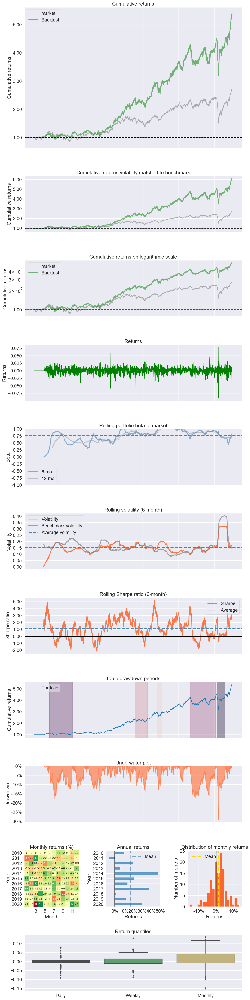

In [51]:
pf.create_returns_tear_sheet(ret_df.stra_riskp,benchmark_rets=ret_df.market)

In [52]:
with pd.HDFStore(DATA_STORE) as store:
    store.put('nse100/daily/results', ret_df)

In [53]:
with pd.HDFStore(DATA_STORE) as store:
    print(store.info())

<class 'pandas.io.pytables.HDFStore'>
File path: data/mom_results.h5
/nse100/daily/results                              frame        (shape->[2723,3])
/nse100/eq_wts/daily/positions                     frame        (shape->[2728,2])
/nse100/eq_wts/daily/returns                       series       (shape->[2728])  
/nse100/eq_wts/daily/transactions                  frame        (shape->[2214,5])
/nse100/eq_wts/monthly/positions                   frame        (shape->[2728,2])
/nse100/eq_wts/monthly/returns                     series       (shape->[2728])  
/nse100/eq_wts/monthly/transactions                frame        (shape->[1894,5])
/nse100/eq_wts/weekly/positions                    frame        (shape->[2728,2])
/nse100/eq_wts/weekly/returns                      series       (shape->[2728])  
/nse100/eq_wts/weekly/transactions                 frame        (shape->[2110,5])
/nse100/monthly/results                            frame        (shape->[2723,3])
/nse100/riskparity/daily/posi